## COMPAS - 2 OBJECTIVES

### Multi Layer Perceptron

* **Dataset:** Compass
* **Task:** Classification
* **Target:** Two year recidivism
* **Objectives:** Non-white and White individuals

### Methods

* **ML_MOO**
* **MONISE**
* **Random Weights**

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import math
import numpy as np
import pandas as pd

from sklearn.metrics import log_loss
from sklearn.model_selection import train_test_split

import torch
import torch.nn as nn
import torch.optim as optim

In [3]:
from ml_moo import moo, MooScalarization, get_objectives
from ml_moo.analysis.metrics import compute_hypervolume_progress
from ml_moo.analysis.visualization import plot_pareto_2d
from ml_moo.scalarization.two_objs_fairness_mlp import MLPFairScalarization

/home/lineccsa/mestrado/moo_research/moo_env/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


### Dataset and Model

In [4]:
# Setting a seed for reproducibility
seed = 42

In [5]:
import random
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

In [6]:
data = pd.read_csv("dataset/compas_onerace.csv")
fair_feature = "not_white"
pred_feature = "Two_yr_Recidivism"
data = data.drop("Unnamed: 0", axis=1)

categories_fair_class = []

for index, row in data.iterrows():
    if row[pred_feature] == -1:
        categories_fair_class.append(row[fair_feature])
    else:
        categories_fair_class.append(row[fair_feature]+2)

X_all = data.drop([pred_feature], axis=1)
# y = data[pred_feature]
y_all = (data[pred_feature] + 1)//2

X_train, X_test, y_train, y_test = train_test_split(X_all, y_all, 
                                                    test_size = int(data.shape[0]*0.5),
                                                    stratify = categories_fair_class,
                                                    random_state = seed)


In [7]:
class MLP(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super().__init__()
        self.layers = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.ReLU(),
            # nn.Linear(hidden_dim, 128),
            # nn.ReLU(),
            # nn.Linear(128, hidden_dim),
            # nn.ReLU(),
            nn.Linear(hidden_dim, output_dim),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.layers(x)

In [8]:
input_dim = X_train.shape[1]
hidden_dim = 64
output_dim = 1 

In [9]:
clf = MLP(input_dim, hidden_dim, output_dim)

In [10]:
def train_mlp_fair(model, X, y, fair_feat, fair_att, w):
    """
    Treina o modelo com sample weights balanceadas por grupo de fairness.
    Retorna a loss por grupo.
    """

    X_tensor = torch.tensor(X.to_numpy(), dtype=torch.float32)
    y_tensor = torch.tensor(y.to_numpy(), dtype=torch.float32)

    num_epochs = 200
    learning_rate = 0.01
    gradient = []

    # Gera os sample_weights com base nos grupos
    fair_weight = w
    sample_weight = X[fair_feat].replace({ff:fw/sum(X[fair_feat]==ff) 
                                        for ff, fw in zip(fair_att,fair_weight)})+10**-20

    # Treina o modelo
    sample_weight = torch.tensor(sample_weight.to_numpy(), dtype=torch.float32)

    criterion = nn.BCELoss(weight=sample_weight, reduction='sum')
    optimizer = optim.Adam(model.parameters(), lr=learning_rate, weight_decay=1e-5)
    
    model.train()
    for epoch in range(num_epochs):           
        y_pred = model(X_tensor).squeeze()
        loss = criterion(y_pred, y_tensor)
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        #if (epoch+1) % 10 == 0:
        #    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')
    
    model.eval()
    with torch.no_grad():
        y_pred = model(X_tensor)

    objs = np.zeros(len(fair_att))
    for i, feat in enumerate(fair_att):
            mask = X[fair_feat] == feat
            X_group = X_tensor[mask.to_numpy()]
            y_group = y_tensor[mask.to_numpy()]
            # Zero grad
            model.zero_grad()

            # Enable gradient computation
            X_group.requires_grad = True

            y_pred_group = model(X_group).squeeze()
            loss_group = nn.BCELoss(reduction='sum')(y_pred_group, y_group)
            loss_group.backward()

            # Coletar gradiente dos parâmetros da última camada
            grad_w = model.layers[-2].weight.grad.detach().numpy().flatten()
            grad_b = model.layers[-2].bias.grad.detach().numpy().flatten()
            grad_vec = np.concatenate([grad_b, grad_w])
            gradient.append(grad_vec)
            

            fair_weight = np.zeros(2)
            fair_weight[i] = 1
            sample_weight = X[fair_feat].replace({ff:fw for ff, fw in zip(fair_att,fair_weight)})
            objs[i] = log_loss(y, y_pred.detach().numpy(), sample_weight=sample_weight)

    # Stack gradientes de todos os objetivos
    gradients = np.vstack(gradient)
    return objs, model, gradients

In [11]:
fair_feat = fair_feature
fair_att = sorted(X_all[fair_feat].unique())

# Train function to be passed in scalarization
def train_fn_mlp(clf, w):
    return train_mlp_fair(clf, X_train, y_train, fair_feat, fair_att, w)

## Multi Objective Optimization Process

In [12]:
# Setting optimization parameter to use in all methods in this experiment
opt_params = {
    'node_time_limit': 2,
    'target_size': 30000,
    'target_gap': 0,
    'node_gap': 0.05,
    'norm': False
}
num_objs = 2
results = {}

In [13]:
# Logistic Regression with equal weight to use as baseline
equal = MooScalarization(clf, train_fn_mlp, num_objs)
equal.optimize(np.array([0.5, 0.5]))

## MOLA

In [ ]:
method = 'mola'
scalarization = MLPFairScalarization(X=X_train, y=y_train, fair_feat=fair_feature)
moopt = moo(scalarization).mo_optimization(method, **opt_params)
objs = get_objectives(moopt)
#hypervolume_values = compute_hypervolume_progress(objs)
hypervolume_values = moopt.get_hypervolumes()
results[method] = {
                "moopt": moopt,
                "objectives": objs,
                "models": moopt.get_models() if hasattr(moopt, "get_models") else None,
                "hypervolume": hypervolume_values
            }

22:05:22 | DEBUG | ml_moo | Filtered parameters for Mola: {'node_time_limit': 2, 'target_size': 30000, 'target_gap': 0, 'node_gap': 0.05, 'norm': False}
22:05:22 | DEBUG | ml_moo | Finding 1th individual minimum
22:05:22 | DEBUG | ml_moo | Finding 2th individual minimum
22:05:22 | DEBUG | ml_moo | Calculated weights: [0.46267155 0.53732845]
22:05:22 | DEBUG | ml_moo | Importance: 0.014512856542707286
22:05:22 | DEBUG | ml_moo | Global lower bound (y*): [0.59233915 0.59623251]
22:05:22 | DEBUG | ml_moo | Iteration 1
22:05:22 | DEBUG | ml_moo | Solutions list: [array([0.59233915, 0.6232418 ]), array([0.62370667, 0.59623251])]
22:05:22 | DEBUG | ml_moo | Calculated weights: [0.03668734 0.96331266]
22:05:22 | DEBUG | ml_moo | Importance: 0.0011271455013337484
22:05:22 | DEBUG | ml_moo | Global lower bound (y*): [0.59233915 0.59623251]
22:05:22 | DEBUG | ml_moo | Iteration 2
22:05:22 | DEBUG | ml_moo | Solutions list: [array([0.59301674, 0.59740129]), array([0.59233915, 0.6232418 ]), array(

new solution added [0.59301674 0.59740129]


22:05:22 | DEBUG | ml_moo | Calculated weights: [0.30229895 0.69770105]
22:05:22 | DEBUG | ml_moo | Importance: 0.0017559857195168505
22:05:22 | DEBUG | ml_moo | Global lower bound (y*): [0.59233915 0.59490056]
22:05:22 | DEBUG | ml_moo | Iteration 3
22:05:22 | DEBUG | ml_moo | Solutions list: [array([0.5987884 , 0.59490056]), array([0.59301674, 0.59740129]), array([0.59233915, 0.6232418 ])]


new solution added [0.5987884  0.59490056]
solution dominated [0.62370667 0.59623251]


22:05:23 | DEBUG | ml_moo | Calculated weights: [0.14033792 0.85966208]
22:05:23 | DEBUG | ml_moo | Importance: 0.0008122473291931609
22:05:23 | DEBUG | ml_moo | Global lower bound (y*): [0.59233915 0.59490056]
22:05:23 | DEBUG | ml_moo | Iteration 4
22:05:23 | DEBUG | ml_moo | Solutions list: [array([0.59303542, 0.59583972]), array([0.5987884 , 0.59490056]), array([0.59301674, 0.59740129]), array([0.59233915, 0.6232418 ])]


new solution added [0.59303542 0.59583972]


22:05:23 | DEBUG | ml_moo | Calculated weights: [0.97528553 0.02471447]
22:05:23 | DEBUG | ml_moo | Importance: 0.0006425281748271283
22:05:23 | DEBUG | ml_moo | Global lower bound (y*): [0.59233915 0.59425037]
22:05:23 | DEBUG | ml_moo | Iteration 5
22:05:23 | DEBUG | ml_moo | Solutions list: [array([0.59328124, 0.59425037]), array([0.59303542, 0.59583972]), array([0.59301674, 0.59740129]), array([0.59233915, 0.6232418 ])]
22:05:23 | DEBUG | ml_moo | Calculated weights: [0.67311905 0.32688095]
22:05:23 | DEBUG | ml_moo | Importance: 0.004314356674486319
22:05:23 | DEBUG | ml_moo | Global lower bound (y*): [0.58541809 0.59425037]
22:05:23 | DEBUG | ml_moo | Iteration 6
22:05:23 | DEBUG | ml_moo | Solutions list: [array([0.58541809, 0.6104423 ]), array([0.59328124, 0.59425037]), array([0.59303542, 0.59583972]), array([0.59301674, 0.59740129])]


new solution added [0.59328124 0.59425037]
solution dominated [0.5987884  0.59490056]
new solution added [0.58541809 0.6104423 ]
solution dominated [0.59233915 0.6232418 ]


22:05:23 | DEBUG | ml_moo | Calculated weights: [0.49786887 0.50213113]
22:05:23 | DEBUG | ml_moo | Importance: 0.0022876536991695007
22:05:23 | DEBUG | ml_moo | Global lower bound (y*): [0.58541809 0.59425037]
22:05:23 | DEBUG | ml_moo | Iteration 7
22:05:23 | DEBUG | ml_moo | Solutions list: [array([0.58568047, 0.60178663]), array([0.58541809, 0.6104423 ]), array([0.59328124, 0.59425037]), array([0.59303542, 0.59583972]), array([0.59301674, 0.59740129])]


new solution added [0.58568047 0.60178663]


22:05:24 | DEBUG | ml_moo | Calculated weights: [0.391665 0.608335]
22:05:24 | DEBUG | ml_moo | Importance: 0.0010105251273081484
22:05:24 | DEBUG | ml_moo | Global lower bound (y*): [0.58541809 0.59425037]
22:05:24 | DEBUG | ml_moo | Iteration 8
22:05:24 | DEBUG | ml_moo | Solutions list: [array([0.5860852, 0.5988834]), array([0.58568047, 0.60178663]), array([0.58541809, 0.6104423 ]), array([0.59328124, 0.59425037]), array([0.59303542, 0.59583972]), array([0.59301674, 0.59740129])]


new solution added [0.5860852 0.5988834]


22:05:24 | DEBUG | ml_moo | Calculated weights: [0.97361413 0.02638587]
22:05:24 | DEBUG | ml_moo | Importance: 0.00023780132837980528
22:05:24 | DEBUG | ml_moo | Global lower bound (y*): [0.58541809 0.59425037]
22:05:24 | DEBUG | ml_moo | Iteration 9
22:05:24 | DEBUG | ml_moo | Solutions list: [array([0.58581322, 0.59584244]), array([0.58568047, 0.60178663]), array([0.58541809, 0.6104423 ]), array([0.59328124, 0.59425037]), array([0.59303542, 0.59583972])]
22:05:25 | DEBUG | ml_moo | Calculated weights: [0.53799602 0.46200398]
22:05:25 | DEBUG | ml_moo | Importance: 0.0021533442647673207
22:05:25 | DEBUG | ml_moo | Global lower bound (y*): [0.58187905 0.59425037]
22:05:25 | DEBUG | ml_moo | Iteration 10
22:05:25 | DEBUG | ml_moo | Solutions list: [array([0.58187905, 0.60042371]), array([0.58581322, 0.59584244]), array([0.59328124, 0.59425037]), array([0.59303542, 0.59583972])]


new solution added [0.58581322 0.59584244]
solution dominated [0.5860852 0.5988834]
solution dominated [0.59301674 0.59740129]
new solution added [0.58187905 0.60042371]
solution dominated [0.58568047 0.60178663]
solution dominated [0.58541809 0.6104423 ]


22:05:25 | DEBUG | ml_moo | Calculated weights: [0.00714805 0.99285195]
22:05:25 | DEBUG | ml_moo | Importance: 8.46230616354728e-05
22:05:25 | DEBUG | ml_moo | Global lower bound (y*): [0.5814161  0.59425037]
22:05:25 | DEBUG | ml_moo | Iteration 11
22:05:25 | DEBUG | ml_moo | Solutions list: [array([0.5814161, 0.5943356]), array([0.59328124, 0.59425037])]
22:05:25 | DEBUG | ml_moo | Calculated weights: [0.25368823 0.74631177]
22:05:25 | DEBUG | ml_moo | Importance: 0.00244205131794354
22:05:25 | DEBUG | ml_moo | Global lower bound (y*): [0.5814161  0.59106344]
22:05:25 | DEBUG | ml_moo | Iteration 12
22:05:25 | DEBUG | ml_moo | Solutions list: [array([0.59104231, 0.59106344]), array([0.5814161, 0.5943356])]


new solution added [0.5814161 0.5943356]
solution dominated [0.58187905 0.60042371]
solution dominated [0.58581322 0.59584244]
solution dominated [0.59303542 0.59583972]
new solution added [0.59104231 0.59106344]
solution dominated [0.59328124 0.59425037]


22:05:25 | DEBUG | ml_moo | Calculated weights: [0.08525737 0.91474263]
22:05:25 | DEBUG | ml_moo | Importance: 0.0007829238290966573
22:05:25 | DEBUG | ml_moo | Global lower bound (y*): [0.5814161  0.59106344]
22:05:25 | DEBUG | ml_moo | Iteration 13
22:05:25 | DEBUG | ml_moo | Solutions list: [array([0.58188251, 0.59191717]), array([0.59104231, 0.59106344]), array([0.5814161, 0.5943356])]
22:05:25 | DEBUG | ml_moo | Calculated weights: [0.39086065 0.60913935]
22:05:25 | DEBUG | ml_moo | Importance: 0.0006779808227827533
22:05:25 | DEBUG | ml_moo | Global lower bound (y*): [0.5814161  0.59081913]
22:05:25 | DEBUG | ml_moo | Iteration 14
22:05:25 | DEBUG | ml_moo | Solutions list: [array([0.58359376, 0.59081913]), array([0.58188251, 0.59191717]), array([0.5814161, 0.5943356])]


new solution added [0.58188251 0.59191717]
new solution added [0.58359376 0.59081913]
solution dominated [0.59104231 0.59106344]


22:05:26 | DEBUG | ml_moo | Calculated weights: [0.21128515 0.78871485]
22:05:26 | DEBUG | ml_moo | Importance: 0.0006704150398274163
22:05:26 | DEBUG | ml_moo | Global lower bound (y*): [0.5804206  0.59081913]
22:05:26 | DEBUG | ml_moo | Iteration 15
22:05:26 | DEBUG | ml_moo | Solutions list: [array([0.5804206 , 0.59166917]), array([0.58359376, 0.59081913])]


new solution added [0.5804206  0.59166917]
solution dominated [0.58188251 0.59191717]
solution dominated [0.5814161 0.5943356]


22:05:26 | DEBUG | ml_moo | Calculated weights: [0.67805654 0.32194346]
22:05:26 | DEBUG | ml_moo | Importance: 0.0002950087512919308
22:05:26 | DEBUG | ml_moo | Global lower bound (y*): [0.5804206  0.59075288]
22:05:26 | DEBUG | ml_moo | Iteration 16
22:05:26 | DEBUG | ml_moo | Solutions list: [array([0.58085566, 0.59075288]), array([0.5804206 , 0.59166917])]


new solution added [0.58085566 0.59075288]
solution dominated [0.58359376 0.59081913]


22:05:26 | DEBUG | ml_moo | Calculated weights: [0.24131254 0.75868746]
22:05:26 | DEBUG | ml_moo | Importance: 0.0005687463539173834
22:05:26 | DEBUG | ml_moo | Global lower bound (y*): [0.57849867 0.59075288]
22:05:26 | DEBUG | ml_moo | Iteration 17
22:05:26 | DEBUG | ml_moo | Solutions list: [array([0.57849867, 0.59150255]), array([0.58085566, 0.59075288])]


new solution added [0.57849867 0.59150255]
solution dominated [0.5804206  0.59166917]


22:05:27 | DEBUG | ml_moo | Calculated weights: [0.5965678 0.4034322]
22:05:27 | DEBUG | ml_moo | Importance: 0.00048119469128567183
22:05:27 | DEBUG | ml_moo | Global lower bound (y*): [0.57849867 0.59030976]
22:05:27 | DEBUG | ml_moo | Iteration 18
22:05:27 | DEBUG | ml_moo | Solutions list: [array([0.5793053 , 0.59030976]), array([0.57849867, 0.59150255])]


new solution added [0.5793053  0.59030976]
solution dominated [0.58085566 0.59075288]


22:05:27 | DEBUG | ml_moo | Calculated weights: [0.09596266 0.90403734]
22:05:27 | DEBUG | ml_moo | Importance: 0.00015428459606713942
22:05:27 | DEBUG | ml_moo | Global lower bound (y*): [0.57769742 0.59030976]
22:05:27 | DEBUG | ml_moo | Iteration 19
22:05:27 | DEBUG | ml_moo | Solutions list: [array([0.57769742, 0.59048042]), array([0.5793053 , 0.59030976])]


new solution added [0.57769742 0.59048042]
solution dominated [0.57849867 0.59150255]


22:05:28 | DEBUG | ml_moo | Calculated weights: [0.34217513 0.65782487]
22:05:28 | DEBUG | ml_moo | Importance: 0.00024121497988005558
22:05:28 | DEBUG | ml_moo | Global lower bound (y*): [0.57769742 0.5893192 ]
22:05:28 | DEBUG | ml_moo | Iteration 20
22:05:28 | DEBUG | ml_moo | Solutions list: [array([0.57992985, 0.5893192 ]), array([0.57769742, 0.59048042]), array([0.5793053 , 0.59030976])]
22:05:28 | DEBUG | ml_moo | Calculated weights: [0.61837012 0.38162988]
22:05:28 | DEBUG | ml_moo | Importance: 0.00040917442766852385
22:05:28 | DEBUG | ml_moo | Global lower bound (y*): [0.57769742 0.5893192 ]
22:05:28 | DEBUG | ml_moo | Iteration 21
22:05:28 | DEBUG | ml_moo | Solutions list: [array([0.57835494, 0.58941501]), array([0.57992985, 0.5893192 ]), array([0.57769742, 0.59048042])]


new solution added [0.57992985 0.5893192 ]
new solution added [0.57835494 0.58941501]
solution dominated [0.5793053  0.59030976]


22:05:28 | DEBUG | ml_moo | Calculated weights: [0.24818368 0.75181632]
22:05:28 | DEBUG | ml_moo | Importance: 0.00032083507117453003
22:05:28 | DEBUG | ml_moo | Global lower bound (y*): [0.57707672 0.5893192 ]
22:05:28 | DEBUG | ml_moo | Iteration 22
22:05:28 | DEBUG | ml_moo | Solutions list: [array([0.57707672, 0.58983697]), array([0.57835494, 0.58941501]), array([0.57992985, 0.5893192 ])]
22:05:28 | DEBUG | ml_moo | Calculated weights: [0.52388826 0.47611174]
22:05:28 | DEBUG | ml_moo | Importance: 0.0004030159130767319
22:05:28 | DEBUG | ml_moo | Global lower bound (y*): [0.57707672 0.58899049]
22:05:28 | DEBUG | ml_moo | Iteration 23
22:05:28 | DEBUG | ml_moo | Solutions list: [array([0.57784601, 0.58899049]), array([0.57707672, 0.58983697])]


new solution added [0.57707672 0.58983697]
solution dominated [0.57769742 0.59048042]
new solution added [0.57784601 0.58899049]
solution dominated [0.57835494 0.58941501]
solution dominated [0.57992985 0.5893192 ]


22:05:29 | DEBUG | ml_moo | Calculated weights: [0.27369197 0.72630803]
22:05:29 | DEBUG | ml_moo | Importance: 0.00024524826789423804
22:05:29 | DEBUG | ml_moo | Global lower bound (y*): [0.57694968 0.58899049]
22:05:29 | DEBUG | ml_moo | Iteration 24
22:05:29 | DEBUG | ml_moo | Solutions list: [array([0.57694968, 0.58932824]), array([0.57784601, 0.58899049])]


new solution added [0.57694968 0.58932824]
solution dominated [0.57707672 0.58983697]


22:05:29 | DEBUG | ml_moo | Calculated weights: [0.49097722 0.50902278]
22:05:29 | DEBUG | ml_moo | Importance: 0.00023759243104978095
22:05:29 | DEBUG | ml_moo | Global lower bound (y*): [0.57694968 0.58886147]
22:05:29 | DEBUG | ml_moo | Iteration 25
22:05:29 | DEBUG | ml_moo | Solutions list: [array([0.57743361, 0.58886147]), array([0.57694968, 0.58932824])]
22:05:29 | DEBUG | ml_moo | Calculated weights: [0.27536932 0.72463068]
22:05:29 | DEBUG | ml_moo | Importance: 0.00021444683942842269
22:05:29 | DEBUG | ml_moo | Global lower bound (y*): [0.57665428 0.58886147]
22:05:29 | DEBUG | ml_moo | Iteration 26
22:05:29 | DEBUG | ml_moo | Solutions list: [array([0.57665428, 0.58915762]), array([0.57743361, 0.58886147])]


new solution added [0.57743361 0.58886147]
solution dominated [0.57784601 0.58899049]
new solution added [0.57665428 0.58915762]
solution dominated [0.57694968 0.58932824]


22:05:30 | DEBUG | ml_moo | Calculated weights: [0.49503403 0.50496597]
22:05:30 | DEBUG | ml_moo | Importance: 0.0002301691414061252
22:05:30 | DEBUG | ml_moo | Global lower bound (y*): [0.57665428 0.5887018 ]
22:05:30 | DEBUG | ml_moo | Iteration 27
22:05:30 | DEBUG | ml_moo | Solutions list: [array([0.57711925, 0.5887018 ]), array([0.57665428, 0.58915762])]


new solution added [0.57711925 0.5887018 ]
solution dominated [0.57743361 0.58886147]


22:05:30 | DEBUG | ml_moo | Calculated weights: [0.33822933 0.66177067]
22:05:30 | DEBUG | ml_moo | Importance: 0.0002317307963959278
22:05:30 | DEBUG | ml_moo | Global lower bound (y*): [0.57643401 0.5887018 ]
22:05:30 | DEBUG | ml_moo | Iteration 28
22:05:30 | DEBUG | ml_moo | Solutions list: [array([0.57643401, 0.58905202]), array([0.57711925, 0.5887018 ])]


new solution added [0.57643401 0.58905202]
solution dominated [0.57665428 0.58915762]


22:05:31 | DEBUG | ml_moo | Calculated weights: [0.58292125 0.41707875]
22:05:31 | DEBUG | ml_moo | Importance: 0.00012384289729561182
22:05:31 | DEBUG | ml_moo | Global lower bound (y*): [0.57643401 0.5887018 ]
22:05:31 | DEBUG | ml_moo | Iteration 29
22:05:31 | DEBUG | ml_moo | Solutions list: [array([0.57664357, 0.58875913]), array([0.57643401, 0.58905202]), array([0.57711925, 0.5887018 ])]


new solution added [0.57664357 0.58875913]
new solution added [0.57580512 0.58896446]
solution dominated [0.57643401 0.58905202]


22:05:31 | DEBUG | ml_moo | Calculated weights: [0.19672199 0.80327801]
22:05:31 | DEBUG | ml_moo | Importance: 0.0001672455819223817
22:05:31 | DEBUG | ml_moo | Global lower bound (y*): [0.57580512 0.5887018 ]
22:05:31 | DEBUG | ml_moo | Iteration 30
22:05:31 | DEBUG | ml_moo | Solutions list: [array([0.57580512, 0.58896446]), array([0.57664357, 0.58875913]), array([0.57711925, 0.5887018 ])]
22:05:31 | DEBUG | ml_moo | Calculated weights: [0.41144699 0.58855301]
22:05:31 | DEBUG | ml_moo | Importance: 0.00031090749629319753
22:05:31 | DEBUG | ml_moo | Global lower bound (y*): [0.57580512 0.58843619]
22:05:31 | DEBUG | ml_moo | Iteration 31
22:05:31 | DEBUG | ml_moo | Solutions list: [array([0.57656078, 0.58843619]), array([0.57580512, 0.58896446])]


new solution added [0.57656078 0.58843619]
solution dominated [0.57664357 0.58875913]
solution dominated [0.57711925 0.5887018 ]


22:05:31 | DEBUG | ml_moo | Calculated weights: [0.34455273 0.65544727]
22:05:31 | DEBUG | ml_moo | Importance: 0.00021445297370703553
22:05:31 | DEBUG | ml_moo | Global lower bound (y*): [0.57580512 0.58843619]
22:05:31 | DEBUG | ml_moo | Iteration 32
22:05:31 | DEBUG | ml_moo | Solutions list: [array([0.57594539, 0.58875969]), array([0.57656078, 0.58843619]), array([0.57580512, 0.58896446])]


new solution added [0.57594539 0.58875969]


22:05:32 | DEBUG | ml_moo | Calculated weights: [0.67835183 0.32164817]
22:05:32 | DEBUG | ml_moo | Importance: 8.447488256238533e-05
22:05:32 | DEBUG | ml_moo | Global lower bound (y*): [0.57580512 0.58842299]
22:05:32 | DEBUG | ml_moo | Iteration 33
22:05:32 | DEBUG | ml_moo | Solutions list: [array([0.57606186, 0.58842299]), array([0.57594539, 0.58875969]), array([0.57580512, 0.58896446])]


new solution added [0.57606186 0.58842299]
solution dominated [0.57656078 0.58843619]


22:05:32 | DEBUG | ml_moo | Calculated weights: [0.34164964 0.65835036]
22:05:32 | DEBUG | ml_moo | Importance: 0.00017857842454872472
22:05:32 | DEBUG | ml_moo | Global lower bound (y*): [0.575539   0.58842299]
22:05:32 | DEBUG | ml_moo | Iteration 34
22:05:32 | DEBUG | ml_moo | Solutions list: [array([0.575539  , 0.58869432]), array([0.57606186, 0.58842299])]


new solution added [0.575539   0.58869432]
solution dominated [0.57594539 0.58875969]
solution dominated [0.57580512 0.58896446]


22:05:32 | DEBUG | ml_moo | Calculated weights: [0.65019169 0.34980831]
22:05:32 | DEBUG | ml_moo | Importance: 0.0001724576958949675
22:05:32 | DEBUG | ml_moo | Global lower bound (y*): [0.575539   0.58820146]
22:05:32 | DEBUG | ml_moo | Iteration 35
22:05:32 | DEBUG | ml_moo | Solutions list: [array([0.57580417, 0.58820146]), array([0.575539  , 0.58869432])]


new solution added [0.57580417 0.58820146]
solution dominated [0.57606186 0.58842299]


22:05:33 | DEBUG | ml_moo | Calculated weights: [0.31428122 0.68571878]
22:05:33 | DEBUG | ml_moo | Importance: 0.00022961943104607765
22:05:33 | DEBUG | ml_moo | Global lower bound (y*): [0.57507339 0.58820146]
22:05:33 | DEBUG | ml_moo | Iteration 36
22:05:33 | DEBUG | ml_moo | Solutions list: [array([0.57507339, 0.58853639]), array([0.57580417, 0.58820146])]
22:05:33 | DEBUG | ml_moo | Calculated weights: [0.53271314 0.46728686]
22:05:33 | DEBUG | ml_moo | Importance: 0.00023327506014552551
22:05:33 | DEBUG | ml_moo | Global lower bound (y*): [0.57507339 0.58803716]
22:05:33 | DEBUG | ml_moo | Iteration 37
22:05:33 | DEBUG | ml_moo | Solutions list: [array([0.5755113 , 0.58803716]), array([0.57507339, 0.58853639])]


new solution added [0.57507339 0.58853639]
solution dominated [0.575539   0.58869432]
new solution added [0.5755113  0.58803716]
solution dominated [0.57580417 0.58820146]


22:05:33 | DEBUG | ml_moo | Calculated weights: [0.2783553 0.7216447]
22:05:33 | DEBUG | ml_moo | Importance: 0.00011544268653218559
22:05:33 | DEBUG | ml_moo | Global lower bound (y*): [0.57507339 0.58803716]
22:05:33 | DEBUG | ml_moo | Iteration 38
22:05:33 | DEBUG | ml_moo | Solutions list: [array([0.57509778, 0.58819667]), array([0.5755113 , 0.58803716]), array([0.57507339, 0.58853639])]


new solution added [0.57509778 0.58819667]


22:05:33 | DEBUG | ml_moo | Calculated weights: [0.48860622 0.51139378]
22:05:33 | DEBUG | ml_moo | Importance: 0.000190760966402026
22:05:33 | DEBUG | ml_moo | Global lower bound (y*): [0.57507339 0.58782481]
22:05:33 | DEBUG | ml_moo | Iteration 39
22:05:33 | DEBUG | ml_moo | Solutions list: [array([0.57548698, 0.58782481]), array([0.57509778, 0.58819667]), array([0.57507339, 0.58853639])]


new solution added [0.57548698 0.58782481]
solution dominated [0.5755113  0.58803716]


22:05:34 | DEBUG | ml_moo | Calculated weights: [0.30923162 0.69076838]
22:05:34 | DEBUG | ml_moo | Importance: 0.00011059213219055675
22:05:34 | DEBUG | ml_moo | Global lower bound (y*): [0.57507339 0.58782481]
22:05:34 | DEBUG | ml_moo | Iteration 40
22:05:34 | DEBUG | ml_moo | Solutions list: [array([0.57513229, 0.58798359]), array([0.57548698, 0.58782481]), array([0.57509778, 0.58819667]), array([0.57507339, 0.58853639])]


new solution added [0.57513229 0.58798359]


22:05:34 | DEBUG | ml_moo | Calculated weights: [0.39297617 0.60702383]
22:05:34 | DEBUG | ml_moo | Importance: 0.00010182487206178426
22:05:34 | DEBUG | ml_moo | Global lower bound (y*): [0.57507339 0.58768369]
22:05:34 | DEBUG | ml_moo | Iteration 41
22:05:34 | DEBUG | ml_moo | Solutions list: [array([0.57559555, 0.58768369]), array([0.57513229, 0.58798359]), array([0.57548698, 0.58782481]), array([0.57509778, 0.58819667]), array([0.57507339, 0.58853639])]
22:05:34 | DEBUG | ml_moo | Calculated weights: [0.54857546 0.45142454]
22:05:34 | DEBUG | ml_moo | Importance: 0.00013128079520119407
22:05:34 | DEBUG | ml_moo | Global lower bound (y*): [0.57507339 0.58768369]
22:05:34 | DEBUG | ml_moo | Iteration 42
22:05:34 | DEBUG | ml_moo | Solutions list: [array([0.57536811, 0.58769702]), array([0.57559555, 0.58768369]), array([0.57513229, 0.58798359]), array([0.57509778, 0.58819667]), array([0.57507339, 0.58853639])]


new solution added [0.57559555 0.58768369]
new solution added [0.57536811 0.58769702]
solution dominated [0.57548698 0.58782481]


22:05:34 | DEBUG | ml_moo | Calculated weights: [0.41461306 0.58538694]
22:05:34 | DEBUG | ml_moo | Importance: 0.00015818663750744033
22:05:34 | DEBUG | ml_moo | Global lower bound (y*): [0.57498752 0.58768369]
22:05:34 | DEBUG | ml_moo | Iteration 43
22:05:34 | DEBUG | ml_moo | Solutions list: [array([0.57498752, 0.58796658]), array([0.57536811, 0.58769702]), array([0.57559555, 0.58768369])]


new solution added [0.57498752 0.58796658]
solution dominated [0.57513229 0.58798359]
solution dominated [0.57509778 0.58819667]
solution dominated [0.57507339 0.58853639]


22:05:35 | DEBUG | ml_moo | Calculated weights: [0.70008756 0.29991244]
22:05:35 | DEBUG | ml_moo | Importance: 7.25231534352e-05
22:05:35 | DEBUG | ml_moo | Global lower bound (y*): [0.57498752 0.58768369]
22:05:35 | DEBUG | ml_moo | Iteration 44
22:05:35 | DEBUG | ml_moo | Solutions list: [array([0.57509019, 0.58772693]), array([0.57498752, 0.58796658]), array([0.57536811, 0.58769702]), array([0.57559555, 0.58768369])]
22:05:35 | DEBUG | ml_moo | Calculated weights: [0.40236516 0.59763484]
22:05:35 | DEBUG | ml_moo | Importance: 7.889605543653921e-05
22:05:35 | DEBUG | ml_moo | Global lower bound (y*): [0.57455916 0.58768369]
22:05:35 | DEBUG | ml_moo | Iteration 45
22:05:35 | DEBUG | ml_moo | Solutions list: [array([0.57455916, 0.58808445]), array([0.57509019, 0.58772693]), array([0.57498752, 0.58796658]), array([0.57536811, 0.58769702]), array([0.57559555, 0.58768369])]


new solution added [0.57509019 0.58772693]
new solution added [0.57455916 0.58808445]


22:05:35 | DEBUG | ml_moo | Calculated weights: [0.61221235 0.38778765]
22:05:35 | DEBUG | ml_moo | Importance: 0.00012329532904109541
22:05:35 | DEBUG | ml_moo | Global lower bound (y*): [0.57455916 0.58768369]
22:05:35 | DEBUG | ml_moo | Iteration 46
22:05:35 | DEBUG | ml_moo | Solutions list: [array([0.57475779, 0.58777086]), array([0.57455916, 0.58808445]), array([0.57509019, 0.58772693]), array([0.57536811, 0.58769702]), array([0.57559555, 0.58768369])]
22:05:35 | DEBUG | ml_moo | Calculated weights: [0.42907983 0.57092017]
22:05:35 | DEBUG | ml_moo | Importance: 0.00011182654375985202
22:05:35 | DEBUG | ml_moo | Global lower bound (y*): [0.57450297 0.58768369]
22:05:35 | DEBUG | ml_moo | Iteration 47
22:05:35 | DEBUG | ml_moo | Solutions list: [array([0.57450297, 0.58796238]), array([0.57475779, 0.58777086]), array([0.57509019, 0.58772693]), array([0.57536811, 0.58769702]), array([0.57559555, 0.58768369])]


new solution added [0.57475779 0.58777086]
solution dominated [0.57498752 0.58796658]
new solution added [0.57450297 0.58796238]
solution dominated [0.57455916 0.58808445]


22:05:36 | DEBUG | ml_moo | Calculated weights: [0.68056394 0.31943606]
22:05:36 | DEBUG | ml_moo | Importance: 8.580704885807755e-05
22:05:36 | DEBUG | ml_moo | Global lower bound (y*): [0.57450297 0.58768369]
22:05:36 | DEBUG | ml_moo | Iteration 48
22:05:36 | DEBUG | ml_moo | Solutions list: [array([0.57462881, 0.58769429]), array([0.57450297, 0.58796238]), array([0.57559555, 0.58768369])]


new solution added [0.57462881 0.58769429]
solution dominated [0.57475779 0.58777086]
solution dominated [0.57509019 0.58772693]
solution dominated [0.57536811 0.58769702]


22:05:36 | DEBUG | ml_moo | Calculated weights: [0.38926103 0.61073897]
22:05:36 | DEBUG | ml_moo | Importance: 0.0001515973914423263
22:05:36 | DEBUG | ml_moo | Global lower bound (y*): [0.57424019 0.58768369]
22:05:36 | DEBUG | ml_moo | Iteration 49
22:05:36 | DEBUG | ml_moo | Solutions list: [array([0.57424019, 0.58794198]), array([0.57462881, 0.58769429]), array([0.57559555, 0.58768369])]
22:05:36 | DEBUG | ml_moo | Calculated weights: [0.57983797 0.42016203]
22:05:36 | DEBUG | ml_moo | Importance: 0.00012345347331715883
22:05:36 | DEBUG | ml_moo | Global lower bound (y*): [0.57424019 0.58764817]
22:05:36 | DEBUG | ml_moo | Iteration 50
22:05:36 | DEBUG | ml_moo | Solutions list: [array([0.57445308, 0.58764817]), array([0.57424019, 0.58794198])]


new solution added [0.57424019 0.58794198]
solution dominated [0.57450297 0.58796238]
new solution added [0.57445308 0.58764817]
solution dominated [0.57462881 0.58769429]
solution dominated [0.57559555 0.58768369]


22:05:37 | DEBUG | ml_moo | Calculated weights: [0.37263856 0.62736144]
22:05:37 | DEBUG | ml_moo | Importance: 9.413573246093085e-05
22:05:37 | DEBUG | ml_moo | Global lower bound (y*): [0.57420019 0.58764817]
22:05:37 | DEBUG | ml_moo | Iteration 51
22:05:37 | DEBUG | ml_moo | Solutions list: [array([0.57420019, 0.58779839]), array([0.57445308, 0.58764817])]


new solution added [0.57420019 0.58779839]
solution dominated [0.57424019 0.58794198]


22:05:37 | DEBUG | ml_moo | Calculated weights: [0.59499823 0.40500177]
22:05:37 | DEBUG | ml_moo | Importance: 0.00014659161642129048
22:05:37 | DEBUG | ml_moo | Global lower bound (y*): [0.57420019 0.58743573]
22:05:37 | DEBUG | ml_moo | Iteration 52
22:05:37 | DEBUG | ml_moo | Solutions list: [array([0.57444704, 0.58743573]), array([0.57420019, 0.58779839])]


new solution added [0.57444704 0.58743573]
solution dominated [0.57445308 0.58764817]


22:05:37 | DEBUG | ml_moo | Calculated weights: [0.34346421 0.65653579]
22:05:37 | DEBUG | ml_moo | Importance: 0.00016216982322652188
22:05:37 | DEBUG | ml_moo | Global lower bound (y*): [0.57397443 0.58743573]
22:05:37 | DEBUG | ml_moo | Iteration 53
22:05:37 | DEBUG | ml_moo | Solutions list: [array([0.57397443, 0.58768297]), array([0.57444704, 0.58743573])]
22:05:38 | DEBUG | ml_moo | Calculated weights: [0.49175458 0.50824542]
22:05:38 | DEBUG | ml_moo | Importance: 0.0001459144363308261
22:05:38 | DEBUG | ml_moo | Global lower bound (y*): [0.57397443 0.58739587]
22:05:38 | DEBUG | ml_moo | Iteration 54
22:05:38 | DEBUG | ml_moo | Solutions list: [array([0.57427116, 0.58739587]), array([0.57397443, 0.58768297])]


new solution added [0.57397443 0.58768297]
solution dominated [0.57420019 0.58779839]
new solution added [0.57427116 0.58739587]
solution dominated [0.57444704 0.58743573]


22:05:38 | DEBUG | ml_moo | Calculated weights: [0.39612954 0.60387046]
22:05:38 | DEBUG | ml_moo | Importance: 9.418132850125271e-05
22:05:38 | DEBUG | ml_moo | Global lower bound (y*): [0.57397443 0.58739587]
22:05:38 | DEBUG | ml_moo | Iteration 55
22:05:38 | DEBUG | ml_moo | Solutions list: [array([0.57403651, 0.58754979]), array([0.57427116, 0.58739587]), array([0.57397443, 0.58768297])]
22:05:38 | DEBUG | ml_moo | Calculated weights: [0.58644837 0.41355163]
22:05:38 | DEBUG | ml_moo | Importance: 9.573196393375394e-05
22:05:38 | DEBUG | ml_moo | Global lower bound (y*): [0.57397443 0.58732271]
22:05:38 | DEBUG | ml_moo | Iteration 56
22:05:38 | DEBUG | ml_moo | Solutions list: [array([0.57419665, 0.58732271]), array([0.57403651, 0.58754979]), array([0.57397443, 0.58768297])]


new solution added [0.57403651 0.58754979]
new solution added [0.57419665 0.58732271]
solution dominated [0.57427116 0.58739587]


22:05:38 | DEBUG | ml_moo | Calculated weights: [0.42382287 0.57617713]
22:05:38 | DEBUG | ml_moo | Importance: 9.997033198306865e-05
22:05:38 | DEBUG | ml_moo | Global lower bound (y*): [0.57396101 0.58732271]
22:05:38 | DEBUG | ml_moo | Iteration 57
22:05:38 | DEBUG | ml_moo | Solutions list: [array([0.57396101, 0.58749603]), array([0.57419665, 0.58732271])]


new solution added [0.57396101 0.58749603]
solution dominated [0.57403651 0.58754979]
solution dominated [0.57397443 0.58768297]


22:05:39 | DEBUG | ml_moo | Calculated weights: [0.73723237 0.26276763]
22:05:39 | DEBUG | ml_moo | Importance: 5.899902330659679e-05
22:05:39 | DEBUG | ml_moo | Global lower bound (y*): [0.57396101 0.58727149]
22:05:39 | DEBUG | ml_moo | Iteration 58
22:05:39 | DEBUG | ml_moo | Solutions list: [array([0.57404104, 0.58727149]), array([0.57396101, 0.58749603])]


new solution added [0.57404104 0.58727149]
solution dominated [0.57419665 0.58732271]


22:05:39 | DEBUG | ml_moo | Calculated weights: [0.48387686 0.51612314]
22:05:39 | DEBUG | ml_moo | Importance: 6.364525879587468e-05
22:05:39 | DEBUG | ml_moo | Global lower bound (y*): [0.57368197 0.58727149]
22:05:39 | DEBUG | ml_moo | Iteration 59
22:05:39 | DEBUG | ml_moo | Solutions list: [array([0.57368197, 0.58760812]), array([0.57404104, 0.58727149]), array([0.57396101, 0.58749603])]
22:05:39 | DEBUG | ml_moo | Calculated weights: [0.62512464 0.37487536]
22:05:39 | DEBUG | ml_moo | Importance: 0.00010317612557730893
22:05:39 | DEBUG | ml_moo | Global lower bound (y*): [0.57368197 0.58727149]
22:05:39 | DEBUG | ml_moo | Iteration 60
22:05:39 | DEBUG | ml_moo | Solutions list: [array([0.57384509, 0.58733612]), array([0.57368197, 0.58760812]), array([0.57404104, 0.58727149])]


new solution added [0.57368197 0.58760812]
new solution added [0.57384509 0.58733612]
solution dominated [0.57396101 0.58749603]


22:05:40 | DEBUG | ml_moo | Calculated weights: [0.38937604 0.61062396]
22:05:40 | DEBUG | ml_moo | Importance: 8.973634447573264e-05
22:05:40 | DEBUG | ml_moo | Global lower bound (y*): [0.57361969 0.58727149]
22:05:40 | DEBUG | ml_moo | Iteration 61
22:05:40 | DEBUG | ml_moo | Solutions list: [array([0.57361969, 0.58747985]), array([0.57384509, 0.58733612]), array([0.57404104, 0.58727149])]


new solution added [0.57361969 0.58747985]
solution dominated [0.57368197 0.58760812]


22:05:40 | DEBUG | ml_moo | Calculated weights: [0.5264545 0.4735455]
22:05:40 | DEBUG | ml_moo | Importance: 7.327114697963655e-05
22:05:40 | DEBUG | ml_moo | Global lower bound (y*): [0.57361969 0.58711608]
22:05:40 | DEBUG | ml_moo | Iteration 62
22:05:40 | DEBUG | ml_moo | Solutions list: [array([0.57394691, 0.58711608]), array([0.57361969, 0.58747985]), array([0.57384509, 0.58733612])]


new solution added [0.57394691 0.58711608]
solution dominated [0.57404104 0.58727149]


22:05:41 | DEBUG | ml_moo | Calculated weights: [0.78790294 0.21209706]
22:05:41 | DEBUG | ml_moo | Importance: 6.345643725258476e-05
22:05:41 | DEBUG | ml_moo | Global lower bound (y*): [0.57361969 0.58711608]
22:05:41 | DEBUG | ml_moo | Iteration 63
22:05:41 | DEBUG | ml_moo | Solutions list: [array([0.57369932, 0.58718406]), array([0.57394691, 0.58711608]), array([0.57361969, 0.58747985])]


new solution added [0.57369932 0.58718406]
solution dominated [0.57384509 0.58733612]
new solution added [0.5732025 0.5876437]


22:05:41 | DEBUG | ml_moo | Calculated weights: [0.48056826 0.51943174]
22:05:41 | DEBUG | ml_moo | Importance: 9.455855491236065e-05
22:05:41 | DEBUG | ml_moo | Global lower bound (y*): [0.5732025  0.58711608]
22:05:41 | DEBUG | ml_moo | Iteration 64
22:05:41 | DEBUG | ml_moo | Solutions list: [array([0.5732025, 0.5876437]), array([0.57369932, 0.58718406]), array([0.57394691, 0.58711608]), array([0.57361969, 0.58747985])]
22:05:41 | DEBUG | ml_moo | Calculated weights: [0.66773235 0.33226765]
22:05:41 | DEBUG | ml_moo | Importance: 0.00012953474046684121
22:05:41 | DEBUG | ml_moo | Global lower bound (y*): [0.5732025  0.58711608]
22:05:41 | DEBUG | ml_moo | Iteration 65
22:05:41 | DEBUG | ml_moo | Solutions list: [array([0.57339289, 0.58726111]), array([0.5732025, 0.5876437]), array([0.57369932, 0.58718406]), array([0.57394691, 0.58711608])]


new solution added [0.57339289 0.58726111]
solution dominated [0.57361969 0.58747985]
new solution added [0.57320227 0.58739783]
solution dominated [0.5732025 0.5876437]


22:05:41 | DEBUG | ml_moo | Calculated weights: [0.41768256 0.58231744]
22:05:41 | DEBUG | ml_moo | Importance: 8.38411165480224e-05
22:05:41 | DEBUG | ml_moo | Global lower bound (y*): [0.57320227 0.58711608]
22:05:41 | DEBUG | ml_moo | Iteration 66
22:05:41 | DEBUG | ml_moo | Solutions list: [array([0.57320227, 0.58739783]), array([0.57339289, 0.58726111]), array([0.57369932, 0.58718406]), array([0.57394691, 0.58711608])]
22:05:42 | DEBUG | ml_moo | Calculated weights: [0.60695838 0.39304162]
22:05:42 | DEBUG | ml_moo | Importance: 5.826020619925654e-05
22:05:42 | DEBUG | ml_moo | Global lower bound (y*): [0.57320227 0.58703106]
22:05:42 | DEBUG | ml_moo | Iteration 67
22:05:42 | DEBUG | ml_moo | Solutions list: [array([0.57343977, 0.58703106]), array([0.57320227, 0.58739783]), array([0.57339289, 0.58726111])]


new solution added [0.57343977 0.58703106]
solution dominated [0.57369932 0.58718406]
solution dominated [0.57394691 0.58711608]


22:05:42 | DEBUG | ml_moo | Calculated weights: [0.40518394 0.59481606]
22:05:42 | DEBUG | ml_moo | Importance: 8.658569383479531e-05
22:05:42 | DEBUG | ml_moo | Global lower bound (y*): [0.57320227 0.58703106]
22:05:42 | DEBUG | ml_moo | Iteration 68
22:05:42 | DEBUG | ml_moo | Solutions list: [array([0.57322733, 0.58717578]), array([0.57343977, 0.58703106]), array([0.57320227, 0.58739783])]


new solution added [0.57322733 0.58717578]
solution dominated [0.57339289 0.58726111]


22:05:42 | DEBUG | ml_moo | Calculated weights: [0.72161514 0.27838486]
22:05:42 | DEBUG | ml_moo | Importance: 0.00010898101222334144
22:05:42 | DEBUG | ml_moo | Global lower bound (y*): [0.57320227 0.5867887 ]
22:05:42 | DEBUG | ml_moo | Iteration 69
22:05:42 | DEBUG | ml_moo | Solutions list: [array([0.57337666, 0.5867887 ]), array([0.57322733, 0.58717578]), array([0.57320227, 0.58739783])]


new solution added [0.57337666 0.5867887 ]
solution dominated [0.57343977 0.58703106]


22:05:43 | DEBUG | ml_moo | Calculated weights: [0.57214838 0.42785162]
22:05:43 | DEBUG | ml_moo | Importance: 9.210910364354508e-05
22:05:43 | DEBUG | ml_moo | Global lower bound (y*): [0.57299419 0.5867887 ]
22:05:43 | DEBUG | ml_moo | Iteration 70
22:05:43 | DEBUG | ml_moo | Solutions list: [array([0.57299419, 0.58730017]), array([0.57337666, 0.5867887 ]), array([0.57322733, 0.58717578])]


new solution added [0.57299419 0.58730017]
solution dominated [0.57320227 0.58739783]


22:05:43 | DEBUG | ml_moo | Calculated weights: [0.46780913 0.53219087]
22:05:43 | DEBUG | ml_moo | Importance: 0.00017004207728588128
22:05:43 | DEBUG | ml_moo | Global lower bound (y*): [0.57299419 0.5867887 ]
22:05:43 | DEBUG | ml_moo | Iteration 71
22:05:43 | DEBUG | ml_moo | Solutions list: [array([0.57301418, 0.58710734]), array([0.57299419, 0.58730017]), array([0.57337666, 0.5867887 ])]


new solution added [0.57301418 0.58710734]
solution dominated [0.57322733 0.58717578]


22:05:43 | DEBUG | ml_moo | Calculated weights: [0.2691714 0.7308286]
22:05:43 | DEBUG | ml_moo | Importance: 7.640609427018996e-05
22:05:43 | DEBUG | ml_moo | Global lower bound (y*): [0.57299419 0.5867887 ]
22:05:43 | DEBUG | ml_moo | Iteration 72
22:05:43 | DEBUG | ml_moo | Solutions list: [array([0.57309798, 0.58689134]), array([0.57301418, 0.58710734]), array([0.57299419, 0.58730017]), array([0.57337666, 0.5867887 ])]


new solution added [0.57309798 0.58689134]


22:05:44 | DEBUG | ml_moo | Calculated weights: [0.41803042 0.58196958]
22:05:44 | DEBUG | ml_moo | Importance: 0.00010763151816972627
22:05:44 | DEBUG | ml_moo | Global lower bound (y*): [0.57299419 0.58651995]
22:05:44 | DEBUG | ml_moo | Iteration 73
22:05:44 | DEBUG | ml_moo | Solutions list: [array([0.57361501, 0.58651995]), array([0.57309798, 0.58689134]), array([0.57301418, 0.58710734]), array([0.57299419, 0.58730017]), array([0.57337666, 0.5867887 ])]


new solution added [0.57361501 0.58651995]
new solution added [0.57327208 0.58647303]
solution dominated [0.57361501 0.58651995]
solution dominated [0.57337666 0.5867887 ]


22:05:44 | DEBUG | ml_moo | Calculated weights: [0.70611509 0.29388491]
22:05:44 | DEBUG | ml_moo | Importance: 0.00012660328431760015
22:05:44 | DEBUG | ml_moo | Global lower bound (y*): [0.57299419 0.58647303]
22:05:44 | DEBUG | ml_moo | Iteration 74
22:05:44 | DEBUG | ml_moo | Solutions list: [array([0.57327208, 0.58647303]), array([0.57309798, 0.58689134]), array([0.57301418, 0.58710734]), array([0.57299419, 0.58730017])]
22:05:44 | DEBUG | ml_moo | Calculated weights: [0.34580426 0.65419574]
22:05:44 | DEBUG | ml_moo | Importance: 0.00020667599181262153
22:05:44 | DEBUG | ml_moo | Global lower bound (y*): [0.5726743  0.58647303]
22:05:44 | DEBUG | ml_moo | Iteration 75
22:05:44 | DEBUG | ml_moo | Solutions list: [array([0.5726743 , 0.58678901]), array([0.57327208, 0.58647303])]


new solution added [0.5726743  0.58678901]
solution dominated [0.57309798 0.58689134]
solution dominated [0.57301418 0.58710734]
solution dominated [0.57299419 0.58730017]
new solution added [0.57299022 0.58624298]
solution dominated [0.57327208 0.58647303]


22:05:44 | DEBUG | ml_moo | Calculated weights: [0.63348027 0.36651973]
22:05:44 | DEBUG | ml_moo | Importance: 0.00019993702291731807
22:05:44 | DEBUG | ml_moo | Global lower bound (y*): [0.5726743  0.58624298]
22:05:44 | DEBUG | ml_moo | Iteration 76
22:05:44 | DEBUG | ml_moo | Solutions list: [array([0.57299022, 0.58624298]), array([0.5726743 , 0.58678901])]
22:05:45 | DEBUG | ml_moo | Calculated weights: [0.32764587 0.67235413]
22:05:45 | DEBUG | ml_moo | Importance: 0.00018397287093609507
22:05:45 | DEBUG | ml_moo | Global lower bound (y*): [0.57242853 0.58624298]
22:05:45 | DEBUG | ml_moo | Iteration 77
22:05:45 | DEBUG | ml_moo | Solutions list: [array([0.57242853, 0.5865167 ]), array([0.57299022, 0.58624298])]


new solution added [0.57242853 0.5865167 ]
solution dominated [0.5726743  0.58678901]


22:05:45 | DEBUG | ml_moo | Calculated weights: [0.53475765 0.46524235]
22:05:45 | DEBUG | ml_moo | Importance: 0.0001566010320741898
22:05:45 | DEBUG | ml_moo | Global lower bound (y*): [0.57242853 0.58618009]
22:05:45 | DEBUG | ml_moo | Iteration 78
22:05:45 | DEBUG | ml_moo | Solutions list: [array([0.57272138, 0.58618009]), array([0.57242853, 0.5865167 ])]


new solution added [0.57272138 0.58618009]
solution dominated [0.57299022 0.58624298]
new solution added [0.5724013  0.58625364]
solution dominated [0.57242853 0.5865167 ]


22:05:46 | DEBUG | ml_moo | Calculated weights: [0.18686304 0.81313696]
22:05:46 | DEBUG | ml_moo | Importance: 5.9805153687125107e-05
22:05:46 | DEBUG | ml_moo | Global lower bound (y*): [0.5724013  0.58618009]
22:05:46 | DEBUG | ml_moo | Iteration 79
22:05:46 | DEBUG | ml_moo | Solutions list: [array([0.5724013 , 0.58625364]), array([0.57272138, 0.58618009])]
22:05:46 | DEBUG | ml_moo | Calculated weights: [0.40855881 0.59144119]
22:05:46 | DEBUG | ml_moo | Importance: 0.0003252858868413311
22:05:46 | DEBUG | ml_moo | Global lower bound (y*): [0.5724013 0.5854936]
22:05:46 | DEBUG | ml_moo | Iteration 80
22:05:46 | DEBUG | ml_moo | Solutions list: [array([0.57350155, 0.5854936 ]), array([0.5724013 , 0.58625364]), array([0.57272138, 0.58618009])]


new solution added [0.57350155 0.5854936 ]
new solution added [0.57291444 0.58561836]


22:05:46 | DEBUG | ml_moo | Calculated weights: [0.55317624 0.44682376]
22:05:46 | DEBUG | ml_moo | Importance: 0.00011843768138586341
22:05:46 | DEBUG | ml_moo | Global lower bound (y*): [0.5724013 0.5854936]
22:05:46 | DEBUG | ml_moo | Iteration 81
22:05:46 | DEBUG | ml_moo | Solutions list: [array([0.57291444, 0.58561836]), array([0.57350155, 0.5854936 ]), array([0.5724013 , 0.58625364]), array([0.57272138, 0.58618009])]
22:05:46 | DEBUG | ml_moo | Calculated weights: [0.35117184 0.64882816]
22:05:46 | DEBUG | ml_moo | Importance: 0.0001277496031603098
22:05:46 | DEBUG | ml_moo | Global lower bound (y*): [0.5724013 0.5854936]
22:05:46 | DEBUG | ml_moo | Iteration 82
22:05:46 | DEBUG | ml_moo | Solutions list: [array([0.57257065, 0.58580443]), array([0.57291444, 0.58561836]), array([0.57350155, 0.5854936 ]), array([0.5724013 , 0.58625364])]
22:05:46 | DEBUG | ml_moo | Calculated weights: [0.61548108 0.38451892]
22:05:46 | DEBUG | ml_moo | Importance: 0.00016911598021604468
22:05:46 |

new solution added [0.57257065 0.58580443]
solution dominated [0.57272138 0.58618009]
new solution added [0.57283689 0.58537828]
solution dominated [0.57291444 0.58561836]
solution dominated [0.57350155 0.5854936 ]


22:05:46 | DEBUG | ml_moo | Calculated weights: [0.46301843 0.53698157]
22:05:46 | DEBUG | ml_moo | Importance: 0.00013171670047706918
22:05:46 | DEBUG | ml_moo | Global lower bound (y*): [0.5722059  0.58537828]
22:05:46 | DEBUG | ml_moo | Iteration 84
22:05:46 | DEBUG | ml_moo | Solutions list: [array([0.5722059 , 0.58592236]), array([0.57283689, 0.58537828]), array([0.57257065, 0.58580443])]
22:05:47 | DEBUG | ml_moo | Calculated weights: [0.37357667 0.62642333]
22:05:47 | DEBUG | ml_moo | Importance: 0.00018188739478797178
22:05:47 | DEBUG | ml_moo | Global lower bound (y*): [0.5722059  0.58537828]
22:05:47 | DEBUG | ml_moo | Iteration 85
22:05:47 | DEBUG | ml_moo | Solutions list: [array([0.57235759, 0.58566412]), array([0.5722059 , 0.58592236]), array([0.57283689, 0.58537828])]


new solution added [0.5722059  0.58592236]
solution dominated [0.5724013  0.58625364]
new solution added [0.57235759 0.58566412]
solution dominated [0.57257065 0.58580443]


22:05:47 | DEBUG | ml_moo | Calculated weights: [0.57753961 0.42246039]
22:05:47 | DEBUG | ml_moo | Importance: 0.00012450780875317147
22:05:47 | DEBUG | ml_moo | Global lower bound (y*): [0.5722059  0.58537828]
22:05:47 | DEBUG | ml_moo | Iteration 86
22:05:47 | DEBUG | ml_moo | Solutions list: [array([0.57256554, 0.58537985]), array([0.57235759, 0.58566412]), array([0.5722059 , 0.58592236]), array([0.57283689, 0.58537828])]
22:05:47 | DEBUG | ml_moo | Calculated weights: [0.44776644 0.55223356]
22:05:47 | DEBUG | ml_moo | Importance: 9.869469279633059e-05
22:05:47 | DEBUG | ml_moo | Global lower bound (y*): [0.57211004 0.58537828]
22:05:47 | DEBUG | ml_moo | Iteration 87
22:05:47 | DEBUG | ml_moo | Solutions list: [array([0.57211004, 0.58574917]), array([0.57256554, 0.58537985]), array([0.57235759, 0.58566412]), array([0.57283689, 0.58537828])]


new solution added [0.57256554 0.58537985]
new solution added [0.57211004 0.58574917]
solution dominated [0.5722059  0.58592236]


22:05:47 | DEBUG | ml_moo | Calculated weights: [0.38290624 0.61709376]
22:05:47 | DEBUG | ml_moo | Importance: 0.00012487328787391672
22:05:47 | DEBUG | ml_moo | Global lower bound (y*): [0.57211004 0.58537828]
22:05:47 | DEBUG | ml_moo | Iteration 88
22:05:47 | DEBUG | ml_moo | Solutions list: [array([0.57224636, 0.5855779 ]), array([0.57211004, 0.58574917]), array([0.57256554, 0.58537985]), array([0.57283689, 0.58537828])]
22:05:47 | DEBUG | ml_moo | Calculated weights: [0.61464119 0.38535881]
22:05:47 | DEBUG | ml_moo | Importance: 8.323859537395784e-05
22:05:47 | DEBUG | ml_moo | Global lower bound (y*): [0.57211004 0.58532662]
22:05:47 | DEBUG | ml_moo | Iteration 89
22:05:47 | DEBUG | ml_moo | Solutions list: [array([0.57237497, 0.58532662]), array([0.57224636, 0.5855779 ]), array([0.57211004, 0.58574917])]


new solution added [0.57224636 0.5855779 ]
solution dominated [0.57235759 0.58566412]
new solution added [0.57237497 0.58532662]
solution dominated [0.57256554 0.58537985]
solution dominated [0.57283689 0.58537828]


22:05:47 | DEBUG | ml_moo | Calculated weights: [0.55515129 0.44484871]
22:05:47 | DEBUG | ml_moo | Importance: 7.858690607909224e-05
22:05:47 | DEBUG | ml_moo | Global lower bound (y*): [0.57199263 0.58532662]
22:05:47 | DEBUG | ml_moo | Iteration 90
22:05:47 | DEBUG | ml_moo | Solutions list: [array([0.57199263, 0.58580376]), array([0.57237497, 0.58532662]), array([0.57224636, 0.5855779 ]), array([0.57211004, 0.58574917])]


new solution added [0.57199263 0.58580376]


22:05:48 | DEBUG | ml_moo | Calculated weights: [0.26207348 0.73792652]
22:05:48 | DEBUG | ml_moo | Importance: 0.00011842826431024064
22:05:48 | DEBUG | ml_moo | Global lower bound (y*): [0.57192185 0.58532662]
22:05:48 | DEBUG | ml_moo | Iteration 91
22:05:48 | DEBUG | ml_moo | Solutions list: [array([0.57192185, 0.58548754]), array([0.57237497, 0.58532662])]
22:05:48 | DEBUG | ml_moo | Calculated weights: [0.45053925 0.54946075]
22:05:48 | DEBUG | ml_moo | Importance: 9.55337733556938e-05
22:05:48 | DEBUG | ml_moo | Global lower bound (y*): [0.57192185 0.58506771]
22:05:48 | DEBUG | ml_moo | Iteration 92
22:05:48 | DEBUG | ml_moo | Solutions list: [array([0.57243386, 0.58506771]), array([0.57192185, 0.58548754]), array([0.57237497, 0.58532662])]


new solution added [0.57192185 0.58548754]
solution dominated [0.57199263 0.58580376]
solution dominated [0.57224636 0.5855779 ]
solution dominated [0.57211004 0.58574917]
new solution added [0.57243386 0.58506771]


22:05:48 | DEBUG | ml_moo | Calculated weights: [0.89753689 0.10246311]
22:05:48 | DEBUG | ml_moo | Importance: 4.5879853125402326e-05
22:05:48 | DEBUG | ml_moo | Global lower bound (y*): [0.57192185 0.58503967]
22:05:48 | DEBUG | ml_moo | Iteration 93
22:05:48 | DEBUG | ml_moo | Solutions list: [array([0.57197297, 0.58503967]), array([0.57192185, 0.58548754])]
22:05:49 | DEBUG | ml_moo | Calculated weights: [0.59418621 0.40581379]
22:05:49 | DEBUG | ml_moo | Importance: 0.0002844885463967328
22:05:49 | DEBUG | ml_moo | Global lower bound (y*): [0.57120359 0.58503967]
22:05:49 | DEBUG | ml_moo | Iteration 94
22:05:49 | DEBUG | ml_moo | Solutions list: [array([0.57120359, 0.58616618]), array([0.57197297, 0.58503967]), array([0.57192185, 0.58548754])]


new solution added [0.57197297 0.58503967]
solution dominated [0.57243386 0.58506771]
solution dominated [0.57237497 0.58532662]
new solution added [0.57120359 0.58616618]


22:05:49 | DEBUG | ml_moo | Calculated weights: [0.45483114 0.54516886]
22:05:49 | DEBUG | ml_moo | Importance: 9.25549087533728e-05
22:05:49 | DEBUG | ml_moo | Global lower bound (y*): [0.57120359 0.58503967]
22:05:49 | DEBUG | ml_moo | Iteration 95
22:05:49 | DEBUG | ml_moo | Solutions list: [array([0.57126243, 0.58563247]), array([0.57120359, 0.58616618]), array([0.57197297, 0.58503967]), array([0.57192185, 0.58548754])]


new solution added [0.57126243 0.58563247]


22:05:50 | DEBUG | ml_moo | Calculated weights: [0.36556887 0.63443113]
22:05:50 | DEBUG | ml_moo | Importance: 0.00020057322961053448
22:05:50 | DEBUG | ml_moo | Global lower bound (y*): [0.57120359 0.58503967]
22:05:50 | DEBUG | ml_moo | Iteration 96
22:05:50 | DEBUG | ml_moo | Solutions list: [array([0.57143592, 0.58534912]), array([0.57126243, 0.58563247]), array([0.57120359, 0.58616618]), array([0.57197297, 0.58503967])]
22:05:50 | DEBUG | ml_moo | Calculated weights: [0.54832844 0.45167156]
22:05:50 | DEBUG | ml_moo | Importance: 0.00014471728002418693
22:05:50 | DEBUG | ml_moo | Global lower bound (y*): [0.57120359 0.58503967]
22:05:50 | DEBUG | ml_moo | Iteration 97
22:05:50 | DEBUG | ml_moo | Solutions list: [array([0.57168809, 0.58504299]), array([0.57143592, 0.58534912]), array([0.57126243, 0.58563247]), array([0.57120359, 0.58616618]), array([0.57197297, 0.58503967])]


new solution added [0.57143592 0.58534912]
solution dominated [0.57192185 0.58548754]
new solution added [0.57168809 0.58504299]


22:05:50 | DEBUG | ml_moo | Calculated weights: [0.81969551 0.18030449]
22:05:50 | DEBUG | ml_moo | Importance: 8.908418928743611e-05
22:05:50 | DEBUG | ml_moo | Global lower bound (y*): [0.57120359 0.58503967]
22:05:50 | DEBUG | ml_moo | Iteration 98
22:05:50 | DEBUG | ml_moo | Solutions list: [array([0.57136687, 0.58515766]), array([0.57168809, 0.58504299]), array([0.57126243, 0.58563247]), array([0.57120359, 0.58616618]), array([0.57197297, 0.58503967])]


new solution added [0.57136687 0.58515766]
solution dominated [0.57143592 0.58534912]


22:05:50 | DEBUG | ml_moo | Calculated weights: [0.54892264 0.45107736]
22:05:50 | DEBUG | ml_moo | Importance: 9.244479464731725e-05
22:05:50 | DEBUG | ml_moo | Global lower bound (y*): [0.57083265 0.58503967]
22:05:50 | DEBUG | ml_moo | Iteration 99
22:05:50 | DEBUG | ml_moo | Solutions list: [array([0.57083265, 0.58580777]), array([0.57136687, 0.58515766]), array([0.57168809, 0.58504299]), array([0.57126243, 0.58563247]), array([0.57197297, 0.58503967])]
22:05:50 | DEBUG | ml_moo | Calculated weights: [0.32560054 0.67439946]
22:05:50 | DEBUG | ml_moo | Importance: 0.000162626838302371
22:05:50 | DEBUG | ml_moo | Global lower bound (y*): [0.57083265 0.58503967]
22:05:50 | DEBUG | ml_moo | Iteration 100
22:05:50 | DEBUG | ml_moo | Solutions list: [array([0.5708821 , 0.58539171]), array([0.57083265, 0.58580777]), array([0.57136687, 0.58515766]), array([0.57168809, 0.58504299]), array([0.57197297, 0.58503967])]


new solution added [0.57083265 0.58580777]
solution dominated [0.57120359 0.58616618]
new solution added [0.5708821  0.58539171]
solution dominated [0.57126243 0.58563247]


22:05:51 | DEBUG | ml_moo | Calculated weights: [0.56145715 0.43854285]
22:05:51 | DEBUG | ml_moo | Importance: 0.00011286581131486617
22:05:51 | DEBUG | ml_moo | Global lower bound (y*): [0.57083265 0.58475466]
22:05:51 | DEBUG | ml_moo | Iteration 101
22:05:51 | DEBUG | ml_moo | Solutions list: [array([0.57137969, 0.58475466]), array([0.5708821 , 0.58539171]), array([0.57083265, 0.58580777]), array([0.57136687, 0.58515766])]


new solution added [0.57137969 0.58475466]
solution dominated [0.57168809 0.58504299]
solution dominated [0.57197297 0.58503967]


22:05:51 | DEBUG | ml_moo | Calculated weights: [0.31864393 0.68135607]
22:05:51 | DEBUG | ml_moo | Importance: 0.00012573189008779906
22:05:51 | DEBUG | ml_moo | Global lower bound (y*): [0.57083265 0.58475466]
22:05:51 | DEBUG | ml_moo | Iteration 102
22:05:51 | DEBUG | ml_moo | Solutions list: [array([0.57099313, 0.58493544]), array([0.57137969, 0.58475466]), array([0.5708821 , 0.58539171]), array([0.57083265, 0.58580777])]


new solution added [0.57099313 0.58493544]
solution dominated [0.57136687 0.58515766]


22:05:51 | DEBUG | ml_moo | Calculated weights: [0.51325542 0.48674458]
22:05:51 | DEBUG | ml_moo | Importance: 0.00017151247546709492
22:05:51 | DEBUG | ml_moo | Global lower bound (y*): [0.57083265 0.58459154]
22:05:51 | DEBUG | ml_moo | Iteration 103
22:05:51 | DEBUG | ml_moo | Solutions list: [array([0.57131927, 0.58459154]), array([0.57099313, 0.58493544]), array([0.5708821 , 0.58539171]), array([0.57083265, 0.58580777])]


new solution added [0.57131927 0.58459154]
solution dominated [0.57137969 0.58475466]


22:05:52 | DEBUG | ml_moo | Calculated weights: [0.40208406 0.59791594]
22:05:52 | DEBUG | ml_moo | Importance: 0.00014154146017641978
22:05:52 | DEBUG | ml_moo | Global lower bound (y*): [0.57083265 0.58459154]
22:05:52 | DEBUG | ml_moo | Iteration 104
22:05:52 | DEBUG | ml_moo | Solutions list: [array([0.57097433, 0.5848235 ]), array([0.57131927, 0.58459154]), array([0.5708821 , 0.58539171]), array([0.57083265, 0.58580777])]


new solution added [0.57097433 0.5848235 ]
solution dominated [0.57099313 0.58493544]
new solution added [0.57114402 0.58455388]
solution dominated [0.57131927 0.58459154]


22:05:52 | DEBUG | ml_moo | Calculated weights: [0.61374819 0.38625181]
22:05:52 | DEBUG | ml_moo | Importance: 0.00010861885561963547
22:05:52 | DEBUG | ml_moo | Global lower bound (y*): [0.57083265 0.58455388]
22:05:52 | DEBUG | ml_moo | Iteration 105
22:05:52 | DEBUG | ml_moo | Solutions list: [array([0.57114402, 0.58455388]), array([0.57097433, 0.5848235 ]), array([0.5708821 , 0.58539171]), array([0.57083265, 0.58580777])]
22:05:52 | DEBUG | ml_moo | Calculated weights: [0.47051528 0.52948472]
22:05:52 | DEBUG | ml_moo | Importance: 8.600144975656754e-05
22:05:52 | DEBUG | ml_moo | Global lower bound (y*): [0.57071242 0.58455388]
22:05:52 | DEBUG | ml_moo | Iteration 106
22:05:52 | DEBUG | ml_moo | Solutions list: [array([0.57071242, 0.58493742]), array([0.57114402, 0.58455388]), array([0.57097433, 0.5848235 ])]


new solution added [0.57071242 0.58493742]
solution dominated [0.5708821  0.58539171]
solution dominated [0.57083265 0.58580777]


22:05:52 | DEBUG | ml_moo | Calculated weights: [0.65644262 0.34355738]
22:05:52 | DEBUG | ml_moo | Importance: 0.00010020722873038679
22:05:52 | DEBUG | ml_moo | Global lower bound (y*): [0.57071242 0.58455388]
22:05:52 | DEBUG | ml_moo | Iteration 107
22:05:52 | DEBUG | ml_moo | Solutions list: [array([0.57086128, 0.58465299]), array([0.57071242, 0.58493742]), array([0.57114402, 0.58455388])]
22:05:53 | DEBUG | ml_moo | Calculated weights: [0.40675824 0.59324176]
22:05:53 | DEBUG | ml_moo | Importance: 0.00013150335036093974
22:05:53 | DEBUG | ml_moo | Global lower bound (y*): [0.57054521 0.58455388]
22:05:53 | DEBUG | ml_moo | Iteration 108
22:05:53 | DEBUG | ml_moo | Solutions list: [array([0.57054521, 0.5848697 ]), array([0.57086128, 0.58465299]), array([0.57114402, 0.58455388])]


new solution added [0.57086128 0.58465299]
solution dominated [0.57097433 0.5848235 ]
new solution added [0.57054521 0.5848697 ]
solution dominated [0.57071242 0.58493742]


22:05:53 | DEBUG | ml_moo | Calculated weights: [0.57769626 0.42230374]
22:05:53 | DEBUG | ml_moo | Importance: 0.0001374115546944471
22:05:53 | DEBUG | ml_moo | Global lower bound (y*): [0.57054521 0.58454433]
22:05:53 | DEBUG | ml_moo | Iteration 109
22:05:53 | DEBUG | ml_moo | Solutions list: [array([0.57078306, 0.58454433]), array([0.57054521, 0.5848697 ])]


new solution added [0.57078306 0.58454433]
solution dominated [0.57086128 0.58465299]
solution dominated [0.57114402 0.58455388]


22:05:54 | DEBUG | ml_moo | Calculated weights: [0.07413243 0.92586757]
22:05:54 | DEBUG | ml_moo | Importance: 1.9652026095384745e-05
22:05:54 | DEBUG | ml_moo | Global lower bound (y*): [0.57051762 0.58454433]
22:05:54 | DEBUG | ml_moo | Iteration 110
22:05:54 | DEBUG | ml_moo | Solutions list: [array([0.57051762, 0.58456557]), array([0.57078306, 0.58454433])]


new solution added [0.57051762 0.58456557]
solution dominated [0.57054521 0.5848697 ]


22:05:54 | DEBUG | ml_moo | Calculated weights: [0.31839444 0.68160556]
22:05:54 | DEBUG | ml_moo | Importance: 0.0003370892804320791
22:05:54 | DEBUG | ml_moo | Global lower bound (y*): [0.57051762 0.58395322]
22:05:54 | DEBUG | ml_moo | Iteration 111
22:05:54 | DEBUG | ml_moo | Solutions list: [array([0.5718285 , 0.58395322]), array([0.57051762, 0.58456557]), array([0.57078306, 0.58454433])]
22:05:54 | DEBUG | ml_moo | Calculated weights: [0.48900985 0.51099015]
22:05:54 | DEBUG | ml_moo | Importance: 0.00017702101521288593
22:05:54 | DEBUG | ml_moo | Global lower bound (y*): [0.57051762 0.58395322]
22:05:54 | DEBUG | ml_moo | Iteration 112
22:05:54 | DEBUG | ml_moo | Solutions list: [array([0.57113043, 0.58397911]), array([0.5718285 , 0.58395322]), array([0.57051762, 0.58456557]), array([0.57078306, 0.58454433])]


new solution added [0.5718285  0.58395322]
new solution added [0.57113043 0.58397911]


22:05:54 | DEBUG | ml_moo | Calculated weights: [0.27403789 0.72596211]
22:05:54 | DEBUG | ml_moo | Importance: 0.00015044203338632212
22:05:54 | DEBUG | ml_moo | Global lower bound (y*): [0.57051762 0.58395322]
22:05:54 | DEBUG | ml_moo | Iteration 113
22:05:54 | DEBUG | ml_moo | Solutions list: [array([0.57058842, 0.58418372]), array([0.57113043, 0.58397911]), array([0.5718285 , 0.58395322]), array([0.57051762, 0.58456557])]


new solution added [0.57058842 0.58418372]
solution dominated [0.57078306 0.58454433]


22:05:54 | DEBUG | ml_moo | Calculated weights: [0.42813757 0.57186243]
22:05:54 | DEBUG | ml_moo | Importance: 0.00014494343347415395
22:05:54 | DEBUG | ml_moo | Global lower bound (y*): [0.57051762 0.58393291]
22:05:54 | DEBUG | ml_moo | Iteration 114
22:05:54 | DEBUG | ml_moo | Solutions list: [array([0.57092342, 0.58393291]), array([0.57058842, 0.58418372]), array([0.57051762, 0.58456557])]


new solution added [0.57092342 0.58393291]
solution dominated [0.57113043 0.58397911]
solution dominated [0.5718285  0.58395322]


22:05:55 | DEBUG | ml_moo | Calculated weights: [0.21845764 0.78154236]
22:05:55 | DEBUG | ml_moo | Importance: 6.54591181949056e-05
22:05:55 | DEBUG | ml_moo | Global lower bound (y*): [0.57051762 0.58393291]
22:05:55 | DEBUG | ml_moo | Iteration 115
22:05:55 | DEBUG | ml_moo | Solutions list: [array([0.57062935, 0.5840151 ]), array([0.57092342, 0.58393291]), array([0.57058842, 0.58418372]), array([0.57051762, 0.58456557])]


new solution added [0.57062935 0.5840151 ]


22:05:55 | DEBUG | ml_moo | Calculated weights: [0.80003452 0.19996548]
22:05:55 | DEBUG | ml_moo | Importance: 6.050037483762427e-05
22:05:55 | DEBUG | ml_moo | Global lower bound (y*): [0.57051762 0.58379793]
22:05:55 | DEBUG | ml_moo | Iteration 116
22:05:55 | DEBUG | ml_moo | Solutions list: [array([0.57102215, 0.58379793]), array([0.57062935, 0.5840151 ]), array([0.57092342, 0.58393291]), array([0.57058842, 0.58418372]), array([0.57051762, 0.58456557])]


new solution added [0.57102215 0.58379793]


22:05:56 | DEBUG | ml_moo | Calculated weights: [0.35612415 0.64387585]
22:05:56 | DEBUG | ml_moo | Importance: 6.623090728308245e-05
22:05:56 | DEBUG | ml_moo | Global lower bound (y*): [0.57012603 0.58379793]
22:05:56 | DEBUG | ml_moo | Iteration 117
22:05:56 | DEBUG | ml_moo | Solutions list: [array([0.57012603, 0.58457674]), array([0.57102215, 0.58379793]), array([0.57062935, 0.5840151 ]), array([0.57092342, 0.58393291]), array([0.57058842, 0.58418372]), array([0.57051762, 0.58456557])]


new solution added [0.57012603 0.58457674]


22:05:56 | DEBUG | ml_moo | Calculated weights: [0.48181706 0.51818294]
22:05:56 | DEBUG | ml_moo | Importance: 5.535403392609162e-05
22:05:56 | DEBUG | ml_moo | Global lower bound (y*): [0.57012603 0.58379793]
22:05:56 | DEBUG | ml_moo | Iteration 118
22:05:56 | DEBUG | ml_moo | Solutions list: [array([0.57071487, 0.58393872]), array([0.57012603, 0.58457674]), array([0.57102215, 0.58379793]), array([0.57062935, 0.5840151 ]), array([0.57092342, 0.58393291]), array([0.57058842, 0.58418372]), array([0.57051762, 0.58456557])]


new solution added [0.57071487 0.58393872]


22:05:57 | DEBUG | ml_moo | Calculated weights: [0.57081546 0.42918454]
22:05:57 | DEBUG | ml_moo | Importance: 0.00021829529896444377
22:05:57 | DEBUG | ml_moo | Global lower bound (y*): [0.57012603 0.58379793]
22:05:57 | DEBUG | ml_moo | Iteration 119
22:05:57 | DEBUG | ml_moo | Solutions list: [array([0.57049777, 0.58408234]), array([0.57071487, 0.58393872]), array([0.57012603, 0.58457674]), array([0.57102215, 0.58379793]), array([0.57062935, 0.5840151 ]), array([0.57092342, 0.58393291])]


new solution added [0.57049777 0.58408234]
solution dominated [0.57058842 0.58418372]
solution dominated [0.57051762 0.58456557]


22:05:57 | DEBUG | ml_moo | Calculated weights: [0.65225144 0.34774856]
22:05:57 | DEBUG | ml_moo | Importance: 0.00014997445022268963
22:05:57 | DEBUG | ml_moo | Global lower bound (y*): [0.57012603 0.58379793]
22:05:57 | DEBUG | ml_moo | Iteration 120
22:05:57 | DEBUG | ml_moo | Solutions list: [array([0.57034633, 0.5841595 ]), array([0.57049777, 0.58408234]), array([0.57071487, 0.58393872]), array([0.57012603, 0.58457674]), array([0.57102215, 0.58379793]), array([0.57062935, 0.5840151 ]), array([0.57092342, 0.58393291])]
22:05:57 | DEBUG | ml_moo | Calculated weights: [0.45610489 0.54389511]
22:05:57 | DEBUG | ml_moo | Importance: 8.691893244772153e-05
22:05:57 | DEBUG | ml_moo | Global lower bound (y*): [0.57012603 0.58379793]
22:05:57 | DEBUG | ml_moo | Iteration 121
22:05:57 | DEBUG | ml_moo | Solutions list: [array([0.57018002, 0.58429897]), array([0.57034633, 0.5841595 ]), array([0.57049777, 0.58408234]), array([0.57071487, 0.58393872]), array([0.57012603, 0.58457674]), array([

new solution added [0.57034633 0.5841595 ]
new solution added [0.57018002 0.58429897]


22:05:57 | DEBUG | ml_moo | Calculated weights: [0.69537909 0.30462091]
22:05:57 | DEBUG | ml_moo | Importance: 8.889455595706419e-05
22:05:57 | DEBUG | ml_moo | Global lower bound (y*): [0.57012603 0.58379793]
22:05:57 | DEBUG | ml_moo | Iteration 122
22:05:57 | DEBUG | ml_moo | Solutions list: [array([0.57030019, 0.58402465]), array([0.57018002, 0.58429897]), array([0.57071487, 0.58393872]), array([0.57012603, 0.58457674]), array([0.57102215, 0.58379793]), array([0.57062935, 0.5840151 ]), array([0.57092342, 0.58393291])]


new solution added [0.57030019 0.58402465]
solution dominated [0.57034633 0.5841595 ]
solution dominated [0.57049777 0.58408234]


22:05:58 | DEBUG | ml_moo | Calculated weights: [0.48781455 0.51218545]
22:05:58 | DEBUG | ml_moo | Importance: 6.939716665066431e-05
22:05:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56997625 0.58379793]
22:05:58 | DEBUG | ml_moo | Iteration 123
22:05:58 | DEBUG | ml_moo | Solutions list: [array([0.56997625, 0.58433317]), array([0.57030019, 0.58402465]), array([0.57018002, 0.58429897]), array([0.57071487, 0.58393872]), array([0.57102215, 0.58379793]), array([0.57062935, 0.5840151 ]), array([0.57092342, 0.58393291])]


new solution added [0.56997625 0.58433317]
solution dominated [0.57012603 0.58457674]


22:05:58 | DEBUG | ml_moo | Calculated weights: [0.74503558 0.25496442]
22:05:58 | DEBUG | ml_moo | Importance: 9.435598652107746e-05
22:05:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56997625 0.58379793]
22:05:58 | DEBUG | ml_moo | Iteration 124
22:05:58 | DEBUG | ml_moo | Solutions list: [array([0.57009993, 0.58397143]), array([0.56997625, 0.58433317]), array([0.57071487, 0.58393872]), array([0.57102215, 0.58379793]), array([0.57092342, 0.58393291])]


new solution added [0.57009993 0.58397143]
solution dominated [0.57030019 0.58402465]
solution dominated [0.57018002 0.58429897]
solution dominated [0.57062935 0.5840151 ]


22:05:59 | DEBUG | ml_moo | Calculated weights: [0.52737804 0.47262196]
22:05:59 | DEBUG | ml_moo | Importance: 7.463114601757859e-05
22:05:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56977502 0.58379793]
22:05:59 | DEBUG | ml_moo | Iteration 125
22:05:59 | DEBUG | ml_moo | Solutions list: [array([0.56977502, 0.58433398]), array([0.57009993, 0.58397143]), array([0.56997625, 0.58433317]), array([0.57071487, 0.58393872]), array([0.57102215, 0.58379793]), array([0.57092342, 0.58393291])]


new solution added [0.56977502 0.58433398]


22:05:59 | DEBUG | ml_moo | Calculated weights: [0.70161379 0.29838621]
22:05:59 | DEBUG | ml_moo | Importance: 8.073250660523001e-05
22:05:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56977502 0.58379793]
22:05:59 | DEBUG | ml_moo | Iteration 126
22:05:59 | DEBUG | ml_moo | Solutions list: [array([0.56988661, 0.58407739]), array([0.56977502, 0.58433398]), array([0.57009993, 0.58397143]), array([0.57071487, 0.58393872]), array([0.57102215, 0.58379793]), array([0.57092342, 0.58393291])]


new solution added [0.56988661 0.58407739]
solution dominated [0.56997625 0.58433317]


22:05:59 | DEBUG | ml_moo | Calculated weights: [0.33188103 0.66811897]
22:05:59 | DEBUG | ml_moo | Importance: 8.060504031870419e-05
22:05:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56964483 0.58379793]
22:05:59 | DEBUG | ml_moo | Iteration 127
22:05:59 | DEBUG | ml_moo | Solutions list: [array([0.56964483, 0.58440599]), array([0.56988661, 0.58407739]), array([0.56977502, 0.58433398]), array([0.57009993, 0.58397143]), array([0.57071487, 0.58393872]), array([0.57102215, 0.58379793]), array([0.57092342, 0.58393291])]


new solution added [0.56964483 0.58440599]


22:05:59 | DEBUG | ml_moo | Calculated weights: [0.56126113 0.43873887]
22:05:59 | DEBUG | ml_moo | Importance: 7.273031903531901e-05
22:05:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56964483 0.58378362]
22:05:59 | DEBUG | ml_moo | Iteration 128
22:05:59 | DEBUG | ml_moo | Solutions list: [array([0.57017589, 0.58378362]), array([0.56964483, 0.58440599]), array([0.56988661, 0.58407739]), array([0.56977502, 0.58433398]), array([0.57009993, 0.58397143])]


new solution added [0.57017589 0.58378362]
solution dominated [0.57071487 0.58393872]
solution dominated [0.57102215 0.58379793]
solution dominated [0.57092342 0.58393291]


22:06:00 | DEBUG | ml_moo | Calculated weights: [0.40370903 0.59629097]
22:06:00 | DEBUG | ml_moo | Importance: 5.081466482337316e-05
22:06:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56964483 0.58378362]
22:06:00 | DEBUG | ml_moo | Iteration 129
22:06:00 | DEBUG | ml_moo | Solutions list: [array([0.56979395, 0.58404221]), array([0.57017589, 0.58378362]), array([0.56964483, 0.58440599]), array([0.56977502, 0.58433398]), array([0.57009993, 0.58397143])]


new solution added [0.56979395 0.58404221]
solution dominated [0.56988661 0.58407739]


22:06:00 | DEBUG | ml_moo | Calculated weights: [0.52677137 0.47322863]
22:06:00 | DEBUG | ml_moo | Importance: 9.712843464848575e-05
22:06:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56964483 0.58378362]
22:06:00 | DEBUG | ml_moo | Iteration 130
22:06:00 | DEBUG | ml_moo | Solutions list: [array([0.56996796, 0.5838485 ]), array([0.56979395, 0.58404221]), array([0.57017589, 0.58378362]), array([0.56964483, 0.58440599]), array([0.56977502, 0.58433398])]


new solution added [0.56996796 0.5838485 ]
solution dominated [0.57009993 0.58397143]


22:06:01 | DEBUG | ml_moo | Calculated weights: [0.46726703 0.53273297]
22:06:01 | DEBUG | ml_moo | Importance: 7.999709606454353e-05
22:06:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56964483 0.58378362]
22:06:01 | DEBUG | ml_moo | Iteration 131
22:06:01 | DEBUG | ml_moo | Solutions list: [array([0.56980865, 0.58398824]), array([0.56996796, 0.5838485 ]), array([0.56979395, 0.58404221]), array([0.57017589, 0.58378362]), array([0.56964483, 0.58440599]), array([0.56977502, 0.58433398])]


new solution added [0.56980865 0.58398824]


22:06:01 | DEBUG | ml_moo | Calculated weights: [0.23171386 0.76828614]
22:06:01 | DEBUG | ml_moo | Importance: 5.251330347544325e-05
22:06:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56964483 0.58378362]
22:06:01 | DEBUG | ml_moo | Iteration 132
22:06:01 | DEBUG | ml_moo | Solutions list: [array([0.56988388, 0.58387169]), array([0.56980865, 0.58398824]), array([0.56996796, 0.5838485 ]), array([0.56979395, 0.58404221]), array([0.57017589, 0.58378362]), array([0.56964483, 0.58440599]), array([0.56977502, 0.58433398])]


new solution added [0.56988388 0.58387169]


22:06:02 | DEBUG | ml_moo | Calculated weights: [0.60774229 0.39225771]
22:06:02 | DEBUG | ml_moo | Importance: 5.478569460015681e-05
22:06:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56964483 0.58366316]
22:06:02 | DEBUG | ml_moo | Iteration 133
22:06:02 | DEBUG | ml_moo | Solutions list: [array([0.57024763, 0.58366316]), array([0.56988388, 0.58387169]), array([0.56980865, 0.58398824]), array([0.56996796, 0.5838485 ]), array([0.56979395, 0.58404221]), array([0.57017589, 0.58378362]), array([0.56964483, 0.58440599]), array([0.56977502, 0.58433398])]


new solution added [0.57024763 0.58366316]


22:06:02 | DEBUG | ml_moo | Calculated weights: [0.47482499 0.52517501]
22:06:02 | DEBUG | ml_moo | Importance: 4.5084018811203386e-05
22:06:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56964483 0.58366316]
22:06:02 | DEBUG | ml_moo | Iteration 134
22:06:02 | DEBUG | ml_moo | Solutions list: [array([0.56968425, 0.58405217]), array([0.57024763, 0.58366316]), array([0.56988388, 0.58387169]), array([0.56980865, 0.58398824]), array([0.56996796, 0.5838485 ]), array([0.56979395, 0.58404221]), array([0.57017589, 0.58378362]), array([0.56964483, 0.58440599])]


new solution added [0.56968425 0.58405217]
solution dominated [0.56977502 0.58433398]


22:06:02 | DEBUG | ml_moo | Calculated weights: [0.89720506 0.10279494]
22:06:02 | DEBUG | ml_moo | Importance: 3.7372704497440346e-05
22:06:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56964483 0.58366316]
22:06:02 | DEBUG | ml_moo | Iteration 135
22:06:02 | DEBUG | ml_moo | Solutions list: [array([0.56980281, 0.58387267]), array([0.56968425, 0.58405217]), array([0.57024763, 0.58366316]), array([0.56988388, 0.58387169]), array([0.56996796, 0.5838485 ]), array([0.56979395, 0.58404221]), array([0.57017589, 0.58378362]), array([0.56964483, 0.58440599])]


new solution added [0.56980281 0.58387267]
solution dominated [0.56980865 0.58398824]


22:06:03 | DEBUG | ml_moo | Calculated weights: [0.67222395 0.32777605]
22:06:03 | DEBUG | ml_moo | Importance: 0.0001697567328251548
22:06:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56927732 0.58366316]
22:06:03 | DEBUG | ml_moo | Iteration 136
22:06:03 | DEBUG | ml_moo | Solutions list: [array([0.56927732, 0.58488675]), array([0.56980281, 0.58387267]), array([0.56968425, 0.58405217]), array([0.57024763, 0.58366316]), array([0.56988388, 0.58387169]), array([0.56996796, 0.5838485 ]), array([0.56979395, 0.58404221]), array([0.57017589, 0.58378362]), array([0.56964483, 0.58440599])]


new solution added [0.56927732 0.58488675]


22:06:03 | DEBUG | ml_moo | Calculated weights: [0.8778333 0.1221667]
22:06:03 | DEBUG | ml_moo | Importance: 5.9857565503418364e-05
22:06:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56927732 0.58366316]
22:06:03 | DEBUG | ml_moo | Iteration 137
22:06:03 | DEBUG | ml_moo | Solutions list: [array([0.56934013, 0.58443539]), array([0.56927732, 0.58488675]), array([0.56980281, 0.58387267]), array([0.56968425, 0.58405217]), array([0.57024763, 0.58366316]), array([0.56988388, 0.58387169]), array([0.56996796, 0.5838485 ]), array([0.56979395, 0.58404221]), array([0.57017589, 0.58378362]), array([0.56964483, 0.58440599])]


new solution added [0.56934013 0.58443539]


22:06:04 | DEBUG | ml_moo | Calculated weights: [0.65039825 0.34960175]
22:06:04 | DEBUG | ml_moo | Importance: 5.998372196014401e-05
22:06:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56910417 0.58366316]
22:06:04 | DEBUG | ml_moo | Iteration 138
22:06:04 | DEBUG | ml_moo | Solutions list: [array([0.56910417, 0.58496841]), array([0.56934013, 0.58443539]), array([0.56927732, 0.58488675]), array([0.56980281, 0.58387267]), array([0.56968425, 0.58405217]), array([0.57024763, 0.58366316]), array([0.56988388, 0.58387169]), array([0.56996796, 0.5838485 ]), array([0.56979395, 0.58404221]), array([0.57017589, 0.58378362]), array([0.56964483, 0.58440599])]


new solution added [0.56910417 0.58496841]


22:06:04 | DEBUG | ml_moo | Calculated weights: [0.50382807 0.49617193]
22:06:04 | DEBUG | ml_moo | Importance: 0.00017752209214838555
22:06:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56910417 0.58366316]
22:06:04 | DEBUG | ml_moo | Iteration 139
22:06:04 | DEBUG | ml_moo | Solutions list: [array([0.56930277, 0.58438042]), array([0.56910417, 0.58496841]), array([0.56927732, 0.58488675]), array([0.56980281, 0.58387267]), array([0.56968425, 0.58405217]), array([0.57024763, 0.58366316]), array([0.56988388, 0.58387169]), array([0.56996796, 0.5838485 ]), array([0.56979395, 0.58404221]), array([0.57017589, 0.58378362])]


new solution added [0.56930277 0.58438042]
solution dominated [0.56934013 0.58443539]
solution dominated [0.56964483 0.58440599]


22:06:04 | DEBUG | ml_moo | Calculated weights: [0.65113659 0.34886341]
22:06:04 | DEBUG | ml_moo | Importance: 0.00010322233567472416
22:06:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56910417 0.58366316]
22:06:04 | DEBUG | ml_moo | Iteration 140
22:06:04 | DEBUG | ml_moo | Solutions list: [array([0.56943902, 0.58412396]), array([0.56930277, 0.58438042]), array([0.56910417, 0.58496841]), array([0.56927732, 0.58488675]), array([0.56980281, 0.58387267]), array([0.56968425, 0.58405217]), array([0.57024763, 0.58366316]), array([0.56988388, 0.58387169]), array([0.56996796, 0.5838485 ]), array([0.56979395, 0.58404221]), array([0.57017589, 0.58378362])]


new solution added [0.56943902 0.58412396]


22:06:05 | DEBUG | ml_moo | Calculated weights: [0.44898658 0.55101342]
22:06:05 | DEBUG | ml_moo | Importance: 6.727235366121853e-05
22:06:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56910417 0.58366316]
22:06:05 | DEBUG | ml_moo | Iteration 141
22:06:05 | DEBUG | ml_moo | Solutions list: [array([0.56932869, 0.58421387]), array([0.56943902, 0.58412396]), array([0.56930277, 0.58438042]), array([0.56910417, 0.58496841]), array([0.56927732, 0.58488675]), array([0.56980281, 0.58387267]), array([0.56968425, 0.58405217]), array([0.57024763, 0.58366316]), array([0.56988388, 0.58387169]), array([0.56996796, 0.5838485 ]), array([0.56979395, 0.58404221]), array([0.57017589, 0.58378362])]


new solution added [0.56932869 0.58421387]


22:06:05 | DEBUG | ml_moo | Calculated weights: [0.63932354 0.36067646]
22:06:05 | DEBUG | ml_moo | Importance: 7.726021896337087e-05
22:06:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56910417 0.58366316]
22:06:05 | DEBUG | ml_moo | Iteration 142
22:06:05 | DEBUG | ml_moo | Solutions list: [array([0.56953806, 0.58384275]), array([0.56932869, 0.58421387]), array([0.56943902, 0.58412396]), array([0.56930277, 0.58438042]), array([0.56910417, 0.58496841]), array([0.56927732, 0.58488675]), array([0.57024763, 0.58366316]), array([0.57017589, 0.58378362])]


new solution added [0.56953806 0.58384275]
solution dominated [0.56980281 0.58387267]
solution dominated [0.56968425 0.58405217]
solution dominated [0.56988388 0.58387169]
solution dominated [0.56996796 0.5838485 ]
solution dominated [0.56979395 0.58404221]


22:06:05 | DEBUG | ml_moo | Calculated weights: [0.42178186 0.57821814]
22:06:05 | DEBUG | ml_moo | Importance: 0.00010572501924066557
22:06:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56910417 0.58366316]
22:06:05 | DEBUG | ml_moo | Iteration 143
22:06:05 | DEBUG | ml_moo | Solutions list: [array([0.56930999, 0.58400911]), array([0.56953806, 0.58384275]), array([0.56930277, 0.58438042]), array([0.56910417, 0.58496841]), array([0.56927732, 0.58488675]), array([0.57024763, 0.58366316]), array([0.57017589, 0.58378362])]


new solution added [0.56930999 0.58400911]
solution dominated [0.56932869 0.58421387]
solution dominated [0.56943902 0.58412396]


22:06:06 | DEBUG | ml_moo | Calculated weights: [0.52681358 0.47318642]
22:06:06 | DEBUG | ml_moo | Importance: 8.838974137181932e-05
22:06:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56910417 0.58366316]
22:06:06 | DEBUG | ml_moo | Iteration 144
22:06:06 | DEBUG | ml_moo | Solutions list: [array([0.56958132, 0.58370704]), array([0.56930999, 0.58400911]), array([0.56953806, 0.58384275]), array([0.56930277, 0.58438042]), array([0.56910417, 0.58496841]), array([0.56927732, 0.58488675]), array([0.57024763, 0.58366316])]


new solution added [0.56958132 0.58370704]
solution dominated [0.57017589 0.58378362]
new solution added [0.56946994 0.58375574]
solution dominated [0.56953806 0.58384275]


22:06:06 | DEBUG | ml_moo | Calculated weights: [0.61301448 0.38698552]
22:06:06 | DEBUG | ml_moo | Importance: 0.00010614985556112178
22:06:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56910417 0.58366316]
22:06:06 | DEBUG | ml_moo | Iteration 145
22:06:06 | DEBUG | ml_moo | Solutions list: [array([0.56946994, 0.58375574]), array([0.56958132, 0.58370704]), array([0.56930999, 0.58400911]), array([0.56930277, 0.58438042]), array([0.56910417, 0.58496841]), array([0.56927732, 0.58488675]), array([0.57024763, 0.58366316])]
22:06:06 | DEBUG | ml_moo | Calculated weights: [0.698174 0.301826]
22:06:06 | DEBUG | ml_moo | Importance: 5.9545950298778294e-05
22:06:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56910417 0.58366316]
22:06:06 | DEBUG | ml_moo | Iteration 146
22:06:06 | DEBUG | ml_moo | Solutions list: [array([0.56938107, 0.5838447 ]), array([0.56946994, 0.58375574]), array([0.56958132, 0.58370704]), array([0.56930999, 0.58400911]), array([0.56930277, 0.58438042]), array([0.5

new solution added [0.56938107 0.5838447 ]


22:06:07 | DEBUG | ml_moo | Calculated weights: [0.8970516 0.1029484]
22:06:07 | DEBUG | ml_moo | Importance: 9.373393784939399e-05
22:06:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56910417 0.58366316]
22:06:07 | DEBUG | ml_moo | Iteration 147
22:06:07 | DEBUG | ml_moo | Solutions list: [array([0.56920656, 0.5840285 ]), array([0.56938107, 0.5838447 ]), array([0.56946994, 0.58375574]), array([0.56958132, 0.58370704]), array([0.56930999, 0.58400911]), array([0.56910417, 0.58496841]), array([0.57024763, 0.58366316])]


new solution added [0.56920656 0.5840285 ]
solution dominated [0.56930277 0.58438042]
solution dominated [0.56927732 0.58488675]


22:06:07 | DEBUG | ml_moo | Calculated weights: [0.67006365 0.32993635]
22:06:07 | DEBUG | ml_moo | Importance: 0.0002637594276093669
22:06:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56882193 0.58366316]
22:06:07 | DEBUG | ml_moo | Iteration 148
22:06:07 | DEBUG | ml_moo | Solutions list: [array([0.56882193, 0.58480965]), array([0.56920656, 0.5840285 ]), array([0.56938107, 0.5838447 ]), array([0.56946994, 0.58375574]), array([0.56958132, 0.58370704]), array([0.56930999, 0.58400911]), array([0.57024763, 0.58366316])]
22:06:07 | DEBUG | ml_moo | Calculated weights: [0.58359858 0.41640142]
22:06:07 | DEBUG | ml_moo | Importance: 0.00020559269464259788
22:06:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56882193 0.58366316]
22:06:07 | DEBUG | ml_moo | Iteration 149
22:06:07 | DEBUG | ml_moo | Solutions list: [array([0.5688697 , 0.58450062]), array([0.56882193, 0.58480965]), array([0.56920656, 0.5840285 ]), array([0.56938107, 0.5838447 ]), array([0.56946994, 0.58375574]), array([

new solution added [0.56882193 0.58480965]
solution dominated [0.56910417 0.58496841]
new solution added [0.5688697  0.58450062]


22:06:08 | DEBUG | ml_moo | Calculated weights: [0.54359165 0.45640835]
22:06:08 | DEBUG | ml_moo | Importance: 0.00013454190285278056
22:06:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56882193 0.58366316]
22:06:08 | DEBUG | ml_moo | Iteration 150
22:06:08 | DEBUG | ml_moo | Solutions list: [array([0.56898242, 0.58429546]), array([0.5688697 , 0.58450062]), array([0.56882193, 0.58480965]), array([0.56920656, 0.5840285 ]), array([0.56938107, 0.5838447 ]), array([0.56946994, 0.58375574]), array([0.56958132, 0.58370704]), array([0.56930999, 0.58400911]), array([0.57024763, 0.58366316])]


new solution added [0.56898242 0.58429546]
new solution added [0.56927435 0.58382494]
solution dominated [0.56938107 0.5838447 ]
solution dominated [0.56930999 0.58400911]


22:06:08 | DEBUG | ml_moo | Calculated weights: [0.6171117 0.3828883]
22:06:08 | DEBUG | ml_moo | Importance: 0.00011416202400382769
22:06:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56882193 0.58366316]
22:06:08 | DEBUG | ml_moo | Iteration 151
22:06:08 | DEBUG | ml_moo | Solutions list: [array([0.56927435, 0.58382494]), array([0.56898242, 0.58429546]), array([0.5688697 , 0.58450062]), array([0.56882193, 0.58480965]), array([0.56920656, 0.5840285 ]), array([0.56946994, 0.58375574]), array([0.56958132, 0.58370704]), array([0.57024763, 0.58366316])]
22:06:08 | DEBUG | ml_moo | Calculated weights: [0.65690325 0.34309675]
22:06:08 | DEBUG | ml_moo | Importance: 0.00015237018053526619
22:06:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56882193 0.58366316]
22:06:08 | DEBUG | ml_moo | Iteration 152
22:06:08 | DEBUG | ml_moo | Solutions list: [array([0.56920105, 0.58386622]), array([0.56927435, 0.58382494]), array([0.56898242, 0.58429546]), array([0.5688697 , 0.58450062]), array([0

new solution added [0.56920105 0.58386622]
solution dominated [0.56920656 0.5840285 ]


22:06:09 | DEBUG | ml_moo | Calculated weights: [0.73966957 0.26033043]
22:06:09 | DEBUG | ml_moo | Importance: 7.269912566354453e-05
22:06:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56882193 0.58366316]
22:06:09 | DEBUG | ml_moo | Iteration 153
22:06:09 | DEBUG | ml_moo | Solutions list: [array([0.56906802, 0.58392823]), array([0.56920105, 0.58386622]), array([0.56927435, 0.58382494]), array([0.56898242, 0.58429546]), array([0.5688697 , 0.58450062]), array([0.56882193, 0.58480965]), array([0.56946994, 0.58375574]), array([0.56958132, 0.58370704]), array([0.57024763, 0.58366316])]


new solution added [0.56906802 0.58392823]


22:06:09 | DEBUG | ml_moo | Calculated weights: [0.5539665 0.4460335]
22:06:09 | DEBUG | ml_moo | Importance: 8.840809281218664e-05
22:06:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56882193 0.58366316]
22:06:09 | DEBUG | ml_moo | Iteration 154
22:06:09 | DEBUG | ml_moo | Solutions list: [array([0.56892408, 0.58410684]), array([0.56906802, 0.58392823]), array([0.56920105, 0.58386622]), array([0.56927435, 0.58382494]), array([0.5688697 , 0.58450062]), array([0.56882193, 0.58480965]), array([0.56946994, 0.58375574]), array([0.56958132, 0.58370704]), array([0.57024763, 0.58366316])]


new solution added [0.56892408 0.58410684]
solution dominated [0.56898242 0.58429546]


22:06:10 | DEBUG | ml_moo | Calculated weights: [0.76839836 0.23160164]
22:06:10 | DEBUG | ml_moo | Importance: 7.931174553110765e-05
22:06:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56882193 0.58366316]
22:06:10 | DEBUG | ml_moo | Iteration 155
22:06:10 | DEBUG | ml_moo | Solutions list: [array([0.56902031, 0.58378755]), array([0.56892408, 0.58410684]), array([0.5688697 , 0.58450062]), array([0.56882193, 0.58480965]), array([0.56946994, 0.58375574]), array([0.56958132, 0.58370704]), array([0.57024763, 0.58366316])]


new solution added [0.56902031 0.58378755]
solution dominated [0.56906802 0.58392823]
solution dominated [0.56920105 0.58386622]
solution dominated [0.56927435 0.58382494]


22:06:10 | DEBUG | ml_moo | Calculated weights: [0.65617911 0.34382089]
22:06:10 | DEBUG | ml_moo | Importance: 7.499384883236093e-05
22:06:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56875035 0.58366316]
22:06:10 | DEBUG | ml_moo | Iteration 156
22:06:10 | DEBUG | ml_moo | Solutions list: [array([0.56875035, 0.58430277]), array([0.56902031, 0.58378755]), array([0.56892408, 0.58410684]), array([0.56946994, 0.58375574]), array([0.56958132, 0.58370704]), array([0.57024763, 0.58366316])]


new solution added [0.56875035 0.58430277]
solution dominated [0.5688697  0.58450062]
solution dominated [0.56882193 0.58480965]


22:06:10 | DEBUG | ml_moo | Calculated weights: [0.60523732 0.39476268]
22:06:10 | DEBUG | ml_moo | Importance: 6.595746429249871e-05
22:06:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56875035 0.58366316]
22:06:10 | DEBUG | ml_moo | Iteration 157
22:06:10 | DEBUG | ml_moo | Solutions list: [array([0.56879062, 0.58413971]), array([0.56875035, 0.58430277]), array([0.56902031, 0.58378755]), array([0.56892408, 0.58410684]), array([0.56946994, 0.58375574]), array([0.56958132, 0.58370704]), array([0.57024763, 0.58366316])]


new solution added [0.56879062 0.58413971]


22:06:11 | DEBUG | ml_moo | Calculated weights: [0.44860462 0.55139538]
22:06:11 | DEBUG | ml_moo | Importance: 9.262950230370937e-05
22:06:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56875035 0.58366316]
22:06:11 | DEBUG | ml_moo | Iteration 158
22:06:11 | DEBUG | ml_moo | Solutions list: [array([0.56882521, 0.58394628]), array([0.56879062, 0.58413971]), array([0.56875035, 0.58430277]), array([0.56902031, 0.58378755]), array([0.56946994, 0.58375574]), array([0.56958132, 0.58370704]), array([0.57024763, 0.58366316])]


new solution added [0.56882521 0.58394628]
solution dominated [0.56892408 0.58410684]


22:06:11 | DEBUG | ml_moo | Calculated weights: [0.53758473 0.46241527]
22:06:11 | DEBUG | ml_moo | Importance: 8.016381816911e-05
22:06:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56875035 0.58358193]
22:06:11 | DEBUG | ml_moo | Iteration 159
22:06:11 | DEBUG | ml_moo | Solutions list: [array([0.56913862, 0.58358193]), array([0.56882521, 0.58394628]), array([0.56879062, 0.58413971]), array([0.56875035, 0.58430277]), array([0.56902031, 0.58378755])]


new solution added [0.56913862 0.58358193]
solution dominated [0.56946994 0.58375574]
solution dominated [0.56958132 0.58370704]
solution dominated [0.57024763 0.58366316]


22:06:12 | DEBUG | ml_moo | Calculated weights: [0.58588584 0.41411416]
22:06:12 | DEBUG | ml_moo | Importance: 7.218139068743135e-05
22:06:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56875035 0.58358193]
22:06:12 | DEBUG | ml_moo | Iteration 160
22:06:12 | DEBUG | ml_moo | Solutions list: [array([0.56905906, 0.58361544]), array([0.56913862, 0.58358193]), array([0.56882521, 0.58394628]), array([0.56879062, 0.58413971]), array([0.56875035, 0.58430277]), array([0.56902031, 0.58378755])]


new solution added [0.56905906 0.58361544]
new solution added [0.56898027 0.58366808]
solution dominated [0.56902031 0.58378755]


22:06:12 | DEBUG | ml_moo | Calculated weights: [0.64211718 0.35788282]
22:06:12 | DEBUG | ml_moo | Importance: 0.00010350954463977935
22:06:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56875035 0.58358193]
22:06:12 | DEBUG | ml_moo | Iteration 161
22:06:12 | DEBUG | ml_moo | Solutions list: [array([0.56898027, 0.58366808]), array([0.56905906, 0.58361544]), array([0.56913862, 0.58358193]), array([0.56882521, 0.58394628]), array([0.56879062, 0.58413971]), array([0.56875035, 0.58430277])]
22:06:13 | DEBUG | ml_moo | Calculated weights: [0.51807436 0.48192564]
22:06:13 | DEBUG | ml_moo | Importance: 0.00012812458283861794
22:06:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56873697 0.58358193]
22:06:13 | DEBUG | ml_moo | Iteration 162
22:06:13 | DEBUG | ml_moo | Solutions list: [array([0.56873697, 0.58392963]), array([0.56898027, 0.58366808]), array([0.56905906, 0.58361544]), array([0.56913862, 0.58358193])]


new solution added [0.56873697 0.58392963]
solution dominated [0.56882521 0.58394628]
solution dominated [0.56879062 0.58413971]
solution dominated [0.56875035 0.58430277]


22:06:13 | DEBUG | ml_moo | Calculated weights: [0.69054848 0.30945152]
22:06:13 | DEBUG | ml_moo | Importance: 6.691063430852573e-05
22:06:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56873697 0.58358193]
22:06:13 | DEBUG | ml_moo | Iteration 163
22:06:13 | DEBUG | ml_moo | Solutions list: [array([0.56883634, 0.58372033]), array([0.56873697, 0.58392963]), array([0.56898027, 0.58366808]), array([0.56905906, 0.58361544]), array([0.56913862, 0.58358193])]


new solution added [0.56883634 0.58372033]


22:06:14 | DEBUG | ml_moo | Calculated weights: [0.59015472 0.40984528]
22:06:14 | DEBUG | ml_moo | Importance: 6.372581186098181e-05
22:06:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56866089 0.58358193]
22:06:14 | DEBUG | ml_moo | Iteration 164
22:06:14 | DEBUG | ml_moo | Solutions list: [array([0.56866089, 0.58397297]), array([0.56883634, 0.58372033]), array([0.56873697, 0.58392963]), array([0.56898027, 0.58366808]), array([0.56905906, 0.58361544]), array([0.56913862, 0.58358193])]
22:06:14 | DEBUG | ml_moo | Calculated weights: [0.33348733 0.66651267]
22:06:14 | DEBUG | ml_moo | Importance: 5.7055502841518724e-05
22:06:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56866089 0.58358193]
22:06:14 | DEBUG | ml_moo | Iteration 165
22:06:14 | DEBUG | ml_moo | Solutions list: [array([0.56868004, 0.58379853]), array([0.56866089, 0.58397297]), array([0.56883634, 0.58372033]), array([0.56898027, 0.58366808]), array([0.56905906, 0.58361544]), array([0.56913862, 0.58358193])]


new solution added [0.56866089 0.58397297]
new solution added [0.56868004 0.58379853]
solution dominated [0.56873697 0.58392963]


22:06:14 | DEBUG | ml_moo | Calculated weights: [0.4402229 0.5597771]
22:06:14 | DEBUG | ml_moo | Importance: 5.0711783742829475e-05
22:06:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56866089 0.58348761]
22:06:14 | DEBUG | ml_moo | Iteration 166
22:06:14 | DEBUG | ml_moo | Solutions list: [array([0.56907539, 0.58348761]), array([0.56868004, 0.58379853]), array([0.56866089, 0.58397297]), array([0.56883634, 0.58372033]), array([0.56898027, 0.58366808]), array([0.56905906, 0.58361544])]


new solution added [0.56907539 0.58348761]
solution dominated [0.56913862 0.58358193]
new solution added [0.56900615 0.58349927]
solution dominated [0.56905906 0.58361544]


22:06:14 | DEBUG | ml_moo | Calculated weights: [0.47852866 0.52147134]
22:06:14 | DEBUG | ml_moo | Importance: 4.730709384159759e-05
22:06:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56866089 0.58348761]
22:06:14 | DEBUG | ml_moo | Iteration 167
22:06:14 | DEBUG | ml_moo | Solutions list: [array([0.56900615, 0.58349927]), array([0.56907539, 0.58348761]), array([0.56868004, 0.58379853]), array([0.56866089, 0.58397297]), array([0.56883634, 0.58372033]), array([0.56898027, 0.58366808])]
22:06:14 | DEBUG | ml_moo | Calculated weights: [0.51083231 0.48916769]
22:06:14 | DEBUG | ml_moo | Importance: 6.464493755276024e-05
22:06:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56866089 0.58348761]
22:06:14 | DEBUG | ml_moo | Iteration 168
22:06:14 | DEBUG | ml_moo | Solutions list: [array([0.56895287, 0.58351362]), array([0.56900615, 0.58349927]), array([0.56907539, 0.58348761]), array([0.56868004, 0.58379853]), array([0.56866089, 0.58397297]), array([0.56883634, 0.58372033])]


new solution added [0.56895287 0.58351362]
solution dominated [0.56898027 0.58366808]


22:06:15 | DEBUG | ml_moo | Calculated weights: [0.55408591 0.44591409]
22:06:15 | DEBUG | ml_moo | Importance: 4.61242153677599e-05
22:06:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56866089 0.58348761]
22:06:15 | DEBUG | ml_moo | Iteration 169
22:06:15 | DEBUG | ml_moo | Solutions list: [array([0.56890979, 0.58351305]), array([0.56900615, 0.58349927]), array([0.56907539, 0.58348761]), array([0.56868004, 0.58379853]), array([0.56866089, 0.58397297]), array([0.56883634, 0.58372033])]


new solution added [0.56890979 0.58351305]
solution dominated [0.56895287 0.58351362]


22:06:15 | DEBUG | ml_moo | Calculated weights: [0.66616876 0.33383124]
22:06:15 | DEBUG | ml_moo | Importance: 9.185838164316174e-05
22:06:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56866089 0.58348761]
22:06:15 | DEBUG | ml_moo | Iteration 170
22:06:15 | DEBUG | ml_moo | Solutions list: [array([0.56881598, 0.58352726]), array([0.56890979, 0.58351305]), array([0.56900615, 0.58349927]), array([0.56907539, 0.58348761]), array([0.56868004, 0.58379853]), array([0.56866089, 0.58397297])]


new solution added [0.56881598 0.58352726]
solution dominated [0.56883634 0.58372033]


22:06:15 | DEBUG | ml_moo | Calculated weights: [0.53581455 0.46418545]
22:06:15 | DEBUG | ml_moo | Importance: 7.206617913535496e-05
22:06:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56866089 0.58348761]
22:06:15 | DEBUG | ml_moo | Iteration 171
22:06:15 | DEBUG | ml_moo | Solutions list: [array([0.56868437, 0.58367917]), array([0.56881598, 0.58352726]), array([0.56890979, 0.58351305]), array([0.56900615, 0.58349927]), array([0.56907539, 0.58348761]), array([0.56868004, 0.58379853]), array([0.56866089, 0.58397297])]


new solution added [0.56868437 0.58367917]


22:06:16 | DEBUG | ml_moo | Calculated weights: [0.82178145 0.17821855]
22:06:16 | DEBUG | ml_moo | Importance: 3.124802955667416e-05
22:06:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56866089 0.58348761]
22:06:16 | DEBUG | ml_moo | Iteration 172
22:06:16 | DEBUG | ml_moo | Solutions list: [array([0.56872098, 0.58351039]), array([0.56868437, 0.58367917]), array([0.56900615, 0.58349927]), array([0.56907539, 0.58348761]), array([0.56868004, 0.58379853]), array([0.56866089, 0.58397297])]


new solution added [0.56872098 0.58351039]
solution dominated [0.56881598 0.58352726]
solution dominated [0.56890979 0.58351305]


22:06:16 | DEBUG | ml_moo | Calculated weights: [0.6265722 0.3734278]
22:06:16 | DEBUG | ml_moo | Importance: 5.38933507033823e-05
22:06:16 | DEBUG | ml_moo | Global lower bound (y*): [0.5684725  0.58348761]
22:06:16 | DEBUG | ml_moo | Iteration 173
22:06:16 | DEBUG | ml_moo | Solutions list: [array([0.5684725, 0.5839273]), array([0.56872098, 0.58351039]), array([0.56868437, 0.58367917]), array([0.56900615, 0.58349927]), array([0.56907539, 0.58348761]), array([0.56868004, 0.58379853])]


new solution added [0.5684725 0.5839273]
solution dominated [0.56866089 0.58397297]


22:06:16 | DEBUG | ml_moo | Calculated weights: [0.46508621 0.53491379]
22:06:16 | DEBUG | ml_moo | Importance: 9.058013888152416e-05
22:06:16 | DEBUG | ml_moo | Global lower bound (y*): [0.5684725  0.58348761]
22:06:16 | DEBUG | ml_moo | Iteration 174
22:06:16 | DEBUG | ml_moo | Solutions list: [array([0.56853042, 0.58367607]), array([0.5684725, 0.5839273]), array([0.56872098, 0.58351039]), array([0.56900615, 0.58349927]), array([0.56907539, 0.58348761])]


new solution added [0.56853042 0.58367607]
solution dominated [0.56868437 0.58367917]
solution dominated [0.56868004 0.58379853]


22:06:17 | DEBUG | ml_moo | Calculated weights: [0.6219053 0.3780947]
22:06:17 | DEBUG | ml_moo | Importance: 7.340813907316668e-05
22:06:17 | DEBUG | ml_moo | Global lower bound (y*): [0.5684725  0.58348761]
22:06:17 | DEBUG | ml_moo | Iteration 175
22:06:17 | DEBUG | ml_moo | Solutions list: [array([0.56864461, 0.58348827]), array([0.56853042, 0.58367607]), array([0.5684725, 0.5839273]), array([0.56907539, 0.58348761])]


new solution added [0.56864461 0.58348827]
solution dominated [0.56872098 0.58351039]
solution dominated [0.56900615 0.58349927]


22:06:17 | DEBUG | ml_moo | Calculated weights: [0.56472674 0.43527326]
22:06:17 | DEBUG | ml_moo | Importance: 7.707834742978759e-05
22:06:17 | DEBUG | ml_moo | Global lower bound (y*): [0.5684725  0.58348761]
22:06:17 | DEBUG | ml_moo | Iteration 176
22:06:17 | DEBUG | ml_moo | Solutions list: [array([0.56851054, 0.58366221]), array([0.56864461, 0.58348827]), array([0.5684725, 0.5839273]), array([0.56907539, 0.58348761])]


new solution added [0.56851054 0.58366221]
solution dominated [0.56853042 0.58367607]


22:06:17 | DEBUG | ml_moo | Calculated weights: [0.31833196 0.68166804]
22:06:17 | DEBUG | ml_moo | Importance: 4.253345682292409e-05
22:06:17 | DEBUG | ml_moo | Global lower bound (y*): [0.5684725  0.58348761]
22:06:17 | DEBUG | ml_moo | Iteration 177
22:06:17 | DEBUG | ml_moo | Solutions list: [array([0.56851607, 0.58354829]), array([0.56851054, 0.58366221]), array([0.56864461, 0.58348827]), array([0.5684725, 0.5839273]), array([0.56907539, 0.58348761])]


new solution added [0.56851607 0.58354829]


22:06:18 | DEBUG | ml_moo | Calculated weights: [0.46441916 0.53558084]
22:06:18 | DEBUG | ml_moo | Importance: 0.00010586681247193308
22:06:18 | DEBUG | ml_moo | Global lower bound (y*): [0.5684725  0.58324663]
22:06:18 | DEBUG | ml_moo | Iteration 178
22:06:18 | DEBUG | ml_moo | Solutions list: [array([0.56886396, 0.58324663]), array([0.56851607, 0.58354829]), array([0.56851054, 0.58366221]), array([0.56864461, 0.58348827]), array([0.5684725, 0.5839273])]


new solution added [0.56886396 0.58324663]
solution dominated [0.56907539 0.58348761]


22:06:18 | DEBUG | ml_moo | Calculated weights: [0.56053677 0.43946323]
22:06:18 | DEBUG | ml_moo | Importance: 4.934470879014441e-05
22:06:18 | DEBUG | ml_moo | Global lower bound (y*): [0.5684725  0.58324663]
22:06:18 | DEBUG | ml_moo | Iteration 179
22:06:18 | DEBUG | ml_moo | Solutions list: [array([0.56872253, 0.58328495]), array([0.56886396, 0.58324663]), array([0.56851607, 0.58354829]), array([0.56851054, 0.58366221]), array([0.56864461, 0.58348827]), array([0.5684725, 0.5839273])]


new solution added [0.56872253 0.58328495]


22:06:18 | DEBUG | ml_moo | Calculated weights: [0.67358124 0.32641876]
22:06:18 | DEBUG | ml_moo | Importance: 5.894735510114657e-05
22:06:18 | DEBUG | ml_moo | Global lower bound (y*): [0.5684725  0.58324663]
22:06:18 | DEBUG | ml_moo | Iteration 180
22:06:18 | DEBUG | ml_moo | Solutions list: [array([0.56859832, 0.58337391]), array([0.56872253, 0.58328495]), array([0.56886396, 0.58324663]), array([0.56851607, 0.58354829]), array([0.56851054, 0.58366221]), array([0.5684725, 0.5839273])]


new solution added [0.56859832 0.58337391]
solution dominated [0.56864461 0.58348827]


22:06:19 | DEBUG | ml_moo | Calculated weights: [0.41732195 0.58267805]
22:06:19 | DEBUG | ml_moo | Importance: 5.5577665196371306e-05
22:06:19 | DEBUG | ml_moo | Global lower bound (y*): [0.5684725  0.58324663]
22:06:19 | DEBUG | ml_moo | Iteration 181
22:06:19 | DEBUG | ml_moo | Solutions list: [array([0.56850576, 0.58347716]), array([0.56859832, 0.58337391]), array([0.56872253, 0.58328495]), array([0.56886396, 0.58324663]), array([0.5684725, 0.5839273])]
22:06:19 | DEBUG | ml_moo | Calculated weights: [0.49188452 0.50811548]
22:06:19 | DEBUG | ml_moo | Importance: 6.206177872658536e-05
22:06:19 | DEBUG | ml_moo | Global lower bound (y*): [0.5684725  0.58324663]
22:06:19 | DEBUG | ml_moo | Iteration 182
22:06:19 | DEBUG | ml_moo | Solutions list: [array([0.56871759, 0.58325845]), array([0.56850576, 0.58347716]), array([0.56859832, 0.58337391]), array([0.56886396, 0.58324663]), array([0.5684725, 0.5839273])]


new solution added [0.56850576 0.58347716]
solution dominated [0.56851607 0.58354829]
solution dominated [0.56851054 0.58366221]
new solution added [0.56871759 0.58325845]
solution dominated [0.56872253 0.58328495]


22:06:19 | DEBUG | ml_moo | Calculated weights: [0.55366308 0.44633692]
22:06:19 | DEBUG | ml_moo | Importance: 4.9845799368508636e-05
22:06:19 | DEBUG | ml_moo | Global lower bound (y*): [0.5684725  0.58324663]
22:06:19 | DEBUG | ml_moo | Iteration 183
22:06:19 | DEBUG | ml_moo | Solutions list: [array([0.56865869, 0.58328746]), array([0.56871759, 0.58325845]), array([0.56850576, 0.58347716]), array([0.56859832, 0.58337391]), array([0.56886396, 0.58324663]), array([0.5684725, 0.5839273])]


new solution added [0.56865869 0.58328746]


22:06:19 | DEBUG | ml_moo | Calculated weights: [0.68319307 0.31680693]
22:06:19 | DEBUG | ml_moo | Importance: 5.053310525404697e-05
22:06:19 | DEBUG | ml_moo | Global lower bound (y*): [0.5684725  0.58324663]
22:06:19 | DEBUG | ml_moo | Iteration 184
22:06:19 | DEBUG | ml_moo | Solutions list: [array([0.56857624, 0.58332517]), array([0.56865869, 0.58328746]), array([0.56871759, 0.58325845]), array([0.56850576, 0.58347716]), array([0.56886396, 0.58324663]), array([0.5684725, 0.5839273])]


new solution added [0.56857624 0.58332517]
solution dominated [0.56859832 0.58337391]
new solution added [0.56839045 0.58349735]
solution dominated [0.5684725 0.5839273]


22:06:19 | DEBUG | ml_moo | Calculated weights: [0.48099435 0.51900565]
22:06:19 | DEBUG | ml_moo | Importance: 3.8712900688353535e-05
22:06:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56839045 0.58324663]
22:06:19 | DEBUG | ml_moo | Iteration 185
22:06:19 | DEBUG | ml_moo | Solutions list: [array([0.56839045, 0.58349735]), array([0.56857624, 0.58332517]), array([0.56865869, 0.58328746]), array([0.56871759, 0.58325845]), array([0.56850576, 0.58347716]), array([0.56886396, 0.58324663])]
22:06:20 | DEBUG | ml_moo | Calculated weights: [0.55264527 0.44735473]
22:06:20 | DEBUG | ml_moo | Importance: 1.8245453282661472e-05
22:06:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56839045 0.58324663]
22:06:20 | DEBUG | ml_moo | Iteration 186
22:06:20 | DEBUG | ml_moo | Solutions list: [array([0.56858945, 0.58325151]), array([0.56839045, 0.58349735]), array([0.56857624, 0.58332517]), array([0.56850576, 0.58347716]), array([0.56886396, 0.58324663])]


new solution added [0.56858945 0.58325151]
solution dominated [0.56865869 0.58328746]
solution dominated [0.56871759 0.58325845]


22:06:20 | DEBUG | ml_moo | Calculated weights: [0.34259218 0.65740782]
22:06:20 | DEBUG | ml_moo | Importance: 3.03022148797627e-05
22:06:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56839045 0.58324663]
22:06:20 | DEBUG | ml_moo | Iteration 187
22:06:20 | DEBUG | ml_moo | Solutions list: [array([0.56850861, 0.58329428]), array([0.56858945, 0.58325151]), array([0.56839045, 0.58349735]), array([0.56850576, 0.58347716]), array([0.56886396, 0.58324663])]


new solution added [0.56850861 0.58329428]
solution dominated [0.56857624 0.58332517]


22:06:20 | DEBUG | ml_moo | Calculated weights: [0.4306425 0.5693575]
22:06:20 | DEBUG | ml_moo | Importance: 9.817693769531566e-05
22:06:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56839045 0.58306823]
22:06:20 | DEBUG | ml_moo | Iteration 188
22:06:20 | DEBUG | ml_moo | Solutions list: [array([0.56880748, 0.58306823]), array([0.56850861, 0.58329428]), array([0.56858945, 0.58325151]), array([0.56839045, 0.58349735]), array([0.56850576, 0.58347716])]


new solution added [0.56880748 0.58306823]
solution dominated [0.56886396 0.58324663]
new solution added [0.5687507  0.58310505]


22:06:20 | DEBUG | ml_moo | Calculated weights: [0.43872364 0.56127636]
22:06:20 | DEBUG | ml_moo | Importance: 7.614051685012058e-05
22:06:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56839045 0.58306823]
22:06:20 | DEBUG | ml_moo | Iteration 189
22:06:20 | DEBUG | ml_moo | Solutions list: [array([0.5687507 , 0.58310505]), array([0.56880748, 0.58306823]), array([0.56850861, 0.58329428]), array([0.56858945, 0.58325151]), array([0.56839045, 0.58349735]), array([0.56850576, 0.58347716])]
22:06:21 | DEBUG | ml_moo | Calculated weights: [0.49706146 0.50293854]
22:06:21 | DEBUG | ml_moo | Importance: 7.023675860118317e-05
22:06:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56839045 0.58306823]
22:06:21 | DEBUG | ml_moo | Iteration 190
22:06:21 | DEBUG | ml_moo | Solutions list: [array([0.56871993, 0.58308542]), array([0.56880748, 0.58306823]), array([0.56850861, 0.58329428]), array([0.56858945, 0.58325151]), array([0.56839045, 0.58349735]), array([0.56850576, 0.58347716])]


new solution added [0.56871993 0.58308542]
solution dominated [0.5687507  0.58310505]


22:06:21 | DEBUG | ml_moo | Calculated weights: [0.61261469 0.38738531]
22:06:21 | DEBUG | ml_moo | Importance: 2.7787808503654254e-05
22:06:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56839045 0.58306823]
22:06:21 | DEBUG | ml_moo | Iteration 191
22:06:21 | DEBUG | ml_moo | Solutions list: [array([0.56862346, 0.58311266]), array([0.56871993, 0.58308542]), array([0.56880748, 0.58306823]), array([0.56850861, 0.58329428]), array([0.56858945, 0.58325151]), array([0.56839045, 0.58349735]), array([0.56850576, 0.58347716])]


new solution added [0.56862346 0.58311266]


22:06:21 | DEBUG | ml_moo | Calculated weights: [0.43937173 0.56062827]
22:06:21 | DEBUG | ml_moo | Importance: 7.708340076406639e-05
22:06:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56839045 0.58306823]
22:06:21 | DEBUG | ml_moo | Iteration 192
22:06:21 | DEBUG | ml_moo | Solutions list: [array([0.56845403, 0.58324544]), array([0.56862346, 0.58311266]), array([0.56871993, 0.58308542]), array([0.56880748, 0.58306823]), array([0.56839045, 0.58349735])]


new solution added [0.56845403 0.58324544]
solution dominated [0.56850861 0.58329428]
solution dominated [0.56858945 0.58325151]
solution dominated [0.56850576 0.58347716]
new solution added [0.56858461 0.58310383]
solution dominated [0.56862346 0.58311266]


22:06:22 | DEBUG | ml_moo | Calculated weights: [0.5202641 0.4797359]
22:06:22 | DEBUG | ml_moo | Importance: 7.044368577924232e-05
22:06:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56839045 0.58306823]
22:06:22 | DEBUG | ml_moo | Iteration 193
22:06:22 | DEBUG | ml_moo | Solutions list: [array([0.56858461, 0.58310383]), array([0.56845403, 0.58324544]), array([0.56871993, 0.58308542]), array([0.56880748, 0.58306823]), array([0.56839045, 0.58349735])]
22:06:22 | DEBUG | ml_moo | Calculated weights: [0.76429459 0.23570541]
22:06:22 | DEBUG | ml_moo | Importance: 5.155318974647827e-05
22:06:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56839045 0.58306823]
22:06:22 | DEBUG | ml_moo | Iteration 194
22:06:22 | DEBUG | ml_moo | Solutions list: [array([0.56847451, 0.58318273]), array([0.56858461, 0.58310383]), array([0.56845403, 0.58324544]), array([0.56871993, 0.58308542]), array([0.56880748, 0.58306823]), array([0.56839045, 0.58349735])]


new solution added [0.56847451 0.58318273]


22:06:23 | DEBUG | ml_moo | Calculated weights: [0.6047182 0.3952818]
22:06:23 | DEBUG | ml_moo | Importance: 8.827418359103056e-05
22:06:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56829333 0.58306823]
22:06:23 | DEBUG | ml_moo | Iteration 195
22:06:23 | DEBUG | ml_moo | Solutions list: [array([0.56829333, 0.5834599 ]), array([0.56847451, 0.58318273]), array([0.56858461, 0.58310383]), array([0.56845403, 0.58324544]), array([0.56871993, 0.58308542]), array([0.56880748, 0.58306823])]


new solution added [0.56829333 0.5834599 ]
solution dominated [0.56839045 0.58349735]


22:06:23 | DEBUG | ml_moo | Calculated weights: [0.64953486 0.35046514]
22:06:23 | DEBUG | ml_moo | Importance: 7.574630313889053e-05
22:06:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56829333 0.58306823]
22:06:23 | DEBUG | ml_moo | Iteration 196
22:06:23 | DEBUG | ml_moo | Solutions list: [array([0.56840503, 0.58325061]), array([0.56829333, 0.5834599 ]), array([0.56847451, 0.58318273]), array([0.56858461, 0.58310383]), array([0.56845403, 0.58324544]), array([0.56871993, 0.58308542]), array([0.56880748, 0.58306823])]


new solution added [0.56840503 0.58325061]


22:06:23 | DEBUG | ml_moo | Calculated weights: [0.41611253 0.58388747]
22:06:23 | DEBUG | ml_moo | Importance: 5.062300917435536e-05
22:06:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56829333 0.58306823]
22:06:23 | DEBUG | ml_moo | Iteration 197
22:06:23 | DEBUG | ml_moo | Solutions list: [array([0.56833069, 0.58329368]), array([0.56840503, 0.58325061]), array([0.56829333, 0.5834599 ]), array([0.56847451, 0.58318273]), array([0.56858461, 0.58310383]), array([0.56845403, 0.58324544]), array([0.56871993, 0.58308542]), array([0.56880748, 0.58306823])]


new solution added [0.56833069 0.58329368]


22:06:24 | DEBUG | ml_moo | Calculated weights: [0.4872317 0.5127683]
22:06:24 | DEBUG | ml_moo | Importance: 3.3788183742444744e-05
22:06:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56829333 0.58302203]
22:06:24 | DEBUG | ml_moo | Iteration 198
22:06:24 | DEBUG | ml_moo | Solutions list: [array([0.56861658, 0.58302203]), array([0.56833069, 0.58329368]), array([0.56840503, 0.58325061]), array([0.56829333, 0.5834599 ]), array([0.56847451, 0.58318273]), array([0.56858461, 0.58310383]), array([0.56845403, 0.58324544])]


new solution added [0.56861658 0.58302203]
solution dominated [0.56871993 0.58308542]
solution dominated [0.56880748 0.58306823]


22:06:24 | DEBUG | ml_moo | Calculated weights: [0.53611193 0.46388807]
22:06:24 | DEBUG | ml_moo | Importance: 4.256103673072609e-05
22:06:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56829333 0.58302203]
22:06:24 | DEBUG | ml_moo | Iteration 199
22:06:24 | DEBUG | ml_moo | Solutions list: [array([0.56854374, 0.58304747]), array([0.56861658, 0.58302203]), array([0.56833069, 0.58329368]), array([0.56840503, 0.58325061]), array([0.56829333, 0.5834599 ]), array([0.56847451, 0.58318273]), array([0.56845403, 0.58324544])]


new solution added [0.56854374 0.58304747]
solution dominated [0.56858461 0.58310383]


22:06:24 | DEBUG | ml_moo | Calculated weights: [0.8149468 0.1850532]
22:06:24 | DEBUG | ml_moo | Importance: 3.295894874233429e-05
22:06:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56829333 0.58302203]
22:06:24 | DEBUG | ml_moo | Iteration 200
22:06:24 | DEBUG | ml_moo | Solutions list: [array([0.56843365, 0.58305965]), array([0.56854374, 0.58304747]), array([0.56861658, 0.58302203]), array([0.56833069, 0.58329368]), array([0.56840503, 0.58325061]), array([0.56829333, 0.5834599 ])]


new solution added [0.56843365 0.58305965]
solution dominated [0.56847451 0.58318273]
solution dominated [0.56845403 0.58324544]


22:06:24 | DEBUG | ml_moo | Calculated weights: [0.65518948 0.34481052]
22:06:24 | DEBUG | ml_moo | Importance: 0.00010238216912883402
22:06:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56807827 0.58302203]
22:06:24 | DEBUG | ml_moo | Iteration 201
22:06:24 | DEBUG | ml_moo | Solutions list: [array([0.56807827, 0.58373493]), array([0.56843365, 0.58305965]), array([0.56854374, 0.58304747]), array([0.56861658, 0.58302203]), array([0.56833069, 0.58329368]), array([0.56840503, 0.58325061]), array([0.56829333, 0.5834599 ])]


new solution added [0.56807827 0.58373493]


22:06:25 | DEBUG | ml_moo | Calculated weights: [0.57642891 0.42357109]
22:06:25 | DEBUG | ml_moo | Importance: 3.168839100686771e-05
22:06:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56807827 0.58302203]
22:06:25 | DEBUG | ml_moo | Iteration 202
22:06:25 | DEBUG | ml_moo | Solutions list: [array([0.56810183, 0.58351122]), array([0.56807827, 0.58373493]), array([0.56843365, 0.58305965]), array([0.56854374, 0.58304747]), array([0.56861658, 0.58302203]), array([0.56833069, 0.58329368]), array([0.56840503, 0.58325061]), array([0.56829333, 0.5834599 ])]


new solution added [0.56810183 0.58351122]


22:06:25 | DEBUG | ml_moo | Calculated weights: [0.53608198 0.46391802]
22:06:25 | DEBUG | ml_moo | Importance: 5.5209768059061304e-05
22:06:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56807827 0.58302203]
22:06:25 | DEBUG | ml_moo | Iteration 203
22:06:25 | DEBUG | ml_moo | Solutions list: [array([0.56814313, 0.58339536]), array([0.56810183, 0.58351122]), array([0.56807827, 0.58373493]), array([0.56843365, 0.58305965]), array([0.56854374, 0.58304747]), array([0.56861658, 0.58302203]), array([0.56833069, 0.58329368]), array([0.56840503, 0.58325061])]


new solution added [0.56814313 0.58339536]
solution dominated [0.56829333 0.5834599 ]


22:06:25 | DEBUG | ml_moo | Calculated weights: [0.80188003 0.19811997]
22:06:25 | DEBUG | ml_moo | Importance: 2.7596210348423966e-05
22:06:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56807827 0.58302203]
22:06:25 | DEBUG | ml_moo | Iteration 204
22:06:25 | DEBUG | ml_moo | Solutions list: [array([0.56815562, 0.58329733]), array([0.56814313, 0.58339536]), array([0.56810183, 0.58351122]), array([0.56807827, 0.58373493]), array([0.56843365, 0.58305965]), array([0.56854374, 0.58304747]), array([0.56861658, 0.58302203]), array([0.56833069, 0.58329368]), array([0.56840503, 0.58325061])]


new solution added [0.56815562 0.58329733]


22:06:25 | DEBUG | ml_moo | Calculated weights: [0.65463614 0.34536386]
22:06:25 | DEBUG | ml_moo | Importance: 6.657661279085847e-05
22:06:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56784186 0.58302203]
22:06:25 | DEBUG | ml_moo | Iteration 205
22:06:25 | DEBUG | ml_moo | Solutions list: [array([0.56784186, 0.58389206]), array([0.56815562, 0.58329733]), array([0.56814313, 0.58339536]), array([0.56810183, 0.58351122]), array([0.56807827, 0.58373493]), array([0.56843365, 0.58305965]), array([0.56854374, 0.58304747]), array([0.56861658, 0.58302203]), array([0.56833069, 0.58329368]), array([0.56840503, 0.58325061])]


new solution added [0.56784186 0.58389206]
new solution added [0.56792268 0.58361897]
solution dominated [0.56807827 0.58373493]


22:06:26 | DEBUG | ml_moo | Calculated weights: [0.76825375 0.23174625]
22:06:26 | DEBUG | ml_moo | Importance: 6.900437616219612e-05
22:06:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56784186 0.58302203]
22:06:26 | DEBUG | ml_moo | Iteration 206
22:06:26 | DEBUG | ml_moo | Solutions list: [array([0.56792268, 0.58361897]), array([0.56784186, 0.58389206]), array([0.56815562, 0.58329733]), array([0.56814313, 0.58339536]), array([0.56810183, 0.58351122]), array([0.56843365, 0.58305965]), array([0.56854374, 0.58304747]), array([0.56861658, 0.58302203]), array([0.56833069, 0.58329368]), array([0.56840503, 0.58325061])]
22:06:26 | DEBUG | ml_moo | Calculated weights: [0.56702739 0.43297261]
22:06:26 | DEBUG | ml_moo | Importance: 0.00010152326121881661
22:06:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56775377 0.58302203]
22:06:26 | DEBUG | ml_moo | Iteration 207
22:06:26 | DEBUG | ml_moo | Solutions list: [array([0.56775377, 0.5838236 ]), array([0.56792268, 0.58361897]), array([

new solution added [0.56775377 0.5838236 ]
solution dominated [0.56784186 0.58389206]
new solution added [0.56783431 0.58359839]
solution dominated [0.56792268 0.58361897]


22:06:26 | DEBUG | ml_moo | Calculated weights: [0.70446306 0.29553694]
22:06:26 | DEBUG | ml_moo | Importance: 6.525396705969744e-05
22:06:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56775377 0.58302203]
22:06:26 | DEBUG | ml_moo | Iteration 208
22:06:26 | DEBUG | ml_moo | Solutions list: [array([0.56783431, 0.58359839]), array([0.56775377, 0.5838236 ]), array([0.56815562, 0.58329733]), array([0.56814313, 0.58339536]), array([0.56810183, 0.58351122]), array([0.56843365, 0.58305965]), array([0.56854374, 0.58304747]), array([0.56861658, 0.58302203]), array([0.56833069, 0.58329368]), array([0.56840503, 0.58325061])]
22:06:26 | DEBUG | ml_moo | Calculated weights: [0.54955371 0.45044629]
22:06:26 | DEBUG | ml_moo | Importance: 9.029359840140305e-05
22:06:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56769362 0.58302203]
22:06:26 | DEBUG | ml_moo | Iteration 209
22:06:26 | DEBUG | ml_moo | Solutions list: [array([0.56769362, 0.58377002]), array([0.56783431, 0.58359839]), array([0

new solution added [0.56769362 0.58377002]
solution dominated [0.56775377 0.5838236 ]
new solution added [0.56778871 0.58347969]
solution dominated [0.56783431 0.58359839]
solution dominated [0.56810183 0.58351122]


22:06:26 | DEBUG | ml_moo | Calculated weights: [0.75462969 0.24537031]
22:06:26 | DEBUG | ml_moo | Importance: 7.73709844812398e-05
22:06:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56769362 0.58302203]
22:06:26 | DEBUG | ml_moo | Iteration 210
22:06:26 | DEBUG | ml_moo | Solutions list: [array([0.56778871, 0.58347969]), array([0.56769362, 0.58377002]), array([0.56815562, 0.58329733]), array([0.56814313, 0.58339536]), array([0.56843365, 0.58305965]), array([0.56854374, 0.58304747]), array([0.56861658, 0.58302203]), array([0.56833069, 0.58329368]), array([0.56840503, 0.58325061])]
22:06:27 | DEBUG | ml_moo | Calculated weights: [0.63769372 0.36230628]
22:06:27 | DEBUG | ml_moo | Importance: 7.281873061815158e-05
22:06:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56753966 0.58302203]
22:06:27 | DEBUG | ml_moo | Iteration 211
22:06:27 | DEBUG | ml_moo | Solutions list: [array([0.56753966, 0.58391523]), array([0.56778871, 0.58347969]), array([0.56769362, 0.58377002]), array([0.

new solution added [0.56753966 0.58391523]


22:06:27 | DEBUG | ml_moo | Calculated weights: [0.57700621 0.42299379]
22:06:27 | DEBUG | ml_moo | Importance: 0.00011220930061683898
22:06:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56753966 0.58302203]
22:06:27 | DEBUG | ml_moo | Iteration 212
22:06:27 | DEBUG | ml_moo | Solutions list: [array([0.56760166, 0.58371785]), array([0.56753966, 0.58391523]), array([0.56778871, 0.58347969]), array([0.56815562, 0.58329733]), array([0.56814313, 0.58339536]), array([0.56843365, 0.58305965]), array([0.56854374, 0.58304747]), array([0.56861658, 0.58302203]), array([0.56833069, 0.58329368]), array([0.56840503, 0.58325061])]


new solution added [0.56760166 0.58371785]
solution dominated [0.56769362 0.58377002]


22:06:27 | DEBUG | ml_moo | Calculated weights: [0.3944089 0.6055911]
22:06:27 | DEBUG | ml_moo | Importance: 6.728175458203811e-05
22:06:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56753966 0.58302203]
22:06:27 | DEBUG | ml_moo | Iteration 213
22:06:27 | DEBUG | ml_moo | Solutions list: [array([0.56769207, 0.58357263]), array([0.56760166, 0.58371785]), array([0.56753966, 0.58391523]), array([0.56778871, 0.58347969]), array([0.56815562, 0.58329733]), array([0.56814313, 0.58339536]), array([0.56843365, 0.58305965]), array([0.56854374, 0.58304747]), array([0.56861658, 0.58302203]), array([0.56833069, 0.58329368]), array([0.56840503, 0.58325061])]


new solution added [0.56769207 0.58357263]


22:06:27 | DEBUG | ml_moo | Calculated weights: [0.54873192 0.45126808]
22:06:27 | DEBUG | ml_moo | Importance: 0.00018802578006349435
22:06:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56753966 0.58302203]
22:06:27 | DEBUG | ml_moo | Iteration 214
22:06:27 | DEBUG | ml_moo | Solutions list: [array([0.56811755, 0.58305526]), array([0.56769207, 0.58357263]), array([0.56760166, 0.58371785]), array([0.56753966, 0.58391523]), array([0.56778871, 0.58347969]), array([0.56854374, 0.58304747]), array([0.56861658, 0.58302203])]


new solution added [0.56811755 0.58305526]
solution dominated [0.56815562 0.58329733]
solution dominated [0.56814313 0.58339536]
solution dominated [0.56843365 0.58305965]
solution dominated [0.56833069 0.58329368]
solution dominated [0.56840503 0.58325061]


22:06:28 | DEBUG | ml_moo | Calculated weights: [0.61404015 0.38595985]
22:06:28 | DEBUG | ml_moo | Importance: 0.00010501821883446283
22:06:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56753966 0.58302203]
22:06:28 | DEBUG | ml_moo | Iteration 215
22:06:28 | DEBUG | ml_moo | Solutions list: [array([0.56794246, 0.58317566]), array([0.56811755, 0.58305526]), array([0.56769207, 0.58357263]), array([0.56760166, 0.58371785]), array([0.56753966, 0.58391523]), array([0.56778871, 0.58347969]), array([0.56854374, 0.58304747]), array([0.56861658, 0.58302203])]


new solution added [0.56794246 0.58317566]


22:06:28 | DEBUG | ml_moo | Calculated weights: [0.54948004 0.45051996]
22:06:28 | DEBUG | ml_moo | Importance: 9.478424630127158e-05
22:06:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56753966 0.58302203]
22:06:28 | DEBUG | ml_moo | Iteration 216
22:06:28 | DEBUG | ml_moo | Solutions list: [array([0.56763116, 0.58355535]), array([0.56794246, 0.58317566]), array([0.56811755, 0.58305526]), array([0.56760166, 0.58371785]), array([0.56753966, 0.58391523]), array([0.56778871, 0.58347969]), array([0.56854374, 0.58304747]), array([0.56861658, 0.58302203])]


new solution added [0.56763116 0.58355535]
solution dominated [0.56769207 0.58357263]


22:06:28 | DEBUG | ml_moo | Calculated weights: [0.50767038 0.49232962]
22:06:28 | DEBUG | ml_moo | Importance: 0.00013532551210759802
22:06:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56753966 0.58302203]
22:06:28 | DEBUG | ml_moo | Iteration 217
22:06:28 | DEBUG | ml_moo | Solutions list: [array([0.56769091, 0.58343505]), array([0.56763116, 0.58355535]), array([0.56794246, 0.58317566]), array([0.56811755, 0.58305526]), array([0.56760166, 0.58371785]), array([0.56753966, 0.58391523]), array([0.56854374, 0.58304747]), array([0.56861658, 0.58302203])]


new solution added [0.56769091 0.58343505]
solution dominated [0.56778871 0.58347969]


22:06:28 | DEBUG | ml_moo | Calculated weights: [0.49883531 0.50116469]
22:06:28 | DEBUG | ml_moo | Importance: 9.077544937541315e-05
22:06:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56753966 0.58302203]
22:06:28 | DEBUG | ml_moo | Iteration 218
22:06:28 | DEBUG | ml_moo | Solutions list: [array([0.56778023, 0.58333714]), array([0.56769091, 0.58343505]), array([0.56763116, 0.58355535]), array([0.56794246, 0.58317566]), array([0.56811755, 0.58305526]), array([0.56760166, 0.58371785]), array([0.56753966, 0.58391523]), array([0.56854374, 0.58304747]), array([0.56861658, 0.58302203])]


new solution added [0.56778023 0.58333714]


22:06:29 | DEBUG | ml_moo | Calculated weights: [0.51167804 0.48832196]
22:06:29 | DEBUG | ml_moo | Importance: 8.875750114334391e-05
22:06:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56753966 0.58302203]
22:06:29 | DEBUG | ml_moo | Iteration 219
22:06:29 | DEBUG | ml_moo | Solutions list: [array([0.56795276, 0.58315636]), array([0.56778023, 0.58333714]), array([0.56769091, 0.58343505]), array([0.56763116, 0.58355535]), array([0.56794246, 0.58317566]), array([0.56811755, 0.58305526]), array([0.56760166, 0.58371785]), array([0.56753966, 0.58391523]), array([0.56854374, 0.58304747]), array([0.56861658, 0.58302203])]


new solution added [0.56795276 0.58315636]


22:06:29 | DEBUG | ml_moo | Calculated weights: [0.56228986 0.43771014]
22:06:29 | DEBUG | ml_moo | Importance: 8.594456290389463e-05
22:06:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56753966 0.58302203]
22:06:29 | DEBUG | ml_moo | Iteration 220
22:06:29 | DEBUG | ml_moo | Solutions list: [array([0.56791624, 0.58314559]), array([0.56778023, 0.58333714]), array([0.56769091, 0.58343505]), array([0.56763116, 0.58355535]), array([0.56811755, 0.58305526]), array([0.56760166, 0.58371785]), array([0.56753966, 0.58391523]), array([0.56854374, 0.58304747]), array([0.56861658, 0.58302203])]
22:06:29 | DEBUG | ml_moo | Calculated weights: [0.31112711 0.68887289]
22:06:29 | DEBUG | ml_moo | Importance: 6.922846072143773e-05
22:06:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56753966 0.58302203]
22:06:29 | DEBUG | ml_moo | Iteration 221
22:06:29 | DEBUG | ml_moo | Solutions list: [array([0.56783724, 0.58322971]), array([0.56791624, 0.58314559]), array([0.56778023, 0.58333714]), array([0

new solution added [0.56791624 0.58314559]
solution dominated [0.56795276 0.58315636]
solution dominated [0.56794246 0.58317566]
new solution added [0.56783724 0.58322971]


22:06:29 | DEBUG | ml_moo | Calculated weights: [0.46985451 0.53014549]
22:06:29 | DEBUG | ml_moo | Importance: 6.361062182302923e-05
22:06:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56753966 0.5828728 ]
22:06:29 | DEBUG | ml_moo | Iteration 222
22:06:29 | DEBUG | ml_moo | Solutions list: [array([0.56822404, 0.5828728 ]), array([0.56783724, 0.58322971]), array([0.56791624, 0.58314559]), array([0.56778023, 0.58333714]), array([0.56769091, 0.58343505]), array([0.56763116, 0.58355535]), array([0.56811755, 0.58305526]), array([0.56760166, 0.58371785]), array([0.56753966, 0.58391523])]


new solution added [0.56822404 0.5828728 ]
solution dominated [0.56854374 0.58304747]
solution dominated [0.56861658 0.58302203]


22:06:30 | DEBUG | ml_moo | Calculated weights: [0.60990691 0.39009309]
22:06:30 | DEBUG | ml_moo | Importance: 7.72358906130366e-05
22:06:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56753966 0.5828728 ]
22:06:30 | DEBUG | ml_moo | Iteration 223
22:06:30 | DEBUG | ml_moo | Solutions list: [array([0.56802265, 0.58291637]), array([0.56822404, 0.5828728 ]), array([0.56783724, 0.58322971]), array([0.56791624, 0.58314559]), array([0.56778023, 0.58333714]), array([0.56769091, 0.58343505]), array([0.56763116, 0.58355535]), array([0.56760166, 0.58371785]), array([0.56753966, 0.58391523])]


new solution added [0.56802265 0.58291637]
solution dominated [0.56811755 0.58305526]


22:06:30 | DEBUG | ml_moo | Calculated weights: [0.79229388 0.20770612]
22:06:30 | DEBUG | ml_moo | Importance: 4.759771776363664e-05
22:06:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56753966 0.5828728 ]
22:06:30 | DEBUG | ml_moo | Iteration 224
22:06:30 | DEBUG | ml_moo | Solutions list: [array([0.56785962, 0.58292247]), array([0.56802265, 0.58291637]), array([0.56822404, 0.5828728 ]), array([0.56783724, 0.58322971]), array([0.56778023, 0.58333714]), array([0.56769091, 0.58343505]), array([0.56763116, 0.58355535]), array([0.56760166, 0.58371785]), array([0.56753966, 0.58391523])]


new solution added [0.56785962 0.58292247]
solution dominated [0.56791624 0.58314559]


22:06:31 | DEBUG | ml_moo | Calculated weights: [0.70416618 0.29583382]
22:06:31 | DEBUG | ml_moo | Importance: 3.423449850548099e-05
22:06:31 | DEBUG | ml_moo | Global lower bound (y*): [0.5674946 0.5828728]
22:06:31 | DEBUG | ml_moo | Iteration 225
22:06:31 | DEBUG | ml_moo | Solutions list: [array([0.5674946 , 0.58379132]), array([0.56785962, 0.58292247]), array([0.56802265, 0.58291637]), array([0.56822404, 0.5828728 ]), array([0.56783724, 0.58322971]), array([0.56778023, 0.58333714]), array([0.56769091, 0.58343505]), array([0.56763116, 0.58355535]), array([0.56760166, 0.58371785])]


new solution added [0.5674946  0.58379132]
solution dominated [0.56753966 0.58391523]


22:06:31 | DEBUG | ml_moo | Calculated weights: [0.63053094 0.36946906]
22:06:31 | DEBUG | ml_moo | Importance: 5.33779056204331e-05
22:06:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56742387 0.5828728 ]
22:06:31 | DEBUG | ml_moo | Iteration 226
22:06:31 | DEBUG | ml_moo | Solutions list: [array([0.56742387, 0.58366569]), array([0.56785962, 0.58292247]), array([0.56802265, 0.58291637]), array([0.56822404, 0.5828728 ]), array([0.56783724, 0.58322971]), array([0.56778023, 0.58333714]), array([0.56769091, 0.58343505]), array([0.56763116, 0.58355535])]


new solution added [0.56742387 0.58366569]
solution dominated [0.5674946  0.58379132]
solution dominated [0.56760166 0.58371785]


22:06:31 | DEBUG | ml_moo | Calculated weights: [0.58641298 0.41358702]
22:06:31 | DEBUG | ml_moo | Importance: 4.3703667360839304e-05
22:06:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56742387 0.5828728 ]
22:06:31 | DEBUG | ml_moo | Iteration 227
22:06:31 | DEBUG | ml_moo | Solutions list: [array([0.56744422, 0.58351015]), array([0.56742387, 0.58366569]), array([0.56785962, 0.58292247]), array([0.56802265, 0.58291637]), array([0.56822404, 0.5828728 ]), array([0.56783724, 0.58322971]), array([0.56778023, 0.58333714]), array([0.56769091, 0.58343505])]


new solution added [0.56744422 0.58351015]
solution dominated [0.56763116 0.58355535]


22:06:31 | DEBUG | ml_moo | Calculated weights: [0.42126312 0.57873688]
22:06:31 | DEBUG | ml_moo | Importance: 0.00014030478676163582
22:06:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56742387 0.5828728 ]
22:06:31 | DEBUG | ml_moo | Iteration 228
22:06:31 | DEBUG | ml_moo | Solutions list: [array([0.56753556, 0.58315836]), array([0.56744422, 0.58351015]), array([0.56742387, 0.58366569]), array([0.56785962, 0.58292247]), array([0.56802265, 0.58291637]), array([0.56822404, 0.5828728 ])]


new solution added [0.56753556 0.58315836]
solution dominated [0.56783724 0.58322971]
solution dominated [0.56778023 0.58333714]
solution dominated [0.56769091 0.58343505]


22:06:32 | DEBUG | ml_moo | Calculated weights: [0.62220929 0.37779071]
22:06:32 | DEBUG | ml_moo | Importance: 0.00016615326662250407
22:06:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56742387 0.58272793]
22:06:32 | DEBUG | ml_moo | Iteration 229
22:06:32 | DEBUG | ml_moo | Solutions list: [array([0.56779691, 0.58272793]), array([0.56753556, 0.58315836]), array([0.56744422, 0.58351015]), array([0.56742387, 0.58366569])]


new solution added [0.56779691 0.58272793]
solution dominated [0.56785962 0.58292247]
solution dominated [0.56802265 0.58291637]
solution dominated [0.56822404 0.5828728 ]


22:06:32 | DEBUG | ml_moo | Calculated weights: [0.54453515 0.45546485]
22:06:32 | DEBUG | ml_moo | Importance: 0.0001787715336347695
22:06:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56742387 0.58272793]
22:06:32 | DEBUG | ml_moo | Iteration 230
22:06:32 | DEBUG | ml_moo | Solutions list: [array([0.56747097, 0.58311762]), array([0.56779691, 0.58272793]), array([0.56744422, 0.58351015]), array([0.56742387, 0.58366569])]


new solution added [0.56747097 0.58311762]
solution dominated [0.56753556 0.58315836]


22:06:32 | DEBUG | ml_moo | Calculated weights: [0.29176333 0.70823667]
22:06:32 | DEBUG | ml_moo | Importance: 7.523554752664197e-05
22:06:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56742387 0.58272793]
22:06:32 | DEBUG | ml_moo | Iteration 231
22:06:32 | DEBUG | ml_moo | Solutions list: [array([0.56754511, 0.58283166]), array([0.56747097, 0.58311762]), array([0.56779691, 0.58272793]), array([0.56744422, 0.58351015]), array([0.56742387, 0.58366569])]


new solution added [0.56754511 0.58283166]


22:06:33 | DEBUG | ml_moo | Calculated weights: [0.47555618 0.52444382]
22:06:33 | DEBUG | ml_moo | Importance: 8.132388519122014e-05
22:06:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56742387 0.58246517]
22:06:33 | DEBUG | ml_moo | Iteration 232
22:06:33 | DEBUG | ml_moo | Solutions list: [array([0.56794927, 0.58246517]), array([0.56754511, 0.58283166]), array([0.56747097, 0.58311762]), array([0.56779691, 0.58272793]), array([0.56744422, 0.58351015]), array([0.56742387, 0.58366569])]


new solution added [0.56794927 0.58246517]


22:06:33 | DEBUG | ml_moo | Calculated weights: [0.63560576 0.36439424]
22:06:33 | DEBUG | ml_moo | Importance: 0.00011580339768402226
22:06:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56742387 0.58246517]
22:06:33 | DEBUG | ml_moo | Iteration 233
22:06:33 | DEBUG | ml_moo | Solutions list: [array([0.56771946, 0.58252755]), array([0.56794927, 0.58246517]), array([0.56754511, 0.58283166]), array([0.56747097, 0.58311762]), array([0.56744422, 0.58351015]), array([0.56742387, 0.58366569])]


new solution added [0.56771946 0.58252755]
solution dominated [0.56779691 0.58272793]


22:06:33 | DEBUG | ml_moo | Calculated weights: [0.45582518 0.54417482]
22:06:33 | DEBUG | ml_moo | Importance: 0.0001132379692094787
22:06:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56742387 0.58246517]
22:06:33 | DEBUG | ml_moo | Iteration 234
22:06:33 | DEBUG | ml_moo | Solutions list: [array([0.56747743, 0.58273028]), array([0.56771946, 0.58252755]), array([0.56794927, 0.58246517]), array([0.56747097, 0.58311762]), array([0.56744422, 0.58351015]), array([0.56742387, 0.58366569])]


new solution added [0.56747743 0.58273028]
solution dominated [0.56754511 0.58283166]


22:06:33 | DEBUG | ml_moo | Calculated weights: [0.62343763 0.37656237]
22:06:33 | DEBUG | ml_moo | Importance: 0.00010849974806459439
22:06:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56742387 0.58244658]
22:06:33 | DEBUG | ml_moo | Iteration 235
22:06:33 | DEBUG | ml_moo | Solutions list: [array([0.56764879, 0.58244658]), array([0.56747743, 0.58273028]), array([0.56747097, 0.58311762]), array([0.56744422, 0.58351015]), array([0.56742387, 0.58366569])]


new solution added [0.56764879 0.58244658]
solution dominated [0.56771946 0.58252755]
solution dominated [0.56794927 0.58246517]


22:06:34 | DEBUG | ml_moo | Calculated weights: [0.4158828 0.5841172]
22:06:34 | DEBUG | ml_moo | Importance: 0.00011820739589225946
22:06:34 | DEBUG | ml_moo | Global lower bound (y*): [0.5673645  0.58244658]
22:06:34 | DEBUG | ml_moo | Iteration 236
22:06:34 | DEBUG | ml_moo | Solutions list: [array([0.5673645 , 0.58264899]), array([0.56764879, 0.58244658])]


new solution added [0.5673645  0.58264899]
solution dominated [0.56747743 0.58273028]
solution dominated [0.56747097 0.58311762]
solution dominated [0.56744422 0.58351015]
solution dominated [0.56742387 0.58366569]


22:06:34 | DEBUG | ml_moo | Calculated weights: [0.55410927 0.44589073]
22:06:34 | DEBUG | ml_moo | Importance: 0.00013386231449181996
22:06:34 | DEBUG | ml_moo | Global lower bound (y*): [0.5673645  0.58234856]
22:06:34 | DEBUG | ml_moo | Iteration 237
22:06:34 | DEBUG | ml_moo | Solutions list: [array([0.56760626, 0.58234856]), array([0.5673645 , 0.58264899])]


new solution added [0.56760626 0.58234856]
solution dominated [0.56764879 0.58244658]


22:06:34 | DEBUG | ml_moo | Calculated weights: [0.60830039 0.39169961]
22:06:34 | DEBUG | ml_moo | Importance: 8.096995095463466e-05
22:06:34 | DEBUG | ml_moo | Global lower bound (y*): [0.5673645  0.58234856]
22:06:34 | DEBUG | ml_moo | Iteration 238
22:06:34 | DEBUG | ml_moo | Solutions list: [array([0.56749272, 0.58244987]), array([0.56760626, 0.58234856]), array([0.5673645 , 0.58264899])]


new solution added [0.56749272 0.58244987]


22:06:34 | DEBUG | ml_moo | Calculated weights: [0.44675669 0.55324331]
22:06:34 | DEBUG | ml_moo | Importance: 5.475957595346692e-05
22:06:34 | DEBUG | ml_moo | Global lower bound (y*): [0.5673645  0.58234856]
22:06:34 | DEBUG | ml_moo | Iteration 239
22:06:34 | DEBUG | ml_moo | Solutions list: [array([0.56736514, 0.58254326]), array([0.56749272, 0.58244987]), array([0.56760626, 0.58234856]), array([0.5673645 , 0.58264899])]


new solution added [0.56736514 0.58254326]


22:06:35 | DEBUG | ml_moo | Calculated weights: [0.5958876 0.4041124]
22:06:35 | DEBUG | ml_moo | Importance: 4.065361935845502e-05
22:06:35 | DEBUG | ml_moo | Global lower bound (y*): [0.5673645  0.58232473]
22:06:35 | DEBUG | ml_moo | Iteration 240
22:06:35 | DEBUG | ml_moo | Solutions list: [array([0.56751335, 0.58232473]), array([0.56736514, 0.58254326]), array([0.56749272, 0.58244987]), array([0.5673645 , 0.58264899])]


new solution added [0.56751335 0.58232473]
solution dominated [0.56760626 0.58234856]


22:06:35 | DEBUG | ml_moo | Calculated weights: [0.38397247 0.61602753]
22:06:35 | DEBUG | ml_moo | Importance: 7.024074435987675e-05
22:06:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56733006 0.58232473]
22:06:35 | DEBUG | ml_moo | Iteration 241
22:06:35 | DEBUG | ml_moo | Solutions list: [array([0.56733006, 0.58243898]), array([0.56751335, 0.58232473])]


new solution added [0.56733006 0.58243898]
solution dominated [0.56736514 0.58254326]
solution dominated [0.56749272 0.58244987]
solution dominated [0.5673645  0.58264899]


22:06:35 | DEBUG | ml_moo | Calculated weights: [0.45779086 0.54220914]
22:06:35 | DEBUG | ml_moo | Importance: 6.597608961744772e-05
22:06:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56733006 0.58217605]
22:06:35 | DEBUG | ml_moo | Iteration 242
22:06:35 | DEBUG | ml_moo | Solutions list: [array([0.56764147, 0.58217605]), array([0.56733006, 0.58243898]), array([0.56751335, 0.58232473])]


new solution added [0.56764147 0.58217605]


22:06:36 | DEBUG | ml_moo | Calculated weights: [0.48855233 0.51144767]
22:06:36 | DEBUG | ml_moo | Importance: 6.223302901597894e-05
22:06:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56733006 0.58217605]
22:06:36 | DEBUG | ml_moo | Iteration 243
22:06:36 | DEBUG | ml_moo | Solutions list: [array([0.56758438, 0.58219603]), array([0.56764147, 0.58217605]), array([0.56733006, 0.58243898]), array([0.56751335, 0.58232473])]


new solution added [0.56758438 0.58219603]


22:06:36 | DEBUG | ml_moo | Calculated weights: [0.52562667 0.47437333]
22:06:36 | DEBUG | ml_moo | Importance: 5.772181719576608e-05
22:06:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56733006 0.58217605]
22:06:36 | DEBUG | ml_moo | Iteration 244
22:06:36 | DEBUG | ml_moo | Solutions list: [array([0.56752381, 0.58222429]), array([0.56758438, 0.58219603]), array([0.56764147, 0.58217605]), array([0.56733006, 0.58243898]), array([0.56751335, 0.58232473])]


new solution added [0.56752381 0.58222429]


22:06:36 | DEBUG | ml_moo | Calculated weights: [0.55299533 0.44700467]
22:06:36 | DEBUG | ml_moo | Importance: 7.994611372241778e-05
22:06:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56733006 0.58217605]
22:06:36 | DEBUG | ml_moo | Iteration 245
22:06:36 | DEBUG | ml_moo | Solutions list: [array([0.56747105, 0.58226455]), array([0.56752381, 0.58222429]), array([0.56758438, 0.58219603]), array([0.56764147, 0.58217605]), array([0.56733006, 0.58243898])]


new solution added [0.56747105 0.58226455]
solution dominated [0.56751335 0.58232473]


22:06:37 | DEBUG | ml_moo | Calculated weights: [0.71205326 0.28794674]
22:06:37 | DEBUG | ml_moo | Importance: 4.3406081724040035e-05
22:06:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56733006 0.58217605]
22:06:37 | DEBUG | ml_moo | Iteration 246
22:06:37 | DEBUG | ml_moo | Solutions list: [array([0.56738878, 0.58228659]), array([0.56747105, 0.58226455]), array([0.56752381, 0.58222429]), array([0.56758438, 0.58219603]), array([0.56764147, 0.58217605]), array([0.56733006, 0.58243898])]


new solution added [0.56738878 0.58228659]


22:06:37 | DEBUG | ml_moo | Calculated weights: [0.5639843 0.4360157]
22:06:37 | DEBUG | ml_moo | Importance: 7.482382441381663e-05
22:06:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56714847 0.58217605]
22:06:37 | DEBUG | ml_moo | Iteration 247
22:06:37 | DEBUG | ml_moo | Solutions list: [array([0.56714847, 0.58259744]), array([0.56738878, 0.58228659]), array([0.56747105, 0.58226455]), array([0.56752381, 0.58222429]), array([0.56758438, 0.58219603]), array([0.56764147, 0.58217605]), array([0.56733006, 0.58243898])]


new solution added [0.56714847 0.58259744]


22:06:38 | DEBUG | ml_moo | Calculated weights: [0.74476245 0.25523755]
22:06:38 | DEBUG | ml_moo | Importance: 6.498463201309868e-05
22:06:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56714847 0.58217605]
22:06:38 | DEBUG | ml_moo | Iteration 248
22:06:38 | DEBUG | ml_moo | Solutions list: [array([0.56723272, 0.58235139]), array([0.56714847, 0.58259744]), array([0.56738878, 0.58228659]), array([0.56747105, 0.58226455]), array([0.56752381, 0.58222429]), array([0.56758438, 0.58219603]), array([0.56764147, 0.58217605])]


new solution added [0.56723272 0.58235139]
solution dominated [0.56733006 0.58243898]


22:06:38 | DEBUG | ml_moo | Calculated weights: [0.59575798 0.40424202]
22:06:38 | DEBUG | ml_moo | Importance: 5.789833688818469e-05
22:06:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56700878 0.58217605]
22:06:38 | DEBUG | ml_moo | Iteration 249
22:06:38 | DEBUG | ml_moo | Solutions list: [array([0.56700878, 0.58268143]), array([0.56723272, 0.58235139]), array([0.56714847, 0.58259744]), array([0.56738878, 0.58228659]), array([0.56747105, 0.58226455]), array([0.56752381, 0.58222429]), array([0.56758438, 0.58219603]), array([0.56764147, 0.58217605])]


new solution added [0.56700878 0.58268143]


22:06:38 | DEBUG | ml_moo | Calculated weights: [0.67806628 0.32193372]
22:06:38 | DEBUG | ml_moo | Importance: 7.55247137483872e-05
22:06:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56700878 0.58217605]
22:06:38 | DEBUG | ml_moo | Iteration 250
22:06:38 | DEBUG | ml_moo | Solutions list: [array([0.56711361, 0.58245197]), array([0.56700878, 0.58268143]), array([0.56723272, 0.58235139]), array([0.56738878, 0.58228659]), array([0.56747105, 0.58226455]), array([0.56752381, 0.58222429]), array([0.56758438, 0.58219603]), array([0.56764147, 0.58217605])]


new solution added [0.56711361 0.58245197]
solution dominated [0.56714847 0.58259744]


22:06:39 | DEBUG | ml_moo | Calculated weights: [0.45782258 0.54217742]
22:06:39 | DEBUG | ml_moo | Importance: 6.168440663101293e-05
22:06:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56700878 0.58217605]
22:06:39 | DEBUG | ml_moo | Iteration 251
22:06:39 | DEBUG | ml_moo | Solutions list: [array([0.56705825, 0.58255782]), array([0.56711361, 0.58245197]), array([0.56700878, 0.58268143]), array([0.56723272, 0.58235139]), array([0.56738878, 0.58228659]), array([0.56747105, 0.58226455]), array([0.56752381, 0.58222429]), array([0.56758438, 0.58219603]), array([0.56764147, 0.58217605])]


new solution added [0.56705825 0.58255782]


22:06:39 | DEBUG | ml_moo | Calculated weights: [0.53704238 0.46295762]
22:06:39 | DEBUG | ml_moo | Importance: 5.343731641849203e-05
22:06:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56700878 0.58217605]
22:06:39 | DEBUG | ml_moo | Iteration 252
22:06:39 | DEBUG | ml_moo | Solutions list: [array([0.5672655 , 0.58227577]), array([0.56705825, 0.58255782]), array([0.56711361, 0.58245197]), array([0.56700878, 0.58268143]), array([0.56723272, 0.58235139]), array([0.56747105, 0.58226455]), array([0.56752381, 0.58222429]), array([0.56758438, 0.58219603]), array([0.56764147, 0.58217605])]


new solution added [0.5672655  0.58227577]
solution dominated [0.56738878 0.58228659]


22:06:39 | DEBUG | ml_moo | Calculated weights: [0.65760774 0.34239226]
22:06:39 | DEBUG | ml_moo | Importance: 6.61909008126127e-05
22:06:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56700878 0.58217605]
22:06:39 | DEBUG | ml_moo | Iteration 253
22:06:39 | DEBUG | ml_moo | Solutions list: [array([0.56720649, 0.58227311]), array([0.56705825, 0.58255782]), array([0.56711361, 0.58245197]), array([0.56700878, 0.58268143]), array([0.56747105, 0.58226455]), array([0.56752381, 0.58222429]), array([0.56758438, 0.58219603]), array([0.56764147, 0.58217605])]


new solution added [0.56720649 0.58227311]
solution dominated [0.5672655  0.58227577]
solution dominated [0.56723272 0.58235139]


22:06:40 | DEBUG | ml_moo | Calculated weights: [0.5103422 0.4896578]
22:06:40 | DEBUG | ml_moo | Importance: 8.795403132200175e-05
22:06:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56700878 0.58217605]
22:06:40 | DEBUG | ml_moo | Iteration 254
22:06:40 | DEBUG | ml_moo | Solutions list: [array([0.56704039, 0.58244623]), array([0.56720649, 0.58227311]), array([0.56700878, 0.58268143]), array([0.56747105, 0.58226455]), array([0.56752381, 0.58222429]), array([0.56758438, 0.58219603]), array([0.56764147, 0.58217605])]


new solution added [0.56704039 0.58244623]
solution dominated [0.56705825 0.58255782]
solution dominated [0.56711361 0.58245197]


22:06:41 | DEBUG | ml_moo | Calculated weights: [0.61277353 0.38722647]
22:06:41 | DEBUG | ml_moo | Importance: 7.152849995439858e-05
22:06:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56700878 0.58217605]
22:06:41 | DEBUG | ml_moo | Iteration 255
22:06:41 | DEBUG | ml_moo | Solutions list: [array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623]), array([0.56700878, 0.58268143]), array([0.56747105, 0.58226455]), array([0.56752381, 0.58222429]), array([0.56758438, 0.58219603]), array([0.56764147, 0.58217605])]


new solution added [0.56715261 0.58226864]
solution dominated [0.56720649 0.58227311]


22:06:41 | DEBUG | ml_moo | Calculated weights: [0.5726182 0.4273818]
22:06:41 | DEBUG | ml_moo | Importance: 5.8804935691547655e-05
22:06:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56700878 0.58217605]
22:06:41 | DEBUG | ml_moo | Iteration 256
22:06:41 | DEBUG | ml_moo | Solutions list: [array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623]), array([0.56700878, 0.58268143]), array([0.56747105, 0.58226455]), array([0.56752381, 0.58222429]), array([0.56758438, 0.58219603]), array([0.56764147, 0.58217605])]
22:06:41 | DEBUG | ml_moo | Calculated weights: [0.41422793 0.58577207]
22:06:41 | DEBUG | ml_moo | Importance: 3.3182799480724334e-05
22:06:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56700878 0.58217605]
22:06:41 | DEBUG | ml_moo | Iteration 257
22:06:41 | DEBUG | ml_moo | Solutions list: [array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623]), array([0

new solution added [0.56705572 0.58239846]
new solution added [0.56708275 0.58231804]


22:06:42 | DEBUG | ml_moo | Calculated weights: [0.4952098 0.5047902]
22:06:42 | DEBUG | ml_moo | Importance: 6.973125477205411e-05
22:06:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56700878 0.58211842]
22:06:42 | DEBUG | ml_moo | Iteration 258
22:06:42 | DEBUG | ml_moo | Solutions list: [array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623]), array([0.56700878, 0.58268143])]


new solution added [0.56728623 0.58211842]
solution dominated [0.56747105 0.58226455]
solution dominated [0.56752381 0.58222429]
solution dominated [0.56758438 0.58219603]
solution dominated [0.56764147 0.58217605]


22:06:42 | DEBUG | ml_moo | Calculated weights: [0.5046883 0.4953117]
22:06:42 | DEBUG | ml_moo | Importance: 4.4232797645205046e-05
22:06:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56700878 0.58211842]
22:06:42 | DEBUG | ml_moo | Iteration 259
22:06:42 | DEBUG | ml_moo | Solutions list: [array([0.56723066, 0.58216733]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623]), array([0.56700878, 0.58268143])]


new solution added [0.56723066 0.58216733]


22:06:43 | DEBUG | ml_moo | Calculated weights: [0.51695587 0.48304413]
22:06:43 | DEBUG | ml_moo | Importance: 3.7575190440786166e-05
22:06:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56700878 0.58211842]
22:06:43 | DEBUG | ml_moo | Iteration 260
22:06:43 | DEBUG | ml_moo | Solutions list: [array([0.56721541, 0.58217607]), array([0.56723066, 0.58216733]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623]), array([0.56700878, 0.58268143])]
22:06:43 | DEBUG | ml_moo | Calculated weights: [0.8745186 0.1254814]
22:06:43 | DEBUG | ml_moo | Importance: 2.9701699778783563e-05
22:06:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56700878 0.58211842]


new solution added [0.56721541 0.58217607]
new solution added [0.56716422 0.58214718]
solution dominated [0.56721541 0.58217607]
solution dominated [0.56723066 0.58216733]


22:06:43 | DEBUG | ml_moo | Iteration 261
22:06:43 | DEBUG | ml_moo | Solutions list: [array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623]), array([0.56700878, 0.58268143])]
22:06:43 | DEBUG | ml_moo | Calculated weights: [0.69111387 0.30888613]
22:06:43 | DEBUG | ml_moo | Importance: 9.506734589059818e-05
22:06:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56679536 0.58211842]
22:06:43 | DEBUG | ml_moo | Iteration 262
22:06:43 | DEBUG | ml_moo | Solutions list: [array([0.56679536, 0.58296105]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623]), array([0.56700878, 0.58268143])]
22:06:43 | DEBUG | ml_moo | Calculated weights: [0.77787655 0.22212345]
22:06:43 | DEBUG | ml_moo | Importance: 4.570382

new solution added [0.56679536 0.58296105]
new solution added [0.5668455  0.58272206]


22:06:43 | DEBUG | ml_moo | Calculated weights: [0.62430185 0.37569815]
22:06:43 | DEBUG | ml_moo | Importance: 6.872678566582913e-05
22:06:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56672634 0.58211842]
22:06:43 | DEBUG | ml_moo | Iteration 264
22:06:43 | DEBUG | ml_moo | Solutions list: [array([0.56672634, 0.5828748 ]), array([0.5668455 , 0.58272206]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623]), array([0.56700878, 0.58268143])]


new solution added [0.56672634 0.5828748 ]
solution dominated [0.56679536 0.58296105]


22:06:44 | DEBUG | ml_moo | Calculated weights: [0.5922502 0.4077498]
22:06:44 | DEBUG | ml_moo | Importance: 8.356104549767096e-05
22:06:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56672634 0.58211842]
22:06:44 | DEBUG | ml_moo | Iteration 265
22:06:44 | DEBUG | ml_moo | Solutions list: [array([0.5668339 , 0.58262696]), array([0.56672634, 0.5828748 ]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution added [0.5668339  0.58262696]
solution dominated [0.5668455  0.58272206]
solution dominated [0.56700878 0.58268143]


22:06:44 | DEBUG | ml_moo | Calculated weights: [0.72798669 0.27201331]
22:06:44 | DEBUG | ml_moo | Importance: 7.433316698235437e-05
22:06:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56672634 0.58211842]
22:06:44 | DEBUG | ml_moo | Iteration 266
22:06:44 | DEBUG | ml_moo | Solutions list: [array([0.5668529 , 0.58253851]), array([0.5668339 , 0.58262696]), array([0.56672634, 0.5828748 ]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution added [0.5668529  0.58253851]


22:06:44 | DEBUG | ml_moo | Calculated weights: [0.60048951 0.39951049]
22:06:44 | DEBUG | ml_moo | Importance: 6.006209501019377e-05
22:06:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58211842]
22:06:44 | DEBUG | ml_moo | Iteration 267
22:06:44 | DEBUG | ml_moo | Solutions list: [array([0.56670435, 0.58275187]), array([0.5668529 , 0.58253851]), array([0.5668339 , 0.58262696]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution added [0.56670435 0.58275187]
solution dominated [0.56672634 0.5828748 ]


22:06:44 | DEBUG | ml_moo | Calculated weights: [0.71621255 0.28378745]
22:06:44 | DEBUG | ml_moo | Importance: 6.331218505573055e-05
22:06:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58211842]
22:06:44 | DEBUG | ml_moo | Iteration 268
22:06:44 | DEBUG | ml_moo | Solutions list: [array([0.56678424, 0.58254808]), array([0.56670435, 0.58275187]), array([0.5668529 , 0.58253851]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution added [0.56678424 0.58254808]
solution dominated [0.5668339  0.58262696]


22:06:45 | DEBUG | ml_moo | Calculated weights: [0.56588699 0.43411301]
22:06:45 | DEBUG | ml_moo | Importance: 5.3117007368985725e-05
22:06:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58211842]
22:06:45 | DEBUG | ml_moo | Iteration 269
22:06:45 | DEBUG | ml_moo | Solutions list: [array([0.56670699, 0.58265086]), array([0.56678424, 0.58254808]), array([0.56670435, 0.58275187]), array([0.5668529 , 0.58253851]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution added [0.56670699 0.58265086]


22:06:45 | DEBUG | ml_moo | Calculated weights: [0.59978973 0.40021027]
22:06:45 | DEBUG | ml_moo | Importance: 4.971686195365255e-05
22:06:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58211842]
22:06:45 | DEBUG | ml_moo | Iteration 270
22:06:45 | DEBUG | ml_moo | Solutions list: [array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56678424, 0.58254808]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution added [0.56683926 0.58245239]
solution dominated [0.5668529  0.58253851]


22:06:46 | DEBUG | ml_moo | Calculated weights: [0.6568985 0.3431015]
22:06:46 | DEBUG | ml_moo | Importance: 4.272310495911924e-05
22:06:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58211842]
22:06:46 | DEBUG | ml_moo | Iteration 271
22:06:46 | DEBUG | ml_moo | Solutions list: [array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56678424, 0.58254808]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution added [0.56680229 0.58246564]


22:06:46 | DEBUG | ml_moo | Calculated weights: [0.66741961 0.33258039]
22:06:46 | DEBUG | ml_moo | Importance: 5.045405725012664e-05
22:06:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58211842]
22:06:46 | DEBUG | ml_moo | Iteration 272
22:06:46 | DEBUG | ml_moo | Solutions list: [array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution added [0.56677262 0.58251295]
solution dominated [0.56678424 0.58254808]


22:06:47 | DEBUG | ml_moo | Calculated weights: [0.19088987 0.80911013]
22:06:47 | DEBUG | ml_moo | Importance: 2.7654314976595373e-05
22:06:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58211842]
22:06:47 | DEBUG | ml_moo | Iteration 273
22:06:47 | DEBUG | ml_moo | Solutions list: [array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution added [0.56673011 0.5825284 ]


22:06:47 | DEBUG | ml_moo | Calculated weights: [0.34829468 0.65170532]
22:06:47 | DEBUG | ml_moo | Importance: 0.00019060083849375964
22:06:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58180506]
22:06:47 | DEBUG | ml_moo | Iteration 274
22:06:47 | DEBUG | ml_moo | Solutions list: [array([0.56780438, 0.58180506]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]
22:06:48 | DEBUG | ml_moo | Calculated weights: [0.39276654 0.60723346]
22:06:48 | DEBUG | ml_moo | Importance: 0.0001387035245813406
22:06:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58180506]
22:06:48 | DEBUG | ml_moo | Iteration 275
22:06:48 | DEBUG | 

new solution added [0.56780438 0.58180506]
new solution added [0.56760594 0.58186148]


22:06:48 | DEBUG | ml_moo | Calculated weights: [0.32264526 0.67735474]
22:06:48 | DEBUG | ml_moo | Importance: 0.00010456120419488624
22:06:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58180506]
22:06:48 | DEBUG | ml_moo | Iteration 276
22:06:48 | DEBUG | ml_moo | Solutions list: [array([0.56732068, 0.58199835]), array([0.56760594, 0.58186148]), array([0.56780438, 0.58180506]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution added [0.56732068 0.58199835]


22:06:49 | DEBUG | ml_moo | Calculated weights: [0.36137538 0.63862462]
22:06:49 | DEBUG | ml_moo | Importance: 0.00010001382365509848
22:06:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58180506]
22:06:49 | DEBUG | ml_moo | Iteration 277
22:06:49 | DEBUG | ml_moo | Solutions list: [array([0.56762993, 0.58182284]), array([0.56732068, 0.58199835]), array([0.56760594, 0.58186148]), array([0.56780438, 0.58180506]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution added [0.56762993 0.58182284]


22:06:49 | DEBUG | ml_moo | Calculated weights: [0.39184624 0.60815376]
22:06:49 | DEBUG | ml_moo | Importance: 0.00011601731795751746
22:06:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58180506]
22:06:49 | DEBUG | ml_moo | Iteration 278
22:06:49 | DEBUG | ml_moo | Solutions list: [array([0.56758412, 0.58182861]), array([0.56762993, 0.58182284]), array([0.56732068, 0.58199835]), array([0.56780438, 0.58180506]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution added [0.56758412 0.58182861]
solution dominated [0.56760594 0.58186148]


22:06:50 | DEBUG | ml_moo | Calculated weights: [0.48207873 0.51792127]
22:06:50 | DEBUG | ml_moo | Importance: 8.454656521861281e-05
22:06:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58180506]
22:06:50 | DEBUG | ml_moo | Iteration 279
22:06:50 | DEBUG | ml_moo | Solutions list: [array([0.56746304, 0.5818462 ]), array([0.56758412, 0.58182861]), array([0.56762993, 0.58182284]), array([0.56732068, 0.58199835]), array([0.56780438, 0.58180506]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution added [0.56746304 0.5818462 ]


22:06:50 | DEBUG | ml_moo | Calculated weights: [0.37022064 0.62977936]
22:06:50 | DEBUG | ml_moo | Importance: 6.581200064192938e-05
22:06:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58180506]
22:06:50 | DEBUG | ml_moo | Iteration 280
22:06:50 | DEBUG | ml_moo | Solutions list: [array([0.56731735, 0.58193062]), array([0.56746304, 0.5818462 ]), array([0.56758412, 0.58182861]), array([0.56762993, 0.58182284]), array([0.56780438, 0.58180506]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution added [0.56731735 0.58193062]
solution dominated [0.56732068 0.58199835]


22:06:50 | DEBUG | ml_moo | Calculated weights: [0.46146615 0.53853385]
22:06:50 | DEBUG | ml_moo | Importance: 7.214425397805702e-05
22:06:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58180506]
22:06:50 | DEBUG | ml_moo | Iteration 281
22:06:50 | DEBUG | ml_moo | Solutions list: [array([0.56744193, 0.58182392]), array([0.56731735, 0.58193062]), array([0.56762993, 0.58182284]), array([0.56780438, 0.58180506]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution added [0.56744193 0.58182392]
solution dominated [0.56746304 0.5818462 ]
solution dominated [0.56758412 0.58182861]


22:06:51 | DEBUG | ml_moo | Calculated weights: [0.3414847 0.6585153]
22:06:51 | DEBUG | ml_moo | Importance: 6.338712684073045e-05
22:06:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58180506]
22:06:51 | DEBUG | ml_moo | Iteration 282
22:06:51 | DEBUG | ml_moo | Solutions list: [array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56762993, 0.58182284]), array([0.56780438, 0.58180506]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution added [0.56728758 0.58190412]
solution dominated [0.56731735 0.58193062]


22:06:51 | DEBUG | ml_moo | Calculated weights: [0.36482646 0.63517354]
22:06:51 | DEBUG | ml_moo | Importance: 6.396118535439751e-05
22:06:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58176225]
22:06:51 | DEBUG | ml_moo | Iteration 283
22:06:51 | DEBUG | ml_moo | Solutions list: [array([0.56753423, 0.58176225]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution added [0.56753423 0.58176225]
solution dominated [0.56762993 0.58182284]
solution dominated [0.56780438 0.58180506]


22:06:52 | DEBUG | ml_moo | Calculated weights: [0.44875976 0.55124024]
22:06:52 | DEBUG | ml_moo | Importance: 5.955387669176471e-05
22:06:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:06:52 | DEBUG | ml_moo | Iteration 284
22:06:52 | DEBUG | ml_moo | Solutions list: [array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution added [0.56748713 0.58174185]
solution dominated [0.56753423 0.58176225]


22:06:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:06:52 | DEBUG | ml_moo | Importance: 5.0190872806998854e-05
22:06:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:06:52 | DEBUG | ml_moo | Iteration 285
22:06:52 | DEBUG | ml_moo | Solutions list: [array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution added [0.56729384 0.58188546]


22:06:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:06:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:06:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:06:53 | DEBUG | ml_moo | Iteration 286
22:06:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution added [0.56731659 0.58187696]


22:06:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:06:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:06:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:06:53 | DEBUG | ml_moo | Iteration 287
22:06:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:06:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:06:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:06:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:06:53 | DEBUG | ml_moo | Iteration 288
22:06:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:06:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:06:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:06:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:06:54 | DEBUG | ml_moo | Iteration 289
22:06:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]
new solution dominated [0.56731659 0.58187696]


22:06:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:06:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:06:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:06:54 | DEBUG | ml_moo | Iteration 290
22:06:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]
22:06:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:06:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:06

new solution dominated [0.56731659 0.58187696]


22:06:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:06:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:06:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:06:55 | DEBUG | ml_moo | Iteration 292
22:06:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:06:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:06:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:06:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:06:55 | DEBUG | ml_moo | Iteration 293
22:06:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:06:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:06:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:06:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:06:55 | DEBUG | ml_moo | Iteration 294
22:06:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:06:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:06:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:06:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:06:56 | DEBUG | ml_moo | Iteration 295
22:06:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:06:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:06:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:06:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:06:56 | DEBUG | ml_moo | Iteration 296
22:06:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:06:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:06:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:06:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:06:56 | DEBUG | ml_moo | Iteration 297
22:06:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:06:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:06:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:06:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:06:57 | DEBUG | ml_moo | Iteration 298
22:06:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:06:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:06:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:06:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:06:57 | DEBUG | ml_moo | Iteration 299
22:06:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:06:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:06:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:06:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:06:57 | DEBUG | ml_moo | Iteration 300
22:06:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:06:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:06:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:06:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:06:58 | DEBUG | ml_moo | Iteration 301
22:06:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:06:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:06:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:06:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:06:58 | DEBUG | ml_moo | Iteration 302
22:06:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:06:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:06:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:06:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:06:58 | DEBUG | ml_moo | Iteration 303
22:06:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:06:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:06:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:06:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:06:58 | DEBUG | ml_moo | Iteration 304
22:06:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:06:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:06:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:06:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:06:59 | DEBUG | ml_moo | Iteration 305
22:06:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:06:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:06:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:06:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:06:59 | DEBUG | ml_moo | Iteration 306
22:06:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:00 | DEBUG | ml_moo | Iteration 307
22:07:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:00 | DEBUG | ml_moo | Iteration 308
22:07:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:00 | DEBUG | ml_moo | Iteration 309
22:07:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:00 | DEBUG | ml_moo | Iteration 310
22:07:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:01 | DEBUG | ml_moo | Iteration 311
22:07:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:01 | DEBUG | ml_moo | Iteration 312
22:07:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:02 | DEBUG | ml_moo | Iteration 313
22:07:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:02 | DEBUG | ml_moo | Iteration 314
22:07:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:02 | DEBUG | ml_moo | Iteration 315
22:07:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:02 | DEBUG | ml_moo | Iteration 316
22:07:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:03 | DEBUG | ml_moo | Iteration 317
22:07:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]
new solution dominated [0.56731659 0.58187696]


22:07:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:03 | DEBUG | ml_moo | Iteration 318
22:07:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]
22:07:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07

new solution dominated [0.56731659 0.58187696]


22:07:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:04 | DEBUG | ml_moo | Iteration 320
22:07:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]
new solution dominated [0.56731659 0.58187696]


22:07:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:04 | DEBUG | ml_moo | Iteration 321
22:07:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]
22:07:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07

new solution dominated [0.56731659 0.58187696]


22:07:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:05 | DEBUG | ml_moo | Iteration 323
22:07:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:05 | DEBUG | ml_moo | Iteration 324
22:07:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:05 | DEBUG | ml_moo | Iteration 325
22:07:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:06 | DEBUG | ml_moo | Iteration 326
22:07:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:06 | DEBUG | ml_moo | Iteration 327
22:07:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:07 | DEBUG | ml_moo | Iteration 328
22:07:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:07 | DEBUG | ml_moo | Iteration 329
22:07:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:07 | DEBUG | ml_moo | Iteration 330
22:07:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:08 | DEBUG | ml_moo | Iteration 331
22:07:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:08 | DEBUG | ml_moo | Iteration 332
22:07:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:09 | DEBUG | ml_moo | Iteration 333
22:07:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:10 | DEBUG | ml_moo | Iteration 334
22:07:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:10 | DEBUG | ml_moo | Iteration 335
22:07:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:10 | DEBUG | ml_moo | Iteration 336
22:07:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:11 | DEBUG | ml_moo | Iteration 337
22:07:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:11 | DEBUG | ml_moo | Iteration 338
22:07:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:11 | DEBUG | ml_moo | Iteration 339
22:07:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:12 | DEBUG | ml_moo | Iteration 340
22:07:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:12 | DEBUG | ml_moo | Iteration 341
22:07:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]
new solution dominated [0.56731659 0.58187696]


22:07:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:12 | DEBUG | ml_moo | Iteration 342
22:07:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]
22:07:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07

new solution dominated [0.56731659 0.58187696]


22:07:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:13 | DEBUG | ml_moo | Iteration 344
22:07:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:14 | DEBUG | ml_moo | Iteration 345
22:07:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:14 | DEBUG | ml_moo | Iteration 346
22:07:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:15 | DEBUG | ml_moo | Iteration 347
22:07:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:15 | DEBUG | ml_moo | Iteration 348
22:07:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:16 | DEBUG | ml_moo | Iteration 349
22:07:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:16 | DEBUG | ml_moo | Iteration 350
22:07:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:17 | DEBUG | ml_moo | Iteration 351
22:07:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:17 | DEBUG | ml_moo | Iteration 352
22:07:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:17 | DEBUG | ml_moo | Iteration 353
22:07:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:18 | DEBUG | ml_moo | Iteration 354
22:07:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:18 | DEBUG | ml_moo | Iteration 355
22:07:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:19 | DEBUG | ml_moo | Iteration 356
22:07:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:19 | DEBUG | ml_moo | Iteration 357
22:07:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:19 | DEBUG | ml_moo | Iteration 358
22:07:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:19 | DEBUG | ml_moo | Iteration 359
22:07:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:20 | DEBUG | ml_moo | Iteration 360
22:07:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:20 | DEBUG | ml_moo | Iteration 361
22:07:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:21 | DEBUG | ml_moo | Iteration 362
22:07:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:21 | DEBUG | ml_moo | Iteration 363
22:07:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:21 | DEBUG | ml_moo | Iteration 364
22:07:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:22 | DEBUG | ml_moo | Iteration 365
22:07:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:22 | DEBUG | ml_moo | Iteration 366
22:07:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:23 | DEBUG | ml_moo | Iteration 367
22:07:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:23 | DEBUG | ml_moo | Iteration 368
22:07:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:23 | DEBUG | ml_moo | Iteration 369
22:07:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:24 | DEBUG | ml_moo | Iteration 370
22:07:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:24 | DEBUG | ml_moo | Iteration 371
22:07:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:24 | DEBUG | ml_moo | Iteration 372
22:07:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:25 | DEBUG | ml_moo | Iteration 373
22:07:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:26 | DEBUG | ml_moo | Iteration 374
22:07:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]
new solution dominated [0.56731659 0.58187696]


22:07:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:26 | DEBUG | ml_moo | Iteration 375
22:07:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]
22:07:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07

new solution dominated [0.56731659 0.58187696]


22:07:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:26 | DEBUG | ml_moo | Iteration 377
22:07:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:27 | DEBUG | ml_moo | Iteration 378
22:07:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:27 | DEBUG | ml_moo | Iteration 379
22:07:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:28 | DEBUG | ml_moo | Iteration 380
22:07:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:29 | DEBUG | ml_moo | Iteration 381
22:07:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:29 | DEBUG | ml_moo | Iteration 382
22:07:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:30 | DEBUG | ml_moo | Iteration 383
22:07:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:31 | DEBUG | ml_moo | Iteration 384
22:07:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:31 | DEBUG | ml_moo | Iteration 385
22:07:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:31 | DEBUG | ml_moo | Iteration 386
22:07:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:32 | DEBUG | ml_moo | Iteration 387
22:07:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:32 | DEBUG | ml_moo | Iteration 388
22:07:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:33 | DEBUG | ml_moo | Iteration 389
22:07:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:33 | DEBUG | ml_moo | Iteration 390
22:07:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:34 | DEBUG | ml_moo | Iteration 391
22:07:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:34 | DEBUG | ml_moo | Iteration 392
22:07:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:35 | DEBUG | ml_moo | Iteration 393
22:07:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:35 | DEBUG | ml_moo | Iteration 394
22:07:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:35 | DEBUG | ml_moo | Iteration 395
22:07:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:36 | DEBUG | ml_moo | Iteration 396
22:07:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:36 | DEBUG | ml_moo | Iteration 397
22:07:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:36 | DEBUG | ml_moo | Iteration 398
22:07:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:37 | DEBUG | ml_moo | Iteration 399
22:07:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:37 | DEBUG | ml_moo | Iteration 400
22:07:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:37 | DEBUG | ml_moo | Iteration 401
22:07:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:38 | DEBUG | ml_moo | Iteration 402
22:07:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:38 | DEBUG | ml_moo | Iteration 403
22:07:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:39 | DEBUG | ml_moo | Iteration 404
22:07:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:39 | DEBUG | ml_moo | Iteration 405
22:07:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:39 | DEBUG | ml_moo | Iteration 406
22:07:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:40 | DEBUG | ml_moo | Iteration 407
22:07:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:40 | DEBUG | ml_moo | Iteration 408
22:07:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:40 | DEBUG | ml_moo | Iteration 409
22:07:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:41 | DEBUG | ml_moo | Iteration 410
22:07:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:41 | DEBUG | ml_moo | Iteration 411
22:07:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:42 | DEBUG | ml_moo | Iteration 412
22:07:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:42 | DEBUG | ml_moo | Iteration 413
22:07:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:42 | DEBUG | ml_moo | Iteration 414
22:07:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:43 | DEBUG | ml_moo | Iteration 415
22:07:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:43 | DEBUG | ml_moo | Iteration 416
22:07:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:44 | DEBUG | ml_moo | Iteration 417
22:07:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:44 | DEBUG | ml_moo | Iteration 418
22:07:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:44 | DEBUG | ml_moo | Iteration 419
22:07:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:45 | DEBUG | ml_moo | Iteration 420
22:07:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:45 | DEBUG | ml_moo | Iteration 421
22:07:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:46 | DEBUG | ml_moo | Iteration 422
22:07:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]
new solution dominated [0.56731659 0.58187696]


22:07:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:46 | DEBUG | ml_moo | Iteration 423
22:07:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]
22:07:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07

new solution dominated [0.56731659 0.58187696]


22:07:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:47 | DEBUG | ml_moo | Iteration 425
22:07:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:47 | DEBUG | ml_moo | Iteration 426
22:07:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:47 | DEBUG | ml_moo | Iteration 427
22:07:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:47 | DEBUG | ml_moo | Iteration 428
22:07:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:48 | DEBUG | ml_moo | Iteration 429
22:07:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:48 | DEBUG | ml_moo | Iteration 430
22:07:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:49 | DEBUG | ml_moo | Iteration 431
22:07:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:49 | DEBUG | ml_moo | Iteration 432
22:07:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:49 | DEBUG | ml_moo | Iteration 433
22:07:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:50 | DEBUG | ml_moo | Iteration 434
22:07:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:50 | DEBUG | ml_moo | Iteration 435
22:07:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:50 | DEBUG | ml_moo | Iteration 436
22:07:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:51 | DEBUG | ml_moo | Iteration 437
22:07:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:51 | DEBUG | ml_moo | Iteration 438
22:07:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:51 | DEBUG | ml_moo | Iteration 439
22:07:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]
new solution dominated [0.56731659 0.58187696]


22:07:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:51 | DEBUG | ml_moo | Iteration 440
22:07:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]
22:07:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07

new solution dominated [0.56731659 0.58187696]


22:07:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:53 | DEBUG | ml_moo | Iteration 442
22:07:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:53 | DEBUG | ml_moo | Iteration 443
22:07:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:53 | DEBUG | ml_moo | Iteration 444
22:07:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:54 | DEBUG | ml_moo | Iteration 445
22:07:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:54 | DEBUG | ml_moo | Iteration 446
22:07:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:54 | DEBUG | ml_moo | Iteration 447
22:07:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:55 | DEBUG | ml_moo | Iteration 448
22:07:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:55 | DEBUG | ml_moo | Iteration 449
22:07:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:55 | DEBUG | ml_moo | Iteration 450
22:07:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:55 | DEBUG | ml_moo | Iteration 451
22:07:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:56 | DEBUG | ml_moo | Iteration 452
22:07:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:56 | DEBUG | ml_moo | Iteration 453
22:07:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:57 | DEBUG | ml_moo | Iteration 454
22:07:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:57 | DEBUG | ml_moo | Iteration 455
22:07:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:58 | DEBUG | ml_moo | Iteration 456
22:07:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:59 | DEBUG | ml_moo | Iteration 457
22:07:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:59 | DEBUG | ml_moo | Iteration 458
22:07:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:07:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:07:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:07:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:07:59 | DEBUG | ml_moo | Iteration 459
22:07:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:00 | DEBUG | ml_moo | Iteration 460
22:08:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:00 | DEBUG | ml_moo | Iteration 461
22:08:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:01 | DEBUG | ml_moo | Iteration 462
22:08:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:01 | DEBUG | ml_moo | Iteration 463
22:08:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:01 | DEBUG | ml_moo | Iteration 464
22:08:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:02 | DEBUG | ml_moo | Iteration 465
22:08:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:02 | DEBUG | ml_moo | Iteration 466
22:08:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:03 | DEBUG | ml_moo | Iteration 467
22:08:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:03 | DEBUG | ml_moo | Iteration 468
22:08:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:03 | DEBUG | ml_moo | Iteration 469
22:08:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:04 | DEBUG | ml_moo | Iteration 470
22:08:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:04 | DEBUG | ml_moo | Iteration 471
22:08:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:05 | DEBUG | ml_moo | Iteration 472
22:08:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:05 | DEBUG | ml_moo | Iteration 473
22:08:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:06 | DEBUG | ml_moo | Iteration 474
22:08:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:06 | DEBUG | ml_moo | Iteration 475
22:08:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:06 | DEBUG | ml_moo | Iteration 476
22:08:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:06 | DEBUG | ml_moo | Iteration 477
22:08:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:07 | DEBUG | ml_moo | Iteration 478
22:08:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:08 | DEBUG | ml_moo | Iteration 479
22:08:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:08 | DEBUG | ml_moo | Iteration 480
22:08:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:09 | DEBUG | ml_moo | Iteration 481
22:08:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:09 | DEBUG | ml_moo | Iteration 482
22:08:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:10 | DEBUG | ml_moo | Iteration 483
22:08:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:10 | DEBUG | ml_moo | Iteration 484
22:08:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:11 | DEBUG | ml_moo | Iteration 485
22:08:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:11 | DEBUG | ml_moo | Iteration 486
22:08:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:11 | DEBUG | ml_moo | Iteration 487
22:08:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:12 | DEBUG | ml_moo | Iteration 488
22:08:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:12 | DEBUG | ml_moo | Iteration 489
22:08:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:12 | DEBUG | ml_moo | Iteration 490
22:08:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:13 | DEBUG | ml_moo | Iteration 491
22:08:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:13 | DEBUG | ml_moo | Iteration 492
22:08:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:13 | DEBUG | ml_moo | Iteration 493
22:08:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:14 | DEBUG | ml_moo | Iteration 494
22:08:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:14 | DEBUG | ml_moo | Iteration 495
22:08:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:15 | DEBUG | ml_moo | Iteration 496
22:08:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:15 | DEBUG | ml_moo | Iteration 497
22:08:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:15 | DEBUG | ml_moo | Iteration 498
22:08:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:16 | DEBUG | ml_moo | Iteration 499
22:08:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:16 | DEBUG | ml_moo | Iteration 500
22:08:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:17 | DEBUG | ml_moo | Iteration 501
22:08:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:17 | DEBUG | ml_moo | Iteration 502
22:08:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:17 | DEBUG | ml_moo | Iteration 503
22:08:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:18 | DEBUG | ml_moo | Iteration 504
22:08:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:18 | DEBUG | ml_moo | Iteration 505
22:08:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:18 | DEBUG | ml_moo | Iteration 506
22:08:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:19 | DEBUG | ml_moo | Iteration 507
22:08:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:19 | DEBUG | ml_moo | Iteration 508
22:08:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:20 | DEBUG | ml_moo | Iteration 509
22:08:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:20 | DEBUG | ml_moo | Iteration 510
22:08:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:20 | DEBUG | ml_moo | Iteration 511
22:08:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:21 | DEBUG | ml_moo | Iteration 512
22:08:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:21 | DEBUG | ml_moo | Iteration 513
22:08:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:22 | DEBUG | ml_moo | Iteration 514
22:08:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:22 | DEBUG | ml_moo | Iteration 515
22:08:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:22 | DEBUG | ml_moo | Iteration 516
22:08:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:23 | DEBUG | ml_moo | Iteration 517
22:08:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:23 | DEBUG | ml_moo | Iteration 518
22:08:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:24 | DEBUG | ml_moo | Iteration 519
22:08:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:24 | DEBUG | ml_moo | Iteration 520
22:08:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:24 | DEBUG | ml_moo | Iteration 521
22:08:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:25 | DEBUG | ml_moo | Iteration 522
22:08:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:25 | DEBUG | ml_moo | Iteration 523
22:08:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:25 | DEBUG | ml_moo | Iteration 524
22:08:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:26 | DEBUG | ml_moo | Iteration 525
22:08:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:26 | DEBUG | ml_moo | Iteration 526
22:08:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:26 | DEBUG | ml_moo | Iteration 527
22:08:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:27 | DEBUG | ml_moo | Iteration 528
22:08:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:27 | DEBUG | ml_moo | Iteration 529
22:08:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:28 | DEBUG | ml_moo | Iteration 530
22:08:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:28 | DEBUG | ml_moo | Iteration 531
22:08:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:28 | DEBUG | ml_moo | Iteration 532
22:08:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:29 | DEBUG | ml_moo | Iteration 533
22:08:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:29 | DEBUG | ml_moo | Iteration 534
22:08:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:30 | DEBUG | ml_moo | Iteration 535
22:08:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:30 | DEBUG | ml_moo | Iteration 536
22:08:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:31 | DEBUG | ml_moo | Iteration 537
22:08:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:31 | DEBUG | ml_moo | Iteration 538
22:08:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:31 | DEBUG | ml_moo | Iteration 539
22:08:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:32 | DEBUG | ml_moo | Iteration 540
22:08:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]
new solution dominated [0.56731659 0.58187696]


22:08:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:32 | DEBUG | ml_moo | Iteration 541
22:08:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]
22:08:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08

new solution dominated [0.56731659 0.58187696]


22:08:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:33 | DEBUG | ml_moo | Iteration 543
22:08:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:34 | DEBUG | ml_moo | Iteration 544
22:08:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:34 | DEBUG | ml_moo | Iteration 545
22:08:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:34 | DEBUG | ml_moo | Iteration 546
22:08:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:35 | DEBUG | ml_moo | Iteration 547
22:08:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:35 | DEBUG | ml_moo | Iteration 548
22:08:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:36 | DEBUG | ml_moo | Iteration 549
22:08:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:37 | DEBUG | ml_moo | Iteration 550
22:08:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:37 | DEBUG | ml_moo | Iteration 551
22:08:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:37 | DEBUG | ml_moo | Iteration 552
22:08:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:37 | DEBUG | ml_moo | Iteration 553
22:08:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:38 | DEBUG | ml_moo | Iteration 554
22:08:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:38 | DEBUG | ml_moo | Iteration 555
22:08:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:39 | DEBUG | ml_moo | Iteration 556
22:08:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:39 | DEBUG | ml_moo | Iteration 557
22:08:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:39 | DEBUG | ml_moo | Iteration 558
22:08:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:39 | DEBUG | ml_moo | Iteration 559
22:08:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:40 | DEBUG | ml_moo | Iteration 560
22:08:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:40 | DEBUG | ml_moo | Iteration 561
22:08:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:40 | DEBUG | ml_moo | Iteration 562
22:08:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:41 | DEBUG | ml_moo | Iteration 563
22:08:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:41 | DEBUG | ml_moo | Iteration 564
22:08:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:41 | DEBUG | ml_moo | Iteration 565
22:08:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:42 | DEBUG | ml_moo | Iteration 566
22:08:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:42 | DEBUG | ml_moo | Iteration 567
22:08:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:42 | DEBUG | ml_moo | Iteration 568
22:08:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:42 | DEBUG | ml_moo | Iteration 569
22:08:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:43 | DEBUG | ml_moo | Iteration 570
22:08:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:43 | DEBUG | ml_moo | Iteration 571
22:08:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:43 | DEBUG | ml_moo | Iteration 572
22:08:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:44 | DEBUG | ml_moo | Iteration 573
22:08:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:44 | DEBUG | ml_moo | Iteration 574
22:08:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:44 | DEBUG | ml_moo | Iteration 575
22:08:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:45 | DEBUG | ml_moo | Iteration 576
22:08:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:45 | DEBUG | ml_moo | Iteration 577
22:08:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:46 | DEBUG | ml_moo | Iteration 578
22:08:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:46 | DEBUG | ml_moo | Iteration 579
22:08:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:46 | DEBUG | ml_moo | Iteration 580
22:08:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:47 | DEBUG | ml_moo | Iteration 581
22:08:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:47 | DEBUG | ml_moo | Iteration 582
22:08:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:47 | DEBUG | ml_moo | Iteration 583
22:08:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:48 | DEBUG | ml_moo | Iteration 584
22:08:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:48 | DEBUG | ml_moo | Iteration 585
22:08:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:48 | DEBUG | ml_moo | Iteration 586
22:08:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:49 | DEBUG | ml_moo | Iteration 587
22:08:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:49 | DEBUG | ml_moo | Iteration 588
22:08:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:50 | DEBUG | ml_moo | Iteration 589
22:08:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:50 | DEBUG | ml_moo | Iteration 590
22:08:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:51 | DEBUG | ml_moo | Iteration 591
22:08:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:51 | DEBUG | ml_moo | Iteration 592
22:08:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:51 | DEBUG | ml_moo | Iteration 593
22:08:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:52 | DEBUG | ml_moo | Iteration 594
22:08:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:52 | DEBUG | ml_moo | Iteration 595
22:08:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:52 | DEBUG | ml_moo | Iteration 596
22:08:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:52 | DEBUG | ml_moo | Iteration 597
22:08:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:53 | DEBUG | ml_moo | Iteration 598
22:08:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:53 | DEBUG | ml_moo | Iteration 599
22:08:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:54 | DEBUG | ml_moo | Iteration 600
22:08:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:54 | DEBUG | ml_moo | Iteration 601
22:08:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:55 | DEBUG | ml_moo | Iteration 602
22:08:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:55 | DEBUG | ml_moo | Iteration 603
22:08:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:56 | DEBUG | ml_moo | Iteration 604
22:08:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:56 | DEBUG | ml_moo | Iteration 605
22:08:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:56 | DEBUG | ml_moo | Iteration 606
22:08:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:57 | DEBUG | ml_moo | Iteration 607
22:08:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:57 | DEBUG | ml_moo | Iteration 608
22:08:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:57 | DEBUG | ml_moo | Iteration 609
22:08:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:58 | DEBUG | ml_moo | Iteration 610
22:08:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:58 | DEBUG | ml_moo | Iteration 611
22:08:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:59 | DEBUG | ml_moo | Iteration 612
22:08:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:08:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:08:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:08:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:08:59 | DEBUG | ml_moo | Iteration 613
22:08:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:00 | DEBUG | ml_moo | Iteration 614
22:09:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:00 | DEBUG | ml_moo | Iteration 615
22:09:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:01 | DEBUG | ml_moo | Iteration 616
22:09:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:01 | DEBUG | ml_moo | Iteration 617
22:09:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:01 | DEBUG | ml_moo | Iteration 618
22:09:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:02 | DEBUG | ml_moo | Iteration 619
22:09:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:02 | DEBUG | ml_moo | Iteration 620
22:09:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:02 | DEBUG | ml_moo | Iteration 621
22:09:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:03 | DEBUG | ml_moo | Iteration 622
22:09:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:03 | DEBUG | ml_moo | Iteration 623
22:09:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:03 | DEBUG | ml_moo | Iteration 624
22:09:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:04 | DEBUG | ml_moo | Iteration 625
22:09:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:04 | DEBUG | ml_moo | Iteration 626
22:09:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:04 | DEBUG | ml_moo | Iteration 627
22:09:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:05 | DEBUG | ml_moo | Iteration 628
22:09:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:05 | DEBUG | ml_moo | Iteration 629
22:09:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:06 | DEBUG | ml_moo | Iteration 630
22:09:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:06 | DEBUG | ml_moo | Iteration 631
22:09:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:06 | DEBUG | ml_moo | Iteration 632
22:09:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:07 | DEBUG | ml_moo | Iteration 633
22:09:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:07 | DEBUG | ml_moo | Iteration 634
22:09:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:08 | DEBUG | ml_moo | Iteration 635
22:09:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:08 | DEBUG | ml_moo | Iteration 636
22:09:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:09 | DEBUG | ml_moo | Iteration 637
22:09:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:09 | DEBUG | ml_moo | Iteration 638
22:09:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:09 | DEBUG | ml_moo | Iteration 639
22:09:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:10 | DEBUG | ml_moo | Iteration 640
22:09:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:10 | DEBUG | ml_moo | Iteration 641
22:09:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:11 | DEBUG | ml_moo | Iteration 642
22:09:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:11 | DEBUG | ml_moo | Iteration 643
22:09:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:11 | DEBUG | ml_moo | Iteration 644
22:09:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:12 | DEBUG | ml_moo | Iteration 645
22:09:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:12 | DEBUG | ml_moo | Iteration 646
22:09:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:13 | DEBUG | ml_moo | Iteration 647
22:09:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:13 | DEBUG | ml_moo | Iteration 648
22:09:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:14 | DEBUG | ml_moo | Iteration 649
22:09:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:14 | DEBUG | ml_moo | Iteration 650
22:09:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:15 | DEBUG | ml_moo | Iteration 651
22:09:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:15 | DEBUG | ml_moo | Iteration 652
22:09:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:16 | DEBUG | ml_moo | Iteration 653
22:09:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:16 | DEBUG | ml_moo | Iteration 654
22:09:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:17 | DEBUG | ml_moo | Iteration 655
22:09:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:17 | DEBUG | ml_moo | Iteration 656
22:09:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:17 | DEBUG | ml_moo | Iteration 657
22:09:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:17 | DEBUG | ml_moo | Iteration 658
22:09:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:18 | DEBUG | ml_moo | Iteration 659
22:09:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:18 | DEBUG | ml_moo | Iteration 660
22:09:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:19 | DEBUG | ml_moo | Iteration 661
22:09:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:19 | DEBUG | ml_moo | Iteration 662
22:09:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:19 | DEBUG | ml_moo | Iteration 663
22:09:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]
new solution dominated [0.56731659 0.58187696]


22:09:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:19 | DEBUG | ml_moo | Iteration 664
22:09:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]
22:09:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09

new solution dominated [0.56731659 0.58187696]


22:09:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:20 | DEBUG | ml_moo | Iteration 666
22:09:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:21 | DEBUG | ml_moo | Iteration 667
22:09:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:21 | DEBUG | ml_moo | Iteration 668
22:09:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:22 | DEBUG | ml_moo | Iteration 669
22:09:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:22 | DEBUG | ml_moo | Iteration 670
22:09:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:22 | DEBUG | ml_moo | Iteration 671
22:09:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:23 | DEBUG | ml_moo | Iteration 672
22:09:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:23 | DEBUG | ml_moo | Iteration 673
22:09:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:24 | DEBUG | ml_moo | Iteration 674
22:09:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:24 | DEBUG | ml_moo | Iteration 675
22:09:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:24 | DEBUG | ml_moo | Iteration 676
22:09:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:25 | DEBUG | ml_moo | Iteration 677
22:09:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:25 | DEBUG | ml_moo | Iteration 678
22:09:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:25 | DEBUG | ml_moo | Iteration 679
22:09:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:25 | DEBUG | ml_moo | Iteration 680
22:09:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:26 | DEBUG | ml_moo | Iteration 681
22:09:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:26 | DEBUG | ml_moo | Iteration 682
22:09:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:27 | DEBUG | ml_moo | Iteration 683
22:09:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:27 | DEBUG | ml_moo | Iteration 684
22:09:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:28 | DEBUG | ml_moo | Iteration 685
22:09:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:28 | DEBUG | ml_moo | Iteration 686
22:09:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:28 | DEBUG | ml_moo | Iteration 687
22:09:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:29 | DEBUG | ml_moo | Iteration 688
22:09:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:29 | DEBUG | ml_moo | Iteration 689
22:09:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:30 | DEBUG | ml_moo | Iteration 690
22:09:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:30 | DEBUG | ml_moo | Iteration 691
22:09:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:31 | DEBUG | ml_moo | Iteration 692
22:09:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:31 | DEBUG | ml_moo | Iteration 693
22:09:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:31 | DEBUG | ml_moo | Iteration 694
22:09:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:32 | DEBUG | ml_moo | Iteration 695
22:09:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]
new solution dominated [0.56731659 0.58187696]


22:09:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:32 | DEBUG | ml_moo | Iteration 696
22:09:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]
22:09:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09

new solution dominated [0.56731659 0.58187696]


22:09:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:33 | DEBUG | ml_moo | Iteration 698
22:09:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:34 | DEBUG | ml_moo | Iteration 699
22:09:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:34 | DEBUG | ml_moo | Iteration 700
22:09:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:35 | DEBUG | ml_moo | Iteration 701
22:09:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:35 | DEBUG | ml_moo | Iteration 702
22:09:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:35 | DEBUG | ml_moo | Iteration 703
22:09:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:36 | DEBUG | ml_moo | Iteration 704
22:09:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:36 | DEBUG | ml_moo | Iteration 705
22:09:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:36 | DEBUG | ml_moo | Iteration 706
22:09:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:37 | DEBUG | ml_moo | Iteration 707
22:09:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:37 | DEBUG | ml_moo | Iteration 708
22:09:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:38 | DEBUG | ml_moo | Iteration 709
22:09:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:38 | DEBUG | ml_moo | Iteration 710
22:09:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:39 | DEBUG | ml_moo | Iteration 711
22:09:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:39 | DEBUG | ml_moo | Iteration 712
22:09:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:39 | DEBUG | ml_moo | Iteration 713
22:09:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:40 | DEBUG | ml_moo | Iteration 714
22:09:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:40 | DEBUG | ml_moo | Iteration 715
22:09:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:40 | DEBUG | ml_moo | Iteration 716
22:09:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:41 | DEBUG | ml_moo | Iteration 717
22:09:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:41 | DEBUG | ml_moo | Iteration 718
22:09:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:42 | DEBUG | ml_moo | Iteration 719
22:09:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:42 | DEBUG | ml_moo | Iteration 720
22:09:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:42 | DEBUG | ml_moo | Iteration 721
22:09:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:43 | DEBUG | ml_moo | Iteration 722
22:09:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:43 | DEBUG | ml_moo | Iteration 723
22:09:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:44 | DEBUG | ml_moo | Iteration 724
22:09:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:44 | DEBUG | ml_moo | Iteration 725
22:09:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:44 | DEBUG | ml_moo | Iteration 726
22:09:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:45 | DEBUG | ml_moo | Iteration 727
22:09:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:45 | DEBUG | ml_moo | Iteration 728
22:09:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:46 | DEBUG | ml_moo | Iteration 729
22:09:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:46 | DEBUG | ml_moo | Iteration 730
22:09:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:46 | DEBUG | ml_moo | Iteration 731
22:09:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:47 | DEBUG | ml_moo | Iteration 732
22:09:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:47 | DEBUG | ml_moo | Iteration 733
22:09:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:48 | DEBUG | ml_moo | Iteration 734
22:09:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:48 | DEBUG | ml_moo | Iteration 735
22:09:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:49 | DEBUG | ml_moo | Iteration 736
22:09:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:49 | DEBUG | ml_moo | Iteration 737
22:09:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:50 | DEBUG | ml_moo | Iteration 738
22:09:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:50 | DEBUG | ml_moo | Iteration 739
22:09:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:51 | DEBUG | ml_moo | Iteration 740
22:09:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:51 | DEBUG | ml_moo | Iteration 741
22:09:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:52 | DEBUG | ml_moo | Iteration 742
22:09:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:52 | DEBUG | ml_moo | Iteration 743
22:09:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:53 | DEBUG | ml_moo | Iteration 744
22:09:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:53 | DEBUG | ml_moo | Iteration 745
22:09:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:53 | DEBUG | ml_moo | Iteration 746
22:09:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:54 | DEBUG | ml_moo | Iteration 747
22:09:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:54 | DEBUG | ml_moo | Iteration 748
22:09:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:54 | DEBUG | ml_moo | Iteration 749
22:09:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:55 | DEBUG | ml_moo | Iteration 750
22:09:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:55 | DEBUG | ml_moo | Iteration 751
22:09:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:55 | DEBUG | ml_moo | Iteration 752
22:09:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:56 | DEBUG | ml_moo | Iteration 753
22:09:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:56 | DEBUG | ml_moo | Iteration 754
22:09:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:57 | DEBUG | ml_moo | Iteration 755
22:09:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:57 | DEBUG | ml_moo | Iteration 756
22:09:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:57 | DEBUG | ml_moo | Iteration 757
22:09:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:58 | DEBUG | ml_moo | Iteration 758
22:09:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:58 | DEBUG | ml_moo | Iteration 759
22:09:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:59 | DEBUG | ml_moo | Iteration 760
22:09:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:09:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:09:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:09:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:09:59 | DEBUG | ml_moo | Iteration 761
22:09:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:00 | DEBUG | ml_moo | Iteration 762
22:10:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:00 | DEBUG | ml_moo | Iteration 763
22:10:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:00 | DEBUG | ml_moo | Iteration 764
22:10:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:01 | DEBUG | ml_moo | Iteration 765
22:10:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:01 | DEBUG | ml_moo | Iteration 766
22:10:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:01 | DEBUG | ml_moo | Iteration 767
22:10:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:02 | DEBUG | ml_moo | Iteration 768
22:10:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:02 | DEBUG | ml_moo | Iteration 769
22:10:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:03 | DEBUG | ml_moo | Iteration 770
22:10:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:03 | DEBUG | ml_moo | Iteration 771
22:10:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:03 | DEBUG | ml_moo | Iteration 772
22:10:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:04 | DEBUG | ml_moo | Iteration 773
22:10:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:04 | DEBUG | ml_moo | Iteration 774
22:10:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:04 | DEBUG | ml_moo | Iteration 775
22:10:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:05 | DEBUG | ml_moo | Iteration 776
22:10:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:05 | DEBUG | ml_moo | Iteration 777
22:10:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:05 | DEBUG | ml_moo | Iteration 778
22:10:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:06 | DEBUG | ml_moo | Iteration 779
22:10:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:06 | DEBUG | ml_moo | Iteration 780
22:10:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:07 | DEBUG | ml_moo | Iteration 781
22:10:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:07 | DEBUG | ml_moo | Iteration 782
22:10:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:07 | DEBUG | ml_moo | Iteration 783
22:10:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:08 | DEBUG | ml_moo | Iteration 784
22:10:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:09 | DEBUG | ml_moo | Iteration 785
22:10:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:09 | DEBUG | ml_moo | Iteration 786
22:10:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:09 | DEBUG | ml_moo | Iteration 787
22:10:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:10 | DEBUG | ml_moo | Iteration 788
22:10:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:10 | DEBUG | ml_moo | Iteration 789
22:10:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:10 | DEBUG | ml_moo | Iteration 790
22:10:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:10 | DEBUG | ml_moo | Iteration 791
22:10:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:11 | DEBUG | ml_moo | Iteration 792
22:10:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:11 | DEBUG | ml_moo | Iteration 793
22:10:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:12 | DEBUG | ml_moo | Iteration 794
22:10:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:12 | DEBUG | ml_moo | Iteration 795
22:10:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:12 | DEBUG | ml_moo | Iteration 796
22:10:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:13 | DEBUG | ml_moo | Iteration 797
22:10:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:13 | DEBUG | ml_moo | Iteration 798
22:10:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:13 | DEBUG | ml_moo | Iteration 799
22:10:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:14 | DEBUG | ml_moo | Iteration 800
22:10:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:14 | DEBUG | ml_moo | Iteration 801
22:10:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:14 | DEBUG | ml_moo | Iteration 802
22:10:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]
new solution dominated [0.56731659 0.58187696]


22:10:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:14 | DEBUG | ml_moo | Iteration 803
22:10:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]
22:10:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10

new solution dominated [0.56731659 0.58187696]


22:10:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:15 | DEBUG | ml_moo | Iteration 805
22:10:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:15 | DEBUG | ml_moo | Iteration 806
22:10:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:16 | DEBUG | ml_moo | Iteration 807
22:10:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:16 | DEBUG | ml_moo | Iteration 808
22:10:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:17 | DEBUG | ml_moo | Iteration 809
22:10:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:17 | DEBUG | ml_moo | Iteration 810
22:10:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:17 | DEBUG | ml_moo | Iteration 811
22:10:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:18 | DEBUG | ml_moo | Iteration 812
22:10:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:18 | DEBUG | ml_moo | Iteration 813
22:10:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:19 | DEBUG | ml_moo | Iteration 814
22:10:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:19 | DEBUG | ml_moo | Iteration 815
22:10:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:20 | DEBUG | ml_moo | Iteration 816
22:10:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:20 | DEBUG | ml_moo | Iteration 817
22:10:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:21 | DEBUG | ml_moo | Iteration 818
22:10:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:21 | DEBUG | ml_moo | Iteration 819
22:10:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:22 | DEBUG | ml_moo | Iteration 820
22:10:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:22 | DEBUG | ml_moo | Iteration 821
22:10:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:23 | DEBUG | ml_moo | Iteration 822
22:10:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:23 | DEBUG | ml_moo | Iteration 823
22:10:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:23 | DEBUG | ml_moo | Iteration 824
22:10:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:23 | DEBUG | ml_moo | Iteration 825
22:10:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:24 | DEBUG | ml_moo | Iteration 826
22:10:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:24 | DEBUG | ml_moo | Iteration 827
22:10:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:24 | DEBUG | ml_moo | Iteration 828
22:10:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:25 | DEBUG | ml_moo | Iteration 829
22:10:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:25 | DEBUG | ml_moo | Iteration 830
22:10:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:26 | DEBUG | ml_moo | Iteration 831
22:10:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:26 | DEBUG | ml_moo | Iteration 832
22:10:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:26 | DEBUG | ml_moo | Iteration 833
22:10:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:27 | DEBUG | ml_moo | Iteration 834
22:10:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:27 | DEBUG | ml_moo | Iteration 835
22:10:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:28 | DEBUG | ml_moo | Iteration 836
22:10:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:28 | DEBUG | ml_moo | Iteration 837
22:10:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:29 | DEBUG | ml_moo | Iteration 838
22:10:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:29 | DEBUG | ml_moo | Iteration 839
22:10:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:30 | DEBUG | ml_moo | Iteration 840
22:10:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:30 | DEBUG | ml_moo | Iteration 841
22:10:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:31 | DEBUG | ml_moo | Iteration 842
22:10:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:31 | DEBUG | ml_moo | Iteration 843
22:10:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:32 | DEBUG | ml_moo | Iteration 844
22:10:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:32 | DEBUG | ml_moo | Iteration 845
22:10:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:33 | DEBUG | ml_moo | Iteration 846
22:10:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:33 | DEBUG | ml_moo | Iteration 847
22:10:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:34 | DEBUG | ml_moo | Iteration 848
22:10:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:34 | DEBUG | ml_moo | Iteration 849
22:10:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:35 | DEBUG | ml_moo | Iteration 850
22:10:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:36 | DEBUG | ml_moo | Iteration 851
22:10:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:36 | DEBUG | ml_moo | Iteration 852
22:10:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:36 | DEBUG | ml_moo | Iteration 853
22:10:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:37 | DEBUG | ml_moo | Iteration 854
22:10:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:37 | DEBUG | ml_moo | Iteration 855
22:10:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:38 | DEBUG | ml_moo | Iteration 856
22:10:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:38 | DEBUG | ml_moo | Iteration 857
22:10:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:38 | DEBUG | ml_moo | Iteration 858
22:10:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:39 | DEBUG | ml_moo | Iteration 859
22:10:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:39 | DEBUG | ml_moo | Iteration 860
22:10:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:40 | DEBUG | ml_moo | Iteration 861
22:10:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:40 | DEBUG | ml_moo | Iteration 862
22:10:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:41 | DEBUG | ml_moo | Iteration 863
22:10:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:41 | DEBUG | ml_moo | Iteration 864
22:10:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:41 | DEBUG | ml_moo | Iteration 865
22:10:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:41 | DEBUG | ml_moo | Iteration 866
22:10:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:42 | DEBUG | ml_moo | Iteration 867
22:10:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:42 | DEBUG | ml_moo | Iteration 868
22:10:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:43 | DEBUG | ml_moo | Iteration 869
22:10:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:43 | DEBUG | ml_moo | Iteration 870
22:10:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:43 | DEBUG | ml_moo | Iteration 871
22:10:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:44 | DEBUG | ml_moo | Iteration 872
22:10:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:44 | DEBUG | ml_moo | Iteration 873
22:10:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:45 | DEBUG | ml_moo | Iteration 874
22:10:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:45 | DEBUG | ml_moo | Iteration 875
22:10:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:45 | DEBUG | ml_moo | Iteration 876
22:10:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:46 | DEBUG | ml_moo | Iteration 877
22:10:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:46 | DEBUG | ml_moo | Iteration 878
22:10:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:46 | DEBUG | ml_moo | Iteration 879
22:10:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:47 | DEBUG | ml_moo | Iteration 880
22:10:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:47 | DEBUG | ml_moo | Iteration 881
22:10:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:47 | DEBUG | ml_moo | Iteration 882
22:10:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:48 | DEBUG | ml_moo | Iteration 883
22:10:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:48 | DEBUG | ml_moo | Iteration 884
22:10:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:49 | DEBUG | ml_moo | Iteration 885
22:10:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:49 | DEBUG | ml_moo | Iteration 886
22:10:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:50 | DEBUG | ml_moo | Iteration 887
22:10:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:50 | DEBUG | ml_moo | Iteration 888
22:10:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:51 | DEBUG | ml_moo | Iteration 889
22:10:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:51 | DEBUG | ml_moo | Iteration 890
22:10:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:52 | DEBUG | ml_moo | Iteration 891
22:10:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:52 | DEBUG | ml_moo | Iteration 892
22:10:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:53 | DEBUG | ml_moo | Iteration 893
22:10:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:53 | DEBUG | ml_moo | Iteration 894
22:10:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:53 | DEBUG | ml_moo | Iteration 895
22:10:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:54 | DEBUG | ml_moo | Iteration 896
22:10:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:54 | DEBUG | ml_moo | Iteration 897
22:10:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:55 | DEBUG | ml_moo | Iteration 898
22:10:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:55 | DEBUG | ml_moo | Iteration 899
22:10:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:56 | DEBUG | ml_moo | Iteration 900
22:10:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:56 | DEBUG | ml_moo | Iteration 901
22:10:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:56 | DEBUG | ml_moo | Iteration 902
22:10:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:57 | DEBUG | ml_moo | Iteration 903
22:10:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:57 | DEBUG | ml_moo | Iteration 904
22:10:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:57 | DEBUG | ml_moo | Iteration 905
22:10:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:58 | DEBUG | ml_moo | Iteration 906
22:10:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:58 | DEBUG | ml_moo | Iteration 907
22:10:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:58 | DEBUG | ml_moo | Iteration 908
22:10:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:59 | DEBUG | ml_moo | Iteration 909
22:10:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:10:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:10:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:10:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:10:59 | DEBUG | ml_moo | Iteration 910
22:10:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:00 | DEBUG | ml_moo | Iteration 911
22:11:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:00 | DEBUG | ml_moo | Iteration 912
22:11:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:01 | DEBUG | ml_moo | Iteration 913
22:11:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:01 | DEBUG | ml_moo | Iteration 914
22:11:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:01 | DEBUG | ml_moo | Iteration 915
22:11:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:02 | DEBUG | ml_moo | Iteration 916
22:11:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:02 | DEBUG | ml_moo | Iteration 917
22:11:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:02 | DEBUG | ml_moo | Iteration 918
22:11:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:03 | DEBUG | ml_moo | Iteration 919
22:11:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:03 | DEBUG | ml_moo | Iteration 920
22:11:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:04 | DEBUG | ml_moo | Iteration 921
22:11:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:04 | DEBUG | ml_moo | Iteration 922
22:11:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:05 | DEBUG | ml_moo | Iteration 923
22:11:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:05 | DEBUG | ml_moo | Iteration 924
22:11:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:05 | DEBUG | ml_moo | Iteration 925
22:11:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:06 | DEBUG | ml_moo | Iteration 926
22:11:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:06 | DEBUG | ml_moo | Iteration 927
22:11:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:07 | DEBUG | ml_moo | Iteration 928
22:11:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:07 | DEBUG | ml_moo | Iteration 929
22:11:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:08 | DEBUG | ml_moo | Iteration 930
22:11:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:08 | DEBUG | ml_moo | Iteration 931
22:11:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:08 | DEBUG | ml_moo | Iteration 932
22:11:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:08 | DEBUG | ml_moo | Iteration 933
22:11:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:09 | DEBUG | ml_moo | Iteration 934
22:11:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:09 | DEBUG | ml_moo | Iteration 935
22:11:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:10 | DEBUG | ml_moo | Iteration 936
22:11:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:11 | DEBUG | ml_moo | Iteration 937
22:11:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:11 | DEBUG | ml_moo | Iteration 938
22:11:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:11 | DEBUG | ml_moo | Iteration 939
22:11:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:12 | DEBUG | ml_moo | Iteration 940
22:11:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:12 | DEBUG | ml_moo | Iteration 941
22:11:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:13 | DEBUG | ml_moo | Iteration 942
22:11:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:13 | DEBUG | ml_moo | Iteration 943
22:11:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:14 | DEBUG | ml_moo | Iteration 944
22:11:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]
new solution dominated [0.56731659 0.58187696]


22:11:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:14 | DEBUG | ml_moo | Iteration 945
22:11:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]
22:11:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11

new solution dominated [0.56731659 0.58187696]


22:11:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:14 | DEBUG | ml_moo | Iteration 947
22:11:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:15 | DEBUG | ml_moo | Iteration 948
22:11:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:15 | DEBUG | ml_moo | Iteration 949
22:11:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:16 | DEBUG | ml_moo | Iteration 950
22:11:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:16 | DEBUG | ml_moo | Iteration 951
22:11:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:16 | DEBUG | ml_moo | Iteration 952
22:11:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:17 | DEBUG | ml_moo | Iteration 953
22:11:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:17 | DEBUG | ml_moo | Iteration 954
22:11:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:17 | DEBUG | ml_moo | Iteration 955
22:11:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:18 | DEBUG | ml_moo | Iteration 956
22:11:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:18 | DEBUG | ml_moo | Iteration 957
22:11:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:19 | DEBUG | ml_moo | Iteration 958
22:11:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:19 | DEBUG | ml_moo | Iteration 959
22:11:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:20 | DEBUG | ml_moo | Iteration 960
22:11:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:21 | DEBUG | ml_moo | Iteration 961
22:11:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:21 | DEBUG | ml_moo | Iteration 962
22:11:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:22 | DEBUG | ml_moo | Iteration 963
22:11:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:22 | DEBUG | ml_moo | Iteration 964
22:11:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:22 | DEBUG | ml_moo | Iteration 965
22:11:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:23 | DEBUG | ml_moo | Iteration 966
22:11:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:23 | DEBUG | ml_moo | Iteration 967
22:11:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:24 | DEBUG | ml_moo | Iteration 968
22:11:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:24 | DEBUG | ml_moo | Iteration 969
22:11:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:25 | DEBUG | ml_moo | Iteration 970
22:11:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:25 | DEBUG | ml_moo | Iteration 971
22:11:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:25 | DEBUG | ml_moo | Iteration 972
22:11:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:26 | DEBUG | ml_moo | Iteration 973
22:11:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:26 | DEBUG | ml_moo | Iteration 974
22:11:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:27 | DEBUG | ml_moo | Iteration 975
22:11:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:27 | DEBUG | ml_moo | Iteration 976
22:11:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:28 | DEBUG | ml_moo | Iteration 977
22:11:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:28 | DEBUG | ml_moo | Iteration 978
22:11:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:29 | DEBUG | ml_moo | Iteration 979
22:11:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:29 | DEBUG | ml_moo | Iteration 980
22:11:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:30 | DEBUG | ml_moo | Iteration 981
22:11:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:30 | DEBUG | ml_moo | Iteration 982
22:11:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:31 | DEBUG | ml_moo | Iteration 983
22:11:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:31 | DEBUG | ml_moo | Iteration 984
22:11:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:31 | DEBUG | ml_moo | Iteration 985
22:11:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:32 | DEBUG | ml_moo | Iteration 986
22:11:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:32 | DEBUG | ml_moo | Iteration 987
22:11:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:33 | DEBUG | ml_moo | Iteration 988
22:11:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:33 | DEBUG | ml_moo | Iteration 989
22:11:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:34 | DEBUG | ml_moo | Iteration 990
22:11:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:34 | DEBUG | ml_moo | Iteration 991
22:11:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:35 | DEBUG | ml_moo | Iteration 992
22:11:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:35 | DEBUG | ml_moo | Iteration 993
22:11:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:35 | DEBUG | ml_moo | Iteration 994
22:11:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:36 | DEBUG | ml_moo | Iteration 995
22:11:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:36 | DEBUG | ml_moo | Iteration 996
22:11:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:37 | DEBUG | ml_moo | Iteration 997
22:11:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:37 | DEBUG | ml_moo | Iteration 998
22:11:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:38 | DEBUG | ml_moo | Iteration 999
22:11:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:38 | DEBUG | ml_moo | Iteration 1000
22:11:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:38 | DEBUG | ml_moo | Iteration 1001
22:11:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:39 | DEBUG | ml_moo | Iteration 1002
22:11:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:39 | DEBUG | ml_moo | Iteration 1003
22:11:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:40 | DEBUG | ml_moo | Iteration 1004
22:11:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:40 | DEBUG | ml_moo | Iteration 1005
22:11:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:41 | DEBUG | ml_moo | Iteration 1006
22:11:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:41 | DEBUG | ml_moo | Iteration 1007
22:11:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:42 | DEBUG | ml_moo | Iteration 1008
22:11:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:42 | DEBUG | ml_moo | Iteration 1009
22:11:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:42 | DEBUG | ml_moo | Iteration 1010
22:11:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:43 | DEBUG | ml_moo | Iteration 1011
22:11:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:43 | DEBUG | ml_moo | Iteration 1012
22:11:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:44 | DEBUG | ml_moo | Iteration 1013
22:11:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:44 | DEBUG | ml_moo | Iteration 1014
22:11:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:44 | DEBUG | ml_moo | Iteration 1015
22:11:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:45 | DEBUG | ml_moo | Iteration 1016
22:11:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:45 | DEBUG | ml_moo | Iteration 1017
22:11:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:45 | DEBUG | ml_moo | Iteration 1018
22:11:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:46 | DEBUG | ml_moo | Iteration 1019
22:11:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:46 | DEBUG | ml_moo | Iteration 1020
22:11:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:46 | DEBUG | ml_moo | Iteration 1021
22:11:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:47 | DEBUG | ml_moo | Iteration 1022
22:11:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:47 | DEBUG | ml_moo | Iteration 1023
22:11:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:48 | DEBUG | ml_moo | Iteration 1024
22:11:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:48 | DEBUG | ml_moo | Iteration 1025
22:11:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:49 | DEBUG | ml_moo | Iteration 1026
22:11:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:49 | DEBUG | ml_moo | Iteration 1027
22:11:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:49 | DEBUG | ml_moo | Iteration 1028
22:11:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:50 | DEBUG | ml_moo | Iteration 1029
22:11:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:50 | DEBUG | ml_moo | Iteration 1030
22:11:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:51 | DEBUG | ml_moo | Iteration 1031
22:11:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:51 | DEBUG | ml_moo | Iteration 1032
22:11:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:51 | DEBUG | ml_moo | Iteration 1033
22:11:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:52 | DEBUG | ml_moo | Iteration 1034
22:11:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:52 | DEBUG | ml_moo | Iteration 1035
22:11:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:53 | DEBUG | ml_moo | Iteration 1036
22:11:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:53 | DEBUG | ml_moo | Iteration 1037
22:11:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:54 | DEBUG | ml_moo | Iteration 1038
22:11:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:54 | DEBUG | ml_moo | Iteration 1039
22:11:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:55 | DEBUG | ml_moo | Iteration 1040
22:11:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:55 | DEBUG | ml_moo | Iteration 1041
22:11:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:55 | DEBUG | ml_moo | Iteration 1042
22:11:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:56 | DEBUG | ml_moo | Iteration 1043
22:11:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:56 | DEBUG | ml_moo | Iteration 1044
22:11:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:57 | DEBUG | ml_moo | Iteration 1045
22:11:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:57 | DEBUG | ml_moo | Iteration 1046
22:11:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:58 | DEBUG | ml_moo | Iteration 1047
22:11:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:58 | DEBUG | ml_moo | Iteration 1048
22:11:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:59 | DEBUG | ml_moo | Iteration 1049
22:11:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:11:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:11:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:11:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:11:59 | DEBUG | ml_moo | Iteration 1050
22:11:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:00 | DEBUG | ml_moo | Iteration 1051
22:12:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:00 | DEBUG | ml_moo | Iteration 1052
22:12:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:01 | DEBUG | ml_moo | Iteration 1053
22:12:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:01 | DEBUG | ml_moo | Iteration 1054
22:12:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:02 | DEBUG | ml_moo | Iteration 1055
22:12:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:02 | DEBUG | ml_moo | Iteration 1056
22:12:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:02 | DEBUG | ml_moo | Iteration 1057
22:12:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:03 | DEBUG | ml_moo | Iteration 1058
22:12:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:03 | DEBUG | ml_moo | Iteration 1059
22:12:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:03 | DEBUG | ml_moo | Iteration 1060
22:12:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:04 | DEBUG | ml_moo | Iteration 1061
22:12:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:04 | DEBUG | ml_moo | Iteration 1062
22:12:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:04 | DEBUG | ml_moo | Iteration 1063
22:12:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:05 | DEBUG | ml_moo | Iteration 1064
22:12:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:05 | DEBUG | ml_moo | Iteration 1065
22:12:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:06 | DEBUG | ml_moo | Iteration 1066
22:12:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:06 | DEBUG | ml_moo | Iteration 1067
22:12:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:07 | DEBUG | ml_moo | Iteration 1068
22:12:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:07 | DEBUG | ml_moo | Iteration 1069
22:12:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:07 | DEBUG | ml_moo | Iteration 1070
22:12:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:08 | DEBUG | ml_moo | Iteration 1071
22:12:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:08 | DEBUG | ml_moo | Iteration 1072
22:12:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:08 | DEBUG | ml_moo | Iteration 1073
22:12:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:09 | DEBUG | ml_moo | Iteration 1074
22:12:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:09 | DEBUG | ml_moo | Iteration 1075
22:12:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:10 | DEBUG | ml_moo | Iteration 1076
22:12:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:10 | DEBUG | ml_moo | Iteration 1077
22:12:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:11 | DEBUG | ml_moo | Iteration 1078
22:12:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:11 | DEBUG | ml_moo | Iteration 1079
22:12:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:12 | DEBUG | ml_moo | Iteration 1080
22:12:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:12 | DEBUG | ml_moo | Iteration 1081
22:12:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:12 | DEBUG | ml_moo | Iteration 1082
22:12:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:13 | DEBUG | ml_moo | Iteration 1083
22:12:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:13 | DEBUG | ml_moo | Iteration 1084
22:12:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:13 | DEBUG | ml_moo | Iteration 1085
22:12:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]
new solution dominated [0.56731659 0.58187696]


22:12:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:14 | DEBUG | ml_moo | Iteration 1086
22:12:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]
22:12:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:1

new solution dominated [0.56731659 0.58187696]


22:12:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:15 | DEBUG | ml_moo | Iteration 1088
22:12:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:15 | DEBUG | ml_moo | Iteration 1089
22:12:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:16 | DEBUG | ml_moo | Iteration 1090
22:12:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:16 | DEBUG | ml_moo | Iteration 1091
22:12:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:16 | DEBUG | ml_moo | Iteration 1092
22:12:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:17 | DEBUG | ml_moo | Iteration 1093
22:12:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:18 | DEBUG | ml_moo | Iteration 1094
22:12:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:18 | DEBUG | ml_moo | Iteration 1095
22:12:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:18 | DEBUG | ml_moo | Iteration 1096
22:12:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:19 | DEBUG | ml_moo | Iteration 1097
22:12:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:20 | DEBUG | ml_moo | Iteration 1098
22:12:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:20 | DEBUG | ml_moo | Iteration 1099
22:12:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:20 | DEBUG | ml_moo | Iteration 1100
22:12:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:20 | DEBUG | ml_moo | Iteration 1101
22:12:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:21 | DEBUG | ml_moo | Iteration 1102
22:12:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:21 | DEBUG | ml_moo | Iteration 1103
22:12:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:21 | DEBUG | ml_moo | Iteration 1104
22:12:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:21 | DEBUG | ml_moo | Iteration 1105
22:12:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:22 | DEBUG | ml_moo | Iteration 1106
22:12:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:22 | DEBUG | ml_moo | Iteration 1107
22:12:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:23 | DEBUG | ml_moo | Iteration 1108
22:12:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:23 | DEBUG | ml_moo | Iteration 1109
22:12:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:23 | DEBUG | ml_moo | Iteration 1110
22:12:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:23 | DEBUG | ml_moo | Iteration 1111
22:12:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:24 | DEBUG | ml_moo | Iteration 1112
22:12:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:24 | DEBUG | ml_moo | Iteration 1113
22:12:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:24 | DEBUG | ml_moo | Iteration 1114
22:12:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:25 | DEBUG | ml_moo | Iteration 1115
22:12:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:25 | DEBUG | ml_moo | Iteration 1116
22:12:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:26 | DEBUG | ml_moo | Iteration 1117
22:12:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:26 | DEBUG | ml_moo | Iteration 1118
22:12:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:27 | DEBUG | ml_moo | Iteration 1119
22:12:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:27 | DEBUG | ml_moo | Iteration 1120
22:12:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:28 | DEBUG | ml_moo | Iteration 1121
22:12:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:28 | DEBUG | ml_moo | Iteration 1122
22:12:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:28 | DEBUG | ml_moo | Iteration 1123
22:12:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:29 | DEBUG | ml_moo | Iteration 1124
22:12:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:29 | DEBUG | ml_moo | Iteration 1125
22:12:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:29 | DEBUG | ml_moo | Iteration 1126
22:12:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:30 | DEBUG | ml_moo | Iteration 1127
22:12:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:31 | DEBUG | ml_moo | Iteration 1128
22:12:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:31 | DEBUG | ml_moo | Iteration 1129
22:12:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:32 | DEBUG | ml_moo | Iteration 1130
22:12:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:32 | DEBUG | ml_moo | Iteration 1131
22:12:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:33 | DEBUG | ml_moo | Iteration 1132
22:12:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:33 | DEBUG | ml_moo | Iteration 1133
22:12:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:33 | DEBUG | ml_moo | Iteration 1134
22:12:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:34 | DEBUG | ml_moo | Iteration 1135
22:12:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:34 | DEBUG | ml_moo | Iteration 1136
22:12:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:35 | DEBUG | ml_moo | Iteration 1137
22:12:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:35 | DEBUG | ml_moo | Iteration 1138
22:12:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:36 | DEBUG | ml_moo | Iteration 1139
22:12:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:36 | DEBUG | ml_moo | Iteration 1140
22:12:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:37 | DEBUG | ml_moo | Iteration 1141
22:12:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:37 | DEBUG | ml_moo | Iteration 1142
22:12:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:37 | DEBUG | ml_moo | Iteration 1143
22:12:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:38 | DEBUG | ml_moo | Iteration 1144
22:12:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:38 | DEBUG | ml_moo | Iteration 1145
22:12:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:39 | DEBUG | ml_moo | Iteration 1146
22:12:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:39 | DEBUG | ml_moo | Iteration 1147
22:12:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:39 | DEBUG | ml_moo | Iteration 1148
22:12:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:40 | DEBUG | ml_moo | Iteration 1149
22:12:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:40 | DEBUG | ml_moo | Iteration 1150
22:12:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:41 | DEBUG | ml_moo | Iteration 1151
22:12:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:41 | DEBUG | ml_moo | Iteration 1152
22:12:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:42 | DEBUG | ml_moo | Iteration 1153
22:12:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:43 | DEBUG | ml_moo | Iteration 1154
22:12:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:43 | DEBUG | ml_moo | Iteration 1155
22:12:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:43 | DEBUG | ml_moo | Iteration 1156
22:12:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:44 | DEBUG | ml_moo | Iteration 1157
22:12:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:44 | DEBUG | ml_moo | Iteration 1158
22:12:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:45 | DEBUG | ml_moo | Iteration 1159
22:12:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:45 | DEBUG | ml_moo | Iteration 1160
22:12:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:45 | DEBUG | ml_moo | Iteration 1161
22:12:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:45 | DEBUG | ml_moo | Iteration 1162
22:12:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:46 | DEBUG | ml_moo | Iteration 1163
22:12:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:46 | DEBUG | ml_moo | Iteration 1164
22:12:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:46 | DEBUG | ml_moo | Iteration 1165
22:12:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:47 | DEBUG | ml_moo | Iteration 1166
22:12:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:47 | DEBUG | ml_moo | Iteration 1167
22:12:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:48 | DEBUG | ml_moo | Iteration 1168
22:12:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:48 | DEBUG | ml_moo | Iteration 1169
22:12:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:48 | DEBUG | ml_moo | Iteration 1170
22:12:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:49 | DEBUG | ml_moo | Iteration 1171
22:12:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:49 | DEBUG | ml_moo | Iteration 1172
22:12:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:49 | DEBUG | ml_moo | Iteration 1173
22:12:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:50 | DEBUG | ml_moo | Iteration 1174
22:12:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:50 | DEBUG | ml_moo | Iteration 1175
22:12:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:51 | DEBUG | ml_moo | Iteration 1176
22:12:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:51 | DEBUG | ml_moo | Iteration 1177
22:12:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:52 | DEBUG | ml_moo | Iteration 1178
22:12:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:52 | DEBUG | ml_moo | Iteration 1179
22:12:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:52 | DEBUG | ml_moo | Iteration 1180
22:12:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:53 | DEBUG | ml_moo | Iteration 1181
22:12:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:53 | DEBUG | ml_moo | Iteration 1182
22:12:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:54 | DEBUG | ml_moo | Iteration 1183
22:12:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:54 | DEBUG | ml_moo | Iteration 1184
22:12:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:55 | DEBUG | ml_moo | Iteration 1185
22:12:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:55 | DEBUG | ml_moo | Iteration 1186
22:12:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:55 | DEBUG | ml_moo | Iteration 1187
22:12:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:56 | DEBUG | ml_moo | Iteration 1188
22:12:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:56 | DEBUG | ml_moo | Iteration 1189
22:12:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:57 | DEBUG | ml_moo | Iteration 1190
22:12:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:57 | DEBUG | ml_moo | Iteration 1191
22:12:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:58 | DEBUG | ml_moo | Iteration 1192
22:12:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:58 | DEBUG | ml_moo | Iteration 1193
22:12:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:59 | DEBUG | ml_moo | Iteration 1194
22:12:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:59 | DEBUG | ml_moo | Iteration 1195
22:12:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:12:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:12:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:12:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:12:59 | DEBUG | ml_moo | Iteration 1196
22:12:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:00 | DEBUG | ml_moo | Iteration 1197
22:13:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:00 | DEBUG | ml_moo | Iteration 1198
22:13:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:00 | DEBUG | ml_moo | Iteration 1199
22:13:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:01 | DEBUG | ml_moo | Iteration 1200
22:13:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:01 | DEBUG | ml_moo | Iteration 1201
22:13:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:02 | DEBUG | ml_moo | Iteration 1202
22:13:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:02 | DEBUG | ml_moo | Iteration 1203
22:13:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:02 | DEBUG | ml_moo | Iteration 1204
22:13:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:02 | DEBUG | ml_moo | Iteration 1205
22:13:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:03 | DEBUG | ml_moo | Iteration 1206
22:13:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:03 | DEBUG | ml_moo | Iteration 1207
22:13:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:04 | DEBUG | ml_moo | Iteration 1208
22:13:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:04 | DEBUG | ml_moo | Iteration 1209
22:13:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:04 | DEBUG | ml_moo | Iteration 1210
22:13:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:05 | DEBUG | ml_moo | Iteration 1211
22:13:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:05 | DEBUG | ml_moo | Iteration 1212
22:13:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:05 | DEBUG | ml_moo | Iteration 1213
22:13:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:06 | DEBUG | ml_moo | Iteration 1214
22:13:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:06 | DEBUG | ml_moo | Iteration 1215
22:13:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:07 | DEBUG | ml_moo | Iteration 1216
22:13:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:07 | DEBUG | ml_moo | Iteration 1217
22:13:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:08 | DEBUG | ml_moo | Iteration 1218
22:13:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:08 | DEBUG | ml_moo | Iteration 1219
22:13:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:08 | DEBUG | ml_moo | Iteration 1220
22:13:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:09 | DEBUG | ml_moo | Iteration 1221
22:13:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:09 | DEBUG | ml_moo | Iteration 1222
22:13:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:10 | DEBUG | ml_moo | Iteration 1223
22:13:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:10 | DEBUG | ml_moo | Iteration 1224
22:13:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:11 | DEBUG | ml_moo | Iteration 1225
22:13:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:11 | DEBUG | ml_moo | Iteration 1226
22:13:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:12 | DEBUG | ml_moo | Iteration 1227
22:13:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:12 | DEBUG | ml_moo | Iteration 1228
22:13:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:12 | DEBUG | ml_moo | Iteration 1229
22:13:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:13 | DEBUG | ml_moo | Iteration 1230
22:13:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:13 | DEBUG | ml_moo | Iteration 1231
22:13:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:14 | DEBUG | ml_moo | Iteration 1232
22:13:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:14 | DEBUG | ml_moo | Iteration 1233
22:13:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:15 | DEBUG | ml_moo | Iteration 1234
22:13:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:15 | DEBUG | ml_moo | Iteration 1235
22:13:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:15 | DEBUG | ml_moo | Iteration 1236
22:13:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:16 | DEBUG | ml_moo | Iteration 1237
22:13:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:16 | DEBUG | ml_moo | Iteration 1238
22:13:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:17 | DEBUG | ml_moo | Iteration 1239
22:13:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:17 | DEBUG | ml_moo | Iteration 1240
22:13:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:18 | DEBUG | ml_moo | Iteration 1241
22:13:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:18 | DEBUG | ml_moo | Iteration 1242
22:13:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:19 | DEBUG | ml_moo | Iteration 1243
22:13:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:19 | DEBUG | ml_moo | Iteration 1244
22:13:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:20 | DEBUG | ml_moo | Iteration 1245
22:13:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:20 | DEBUG | ml_moo | Iteration 1246
22:13:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:20 | DEBUG | ml_moo | Iteration 1247
22:13:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:21 | DEBUG | ml_moo | Iteration 1248
22:13:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:21 | DEBUG | ml_moo | Iteration 1249
22:13:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:22 | DEBUG | ml_moo | Iteration 1250
22:13:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:22 | DEBUG | ml_moo | Iteration 1251
22:13:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:22 | DEBUG | ml_moo | Iteration 1252
22:13:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:23 | DEBUG | ml_moo | Iteration 1253
22:13:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:23 | DEBUG | ml_moo | Iteration 1254
22:13:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:24 | DEBUG | ml_moo | Iteration 1255
22:13:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:25 | DEBUG | ml_moo | Iteration 1256
22:13:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:25 | DEBUG | ml_moo | Iteration 1257
22:13:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:26 | DEBUG | ml_moo | Iteration 1258
22:13:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:26 | DEBUG | ml_moo | Iteration 1259
22:13:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:26 | DEBUG | ml_moo | Iteration 1260
22:13:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:27 | DEBUG | ml_moo | Iteration 1261
22:13:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:27 | DEBUG | ml_moo | Iteration 1262
22:13:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:28 | DEBUG | ml_moo | Iteration 1263
22:13:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:28 | DEBUG | ml_moo | Iteration 1264
22:13:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:29 | DEBUG | ml_moo | Iteration 1265
22:13:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:29 | DEBUG | ml_moo | Iteration 1266
22:13:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:30 | DEBUG | ml_moo | Iteration 1267
22:13:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:30 | DEBUG | ml_moo | Iteration 1268
22:13:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:30 | DEBUG | ml_moo | Iteration 1269
22:13:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:31 | DEBUG | ml_moo | Iteration 1270
22:13:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:31 | DEBUG | ml_moo | Iteration 1271
22:13:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:31 | DEBUG | ml_moo | Iteration 1272
22:13:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:32 | DEBUG | ml_moo | Iteration 1273
22:13:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:32 | DEBUG | ml_moo | Iteration 1274
22:13:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:32 | DEBUG | ml_moo | Iteration 1275
22:13:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:33 | DEBUG | ml_moo | Iteration 1276
22:13:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:33 | DEBUG | ml_moo | Iteration 1277
22:13:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:34 | DEBUG | ml_moo | Iteration 1278
22:13:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:34 | DEBUG | ml_moo | Iteration 1279
22:13:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:35 | DEBUG | ml_moo | Iteration 1280
22:13:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:35 | DEBUG | ml_moo | Iteration 1281
22:13:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:35 | DEBUG | ml_moo | Iteration 1282
22:13:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:36 | DEBUG | ml_moo | Iteration 1283
22:13:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:36 | DEBUG | ml_moo | Iteration 1284
22:13:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:36 | DEBUG | ml_moo | Iteration 1285
22:13:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:37 | DEBUG | ml_moo | Iteration 1286
22:13:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:37 | DEBUG | ml_moo | Iteration 1287
22:13:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]
new solution dominated [0.56731659 0.58187696]


22:13:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:37 | DEBUG | ml_moo | Iteration 1288
22:13:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]
22:13:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:1

new solution dominated [0.56731659 0.58187696]


22:13:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:38 | DEBUG | ml_moo | Iteration 1290
22:13:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:38 | DEBUG | ml_moo | Iteration 1291
22:13:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:39 | DEBUG | ml_moo | Iteration 1292
22:13:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:39 | DEBUG | ml_moo | Iteration 1293
22:13:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:39 | DEBUG | ml_moo | Iteration 1294
22:13:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:40 | DEBUG | ml_moo | Iteration 1295
22:13:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:40 | DEBUG | ml_moo | Iteration 1296
22:13:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:40 | DEBUG | ml_moo | Iteration 1297
22:13:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:41 | DEBUG | ml_moo | Iteration 1298
22:13:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:41 | DEBUG | ml_moo | Iteration 1299
22:13:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:41 | DEBUG | ml_moo | Iteration 1300
22:13:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:41 | DEBUG | ml_moo | Iteration 1301
22:13:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:42 | DEBUG | ml_moo | Iteration 1302
22:13:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]
new solution dominated [0.56731659 0.58187696]


22:13:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:42 | DEBUG | ml_moo | Iteration 1303
22:13:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]
22:13:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:1

new solution dominated [0.56731659 0.58187696]


22:13:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:43 | DEBUG | ml_moo | Iteration 1305
22:13:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:43 | DEBUG | ml_moo | Iteration 1306
22:13:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:43 | DEBUG | ml_moo | Iteration 1307
22:13:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:44 | DEBUG | ml_moo | Iteration 1308
22:13:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:44 | DEBUG | ml_moo | Iteration 1309
22:13:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:44 | DEBUG | ml_moo | Iteration 1310
22:13:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:45 | DEBUG | ml_moo | Iteration 1311
22:13:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:45 | DEBUG | ml_moo | Iteration 1312
22:13:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:46 | DEBUG | ml_moo | Iteration 1313
22:13:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:46 | DEBUG | ml_moo | Iteration 1314
22:13:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:46 | DEBUG | ml_moo | Iteration 1315
22:13:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:47 | DEBUG | ml_moo | Iteration 1316
22:13:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:47 | DEBUG | ml_moo | Iteration 1317
22:13:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:48 | DEBUG | ml_moo | Iteration 1318
22:13:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:48 | DEBUG | ml_moo | Iteration 1319
22:13:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:48 | DEBUG | ml_moo | Iteration 1320
22:13:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:49 | DEBUG | ml_moo | Iteration 1321
22:13:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:49 | DEBUG | ml_moo | Iteration 1322
22:13:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:50 | DEBUG | ml_moo | Iteration 1323
22:13:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:50 | DEBUG | ml_moo | Iteration 1324
22:13:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:51 | DEBUG | ml_moo | Iteration 1325
22:13:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:51 | DEBUG | ml_moo | Iteration 1326
22:13:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:51 | DEBUG | ml_moo | Iteration 1327
22:13:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:52 | DEBUG | ml_moo | Iteration 1328
22:13:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:52 | DEBUG | ml_moo | Iteration 1329
22:13:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:53 | DEBUG | ml_moo | Iteration 1330
22:13:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:53 | DEBUG | ml_moo | Iteration 1331
22:13:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:53 | DEBUG | ml_moo | Iteration 1332
22:13:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:54 | DEBUG | ml_moo | Iteration 1333
22:13:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:54 | DEBUG | ml_moo | Iteration 1334
22:13:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:55 | DEBUG | ml_moo | Iteration 1335
22:13:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:55 | DEBUG | ml_moo | Iteration 1336
22:13:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:56 | DEBUG | ml_moo | Iteration 1337
22:13:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:56 | DEBUG | ml_moo | Iteration 1338
22:13:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:57 | DEBUG | ml_moo | Iteration 1339
22:13:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:57 | DEBUG | ml_moo | Iteration 1340
22:13:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:58 | DEBUG | ml_moo | Iteration 1341
22:13:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:58 | DEBUG | ml_moo | Iteration 1342
22:13:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:13:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:58 | DEBUG | ml_moo | Iteration 1343
22:13:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]
new solution dominated [0.56731659 0.58187696]


22:13:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:59 | DEBUG | ml_moo | Iteration 1344
22:13:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]
22:13:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:1

new solution dominated [0.56731659 0.58187696]
new solution dominated [0.56731659 0.58187696]


22:13:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:13:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:13:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:13:59 | DEBUG | ml_moo | Iteration 1346
22:13:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]
22:14:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:1

new solution dominated [0.56731659 0.58187696]


22:14:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:00 | DEBUG | ml_moo | Iteration 1348
22:14:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:00 | DEBUG | ml_moo | Iteration 1349
22:14:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:01 | DEBUG | ml_moo | Iteration 1350
22:14:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:01 | DEBUG | ml_moo | Iteration 1351
22:14:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:02 | DEBUG | ml_moo | Iteration 1352
22:14:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:02 | DEBUG | ml_moo | Iteration 1353
22:14:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:02 | DEBUG | ml_moo | Iteration 1354
22:14:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:03 | DEBUG | ml_moo | Iteration 1355
22:14:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:03 | DEBUG | ml_moo | Iteration 1356
22:14:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:03 | DEBUG | ml_moo | Iteration 1357
22:14:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:04 | DEBUG | ml_moo | Iteration 1358
22:14:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:04 | DEBUG | ml_moo | Iteration 1359
22:14:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:05 | DEBUG | ml_moo | Iteration 1360
22:14:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:05 | DEBUG | ml_moo | Iteration 1361
22:14:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:06 | DEBUG | ml_moo | Iteration 1362
22:14:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:06 | DEBUG | ml_moo | Iteration 1363
22:14:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:07 | DEBUG | ml_moo | Iteration 1364
22:14:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:07 | DEBUG | ml_moo | Iteration 1365
22:14:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:08 | DEBUG | ml_moo | Iteration 1366
22:14:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:08 | DEBUG | ml_moo | Iteration 1367
22:14:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:09 | DEBUG | ml_moo | Iteration 1368
22:14:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:09 | DEBUG | ml_moo | Iteration 1369
22:14:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:10 | DEBUG | ml_moo | Iteration 1370
22:14:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:10 | DEBUG | ml_moo | Iteration 1371
22:14:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:10 | DEBUG | ml_moo | Iteration 1372
22:14:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:11 | DEBUG | ml_moo | Iteration 1373
22:14:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:11 | DEBUG | ml_moo | Iteration 1374
22:14:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:11 | DEBUG | ml_moo | Iteration 1375
22:14:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:12 | DEBUG | ml_moo | Iteration 1376
22:14:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:12 | DEBUG | ml_moo | Iteration 1377
22:14:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:13 | DEBUG | ml_moo | Iteration 1378
22:14:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:13 | DEBUG | ml_moo | Iteration 1379
22:14:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:13 | DEBUG | ml_moo | Iteration 1380
22:14:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:14 | DEBUG | ml_moo | Iteration 1381
22:14:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:14 | DEBUG | ml_moo | Iteration 1382
22:14:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:14 | DEBUG | ml_moo | Iteration 1383
22:14:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:15 | DEBUG | ml_moo | Iteration 1384
22:14:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:15 | DEBUG | ml_moo | Iteration 1385
22:14:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:15 | DEBUG | ml_moo | Iteration 1386
22:14:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:16 | DEBUG | ml_moo | Iteration 1387
22:14:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:16 | DEBUG | ml_moo | Iteration 1388
22:14:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:17 | DEBUG | ml_moo | Iteration 1389
22:14:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:17 | DEBUG | ml_moo | Iteration 1390
22:14:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:17 | DEBUG | ml_moo | Iteration 1391
22:14:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:18 | DEBUG | ml_moo | Iteration 1392
22:14:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:18 | DEBUG | ml_moo | Iteration 1393
22:14:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:19 | DEBUG | ml_moo | Iteration 1394
22:14:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:19 | DEBUG | ml_moo | Iteration 1395
22:14:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:19 | DEBUG | ml_moo | Iteration 1396
22:14:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:20 | DEBUG | ml_moo | Iteration 1397
22:14:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:20 | DEBUG | ml_moo | Iteration 1398
22:14:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:21 | DEBUG | ml_moo | Iteration 1399
22:14:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:21 | DEBUG | ml_moo | Iteration 1400
22:14:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:22 | DEBUG | ml_moo | Iteration 1401
22:14:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:22 | DEBUG | ml_moo | Iteration 1402
22:14:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:22 | DEBUG | ml_moo | Iteration 1403
22:14:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:22 | DEBUG | ml_moo | Iteration 1404
22:14:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:23 | DEBUG | ml_moo | Iteration 1405
22:14:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:23 | DEBUG | ml_moo | Iteration 1406
22:14:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:24 | DEBUG | ml_moo | Iteration 1407
22:14:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:24 | DEBUG | ml_moo | Iteration 1408
22:14:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:25 | DEBUG | ml_moo | Iteration 1409
22:14:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:25 | DEBUG | ml_moo | Iteration 1410
22:14:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:26 | DEBUG | ml_moo | Iteration 1411
22:14:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:26 | DEBUG | ml_moo | Iteration 1412
22:14:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:26 | DEBUG | ml_moo | Iteration 1413
22:14:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:27 | DEBUG | ml_moo | Iteration 1414
22:14:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:27 | DEBUG | ml_moo | Iteration 1415
22:14:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:28 | DEBUG | ml_moo | Iteration 1416
22:14:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:28 | DEBUG | ml_moo | Iteration 1417
22:14:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:28 | DEBUG | ml_moo | Iteration 1418
22:14:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:29 | DEBUG | ml_moo | Iteration 1419
22:14:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:29 | DEBUG | ml_moo | Iteration 1420
22:14:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:30 | DEBUG | ml_moo | Iteration 1421
22:14:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:30 | DEBUG | ml_moo | Iteration 1422
22:14:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:31 | DEBUG | ml_moo | Iteration 1423
22:14:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:31 | DEBUG | ml_moo | Iteration 1424
22:14:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:32 | DEBUG | ml_moo | Iteration 1425
22:14:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:32 | DEBUG | ml_moo | Iteration 1426
22:14:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:32 | DEBUG | ml_moo | Iteration 1427
22:14:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:33 | DEBUG | ml_moo | Iteration 1428
22:14:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:33 | DEBUG | ml_moo | Iteration 1429
22:14:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:34 | DEBUG | ml_moo | Iteration 1430
22:14:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:34 | DEBUG | ml_moo | Iteration 1431
22:14:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:35 | DEBUG | ml_moo | Iteration 1432
22:14:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:35 | DEBUG | ml_moo | Iteration 1433
22:14:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:36 | DEBUG | ml_moo | Iteration 1434
22:14:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:36 | DEBUG | ml_moo | Iteration 1435
22:14:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:37 | DEBUG | ml_moo | Iteration 1436
22:14:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:38 | DEBUG | ml_moo | Iteration 1437
22:14:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:38 | DEBUG | ml_moo | Iteration 1438
22:14:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:39 | DEBUG | ml_moo | Iteration 1439
22:14:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:39 | DEBUG | ml_moo | Iteration 1440
22:14:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:40 | DEBUG | ml_moo | Iteration 1441
22:14:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:40 | DEBUG | ml_moo | Iteration 1442
22:14:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:40 | DEBUG | ml_moo | Iteration 1443
22:14:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:40 | DEBUG | ml_moo | Iteration 1444
22:14:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:41 | DEBUG | ml_moo | Iteration 1445
22:14:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:41 | DEBUG | ml_moo | Iteration 1446
22:14:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:42 | DEBUG | ml_moo | Iteration 1447
22:14:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:42 | DEBUG | ml_moo | Iteration 1448
22:14:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:42 | DEBUG | ml_moo | Iteration 1449
22:14:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:43 | DEBUG | ml_moo | Iteration 1450
22:14:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:43 | DEBUG | ml_moo | Iteration 1451
22:14:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:44 | DEBUG | ml_moo | Iteration 1452
22:14:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:44 | DEBUG | ml_moo | Iteration 1453
22:14:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:45 | DEBUG | ml_moo | Iteration 1454
22:14:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:45 | DEBUG | ml_moo | Iteration 1455
22:14:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:45 | DEBUG | ml_moo | Iteration 1456
22:14:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:46 | DEBUG | ml_moo | Iteration 1457
22:14:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:46 | DEBUG | ml_moo | Iteration 1458
22:14:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:47 | DEBUG | ml_moo | Iteration 1459
22:14:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:47 | DEBUG | ml_moo | Iteration 1460
22:14:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:47 | DEBUG | ml_moo | Iteration 1461
22:14:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:48 | DEBUG | ml_moo | Iteration 1462
22:14:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:48 | DEBUG | ml_moo | Iteration 1463
22:14:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:49 | DEBUG | ml_moo | Iteration 1464
22:14:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:49 | DEBUG | ml_moo | Iteration 1465
22:14:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:49 | DEBUG | ml_moo | Iteration 1466
22:14:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:50 | DEBUG | ml_moo | Iteration 1467
22:14:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:50 | DEBUG | ml_moo | Iteration 1468
22:14:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:51 | DEBUG | ml_moo | Iteration 1469
22:14:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:51 | DEBUG | ml_moo | Iteration 1470
22:14:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:52 | DEBUG | ml_moo | Iteration 1471
22:14:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:52 | DEBUG | ml_moo | Iteration 1472
22:14:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:53 | DEBUG | ml_moo | Iteration 1473
22:14:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:53 | DEBUG | ml_moo | Iteration 1474
22:14:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:53 | DEBUG | ml_moo | Iteration 1475
22:14:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:54 | DEBUG | ml_moo | Iteration 1476
22:14:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:54 | DEBUG | ml_moo | Iteration 1477
22:14:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:55 | DEBUG | ml_moo | Iteration 1478
22:14:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:55 | DEBUG | ml_moo | Iteration 1479
22:14:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:56 | DEBUG | ml_moo | Iteration 1480
22:14:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:56 | DEBUG | ml_moo | Iteration 1481
22:14:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:56 | DEBUG | ml_moo | Iteration 1482
22:14:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:57 | DEBUG | ml_moo | Iteration 1483
22:14:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:58 | DEBUG | ml_moo | Iteration 1484
22:14:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:58 | DEBUG | ml_moo | Iteration 1485
22:14:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:59 | DEBUG | ml_moo | Iteration 1486
22:14:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:14:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:14:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:14:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:14:59 | DEBUG | ml_moo | Iteration 1487
22:14:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:00 | DEBUG | ml_moo | Iteration 1488
22:15:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:00 | DEBUG | ml_moo | Iteration 1489
22:15:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:01 | DEBUG | ml_moo | Iteration 1490
22:15:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:02 | DEBUG | ml_moo | Iteration 1491
22:15:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:02 | DEBUG | ml_moo | Iteration 1492
22:15:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:02 | DEBUG | ml_moo | Iteration 1493
22:15:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:03 | DEBUG | ml_moo | Iteration 1494
22:15:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:03 | DEBUG | ml_moo | Iteration 1495
22:15:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:03 | DEBUG | ml_moo | Iteration 1496
22:15:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:04 | DEBUG | ml_moo | Iteration 1497
22:15:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:04 | DEBUG | ml_moo | Iteration 1498
22:15:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:05 | DEBUG | ml_moo | Iteration 1499
22:15:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:05 | DEBUG | ml_moo | Iteration 1500
22:15:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:05 | DEBUG | ml_moo | Iteration 1501
22:15:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:05 | DEBUG | ml_moo | Iteration 1502
22:15:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:06 | DEBUG | ml_moo | Iteration 1503
22:15:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:06 | DEBUG | ml_moo | Iteration 1504
22:15:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:07 | DEBUG | ml_moo | Iteration 1505
22:15:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:07 | DEBUG | ml_moo | Iteration 1506
22:15:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:08 | DEBUG | ml_moo | Iteration 1507
22:15:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:08 | DEBUG | ml_moo | Iteration 1508
22:15:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:09 | DEBUG | ml_moo | Iteration 1509
22:15:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:09 | DEBUG | ml_moo | Iteration 1510
22:15:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:09 | DEBUG | ml_moo | Iteration 1511
22:15:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:10 | DEBUG | ml_moo | Iteration 1512
22:15:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:10 | DEBUG | ml_moo | Iteration 1513
22:15:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:11 | DEBUG | ml_moo | Iteration 1514
22:15:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:11 | DEBUG | ml_moo | Iteration 1515
22:15:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:11 | DEBUG | ml_moo | Iteration 1516
22:15:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:12 | DEBUG | ml_moo | Iteration 1517
22:15:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:12 | DEBUG | ml_moo | Iteration 1518
22:15:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:13 | DEBUG | ml_moo | Iteration 1519
22:15:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:13 | DEBUG | ml_moo | Iteration 1520
22:15:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:13 | DEBUG | ml_moo | Iteration 1521
22:15:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:14 | DEBUG | ml_moo | Iteration 1522
22:15:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:14 | DEBUG | ml_moo | Iteration 1523
22:15:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:15 | DEBUG | ml_moo | Iteration 1524
22:15:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:15 | DEBUG | ml_moo | Iteration 1525
22:15:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:15 | DEBUG | ml_moo | Iteration 1526
22:15:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:16 | DEBUG | ml_moo | Iteration 1527
22:15:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:16 | DEBUG | ml_moo | Iteration 1528
22:15:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:17 | DEBUG | ml_moo | Iteration 1529
22:15:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:17 | DEBUG | ml_moo | Iteration 1530
22:15:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:18 | DEBUG | ml_moo | Iteration 1531
22:15:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:18 | DEBUG | ml_moo | Iteration 1532
22:15:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:19 | DEBUG | ml_moo | Iteration 1533
22:15:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:20 | DEBUG | ml_moo | Iteration 1534
22:15:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:20 | DEBUG | ml_moo | Iteration 1535
22:15:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:21 | DEBUG | ml_moo | Iteration 1536
22:15:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:21 | DEBUG | ml_moo | Iteration 1537
22:15:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:22 | DEBUG | ml_moo | Iteration 1538
22:15:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:22 | DEBUG | ml_moo | Iteration 1539
22:15:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:23 | DEBUG | ml_moo | Iteration 1540
22:15:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:23 | DEBUG | ml_moo | Iteration 1541
22:15:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:24 | DEBUG | ml_moo | Iteration 1542
22:15:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:24 | DEBUG | ml_moo | Iteration 1543
22:15:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:24 | DEBUG | ml_moo | Iteration 1544
22:15:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:24 | DEBUG | ml_moo | Iteration 1545
22:15:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:25 | DEBUG | ml_moo | Iteration 1546
22:15:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:25 | DEBUG | ml_moo | Iteration 1547
22:15:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:26 | DEBUG | ml_moo | Iteration 1548
22:15:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:26 | DEBUG | ml_moo | Iteration 1549
22:15:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:27 | DEBUG | ml_moo | Iteration 1550
22:15:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:27 | DEBUG | ml_moo | Iteration 1551
22:15:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:28 | DEBUG | ml_moo | Iteration 1552
22:15:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:28 | DEBUG | ml_moo | Iteration 1553
22:15:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:29 | DEBUG | ml_moo | Iteration 1554
22:15:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:29 | DEBUG | ml_moo | Iteration 1555
22:15:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:30 | DEBUG | ml_moo | Iteration 1556
22:15:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:30 | DEBUG | ml_moo | Iteration 1557
22:15:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:30 | DEBUG | ml_moo | Iteration 1558
22:15:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:31 | DEBUG | ml_moo | Iteration 1559
22:15:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:31 | DEBUG | ml_moo | Iteration 1560
22:15:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:32 | DEBUG | ml_moo | Iteration 1561
22:15:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:33 | DEBUG | ml_moo | Iteration 1562
22:15:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:33 | DEBUG | ml_moo | Iteration 1563
22:15:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:33 | DEBUG | ml_moo | Iteration 1564
22:15:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:34 | DEBUG | ml_moo | Iteration 1565
22:15:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:34 | DEBUG | ml_moo | Iteration 1566
22:15:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:34 | DEBUG | ml_moo | Iteration 1567
22:15:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:35 | DEBUG | ml_moo | Iteration 1568
22:15:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:35 | DEBUG | ml_moo | Iteration 1569
22:15:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:36 | DEBUG | ml_moo | Iteration 1570
22:15:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:36 | DEBUG | ml_moo | Iteration 1571
22:15:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:36 | DEBUG | ml_moo | Iteration 1572
22:15:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:37 | DEBUG | ml_moo | Iteration 1573
22:15:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:37 | DEBUG | ml_moo | Iteration 1574
22:15:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:37 | DEBUG | ml_moo | Iteration 1575
22:15:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:38 | DEBUG | ml_moo | Iteration 1576
22:15:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:38 | DEBUG | ml_moo | Iteration 1577
22:15:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:39 | DEBUG | ml_moo | Iteration 1578
22:15:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:39 | DEBUG | ml_moo | Iteration 1579
22:15:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:40 | DEBUG | ml_moo | Iteration 1580
22:15:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:40 | DEBUG | ml_moo | Iteration 1581
22:15:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:40 | DEBUG | ml_moo | Iteration 1582
22:15:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:41 | DEBUG | ml_moo | Iteration 1583
22:15:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:41 | DEBUG | ml_moo | Iteration 1584
22:15:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:42 | DEBUG | ml_moo | Iteration 1585
22:15:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:42 | DEBUG | ml_moo | Iteration 1586
22:15:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:43 | DEBUG | ml_moo | Iteration 1587
22:15:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:43 | DEBUG | ml_moo | Iteration 1588
22:15:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:43 | DEBUG | ml_moo | Iteration 1589
22:15:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:44 | DEBUG | ml_moo | Iteration 1590
22:15:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:44 | DEBUG | ml_moo | Iteration 1591
22:15:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:44 | DEBUG | ml_moo | Iteration 1592
22:15:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:45 | DEBUG | ml_moo | Iteration 1593
22:15:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:46 | DEBUG | ml_moo | Iteration 1594
22:15:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:46 | DEBUG | ml_moo | Iteration 1595
22:15:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:46 | DEBUG | ml_moo | Iteration 1596
22:15:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:47 | DEBUG | ml_moo | Iteration 1597
22:15:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:47 | DEBUG | ml_moo | Iteration 1598
22:15:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:47 | DEBUG | ml_moo | Iteration 1599
22:15:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:48 | DEBUG | ml_moo | Iteration 1600
22:15:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:48 | DEBUG | ml_moo | Iteration 1601
22:15:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:49 | DEBUG | ml_moo | Iteration 1602
22:15:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:49 | DEBUG | ml_moo | Iteration 1603
22:15:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:50 | DEBUG | ml_moo | Iteration 1604
22:15:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:50 | DEBUG | ml_moo | Iteration 1605
22:15:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:51 | DEBUG | ml_moo | Iteration 1606
22:15:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:51 | DEBUG | ml_moo | Iteration 1607
22:15:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:52 | DEBUG | ml_moo | Iteration 1608
22:15:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:52 | DEBUG | ml_moo | Iteration 1609
22:15:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:53 | DEBUG | ml_moo | Iteration 1610
22:15:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:53 | DEBUG | ml_moo | Iteration 1611
22:15:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:54 | DEBUG | ml_moo | Iteration 1612
22:15:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:54 | DEBUG | ml_moo | Iteration 1613
22:15:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:55 | DEBUG | ml_moo | Iteration 1614
22:15:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:55 | DEBUG | ml_moo | Iteration 1615
22:15:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:56 | DEBUG | ml_moo | Iteration 1616
22:15:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:56 | DEBUG | ml_moo | Iteration 1617
22:15:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:57 | DEBUG | ml_moo | Iteration 1618
22:15:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:57 | DEBUG | ml_moo | Iteration 1619
22:15:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:57 | DEBUG | ml_moo | Iteration 1620
22:15:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:58 | DEBUG | ml_moo | Iteration 1621
22:15:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:58 | DEBUG | ml_moo | Iteration 1622
22:15:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:58 | DEBUG | ml_moo | Iteration 1623
22:15:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:59 | DEBUG | ml_moo | Iteration 1624
22:15:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:15:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:15:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:15:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:15:59 | DEBUG | ml_moo | Iteration 1625
22:15:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:00 | DEBUG | ml_moo | Iteration 1626
22:16:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:00 | DEBUG | ml_moo | Iteration 1627
22:16:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:01 | DEBUG | ml_moo | Iteration 1628
22:16:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:01 | DEBUG | ml_moo | Iteration 1629
22:16:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:02 | DEBUG | ml_moo | Iteration 1630
22:16:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:02 | DEBUG | ml_moo | Iteration 1631
22:16:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:03 | DEBUG | ml_moo | Iteration 1632
22:16:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:03 | DEBUG | ml_moo | Iteration 1633
22:16:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:04 | DEBUG | ml_moo | Iteration 1634
22:16:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:04 | DEBUG | ml_moo | Iteration 1635
22:16:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:05 | DEBUG | ml_moo | Iteration 1636
22:16:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:05 | DEBUG | ml_moo | Iteration 1637
22:16:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:06 | DEBUG | ml_moo | Iteration 1638
22:16:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:07 | DEBUG | ml_moo | Iteration 1639
22:16:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:07 | DEBUG | ml_moo | Iteration 1640
22:16:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:07 | DEBUG | ml_moo | Iteration 1641
22:16:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:08 | DEBUG | ml_moo | Iteration 1642
22:16:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:09 | DEBUG | ml_moo | Iteration 1643
22:16:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:09 | DEBUG | ml_moo | Iteration 1644
22:16:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:10 | DEBUG | ml_moo | Iteration 1645
22:16:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:10 | DEBUG | ml_moo | Iteration 1646
22:16:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:10 | DEBUG | ml_moo | Iteration 1647
22:16:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:11 | DEBUG | ml_moo | Iteration 1648
22:16:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:11 | DEBUG | ml_moo | Iteration 1649
22:16:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:12 | DEBUG | ml_moo | Iteration 1650
22:16:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:12 | DEBUG | ml_moo | Iteration 1651
22:16:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:12 | DEBUG | ml_moo | Iteration 1652
22:16:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:13 | DEBUG | ml_moo | Iteration 1653
22:16:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:13 | DEBUG | ml_moo | Iteration 1654
22:16:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:13 | DEBUG | ml_moo | Iteration 1655
22:16:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:14 | DEBUG | ml_moo | Iteration 1656
22:16:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:14 | DEBUG | ml_moo | Iteration 1657
22:16:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:14 | DEBUG | ml_moo | Iteration 1658
22:16:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:15 | DEBUG | ml_moo | Iteration 1659
22:16:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:15 | DEBUG | ml_moo | Iteration 1660
22:16:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:16 | DEBUG | ml_moo | Iteration 1661
22:16:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]
new solution dominated [0.56731659 0.58187696]


22:16:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:16 | DEBUG | ml_moo | Iteration 1662
22:16:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]
22:16:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:1

new solution dominated [0.56731659 0.58187696]


22:16:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:17 | DEBUG | ml_moo | Iteration 1664
22:16:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:18 | DEBUG | ml_moo | Iteration 1665
22:16:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:18 | DEBUG | ml_moo | Iteration 1666
22:16:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:19 | DEBUG | ml_moo | Iteration 1667
22:16:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:19 | DEBUG | ml_moo | Iteration 1668
22:16:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:20 | DEBUG | ml_moo | Iteration 1669
22:16:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:20 | DEBUG | ml_moo | Iteration 1670
22:16:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:21 | DEBUG | ml_moo | Iteration 1671
22:16:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:21 | DEBUG | ml_moo | Iteration 1672
22:16:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:21 | DEBUG | ml_moo | Iteration 1673
22:16:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:22 | DEBUG | ml_moo | Iteration 1674
22:16:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:22 | DEBUG | ml_moo | Iteration 1675
22:16:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:23 | DEBUG | ml_moo | Iteration 1676
22:16:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:23 | DEBUG | ml_moo | Iteration 1677
22:16:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:24 | DEBUG | ml_moo | Iteration 1678
22:16:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:25 | DEBUG | ml_moo | Iteration 1679
22:16:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:25 | DEBUG | ml_moo | Iteration 1680
22:16:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:26 | DEBUG | ml_moo | Iteration 1681
22:16:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:26 | DEBUG | ml_moo | Iteration 1682
22:16:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:26 | DEBUG | ml_moo | Iteration 1683
22:16:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:27 | DEBUG | ml_moo | Iteration 1684
22:16:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:27 | DEBUG | ml_moo | Iteration 1685
22:16:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:28 | DEBUG | ml_moo | Iteration 1686
22:16:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:28 | DEBUG | ml_moo | Iteration 1687
22:16:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:29 | DEBUG | ml_moo | Iteration 1688
22:16:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:29 | DEBUG | ml_moo | Iteration 1689
22:16:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:30 | DEBUG | ml_moo | Iteration 1690
22:16:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:30 | DEBUG | ml_moo | Iteration 1691
22:16:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:30 | DEBUG | ml_moo | Iteration 1692
22:16:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:31 | DEBUG | ml_moo | Iteration 1693
22:16:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:31 | DEBUG | ml_moo | Iteration 1694
22:16:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:31 | DEBUG | ml_moo | Iteration 1695
22:16:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:32 | DEBUG | ml_moo | Iteration 1696
22:16:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:32 | DEBUG | ml_moo | Iteration 1697
22:16:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:33 | DEBUG | ml_moo | Iteration 1698
22:16:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:33 | DEBUG | ml_moo | Iteration 1699
22:16:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:34 | DEBUG | ml_moo | Iteration 1700
22:16:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:34 | DEBUG | ml_moo | Iteration 1701
22:16:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:34 | DEBUG | ml_moo | Iteration 1702
22:16:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:35 | DEBUG | ml_moo | Iteration 1703
22:16:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:35 | DEBUG | ml_moo | Iteration 1704
22:16:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:35 | DEBUG | ml_moo | Iteration 1705
22:16:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:36 | DEBUG | ml_moo | Iteration 1706
22:16:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:36 | DEBUG | ml_moo | Iteration 1707
22:16:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:36 | DEBUG | ml_moo | Iteration 1708
22:16:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:37 | DEBUG | ml_moo | Iteration 1709
22:16:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:38 | DEBUG | ml_moo | Iteration 1710
22:16:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:38 | DEBUG | ml_moo | Iteration 1711
22:16:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:39 | DEBUG | ml_moo | Iteration 1712
22:16:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:39 | DEBUG | ml_moo | Iteration 1713
22:16:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:39 | DEBUG | ml_moo | Iteration 1714
22:16:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:40 | DEBUG | ml_moo | Iteration 1715
22:16:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:40 | DEBUG | ml_moo | Iteration 1716
22:16:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:40 | DEBUG | ml_moo | Iteration 1717
22:16:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:41 | DEBUG | ml_moo | Iteration 1718
22:16:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:41 | DEBUG | ml_moo | Iteration 1719
22:16:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:42 | DEBUG | ml_moo | Iteration 1720
22:16:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:42 | DEBUG | ml_moo | Iteration 1721
22:16:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:43 | DEBUG | ml_moo | Iteration 1722
22:16:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:43 | DEBUG | ml_moo | Iteration 1723
22:16:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:43 | DEBUG | ml_moo | Iteration 1724
22:16:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:44 | DEBUG | ml_moo | Iteration 1725
22:16:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:44 | DEBUG | ml_moo | Iteration 1726
22:16:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:45 | DEBUG | ml_moo | Iteration 1727
22:16:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:45 | DEBUG | ml_moo | Iteration 1728
22:16:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:46 | DEBUG | ml_moo | Iteration 1729
22:16:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:46 | DEBUG | ml_moo | Iteration 1730
22:16:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:47 | DEBUG | ml_moo | Iteration 1731
22:16:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:47 | DEBUG | ml_moo | Iteration 1732
22:16:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:48 | DEBUG | ml_moo | Iteration 1733
22:16:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:48 | DEBUG | ml_moo | Iteration 1734
22:16:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:49 | DEBUG | ml_moo | Iteration 1735
22:16:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:49 | DEBUG | ml_moo | Iteration 1736
22:16:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:49 | DEBUG | ml_moo | Iteration 1737
22:16:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:50 | DEBUG | ml_moo | Iteration 1738
22:16:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:50 | DEBUG | ml_moo | Iteration 1739
22:16:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:50 | DEBUG | ml_moo | Iteration 1740
22:16:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:51 | DEBUG | ml_moo | Iteration 1741
22:16:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:52 | DEBUG | ml_moo | Iteration 1742
22:16:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:52 | DEBUG | ml_moo | Iteration 1743
22:16:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:53 | DEBUG | ml_moo | Iteration 1744
22:16:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:53 | DEBUG | ml_moo | Iteration 1745
22:16:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:53 | DEBUG | ml_moo | Iteration 1746
22:16:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:53 | DEBUG | ml_moo | Iteration 1747
22:16:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:54 | DEBUG | ml_moo | Iteration 1748
22:16:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:54 | DEBUG | ml_moo | Iteration 1749
22:16:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:55 | DEBUG | ml_moo | Iteration 1750
22:16:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:55 | DEBUG | ml_moo | Iteration 1751
22:16:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:56 | DEBUG | ml_moo | Iteration 1752
22:16:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:56 | DEBUG | ml_moo | Iteration 1753
22:16:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:57 | DEBUG | ml_moo | Iteration 1754
22:16:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:57 | DEBUG | ml_moo | Iteration 1755
22:16:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:57 | DEBUG | ml_moo | Iteration 1756
22:16:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:57 | DEBUG | ml_moo | Iteration 1757
22:16:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:58 | DEBUG | ml_moo | Iteration 1758
22:16:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:58 | DEBUG | ml_moo | Iteration 1759
22:16:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:59 | DEBUG | ml_moo | Iteration 1760
22:16:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:59 | DEBUG | ml_moo | Iteration 1761
22:16:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:16:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:16:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:16:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:16:59 | DEBUG | ml_moo | Iteration 1762
22:16:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:00 | DEBUG | ml_moo | Iteration 1763
22:17:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:00 | DEBUG | ml_moo | Iteration 1764
22:17:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:01 | DEBUG | ml_moo | Iteration 1765
22:17:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:01 | DEBUG | ml_moo | Iteration 1766
22:17:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:02 | DEBUG | ml_moo | Iteration 1767
22:17:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:02 | DEBUG | ml_moo | Iteration 1768
22:17:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:03 | DEBUG | ml_moo | Iteration 1769
22:17:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:03 | DEBUG | ml_moo | Iteration 1770
22:17:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:03 | DEBUG | ml_moo | Iteration 1771
22:17:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:04 | DEBUG | ml_moo | Iteration 1772
22:17:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:04 | DEBUG | ml_moo | Iteration 1773
22:17:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:04 | DEBUG | ml_moo | Iteration 1774
22:17:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:05 | DEBUG | ml_moo | Iteration 1775
22:17:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:05 | DEBUG | ml_moo | Iteration 1776
22:17:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]
new solution dominated [0.56731659 0.58187696]


22:17:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:05 | DEBUG | ml_moo | Iteration 1777
22:17:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]
22:17:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:1

new solution dominated [0.56731659 0.58187696]


22:17:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:06 | DEBUG | ml_moo | Iteration 1779
22:17:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:07 | DEBUG | ml_moo | Iteration 1780
22:17:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:07 | DEBUG | ml_moo | Iteration 1781
22:17:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:07 | DEBUG | ml_moo | Iteration 1782
22:17:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:08 | DEBUG | ml_moo | Iteration 1783
22:17:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:08 | DEBUG | ml_moo | Iteration 1784
22:17:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:08 | DEBUG | ml_moo | Iteration 1785
22:17:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:09 | DEBUG | ml_moo | Iteration 1786
22:17:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:09 | DEBUG | ml_moo | Iteration 1787
22:17:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:09 | DEBUG | ml_moo | Iteration 1788
22:17:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:10 | DEBUG | ml_moo | Iteration 1789
22:17:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:10 | DEBUG | ml_moo | Iteration 1790
22:17:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:10 | DEBUG | ml_moo | Iteration 1791
22:17:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:11 | DEBUG | ml_moo | Iteration 1792
22:17:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:11 | DEBUG | ml_moo | Iteration 1793
22:17:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:12 | DEBUG | ml_moo | Iteration 1794
22:17:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:12 | DEBUG | ml_moo | Iteration 1795
22:17:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:13 | DEBUG | ml_moo | Iteration 1796
22:17:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:13 | DEBUG | ml_moo | Iteration 1797
22:17:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:14 | DEBUG | ml_moo | Iteration 1798
22:17:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:14 | DEBUG | ml_moo | Iteration 1799
22:17:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:14 | DEBUG | ml_moo | Iteration 1800
22:17:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:15 | DEBUG | ml_moo | Iteration 1801
22:17:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:15 | DEBUG | ml_moo | Iteration 1802
22:17:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:16 | DEBUG | ml_moo | Iteration 1803
22:17:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:16 | DEBUG | ml_moo | Iteration 1804
22:17:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:17 | DEBUG | ml_moo | Iteration 1805
22:17:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:17 | DEBUG | ml_moo | Iteration 1806
22:17:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:18 | DEBUG | ml_moo | Iteration 1807
22:17:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:18 | DEBUG | ml_moo | Iteration 1808
22:17:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:18 | DEBUG | ml_moo | Iteration 1809
22:17:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:19 | DEBUG | ml_moo | Iteration 1810
22:17:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:20 | DEBUG | ml_moo | Iteration 1811
22:17:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:20 | DEBUG | ml_moo | Iteration 1812
22:17:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:20 | DEBUG | ml_moo | Iteration 1813
22:17:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:21 | DEBUG | ml_moo | Iteration 1814
22:17:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:21 | DEBUG | ml_moo | Iteration 1815
22:17:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:21 | DEBUG | ml_moo | Iteration 1816
22:17:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:22 | DEBUG | ml_moo | Iteration 1817
22:17:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:22 | DEBUG | ml_moo | Iteration 1818
22:17:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:22 | DEBUG | ml_moo | Iteration 1819
22:17:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:23 | DEBUG | ml_moo | Iteration 1820
22:17:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:23 | DEBUG | ml_moo | Iteration 1821
22:17:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:23 | DEBUG | ml_moo | Iteration 1822
22:17:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:24 | DEBUG | ml_moo | Iteration 1823
22:17:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]
new solution dominated [0.56731659 0.58187696]


22:17:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:24 | DEBUG | ml_moo | Iteration 1824
22:17:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]
22:17:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:1

new solution dominated [0.56731659 0.58187696]


22:17:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:25 | DEBUG | ml_moo | Iteration 1826
22:17:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:25 | DEBUG | ml_moo | Iteration 1827
22:17:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]
new solution dominated [0.56731659 0.58187696]


22:17:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:26 | DEBUG | ml_moo | Iteration 1828
22:17:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]
22:17:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:1

new solution dominated [0.56731659 0.58187696]


22:17:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:26 | DEBUG | ml_moo | Iteration 1830
22:17:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:27 | DEBUG | ml_moo | Iteration 1831
22:17:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:27 | DEBUG | ml_moo | Iteration 1832
22:17:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:27 | DEBUG | ml_moo | Iteration 1833
22:17:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:28 | DEBUG | ml_moo | Iteration 1834
22:17:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:28 | DEBUG | ml_moo | Iteration 1835
22:17:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:29 | DEBUG | ml_moo | Iteration 1836
22:17:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:29 | DEBUG | ml_moo | Iteration 1837
22:17:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:29 | DEBUG | ml_moo | Iteration 1838
22:17:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:30 | DEBUG | ml_moo | Iteration 1839
22:17:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:30 | DEBUG | ml_moo | Iteration 1840
22:17:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:30 | DEBUG | ml_moo | Iteration 1841
22:17:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:30 | DEBUG | ml_moo | Iteration 1842
22:17:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:31 | DEBUG | ml_moo | Iteration 1843
22:17:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:31 | DEBUG | ml_moo | Iteration 1844
22:17:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:32 | DEBUG | ml_moo | Iteration 1845
22:17:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:32 | DEBUG | ml_moo | Iteration 1846
22:17:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:32 | DEBUG | ml_moo | Iteration 1847
22:17:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:32 | DEBUG | ml_moo | Iteration 1848
22:17:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:33 | DEBUG | ml_moo | Iteration 1849
22:17:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:33 | DEBUG | ml_moo | Iteration 1850
22:17:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:34 | DEBUG | ml_moo | Iteration 1851
22:17:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:34 | DEBUG | ml_moo | Iteration 1852
22:17:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:35 | DEBUG | ml_moo | Iteration 1853
22:17:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:36 | DEBUG | ml_moo | Iteration 1854
22:17:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:36 | DEBUG | ml_moo | Iteration 1855
22:17:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:37 | DEBUG | ml_moo | Iteration 1856
22:17:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:38 | DEBUG | ml_moo | Iteration 1857
22:17:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:38 | DEBUG | ml_moo | Iteration 1858
22:17:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:39 | DEBUG | ml_moo | Iteration 1859
22:17:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:39 | DEBUG | ml_moo | Iteration 1860
22:17:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:40 | DEBUG | ml_moo | Iteration 1861
22:17:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:40 | DEBUG | ml_moo | Iteration 1862
22:17:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:41 | DEBUG | ml_moo | Iteration 1863
22:17:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:41 | DEBUG | ml_moo | Iteration 1864
22:17:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:42 | DEBUG | ml_moo | Iteration 1865
22:17:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:42 | DEBUG | ml_moo | Iteration 1866
22:17:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:42 | DEBUG | ml_moo | Iteration 1867
22:17:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:43 | DEBUG | ml_moo | Iteration 1868
22:17:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:43 | DEBUG | ml_moo | Iteration 1869
22:17:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:44 | DEBUG | ml_moo | Iteration 1870
22:17:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:44 | DEBUG | ml_moo | Iteration 1871
22:17:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:45 | DEBUG | ml_moo | Iteration 1872
22:17:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:45 | DEBUG | ml_moo | Iteration 1873
22:17:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:45 | DEBUG | ml_moo | Iteration 1874
22:17:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:46 | DEBUG | ml_moo | Iteration 1875
22:17:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:47 | DEBUG | ml_moo | Iteration 1876
22:17:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:47 | DEBUG | ml_moo | Iteration 1877
22:17:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:48 | DEBUG | ml_moo | Iteration 1878
22:17:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:48 | DEBUG | ml_moo | Iteration 1879
22:17:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:48 | DEBUG | ml_moo | Iteration 1880
22:17:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:49 | DEBUG | ml_moo | Iteration 1881
22:17:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:49 | DEBUG | ml_moo | Iteration 1882
22:17:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:50 | DEBUG | ml_moo | Iteration 1883
22:17:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:50 | DEBUG | ml_moo | Iteration 1884
22:17:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:51 | DEBUG | ml_moo | Iteration 1885
22:17:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:51 | DEBUG | ml_moo | Iteration 1886
22:17:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:52 | DEBUG | ml_moo | Iteration 1887
22:17:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]
new solution dominated [0.56731659 0.58187696]


22:17:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:52 | DEBUG | ml_moo | Iteration 1888
22:17:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]
22:17:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:1

new solution dominated [0.56731659 0.58187696]


22:17:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:52 | DEBUG | ml_moo | Iteration 1890
22:17:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:53 | DEBUG | ml_moo | Iteration 1891
22:17:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:53 | DEBUG | ml_moo | Iteration 1892
22:17:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:54 | DEBUG | ml_moo | Iteration 1893
22:17:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:55 | DEBUG | ml_moo | Iteration 1894
22:17:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:55 | DEBUG | ml_moo | Iteration 1895
22:17:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:56 | DEBUG | ml_moo | Iteration 1896
22:17:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:56 | DEBUG | ml_moo | Iteration 1897
22:17:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:56 | DEBUG | ml_moo | Iteration 1898
22:17:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:57 | DEBUG | ml_moo | Iteration 1899
22:17:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:57 | DEBUG | ml_moo | Iteration 1900
22:17:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:58 | DEBUG | ml_moo | Iteration 1901
22:17:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:58 | DEBUG | ml_moo | Iteration 1902
22:17:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:58 | DEBUG | ml_moo | Iteration 1903
22:17:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:58 | DEBUG | ml_moo | Iteration 1904
22:17:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:59 | DEBUG | ml_moo | Iteration 1905
22:17:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:17:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:17:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:17:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:17:59 | DEBUG | ml_moo | Iteration 1906
22:17:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:00 | DEBUG | ml_moo | Iteration 1907
22:18:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:00 | DEBUG | ml_moo | Iteration 1908
22:18:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:00 | DEBUG | ml_moo | Iteration 1909
22:18:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:01 | DEBUG | ml_moo | Iteration 1910
22:18:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:01 | DEBUG | ml_moo | Iteration 1911
22:18:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:01 | DEBUG | ml_moo | Iteration 1912
22:18:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:02 | DEBUG | ml_moo | Iteration 1913
22:18:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:02 | DEBUG | ml_moo | Iteration 1914
22:18:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:03 | DEBUG | ml_moo | Iteration 1915
22:18:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:03 | DEBUG | ml_moo | Iteration 1916
22:18:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:04 | DEBUG | ml_moo | Iteration 1917
22:18:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:04 | DEBUG | ml_moo | Iteration 1918
22:18:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:05 | DEBUG | ml_moo | Iteration 1919
22:18:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:05 | DEBUG | ml_moo | Iteration 1920
22:18:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:06 | DEBUG | ml_moo | Iteration 1921
22:18:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:06 | DEBUG | ml_moo | Iteration 1922
22:18:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:06 | DEBUG | ml_moo | Iteration 1923
22:18:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:07 | DEBUG | ml_moo | Iteration 1924
22:18:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:07 | DEBUG | ml_moo | Iteration 1925
22:18:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:08 | DEBUG | ml_moo | Iteration 1926
22:18:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:08 | DEBUG | ml_moo | Iteration 1927
22:18:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:09 | DEBUG | ml_moo | Iteration 1928
22:18:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:09 | DEBUG | ml_moo | Iteration 1929
22:18:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]
new solution dominated [0.56731659 0.58187696]


22:18:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:10 | DEBUG | ml_moo | Iteration 1930
22:18:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]
22:18:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:1

new solution dominated [0.56731659 0.58187696]


22:18:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:11 | DEBUG | ml_moo | Iteration 1932
22:18:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]
new solution dominated [0.56731659 0.58187696]


22:18:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:11 | DEBUG | ml_moo | Iteration 1933
22:18:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]
22:18:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:1

new solution dominated [0.56731659 0.58187696]


22:18:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:12 | DEBUG | ml_moo | Iteration 1935
22:18:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:12 | DEBUG | ml_moo | Iteration 1936
22:18:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:13 | DEBUG | ml_moo | Iteration 1937
22:18:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:13 | DEBUG | ml_moo | Iteration 1938
22:18:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:13 | DEBUG | ml_moo | Iteration 1939
22:18:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:14 | DEBUG | ml_moo | Iteration 1940
22:18:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:14 | DEBUG | ml_moo | Iteration 1941
22:18:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:14 | DEBUG | ml_moo | Iteration 1942
22:18:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:15 | DEBUG | ml_moo | Iteration 1943
22:18:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:15 | DEBUG | ml_moo | Iteration 1944
22:18:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:16 | DEBUG | ml_moo | Iteration 1945
22:18:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:16 | DEBUG | ml_moo | Iteration 1946
22:18:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:17 | DEBUG | ml_moo | Iteration 1947
22:18:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:17 | DEBUG | ml_moo | Iteration 1948
22:18:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:18 | DEBUG | ml_moo | Iteration 1949
22:18:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:18 | DEBUG | ml_moo | Iteration 1950
22:18:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:18 | DEBUG | ml_moo | Iteration 1951
22:18:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:19 | DEBUG | ml_moo | Iteration 1952
22:18:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:19 | DEBUG | ml_moo | Iteration 1953
22:18:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:19 | DEBUG | ml_moo | Iteration 1954
22:18:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:20 | DEBUG | ml_moo | Iteration 1955
22:18:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:20 | DEBUG | ml_moo | Iteration 1956
22:18:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:21 | DEBUG | ml_moo | Iteration 1957
22:18:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:21 | DEBUG | ml_moo | Iteration 1958
22:18:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:21 | DEBUG | ml_moo | Iteration 1959
22:18:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:22 | DEBUG | ml_moo | Iteration 1960
22:18:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:22 | DEBUG | ml_moo | Iteration 1961
22:18:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:22 | DEBUG | ml_moo | Iteration 1962
22:18:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:23 | DEBUG | ml_moo | Iteration 1963
22:18:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:23 | DEBUG | ml_moo | Iteration 1964
22:18:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:24 | DEBUG | ml_moo | Iteration 1965
22:18:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:24 | DEBUG | ml_moo | Iteration 1966
22:18:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:25 | DEBUG | ml_moo | Iteration 1967
22:18:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:25 | DEBUG | ml_moo | Iteration 1968
22:18:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:26 | DEBUG | ml_moo | Iteration 1969
22:18:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]
new solution dominated [0.56731659 0.58187696]


22:18:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:26 | DEBUG | ml_moo | Iteration 1970
22:18:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]
22:18:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:1

new solution dominated [0.56731659 0.58187696]


22:18:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:26 | DEBUG | ml_moo | Iteration 1972
22:18:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:27 | DEBUG | ml_moo | Iteration 1973
22:18:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:27 | DEBUG | ml_moo | Iteration 1974
22:18:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:28 | DEBUG | ml_moo | Iteration 1975
22:18:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:29 | DEBUG | ml_moo | Iteration 1976
22:18:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:29 | DEBUG | ml_moo | Iteration 1977
22:18:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:29 | DEBUG | ml_moo | Iteration 1978
22:18:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:30 | DEBUG | ml_moo | Iteration 1979
22:18:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:30 | DEBUG | ml_moo | Iteration 1980
22:18:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:31 | DEBUG | ml_moo | Iteration 1981
22:18:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:31 | DEBUG | ml_moo | Iteration 1982
22:18:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:32 | DEBUG | ml_moo | Iteration 1983
22:18:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:32 | DEBUG | ml_moo | Iteration 1984
22:18:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:33 | DEBUG | ml_moo | Iteration 1985
22:18:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:33 | DEBUG | ml_moo | Iteration 1986
22:18:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:34 | DEBUG | ml_moo | Iteration 1987
22:18:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:34 | DEBUG | ml_moo | Iteration 1988
22:18:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:35 | DEBUG | ml_moo | Iteration 1989
22:18:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:35 | DEBUG | ml_moo | Iteration 1990
22:18:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:36 | DEBUG | ml_moo | Iteration 1991
22:18:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:36 | DEBUG | ml_moo | Iteration 1992
22:18:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:36 | DEBUG | ml_moo | Iteration 1993
22:18:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:37 | DEBUG | ml_moo | Iteration 1994
22:18:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:37 | DEBUG | ml_moo | Iteration 1995
22:18:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:37 | DEBUG | ml_moo | Iteration 1996
22:18:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:38 | DEBUG | ml_moo | Iteration 1997
22:18:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:38 | DEBUG | ml_moo | Iteration 1998
22:18:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:39 | DEBUG | ml_moo | Iteration 1999
22:18:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:39 | DEBUG | ml_moo | Iteration 2000
22:18:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:40 | DEBUG | ml_moo | Iteration 2001
22:18:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:40 | DEBUG | ml_moo | Iteration 2002
22:18:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:41 | DEBUG | ml_moo | Iteration 2003
22:18:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:41 | DEBUG | ml_moo | Iteration 2004
22:18:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:41 | DEBUG | ml_moo | Iteration 2005
22:18:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:42 | DEBUG | ml_moo | Iteration 2006
22:18:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:42 | DEBUG | ml_moo | Iteration 2007
22:18:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:43 | DEBUG | ml_moo | Iteration 2008
22:18:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:43 | DEBUG | ml_moo | Iteration 2009
22:18:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:44 | DEBUG | ml_moo | Iteration 2010
22:18:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:44 | DEBUG | ml_moo | Iteration 2011
22:18:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:45 | DEBUG | ml_moo | Iteration 2012
22:18:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:45 | DEBUG | ml_moo | Iteration 2013
22:18:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:45 | DEBUG | ml_moo | Iteration 2014
22:18:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:46 | DEBUG | ml_moo | Iteration 2015
22:18:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:46 | DEBUG | ml_moo | Iteration 2016
22:18:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:46 | DEBUG | ml_moo | Iteration 2017
22:18:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:47 | DEBUG | ml_moo | Iteration 2018
22:18:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:47 | DEBUG | ml_moo | Iteration 2019
22:18:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:48 | DEBUG | ml_moo | Iteration 2020
22:18:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:48 | DEBUG | ml_moo | Iteration 2021
22:18:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:49 | DEBUG | ml_moo | Iteration 2022
22:18:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:49 | DEBUG | ml_moo | Iteration 2023
22:18:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:50 | DEBUG | ml_moo | Iteration 2024
22:18:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:50 | DEBUG | ml_moo | Iteration 2025
22:18:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:50 | DEBUG | ml_moo | Iteration 2026
22:18:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:51 | DEBUG | ml_moo | Iteration 2027
22:18:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:51 | DEBUG | ml_moo | Iteration 2028
22:18:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:52 | DEBUG | ml_moo | Iteration 2029
22:18:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:52 | DEBUG | ml_moo | Iteration 2030
22:18:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:52 | DEBUG | ml_moo | Iteration 2031
22:18:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:53 | DEBUG | ml_moo | Iteration 2032
22:18:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:53 | DEBUG | ml_moo | Iteration 2033
22:18:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:53 | DEBUG | ml_moo | Iteration 2034
22:18:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:54 | DEBUG | ml_moo | Iteration 2035
22:18:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:54 | DEBUG | ml_moo | Iteration 2036
22:18:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:54 | DEBUG | ml_moo | Iteration 2037
22:18:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:55 | DEBUG | ml_moo | Iteration 2038
22:18:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:55 | DEBUG | ml_moo | Iteration 2039
22:18:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:56 | DEBUG | ml_moo | Iteration 2040
22:18:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:56 | DEBUG | ml_moo | Iteration 2041
22:18:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:56 | DEBUG | ml_moo | Iteration 2042
22:18:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:57 | DEBUG | ml_moo | Iteration 2043
22:18:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:57 | DEBUG | ml_moo | Iteration 2044
22:18:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:58 | DEBUG | ml_moo | Iteration 2045
22:18:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:59 | DEBUG | ml_moo | Iteration 2046
22:18:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:59 | DEBUG | ml_moo | Iteration 2047
22:18:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:18:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:18:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:18:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:18:59 | DEBUG | ml_moo | Iteration 2048
22:18:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:00 | DEBUG | ml_moo | Iteration 2049
22:19:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:00 | DEBUG | ml_moo | Iteration 2050
22:19:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:01 | DEBUG | ml_moo | Iteration 2051
22:19:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:01 | DEBUG | ml_moo | Iteration 2052
22:19:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:01 | DEBUG | ml_moo | Iteration 2053
22:19:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:01 | DEBUG | ml_moo | Iteration 2054
22:19:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:02 | DEBUG | ml_moo | Iteration 2055
22:19:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:02 | DEBUG | ml_moo | Iteration 2056
22:19:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:03 | DEBUG | ml_moo | Iteration 2057
22:19:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:03 | DEBUG | ml_moo | Iteration 2058
22:19:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:04 | DEBUG | ml_moo | Iteration 2059
22:19:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:04 | DEBUG | ml_moo | Iteration 2060
22:19:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:05 | DEBUG | ml_moo | Iteration 2061
22:19:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:05 | DEBUG | ml_moo | Iteration 2062
22:19:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:05 | DEBUG | ml_moo | Iteration 2063
22:19:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:06 | DEBUG | ml_moo | Iteration 2064
22:19:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:06 | DEBUG | ml_moo | Iteration 2065
22:19:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:06 | DEBUG | ml_moo | Iteration 2066
22:19:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:07 | DEBUG | ml_moo | Iteration 2067
22:19:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:07 | DEBUG | ml_moo | Iteration 2068
22:19:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:07 | DEBUG | ml_moo | Iteration 2069
22:19:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:08 | DEBUG | ml_moo | Iteration 2070
22:19:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:08 | DEBUG | ml_moo | Iteration 2071
22:19:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:09 | DEBUG | ml_moo | Iteration 2072
22:19:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:09 | DEBUG | ml_moo | Iteration 2073
22:19:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:10 | DEBUG | ml_moo | Iteration 2074
22:19:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:10 | DEBUG | ml_moo | Iteration 2075
22:19:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:11 | DEBUG | ml_moo | Iteration 2076
22:19:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:11 | DEBUG | ml_moo | Iteration 2077
22:19:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:11 | DEBUG | ml_moo | Iteration 2078
22:19:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:12 | DEBUG | ml_moo | Iteration 2079
22:19:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:12 | DEBUG | ml_moo | Iteration 2080
22:19:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:13 | DEBUG | ml_moo | Iteration 2081
22:19:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:13 | DEBUG | ml_moo | Iteration 2082
22:19:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:14 | DEBUG | ml_moo | Iteration 2083
22:19:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:14 | DEBUG | ml_moo | Iteration 2084
22:19:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:14 | DEBUG | ml_moo | Iteration 2085
22:19:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:15 | DEBUG | ml_moo | Iteration 2086
22:19:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:15 | DEBUG | ml_moo | Iteration 2087
22:19:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:16 | DEBUG | ml_moo | Iteration 2088
22:19:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]
new solution dominated [0.56731659 0.58187696]


22:19:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:17 | DEBUG | ml_moo | Iteration 2089
22:19:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]
22:19:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:1

new solution dominated [0.56731659 0.58187696]


22:19:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:17 | DEBUG | ml_moo | Iteration 2091
22:19:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:18 | DEBUG | ml_moo | Iteration 2092
22:19:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:18 | DEBUG | ml_moo | Iteration 2093
22:19:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:19 | DEBUG | ml_moo | Iteration 2094
22:19:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:19 | DEBUG | ml_moo | Iteration 2095
22:19:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:19 | DEBUG | ml_moo | Iteration 2096
22:19:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:20 | DEBUG | ml_moo | Iteration 2097
22:19:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:20 | DEBUG | ml_moo | Iteration 2098
22:19:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:20 | DEBUG | ml_moo | Iteration 2099
22:19:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:21 | DEBUG | ml_moo | Iteration 2100
22:19:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:22 | DEBUG | ml_moo | Iteration 2101
22:19:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:22 | DEBUG | ml_moo | Iteration 2102
22:19:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:22 | DEBUG | ml_moo | Iteration 2103
22:19:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:23 | DEBUG | ml_moo | Iteration 2104
22:19:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:23 | DEBUG | ml_moo | Iteration 2105
22:19:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:24 | DEBUG | ml_moo | Iteration 2106
22:19:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:24 | DEBUG | ml_moo | Iteration 2107
22:19:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:25 | DEBUG | ml_moo | Iteration 2108
22:19:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:25 | DEBUG | ml_moo | Iteration 2109
22:19:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:26 | DEBUG | ml_moo | Iteration 2110
22:19:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:26 | DEBUG | ml_moo | Iteration 2111
22:19:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:27 | DEBUG | ml_moo | Iteration 2112
22:19:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:28 | DEBUG | ml_moo | Iteration 2113
22:19:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:28 | DEBUG | ml_moo | Iteration 2114
22:19:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:29 | DEBUG | ml_moo | Iteration 2115
22:19:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:30 | DEBUG | ml_moo | Iteration 2116
22:19:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:30 | DEBUG | ml_moo | Iteration 2117
22:19:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:30 | DEBUG | ml_moo | Iteration 2118
22:19:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:31 | DEBUG | ml_moo | Iteration 2119
22:19:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:31 | DEBUG | ml_moo | Iteration 2120
22:19:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:31 | DEBUG | ml_moo | Iteration 2121
22:19:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:32 | DEBUG | ml_moo | Iteration 2122
22:19:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:33 | DEBUG | ml_moo | Iteration 2123
22:19:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:33 | DEBUG | ml_moo | Iteration 2124
22:19:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:33 | DEBUG | ml_moo | Iteration 2125
22:19:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:34 | DEBUG | ml_moo | Iteration 2126
22:19:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:34 | DEBUG | ml_moo | Iteration 2127
22:19:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:35 | DEBUG | ml_moo | Iteration 2128
22:19:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:35 | DEBUG | ml_moo | Iteration 2129
22:19:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:35 | DEBUG | ml_moo | Iteration 2130
22:19:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:36 | DEBUG | ml_moo | Iteration 2131
22:19:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:36 | DEBUG | ml_moo | Iteration 2132
22:19:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:37 | DEBUG | ml_moo | Iteration 2133
22:19:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]
new solution dominated [0.56731659 0.58187696]


22:19:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:37 | DEBUG | ml_moo | Iteration 2134
22:19:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]
22:19:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:1

new solution dominated [0.56731659 0.58187696]


22:19:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:38 | DEBUG | ml_moo | Iteration 2136
22:19:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:38 | DEBUG | ml_moo | Iteration 2137
22:19:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:38 | DEBUG | ml_moo | Iteration 2138
22:19:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:39 | DEBUG | ml_moo | Iteration 2139
22:19:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:40 | DEBUG | ml_moo | Iteration 2140
22:19:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:40 | DEBUG | ml_moo | Iteration 2141
22:19:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:41 | DEBUG | ml_moo | Iteration 2142
22:19:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:41 | DEBUG | ml_moo | Iteration 2143
22:19:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:42 | DEBUG | ml_moo | Iteration 2144
22:19:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:42 | DEBUG | ml_moo | Iteration 2145
22:19:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:42 | DEBUG | ml_moo | Iteration 2146
22:19:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:43 | DEBUG | ml_moo | Iteration 2147
22:19:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:43 | DEBUG | ml_moo | Iteration 2148
22:19:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:43 | DEBUG | ml_moo | Iteration 2149
22:19:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:43 | DEBUG | ml_moo | Iteration 2150
22:19:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:44 | DEBUG | ml_moo | Iteration 2151
22:19:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:45 | DEBUG | ml_moo | Iteration 2152
22:19:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:45 | DEBUG | ml_moo | Iteration 2153
22:19:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:46 | DEBUG | ml_moo | Iteration 2154
22:19:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:47 | DEBUG | ml_moo | Iteration 2155
22:19:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:47 | DEBUG | ml_moo | Iteration 2156
22:19:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:47 | DEBUG | ml_moo | Iteration 2157
22:19:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:48 | DEBUG | ml_moo | Iteration 2158
22:19:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:48 | DEBUG | ml_moo | Iteration 2159
22:19:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:49 | DEBUG | ml_moo | Iteration 2160
22:19:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:49 | DEBUG | ml_moo | Iteration 2161
22:19:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:50 | DEBUG | ml_moo | Iteration 2162
22:19:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:50 | DEBUG | ml_moo | Iteration 2163
22:19:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:51 | DEBUG | ml_moo | Iteration 2164
22:19:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:51 | DEBUG | ml_moo | Iteration 2165
22:19:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:52 | DEBUG | ml_moo | Iteration 2166
22:19:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:52 | DEBUG | ml_moo | Iteration 2167
22:19:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:53 | DEBUG | ml_moo | Iteration 2168
22:19:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:53 | DEBUG | ml_moo | Iteration 2169
22:19:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:54 | DEBUG | ml_moo | Iteration 2170
22:19:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:54 | DEBUG | ml_moo | Iteration 2171
22:19:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:55 | DEBUG | ml_moo | Iteration 2172
22:19:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:55 | DEBUG | ml_moo | Iteration 2173
22:19:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:56 | DEBUG | ml_moo | Iteration 2174
22:19:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:56 | DEBUG | ml_moo | Iteration 2175
22:19:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:57 | DEBUG | ml_moo | Iteration 2176
22:19:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:57 | DEBUG | ml_moo | Iteration 2177
22:19:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:57 | DEBUG | ml_moo | Iteration 2178
22:19:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:58 | DEBUG | ml_moo | Iteration 2179
22:19:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:58 | DEBUG | ml_moo | Iteration 2180
22:19:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:58 | DEBUG | ml_moo | Iteration 2181
22:19:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:59 | DEBUG | ml_moo | Iteration 2182
22:19:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:19:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:19:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:19:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:19:59 | DEBUG | ml_moo | Iteration 2183
22:19:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:20:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:20:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:20:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:20:00 | DEBUG | ml_moo | Iteration 2184
22:20:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:20:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:20:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:20:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:20:00 | DEBUG | ml_moo | Iteration 2185
22:20:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:20:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:20:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:20:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:20:01 | DEBUG | ml_moo | Iteration 2186
22:20:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:20:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:20:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:20:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:20:01 | DEBUG | ml_moo | Iteration 2187
22:20:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:20:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:20:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:20:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:20:01 | DEBUG | ml_moo | Iteration 2188
22:20:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:20:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:20:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:20:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:20:02 | DEBUG | ml_moo | Iteration 2189
22:20:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:20:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:20:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:20:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:20:03 | DEBUG | ml_moo | Iteration 2190
22:20:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:20:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:20:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:20:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:20:04 | DEBUG | ml_moo | Iteration 2191
22:20:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:20:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:20:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:20:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:20:05 | DEBUG | ml_moo | Iteration 2192
22:20:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:20:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:20:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:20:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:20:07 | DEBUG | ml_moo | Iteration 2193
22:20:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:20:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:20:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:20:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:20:08 | DEBUG | ml_moo | Iteration 2194
22:20:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:20:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:20:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:20:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:20:09 | DEBUG | ml_moo | Iteration 2195
22:20:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:20:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:20:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:20:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:20:10 | DEBUG | ml_moo | Iteration 2196
22:20:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:20:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:20:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:20:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:20:12 | DEBUG | ml_moo | Iteration 2197
22:20:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:20:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:20:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:20:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]


new solution dominated [0.56731659 0.58187696]


22:20:14 | DEBUG | ml_moo | Iteration 2198
22:20:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]
22:20:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:20:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:20:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:20:15 | DEBUG | ml_moo | Iteration 2199
22:20:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384,

new solution dominated [0.56731659 0.58187696]


22:20:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:20:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:20:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:20:17 | DEBUG | ml_moo | Iteration 2200
22:20:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:20:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:20:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:20:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:20:18 | DEBUG | ml_moo | Iteration 2201
22:20:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:20:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:20:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:20:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:20:19 | DEBUG | ml_moo | Iteration 2202
22:20:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:20:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:20:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:20:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:20:20 | DEBUG | ml_moo | Iteration 2203
22:20:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:20:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:20:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:20:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:20:22 | DEBUG | ml_moo | Iteration 2204
22:20:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:20:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:20:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:20:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:20:23 | DEBUG | ml_moo | Iteration 2205
22:20:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:20:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:20:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:20:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:20:24 | DEBUG | ml_moo | Iteration 2206
22:20:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:20:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:20:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:20:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:20:25 | DEBUG | ml_moo | Iteration 2207
22:20:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:20:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:20:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:20:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:20:26 | DEBUG | ml_moo | Iteration 2208
22:20:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:20:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:20:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:20:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:20:27 | DEBUG | ml_moo | Iteration 2209
22:20:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:20:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:20:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:20:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:20:28 | DEBUG | ml_moo | Iteration 2210
22:20:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:20:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:20:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:20:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:20:29 | DEBUG | ml_moo | Iteration 2211
22:20:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:20:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:20:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:20:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:20:29 | DEBUG | ml_moo | Iteration 2212
22:20:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:20:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:20:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:20:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:20:31 | DEBUG | ml_moo | Iteration 2213
22:20:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:20:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:20:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:20:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:20:32 | DEBUG | ml_moo | Iteration 2214
22:20:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]
new solution dominated [0.56731659 0.58187696]


22:20:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:20:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:20:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:20:34 | DEBUG | ml_moo | Iteration 2215
22:20:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]
22:20:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:20:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:2

new solution dominated [0.56731659 0.58187696]


22:20:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:20:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:20:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:20:37 | DEBUG | ml_moo | Iteration 2217
22:20:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:20:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:20:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:20:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:20:39 | DEBUG | ml_moo | Iteration 2218
22:20:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:20:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:20:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:20:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:20:40 | DEBUG | ml_moo | Iteration 2219
22:20:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:20:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:20:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:20:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:20:40 | DEBUG | ml_moo | Iteration 2220
22:20:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:20:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:20:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:20:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:20:41 | DEBUG | ml_moo | Iteration 2221
22:20:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:20:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:20:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:20:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:20:42 | DEBUG | ml_moo | Iteration 2222
22:20:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:20:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:20:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:20:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:20:43 | DEBUG | ml_moo | Iteration 2223
22:20:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:20:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:20:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:20:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:20:45 | DEBUG | ml_moo | Iteration 2224
22:20:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:20:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:20:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:20:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:20:46 | DEBUG | ml_moo | Iteration 2225
22:20:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:20:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:20:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:20:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:20:47 | DEBUG | ml_moo | Iteration 2226
22:20:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:20:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:20:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:20:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:20:49 | DEBUG | ml_moo | Iteration 2227
22:20:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:20:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:20:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:20:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:20:50 | DEBUG | ml_moo | Iteration 2228
22:20:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]
new solution dominated [0.56731659 0.58187696]


22:20:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:20:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:20:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:20:52 | DEBUG | ml_moo | Iteration 2229
22:20:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]
22:20:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:20:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:2

new solution dominated [0.56731659 0.58187696]


22:20:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:20:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:20:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:20:55 | DEBUG | ml_moo | Iteration 2231
22:20:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:20:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:20:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:20:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:20:56 | DEBUG | ml_moo | Iteration 2232
22:20:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:20:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:20:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:20:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:20:58 | DEBUG | ml_moo | Iteration 2233
22:20:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:20:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:20:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:20:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:20:59 | DEBUG | ml_moo | Iteration 2234
22:20:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:00 | DEBUG | ml_moo | Iteration 2235
22:21:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:00 | DEBUG | ml_moo | Iteration 2236
22:21:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:01 | DEBUG | ml_moo | Iteration 2237
22:21:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:01 | DEBUG | ml_moo | Iteration 2238
22:21:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:02 | DEBUG | ml_moo | Iteration 2239
22:21:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:02 | DEBUG | ml_moo | Iteration 2240
22:21:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:02 | DEBUG | ml_moo | Iteration 2241
22:21:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:03 | DEBUG | ml_moo | Iteration 2242
22:21:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:03 | DEBUG | ml_moo | Iteration 2243
22:21:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:04 | DEBUG | ml_moo | Iteration 2244
22:21:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:04 | DEBUG | ml_moo | Iteration 2245
22:21:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:05 | DEBUG | ml_moo | Iteration 2246
22:21:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:05 | DEBUG | ml_moo | Iteration 2247
22:21:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:06 | DEBUG | ml_moo | Iteration 2248
22:21:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:06 | DEBUG | ml_moo | Iteration 2249
22:21:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:07 | DEBUG | ml_moo | Iteration 2250
22:21:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:07 | DEBUG | ml_moo | Iteration 2251
22:21:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:08 | DEBUG | ml_moo | Iteration 2252
22:21:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:08 | DEBUG | ml_moo | Iteration 2253
22:21:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:09 | DEBUG | ml_moo | Iteration 2254
22:21:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:10 | DEBUG | ml_moo | Iteration 2255
22:21:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:10 | DEBUG | ml_moo | Iteration 2256
22:21:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:11 | DEBUG | ml_moo | Iteration 2257
22:21:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:11 | DEBUG | ml_moo | Iteration 2258
22:21:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:11 | DEBUG | ml_moo | Iteration 2259
22:21:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:12 | DEBUG | ml_moo | Iteration 2260
22:21:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:12 | DEBUG | ml_moo | Iteration 2261
22:21:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:13 | DEBUG | ml_moo | Iteration 2262
22:21:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:13 | DEBUG | ml_moo | Iteration 2263
22:21:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:13 | DEBUG | ml_moo | Iteration 2264
22:21:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:14 | DEBUG | ml_moo | Iteration 2265
22:21:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:14 | DEBUG | ml_moo | Iteration 2266
22:21:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:15 | DEBUG | ml_moo | Iteration 2267
22:21:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:15 | DEBUG | ml_moo | Iteration 2268
22:21:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:16 | DEBUG | ml_moo | Iteration 2269
22:21:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:17 | DEBUG | ml_moo | Iteration 2270
22:21:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:17 | DEBUG | ml_moo | Iteration 2271
22:21:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:18 | DEBUG | ml_moo | Iteration 2272
22:21:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:18 | DEBUG | ml_moo | Iteration 2273
22:21:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:18 | DEBUG | ml_moo | Iteration 2274
22:21:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:19 | DEBUG | ml_moo | Iteration 2275
22:21:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:19 | DEBUG | ml_moo | Iteration 2276
22:21:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:20 | DEBUG | ml_moo | Iteration 2277
22:21:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:20 | DEBUG | ml_moo | Iteration 2278
22:21:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:20 | DEBUG | ml_moo | Iteration 2279
22:21:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:21 | DEBUG | ml_moo | Iteration 2280
22:21:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:21 | DEBUG | ml_moo | Iteration 2281
22:21:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:22 | DEBUG | ml_moo | Iteration 2282
22:21:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:22 | DEBUG | ml_moo | Iteration 2283
22:21:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:22 | DEBUG | ml_moo | Iteration 2284
22:21:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:23 | DEBUG | ml_moo | Iteration 2285
22:21:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:24 | DEBUG | ml_moo | Iteration 2286
22:21:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:24 | DEBUG | ml_moo | Iteration 2287
22:21:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:25 | DEBUG | ml_moo | Iteration 2288
22:21:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:25 | DEBUG | ml_moo | Iteration 2289
22:21:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:25 | DEBUG | ml_moo | Iteration 2290
22:21:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:26 | DEBUG | ml_moo | Iteration 2291
22:21:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:26 | DEBUG | ml_moo | Iteration 2292
22:21:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:26 | DEBUG | ml_moo | Iteration 2293
22:21:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:27 | DEBUG | ml_moo | Iteration 2294
22:21:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:27 | DEBUG | ml_moo | Iteration 2295
22:21:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:28 | DEBUG | ml_moo | Iteration 2296
22:21:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:28 | DEBUG | ml_moo | Iteration 2297
22:21:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:29 | DEBUG | ml_moo | Iteration 2298
22:21:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:29 | DEBUG | ml_moo | Iteration 2299
22:21:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:29 | DEBUG | ml_moo | Iteration 2300
22:21:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:30 | DEBUG | ml_moo | Iteration 2301
22:21:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:30 | DEBUG | ml_moo | Iteration 2302
22:21:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:31 | DEBUG | ml_moo | Iteration 2303
22:21:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:31 | DEBUG | ml_moo | Iteration 2304
22:21:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:31 | DEBUG | ml_moo | Iteration 2305
22:21:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:32 | DEBUG | ml_moo | Iteration 2306
22:21:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:33 | DEBUG | ml_moo | Iteration 2307
22:21:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:33 | DEBUG | ml_moo | Iteration 2308
22:21:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:34 | DEBUG | ml_moo | Iteration 2309
22:21:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:34 | DEBUG | ml_moo | Iteration 2310
22:21:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:35 | DEBUG | ml_moo | Iteration 2311
22:21:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:35 | DEBUG | ml_moo | Iteration 2312
22:21:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:36 | DEBUG | ml_moo | Iteration 2313
22:21:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:36 | DEBUG | ml_moo | Iteration 2314
22:21:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:37 | DEBUG | ml_moo | Iteration 2315
22:21:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:37 | DEBUG | ml_moo | Iteration 2316
22:21:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:38 | DEBUG | ml_moo | Iteration 2317
22:21:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:38 | DEBUG | ml_moo | Iteration 2318
22:21:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:39 | DEBUG | ml_moo | Iteration 2319
22:21:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:39 | DEBUG | ml_moo | Iteration 2320
22:21:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:40 | DEBUG | ml_moo | Iteration 2321
22:21:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:40 | DEBUG | ml_moo | Iteration 2322
22:21:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:41 | DEBUG | ml_moo | Iteration 2323
22:21:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:41 | DEBUG | ml_moo | Iteration 2324
22:21:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:42 | DEBUG | ml_moo | Iteration 2325
22:21:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:42 | DEBUG | ml_moo | Iteration 2326
22:21:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:43 | DEBUG | ml_moo | Iteration 2327
22:21:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:43 | DEBUG | ml_moo | Iteration 2328
22:21:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:44 | DEBUG | ml_moo | Iteration 2329
22:21:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:44 | DEBUG | ml_moo | Iteration 2330
22:21:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:45 | DEBUG | ml_moo | Iteration 2331
22:21:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]
new solution dominated [0.56731659 0.58187696]


22:21:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:46 | DEBUG | ml_moo | Iteration 2332
22:21:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]
22:21:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:2

new solution dominated [0.56731659 0.58187696]


22:21:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:47 | DEBUG | ml_moo | Iteration 2334
22:21:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:47 | DEBUG | ml_moo | Iteration 2335
22:21:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:47 | DEBUG | ml_moo | Iteration 2336
22:21:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:48 | DEBUG | ml_moo | Iteration 2337
22:21:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:48 | DEBUG | ml_moo | Iteration 2338
22:21:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:49 | DEBUG | ml_moo | Iteration 2339
22:21:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:49 | DEBUG | ml_moo | Iteration 2340
22:21:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:49 | DEBUG | ml_moo | Iteration 2341
22:21:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:50 | DEBUG | ml_moo | Iteration 2342
22:21:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:50 | DEBUG | ml_moo | Iteration 2343
22:21:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:50 | DEBUG | ml_moo | Iteration 2344
22:21:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:51 | DEBUG | ml_moo | Iteration 2345
22:21:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:51 | DEBUG | ml_moo | Iteration 2346
22:21:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:52 | DEBUG | ml_moo | Iteration 2347
22:21:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:53 | DEBUG | ml_moo | Iteration 2348
22:21:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:53 | DEBUG | ml_moo | Iteration 2349
22:21:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:54 | DEBUG | ml_moo | Iteration 2350
22:21:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:54 | DEBUG | ml_moo | Iteration 2351
22:21:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:54 | DEBUG | ml_moo | Iteration 2352
22:21:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:55 | DEBUG | ml_moo | Iteration 2353
22:21:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:55 | DEBUG | ml_moo | Iteration 2354
22:21:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:56 | DEBUG | ml_moo | Iteration 2355
22:21:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:56 | DEBUG | ml_moo | Iteration 2356
22:21:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:56 | DEBUG | ml_moo | Iteration 2357
22:21:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:57 | DEBUG | ml_moo | Iteration 2358
22:21:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:57 | DEBUG | ml_moo | Iteration 2359
22:21:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:21:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:21:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:21:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:21:58 | DEBUG | ml_moo | Iteration 2360
22:21:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:22:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:22:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:22:00 | DEBUG | ml_moo | Iteration 2361
22:22:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:22:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:22:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:22:01 | DEBUG | ml_moo | Iteration 2362
22:22:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:22:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:22:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:22:02 | DEBUG | ml_moo | Iteration 2363
22:22:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:22:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:22:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:22:05 | DEBUG | ml_moo | Iteration 2364
22:22:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:22:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:22:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:22:06 | DEBUG | ml_moo | Iteration 2365
22:22:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:22:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:22:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:22:07 | DEBUG | ml_moo | Iteration 2366
22:22:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:22:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:22:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:22:08 | DEBUG | ml_moo | Iteration 2367
22:22:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:22:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:22:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:22:09 | DEBUG | ml_moo | Iteration 2368
22:22:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:22:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:22:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:22:10 | DEBUG | ml_moo | Iteration 2369
22:22:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:22:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:22:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:22:11 | DEBUG | ml_moo | Iteration 2370
22:22:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:22:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:22:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:22:12 | DEBUG | ml_moo | Iteration 2371
22:22:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:22:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:22:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:22:13 | DEBUG | ml_moo | Iteration 2372
22:22:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:22:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:22:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:22:14 | DEBUG | ml_moo | Iteration 2373
22:22:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:22:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:22:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:22:16 | DEBUG | ml_moo | Iteration 2374
22:22:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:22:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:22:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:22:17 | DEBUG | ml_moo | Iteration 2375
22:22:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:22:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:22:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:22:18 | DEBUG | ml_moo | Iteration 2376
22:22:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:22:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:22:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:22:20 | DEBUG | ml_moo | Iteration 2377
22:22:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:22:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:22:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:22:21 | DEBUG | ml_moo | Iteration 2378
22:22:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:22:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:22:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:22:22 | DEBUG | ml_moo | Iteration 2379
22:22:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:22:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:22:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:22:23 | DEBUG | ml_moo | Iteration 2380
22:22:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:22:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:22:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:22:24 | DEBUG | ml_moo | Iteration 2381
22:22:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:22:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:22:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:22:25 | DEBUG | ml_moo | Iteration 2382
22:22:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:22:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:22:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:22:26 | DEBUG | ml_moo | Iteration 2383
22:22:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:22:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:22:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:22:27 | DEBUG | ml_moo | Iteration 2384
22:22:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:22:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:22:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:22:28 | DEBUG | ml_moo | Iteration 2385
22:22:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:22:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:22:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:22:29 | DEBUG | ml_moo | Iteration 2386
22:22:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:22:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:22:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:22:31 | DEBUG | ml_moo | Iteration 2387
22:22:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:22:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:22:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:22:32 | DEBUG | ml_moo | Iteration 2388
22:22:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:22:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:22:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:22:33 | DEBUG | ml_moo | Iteration 2389
22:22:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]
new solution dominated [0.56731659 0.58187696]


22:22:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:22:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:22:34 | DEBUG | ml_moo | Iteration 2390
22:22:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]
22:22:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:2

new solution dominated [0.56731659 0.58187696]
new solution dominated [0.56731659 0.58187696]


22:22:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:22:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:22:36 | DEBUG | ml_moo | Iteration 2392
22:22:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]
22:22:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:2

new solution dominated [0.56731659 0.58187696]


22:22:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:22:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:22:39 | DEBUG | ml_moo | Iteration 2394
22:22:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:22:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:22:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:22:40 | DEBUG | ml_moo | Iteration 2395
22:22:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:22:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:22:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:22:42 | DEBUG | ml_moo | Iteration 2396
22:22:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:22:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:22:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:22:43 | DEBUG | ml_moo | Iteration 2397
22:22:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:22:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:22:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:22:44 | DEBUG | ml_moo | Iteration 2398
22:22:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:22:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:22:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:22:46 | DEBUG | ml_moo | Iteration 2399
22:22:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:22:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:22:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:22:47 | DEBUG | ml_moo | Iteration 2400
22:22:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:22:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:22:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:22:48 | DEBUG | ml_moo | Iteration 2401
22:22:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:22:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:22:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:22:49 | DEBUG | ml_moo | Iteration 2402
22:22:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:22:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:22:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:22:49 | DEBUG | ml_moo | Iteration 2403
22:22:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:22:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:22:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:22:51 | DEBUG | ml_moo | Iteration 2404
22:22:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:22:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:22:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:22:52 | DEBUG | ml_moo | Iteration 2405
22:22:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:22:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:22:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:22:53 | DEBUG | ml_moo | Iteration 2406
22:22:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:22:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:22:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:22:53 | DEBUG | ml_moo | Iteration 2407
22:22:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:22:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:22:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:22:54 | DEBUG | ml_moo | Iteration 2408
22:22:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:22:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:22:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:22:54 | DEBUG | ml_moo | Iteration 2409
22:22:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:22:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:22:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:22:55 | DEBUG | ml_moo | Iteration 2410
22:22:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:22:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:22:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:22:56 | DEBUG | ml_moo | Iteration 2411
22:22:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:22:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:22:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:22:57 | DEBUG | ml_moo | Iteration 2412
22:22:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:22:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:22:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:22:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:22:58 | DEBUG | ml_moo | Iteration 2413
22:22:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:00 | DEBUG | ml_moo | Iteration 2414
22:23:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:01 | DEBUG | ml_moo | Iteration 2415
22:23:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:02 | DEBUG | ml_moo | Iteration 2416
22:23:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:03 | DEBUG | ml_moo | Iteration 2417
22:23:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:04 | DEBUG | ml_moo | Iteration 2418
22:23:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:06 | DEBUG | ml_moo | Iteration 2419
22:23:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:08 | DEBUG | ml_moo | Iteration 2420
22:23:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]
new solution dominated [0.56731659 0.58187696]


22:23:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:08 | DEBUG | ml_moo | Iteration 2421
22:23:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]
22:23:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:2

new solution dominated [0.56731659 0.58187696]


22:23:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:11 | DEBUG | ml_moo | Iteration 2423
22:23:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:12 | DEBUG | ml_moo | Iteration 2424
22:23:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:13 | DEBUG | ml_moo | Iteration 2425
22:23:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:13 | DEBUG | ml_moo | Iteration 2426
22:23:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:14 | DEBUG | ml_moo | Iteration 2427
22:23:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:14 | DEBUG | ml_moo | Iteration 2428
22:23:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:15 | DEBUG | ml_moo | Iteration 2429
22:23:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:17 | DEBUG | ml_moo | Iteration 2430
22:23:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:18 | DEBUG | ml_moo | Iteration 2431
22:23:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:18 | DEBUG | ml_moo | Iteration 2432
22:23:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:19 | DEBUG | ml_moo | Iteration 2433
22:23:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:19 | DEBUG | ml_moo | Iteration 2434
22:23:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:20 | DEBUG | ml_moo | Iteration 2435
22:23:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:20 | DEBUG | ml_moo | Iteration 2436
22:23:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:21 | DEBUG | ml_moo | Iteration 2437
22:23:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:21 | DEBUG | ml_moo | Iteration 2438
22:23:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:21 | DEBUG | ml_moo | Iteration 2439
22:23:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:22 | DEBUG | ml_moo | Iteration 2440
22:23:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:22 | DEBUG | ml_moo | Iteration 2441
22:23:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:23 | DEBUG | ml_moo | Iteration 2442
22:23:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:24 | DEBUG | ml_moo | Iteration 2443
22:23:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:24 | DEBUG | ml_moo | Iteration 2444
22:23:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:25 | DEBUG | ml_moo | Iteration 2445
22:23:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:25 | DEBUG | ml_moo | Iteration 2446
22:23:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:26 | DEBUG | ml_moo | Iteration 2447
22:23:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:26 | DEBUG | ml_moo | Iteration 2448
22:23:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:27 | DEBUG | ml_moo | Iteration 2449
22:23:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:27 | DEBUG | ml_moo | Iteration 2450
22:23:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:28 | DEBUG | ml_moo | Iteration 2451
22:23:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:28 | DEBUG | ml_moo | Iteration 2452
22:23:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:28 | DEBUG | ml_moo | Iteration 2453
22:23:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:29 | DEBUG | ml_moo | Iteration 2454
22:23:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]
new solution dominated [0.56731659 0.58187696]


22:23:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:29 | DEBUG | ml_moo | Iteration 2455
22:23:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]
22:23:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:2

new solution dominated [0.56731659 0.58187696]


22:23:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:30 | DEBUG | ml_moo | Iteration 2457
22:23:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:30 | DEBUG | ml_moo | Iteration 2458
22:23:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:31 | DEBUG | ml_moo | Iteration 2459
22:23:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:31 | DEBUG | ml_moo | Iteration 2460
22:23:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:32 | DEBUG | ml_moo | Iteration 2461
22:23:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:32 | DEBUG | ml_moo | Iteration 2462
22:23:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:32 | DEBUG | ml_moo | Iteration 2463
22:23:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:33 | DEBUG | ml_moo | Iteration 2464
22:23:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:33 | DEBUG | ml_moo | Iteration 2465
22:23:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:34 | DEBUG | ml_moo | Iteration 2466
22:23:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:35 | DEBUG | ml_moo | Iteration 2467
22:23:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:35 | DEBUG | ml_moo | Iteration 2468
22:23:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:35 | DEBUG | ml_moo | Iteration 2469
22:23:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:36 | DEBUG | ml_moo | Iteration 2470
22:23:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:37 | DEBUG | ml_moo | Iteration 2471
22:23:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:37 | DEBUG | ml_moo | Iteration 2472
22:23:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:37 | DEBUG | ml_moo | Iteration 2473
22:23:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:38 | DEBUG | ml_moo | Iteration 2474
22:23:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:38 | DEBUG | ml_moo | Iteration 2475
22:23:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:39 | DEBUG | ml_moo | Iteration 2476
22:23:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:39 | DEBUG | ml_moo | Iteration 2477
22:23:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:40 | DEBUG | ml_moo | Iteration 2478
22:23:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:40 | DEBUG | ml_moo | Iteration 2479
22:23:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:41 | DEBUG | ml_moo | Iteration 2480
22:23:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:41 | DEBUG | ml_moo | Iteration 2481
22:23:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:42 | DEBUG | ml_moo | Iteration 2482
22:23:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:42 | DEBUG | ml_moo | Iteration 2483
22:23:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:42 | DEBUG | ml_moo | Iteration 2484
22:23:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:43 | DEBUG | ml_moo | Iteration 2485
22:23:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:43 | DEBUG | ml_moo | Iteration 2486
22:23:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:44 | DEBUG | ml_moo | Iteration 2487
22:23:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:44 | DEBUG | ml_moo | Iteration 2488
22:23:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:45 | DEBUG | ml_moo | Iteration 2489
22:23:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:45 | DEBUG | ml_moo | Iteration 2490
22:23:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:45 | DEBUG | ml_moo | Iteration 2491
22:23:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:46 | DEBUG | ml_moo | Iteration 2492
22:23:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:46 | DEBUG | ml_moo | Iteration 2493
22:23:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:47 | DEBUG | ml_moo | Iteration 2494
22:23:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:47 | DEBUG | ml_moo | Iteration 2495
22:23:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:48 | DEBUG | ml_moo | Iteration 2496
22:23:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:48 | DEBUG | ml_moo | Iteration 2497
22:23:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:49 | DEBUG | ml_moo | Iteration 2498
22:23:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:49 | DEBUG | ml_moo | Iteration 2499
22:23:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]
new solution dominated [0.56731659 0.58187696]


22:23:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:50 | DEBUG | ml_moo | Iteration 2500
22:23:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]
22:23:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:2

new solution dominated [0.56731659 0.58187696]


22:23:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:51 | DEBUG | ml_moo | Iteration 2502
22:23:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:51 | DEBUG | ml_moo | Iteration 2503
22:23:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:52 | DEBUG | ml_moo | Iteration 2504
22:23:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:52 | DEBUG | ml_moo | Iteration 2505
22:23:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:53 | DEBUG | ml_moo | Iteration 2506
22:23:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:54 | DEBUG | ml_moo | Iteration 2507
22:23:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:54 | DEBUG | ml_moo | Iteration 2508
22:23:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:55 | DEBUG | ml_moo | Iteration 2509
22:23:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:55 | DEBUG | ml_moo | Iteration 2510
22:23:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:56 | DEBUG | ml_moo | Iteration 2511
22:23:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:56 | DEBUG | ml_moo | Iteration 2512
22:23:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:56 | DEBUG | ml_moo | Iteration 2513
22:23:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:57 | DEBUG | ml_moo | Iteration 2514
22:23:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:58 | DEBUG | ml_moo | Iteration 2515
22:23:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:58 | DEBUG | ml_moo | Iteration 2516
22:23:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:59 | DEBUG | ml_moo | Iteration 2517
22:23:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:59 | DEBUG | ml_moo | Iteration 2518
22:23:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:23:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:23:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:23:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:23:59 | DEBUG | ml_moo | Iteration 2519
22:23:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:00 | DEBUG | ml_moo | Iteration 2520
22:24:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:00 | DEBUG | ml_moo | Iteration 2521
22:24:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:00 | DEBUG | ml_moo | Iteration 2522
22:24:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:01 | DEBUG | ml_moo | Iteration 2523
22:24:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:01 | DEBUG | ml_moo | Iteration 2524
22:24:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:01 | DEBUG | ml_moo | Iteration 2525
22:24:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:02 | DEBUG | ml_moo | Iteration 2526
22:24:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:02 | DEBUG | ml_moo | Iteration 2527
22:24:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:03 | DEBUG | ml_moo | Iteration 2528
22:24:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:03 | DEBUG | ml_moo | Iteration 2529
22:24:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:03 | DEBUG | ml_moo | Iteration 2530
22:24:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:04 | DEBUG | ml_moo | Iteration 2531
22:24:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:04 | DEBUG | ml_moo | Iteration 2532
22:24:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:05 | DEBUG | ml_moo | Iteration 2533
22:24:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:05 | DEBUG | ml_moo | Iteration 2534
22:24:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:06 | DEBUG | ml_moo | Iteration 2535
22:24:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:06 | DEBUG | ml_moo | Iteration 2536
22:24:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:07 | DEBUG | ml_moo | Iteration 2537
22:24:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:07 | DEBUG | ml_moo | Iteration 2538
22:24:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:08 | DEBUG | ml_moo | Iteration 2539
22:24:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:08 | DEBUG | ml_moo | Iteration 2540
22:24:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:09 | DEBUG | ml_moo | Iteration 2541
22:24:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:09 | DEBUG | ml_moo | Iteration 2542
22:24:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:10 | DEBUG | ml_moo | Iteration 2543
22:24:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:10 | DEBUG | ml_moo | Iteration 2544
22:24:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:11 | DEBUG | ml_moo | Iteration 2545
22:24:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:11 | DEBUG | ml_moo | Iteration 2546
22:24:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:12 | DEBUG | ml_moo | Iteration 2547
22:24:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:12 | DEBUG | ml_moo | Iteration 2548
22:24:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:12 | DEBUG | ml_moo | Iteration 2549
22:24:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:13 | DEBUG | ml_moo | Iteration 2550
22:24:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:13 | DEBUG | ml_moo | Iteration 2551
22:24:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:14 | DEBUG | ml_moo | Iteration 2552
22:24:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:14 | DEBUG | ml_moo | Iteration 2553
22:24:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:15 | DEBUG | ml_moo | Iteration 2554
22:24:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:15 | DEBUG | ml_moo | Iteration 2555
22:24:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:15 | DEBUG | ml_moo | Iteration 2556
22:24:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:16 | DEBUG | ml_moo | Iteration 2557
22:24:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:16 | DEBUG | ml_moo | Iteration 2558
22:24:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:17 | DEBUG | ml_moo | Iteration 2559
22:24:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:17 | DEBUG | ml_moo | Iteration 2560
22:24:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:18 | DEBUG | ml_moo | Iteration 2561
22:24:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:18 | DEBUG | ml_moo | Iteration 2562
22:24:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:19 | DEBUG | ml_moo | Iteration 2563
22:24:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:19 | DEBUG | ml_moo | Iteration 2564
22:24:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:20 | DEBUG | ml_moo | Iteration 2565
22:24:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:20 | DEBUG | ml_moo | Iteration 2566
22:24:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:20 | DEBUG | ml_moo | Iteration 2567
22:24:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:21 | DEBUG | ml_moo | Iteration 2568
22:24:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:21 | DEBUG | ml_moo | Iteration 2569
22:24:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:21 | DEBUG | ml_moo | Iteration 2570
22:24:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:22 | DEBUG | ml_moo | Iteration 2571
22:24:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:22 | DEBUG | ml_moo | Iteration 2572
22:24:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:23 | DEBUG | ml_moo | Iteration 2573
22:24:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:23 | DEBUG | ml_moo | Iteration 2574
22:24:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:24 | DEBUG | ml_moo | Iteration 2575
22:24:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:24 | DEBUG | ml_moo | Iteration 2576
22:24:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:25 | DEBUG | ml_moo | Iteration 2577
22:24:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:25 | DEBUG | ml_moo | Iteration 2578
22:24:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:26 | DEBUG | ml_moo | Iteration 2579
22:24:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:26 | DEBUG | ml_moo | Iteration 2580
22:24:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:27 | DEBUG | ml_moo | Iteration 2581
22:24:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:27 | DEBUG | ml_moo | Iteration 2582
22:24:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:27 | DEBUG | ml_moo | Iteration 2583
22:24:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:28 | DEBUG | ml_moo | Iteration 2584
22:24:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:29 | DEBUG | ml_moo | Iteration 2585
22:24:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:29 | DEBUG | ml_moo | Iteration 2586
22:24:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:29 | DEBUG | ml_moo | Iteration 2587
22:24:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:30 | DEBUG | ml_moo | Iteration 2588
22:24:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:31 | DEBUG | ml_moo | Iteration 2589
22:24:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:31 | DEBUG | ml_moo | Iteration 2590
22:24:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:32 | DEBUG | ml_moo | Iteration 2591
22:24:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:32 | DEBUG | ml_moo | Iteration 2592
22:24:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:32 | DEBUG | ml_moo | Iteration 2593
22:24:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:33 | DEBUG | ml_moo | Iteration 2594
22:24:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:34 | DEBUG | ml_moo | Iteration 2595
22:24:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:34 | DEBUG | ml_moo | Iteration 2596
22:24:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:35 | DEBUG | ml_moo | Iteration 2597
22:24:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:35 | DEBUG | ml_moo | Iteration 2598
22:24:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:36 | DEBUG | ml_moo | Iteration 2599
22:24:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:36 | DEBUG | ml_moo | Iteration 2600
22:24:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:36 | DEBUG | ml_moo | Iteration 2601
22:24:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:37 | DEBUG | ml_moo | Iteration 2602
22:24:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:37 | DEBUG | ml_moo | Iteration 2603
22:24:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:37 | DEBUG | ml_moo | Iteration 2604
22:24:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:38 | DEBUG | ml_moo | Iteration 2605
22:24:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:38 | DEBUG | ml_moo | Iteration 2606
22:24:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:39 | DEBUG | ml_moo | Iteration 2607
22:24:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:39 | DEBUG | ml_moo | Iteration 2608
22:24:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:40 | DEBUG | ml_moo | Iteration 2609
22:24:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:40 | DEBUG | ml_moo | Iteration 2610
22:24:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:40 | DEBUG | ml_moo | Iteration 2611
22:24:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:41 | DEBUG | ml_moo | Iteration 2612
22:24:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:41 | DEBUG | ml_moo | Iteration 2613
22:24:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:41 | DEBUG | ml_moo | Iteration 2614
22:24:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:42 | DEBUG | ml_moo | Iteration 2615
22:24:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:42 | DEBUG | ml_moo | Iteration 2616
22:24:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:43 | DEBUG | ml_moo | Iteration 2617
22:24:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:43 | DEBUG | ml_moo | Iteration 2618
22:24:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:44 | DEBUG | ml_moo | Iteration 2619
22:24:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:44 | DEBUG | ml_moo | Iteration 2620
22:24:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:45 | DEBUG | ml_moo | Iteration 2621
22:24:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:46 | DEBUG | ml_moo | Iteration 2622
22:24:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:46 | DEBUG | ml_moo | Iteration 2623
22:24:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:46 | DEBUG | ml_moo | Iteration 2624
22:24:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:47 | DEBUG | ml_moo | Iteration 2625
22:24:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:47 | DEBUG | ml_moo | Iteration 2626
22:24:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:48 | DEBUG | ml_moo | Iteration 2627
22:24:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:48 | DEBUG | ml_moo | Iteration 2628
22:24:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:49 | DEBUG | ml_moo | Iteration 2629
22:24:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:49 | DEBUG | ml_moo | Iteration 2630
22:24:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:50 | DEBUG | ml_moo | Iteration 2631
22:24:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:51 | DEBUG | ml_moo | Iteration 2632
22:24:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:52 | DEBUG | ml_moo | Iteration 2633
22:24:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:52 | DEBUG | ml_moo | Iteration 2634
22:24:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:52 | DEBUG | ml_moo | Iteration 2635
22:24:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:53 | DEBUG | ml_moo | Iteration 2636
22:24:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:53 | DEBUG | ml_moo | Iteration 2637
22:24:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:53 | DEBUG | ml_moo | Iteration 2638
22:24:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:54 | DEBUG | ml_moo | Iteration 2639
22:24:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:54 | DEBUG | ml_moo | Iteration 2640
22:24:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:55 | DEBUG | ml_moo | Iteration 2641
22:24:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:55 | DEBUG | ml_moo | Iteration 2642
22:24:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:55 | DEBUG | ml_moo | Iteration 2643
22:24:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:56 | DEBUG | ml_moo | Iteration 2644
22:24:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:56 | DEBUG | ml_moo | Iteration 2645
22:24:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:57 | DEBUG | ml_moo | Iteration 2646
22:24:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:57 | DEBUG | ml_moo | Iteration 2647
22:24:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:58 | DEBUG | ml_moo | Iteration 2648
22:24:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:58 | DEBUG | ml_moo | Iteration 2649
22:24:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:59 | DEBUG | ml_moo | Iteration 2650
22:24:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:59 | DEBUG | ml_moo | Iteration 2651
22:24:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:59 | DEBUG | ml_moo | Iteration 2652
22:24:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:24:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:24:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:24:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:24:59 | DEBUG | ml_moo | Iteration 2653
22:24:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:00 | DEBUG | ml_moo | Iteration 2654
22:25:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:00 | DEBUG | ml_moo | Iteration 2655
22:25:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:01 | DEBUG | ml_moo | Iteration 2656
22:25:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:01 | DEBUG | ml_moo | Iteration 2657
22:25:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:01 | DEBUG | ml_moo | Iteration 2658
22:25:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:02 | DEBUG | ml_moo | Iteration 2659
22:25:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:02 | DEBUG | ml_moo | Iteration 2660
22:25:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:03 | DEBUG | ml_moo | Iteration 2661
22:25:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:03 | DEBUG | ml_moo | Iteration 2662
22:25:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:04 | DEBUG | ml_moo | Iteration 2663
22:25:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:04 | DEBUG | ml_moo | Iteration 2664
22:25:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:04 | DEBUG | ml_moo | Iteration 2665
22:25:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:05 | DEBUG | ml_moo | Iteration 2666
22:25:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:05 | DEBUG | ml_moo | Iteration 2667
22:25:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:05 | DEBUG | ml_moo | Iteration 2668
22:25:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:06 | DEBUG | ml_moo | Iteration 2669
22:25:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:06 | DEBUG | ml_moo | Iteration 2670
22:25:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:07 | DEBUG | ml_moo | Iteration 2671
22:25:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:07 | DEBUG | ml_moo | Iteration 2672
22:25:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:08 | DEBUG | ml_moo | Iteration 2673
22:25:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:08 | DEBUG | ml_moo | Iteration 2674
22:25:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:09 | DEBUG | ml_moo | Iteration 2675
22:25:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:09 | DEBUG | ml_moo | Iteration 2676
22:25:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:10 | DEBUG | ml_moo | Iteration 2677
22:25:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:10 | DEBUG | ml_moo | Iteration 2678
22:25:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:10 | DEBUG | ml_moo | Iteration 2679
22:25:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:11 | DEBUG | ml_moo | Iteration 2680
22:25:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:12 | DEBUG | ml_moo | Iteration 2681
22:25:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:12 | DEBUG | ml_moo | Iteration 2682
22:25:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:12 | DEBUG | ml_moo | Iteration 2683
22:25:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:13 | DEBUG | ml_moo | Iteration 2684
22:25:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:13 | DEBUG | ml_moo | Iteration 2685
22:25:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:14 | DEBUG | ml_moo | Iteration 2686
22:25:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:14 | DEBUG | ml_moo | Iteration 2687
22:25:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:15 | DEBUG | ml_moo | Iteration 2688
22:25:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:16 | DEBUG | ml_moo | Iteration 2689
22:25:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:16 | DEBUG | ml_moo | Iteration 2690
22:25:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:16 | DEBUG | ml_moo | Iteration 2691
22:25:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:17 | DEBUG | ml_moo | Iteration 2692
22:25:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:17 | DEBUG | ml_moo | Iteration 2693
22:25:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:18 | DEBUG | ml_moo | Iteration 2694
22:25:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:18 | DEBUG | ml_moo | Iteration 2695
22:25:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:19 | DEBUG | ml_moo | Iteration 2696
22:25:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:19 | DEBUG | ml_moo | Iteration 2697
22:25:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:19 | DEBUG | ml_moo | Iteration 2698
22:25:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:20 | DEBUG | ml_moo | Iteration 2699
22:25:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:20 | DEBUG | ml_moo | Iteration 2700
22:25:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:21 | DEBUG | ml_moo | Iteration 2701
22:25:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:21 | DEBUG | ml_moo | Iteration 2702
22:25:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:22 | DEBUG | ml_moo | Iteration 2703
22:25:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:22 | DEBUG | ml_moo | Iteration 2704
22:25:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:23 | DEBUG | ml_moo | Iteration 2705
22:25:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:23 | DEBUG | ml_moo | Iteration 2706
22:25:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:23 | DEBUG | ml_moo | Iteration 2707
22:25:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:24 | DEBUG | ml_moo | Iteration 2708
22:25:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:24 | DEBUG | ml_moo | Iteration 2709
22:25:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:25 | DEBUG | ml_moo | Iteration 2710
22:25:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:25 | DEBUG | ml_moo | Iteration 2711
22:25:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:26 | DEBUG | ml_moo | Iteration 2712
22:25:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:26 | DEBUG | ml_moo | Iteration 2713
22:25:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:26 | DEBUG | ml_moo | Iteration 2714
22:25:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:27 | DEBUG | ml_moo | Iteration 2715
22:25:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:27 | DEBUG | ml_moo | Iteration 2716
22:25:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:28 | DEBUG | ml_moo | Iteration 2717
22:25:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:28 | DEBUG | ml_moo | Iteration 2718
22:25:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:29 | DEBUG | ml_moo | Iteration 2719
22:25:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:29 | DEBUG | ml_moo | Iteration 2720
22:25:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:30 | DEBUG | ml_moo | Iteration 2721
22:25:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:30 | DEBUG | ml_moo | Iteration 2722
22:25:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:31 | DEBUG | ml_moo | Iteration 2723
22:25:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:32 | DEBUG | ml_moo | Iteration 2724
22:25:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:32 | DEBUG | ml_moo | Iteration 2725
22:25:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:32 | DEBUG | ml_moo | Iteration 2726
22:25:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:33 | DEBUG | ml_moo | Iteration 2727
22:25:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:33 | DEBUG | ml_moo | Iteration 2728
22:25:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:34 | DEBUG | ml_moo | Iteration 2729
22:25:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:34 | DEBUG | ml_moo | Iteration 2730
22:25:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:35 | DEBUG | ml_moo | Iteration 2731
22:25:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:36 | DEBUG | ml_moo | Iteration 2732
22:25:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:36 | DEBUG | ml_moo | Iteration 2733
22:25:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:36 | DEBUG | ml_moo | Iteration 2734
22:25:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:37 | DEBUG | ml_moo | Iteration 2735
22:25:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:37 | DEBUG | ml_moo | Iteration 2736
22:25:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:37 | DEBUG | ml_moo | Iteration 2737
22:25:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:38 | DEBUG | ml_moo | Iteration 2738
22:25:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:38 | DEBUG | ml_moo | Iteration 2739
22:25:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:39 | DEBUG | ml_moo | Iteration 2740
22:25:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:39 | DEBUG | ml_moo | Iteration 2741
22:25:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:40 | DEBUG | ml_moo | Iteration 2742
22:25:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:41 | DEBUG | ml_moo | Iteration 2743
22:25:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:42 | DEBUG | ml_moo | Iteration 2744
22:25:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:43 | DEBUG | ml_moo | Iteration 2745
22:25:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:46 | DEBUG | ml_moo | Iteration 2746
22:25:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:47 | DEBUG | ml_moo | Iteration 2747
22:25:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:48 | DEBUG | ml_moo | Iteration 2748
22:25:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:49 | DEBUG | ml_moo | Iteration 2749
22:25:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:50 | DEBUG | ml_moo | Iteration 2750
22:25:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:51 | DEBUG | ml_moo | Iteration 2751
22:25:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:51 | DEBUG | ml_moo | Iteration 2752
22:25:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:53 | DEBUG | ml_moo | Iteration 2753
22:25:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:54 | DEBUG | ml_moo | Iteration 2754
22:25:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:55 | DEBUG | ml_moo | Iteration 2755
22:25:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:57 | DEBUG | ml_moo | Iteration 2756
22:25:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:58 | DEBUG | ml_moo | Iteration 2757
22:25:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:25:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:25:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:25:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:25:59 | DEBUG | ml_moo | Iteration 2758
22:25:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:01 | DEBUG | ml_moo | Iteration 2759
22:26:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:02 | DEBUG | ml_moo | Iteration 2760
22:26:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:02 | DEBUG | ml_moo | Iteration 2761
22:26:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:03 | DEBUG | ml_moo | Iteration 2762
22:26:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:04 | DEBUG | ml_moo | Iteration 2763
22:26:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:05 | DEBUG | ml_moo | Iteration 2764
22:26:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:06 | DEBUG | ml_moo | Iteration 2765
22:26:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:08 | DEBUG | ml_moo | Iteration 2766
22:26:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:09 | DEBUG | ml_moo | Iteration 2767
22:26:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:10 | DEBUG | ml_moo | Iteration 2768
22:26:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:11 | DEBUG | ml_moo | Iteration 2769
22:26:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:12 | DEBUG | ml_moo | Iteration 2770
22:26:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:14 | DEBUG | ml_moo | Iteration 2771
22:26:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]
new solution dominated [0.56731659 0.58187696]


22:26:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:15 | DEBUG | ml_moo | Iteration 2772
22:26:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]
22:26:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:2

new solution dominated [0.56731659 0.58187696]


22:26:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:17 | DEBUG | ml_moo | Iteration 2774
22:26:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:18 | DEBUG | ml_moo | Iteration 2775
22:26:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:19 | DEBUG | ml_moo | Iteration 2776
22:26:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:20 | DEBUG | ml_moo | Iteration 2777
22:26:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:21 | DEBUG | ml_moo | Iteration 2778
22:26:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:22 | DEBUG | ml_moo | Iteration 2779
22:26:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:23 | DEBUG | ml_moo | Iteration 2780
22:26:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:24 | DEBUG | ml_moo | Iteration 2781
22:26:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:25 | DEBUG | ml_moo | Iteration 2782
22:26:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:26 | DEBUG | ml_moo | Iteration 2783
22:26:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:27 | DEBUG | ml_moo | Iteration 2784
22:26:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:28 | DEBUG | ml_moo | Iteration 2785
22:26:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:29 | DEBUG | ml_moo | Iteration 2786
22:26:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:31 | DEBUG | ml_moo | Iteration 2787
22:26:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:31 | DEBUG | ml_moo | Iteration 2788
22:26:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:32 | DEBUG | ml_moo | Iteration 2789
22:26:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:33 | DEBUG | ml_moo | Iteration 2790
22:26:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:33 | DEBUG | ml_moo | Iteration 2791
22:26:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:34 | DEBUG | ml_moo | Iteration 2792
22:26:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:34 | DEBUG | ml_moo | Iteration 2793
22:26:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:35 | DEBUG | ml_moo | Iteration 2794
22:26:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:36 | DEBUG | ml_moo | Iteration 2795
22:26:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:36 | DEBUG | ml_moo | Iteration 2796
22:26:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:37 | DEBUG | ml_moo | Iteration 2797
22:26:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:37 | DEBUG | ml_moo | Iteration 2798
22:26:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:38 | DEBUG | ml_moo | Iteration 2799
22:26:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:39 | DEBUG | ml_moo | Iteration 2800
22:26:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:40 | DEBUG | ml_moo | Iteration 2801
22:26:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:41 | DEBUG | ml_moo | Iteration 2802
22:26:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:42 | DEBUG | ml_moo | Iteration 2803
22:26:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:42 | DEBUG | ml_moo | Iteration 2804
22:26:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:43 | DEBUG | ml_moo | Iteration 2805
22:26:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:44 | DEBUG | ml_moo | Iteration 2806
22:26:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:45 | DEBUG | ml_moo | Iteration 2807
22:26:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:48 | DEBUG | ml_moo | Iteration 2808
22:26:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:49 | DEBUG | ml_moo | Iteration 2809
22:26:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:51 | DEBUG | ml_moo | Iteration 2810
22:26:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:52 | DEBUG | ml_moo | Iteration 2811
22:26:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:52 | DEBUG | ml_moo | Iteration 2812
22:26:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:53 | DEBUG | ml_moo | Iteration 2813
22:26:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:54 | DEBUG | ml_moo | Iteration 2814
22:26:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:55 | DEBUG | ml_moo | Iteration 2815
22:26:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:56 | DEBUG | ml_moo | Iteration 2816
22:26:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:56 | DEBUG | ml_moo | Iteration 2817
22:26:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:57 | DEBUG | ml_moo | Iteration 2818
22:26:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:57 | DEBUG | ml_moo | Iteration 2819
22:26:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:58 | DEBUG | ml_moo | Iteration 2820
22:26:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:59 | DEBUG | ml_moo | Iteration 2821
22:26:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:59 | DEBUG | ml_moo | Iteration 2822
22:26:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:59 | DEBUG | ml_moo | Iteration 2823
22:26:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:26:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:26:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:26:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:26:59 | DEBUG | ml_moo | Iteration 2824
22:26:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:00 | DEBUG | ml_moo | Iteration 2825
22:27:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:00 | DEBUG | ml_moo | Iteration 2826
22:27:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:00 | DEBUG | ml_moo | Iteration 2827
22:27:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:01 | DEBUG | ml_moo | Iteration 2828
22:27:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:01 | DEBUG | ml_moo | Iteration 2829
22:27:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:02 | DEBUG | ml_moo | Iteration 2830
22:27:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:02 | DEBUG | ml_moo | Iteration 2831
22:27:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:03 | DEBUG | ml_moo | Iteration 2832
22:27:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:03 | DEBUG | ml_moo | Iteration 2833
22:27:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:04 | DEBUG | ml_moo | Iteration 2834
22:27:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:04 | DEBUG | ml_moo | Iteration 2835
22:27:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:05 | DEBUG | ml_moo | Iteration 2836
22:27:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:05 | DEBUG | ml_moo | Iteration 2837
22:27:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:06 | DEBUG | ml_moo | Iteration 2838
22:27:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:06 | DEBUG | ml_moo | Iteration 2839
22:27:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:07 | DEBUG | ml_moo | Iteration 2840
22:27:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:07 | DEBUG | ml_moo | Iteration 2841
22:27:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:07 | DEBUG | ml_moo | Iteration 2842
22:27:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:08 | DEBUG | ml_moo | Iteration 2843
22:27:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:08 | DEBUG | ml_moo | Iteration 2844
22:27:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:09 | DEBUG | ml_moo | Iteration 2845
22:27:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:09 | DEBUG | ml_moo | Iteration 2846
22:27:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:10 | DEBUG | ml_moo | Iteration 2847
22:27:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:10 | DEBUG | ml_moo | Iteration 2848
22:27:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:11 | DEBUG | ml_moo | Iteration 2849
22:27:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:11 | DEBUG | ml_moo | Iteration 2850
22:27:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:12 | DEBUG | ml_moo | Iteration 2851
22:27:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:12 | DEBUG | ml_moo | Iteration 2852
22:27:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:13 | DEBUG | ml_moo | Iteration 2853
22:27:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:13 | DEBUG | ml_moo | Iteration 2854
22:27:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:13 | DEBUG | ml_moo | Iteration 2855
22:27:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:14 | DEBUG | ml_moo | Iteration 2856
22:27:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:14 | DEBUG | ml_moo | Iteration 2857
22:27:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:15 | DEBUG | ml_moo | Iteration 2858
22:27:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:15 | DEBUG | ml_moo | Iteration 2859
22:27:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:16 | DEBUG | ml_moo | Iteration 2860
22:27:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:16 | DEBUG | ml_moo | Iteration 2861
22:27:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:16 | DEBUG | ml_moo | Iteration 2862
22:27:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:17 | DEBUG | ml_moo | Iteration 2863
22:27:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:17 | DEBUG | ml_moo | Iteration 2864
22:27:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:18 | DEBUG | ml_moo | Iteration 2865
22:27:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:18 | DEBUG | ml_moo | Iteration 2866
22:27:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:18 | DEBUG | ml_moo | Iteration 2867
22:27:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:19 | DEBUG | ml_moo | Iteration 2868
22:27:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:19 | DEBUG | ml_moo | Iteration 2869
22:27:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:20 | DEBUG | ml_moo | Iteration 2870
22:27:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:21 | DEBUG | ml_moo | Iteration 2871
22:27:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:21 | DEBUG | ml_moo | Iteration 2872
22:27:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:22 | DEBUG | ml_moo | Iteration 2873
22:27:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:22 | DEBUG | ml_moo | Iteration 2874
22:27:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:23 | DEBUG | ml_moo | Iteration 2875
22:27:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:23 | DEBUG | ml_moo | Iteration 2876
22:27:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:23 | DEBUG | ml_moo | Iteration 2877
22:27:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:24 | DEBUG | ml_moo | Iteration 2878
22:27:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:24 | DEBUG | ml_moo | Iteration 2879
22:27:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:24 | DEBUG | ml_moo | Iteration 2880
22:27:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:25 | DEBUG | ml_moo | Iteration 2881
22:27:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:25 | DEBUG | ml_moo | Iteration 2882
22:27:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:26 | DEBUG | ml_moo | Iteration 2883
22:27:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:26 | DEBUG | ml_moo | Iteration 2884
22:27:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:27 | DEBUG | ml_moo | Iteration 2885
22:27:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:27 | DEBUG | ml_moo | Iteration 2886
22:27:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:28 | DEBUG | ml_moo | Iteration 2887
22:27:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:28 | DEBUG | ml_moo | Iteration 2888
22:27:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:28 | DEBUG | ml_moo | Iteration 2889
22:27:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:29 | DEBUG | ml_moo | Iteration 2890
22:27:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:29 | DEBUG | ml_moo | Iteration 2891
22:27:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:30 | DEBUG | ml_moo | Iteration 2892
22:27:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:30 | DEBUG | ml_moo | Iteration 2893
22:27:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:31 | DEBUG | ml_moo | Iteration 2894
22:27:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:31 | DEBUG | ml_moo | Iteration 2895
22:27:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:31 | DEBUG | ml_moo | Iteration 2896
22:27:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:32 | DEBUG | ml_moo | Iteration 2897
22:27:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:32 | DEBUG | ml_moo | Iteration 2898
22:27:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:32 | DEBUG | ml_moo | Iteration 2899
22:27:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:33 | DEBUG | ml_moo | Iteration 2900
22:27:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:33 | DEBUG | ml_moo | Iteration 2901
22:27:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:34 | DEBUG | ml_moo | Iteration 2902
22:27:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:35 | DEBUG | ml_moo | Iteration 2903
22:27:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:35 | DEBUG | ml_moo | Iteration 2904
22:27:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:35 | DEBUG | ml_moo | Iteration 2905
22:27:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:36 | DEBUG | ml_moo | Iteration 2906
22:27:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:36 | DEBUG | ml_moo | Iteration 2907
22:27:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:37 | DEBUG | ml_moo | Iteration 2908
22:27:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:37 | DEBUG | ml_moo | Iteration 2909
22:27:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:37 | DEBUG | ml_moo | Iteration 2910
22:27:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:38 | DEBUG | ml_moo | Iteration 2911
22:27:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:38 | DEBUG | ml_moo | Iteration 2912
22:27:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:39 | DEBUG | ml_moo | Iteration 2913
22:27:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:40 | DEBUG | ml_moo | Iteration 2914
22:27:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:40 | DEBUG | ml_moo | Iteration 2915
22:27:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:41 | DEBUG | ml_moo | Iteration 2916
22:27:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:41 | DEBUG | ml_moo | Iteration 2917
22:27:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:41 | DEBUG | ml_moo | Iteration 2918
22:27:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:42 | DEBUG | ml_moo | Iteration 2919
22:27:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:42 | DEBUG | ml_moo | Iteration 2920
22:27:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:42 | DEBUG | ml_moo | Iteration 2921
22:27:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:43 | DEBUG | ml_moo | Iteration 2922
22:27:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:43 | DEBUG | ml_moo | Iteration 2923
22:27:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:44 | DEBUG | ml_moo | Iteration 2924
22:27:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:44 | DEBUG | ml_moo | Iteration 2925
22:27:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:44 | DEBUG | ml_moo | Iteration 2926
22:27:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:45 | DEBUG | ml_moo | Iteration 2927
22:27:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]
new solution dominated [0.56731659 0.58187696]


22:27:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:45 | DEBUG | ml_moo | Iteration 2928
22:27:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]
22:27:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:2

new solution dominated [0.56731659 0.58187696]


22:27:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:46 | DEBUG | ml_moo | Iteration 2930
22:27:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:46 | DEBUG | ml_moo | Iteration 2931
22:27:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:47 | DEBUG | ml_moo | Iteration 2932
22:27:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:47 | DEBUG | ml_moo | Iteration 2933
22:27:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:47 | DEBUG | ml_moo | Iteration 2934
22:27:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:48 | DEBUG | ml_moo | Iteration 2935
22:27:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:48 | DEBUG | ml_moo | Iteration 2936
22:27:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:48 | DEBUG | ml_moo | Iteration 2937
22:27:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:49 | DEBUG | ml_moo | Iteration 2938
22:27:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:49 | DEBUG | ml_moo | Iteration 2939
22:27:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:50 | DEBUG | ml_moo | Iteration 2940
22:27:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:50 | DEBUG | ml_moo | Iteration 2941
22:27:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:51 | DEBUG | ml_moo | Iteration 2942
22:27:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:52 | DEBUG | ml_moo | Iteration 2943
22:27:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:52 | DEBUG | ml_moo | Iteration 2944
22:27:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:53 | DEBUG | ml_moo | Iteration 2945
22:27:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:53 | DEBUG | ml_moo | Iteration 2946
22:27:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:53 | DEBUG | ml_moo | Iteration 2947
22:27:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:54 | DEBUG | ml_moo | Iteration 2948
22:27:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:54 | DEBUG | ml_moo | Iteration 2949
22:27:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:54 | DEBUG | ml_moo | Iteration 2950
22:27:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:55 | DEBUG | ml_moo | Iteration 2951
22:27:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:55 | DEBUG | ml_moo | Iteration 2952
22:27:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:56 | DEBUG | ml_moo | Iteration 2953
22:27:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:56 | DEBUG | ml_moo | Iteration 2954
22:27:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:57 | DEBUG | ml_moo | Iteration 2955
22:27:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:57 | DEBUG | ml_moo | Iteration 2956
22:27:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:58 | DEBUG | ml_moo | Iteration 2957
22:27:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:58 | DEBUG | ml_moo | Iteration 2958
22:27:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:59 | DEBUG | ml_moo | Iteration 2959
22:27:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:27:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:27:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:27:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:27:59 | DEBUG | ml_moo | Iteration 2960
22:27:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:00 | DEBUG | ml_moo | Iteration 2961
22:28:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:00 | DEBUG | ml_moo | Iteration 2962
22:28:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:00 | DEBUG | ml_moo | Iteration 2963
22:28:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:01 | DEBUG | ml_moo | Iteration 2964
22:28:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:01 | DEBUG | ml_moo | Iteration 2965
22:28:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:02 | DEBUG | ml_moo | Iteration 2966
22:28:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:02 | DEBUG | ml_moo | Iteration 2967
22:28:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:02 | DEBUG | ml_moo | Iteration 2968
22:28:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:03 | DEBUG | ml_moo | Iteration 2969
22:28:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:03 | DEBUG | ml_moo | Iteration 2970
22:28:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:04 | DEBUG | ml_moo | Iteration 2971
22:28:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:05 | DEBUG | ml_moo | Iteration 2972
22:28:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:05 | DEBUG | ml_moo | Iteration 2973
22:28:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:05 | DEBUG | ml_moo | Iteration 2974
22:28:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:06 | DEBUG | ml_moo | Iteration 2975
22:28:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:06 | DEBUG | ml_moo | Iteration 2976
22:28:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:07 | DEBUG | ml_moo | Iteration 2977
22:28:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:07 | DEBUG | ml_moo | Iteration 2978
22:28:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:08 | DEBUG | ml_moo | Iteration 2979
22:28:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:08 | DEBUG | ml_moo | Iteration 2980
22:28:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:08 | DEBUG | ml_moo | Iteration 2981
22:28:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:09 | DEBUG | ml_moo | Iteration 2982
22:28:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:10 | DEBUG | ml_moo | Iteration 2983
22:28:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:10 | DEBUG | ml_moo | Iteration 2984
22:28:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:11 | DEBUG | ml_moo | Iteration 2985
22:28:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:11 | DEBUG | ml_moo | Iteration 2986
22:28:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:12 | DEBUG | ml_moo | Iteration 2987
22:28:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:12 | DEBUG | ml_moo | Iteration 2988
22:28:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:13 | DEBUG | ml_moo | Iteration 2989
22:28:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:13 | DEBUG | ml_moo | Iteration 2990
22:28:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:13 | DEBUG | ml_moo | Iteration 2991
22:28:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:14 | DEBUG | ml_moo | Iteration 2992
22:28:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:14 | DEBUG | ml_moo | Iteration 2993
22:28:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:15 | DEBUG | ml_moo | Iteration 2994
22:28:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:15 | DEBUG | ml_moo | Iteration 2995
22:28:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:16 | DEBUG | ml_moo | Iteration 2996
22:28:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:16 | DEBUG | ml_moo | Iteration 2997
22:28:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:17 | DEBUG | ml_moo | Iteration 2998
22:28:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:17 | DEBUG | ml_moo | Iteration 2999
22:28:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:18 | DEBUG | ml_moo | Iteration 3000
22:28:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:18 | DEBUG | ml_moo | Iteration 3001
22:28:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:19 | DEBUG | ml_moo | Iteration 3002
22:28:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:19 | DEBUG | ml_moo | Iteration 3003
22:28:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:20 | DEBUG | ml_moo | Iteration 3004
22:28:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:20 | DEBUG | ml_moo | Iteration 3005
22:28:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:21 | DEBUG | ml_moo | Iteration 3006
22:28:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:21 | DEBUG | ml_moo | Iteration 3007
22:28:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:22 | DEBUG | ml_moo | Iteration 3008
22:28:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:23 | DEBUG | ml_moo | Iteration 3009
22:28:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:23 | DEBUG | ml_moo | Iteration 3010
22:28:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:24 | DEBUG | ml_moo | Iteration 3011
22:28:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:24 | DEBUG | ml_moo | Iteration 3012
22:28:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:24 | DEBUG | ml_moo | Iteration 3013
22:28:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:25 | DEBUG | ml_moo | Iteration 3014
22:28:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:25 | DEBUG | ml_moo | Iteration 3015
22:28:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:26 | DEBUG | ml_moo | Iteration 3016
22:28:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:26 | DEBUG | ml_moo | Iteration 3017
22:28:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:26 | DEBUG | ml_moo | Iteration 3018
22:28:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:27 | DEBUG | ml_moo | Iteration 3019
22:28:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:27 | DEBUG | ml_moo | Iteration 3020
22:28:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:28 | DEBUG | ml_moo | Iteration 3021
22:28:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:28 | DEBUG | ml_moo | Iteration 3022
22:28:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:29 | DEBUG | ml_moo | Iteration 3023
22:28:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:29 | DEBUG | ml_moo | Iteration 3024
22:28:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:29 | DEBUG | ml_moo | Iteration 3025
22:28:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:30 | DEBUG | ml_moo | Iteration 3026
22:28:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:30 | DEBUG | ml_moo | Iteration 3027
22:28:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:30 | DEBUG | ml_moo | Iteration 3028
22:28:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:31 | DEBUG | ml_moo | Iteration 3029
22:28:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:31 | DEBUG | ml_moo | Iteration 3030
22:28:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:32 | DEBUG | ml_moo | Iteration 3031
22:28:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:33 | DEBUG | ml_moo | Iteration 3032
22:28:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:33 | DEBUG | ml_moo | Iteration 3033
22:28:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:34 | DEBUG | ml_moo | Iteration 3034
22:28:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:34 | DEBUG | ml_moo | Iteration 3035
22:28:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:34 | DEBUG | ml_moo | Iteration 3036
22:28:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:35 | DEBUG | ml_moo | Iteration 3037
22:28:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:35 | DEBUG | ml_moo | Iteration 3038
22:28:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:35 | DEBUG | ml_moo | Iteration 3039
22:28:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:36 | DEBUG | ml_moo | Iteration 3040
22:28:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:36 | DEBUG | ml_moo | Iteration 3041
22:28:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:37 | DEBUG | ml_moo | Iteration 3042
22:28:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:37 | DEBUG | ml_moo | Iteration 3043
22:28:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:38 | DEBUG | ml_moo | Iteration 3044
22:28:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:38 | DEBUG | ml_moo | Iteration 3045
22:28:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:39 | DEBUG | ml_moo | Iteration 3046
22:28:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:40 | DEBUG | ml_moo | Iteration 3047
22:28:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:40 | DEBUG | ml_moo | Iteration 3048
22:28:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:40 | DEBUG | ml_moo | Iteration 3049
22:28:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:41 | DEBUG | ml_moo | Iteration 3050
22:28:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:41 | DEBUG | ml_moo | Iteration 3051
22:28:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:42 | DEBUG | ml_moo | Iteration 3052
22:28:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:42 | DEBUG | ml_moo | Iteration 3053
22:28:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:43 | DEBUG | ml_moo | Iteration 3054
22:28:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:43 | DEBUG | ml_moo | Iteration 3055
22:28:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:43 | DEBUG | ml_moo | Iteration 3056
22:28:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:44 | DEBUG | ml_moo | Iteration 3057
22:28:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:44 | DEBUG | ml_moo | Iteration 3058
22:28:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:45 | DEBUG | ml_moo | Iteration 3059
22:28:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:45 | DEBUG | ml_moo | Iteration 3060
22:28:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:46 | DEBUG | ml_moo | Iteration 3061
22:28:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:46 | DEBUG | ml_moo | Iteration 3062
22:28:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:46 | DEBUG | ml_moo | Iteration 3063
22:28:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:47 | DEBUG | ml_moo | Iteration 3064
22:28:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:47 | DEBUG | ml_moo | Iteration 3065
22:28:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:48 | DEBUG | ml_moo | Iteration 3066
22:28:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:48 | DEBUG | ml_moo | Iteration 3067
22:28:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:49 | DEBUG | ml_moo | Iteration 3068
22:28:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:49 | DEBUG | ml_moo | Iteration 3069
22:28:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:49 | DEBUG | ml_moo | Iteration 3070
22:28:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:50 | DEBUG | ml_moo | Iteration 3071
22:28:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:50 | DEBUG | ml_moo | Iteration 3072
22:28:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:51 | DEBUG | ml_moo | Iteration 3073
22:28:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:51 | DEBUG | ml_moo | Iteration 3074
22:28:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:52 | DEBUG | ml_moo | Iteration 3075
22:28:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:52 | DEBUG | ml_moo | Iteration 3076
22:28:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:53 | DEBUG | ml_moo | Iteration 3077
22:28:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:54 | DEBUG | ml_moo | Iteration 3078
22:28:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:54 | DEBUG | ml_moo | Iteration 3079
22:28:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:55 | DEBUG | ml_moo | Iteration 3080
22:28:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:55 | DEBUG | ml_moo | Iteration 3081
22:28:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:56 | DEBUG | ml_moo | Iteration 3082
22:28:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:56 | DEBUG | ml_moo | Iteration 3083
22:28:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:57 | DEBUG | ml_moo | Iteration 3084
22:28:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:57 | DEBUG | ml_moo | Iteration 3085
22:28:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:58 | DEBUG | ml_moo | Iteration 3086
22:28:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:58 | DEBUG | ml_moo | Iteration 3087
22:28:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:58 | DEBUG | ml_moo | Iteration 3088
22:28:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:59 | DEBUG | ml_moo | Iteration 3089
22:28:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:28:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:28:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:28:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:28:59 | DEBUG | ml_moo | Iteration 3090
22:28:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:00 | DEBUG | ml_moo | Iteration 3091
22:29:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:00 | DEBUG | ml_moo | Iteration 3092
22:29:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:01 | DEBUG | ml_moo | Iteration 3093
22:29:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:01 | DEBUG | ml_moo | Iteration 3094
22:29:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:01 | DEBUG | ml_moo | Iteration 3095
22:29:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:02 | DEBUG | ml_moo | Iteration 3096
22:29:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:02 | DEBUG | ml_moo | Iteration 3097
22:29:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:02 | DEBUG | ml_moo | Iteration 3098
22:29:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:03 | DEBUG | ml_moo | Iteration 3099
22:29:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:04 | DEBUG | ml_moo | Iteration 3100
22:29:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:04 | DEBUG | ml_moo | Iteration 3101
22:29:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:05 | DEBUG | ml_moo | Iteration 3102
22:29:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:05 | DEBUG | ml_moo | Iteration 3103
22:29:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:06 | DEBUG | ml_moo | Iteration 3104
22:29:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:06 | DEBUG | ml_moo | Iteration 3105
22:29:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:07 | DEBUG | ml_moo | Iteration 3106
22:29:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:07 | DEBUG | ml_moo | Iteration 3107
22:29:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:08 | DEBUG | ml_moo | Iteration 3108
22:29:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:08 | DEBUG | ml_moo | Iteration 3109
22:29:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:09 | DEBUG | ml_moo | Iteration 3110
22:29:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:10 | DEBUG | ml_moo | Iteration 3111
22:29:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:10 | DEBUG | ml_moo | Iteration 3112
22:29:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:11 | DEBUG | ml_moo | Iteration 3113
22:29:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:11 | DEBUG | ml_moo | Iteration 3114
22:29:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:11 | DEBUG | ml_moo | Iteration 3115
22:29:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:12 | DEBUG | ml_moo | Iteration 3116
22:29:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:13 | DEBUG | ml_moo | Iteration 3117
22:29:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:13 | DEBUG | ml_moo | Iteration 3118
22:29:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:13 | DEBUG | ml_moo | Iteration 3119
22:29:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:14 | DEBUG | ml_moo | Iteration 3120
22:29:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:14 | DEBUG | ml_moo | Iteration 3121
22:29:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:14 | DEBUG | ml_moo | Iteration 3122
22:29:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:15 | DEBUG | ml_moo | Iteration 3123
22:29:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:15 | DEBUG | ml_moo | Iteration 3124
22:29:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:16 | DEBUG | ml_moo | Iteration 3125
22:29:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:17 | DEBUG | ml_moo | Iteration 3126
22:29:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:17 | DEBUG | ml_moo | Iteration 3127
22:29:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:18 | DEBUG | ml_moo | Iteration 3128
22:29:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:18 | DEBUG | ml_moo | Iteration 3129
22:29:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:18 | DEBUG | ml_moo | Iteration 3130
22:29:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:19 | DEBUG | ml_moo | Iteration 3131
22:29:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:19 | DEBUG | ml_moo | Iteration 3132
22:29:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:20 | DEBUG | ml_moo | Iteration 3133
22:29:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:20 | DEBUG | ml_moo | Iteration 3134
22:29:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:21 | DEBUG | ml_moo | Iteration 3135
22:29:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:21 | DEBUG | ml_moo | Iteration 3136
22:29:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:22 | DEBUG | ml_moo | Iteration 3137
22:29:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:23 | DEBUG | ml_moo | Iteration 3138
22:29:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:23 | DEBUG | ml_moo | Iteration 3139
22:29:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:24 | DEBUG | ml_moo | Iteration 3140
22:29:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:24 | DEBUG | ml_moo | Iteration 3141
22:29:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:25 | DEBUG | ml_moo | Iteration 3142
22:29:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:25 | DEBUG | ml_moo | Iteration 3143
22:29:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:26 | DEBUG | ml_moo | Iteration 3144
22:29:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:26 | DEBUG | ml_moo | Iteration 3145
22:29:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:26 | DEBUG | ml_moo | Iteration 3146
22:29:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:27 | DEBUG | ml_moo | Iteration 3147
22:29:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:27 | DEBUG | ml_moo | Iteration 3148
22:29:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:28 | DEBUG | ml_moo | Iteration 3149
22:29:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:28 | DEBUG | ml_moo | Iteration 3150
22:29:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:29 | DEBUG | ml_moo | Iteration 3151
22:29:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:29 | DEBUG | ml_moo | Iteration 3152
22:29:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:30 | DEBUG | ml_moo | Iteration 3153
22:29:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:30 | DEBUG | ml_moo | Iteration 3154
22:29:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:31 | DEBUG | ml_moo | Iteration 3155
22:29:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:31 | DEBUG | ml_moo | Iteration 3156
22:29:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:32 | DEBUG | ml_moo | Iteration 3157
22:29:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:32 | DEBUG | ml_moo | Iteration 3158
22:29:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:32 | DEBUG | ml_moo | Iteration 3159
22:29:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:33 | DEBUG | ml_moo | Iteration 3160
22:29:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:33 | DEBUG | ml_moo | Iteration 3161
22:29:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:34 | DEBUG | ml_moo | Iteration 3162
22:29:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:35 | DEBUG | ml_moo | Iteration 3163
22:29:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:35 | DEBUG | ml_moo | Iteration 3164
22:29:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:35 | DEBUG | ml_moo | Iteration 3165
22:29:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:36 | DEBUG | ml_moo | Iteration 3166
22:29:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:36 | DEBUG | ml_moo | Iteration 3167
22:29:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:36 | DEBUG | ml_moo | Iteration 3168
22:29:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:37 | DEBUG | ml_moo | Iteration 3169
22:29:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:37 | DEBUG | ml_moo | Iteration 3170
22:29:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:38 | DEBUG | ml_moo | Iteration 3171
22:29:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:38 | DEBUG | ml_moo | Iteration 3172
22:29:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:39 | DEBUG | ml_moo | Iteration 3173
22:29:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:39 | DEBUG | ml_moo | Iteration 3174
22:29:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:40 | DEBUG | ml_moo | Iteration 3175
22:29:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:40 | DEBUG | ml_moo | Iteration 3176
22:29:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:40 | DEBUG | ml_moo | Iteration 3177
22:29:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:41 | DEBUG | ml_moo | Iteration 3178
22:29:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:41 | DEBUG | ml_moo | Iteration 3179
22:29:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:42 | DEBUG | ml_moo | Iteration 3180
22:29:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:42 | DEBUG | ml_moo | Iteration 3181
22:29:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:43 | DEBUG | ml_moo | Iteration 3182
22:29:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:43 | DEBUG | ml_moo | Iteration 3183
22:29:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:44 | DEBUG | ml_moo | Iteration 3184
22:29:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:44 | DEBUG | ml_moo | Iteration 3185
22:29:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:44 | DEBUG | ml_moo | Iteration 3186
22:29:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:45 | DEBUG | ml_moo | Iteration 3187
22:29:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:46 | DEBUG | ml_moo | Iteration 3188
22:29:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:46 | DEBUG | ml_moo | Iteration 3189
22:29:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:46 | DEBUG | ml_moo | Iteration 3190
22:29:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:47 | DEBUG | ml_moo | Iteration 3191
22:29:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:47 | DEBUG | ml_moo | Iteration 3192
22:29:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:48 | DEBUG | ml_moo | Iteration 3193
22:29:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:48 | DEBUG | ml_moo | Iteration 3194
22:29:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:48 | DEBUG | ml_moo | Iteration 3195
22:29:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:49 | DEBUG | ml_moo | Iteration 3196
22:29:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:49 | DEBUG | ml_moo | Iteration 3197
22:29:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:50 | DEBUG | ml_moo | Iteration 3198
22:29:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:50 | DEBUG | ml_moo | Iteration 3199
22:29:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:51 | DEBUG | ml_moo | Iteration 3200
22:29:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:52 | DEBUG | ml_moo | Iteration 3201
22:29:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:52 | DEBUG | ml_moo | Iteration 3202
22:29:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:53 | DEBUG | ml_moo | Iteration 3203
22:29:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:53 | DEBUG | ml_moo | Iteration 3204
22:29:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:54 | DEBUG | ml_moo | Iteration 3205
22:29:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:54 | DEBUG | ml_moo | Iteration 3206
22:29:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:54 | DEBUG | ml_moo | Iteration 3207
22:29:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:55 | DEBUG | ml_moo | Iteration 3208
22:29:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:55 | DEBUG | ml_moo | Iteration 3209
22:29:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:56 | DEBUG | ml_moo | Iteration 3210
22:29:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:57 | DEBUG | ml_moo | Iteration 3211
22:29:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:58 | DEBUG | ml_moo | Iteration 3212
22:29:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:58 | DEBUG | ml_moo | Iteration 3213
22:29:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:59 | DEBUG | ml_moo | Iteration 3214
22:29:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:29:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:29:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:29:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:29:59 | DEBUG | ml_moo | Iteration 3215
22:29:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:00 | DEBUG | ml_moo | Iteration 3216
22:30:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:00 | DEBUG | ml_moo | Iteration 3217
22:30:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:00 | DEBUG | ml_moo | Iteration 3218
22:30:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:01 | DEBUG | ml_moo | Iteration 3219
22:30:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:01 | DEBUG | ml_moo | Iteration 3220
22:30:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:02 | DEBUG | ml_moo | Iteration 3221
22:30:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:02 | DEBUG | ml_moo | Iteration 3222
22:30:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:02 | DEBUG | ml_moo | Iteration 3223
22:30:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:03 | DEBUG | ml_moo | Iteration 3224
22:30:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:04 | DEBUG | ml_moo | Iteration 3225
22:30:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:04 | DEBUG | ml_moo | Iteration 3226
22:30:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:05 | DEBUG | ml_moo | Iteration 3227
22:30:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:05 | DEBUG | ml_moo | Iteration 3228
22:30:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:05 | DEBUG | ml_moo | Iteration 3229
22:30:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:06 | DEBUG | ml_moo | Iteration 3230
22:30:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:06 | DEBUG | ml_moo | Iteration 3231
22:30:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:07 | DEBUG | ml_moo | Iteration 3232
22:30:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:07 | DEBUG | ml_moo | Iteration 3233
22:30:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:08 | DEBUG | ml_moo | Iteration 3234
22:30:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:08 | DEBUG | ml_moo | Iteration 3235
22:30:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:09 | DEBUG | ml_moo | Iteration 3236
22:30:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:09 | DEBUG | ml_moo | Iteration 3237
22:30:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:10 | DEBUG | ml_moo | Iteration 3238
22:30:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:10 | DEBUG | ml_moo | Iteration 3239
22:30:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:11 | DEBUG | ml_moo | Iteration 3240
22:30:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:12 | DEBUG | ml_moo | Iteration 3241
22:30:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:12 | DEBUG | ml_moo | Iteration 3242
22:30:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:12 | DEBUG | ml_moo | Iteration 3243
22:30:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:13 | DEBUG | ml_moo | Iteration 3244
22:30:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:13 | DEBUG | ml_moo | Iteration 3245
22:30:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:14 | DEBUG | ml_moo | Iteration 3246
22:30:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:14 | DEBUG | ml_moo | Iteration 3247
22:30:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:14 | DEBUG | ml_moo | Iteration 3248
22:30:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:15 | DEBUG | ml_moo | Iteration 3249
22:30:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:16 | DEBUG | ml_moo | Iteration 3250
22:30:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:16 | DEBUG | ml_moo | Iteration 3251
22:30:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:17 | DEBUG | ml_moo | Iteration 3252
22:30:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:18 | DEBUG | ml_moo | Iteration 3253
22:30:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:18 | DEBUG | ml_moo | Iteration 3254
22:30:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:19 | DEBUG | ml_moo | Iteration 3255
22:30:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:19 | DEBUG | ml_moo | Iteration 3256
22:30:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:20 | DEBUG | ml_moo | Iteration 3257
22:30:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:20 | DEBUG | ml_moo | Iteration 3258
22:30:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:21 | DEBUG | ml_moo | Iteration 3259
22:30:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:21 | DEBUG | ml_moo | Iteration 3260
22:30:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:22 | DEBUG | ml_moo | Iteration 3261
22:30:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:22 | DEBUG | ml_moo | Iteration 3262
22:30:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:23 | DEBUG | ml_moo | Iteration 3263
22:30:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:23 | DEBUG | ml_moo | Iteration 3264
22:30:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:24 | DEBUG | ml_moo | Iteration 3265
22:30:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:24 | DEBUG | ml_moo | Iteration 3266
22:30:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:25 | DEBUG | ml_moo | Iteration 3267
22:30:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:25 | DEBUG | ml_moo | Iteration 3268
22:30:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:26 | DEBUG | ml_moo | Iteration 3269
22:30:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:26 | DEBUG | ml_moo | Iteration 3270
22:30:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:27 | DEBUG | ml_moo | Iteration 3271
22:30:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:27 | DEBUG | ml_moo | Iteration 3272
22:30:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:27 | DEBUG | ml_moo | Iteration 3273
22:30:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:28 | DEBUG | ml_moo | Iteration 3274
22:30:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:28 | DEBUG | ml_moo | Iteration 3275
22:30:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:29 | DEBUG | ml_moo | Iteration 3276
22:30:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:30 | DEBUG | ml_moo | Iteration 3277
22:30:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:30 | DEBUG | ml_moo | Iteration 3278
22:30:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:31 | DEBUG | ml_moo | Iteration 3279
22:30:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:31 | DEBUG | ml_moo | Iteration 3280
22:30:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:32 | DEBUG | ml_moo | Iteration 3281
22:30:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:32 | DEBUG | ml_moo | Iteration 3282
22:30:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:33 | DEBUG | ml_moo | Iteration 3283
22:30:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:33 | DEBUG | ml_moo | Iteration 3284
22:30:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:34 | DEBUG | ml_moo | Iteration 3285
22:30:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:35 | DEBUG | ml_moo | Iteration 3286
22:30:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:35 | DEBUG | ml_moo | Iteration 3287
22:30:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:36 | DEBUG | ml_moo | Iteration 3288
22:30:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:37 | DEBUG | ml_moo | Iteration 3289
22:30:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:37 | DEBUG | ml_moo | Iteration 3290
22:30:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:38 | DEBUG | ml_moo | Iteration 3291
22:30:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:38 | DEBUG | ml_moo | Iteration 3292
22:30:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:39 | DEBUG | ml_moo | Iteration 3293
22:30:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:39 | DEBUG | ml_moo | Iteration 3294
22:30:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:39 | DEBUG | ml_moo | Iteration 3295
22:30:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:40 | DEBUG | ml_moo | Iteration 3296
22:30:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:40 | DEBUG | ml_moo | Iteration 3297
22:30:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:41 | DEBUG | ml_moo | Iteration 3298
22:30:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:41 | DEBUG | ml_moo | Iteration 3299
22:30:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:42 | DEBUG | ml_moo | Iteration 3300
22:30:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:42 | DEBUG | ml_moo | Iteration 3301
22:30:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:43 | DEBUG | ml_moo | Iteration 3302
22:30:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:43 | DEBUG | ml_moo | Iteration 3303
22:30:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:44 | DEBUG | ml_moo | Iteration 3304
22:30:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:44 | DEBUG | ml_moo | Iteration 3305
22:30:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:45 | DEBUG | ml_moo | Iteration 3306
22:30:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:45 | DEBUG | ml_moo | Iteration 3307
22:30:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:45 | DEBUG | ml_moo | Iteration 3308
22:30:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:46 | DEBUG | ml_moo | Iteration 3309
22:30:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:46 | DEBUG | ml_moo | Iteration 3310
22:30:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:46 | DEBUG | ml_moo | Iteration 3311
22:30:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:47 | DEBUG | ml_moo | Iteration 3312
22:30:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:48 | DEBUG | ml_moo | Iteration 3313
22:30:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:48 | DEBUG | ml_moo | Iteration 3314
22:30:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:48 | DEBUG | ml_moo | Iteration 3315
22:30:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:49 | DEBUG | ml_moo | Iteration 3316
22:30:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:49 | DEBUG | ml_moo | Iteration 3317
22:30:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:49 | DEBUG | ml_moo | Iteration 3318
22:30:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:50 | DEBUG | ml_moo | Iteration 3319
22:30:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:50 | DEBUG | ml_moo | Iteration 3320
22:30:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:51 | DEBUG | ml_moo | Iteration 3321
22:30:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:51 | DEBUG | ml_moo | Iteration 3322
22:30:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:51 | DEBUG | ml_moo | Iteration 3323
22:30:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:52 | DEBUG | ml_moo | Iteration 3324
22:30:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:53 | DEBUG | ml_moo | Iteration 3325
22:30:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:53 | DEBUG | ml_moo | Iteration 3326
22:30:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:53 | DEBUG | ml_moo | Iteration 3327
22:30:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:54 | DEBUG | ml_moo | Iteration 3328
22:30:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:54 | DEBUG | ml_moo | Iteration 3329
22:30:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:55 | DEBUG | ml_moo | Iteration 3330
22:30:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:55 | DEBUG | ml_moo | Iteration 3331
22:30:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:56 | DEBUG | ml_moo | Iteration 3332
22:30:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:56 | DEBUG | ml_moo | Iteration 3333
22:30:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:56 | DEBUG | ml_moo | Iteration 3334
22:30:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:57 | DEBUG | ml_moo | Iteration 3335
22:30:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:57 | DEBUG | ml_moo | Iteration 3336
22:30:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:58 | DEBUG | ml_moo | Iteration 3337
22:30:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:58 | DEBUG | ml_moo | Iteration 3338
22:30:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:59 | DEBUG | ml_moo | Iteration 3339
22:30:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:59 | DEBUG | ml_moo | Iteration 3340
22:30:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:30:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:30:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:30:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:30:59 | DEBUG | ml_moo | Iteration 3341
22:30:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:00 | DEBUG | ml_moo | Iteration 3342
22:31:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:00 | DEBUG | ml_moo | Iteration 3343
22:31:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:01 | DEBUG | ml_moo | Iteration 3344
22:31:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:01 | DEBUG | ml_moo | Iteration 3345
22:31:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:02 | DEBUG | ml_moo | Iteration 3346
22:31:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:02 | DEBUG | ml_moo | Iteration 3347
22:31:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:02 | DEBUG | ml_moo | Iteration 3348
22:31:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:03 | DEBUG | ml_moo | Iteration 3349
22:31:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:04 | DEBUG | ml_moo | Iteration 3350
22:31:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:04 | DEBUG | ml_moo | Iteration 3351
22:31:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:05 | DEBUG | ml_moo | Iteration 3352
22:31:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:06 | DEBUG | ml_moo | Iteration 3353
22:31:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:06 | DEBUG | ml_moo | Iteration 3354
22:31:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:06 | DEBUG | ml_moo | Iteration 3355
22:31:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:07 | DEBUG | ml_moo | Iteration 3356
22:31:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:07 | DEBUG | ml_moo | Iteration 3357
22:31:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:08 | DEBUG | ml_moo | Iteration 3358
22:31:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:08 | DEBUG | ml_moo | Iteration 3359
22:31:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:09 | DEBUG | ml_moo | Iteration 3360
22:31:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:09 | DEBUG | ml_moo | Iteration 3361
22:31:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:10 | DEBUG | ml_moo | Iteration 3362
22:31:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:11 | DEBUG | ml_moo | Iteration 3363
22:31:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:11 | DEBUG | ml_moo | Iteration 3364
22:31:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:12 | DEBUG | ml_moo | Iteration 3365
22:31:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:13 | DEBUG | ml_moo | Iteration 3366
22:31:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:13 | DEBUG | ml_moo | Iteration 3367
22:31:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:13 | DEBUG | ml_moo | Iteration 3368
22:31:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:14 | DEBUG | ml_moo | Iteration 3369
22:31:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:14 | DEBUG | ml_moo | Iteration 3370
22:31:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:14 | DEBUG | ml_moo | Iteration 3371
22:31:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:15 | DEBUG | ml_moo | Iteration 3372
22:31:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:15 | DEBUG | ml_moo | Iteration 3373
22:31:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:16 | DEBUG | ml_moo | Iteration 3374
22:31:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:16 | DEBUG | ml_moo | Iteration 3375
22:31:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:17 | DEBUG | ml_moo | Iteration 3376
22:31:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:17 | DEBUG | ml_moo | Iteration 3377
22:31:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:18 | DEBUG | ml_moo | Iteration 3378
22:31:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:18 | DEBUG | ml_moo | Iteration 3379
22:31:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:18 | DEBUG | ml_moo | Iteration 3380
22:31:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:19 | DEBUG | ml_moo | Iteration 3381
22:31:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:19 | DEBUG | ml_moo | Iteration 3382
22:31:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:19 | DEBUG | ml_moo | Iteration 3383
22:31:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:20 | DEBUG | ml_moo | Iteration 3384
22:31:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:20 | DEBUG | ml_moo | Iteration 3385
22:31:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:21 | DEBUG | ml_moo | Iteration 3386
22:31:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:21 | DEBUG | ml_moo | Iteration 3387
22:31:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:22 | DEBUG | ml_moo | Iteration 3388
22:31:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:22 | DEBUG | ml_moo | Iteration 3389
22:31:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:23 | DEBUG | ml_moo | Iteration 3390
22:31:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:23 | DEBUG | ml_moo | Iteration 3391
22:31:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:24 | DEBUG | ml_moo | Iteration 3392
22:31:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:24 | DEBUG | ml_moo | Iteration 3393
22:31:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:25 | DEBUG | ml_moo | Iteration 3394
22:31:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:25 | DEBUG | ml_moo | Iteration 3395
22:31:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:25 | DEBUG | ml_moo | Iteration 3396
22:31:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:26 | DEBUG | ml_moo | Iteration 3397
22:31:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:26 | DEBUG | ml_moo | Iteration 3398
22:31:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:27 | DEBUG | ml_moo | Iteration 3399
22:31:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:28 | DEBUG | ml_moo | Iteration 3400
22:31:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:28 | DEBUG | ml_moo | Iteration 3401
22:31:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:29 | DEBUG | ml_moo | Iteration 3402
22:31:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:29 | DEBUG | ml_moo | Iteration 3403
22:31:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:30 | DEBUG | ml_moo | Iteration 3404
22:31:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:30 | DEBUG | ml_moo | Iteration 3405
22:31:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:30 | DEBUG | ml_moo | Iteration 3406
22:31:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:31 | DEBUG | ml_moo | Iteration 3407
22:31:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:31 | DEBUG | ml_moo | Iteration 3408
22:31:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:32 | DEBUG | ml_moo | Iteration 3409
22:31:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:33 | DEBUG | ml_moo | Iteration 3410
22:31:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:33 | DEBUG | ml_moo | Iteration 3411
22:31:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:34 | DEBUG | ml_moo | Iteration 3412
22:31:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:34 | DEBUG | ml_moo | Iteration 3413
22:31:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:35 | DEBUG | ml_moo | Iteration 3414
22:31:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:36 | DEBUG | ml_moo | Iteration 3415
22:31:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:36 | DEBUG | ml_moo | Iteration 3416
22:31:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:36 | DEBUG | ml_moo | Iteration 3417
22:31:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:37 | DEBUG | ml_moo | Iteration 3418
22:31:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:37 | DEBUG | ml_moo | Iteration 3419
22:31:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:38 | DEBUG | ml_moo | Iteration 3420
22:31:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:38 | DEBUG | ml_moo | Iteration 3421
22:31:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:38 | DEBUG | ml_moo | Iteration 3422
22:31:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:39 | DEBUG | ml_moo | Iteration 3423
22:31:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:40 | DEBUG | ml_moo | Iteration 3424
22:31:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:41 | DEBUG | ml_moo | Iteration 3425
22:31:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:41 | DEBUG | ml_moo | Iteration 3426
22:31:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:42 | DEBUG | ml_moo | Iteration 3427
22:31:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:42 | DEBUG | ml_moo | Iteration 3428
22:31:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:42 | DEBUG | ml_moo | Iteration 3429
22:31:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:43 | DEBUG | ml_moo | Iteration 3430
22:31:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:43 | DEBUG | ml_moo | Iteration 3431
22:31:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:44 | DEBUG | ml_moo | Iteration 3432
22:31:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:44 | DEBUG | ml_moo | Iteration 3433
22:31:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:45 | DEBUG | ml_moo | Iteration 3434
22:31:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:46 | DEBUG | ml_moo | Iteration 3435
22:31:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:46 | DEBUG | ml_moo | Iteration 3436
22:31:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:47 | DEBUG | ml_moo | Iteration 3437
22:31:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:47 | DEBUG | ml_moo | Iteration 3438
22:31:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:47 | DEBUG | ml_moo | Iteration 3439
22:31:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:48 | DEBUG | ml_moo | Iteration 3440
22:31:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:48 | DEBUG | ml_moo | Iteration 3441
22:31:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:49 | DEBUG | ml_moo | Iteration 3442
22:31:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:49 | DEBUG | ml_moo | Iteration 3443
22:31:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:49 | DEBUG | ml_moo | Iteration 3444
22:31:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:50 | DEBUG | ml_moo | Iteration 3445
22:31:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:50 | DEBUG | ml_moo | Iteration 3446
22:31:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:51 | DEBUG | ml_moo | Iteration 3447
22:31:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:52 | DEBUG | ml_moo | Iteration 3448
22:31:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:52 | DEBUG | ml_moo | Iteration 3449
22:31:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:53 | DEBUG | ml_moo | Iteration 3450
22:31:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:53 | DEBUG | ml_moo | Iteration 3451
22:31:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:54 | DEBUG | ml_moo | Iteration 3452
22:31:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:54 | DEBUG | ml_moo | Iteration 3453
22:31:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:55 | DEBUG | ml_moo | Iteration 3454
22:31:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:56 | DEBUG | ml_moo | Iteration 3455
22:31:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:57 | DEBUG | ml_moo | Iteration 3456
22:31:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:57 | DEBUG | ml_moo | Iteration 3457
22:31:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:58 | DEBUG | ml_moo | Iteration 3458
22:31:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:58 | DEBUG | ml_moo | Iteration 3459
22:31:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:59 | DEBUG | ml_moo | Iteration 3460
22:31:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:31:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:31:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:31:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:31:59 | DEBUG | ml_moo | Iteration 3461
22:31:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:00 | DEBUG | ml_moo | Iteration 3462
22:32:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:00 | DEBUG | ml_moo | Iteration 3463
22:32:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:01 | DEBUG | ml_moo | Iteration 3464
22:32:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:01 | DEBUG | ml_moo | Iteration 3465
22:32:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:01 | DEBUG | ml_moo | Iteration 3466
22:32:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:02 | DEBUG | ml_moo | Iteration 3467
22:32:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:02 | DEBUG | ml_moo | Iteration 3468
22:32:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:03 | DEBUG | ml_moo | Iteration 3469
22:32:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:03 | DEBUG | ml_moo | Iteration 3470
22:32:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:04 | DEBUG | ml_moo | Iteration 3471
22:32:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:04 | DEBUG | ml_moo | Iteration 3472
22:32:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:05 | DEBUG | ml_moo | Iteration 3473
22:32:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:05 | DEBUG | ml_moo | Iteration 3474
22:32:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:06 | DEBUG | ml_moo | Iteration 3475
22:32:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:06 | DEBUG | ml_moo | Iteration 3476
22:32:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:07 | DEBUG | ml_moo | Iteration 3477
22:32:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:07 | DEBUG | ml_moo | Iteration 3478
22:32:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:08 | DEBUG | ml_moo | Iteration 3479
22:32:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:08 | DEBUG | ml_moo | Iteration 3480
22:32:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:08 | DEBUG | ml_moo | Iteration 3481
22:32:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:09 | DEBUG | ml_moo | Iteration 3482
22:32:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:09 | DEBUG | ml_moo | Iteration 3483
22:32:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:11 | DEBUG | ml_moo | Iteration 3484
22:32:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:11 | DEBUG | ml_moo | Iteration 3485
22:32:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:11 | DEBUG | ml_moo | Iteration 3486
22:32:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:12 | DEBUG | ml_moo | Iteration 3487
22:32:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:12 | DEBUG | ml_moo | Iteration 3488
22:32:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:12 | DEBUG | ml_moo | Iteration 3489
22:32:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:13 | DEBUG | ml_moo | Iteration 3490
22:32:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:13 | DEBUG | ml_moo | Iteration 3491
22:32:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:14 | DEBUG | ml_moo | Iteration 3492
22:32:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:14 | DEBUG | ml_moo | Iteration 3493
22:32:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:14 | DEBUG | ml_moo | Iteration 3494
22:32:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:15 | DEBUG | ml_moo | Iteration 3495
22:32:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:15 | DEBUG | ml_moo | Iteration 3496
22:32:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:16 | DEBUG | ml_moo | Iteration 3497
22:32:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:16 | DEBUG | ml_moo | Iteration 3498
22:32:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:17 | DEBUG | ml_moo | Iteration 3499
22:32:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:17 | DEBUG | ml_moo | Iteration 3500
22:32:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:18 | DEBUG | ml_moo | Iteration 3501
22:32:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:18 | DEBUG | ml_moo | Iteration 3502
22:32:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:18 | DEBUG | ml_moo | Iteration 3503
22:32:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:19 | DEBUG | ml_moo | Iteration 3504
22:32:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:19 | DEBUG | ml_moo | Iteration 3505
22:32:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:20 | DEBUG | ml_moo | Iteration 3506
22:32:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:20 | DEBUG | ml_moo | Iteration 3507
22:32:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:21 | DEBUG | ml_moo | Iteration 3508
22:32:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:21 | DEBUG | ml_moo | Iteration 3509
22:32:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:22 | DEBUG | ml_moo | Iteration 3510
22:32:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:22 | DEBUG | ml_moo | Iteration 3511
22:32:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:22 | DEBUG | ml_moo | Iteration 3512
22:32:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:23 | DEBUG | ml_moo | Iteration 3513
22:32:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:23 | DEBUG | ml_moo | Iteration 3514
22:32:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:24 | DEBUG | ml_moo | Iteration 3515
22:32:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:24 | DEBUG | ml_moo | Iteration 3516
22:32:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:24 | DEBUG | ml_moo | Iteration 3517
22:32:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:25 | DEBUG | ml_moo | Iteration 3518
22:32:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:25 | DEBUG | ml_moo | Iteration 3519
22:32:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:26 | DEBUG | ml_moo | Iteration 3520
22:32:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:26 | DEBUG | ml_moo | Iteration 3521
22:32:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:27 | DEBUG | ml_moo | Iteration 3522
22:32:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:27 | DEBUG | ml_moo | Iteration 3523
22:32:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:27 | DEBUG | ml_moo | Iteration 3524
22:32:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:28 | DEBUG | ml_moo | Iteration 3525
22:32:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:28 | DEBUG | ml_moo | Iteration 3526
22:32:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:28 | DEBUG | ml_moo | Iteration 3527
22:32:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:28 | DEBUG | ml_moo | Iteration 3528
22:32:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:29 | DEBUG | ml_moo | Iteration 3529
22:32:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:29 | DEBUG | ml_moo | Iteration 3530
22:32:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:30 | DEBUG | ml_moo | Iteration 3531
22:32:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:31 | DEBUG | ml_moo | Iteration 3532
22:32:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:31 | DEBUG | ml_moo | Iteration 3533
22:32:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:32 | DEBUG | ml_moo | Iteration 3534
22:32:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:32 | DEBUG | ml_moo | Iteration 3535
22:32:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:32 | DEBUG | ml_moo | Iteration 3536
22:32:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:33 | DEBUG | ml_moo | Iteration 3537
22:32:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:33 | DEBUG | ml_moo | Iteration 3538
22:32:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:34 | DEBUG | ml_moo | Iteration 3539
22:32:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:34 | DEBUG | ml_moo | Iteration 3540
22:32:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:34 | DEBUG | ml_moo | Iteration 3541
22:32:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:35 | DEBUG | ml_moo | Iteration 3542
22:32:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:36 | DEBUG | ml_moo | Iteration 3543
22:32:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:36 | DEBUG | ml_moo | Iteration 3544
22:32:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:37 | DEBUG | ml_moo | Iteration 3545
22:32:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:37 | DEBUG | ml_moo | Iteration 3546
22:32:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:38 | DEBUG | ml_moo | Iteration 3547
22:32:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:38 | DEBUG | ml_moo | Iteration 3548
22:32:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:38 | DEBUG | ml_moo | Iteration 3549
22:32:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:39 | DEBUG | ml_moo | Iteration 3550
22:32:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:40 | DEBUG | ml_moo | Iteration 3551
22:32:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:40 | DEBUG | ml_moo | Iteration 3552
22:32:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:41 | DEBUG | ml_moo | Iteration 3553
22:32:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:41 | DEBUG | ml_moo | Iteration 3554
22:32:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:42 | DEBUG | ml_moo | Iteration 3555
22:32:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:42 | DEBUG | ml_moo | Iteration 3556
22:32:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:43 | DEBUG | ml_moo | Iteration 3557
22:32:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:43 | DEBUG | ml_moo | Iteration 3558
22:32:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:43 | DEBUG | ml_moo | Iteration 3559
22:32:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:44 | DEBUG | ml_moo | Iteration 3560
22:32:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:44 | DEBUG | ml_moo | Iteration 3561
22:32:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:44 | DEBUG | ml_moo | Iteration 3562
22:32:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:45 | DEBUG | ml_moo | Iteration 3563
22:32:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:45 | DEBUG | ml_moo | Iteration 3564
22:32:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:46 | DEBUG | ml_moo | Iteration 3565
22:32:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:46 | DEBUG | ml_moo | Iteration 3566
22:32:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:46 | DEBUG | ml_moo | Iteration 3567
22:32:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:48 | DEBUG | ml_moo | Iteration 3568
22:32:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:48 | DEBUG | ml_moo | Iteration 3569
22:32:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:49 | DEBUG | ml_moo | Iteration 3570
22:32:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:49 | DEBUG | ml_moo | Iteration 3571
22:32:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:50 | DEBUG | ml_moo | Iteration 3572
22:32:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:50 | DEBUG | ml_moo | Iteration 3573
22:32:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:50 | DEBUG | ml_moo | Iteration 3574
22:32:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:51 | DEBUG | ml_moo | Iteration 3575
22:32:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:51 | DEBUG | ml_moo | Iteration 3576
22:32:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:52 | DEBUG | ml_moo | Iteration 3577
22:32:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:52 | DEBUG | ml_moo | Iteration 3578
22:32:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:53 | DEBUG | ml_moo | Iteration 3579
22:32:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:53 | DEBUG | ml_moo | Iteration 3580
22:32:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:54 | DEBUG | ml_moo | Iteration 3581
22:32:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:54 | DEBUG | ml_moo | Iteration 3582
22:32:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:54 | DEBUG | ml_moo | Iteration 3583
22:32:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:55 | DEBUG | ml_moo | Iteration 3584
22:32:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:56 | DEBUG | ml_moo | Iteration 3585
22:32:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:56 | DEBUG | ml_moo | Iteration 3586
22:32:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:56 | DEBUG | ml_moo | Iteration 3587
22:32:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:57 | DEBUG | ml_moo | Iteration 3588
22:32:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:57 | DEBUG | ml_moo | Iteration 3589
22:32:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:58 | DEBUG | ml_moo | Iteration 3590
22:32:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:58 | DEBUG | ml_moo | Iteration 3591
22:32:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:59 | DEBUG | ml_moo | Iteration 3592
22:32:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:59 | DEBUG | ml_moo | Iteration 3593
22:32:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:32:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:32:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:32:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:32:59 | DEBUG | ml_moo | Iteration 3594
22:32:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:00 | DEBUG | ml_moo | Iteration 3595
22:33:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:00 | DEBUG | ml_moo | Iteration 3596
22:33:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:01 | DEBUG | ml_moo | Iteration 3597
22:33:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:01 | DEBUG | ml_moo | Iteration 3598
22:33:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:01 | DEBUG | ml_moo | Iteration 3599
22:33:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:02 | DEBUG | ml_moo | Iteration 3600
22:33:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:02 | DEBUG | ml_moo | Iteration 3601
22:33:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:03 | DEBUG | ml_moo | Iteration 3602
22:33:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:04 | DEBUG | ml_moo | Iteration 3603
22:33:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:04 | DEBUG | ml_moo | Iteration 3604
22:33:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:05 | DEBUG | ml_moo | Iteration 3605
22:33:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:05 | DEBUG | ml_moo | Iteration 3606
22:33:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:05 | DEBUG | ml_moo | Iteration 3607
22:33:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:06 | DEBUG | ml_moo | Iteration 3608
22:33:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:07 | DEBUG | ml_moo | Iteration 3609
22:33:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:07 | DEBUG | ml_moo | Iteration 3610
22:33:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:08 | DEBUG | ml_moo | Iteration 3611
22:33:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:08 | DEBUG | ml_moo | Iteration 3612
22:33:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:09 | DEBUG | ml_moo | Iteration 3613
22:33:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:09 | DEBUG | ml_moo | Iteration 3614
22:33:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:10 | DEBUG | ml_moo | Iteration 3615
22:33:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:11 | DEBUG | ml_moo | Iteration 3616
22:33:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:11 | DEBUG | ml_moo | Iteration 3617
22:33:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:12 | DEBUG | ml_moo | Iteration 3618
22:33:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:12 | DEBUG | ml_moo | Iteration 3619
22:33:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:13 | DEBUG | ml_moo | Iteration 3620
22:33:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:13 | DEBUG | ml_moo | Iteration 3621
22:33:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:14 | DEBUG | ml_moo | Iteration 3622
22:33:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:14 | DEBUG | ml_moo | Iteration 3623
22:33:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:15 | DEBUG | ml_moo | Iteration 3624
22:33:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:16 | DEBUG | ml_moo | Iteration 3625
22:33:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:16 | DEBUG | ml_moo | Iteration 3626
22:33:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:17 | DEBUG | ml_moo | Iteration 3627
22:33:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:17 | DEBUG | ml_moo | Iteration 3628
22:33:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:18 | DEBUG | ml_moo | Iteration 3629
22:33:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:18 | DEBUG | ml_moo | Iteration 3630
22:33:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:18 | DEBUG | ml_moo | Iteration 3631
22:33:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:19 | DEBUG | ml_moo | Iteration 3632
22:33:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:19 | DEBUG | ml_moo | Iteration 3633
22:33:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:20 | DEBUG | ml_moo | Iteration 3634
22:33:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:20 | DEBUG | ml_moo | Iteration 3635
22:33:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:21 | DEBUG | ml_moo | Iteration 3636
22:33:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:21 | DEBUG | ml_moo | Iteration 3637
22:33:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:21 | DEBUG | ml_moo | Iteration 3638
22:33:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:22 | DEBUG | ml_moo | Iteration 3639
22:33:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:23 | DEBUG | ml_moo | Iteration 3640
22:33:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:23 | DEBUG | ml_moo | Iteration 3641
22:33:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:24 | DEBUG | ml_moo | Iteration 3642
22:33:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:24 | DEBUG | ml_moo | Iteration 3643
22:33:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:25 | DEBUG | ml_moo | Iteration 3644
22:33:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:25 | DEBUG | ml_moo | Iteration 3645
22:33:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:26 | DEBUG | ml_moo | Iteration 3646
22:33:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:26 | DEBUG | ml_moo | Iteration 3647
22:33:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:27 | DEBUG | ml_moo | Iteration 3648
22:33:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:27 | DEBUG | ml_moo | Iteration 3649
22:33:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:27 | DEBUG | ml_moo | Iteration 3650
22:33:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:28 | DEBUG | ml_moo | Iteration 3651
22:33:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:29 | DEBUG | ml_moo | Iteration 3652
22:33:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:29 | DEBUG | ml_moo | Iteration 3653
22:33:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:30 | DEBUG | ml_moo | Iteration 3654
22:33:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:30 | DEBUG | ml_moo | Iteration 3655
22:33:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:30 | DEBUG | ml_moo | Iteration 3656
22:33:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:31 | DEBUG | ml_moo | Iteration 3657
22:33:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:31 | DEBUG | ml_moo | Iteration 3658
22:33:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:31 | DEBUG | ml_moo | Iteration 3659
22:33:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:32 | DEBUG | ml_moo | Iteration 3660
22:33:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:32 | DEBUG | ml_moo | Iteration 3661
22:33:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:33 | DEBUG | ml_moo | Iteration 3662
22:33:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:33 | DEBUG | ml_moo | Iteration 3663
22:33:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:34 | DEBUG | ml_moo | Iteration 3664
22:33:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:34 | DEBUG | ml_moo | Iteration 3665
22:33:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:35 | DEBUG | ml_moo | Iteration 3666
22:33:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:35 | DEBUG | ml_moo | Iteration 3667
22:33:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:36 | DEBUG | ml_moo | Iteration 3668
22:33:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:36 | DEBUG | ml_moo | Iteration 3669
22:33:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:37 | DEBUG | ml_moo | Iteration 3670
22:33:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:37 | DEBUG | ml_moo | Iteration 3671
22:33:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:37 | DEBUG | ml_moo | Iteration 3672
22:33:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:38 | DEBUG | ml_moo | Iteration 3673
22:33:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:38 | DEBUG | ml_moo | Iteration 3674
22:33:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:39 | DEBUG | ml_moo | Iteration 3675
22:33:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:39 | DEBUG | ml_moo | Iteration 3676
22:33:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:40 | DEBUG | ml_moo | Iteration 3677
22:33:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:40 | DEBUG | ml_moo | Iteration 3678
22:33:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:41 | DEBUG | ml_moo | Iteration 3679
22:33:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:41 | DEBUG | ml_moo | Iteration 3680
22:33:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:41 | DEBUG | ml_moo | Iteration 3681
22:33:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:42 | DEBUG | ml_moo | Iteration 3682
22:33:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:43 | DEBUG | ml_moo | Iteration 3683
22:33:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:43 | DEBUG | ml_moo | Iteration 3684
22:33:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:44 | DEBUG | ml_moo | Iteration 3685
22:33:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:45 | DEBUG | ml_moo | Iteration 3686
22:33:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:45 | DEBUG | ml_moo | Iteration 3687
22:33:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:45 | DEBUG | ml_moo | Iteration 3688
22:33:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:46 | DEBUG | ml_moo | Iteration 3689
22:33:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:46 | DEBUG | ml_moo | Iteration 3690
22:33:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:47 | DEBUG | ml_moo | Iteration 3691
22:33:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:47 | DEBUG | ml_moo | Iteration 3692
22:33:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:48 | DEBUG | ml_moo | Iteration 3693
22:33:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:48 | DEBUG | ml_moo | Iteration 3694
22:33:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:49 | DEBUG | ml_moo | Iteration 3695
22:33:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:49 | DEBUG | ml_moo | Iteration 3696
22:33:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:50 | DEBUG | ml_moo | Iteration 3697
22:33:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:51 | DEBUG | ml_moo | Iteration 3698
22:33:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:51 | DEBUG | ml_moo | Iteration 3699
22:33:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:51 | DEBUG | ml_moo | Iteration 3700
22:33:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:52 | DEBUG | ml_moo | Iteration 3701
22:33:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:52 | DEBUG | ml_moo | Iteration 3702
22:33:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:53 | DEBUG | ml_moo | Iteration 3703
22:33:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:53 | DEBUG | ml_moo | Iteration 3704
22:33:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:54 | DEBUG | ml_moo | Iteration 3705
22:33:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:54 | DEBUG | ml_moo | Iteration 3706
22:33:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:55 | DEBUG | ml_moo | Iteration 3707
22:33:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:56 | DEBUG | ml_moo | Iteration 3708
22:33:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:56 | DEBUG | ml_moo | Iteration 3709
22:33:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:56 | DEBUG | ml_moo | Iteration 3710
22:33:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:57 | DEBUG | ml_moo | Iteration 3711
22:33:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:57 | DEBUG | ml_moo | Iteration 3712
22:33:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:58 | DEBUG | ml_moo | Iteration 3713
22:33:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:58 | DEBUG | ml_moo | Iteration 3714
22:33:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:59 | DEBUG | ml_moo | Iteration 3715
22:33:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:59 | DEBUG | ml_moo | Iteration 3716
22:33:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:33:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:33:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:33:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:33:59 | DEBUG | ml_moo | Iteration 3717
22:33:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:00 | DEBUG | ml_moo | Iteration 3718
22:34:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:00 | DEBUG | ml_moo | Iteration 3719
22:34:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:01 | DEBUG | ml_moo | Iteration 3720
22:34:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:02 | DEBUG | ml_moo | Iteration 3721
22:34:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:03 | DEBUG | ml_moo | Iteration 3722
22:34:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:03 | DEBUG | ml_moo | Iteration 3723
22:34:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:03 | DEBUG | ml_moo | Iteration 3724
22:34:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:04 | DEBUG | ml_moo | Iteration 3725
22:34:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:04 | DEBUG | ml_moo | Iteration 3726
22:34:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:04 | DEBUG | ml_moo | Iteration 3727
22:34:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:05 | DEBUG | ml_moo | Iteration 3728
22:34:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:06 | DEBUG | ml_moo | Iteration 3729
22:34:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:06 | DEBUG | ml_moo | Iteration 3730
22:34:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:06 | DEBUG | ml_moo | Iteration 3731
22:34:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:07 | DEBUG | ml_moo | Iteration 3732
22:34:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:08 | DEBUG | ml_moo | Iteration 3733
22:34:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:08 | DEBUG | ml_moo | Iteration 3734
22:34:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:08 | DEBUG | ml_moo | Iteration 3735
22:34:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:09 | DEBUG | ml_moo | Iteration 3736
22:34:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:09 | DEBUG | ml_moo | Iteration 3737
22:34:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:10 | DEBUG | ml_moo | Iteration 3738
22:34:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:10 | DEBUG | ml_moo | Iteration 3739
22:34:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:11 | DEBUG | ml_moo | Iteration 3740
22:34:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:11 | DEBUG | ml_moo | Iteration 3741
22:34:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:12 | DEBUG | ml_moo | Iteration 3742
22:34:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:13 | DEBUG | ml_moo | Iteration 3743
22:34:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:13 | DEBUG | ml_moo | Iteration 3744
22:34:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:14 | DEBUG | ml_moo | Iteration 3745
22:34:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:14 | DEBUG | ml_moo | Iteration 3746
22:34:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:14 | DEBUG | ml_moo | Iteration 3747
22:34:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:15 | DEBUG | ml_moo | Iteration 3748
22:34:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:15 | DEBUG | ml_moo | Iteration 3749
22:34:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:16 | DEBUG | ml_moo | Iteration 3750
22:34:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:16 | DEBUG | ml_moo | Iteration 3751
22:34:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:17 | DEBUG | ml_moo | Iteration 3752
22:34:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:17 | DEBUG | ml_moo | Iteration 3753
22:34:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:18 | DEBUG | ml_moo | Iteration 3754
22:34:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:18 | DEBUG | ml_moo | Iteration 3755
22:34:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:18 | DEBUG | ml_moo | Iteration 3756
22:34:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:19 | DEBUG | ml_moo | Iteration 3757
22:34:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:19 | DEBUG | ml_moo | Iteration 3758
22:34:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:20 | DEBUG | ml_moo | Iteration 3759
22:34:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:20 | DEBUG | ml_moo | Iteration 3760
22:34:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:21 | DEBUG | ml_moo | Iteration 3761
22:34:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:22 | DEBUG | ml_moo | Iteration 3762
22:34:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:22 | DEBUG | ml_moo | Iteration 3763
22:34:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:22 | DEBUG | ml_moo | Iteration 3764
22:34:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:23 | DEBUG | ml_moo | Iteration 3765
22:34:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:23 | DEBUG | ml_moo | Iteration 3766
22:34:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:24 | DEBUG | ml_moo | Iteration 3767
22:34:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:24 | DEBUG | ml_moo | Iteration 3768
22:34:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:25 | DEBUG | ml_moo | Iteration 3769
22:34:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:25 | DEBUG | ml_moo | Iteration 3770
22:34:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:25 | DEBUG | ml_moo | Iteration 3771
22:34:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:26 | DEBUG | ml_moo | Iteration 3772
22:34:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:26 | DEBUG | ml_moo | Iteration 3773
22:34:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:27 | DEBUG | ml_moo | Iteration 3774
22:34:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:27 | DEBUG | ml_moo | Iteration 3775
22:34:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:27 | DEBUG | ml_moo | Iteration 3776
22:34:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:28 | DEBUG | ml_moo | Iteration 3777
22:34:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:29 | DEBUG | ml_moo | Iteration 3778
22:34:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:29 | DEBUG | ml_moo | Iteration 3779
22:34:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:29 | DEBUG | ml_moo | Iteration 3780
22:34:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:30 | DEBUG | ml_moo | Iteration 3781
22:34:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:30 | DEBUG | ml_moo | Iteration 3782
22:34:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:31 | DEBUG | ml_moo | Iteration 3783
22:34:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:31 | DEBUG | ml_moo | Iteration 3784
22:34:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:32 | DEBUG | ml_moo | Iteration 3785
22:34:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:32 | DEBUG | ml_moo | Iteration 3786
22:34:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:33 | DEBUG | ml_moo | Iteration 3787
22:34:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:33 | DEBUG | ml_moo | Iteration 3788
22:34:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:34 | DEBUG | ml_moo | Iteration 3789
22:34:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:34 | DEBUG | ml_moo | Iteration 3790
22:34:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:35 | DEBUG | ml_moo | Iteration 3791
22:34:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:35 | DEBUG | ml_moo | Iteration 3792
22:34:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:35 | DEBUG | ml_moo | Iteration 3793
22:34:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:36 | DEBUG | ml_moo | Iteration 3794
22:34:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:36 | DEBUG | ml_moo | Iteration 3795
22:34:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:36 | DEBUG | ml_moo | Iteration 3796
22:34:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:37 | DEBUG | ml_moo | Iteration 3797
22:34:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:38 | DEBUG | ml_moo | Iteration 3798
22:34:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:39 | DEBUG | ml_moo | Iteration 3799
22:34:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:40 | DEBUG | ml_moo | Iteration 3800
22:34:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:40 | DEBUG | ml_moo | Iteration 3801
22:34:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:41 | DEBUG | ml_moo | Iteration 3802
22:34:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:42 | DEBUG | ml_moo | Iteration 3803
22:34:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:42 | DEBUG | ml_moo | Iteration 3804
22:34:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:42 | DEBUG | ml_moo | Iteration 3805
22:34:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:43 | DEBUG | ml_moo | Iteration 3806
22:34:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:43 | DEBUG | ml_moo | Iteration 3807
22:34:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:44 | DEBUG | ml_moo | Iteration 3808
22:34:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:45 | DEBUG | ml_moo | Iteration 3809
22:34:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:45 | DEBUG | ml_moo | Iteration 3810
22:34:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:46 | DEBUG | ml_moo | Iteration 3811
22:34:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:46 | DEBUG | ml_moo | Iteration 3812
22:34:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:47 | DEBUG | ml_moo | Iteration 3813
22:34:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:48 | DEBUG | ml_moo | Iteration 3814
22:34:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:49 | DEBUG | ml_moo | Iteration 3815
22:34:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:49 | DEBUG | ml_moo | Iteration 3816
22:34:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:50 | DEBUG | ml_moo | Iteration 3817
22:34:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:50 | DEBUG | ml_moo | Iteration 3818
22:34:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:51 | DEBUG | ml_moo | Iteration 3819
22:34:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:51 | DEBUG | ml_moo | Iteration 3820
22:34:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:52 | DEBUG | ml_moo | Iteration 3821
22:34:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:52 | DEBUG | ml_moo | Iteration 3822
22:34:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:53 | DEBUG | ml_moo | Iteration 3823
22:34:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:53 | DEBUG | ml_moo | Iteration 3824
22:34:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:54 | DEBUG | ml_moo | Iteration 3825
22:34:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:54 | DEBUG | ml_moo | Iteration 3826
22:34:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:54 | DEBUG | ml_moo | Iteration 3827
22:34:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:55 | DEBUG | ml_moo | Iteration 3828
22:34:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:55 | DEBUG | ml_moo | Iteration 3829
22:34:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:56 | DEBUG | ml_moo | Iteration 3830
22:34:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:57 | DEBUG | ml_moo | Iteration 3831
22:34:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:57 | DEBUG | ml_moo | Iteration 3832
22:34:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:57 | DEBUG | ml_moo | Iteration 3833
22:34:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:58 | DEBUG | ml_moo | Iteration 3834
22:34:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:58 | DEBUG | ml_moo | Iteration 3835
22:34:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:59 | DEBUG | ml_moo | Iteration 3836
22:34:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:59 | DEBUG | ml_moo | Iteration 3837
22:34:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:34:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:34:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:34:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:34:59 | DEBUG | ml_moo | Iteration 3838
22:34:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:00 | DEBUG | ml_moo | Iteration 3839
22:35:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:00 | DEBUG | ml_moo | Iteration 3840
22:35:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:01 | DEBUG | ml_moo | Iteration 3841
22:35:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:01 | DEBUG | ml_moo | Iteration 3842
22:35:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:02 | DEBUG | ml_moo | Iteration 3843
22:35:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:02 | DEBUG | ml_moo | Iteration 3844
22:35:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:02 | DEBUG | ml_moo | Iteration 3845
22:35:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:03 | DEBUG | ml_moo | Iteration 3846
22:35:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:03 | DEBUG | ml_moo | Iteration 3847
22:35:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:03 | DEBUG | ml_moo | Iteration 3848
22:35:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:04 | DEBUG | ml_moo | Iteration 3849
22:35:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:04 | DEBUG | ml_moo | Iteration 3850
22:35:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:05 | DEBUG | ml_moo | Iteration 3851
22:35:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:06 | DEBUG | ml_moo | Iteration 3852
22:35:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:06 | DEBUG | ml_moo | Iteration 3853
22:35:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:06 | DEBUG | ml_moo | Iteration 3854
22:35:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:07 | DEBUG | ml_moo | Iteration 3855
22:35:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:07 | DEBUG | ml_moo | Iteration 3856
22:35:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:08 | DEBUG | ml_moo | Iteration 3857
22:35:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:08 | DEBUG | ml_moo | Iteration 3858
22:35:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:09 | DEBUG | ml_moo | Iteration 3859
22:35:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:09 | DEBUG | ml_moo | Iteration 3860
22:35:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:10 | DEBUG | ml_moo | Iteration 3861
22:35:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:11 | DEBUG | ml_moo | Iteration 3862
22:35:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:11 | DEBUG | ml_moo | Iteration 3863
22:35:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:11 | DEBUG | ml_moo | Iteration 3864
22:35:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:12 | DEBUG | ml_moo | Iteration 3865
22:35:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:12 | DEBUG | ml_moo | Iteration 3866
22:35:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:13 | DEBUG | ml_moo | Iteration 3867
22:35:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:13 | DEBUG | ml_moo | Iteration 3868
22:35:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:14 | DEBUG | ml_moo | Iteration 3869
22:35:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:14 | DEBUG | ml_moo | Iteration 3870
22:35:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:15 | DEBUG | ml_moo | Iteration 3871
22:35:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:15 | DEBUG | ml_moo | Iteration 3872
22:35:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:16 | DEBUG | ml_moo | Iteration 3873
22:35:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:17 | DEBUG | ml_moo | Iteration 3874
22:35:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:17 | DEBUG | ml_moo | Iteration 3875
22:35:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:18 | DEBUG | ml_moo | Iteration 3876
22:35:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:18 | DEBUG | ml_moo | Iteration 3877
22:35:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:18 | DEBUG | ml_moo | Iteration 3878
22:35:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:19 | DEBUG | ml_moo | Iteration 3879
22:35:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:19 | DEBUG | ml_moo | Iteration 3880
22:35:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:19 | DEBUG | ml_moo | Iteration 3881
22:35:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:20 | DEBUG | ml_moo | Iteration 3882
22:35:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:21 | DEBUG | ml_moo | Iteration 3883
22:35:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:21 | DEBUG | ml_moo | Iteration 3884
22:35:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:22 | DEBUG | ml_moo | Iteration 3885
22:35:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:22 | DEBUG | ml_moo | Iteration 3886
22:35:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:23 | DEBUG | ml_moo | Iteration 3887
22:35:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:23 | DEBUG | ml_moo | Iteration 3888
22:35:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:24 | DEBUG | ml_moo | Iteration 3889
22:35:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:24 | DEBUG | ml_moo | Iteration 3890
22:35:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:25 | DEBUG | ml_moo | Iteration 3891
22:35:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:25 | DEBUG | ml_moo | Iteration 3892
22:35:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:26 | DEBUG | ml_moo | Iteration 3893
22:35:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:27 | DEBUG | ml_moo | Iteration 3894
22:35:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:27 | DEBUG | ml_moo | Iteration 3895
22:35:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:27 | DEBUG | ml_moo | Iteration 3896
22:35:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:28 | DEBUG | ml_moo | Iteration 3897
22:35:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:28 | DEBUG | ml_moo | Iteration 3898
22:35:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:29 | DEBUG | ml_moo | Iteration 3899
22:35:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:29 | DEBUG | ml_moo | Iteration 3900
22:35:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:30 | DEBUG | ml_moo | Iteration 3901
22:35:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:31 | DEBUG | ml_moo | Iteration 3902
22:35:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:31 | DEBUG | ml_moo | Iteration 3903
22:35:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:32 | DEBUG | ml_moo | Iteration 3904
22:35:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:33 | DEBUG | ml_moo | Iteration 3905
22:35:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:33 | DEBUG | ml_moo | Iteration 3906
22:35:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:33 | DEBUG | ml_moo | Iteration 3907
22:35:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:34 | DEBUG | ml_moo | Iteration 3908
22:35:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:35 | DEBUG | ml_moo | Iteration 3909
22:35:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:36 | DEBUG | ml_moo | Iteration 3910
22:35:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:36 | DEBUG | ml_moo | Iteration 3911
22:35:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:37 | DEBUG | ml_moo | Iteration 3912
22:35:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:37 | DEBUG | ml_moo | Iteration 3913
22:35:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:38 | DEBUG | ml_moo | Iteration 3914
22:35:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:38 | DEBUG | ml_moo | Iteration 3915
22:35:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:39 | DEBUG | ml_moo | Iteration 3916
22:35:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:40 | DEBUG | ml_moo | Iteration 3917
22:35:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:40 | DEBUG | ml_moo | Iteration 3918
22:35:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:40 | DEBUG | ml_moo | Iteration 3919
22:35:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:41 | DEBUG | ml_moo | Iteration 3920
22:35:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:41 | DEBUG | ml_moo | Iteration 3921
22:35:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:41 | DEBUG | ml_moo | Iteration 3922
22:35:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:42 | DEBUG | ml_moo | Iteration 3923
22:35:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:42 | DEBUG | ml_moo | Iteration 3924
22:35:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:43 | DEBUG | ml_moo | Iteration 3925
22:35:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:43 | DEBUG | ml_moo | Iteration 3926
22:35:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:44 | DEBUG | ml_moo | Iteration 3927
22:35:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:44 | DEBUG | ml_moo | Iteration 3928
22:35:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:45 | DEBUG | ml_moo | Iteration 3929
22:35:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:45 | DEBUG | ml_moo | Iteration 3930
22:35:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:45 | DEBUG | ml_moo | Iteration 3931
22:35:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:46 | DEBUG | ml_moo | Iteration 3932
22:35:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:47 | DEBUG | ml_moo | Iteration 3933
22:35:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:47 | DEBUG | ml_moo | Iteration 3934
22:35:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:48 | DEBUG | ml_moo | Iteration 3935
22:35:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:48 | DEBUG | ml_moo | Iteration 3936
22:35:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:49 | DEBUG | ml_moo | Iteration 3937
22:35:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:50 | DEBUG | ml_moo | Iteration 3938
22:35:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:50 | DEBUG | ml_moo | Iteration 3939
22:35:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:50 | DEBUG | ml_moo | Iteration 3940
22:35:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:51 | DEBUG | ml_moo | Iteration 3941
22:35:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:51 | DEBUG | ml_moo | Iteration 3942
22:35:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:52 | DEBUG | ml_moo | Iteration 3943
22:35:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:52 | DEBUG | ml_moo | Iteration 3944
22:35:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:52 | DEBUG | ml_moo | Iteration 3945
22:35:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:53 | DEBUG | ml_moo | Iteration 3946
22:35:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:53 | DEBUG | ml_moo | Iteration 3947
22:35:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:53 | DEBUG | ml_moo | Iteration 3948
22:35:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:54 | DEBUG | ml_moo | Iteration 3949
22:35:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:55 | DEBUG | ml_moo | Iteration 3950
22:35:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:55 | DEBUG | ml_moo | Iteration 3951
22:35:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:56 | DEBUG | ml_moo | Iteration 3952
22:35:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:56 | DEBUG | ml_moo | Iteration 3953
22:35:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:57 | DEBUG | ml_moo | Iteration 3954
22:35:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:57 | DEBUG | ml_moo | Iteration 3955
22:35:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:58 | DEBUG | ml_moo | Iteration 3956
22:35:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:58 | DEBUG | ml_moo | Iteration 3957
22:35:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:58 | DEBUG | ml_moo | Iteration 3958
22:35:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:59 | DEBUG | ml_moo | Iteration 3959
22:35:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:35:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:35:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:35:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:35:59 | DEBUG | ml_moo | Iteration 3960
22:35:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:00 | DEBUG | ml_moo | Iteration 3961
22:36:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:01 | DEBUG | ml_moo | Iteration 3962
22:36:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:01 | DEBUG | ml_moo | Iteration 3963
22:36:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:01 | DEBUG | ml_moo | Iteration 3964
22:36:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:02 | DEBUG | ml_moo | Iteration 3965
22:36:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:02 | DEBUG | ml_moo | Iteration 3966
22:36:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:03 | DEBUG | ml_moo | Iteration 3967
22:36:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:03 | DEBUG | ml_moo | Iteration 3968
22:36:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:03 | DEBUG | ml_moo | Iteration 3969
22:36:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:04 | DEBUG | ml_moo | Iteration 3970
22:36:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:04 | DEBUG | ml_moo | Iteration 3971
22:36:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:05 | DEBUG | ml_moo | Iteration 3972
22:36:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:06 | DEBUG | ml_moo | Iteration 3973
22:36:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:06 | DEBUG | ml_moo | Iteration 3974
22:36:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:07 | DEBUG | ml_moo | Iteration 3975
22:36:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:07 | DEBUG | ml_moo | Iteration 3976
22:36:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:07 | DEBUG | ml_moo | Iteration 3977
22:36:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:08 | DEBUG | ml_moo | Iteration 3978
22:36:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:09 | DEBUG | ml_moo | Iteration 3979
22:36:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:09 | DEBUG | ml_moo | Iteration 3980
22:36:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:09 | DEBUG | ml_moo | Iteration 3981
22:36:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:10 | DEBUG | ml_moo | Iteration 3982
22:36:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:10 | DEBUG | ml_moo | Iteration 3983
22:36:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:11 | DEBUG | ml_moo | Iteration 3984
22:36:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:11 | DEBUG | ml_moo | Iteration 3985
22:36:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:12 | DEBUG | ml_moo | Iteration 3986
22:36:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:12 | DEBUG | ml_moo | Iteration 3987
22:36:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:12 | DEBUG | ml_moo | Iteration 3988
22:36:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:13 | DEBUG | ml_moo | Iteration 3989
22:36:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:13 | DEBUG | ml_moo | Iteration 3990
22:36:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:14 | DEBUG | ml_moo | Iteration 3991
22:36:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:15 | DEBUG | ml_moo | Iteration 3992
22:36:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:15 | DEBUG | ml_moo | Iteration 3993
22:36:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:15 | DEBUG | ml_moo | Iteration 3994
22:36:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:16 | DEBUG | ml_moo | Iteration 3995
22:36:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:17 | DEBUG | ml_moo | Iteration 3996
22:36:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:17 | DEBUG | ml_moo | Iteration 3997
22:36:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:18 | DEBUG | ml_moo | Iteration 3998
22:36:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:18 | DEBUG | ml_moo | Iteration 3999
22:36:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:19 | DEBUG | ml_moo | Iteration 4000
22:36:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:19 | DEBUG | ml_moo | Iteration 4001
22:36:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:20 | DEBUG | ml_moo | Iteration 4002
22:36:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:20 | DEBUG | ml_moo | Iteration 4003
22:36:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:21 | DEBUG | ml_moo | Iteration 4004
22:36:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:21 | DEBUG | ml_moo | Iteration 4005
22:36:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:22 | DEBUG | ml_moo | Iteration 4006
22:36:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:23 | DEBUG | ml_moo | Iteration 4007
22:36:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:23 | DEBUG | ml_moo | Iteration 4008
22:36:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:23 | DEBUG | ml_moo | Iteration 4009
22:36:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:24 | DEBUG | ml_moo | Iteration 4010
22:36:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:24 | DEBUG | ml_moo | Iteration 4011
22:36:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:25 | DEBUG | ml_moo | Iteration 4012
22:36:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:25 | DEBUG | ml_moo | Iteration 4013
22:36:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:26 | DEBUG | ml_moo | Iteration 4014
22:36:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:26 | DEBUG | ml_moo | Iteration 4015
22:36:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:27 | DEBUG | ml_moo | Iteration 4016
22:36:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:27 | DEBUG | ml_moo | Iteration 4017
22:36:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]
new solution dominated [0.56731659 0.58187696]


22:36:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:28 | DEBUG | ml_moo | Iteration 4018
22:36:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]
22:36:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:3

new solution dominated [0.56731659 0.58187696]


22:36:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:29 | DEBUG | ml_moo | Iteration 4020
22:36:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:29 | DEBUG | ml_moo | Iteration 4021
22:36:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:30 | DEBUG | ml_moo | Iteration 4022
22:36:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:31 | DEBUG | ml_moo | Iteration 4023
22:36:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:31 | DEBUG | ml_moo | Iteration 4024
22:36:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:32 | DEBUG | ml_moo | Iteration 4025
22:36:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:32 | DEBUG | ml_moo | Iteration 4026
22:36:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:32 | DEBUG | ml_moo | Iteration 4027
22:36:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:33 | DEBUG | ml_moo | Iteration 4028
22:36:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:34 | DEBUG | ml_moo | Iteration 4029
22:36:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:34 | DEBUG | ml_moo | Iteration 4030
22:36:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:34 | DEBUG | ml_moo | Iteration 4031
22:36:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:35 | DEBUG | ml_moo | Iteration 4032
22:36:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:35 | DEBUG | ml_moo | Iteration 4033
22:36:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:36 | DEBUG | ml_moo | Iteration 4034
22:36:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:36 | DEBUG | ml_moo | Iteration 4035
22:36:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:37 | DEBUG | ml_moo | Iteration 4036
22:36:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:38 | DEBUG | ml_moo | Iteration 4037
22:36:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:38 | DEBUG | ml_moo | Iteration 4038
22:36:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:39 | DEBUG | ml_moo | Iteration 4039
22:36:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:39 | DEBUG | ml_moo | Iteration 4040
22:36:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:40 | DEBUG | ml_moo | Iteration 4041
22:36:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:40 | DEBUG | ml_moo | Iteration 4042
22:36:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:40 | DEBUG | ml_moo | Iteration 4043
22:36:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:41 | DEBUG | ml_moo | Iteration 4044
22:36:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:42 | DEBUG | ml_moo | Iteration 4045
22:36:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:42 | DEBUG | ml_moo | Iteration 4046
22:36:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:43 | DEBUG | ml_moo | Iteration 4047
22:36:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:43 | DEBUG | ml_moo | Iteration 4048
22:36:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:44 | DEBUG | ml_moo | Iteration 4049
22:36:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:44 | DEBUG | ml_moo | Iteration 4050
22:36:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:45 | DEBUG | ml_moo | Iteration 4051
22:36:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:45 | DEBUG | ml_moo | Iteration 4052
22:36:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:46 | DEBUG | ml_moo | Iteration 4053
22:36:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:46 | DEBUG | ml_moo | Iteration 4054
22:36:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:47 | DEBUG | ml_moo | Iteration 4055
22:36:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:47 | DEBUG | ml_moo | Iteration 4056
22:36:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:48 | DEBUG | ml_moo | Iteration 4057
22:36:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:48 | DEBUG | ml_moo | Iteration 4058
22:36:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:49 | DEBUG | ml_moo | Iteration 4059
22:36:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:49 | DEBUG | ml_moo | Iteration 4060
22:36:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:49 | DEBUG | ml_moo | Iteration 4061
22:36:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:50 | DEBUG | ml_moo | Iteration 4062
22:36:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:51 | DEBUG | ml_moo | Iteration 4063
22:36:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:51 | DEBUG | ml_moo | Iteration 4064
22:36:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:52 | DEBUG | ml_moo | Iteration 4065
22:36:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:52 | DEBUG | ml_moo | Iteration 4066
22:36:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:52 | DEBUG | ml_moo | Iteration 4067
22:36:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:53 | DEBUG | ml_moo | Iteration 4068
22:36:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:53 | DEBUG | ml_moo | Iteration 4069
22:36:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:54 | DEBUG | ml_moo | Iteration 4070
22:36:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:54 | DEBUG | ml_moo | Iteration 4071
22:36:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:55 | DEBUG | ml_moo | Iteration 4072
22:36:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:55 | DEBUG | ml_moo | Iteration 4073
22:36:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:56 | DEBUG | ml_moo | Iteration 4074
22:36:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:57 | DEBUG | ml_moo | Iteration 4075
22:36:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:57 | DEBUG | ml_moo | Iteration 4076
22:36:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:58 | DEBUG | ml_moo | Iteration 4077
22:36:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:58 | DEBUG | ml_moo | Iteration 4078
22:36:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:58 | DEBUG | ml_moo | Iteration 4079
22:36:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:59 | DEBUG | ml_moo | Iteration 4080
22:36:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:59 | DEBUG | ml_moo | Iteration 4081
22:36:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:36:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:36:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:36:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:36:59 | DEBUG | ml_moo | Iteration 4082
22:36:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:00 | DEBUG | ml_moo | Iteration 4083
22:37:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:01 | DEBUG | ml_moo | Iteration 4084
22:37:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:01 | DEBUG | ml_moo | Iteration 4085
22:37:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:02 | DEBUG | ml_moo | Iteration 4086
22:37:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:02 | DEBUG | ml_moo | Iteration 4087
22:37:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:02 | DEBUG | ml_moo | Iteration 4088
22:37:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:03 | DEBUG | ml_moo | Iteration 4089
22:37:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:03 | DEBUG | ml_moo | Iteration 4090
22:37:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:04 | DEBUG | ml_moo | Iteration 4091
22:37:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:04 | DEBUG | ml_moo | Iteration 4092
22:37:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:05 | DEBUG | ml_moo | Iteration 4093
22:37:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:05 | DEBUG | ml_moo | Iteration 4094
22:37:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:06 | DEBUG | ml_moo | Iteration 4095
22:37:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:06 | DEBUG | ml_moo | Iteration 4096
22:37:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:07 | DEBUG | ml_moo | Iteration 4097
22:37:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:07 | DEBUG | ml_moo | Iteration 4098
22:37:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:08 | DEBUG | ml_moo | Iteration 4099
22:37:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:08 | DEBUG | ml_moo | Iteration 4100
22:37:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:09 | DEBUG | ml_moo | Iteration 4101
22:37:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:09 | DEBUG | ml_moo | Iteration 4102
22:37:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:10 | DEBUG | ml_moo | Iteration 4103
22:37:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:10 | DEBUG | ml_moo | Iteration 4104
22:37:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:11 | DEBUG | ml_moo | Iteration 4105
22:37:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:12 | DEBUG | ml_moo | Iteration 4106
22:37:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:13 | DEBUG | ml_moo | Iteration 4107
22:37:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:13 | DEBUG | ml_moo | Iteration 4108
22:37:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:13 | DEBUG | ml_moo | Iteration 4109
22:37:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:14 | DEBUG | ml_moo | Iteration 4110
22:37:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:15 | DEBUG | ml_moo | Iteration 4111
22:37:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:15 | DEBUG | ml_moo | Iteration 4112
22:37:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:15 | DEBUG | ml_moo | Iteration 4113
22:37:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:16 | DEBUG | ml_moo | Iteration 4114
22:37:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:17 | DEBUG | ml_moo | Iteration 4115
22:37:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:17 | DEBUG | ml_moo | Iteration 4116
22:37:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:18 | DEBUG | ml_moo | Iteration 4117
22:37:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:19 | DEBUG | ml_moo | Iteration 4118
22:37:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:19 | DEBUG | ml_moo | Iteration 4119
22:37:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:19 | DEBUG | ml_moo | Iteration 4120
22:37:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:20 | DEBUG | ml_moo | Iteration 4121
22:37:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:20 | DEBUG | ml_moo | Iteration 4122
22:37:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:21 | DEBUG | ml_moo | Iteration 4123
22:37:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:22 | DEBUG | ml_moo | Iteration 4124
22:37:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:22 | DEBUG | ml_moo | Iteration 4125
22:37:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:22 | DEBUG | ml_moo | Iteration 4126
22:37:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:23 | DEBUG | ml_moo | Iteration 4127
22:37:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:23 | DEBUG | ml_moo | Iteration 4128
22:37:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:24 | DEBUG | ml_moo | Iteration 4129
22:37:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:25 | DEBUG | ml_moo | Iteration 4130
22:37:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:25 | DEBUG | ml_moo | Iteration 4131
22:37:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:26 | DEBUG | ml_moo | Iteration 4132
22:37:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:26 | DEBUG | ml_moo | Iteration 4133
22:37:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:27 | DEBUG | ml_moo | Iteration 4134
22:37:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:27 | DEBUG | ml_moo | Iteration 4135
22:37:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:27 | DEBUG | ml_moo | Iteration 4136
22:37:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:28 | DEBUG | ml_moo | Iteration 4137
22:37:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:28 | DEBUG | ml_moo | Iteration 4138
22:37:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:29 | DEBUG | ml_moo | Iteration 4139
22:37:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:29 | DEBUG | ml_moo | Iteration 4140
22:37:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:30 | DEBUG | ml_moo | Iteration 4141
22:37:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:30 | DEBUG | ml_moo | Iteration 4142
22:37:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:30 | DEBUG | ml_moo | Iteration 4143
22:37:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:31 | DEBUG | ml_moo | Iteration 4144
22:37:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:31 | DEBUG | ml_moo | Iteration 4145
22:37:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:32 | DEBUG | ml_moo | Iteration 4146
22:37:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:32 | DEBUG | ml_moo | Iteration 4147
22:37:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:33 | DEBUG | ml_moo | Iteration 4148
22:37:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:33 | DEBUG | ml_moo | Iteration 4149
22:37:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:34 | DEBUG | ml_moo | Iteration 4150
22:37:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:35 | DEBUG | ml_moo | Iteration 4151
22:37:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:35 | DEBUG | ml_moo | Iteration 4152
22:37:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:36 | DEBUG | ml_moo | Iteration 4153
22:37:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:37 | DEBUG | ml_moo | Iteration 4154
22:37:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:37 | DEBUG | ml_moo | Iteration 4155
22:37:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:37 | DEBUG | ml_moo | Iteration 4156
22:37:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:38 | DEBUG | ml_moo | Iteration 4157
22:37:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:38 | DEBUG | ml_moo | Iteration 4158
22:37:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:39 | DEBUG | ml_moo | Iteration 4159
22:37:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:39 | DEBUG | ml_moo | Iteration 4160
22:37:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:40 | DEBUG | ml_moo | Iteration 4161
22:37:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:40 | DEBUG | ml_moo | Iteration 4162
22:37:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:41 | DEBUG | ml_moo | Iteration 4163
22:37:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:41 | DEBUG | ml_moo | Iteration 4164
22:37:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:41 | DEBUG | ml_moo | Iteration 4165
22:37:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:42 | DEBUG | ml_moo | Iteration 4166
22:37:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:42 | DEBUG | ml_moo | Iteration 4167
22:37:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:43 | DEBUG | ml_moo | Iteration 4168
22:37:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:43 | DEBUG | ml_moo | Iteration 4169
22:37:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:44 | DEBUG | ml_moo | Iteration 4170
22:37:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:44 | DEBUG | ml_moo | Iteration 4171
22:37:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:45 | DEBUG | ml_moo | Iteration 4172
22:37:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:46 | DEBUG | ml_moo | Iteration 4173
22:37:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:46 | DEBUG | ml_moo | Iteration 4174
22:37:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:47 | DEBUG | ml_moo | Iteration 4175
22:37:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:47 | DEBUG | ml_moo | Iteration 4176
22:37:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:47 | DEBUG | ml_moo | Iteration 4177
22:37:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:48 | DEBUG | ml_moo | Iteration 4178
22:37:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:48 | DEBUG | ml_moo | Iteration 4179
22:37:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:49 | DEBUG | ml_moo | Iteration 4180
22:37:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:49 | DEBUG | ml_moo | Iteration 4181
22:37:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:50 | DEBUG | ml_moo | Iteration 4182
22:37:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:50 | DEBUG | ml_moo | Iteration 4183
22:37:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:51 | DEBUG | ml_moo | Iteration 4184
22:37:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:51 | DEBUG | ml_moo | Iteration 4185
22:37:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:52 | DEBUG | ml_moo | Iteration 4186
22:37:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:52 | DEBUG | ml_moo | Iteration 4187
22:37:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:53 | DEBUG | ml_moo | Iteration 4188
22:37:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:54 | DEBUG | ml_moo | Iteration 4189
22:37:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:54 | DEBUG | ml_moo | Iteration 4190
22:37:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:55 | DEBUG | ml_moo | Iteration 4191
22:37:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:55 | DEBUG | ml_moo | Iteration 4192
22:37:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]
new solution dominated [0.56731659 0.58187696]


22:37:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:56 | DEBUG | ml_moo | Iteration 4193
22:37:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]
22:37:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:3

new solution dominated [0.56731659 0.58187696]


22:37:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:57 | DEBUG | ml_moo | Iteration 4195
22:37:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:57 | DEBUG | ml_moo | Iteration 4196
22:37:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:58 | DEBUG | ml_moo | Iteration 4197
22:37:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:59 | DEBUG | ml_moo | Iteration 4198
22:37:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:37:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:37:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:37:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:37:59 | DEBUG | ml_moo | Iteration 4199
22:37:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:00 | DEBUG | ml_moo | Iteration 4200
22:38:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:00 | DEBUG | ml_moo | Iteration 4201
22:38:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:01 | DEBUG | ml_moo | Iteration 4202
22:38:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:01 | DEBUG | ml_moo | Iteration 4203
22:38:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:02 | DEBUG | ml_moo | Iteration 4204
22:38:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:02 | DEBUG | ml_moo | Iteration 4205
22:38:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:03 | DEBUG | ml_moo | Iteration 4206
22:38:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:04 | DEBUG | ml_moo | Iteration 4207
22:38:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:04 | DEBUG | ml_moo | Iteration 4208
22:38:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:05 | DEBUG | ml_moo | Iteration 4209
22:38:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:05 | DEBUG | ml_moo | Iteration 4210
22:38:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:06 | DEBUG | ml_moo | Iteration 4211
22:38:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:07 | DEBUG | ml_moo | Iteration 4212
22:38:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:07 | DEBUG | ml_moo | Iteration 4213
22:38:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:08 | DEBUG | ml_moo | Iteration 4214
22:38:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:08 | DEBUG | ml_moo | Iteration 4215
22:38:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:09 | DEBUG | ml_moo | Iteration 4216
22:38:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:10 | DEBUG | ml_moo | Iteration 4217
22:38:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:10 | DEBUG | ml_moo | Iteration 4218
22:38:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:10 | DEBUG | ml_moo | Iteration 4219
22:38:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:11 | DEBUG | ml_moo | Iteration 4220
22:38:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:12 | DEBUG | ml_moo | Iteration 4221
22:38:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:12 | DEBUG | ml_moo | Iteration 4222
22:38:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:13 | DEBUG | ml_moo | Iteration 4223
22:38:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:13 | DEBUG | ml_moo | Iteration 4224
22:38:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:13 | DEBUG | ml_moo | Iteration 4225
22:38:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:14 | DEBUG | ml_moo | Iteration 4226
22:38:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:15 | DEBUG | ml_moo | Iteration 4227
22:38:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:15 | DEBUG | ml_moo | Iteration 4228
22:38:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:16 | DEBUG | ml_moo | Iteration 4229
22:38:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:17 | DEBUG | ml_moo | Iteration 4230
22:38:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:17 | DEBUG | ml_moo | Iteration 4231
22:38:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:18 | DEBUG | ml_moo | Iteration 4232
22:38:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:18 | DEBUG | ml_moo | Iteration 4233
22:38:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:19 | DEBUG | ml_moo | Iteration 4234
22:38:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:19 | DEBUG | ml_moo | Iteration 4235
22:38:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:20 | DEBUG | ml_moo | Iteration 4236
22:38:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:20 | DEBUG | ml_moo | Iteration 4237
22:38:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:21 | DEBUG | ml_moo | Iteration 4238
22:38:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:21 | DEBUG | ml_moo | Iteration 4239
22:38:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:21 | DEBUG | ml_moo | Iteration 4240
22:38:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:22 | DEBUG | ml_moo | Iteration 4241
22:38:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:22 | DEBUG | ml_moo | Iteration 4242
22:38:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:22 | DEBUG | ml_moo | Iteration 4243
22:38:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:23 | DEBUG | ml_moo | Iteration 4244
22:38:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:23 | DEBUG | ml_moo | Iteration 4245
22:38:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:24 | DEBUG | ml_moo | Iteration 4246
22:38:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:25 | DEBUG | ml_moo | Iteration 4247
22:38:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:26 | DEBUG | ml_moo | Iteration 4248
22:38:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:26 | DEBUG | ml_moo | Iteration 4249
22:38:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:26 | DEBUG | ml_moo | Iteration 4250
22:38:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:27 | DEBUG | ml_moo | Iteration 4251
22:38:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:27 | DEBUG | ml_moo | Iteration 4252
22:38:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:28 | DEBUG | ml_moo | Iteration 4253
22:38:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:28 | DEBUG | ml_moo | Iteration 4254
22:38:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:29 | DEBUG | ml_moo | Iteration 4255
22:38:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:29 | DEBUG | ml_moo | Iteration 4256
22:38:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:30 | DEBUG | ml_moo | Iteration 4257
22:38:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:31 | DEBUG | ml_moo | Iteration 4258
22:38:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:31 | DEBUG | ml_moo | Iteration 4259
22:38:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:32 | DEBUG | ml_moo | Iteration 4260
22:38:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:32 | DEBUG | ml_moo | Iteration 4261
22:38:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:32 | DEBUG | ml_moo | Iteration 4262
22:38:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:33 | DEBUG | ml_moo | Iteration 4263
22:38:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:33 | DEBUG | ml_moo | Iteration 4264
22:38:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:34 | DEBUG | ml_moo | Iteration 4265
22:38:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:34 | DEBUG | ml_moo | Iteration 4266
22:38:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:35 | DEBUG | ml_moo | Iteration 4267
22:38:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:36 | DEBUG | ml_moo | Iteration 4268
22:38:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:36 | DEBUG | ml_moo | Iteration 4269
22:38:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:36 | DEBUG | ml_moo | Iteration 4270
22:38:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:37 | DEBUG | ml_moo | Iteration 4271
22:38:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:37 | DEBUG | ml_moo | Iteration 4272
22:38:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:38 | DEBUG | ml_moo | Iteration 4273
22:38:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:38 | DEBUG | ml_moo | Iteration 4274
22:38:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:39 | DEBUG | ml_moo | Iteration 4275
22:38:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:39 | DEBUG | ml_moo | Iteration 4276
22:38:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:40 | DEBUG | ml_moo | Iteration 4277
22:38:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:40 | DEBUG | ml_moo | Iteration 4278
22:38:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:41 | DEBUG | ml_moo | Iteration 4279
22:38:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:42 | DEBUG | ml_moo | Iteration 4280
22:38:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:42 | DEBUG | ml_moo | Iteration 4281
22:38:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:43 | DEBUG | ml_moo | Iteration 4282
22:38:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:43 | DEBUG | ml_moo | Iteration 4283
22:38:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:44 | DEBUG | ml_moo | Iteration 4284
22:38:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:44 | DEBUG | ml_moo | Iteration 4285
22:38:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:45 | DEBUG | ml_moo | Iteration 4286
22:38:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:45 | DEBUG | ml_moo | Iteration 4287
22:38:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:46 | DEBUG | ml_moo | Iteration 4288
22:38:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:47 | DEBUG | ml_moo | Iteration 4289
22:38:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:47 | DEBUG | ml_moo | Iteration 4290
22:38:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:48 | DEBUG | ml_moo | Iteration 4291
22:38:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:49 | DEBUG | ml_moo | Iteration 4292
22:38:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:49 | DEBUG | ml_moo | Iteration 4293
22:38:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:50 | DEBUG | ml_moo | Iteration 4294
22:38:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:50 | DEBUG | ml_moo | Iteration 4295
22:38:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:50 | DEBUG | ml_moo | Iteration 4296
22:38:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:51 | DEBUG | ml_moo | Iteration 4297
22:38:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:51 | DEBUG | ml_moo | Iteration 4298
22:38:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:51 | DEBUG | ml_moo | Iteration 4299
22:38:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:52 | DEBUG | ml_moo | Iteration 4300
22:38:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:53 | DEBUG | ml_moo | Iteration 4301
22:38:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:53 | DEBUG | ml_moo | Iteration 4302
22:38:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:54 | DEBUG | ml_moo | Iteration 4303
22:38:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:54 | DEBUG | ml_moo | Iteration 4304
22:38:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:55 | DEBUG | ml_moo | Iteration 4305
22:38:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:55 | DEBUG | ml_moo | Iteration 4306
22:38:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:55 | DEBUG | ml_moo | Iteration 4307
22:38:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:56 | DEBUG | ml_moo | Iteration 4308
22:38:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:56 | DEBUG | ml_moo | Iteration 4309
22:38:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:57 | DEBUG | ml_moo | Iteration 4310
22:38:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:58 | DEBUG | ml_moo | Iteration 4311
22:38:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:59 | DEBUG | ml_moo | Iteration 4312
22:38:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:38:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:38:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:38:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:38:59 | DEBUG | ml_moo | Iteration 4313
22:38:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:00 | DEBUG | ml_moo | Iteration 4314
22:39:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:00 | DEBUG | ml_moo | Iteration 4315
22:39:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:01 | DEBUG | ml_moo | Iteration 4316
22:39:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:02 | DEBUG | ml_moo | Iteration 4317
22:39:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:02 | DEBUG | ml_moo | Iteration 4318
22:39:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:03 | DEBUG | ml_moo | Iteration 4319
22:39:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:03 | DEBUG | ml_moo | Iteration 4320
22:39:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:04 | DEBUG | ml_moo | Iteration 4321
22:39:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:04 | DEBUG | ml_moo | Iteration 4322
22:39:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:05 | DEBUG | ml_moo | Iteration 4323
22:39:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:06 | DEBUG | ml_moo | Iteration 4324
22:39:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:06 | DEBUG | ml_moo | Iteration 4325
22:39:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:07 | DEBUG | ml_moo | Iteration 4326
22:39:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:07 | DEBUG | ml_moo | Iteration 4327
22:39:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:07 | DEBUG | ml_moo | Iteration 4328
22:39:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:08 | DEBUG | ml_moo | Iteration 4329
22:39:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:08 | DEBUG | ml_moo | Iteration 4330
22:39:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:09 | DEBUG | ml_moo | Iteration 4331
22:39:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:10 | DEBUG | ml_moo | Iteration 4332
22:39:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:10 | DEBUG | ml_moo | Iteration 4333
22:39:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:10 | DEBUG | ml_moo | Iteration 4334
22:39:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:11 | DEBUG | ml_moo | Iteration 4335
22:39:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:11 | DEBUG | ml_moo | Iteration 4336
22:39:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:12 | DEBUG | ml_moo | Iteration 4337
22:39:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:13 | DEBUG | ml_moo | Iteration 4338
22:39:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:13 | DEBUG | ml_moo | Iteration 4339
22:39:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:13 | DEBUG | ml_moo | Iteration 4340
22:39:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]
new solution dominated [0.56731659 0.58187696]


22:39:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:14 | DEBUG | ml_moo | Iteration 4341
22:39:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]
22:39:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:3

new solution dominated [0.56731659 0.58187696]


22:39:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:15 | DEBUG | ml_moo | Iteration 4343
22:39:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:15 | DEBUG | ml_moo | Iteration 4344
22:39:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:16 | DEBUG | ml_moo | Iteration 4345
22:39:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:16 | DEBUG | ml_moo | Iteration 4346
22:39:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:17 | DEBUG | ml_moo | Iteration 4347
22:39:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:17 | DEBUG | ml_moo | Iteration 4348
22:39:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:18 | DEBUG | ml_moo | Iteration 4349
22:39:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:18 | DEBUG | ml_moo | Iteration 4350
22:39:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:19 | DEBUG | ml_moo | Iteration 4351
22:39:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:19 | DEBUG | ml_moo | Iteration 4352
22:39:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:20 | DEBUG | ml_moo | Iteration 4353
22:39:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:21 | DEBUG | ml_moo | Iteration 4354
22:39:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:21 | DEBUG | ml_moo | Iteration 4355
22:39:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:22 | DEBUG | ml_moo | Iteration 4356
22:39:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:23 | DEBUG | ml_moo | Iteration 4357
22:39:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:23 | DEBUG | ml_moo | Iteration 4358
22:39:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:24 | DEBUG | ml_moo | Iteration 4359
22:39:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:24 | DEBUG | ml_moo | Iteration 4360
22:39:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:25 | DEBUG | ml_moo | Iteration 4361
22:39:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:25 | DEBUG | ml_moo | Iteration 4362
22:39:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:26 | DEBUG | ml_moo | Iteration 4363
22:39:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:26 | DEBUG | ml_moo | Iteration 4364
22:39:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:27 | DEBUG | ml_moo | Iteration 4365
22:39:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:28 | DEBUG | ml_moo | Iteration 4366
22:39:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:28 | DEBUG | ml_moo | Iteration 4367
22:39:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:28 | DEBUG | ml_moo | Iteration 4368
22:39:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:29 | DEBUG | ml_moo | Iteration 4369
22:39:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:29 | DEBUG | ml_moo | Iteration 4370
22:39:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:29 | DEBUG | ml_moo | Iteration 4371
22:39:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:30 | DEBUG | ml_moo | Iteration 4372
22:39:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:31 | DEBUG | ml_moo | Iteration 4373
22:39:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:31 | DEBUG | ml_moo | Iteration 4374
22:39:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:32 | DEBUG | ml_moo | Iteration 4375
22:39:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:32 | DEBUG | ml_moo | Iteration 4376
22:39:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:32 | DEBUG | ml_moo | Iteration 4377
22:39:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:33 | DEBUG | ml_moo | Iteration 4378
22:39:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:33 | DEBUG | ml_moo | Iteration 4379
22:39:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:34 | DEBUG | ml_moo | Iteration 4380
22:39:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:34 | DEBUG | ml_moo | Iteration 4381
22:39:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:35 | DEBUG | ml_moo | Iteration 4382
22:39:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:36 | DEBUG | ml_moo | Iteration 4383
22:39:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:36 | DEBUG | ml_moo | Iteration 4384
22:39:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:37 | DEBUG | ml_moo | Iteration 4385
22:39:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:37 | DEBUG | ml_moo | Iteration 4386
22:39:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:37 | DEBUG | ml_moo | Iteration 4387
22:39:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:38 | DEBUG | ml_moo | Iteration 4388
22:39:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:39 | DEBUG | ml_moo | Iteration 4389
22:39:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:39 | DEBUG | ml_moo | Iteration 4390
22:39:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:39 | DEBUG | ml_moo | Iteration 4391
22:39:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:40 | DEBUG | ml_moo | Iteration 4392
22:39:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]
new solution dominated [0.56731659 0.58187696]


22:39:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:40 | DEBUG | ml_moo | Iteration 4393
22:39:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]
22:39:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:3

new solution dominated [0.56731659 0.58187696]


22:39:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:41 | DEBUG | ml_moo | Iteration 4395
22:39:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:41 | DEBUG | ml_moo | Iteration 4396
22:39:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:42 | DEBUG | ml_moo | Iteration 4397
22:39:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:42 | DEBUG | ml_moo | Iteration 4398
22:39:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:43 | DEBUG | ml_moo | Iteration 4399
22:39:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:43 | DEBUG | ml_moo | Iteration 4400
22:39:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:44 | DEBUG | ml_moo | Iteration 4401
22:39:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:44 | DEBUG | ml_moo | Iteration 4402
22:39:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:45 | DEBUG | ml_moo | Iteration 4403
22:39:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:46 | DEBUG | ml_moo | Iteration 4404
22:39:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:46 | DEBUG | ml_moo | Iteration 4405
22:39:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:46 | DEBUG | ml_moo | Iteration 4406
22:39:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:47 | DEBUG | ml_moo | Iteration 4407
22:39:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:47 | DEBUG | ml_moo | Iteration 4408
22:39:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:48 | DEBUG | ml_moo | Iteration 4409
22:39:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:48 | DEBUG | ml_moo | Iteration 4410
22:39:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:49 | DEBUG | ml_moo | Iteration 4411
22:39:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:49 | DEBUG | ml_moo | Iteration 4412
22:39:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:50 | DEBUG | ml_moo | Iteration 4413
22:39:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:51 | DEBUG | ml_moo | Iteration 4414
22:39:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:51 | DEBUG | ml_moo | Iteration 4415
22:39:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:52 | DEBUG | ml_moo | Iteration 4416
22:39:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:53 | DEBUG | ml_moo | Iteration 4417
22:39:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:53 | DEBUG | ml_moo | Iteration 4418
22:39:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:53 | DEBUG | ml_moo | Iteration 4419
22:39:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:54 | DEBUG | ml_moo | Iteration 4420
22:39:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:54 | DEBUG | ml_moo | Iteration 4421
22:39:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:55 | DEBUG | ml_moo | Iteration 4422
22:39:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:55 | DEBUG | ml_moo | Iteration 4423
22:39:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:56 | DEBUG | ml_moo | Iteration 4424
22:39:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:57 | DEBUG | ml_moo | Iteration 4425
22:39:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:57 | DEBUG | ml_moo | Iteration 4426
22:39:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:58 | DEBUG | ml_moo | Iteration 4427
22:39:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:59 | DEBUG | ml_moo | Iteration 4428
22:39:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:39:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:39:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:39:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:39:59 | DEBUG | ml_moo | Iteration 4429
22:39:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:00 | DEBUG | ml_moo | Iteration 4430
22:40:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:00 | DEBUG | ml_moo | Iteration 4431
22:40:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:00 | DEBUG | ml_moo | Iteration 4432
22:40:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:01 | DEBUG | ml_moo | Iteration 4433
22:40:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:02 | DEBUG | ml_moo | Iteration 4434
22:40:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:03 | DEBUG | ml_moo | Iteration 4435
22:40:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:03 | DEBUG | ml_moo | Iteration 4436
22:40:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:04 | DEBUG | ml_moo | Iteration 4437
22:40:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:04 | DEBUG | ml_moo | Iteration 4438
22:40:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:05 | DEBUG | ml_moo | Iteration 4439
22:40:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:05 | DEBUG | ml_moo | Iteration 4440
22:40:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:06 | DEBUG | ml_moo | Iteration 4441
22:40:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:06 | DEBUG | ml_moo | Iteration 4442
22:40:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:06 | DEBUG | ml_moo | Iteration 4443
22:40:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:07 | DEBUG | ml_moo | Iteration 4444
22:40:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:08 | DEBUG | ml_moo | Iteration 4445
22:40:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:08 | DEBUG | ml_moo | Iteration 4446
22:40:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:08 | DEBUG | ml_moo | Iteration 4447
22:40:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:09 | DEBUG | ml_moo | Iteration 4448
22:40:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:09 | DEBUG | ml_moo | Iteration 4449
22:40:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:10 | DEBUG | ml_moo | Iteration 4450
22:40:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:10 | DEBUG | ml_moo | Iteration 4451
22:40:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:11 | DEBUG | ml_moo | Iteration 4452
22:40:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:11 | DEBUG | ml_moo | Iteration 4453
22:40:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:12 | DEBUG | ml_moo | Iteration 4454
22:40:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:12 | DEBUG | ml_moo | Iteration 4455
22:40:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:13 | DEBUG | ml_moo | Iteration 4456
22:40:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:14 | DEBUG | ml_moo | Iteration 4457
22:40:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:14 | DEBUG | ml_moo | Iteration 4458
22:40:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:15 | DEBUG | ml_moo | Iteration 4459
22:40:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:15 | DEBUG | ml_moo | Iteration 4460
22:40:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:15 | DEBUG | ml_moo | Iteration 4461
22:40:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:16 | DEBUG | ml_moo | Iteration 4462
22:40:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:16 | DEBUG | ml_moo | Iteration 4463
22:40:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:17 | DEBUG | ml_moo | Iteration 4464
22:40:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:17 | DEBUG | ml_moo | Iteration 4465
22:40:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:18 | DEBUG | ml_moo | Iteration 4466
22:40:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:19 | DEBUG | ml_moo | Iteration 4467
22:40:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:19 | DEBUG | ml_moo | Iteration 4468
22:40:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:20 | DEBUG | ml_moo | Iteration 4469
22:40:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:20 | DEBUG | ml_moo | Iteration 4470
22:40:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:21 | DEBUG | ml_moo | Iteration 4471
22:40:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:22 | DEBUG | ml_moo | Iteration 4472
22:40:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:23 | DEBUG | ml_moo | Iteration 4473
22:40:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:23 | DEBUG | ml_moo | Iteration 4474
22:40:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:23 | DEBUG | ml_moo | Iteration 4475
22:40:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:24 | DEBUG | ml_moo | Iteration 4476
22:40:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:25 | DEBUG | ml_moo | Iteration 4477
22:40:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:25 | DEBUG | ml_moo | Iteration 4478
22:40:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:26 | DEBUG | ml_moo | Iteration 4479
22:40:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:26 | DEBUG | ml_moo | Iteration 4480
22:40:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:26 | DEBUG | ml_moo | Iteration 4481
22:40:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:27 | DEBUG | ml_moo | Iteration 4482
22:40:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:27 | DEBUG | ml_moo | Iteration 4483
22:40:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:28 | DEBUG | ml_moo | Iteration 4484
22:40:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:29 | DEBUG | ml_moo | Iteration 4485
22:40:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:29 | DEBUG | ml_moo | Iteration 4486
22:40:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:30 | DEBUG | ml_moo | Iteration 4487
22:40:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:31 | DEBUG | ml_moo | Iteration 4488
22:40:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:31 | DEBUG | ml_moo | Iteration 4489
22:40:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:32 | DEBUG | ml_moo | Iteration 4490
22:40:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:32 | DEBUG | ml_moo | Iteration 4491
22:40:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:32 | DEBUG | ml_moo | Iteration 4492
22:40:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:33 | DEBUG | ml_moo | Iteration 4493
22:40:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:33 | DEBUG | ml_moo | Iteration 4494
22:40:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:34 | DEBUG | ml_moo | Iteration 4495
22:40:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:35 | DEBUG | ml_moo | Iteration 4496
22:40:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:36 | DEBUG | ml_moo | Iteration 4497
22:40:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:36 | DEBUG | ml_moo | Iteration 4498
22:40:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:36 | DEBUG | ml_moo | Iteration 4499
22:40:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:37 | DEBUG | ml_moo | Iteration 4500
22:40:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:38 | DEBUG | ml_moo | Iteration 4501
22:40:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:38 | DEBUG | ml_moo | Iteration 4502
22:40:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:39 | DEBUG | ml_moo | Iteration 4503
22:40:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:39 | DEBUG | ml_moo | Iteration 4504
22:40:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:40 | DEBUG | ml_moo | Iteration 4505
22:40:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:40 | DEBUG | ml_moo | Iteration 4506
22:40:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:41 | DEBUG | ml_moo | Iteration 4507
22:40:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:42 | DEBUG | ml_moo | Iteration 4508
22:40:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:43 | DEBUG | ml_moo | Iteration 4509
22:40:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:43 | DEBUG | ml_moo | Iteration 4510
22:40:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:44 | DEBUG | ml_moo | Iteration 4511
22:40:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:44 | DEBUG | ml_moo | Iteration 4512
22:40:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:45 | DEBUG | ml_moo | Iteration 4513
22:40:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:45 | DEBUG | ml_moo | Iteration 4514
22:40:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:45 | DEBUG | ml_moo | Iteration 4515
22:40:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:46 | DEBUG | ml_moo | Iteration 4516
22:40:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:46 | DEBUG | ml_moo | Iteration 4517
22:40:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:47 | DEBUG | ml_moo | Iteration 4518
22:40:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:48 | DEBUG | ml_moo | Iteration 4519
22:40:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:48 | DEBUG | ml_moo | Iteration 4520
22:40:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:49 | DEBUG | ml_moo | Iteration 4521
22:40:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:49 | DEBUG | ml_moo | Iteration 4522
22:40:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:50 | DEBUG | ml_moo | Iteration 4523
22:40:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:50 | DEBUG | ml_moo | Iteration 4524
22:40:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:51 | DEBUG | ml_moo | Iteration 4525
22:40:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:51 | DEBUG | ml_moo | Iteration 4526
22:40:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:52 | DEBUG | ml_moo | Iteration 4527
22:40:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:53 | DEBUG | ml_moo | Iteration 4528
22:40:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:53 | DEBUG | ml_moo | Iteration 4529
22:40:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:54 | DEBUG | ml_moo | Iteration 4530
22:40:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:54 | DEBUG | ml_moo | Iteration 4531
22:40:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:55 | DEBUG | ml_moo | Iteration 4532
22:40:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:55 | DEBUG | ml_moo | Iteration 4533
22:40:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:55 | DEBUG | ml_moo | Iteration 4534
22:40:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:56 | DEBUG | ml_moo | Iteration 4535
22:40:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:56 | DEBUG | ml_moo | Iteration 4536
22:40:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:57 | DEBUG | ml_moo | Iteration 4537
22:40:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:57 | DEBUG | ml_moo | Iteration 4538
22:40:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:58 | DEBUG | ml_moo | Iteration 4539
22:40:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:59 | DEBUG | ml_moo | Iteration 4540
22:40:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:40:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:40:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:40:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:40:59 | DEBUG | ml_moo | Iteration 4541
22:40:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:00 | DEBUG | ml_moo | Iteration 4542
22:41:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:00 | DEBUG | ml_moo | Iteration 4543
22:41:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:00 | DEBUG | ml_moo | Iteration 4544
22:41:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:01 | DEBUG | ml_moo | Iteration 4545
22:41:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:01 | DEBUG | ml_moo | Iteration 4546
22:41:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:02 | DEBUG | ml_moo | Iteration 4547
22:41:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:02 | DEBUG | ml_moo | Iteration 4548
22:41:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:03 | DEBUG | ml_moo | Iteration 4549
22:41:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:03 | DEBUG | ml_moo | Iteration 4550
22:41:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:04 | DEBUG | ml_moo | Iteration 4551
22:41:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:05 | DEBUG | ml_moo | Iteration 4552
22:41:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:05 | DEBUG | ml_moo | Iteration 4553
22:41:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:06 | DEBUG | ml_moo | Iteration 4554
22:41:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:07 | DEBUG | ml_moo | Iteration 4555
22:41:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:07 | DEBUG | ml_moo | Iteration 4556
22:41:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:08 | DEBUG | ml_moo | Iteration 4557
22:41:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:08 | DEBUG | ml_moo | Iteration 4558
22:41:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:09 | DEBUG | ml_moo | Iteration 4559
22:41:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:09 | DEBUG | ml_moo | Iteration 4560
22:41:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:10 | DEBUG | ml_moo | Iteration 4561
22:41:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:10 | DEBUG | ml_moo | Iteration 4562
22:41:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:11 | DEBUG | ml_moo | Iteration 4563
22:41:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:11 | DEBUG | ml_moo | Iteration 4564
22:41:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:12 | DEBUG | ml_moo | Iteration 4565
22:41:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:12 | DEBUG | ml_moo | Iteration 4566
22:41:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:12 | DEBUG | ml_moo | Iteration 4567
22:41:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:13 | DEBUG | ml_moo | Iteration 4568
22:41:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:14 | DEBUG | ml_moo | Iteration 4569
22:41:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:14 | DEBUG | ml_moo | Iteration 4570
22:41:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:15 | DEBUG | ml_moo | Iteration 4571
22:41:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:15 | DEBUG | ml_moo | Iteration 4572
22:41:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:16 | DEBUG | ml_moo | Iteration 4573
22:41:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:16 | DEBUG | ml_moo | Iteration 4574
22:41:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:17 | DEBUG | ml_moo | Iteration 4575
22:41:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:17 | DEBUG | ml_moo | Iteration 4576
22:41:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:18 | DEBUG | ml_moo | Iteration 4577
22:41:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:18 | DEBUG | ml_moo | Iteration 4578
22:41:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:19 | DEBUG | ml_moo | Iteration 4579
22:41:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:19 | DEBUG | ml_moo | Iteration 4580
22:41:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:20 | DEBUG | ml_moo | Iteration 4581
22:41:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:20 | DEBUG | ml_moo | Iteration 4582
22:41:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:21 | DEBUG | ml_moo | Iteration 4583
22:41:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:21 | DEBUG | ml_moo | Iteration 4584
22:41:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:21 | DEBUG | ml_moo | Iteration 4585
22:41:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:22 | DEBUG | ml_moo | Iteration 4586
22:41:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:22 | DEBUG | ml_moo | Iteration 4587
22:41:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:23 | DEBUG | ml_moo | Iteration 4588
22:41:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:23 | DEBUG | ml_moo | Iteration 4589
22:41:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:24 | DEBUG | ml_moo | Iteration 4590
22:41:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:25 | DEBUG | ml_moo | Iteration 4591
22:41:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:25 | DEBUG | ml_moo | Iteration 4592
22:41:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:26 | DEBUG | ml_moo | Iteration 4593
22:41:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:27 | DEBUG | ml_moo | Iteration 4594
22:41:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:27 | DEBUG | ml_moo | Iteration 4595
22:41:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:28 | DEBUG | ml_moo | Iteration 4596
22:41:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:28 | DEBUG | ml_moo | Iteration 4597
22:41:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:29 | DEBUG | ml_moo | Iteration 4598
22:41:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:29 | DEBUG | ml_moo | Iteration 4599
22:41:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:30 | DEBUG | ml_moo | Iteration 4600
22:41:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:31 | DEBUG | ml_moo | Iteration 4601
22:41:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:31 | DEBUG | ml_moo | Iteration 4602
22:41:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:32 | DEBUG | ml_moo | Iteration 4603
22:41:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:32 | DEBUG | ml_moo | Iteration 4604
22:41:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:32 | DEBUG | ml_moo | Iteration 4605
22:41:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:33 | DEBUG | ml_moo | Iteration 4606
22:41:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:33 | DEBUG | ml_moo | Iteration 4607
22:41:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:34 | DEBUG | ml_moo | Iteration 4608
22:41:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:34 | DEBUG | ml_moo | Iteration 4609
22:41:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:35 | DEBUG | ml_moo | Iteration 4610
22:41:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:36 | DEBUG | ml_moo | Iteration 4611
22:41:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:36 | DEBUG | ml_moo | Iteration 4612
22:41:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:37 | DEBUG | ml_moo | Iteration 4613
22:41:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:37 | DEBUG | ml_moo | Iteration 4614
22:41:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:38 | DEBUG | ml_moo | Iteration 4615
22:41:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:38 | DEBUG | ml_moo | Iteration 4616
22:41:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:39 | DEBUG | ml_moo | Iteration 4617
22:41:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:39 | DEBUG | ml_moo | Iteration 4618
22:41:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:40 | DEBUG | ml_moo | Iteration 4619
22:41:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:40 | DEBUG | ml_moo | Iteration 4620
22:41:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:41 | DEBUG | ml_moo | Iteration 4621
22:41:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:42 | DEBUG | ml_moo | Iteration 4622
22:41:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:42 | DEBUG | ml_moo | Iteration 4623
22:41:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:43 | DEBUG | ml_moo | Iteration 4624
22:41:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:43 | DEBUG | ml_moo | Iteration 4625
22:41:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:44 | DEBUG | ml_moo | Iteration 4626
22:41:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:44 | DEBUG | ml_moo | Iteration 4627
22:41:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:45 | DEBUG | ml_moo | Iteration 4628
22:41:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:45 | DEBUG | ml_moo | Iteration 4629
22:41:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:45 | DEBUG | ml_moo | Iteration 4630
22:41:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:46 | DEBUG | ml_moo | Iteration 4631
22:41:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:47 | DEBUG | ml_moo | Iteration 4632
22:41:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:47 | DEBUG | ml_moo | Iteration 4633
22:41:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:47 | DEBUG | ml_moo | Iteration 4634
22:41:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:48 | DEBUG | ml_moo | Iteration 4635
22:41:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:48 | DEBUG | ml_moo | Iteration 4636
22:41:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:49 | DEBUG | ml_moo | Iteration 4637
22:41:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:49 | DEBUG | ml_moo | Iteration 4638
22:41:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:50 | DEBUG | ml_moo | Iteration 4639
22:41:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:50 | DEBUG | ml_moo | Iteration 4640
22:41:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:51 | DEBUG | ml_moo | Iteration 4641
22:41:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:52 | DEBUG | ml_moo | Iteration 4642
22:41:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:52 | DEBUG | ml_moo | Iteration 4643
22:41:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:52 | DEBUG | ml_moo | Iteration 4644
22:41:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:53 | DEBUG | ml_moo | Iteration 4645
22:41:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:53 | DEBUG | ml_moo | Iteration 4646
22:41:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:54 | DEBUG | ml_moo | Iteration 4647
22:41:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:54 | DEBUG | ml_moo | Iteration 4648
22:41:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:55 | DEBUG | ml_moo | Iteration 4649
22:41:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:55 | DEBUG | ml_moo | Iteration 4650
22:41:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:56 | DEBUG | ml_moo | Iteration 4651
22:41:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:57 | DEBUG | ml_moo | Iteration 4652
22:41:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:57 | DEBUG | ml_moo | Iteration 4653
22:41:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:58 | DEBUG | ml_moo | Iteration 4654
22:41:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:58 | DEBUG | ml_moo | Iteration 4655
22:41:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:59 | DEBUG | ml_moo | Iteration 4656
22:41:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:41:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:41:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:41:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:41:59 | DEBUG | ml_moo | Iteration 4657
22:41:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:00 | DEBUG | ml_moo | Iteration 4658
22:42:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:00 | DEBUG | ml_moo | Iteration 4659
22:42:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:01 | DEBUG | ml_moo | Iteration 4660
22:42:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:01 | DEBUG | ml_moo | Iteration 4661
22:42:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:02 | DEBUG | ml_moo | Iteration 4662
22:42:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:02 | DEBUG | ml_moo | Iteration 4663
22:42:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:03 | DEBUG | ml_moo | Iteration 4664
22:42:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:03 | DEBUG | ml_moo | Iteration 4665
22:42:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:04 | DEBUG | ml_moo | Iteration 4666
22:42:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:04 | DEBUG | ml_moo | Iteration 4667
22:42:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:05 | DEBUG | ml_moo | Iteration 4668
22:42:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:05 | DEBUG | ml_moo | Iteration 4669
22:42:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:06 | DEBUG | ml_moo | Iteration 4670
22:42:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:07 | DEBUG | ml_moo | Iteration 4671
22:42:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:07 | DEBUG | ml_moo | Iteration 4672
22:42:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:07 | DEBUG | ml_moo | Iteration 4673
22:42:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:08 | DEBUG | ml_moo | Iteration 4674
22:42:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:09 | DEBUG | ml_moo | Iteration 4675
22:42:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:09 | DEBUG | ml_moo | Iteration 4676
22:42:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:10 | DEBUG | ml_moo | Iteration 4677
22:42:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:10 | DEBUG | ml_moo | Iteration 4678
22:42:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:10 | DEBUG | ml_moo | Iteration 4679
22:42:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:11 | DEBUG | ml_moo | Iteration 4680
22:42:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:12 | DEBUG | ml_moo | Iteration 4681
22:42:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:12 | DEBUG | ml_moo | Iteration 4682
22:42:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:12 | DEBUG | ml_moo | Iteration 4683
22:42:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:13 | DEBUG | ml_moo | Iteration 4684
22:42:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:13 | DEBUG | ml_moo | Iteration 4685
22:42:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:14 | DEBUG | ml_moo | Iteration 4686
22:42:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:14 | DEBUG | ml_moo | Iteration 4687
22:42:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:14 | DEBUG | ml_moo | Iteration 4688
22:42:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:15 | DEBUG | ml_moo | Iteration 4689
22:42:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:15 | DEBUG | ml_moo | Iteration 4690
22:42:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:16 | DEBUG | ml_moo | Iteration 4691
22:42:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:16 | DEBUG | ml_moo | Iteration 4692
22:42:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:17 | DEBUG | ml_moo | Iteration 4693
22:42:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:17 | DEBUG | ml_moo | Iteration 4694
22:42:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:18 | DEBUG | ml_moo | Iteration 4695
22:42:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:18 | DEBUG | ml_moo | Iteration 4696
22:42:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:18 | DEBUG | ml_moo | Iteration 4697
22:42:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:19 | DEBUG | ml_moo | Iteration 4698
22:42:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:19 | DEBUG | ml_moo | Iteration 4699
22:42:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:20 | DEBUG | ml_moo | Iteration 4700
22:42:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:20 | DEBUG | ml_moo | Iteration 4701
22:42:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:21 | DEBUG | ml_moo | Iteration 4702
22:42:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:21 | DEBUG | ml_moo | Iteration 4703
22:42:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:22 | DEBUG | ml_moo | Iteration 4704
22:42:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:22 | DEBUG | ml_moo | Iteration 4705
22:42:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:23 | DEBUG | ml_moo | Iteration 4706
22:42:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:23 | DEBUG | ml_moo | Iteration 4707
22:42:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:23 | DEBUG | ml_moo | Iteration 4708
22:42:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:24 | DEBUG | ml_moo | Iteration 4709
22:42:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:24 | DEBUG | ml_moo | Iteration 4710
22:42:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:25 | DEBUG | ml_moo | Iteration 4711
22:42:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:25 | DEBUG | ml_moo | Iteration 4712
22:42:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:26 | DEBUG | ml_moo | Iteration 4713
22:42:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:26 | DEBUG | ml_moo | Iteration 4714
22:42:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:27 | DEBUG | ml_moo | Iteration 4715
22:42:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:27 | DEBUG | ml_moo | Iteration 4716
22:42:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:27 | DEBUG | ml_moo | Iteration 4717
22:42:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:28 | DEBUG | ml_moo | Iteration 4718
22:42:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:28 | DEBUG | ml_moo | Iteration 4719
22:42:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:29 | DEBUG | ml_moo | Iteration 4720
22:42:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:29 | DEBUG | ml_moo | Iteration 4721
22:42:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:30 | DEBUG | ml_moo | Iteration 4722
22:42:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:31 | DEBUG | ml_moo | Iteration 4723
22:42:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:32 | DEBUG | ml_moo | Iteration 4724
22:42:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:32 | DEBUG | ml_moo | Iteration 4725
22:42:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:33 | DEBUG | ml_moo | Iteration 4726
22:42:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:34 | DEBUG | ml_moo | Iteration 4727
22:42:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:34 | DEBUG | ml_moo | Iteration 4728
22:42:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:35 | DEBUG | ml_moo | Iteration 4729
22:42:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:35 | DEBUG | ml_moo | Iteration 4730
22:42:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:36 | DEBUG | ml_moo | Iteration 4731
22:42:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:36 | DEBUG | ml_moo | Iteration 4732
22:42:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:37 | DEBUG | ml_moo | Iteration 4733
22:42:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:37 | DEBUG | ml_moo | Iteration 4734
22:42:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:38 | DEBUG | ml_moo | Iteration 4735
22:42:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:38 | DEBUG | ml_moo | Iteration 4736
22:42:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:39 | DEBUG | ml_moo | Iteration 4737
22:42:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:39 | DEBUG | ml_moo | Iteration 4738
22:42:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:40 | DEBUG | ml_moo | Iteration 4739
22:42:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:41 | DEBUG | ml_moo | Iteration 4740
22:42:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:41 | DEBUG | ml_moo | Iteration 4741
22:42:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:42 | DEBUG | ml_moo | Iteration 4742
22:42:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:42 | DEBUG | ml_moo | Iteration 4743
22:42:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:43 | DEBUG | ml_moo | Iteration 4744
22:42:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:43 | DEBUG | ml_moo | Iteration 4745
22:42:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:44 | DEBUG | ml_moo | Iteration 4746
22:42:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:44 | DEBUG | ml_moo | Iteration 4747
22:42:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:44 | DEBUG | ml_moo | Iteration 4748
22:42:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:45 | DEBUG | ml_moo | Iteration 4749
22:42:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:46 | DEBUG | ml_moo | Iteration 4750
22:42:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:46 | DEBUG | ml_moo | Iteration 4751
22:42:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:47 | DEBUG | ml_moo | Iteration 4752
22:42:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:47 | DEBUG | ml_moo | Iteration 4753
22:42:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:48 | DEBUG | ml_moo | Iteration 4754
22:42:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:48 | DEBUG | ml_moo | Iteration 4755
22:42:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:48 | DEBUG | ml_moo | Iteration 4756
22:42:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:49 | DEBUG | ml_moo | Iteration 4757
22:42:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:49 | DEBUG | ml_moo | Iteration 4758
22:42:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:50 | DEBUG | ml_moo | Iteration 4759
22:42:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:50 | DEBUG | ml_moo | Iteration 4760
22:42:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:51 | DEBUG | ml_moo | Iteration 4761
22:42:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:52 | DEBUG | ml_moo | Iteration 4762
22:42:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:53 | DEBUG | ml_moo | Iteration 4763
22:42:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:53 | DEBUG | ml_moo | Iteration 4764
22:42:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:53 | DEBUG | ml_moo | Iteration 4765
22:42:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:54 | DEBUG | ml_moo | Iteration 4766
22:42:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:55 | DEBUG | ml_moo | Iteration 4767
22:42:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:55 | DEBUG | ml_moo | Iteration 4768
22:42:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:56 | DEBUG | ml_moo | Iteration 4769
22:42:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:56 | DEBUG | ml_moo | Iteration 4770
22:42:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:58 | DEBUG | ml_moo | Iteration 4771
22:42:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:58 | DEBUG | ml_moo | Iteration 4772
22:42:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:58 | DEBUG | ml_moo | Iteration 4773
22:42:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:59 | DEBUG | ml_moo | Iteration 4774
22:42:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:42:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:42:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:42:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:42:59 | DEBUG | ml_moo | Iteration 4775
22:42:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:00 | DEBUG | ml_moo | Iteration 4776
22:43:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:00 | DEBUG | ml_moo | Iteration 4777
22:43:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:01 | DEBUG | ml_moo | Iteration 4778
22:43:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:01 | DEBUG | ml_moo | Iteration 4779
22:43:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:01 | DEBUG | ml_moo | Iteration 4780
22:43:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:02 | DEBUG | ml_moo | Iteration 4781
22:43:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:03 | DEBUG | ml_moo | Iteration 4782
22:43:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:03 | DEBUG | ml_moo | Iteration 4783
22:43:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:03 | DEBUG | ml_moo | Iteration 4784
22:43:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:04 | DEBUG | ml_moo | Iteration 4785
22:43:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:05 | DEBUG | ml_moo | Iteration 4786
22:43:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:06 | DEBUG | ml_moo | Iteration 4787
22:43:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:06 | DEBUG | ml_moo | Iteration 4788
22:43:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:07 | DEBUG | ml_moo | Iteration 4789
22:43:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:07 | DEBUG | ml_moo | Iteration 4790
22:43:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:08 | DEBUG | ml_moo | Iteration 4791
22:43:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:08 | DEBUG | ml_moo | Iteration 4792
22:43:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:09 | DEBUG | ml_moo | Iteration 4793
22:43:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:10 | DEBUG | ml_moo | Iteration 4794
22:43:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:10 | DEBUG | ml_moo | Iteration 4795
22:43:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:11 | DEBUG | ml_moo | Iteration 4796
22:43:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:11 | DEBUG | ml_moo | Iteration 4797
22:43:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:12 | DEBUG | ml_moo | Iteration 4798
22:43:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:12 | DEBUG | ml_moo | Iteration 4799
22:43:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:13 | DEBUG | ml_moo | Iteration 4800
22:43:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:14 | DEBUG | ml_moo | Iteration 4801
22:43:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:14 | DEBUG | ml_moo | Iteration 4802
22:43:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:15 | DEBUG | ml_moo | Iteration 4803
22:43:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:15 | DEBUG | ml_moo | Iteration 4804
22:43:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:16 | DEBUG | ml_moo | Iteration 4805
22:43:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:16 | DEBUG | ml_moo | Iteration 4806
22:43:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:17 | DEBUG | ml_moo | Iteration 4807
22:43:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:18 | DEBUG | ml_moo | Iteration 4808
22:43:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:18 | DEBUG | ml_moo | Iteration 4809
22:43:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:18 | DEBUG | ml_moo | Iteration 4810
22:43:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:19 | DEBUG | ml_moo | Iteration 4811
22:43:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:20 | DEBUG | ml_moo | Iteration 4812
22:43:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:21 | DEBUG | ml_moo | Iteration 4813
22:43:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:21 | DEBUG | ml_moo | Iteration 4814
22:43:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:21 | DEBUG | ml_moo | Iteration 4815
22:43:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:22 | DEBUG | ml_moo | Iteration 4816
22:43:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:22 | DEBUG | ml_moo | Iteration 4817
22:43:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:23 | DEBUG | ml_moo | Iteration 4818
22:43:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:23 | DEBUG | ml_moo | Iteration 4819
22:43:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:24 | DEBUG | ml_moo | Iteration 4820
22:43:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:25 | DEBUG | ml_moo | Iteration 4821
22:43:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:26 | DEBUG | ml_moo | Iteration 4822
22:43:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:26 | DEBUG | ml_moo | Iteration 4823
22:43:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:27 | DEBUG | ml_moo | Iteration 4824
22:43:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:27 | DEBUG | ml_moo | Iteration 4825
22:43:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:28 | DEBUG | ml_moo | Iteration 4826
22:43:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:28 | DEBUG | ml_moo | Iteration 4827
22:43:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:29 | DEBUG | ml_moo | Iteration 4828
22:43:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:29 | DEBUG | ml_moo | Iteration 4829
22:43:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:30 | DEBUG | ml_moo | Iteration 4830
22:43:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:31 | DEBUG | ml_moo | Iteration 4831
22:43:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:32 | DEBUG | ml_moo | Iteration 4832
22:43:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:32 | DEBUG | ml_moo | Iteration 4833
22:43:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:33 | DEBUG | ml_moo | Iteration 4834
22:43:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:33 | DEBUG | ml_moo | Iteration 4835
22:43:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:34 | DEBUG | ml_moo | Iteration 4836
22:43:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:34 | DEBUG | ml_moo | Iteration 4837
22:43:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:34 | DEBUG | ml_moo | Iteration 4838
22:43:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:35 | DEBUG | ml_moo | Iteration 4839
22:43:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:35 | DEBUG | ml_moo | Iteration 4840
22:43:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:36 | DEBUG | ml_moo | Iteration 4841
22:43:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:37 | DEBUG | ml_moo | Iteration 4842
22:43:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:37 | DEBUG | ml_moo | Iteration 4843
22:43:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:38 | DEBUG | ml_moo | Iteration 4844
22:43:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:38 | DEBUG | ml_moo | Iteration 4845
22:43:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:39 | DEBUG | ml_moo | Iteration 4846
22:43:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:39 | DEBUG | ml_moo | Iteration 4847
22:43:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:40 | DEBUG | ml_moo | Iteration 4848
22:43:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:40 | DEBUG | ml_moo | Iteration 4849
22:43:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:41 | DEBUG | ml_moo | Iteration 4850
22:43:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:41 | DEBUG | ml_moo | Iteration 4851
22:43:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:42 | DEBUG | ml_moo | Iteration 4852
22:43:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:43 | DEBUG | ml_moo | Iteration 4853
22:43:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:43 | DEBUG | ml_moo | Iteration 4854
22:43:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:43 | DEBUG | ml_moo | Iteration 4855
22:43:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:44 | DEBUG | ml_moo | Iteration 4856
22:43:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:44 | DEBUG | ml_moo | Iteration 4857
22:43:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:44 | DEBUG | ml_moo | Iteration 4858
22:43:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:45 | DEBUG | ml_moo | Iteration 4859
22:43:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:45 | DEBUG | ml_moo | Iteration 4860
22:43:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:46 | DEBUG | ml_moo | Iteration 4861
22:43:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:47 | DEBUG | ml_moo | Iteration 4862
22:43:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:47 | DEBUG | ml_moo | Iteration 4863
22:43:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:48 | DEBUG | ml_moo | Iteration 4864
22:43:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:48 | DEBUG | ml_moo | Iteration 4865
22:43:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:49 | DEBUG | ml_moo | Iteration 4866
22:43:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:50 | DEBUG | ml_moo | Iteration 4867
22:43:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:51 | DEBUG | ml_moo | Iteration 4868
22:43:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:51 | DEBUG | ml_moo | Iteration 4869
22:43:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:52 | DEBUG | ml_moo | Iteration 4870
22:43:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:53 | DEBUG | ml_moo | Iteration 4871
22:43:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:53 | DEBUG | ml_moo | Iteration 4872
22:43:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:54 | DEBUG | ml_moo | Iteration 4873
22:43:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:55 | DEBUG | ml_moo | Iteration 4874
22:43:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:55 | DEBUG | ml_moo | Iteration 4875
22:43:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:56 | DEBUG | ml_moo | Iteration 4876
22:43:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:56 | DEBUG | ml_moo | Iteration 4877
22:43:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:57 | DEBUG | ml_moo | Iteration 4878
22:43:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:57 | DEBUG | ml_moo | Iteration 4879
22:43:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:58 | DEBUG | ml_moo | Iteration 4880
22:43:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:59 | DEBUG | ml_moo | Iteration 4881
22:43:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:43:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:43:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:43:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:43:59 | DEBUG | ml_moo | Iteration 4882
22:43:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:00 | DEBUG | ml_moo | Iteration 4883
22:44:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:00 | DEBUG | ml_moo | Iteration 4884
22:44:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:00 | DEBUG | ml_moo | Iteration 4885
22:44:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:01 | DEBUG | ml_moo | Iteration 4886
22:44:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:01 | DEBUG | ml_moo | Iteration 4887
22:44:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:02 | DEBUG | ml_moo | Iteration 4888
22:44:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:02 | DEBUG | ml_moo | Iteration 4889
22:44:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:03 | DEBUG | ml_moo | Iteration 4890
22:44:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:04 | DEBUG | ml_moo | Iteration 4891
22:44:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:04 | DEBUG | ml_moo | Iteration 4892
22:44:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:05 | DEBUG | ml_moo | Iteration 4893
22:44:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:05 | DEBUG | ml_moo | Iteration 4894
22:44:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:05 | DEBUG | ml_moo | Iteration 4895
22:44:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:06 | DEBUG | ml_moo | Iteration 4896
22:44:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:06 | DEBUG | ml_moo | Iteration 4897
22:44:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:07 | DEBUG | ml_moo | Iteration 4898
22:44:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:07 | DEBUG | ml_moo | Iteration 4899
22:44:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:08 | DEBUG | ml_moo | Iteration 4900
22:44:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:09 | DEBUG | ml_moo | Iteration 4901
22:44:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:09 | DEBUG | ml_moo | Iteration 4902
22:44:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:10 | DEBUG | ml_moo | Iteration 4903
22:44:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:11 | DEBUG | ml_moo | Iteration 4904
22:44:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:11 | DEBUG | ml_moo | Iteration 4905
22:44:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:11 | DEBUG | ml_moo | Iteration 4906
22:44:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:12 | DEBUG | ml_moo | Iteration 4907
22:44:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:12 | DEBUG | ml_moo | Iteration 4908
22:44:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:13 | DEBUG | ml_moo | Iteration 4909
22:44:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:14 | DEBUG | ml_moo | Iteration 4910
22:44:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:14 | DEBUG | ml_moo | Iteration 4911
22:44:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:15 | DEBUG | ml_moo | Iteration 4912
22:44:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:15 | DEBUG | ml_moo | Iteration 4913
22:44:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:16 | DEBUG | ml_moo | Iteration 4914
22:44:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:16 | DEBUG | ml_moo | Iteration 4915
22:44:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:16 | DEBUG | ml_moo | Iteration 4916
22:44:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:17 | DEBUG | ml_moo | Iteration 4917
22:44:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:17 | DEBUG | ml_moo | Iteration 4918
22:44:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:18 | DEBUG | ml_moo | Iteration 4919
22:44:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:18 | DEBUG | ml_moo | Iteration 4920
22:44:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:19 | DEBUG | ml_moo | Iteration 4921
22:44:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:19 | DEBUG | ml_moo | Iteration 4922
22:44:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:20 | DEBUG | ml_moo | Iteration 4923
22:44:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:21 | DEBUG | ml_moo | Iteration 4924
22:44:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:21 | DEBUG | ml_moo | Iteration 4925
22:44:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:21 | DEBUG | ml_moo | Iteration 4926
22:44:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:22 | DEBUG | ml_moo | Iteration 4927
22:44:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:23 | DEBUG | ml_moo | Iteration 4928
22:44:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:24 | DEBUG | ml_moo | Iteration 4929
22:44:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:24 | DEBUG | ml_moo | Iteration 4930
22:44:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:25 | DEBUG | ml_moo | Iteration 4931
22:44:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:25 | DEBUG | ml_moo | Iteration 4932
22:44:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:26 | DEBUG | ml_moo | Iteration 4933
22:44:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:26 | DEBUG | ml_moo | Iteration 4934
22:44:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:27 | DEBUG | ml_moo | Iteration 4935
22:44:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:27 | DEBUG | ml_moo | Iteration 4936
22:44:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:28 | DEBUG | ml_moo | Iteration 4937
22:44:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:28 | DEBUG | ml_moo | Iteration 4938
22:44:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:29 | DEBUG | ml_moo | Iteration 4939
22:44:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:29 | DEBUG | ml_moo | Iteration 4940
22:44:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:30 | DEBUG | ml_moo | Iteration 4941
22:44:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:30 | DEBUG | ml_moo | Iteration 4942
22:44:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:31 | DEBUG | ml_moo | Iteration 4943
22:44:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:31 | DEBUG | ml_moo | Iteration 4944
22:44:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:33 | DEBUG | ml_moo | Iteration 4945
22:44:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:33 | DEBUG | ml_moo | Iteration 4946
22:44:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:33 | DEBUG | ml_moo | Iteration 4947
22:44:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:34 | DEBUG | ml_moo | Iteration 4948
22:44:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:35 | DEBUG | ml_moo | Iteration 4949
22:44:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:36 | DEBUG | ml_moo | Iteration 4950
22:44:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:36 | DEBUG | ml_moo | Iteration 4951
22:44:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:37 | DEBUG | ml_moo | Iteration 4952
22:44:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:37 | DEBUG | ml_moo | Iteration 4953
22:44:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:37 | DEBUG | ml_moo | Iteration 4954
22:44:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:38 | DEBUG | ml_moo | Iteration 4955
22:44:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:39 | DEBUG | ml_moo | Iteration 4956
22:44:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:40 | DEBUG | ml_moo | Iteration 4957
22:44:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:41 | DEBUG | ml_moo | Iteration 4958
22:44:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:41 | DEBUG | ml_moo | Iteration 4959
22:44:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:42 | DEBUG | ml_moo | Iteration 4960
22:44:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:42 | DEBUG | ml_moo | Iteration 4961
22:44:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:43 | DEBUG | ml_moo | Iteration 4962
22:44:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:43 | DEBUG | ml_moo | Iteration 4963
22:44:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:44 | DEBUG | ml_moo | Iteration 4964
22:44:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:45 | DEBUG | ml_moo | Iteration 4965
22:44:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:45 | DEBUG | ml_moo | Iteration 4966
22:44:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:46 | DEBUG | ml_moo | Iteration 4967
22:44:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:46 | DEBUG | ml_moo | Iteration 4968
22:44:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:47 | DEBUG | ml_moo | Iteration 4969
22:44:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:47 | DEBUG | ml_moo | Iteration 4970
22:44:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:48 | DEBUG | ml_moo | Iteration 4971
22:44:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:48 | DEBUG | ml_moo | Iteration 4972
22:44:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:49 | DEBUG | ml_moo | Iteration 4973
22:44:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:49 | DEBUG | ml_moo | Iteration 4974
22:44:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:50 | DEBUG | ml_moo | Iteration 4975
22:44:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:51 | DEBUG | ml_moo | Iteration 4976
22:44:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:51 | DEBUG | ml_moo | Iteration 4977
22:44:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:51 | DEBUG | ml_moo | Iteration 4978
22:44:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:52 | DEBUG | ml_moo | Iteration 4979
22:44:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:53 | DEBUG | ml_moo | Iteration 4980
22:44:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:53 | DEBUG | ml_moo | Iteration 4981
22:44:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:54 | DEBUG | ml_moo | Iteration 4982
22:44:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:54 | DEBUG | ml_moo | Iteration 4983
22:44:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:55 | DEBUG | ml_moo | Iteration 4984
22:44:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:55 | DEBUG | ml_moo | Iteration 4985
22:44:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:56 | DEBUG | ml_moo | Iteration 4986
22:44:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:57 | DEBUG | ml_moo | Iteration 4987
22:44:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:57 | DEBUG | ml_moo | Iteration 4988
22:44:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:58 | DEBUG | ml_moo | Iteration 4989
22:44:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:58 | DEBUG | ml_moo | Iteration 4990
22:44:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:59 | DEBUG | ml_moo | Iteration 4991
22:44:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:59 | DEBUG | ml_moo | Iteration 4992
22:44:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:44:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:44:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:44:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:44:59 | DEBUG | ml_moo | Iteration 4993
22:44:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:00 | DEBUG | ml_moo | Iteration 4994
22:45:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:01 | DEBUG | ml_moo | Iteration 4995
22:45:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:01 | DEBUG | ml_moo | Iteration 4996
22:45:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:02 | DEBUG | ml_moo | Iteration 4997
22:45:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:02 | DEBUG | ml_moo | Iteration 4998
22:45:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:03 | DEBUG | ml_moo | Iteration 4999
22:45:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:03 | DEBUG | ml_moo | Iteration 5000
22:45:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:04 | DEBUG | ml_moo | Iteration 5001
22:45:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:04 | DEBUG | ml_moo | Iteration 5002
22:45:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:05 | DEBUG | ml_moo | Iteration 5003
22:45:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:05 | DEBUG | ml_moo | Iteration 5004
22:45:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:06 | DEBUG | ml_moo | Iteration 5005
22:45:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:07 | DEBUG | ml_moo | Iteration 5006
22:45:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:07 | DEBUG | ml_moo | Iteration 5007
22:45:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:07 | DEBUG | ml_moo | Iteration 5008
22:45:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:08 | DEBUG | ml_moo | Iteration 5009
22:45:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:08 | DEBUG | ml_moo | Iteration 5010
22:45:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:09 | DEBUG | ml_moo | Iteration 5011
22:45:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:09 | DEBUG | ml_moo | Iteration 5012
22:45:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:10 | DEBUG | ml_moo | Iteration 5013
22:45:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:11 | DEBUG | ml_moo | Iteration 5014
22:45:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:12 | DEBUG | ml_moo | Iteration 5015
22:45:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:12 | DEBUG | ml_moo | Iteration 5016
22:45:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:12 | DEBUG | ml_moo | Iteration 5017
22:45:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:13 | DEBUG | ml_moo | Iteration 5018
22:45:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:13 | DEBUG | ml_moo | Iteration 5019
22:45:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:14 | DEBUG | ml_moo | Iteration 5020
22:45:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:14 | DEBUG | ml_moo | Iteration 5021
22:45:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:15 | DEBUG | ml_moo | Iteration 5022
22:45:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:15 | DEBUG | ml_moo | Iteration 5023
22:45:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:16 | DEBUG | ml_moo | Iteration 5024
22:45:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:17 | DEBUG | ml_moo | Iteration 5025
22:45:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:17 | DEBUG | ml_moo | Iteration 5026
22:45:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:18 | DEBUG | ml_moo | Iteration 5027
22:45:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:18 | DEBUG | ml_moo | Iteration 5028
22:45:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:19 | DEBUG | ml_moo | Iteration 5029
22:45:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:19 | DEBUG | ml_moo | Iteration 5030
22:45:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:20 | DEBUG | ml_moo | Iteration 5031
22:45:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:20 | DEBUG | ml_moo | Iteration 5032
22:45:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:21 | DEBUG | ml_moo | Iteration 5033
22:45:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:22 | DEBUG | ml_moo | Iteration 5034
22:45:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:22 | DEBUG | ml_moo | Iteration 5035
22:45:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:23 | DEBUG | ml_moo | Iteration 5036
22:45:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:23 | DEBUG | ml_moo | Iteration 5037
22:45:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:24 | DEBUG | ml_moo | Iteration 5038
22:45:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:24 | DEBUG | ml_moo | Iteration 5039
22:45:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:25 | DEBUG | ml_moo | Iteration 5040
22:45:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:26 | DEBUG | ml_moo | Iteration 5041
22:45:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:26 | DEBUG | ml_moo | Iteration 5042
22:45:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:27 | DEBUG | ml_moo | Iteration 5043
22:45:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:28 | DEBUG | ml_moo | Iteration 5044
22:45:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:29 | DEBUG | ml_moo | Iteration 5045
22:45:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:29 | DEBUG | ml_moo | Iteration 5046
22:45:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:30 | DEBUG | ml_moo | Iteration 5047
22:45:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:30 | DEBUG | ml_moo | Iteration 5048
22:45:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:31 | DEBUG | ml_moo | Iteration 5049
22:45:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:31 | DEBUG | ml_moo | Iteration 5050
22:45:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:32 | DEBUG | ml_moo | Iteration 5051
22:45:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:32 | DEBUG | ml_moo | Iteration 5052
22:45:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:34 | DEBUG | ml_moo | Iteration 5053
22:45:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:34 | DEBUG | ml_moo | Iteration 5054
22:45:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:35 | DEBUG | ml_moo | Iteration 5055
22:45:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:35 | DEBUG | ml_moo | Iteration 5056
22:45:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:35 | DEBUG | ml_moo | Iteration 5057
22:45:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:36 | DEBUG | ml_moo | Iteration 5058
22:45:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:37 | DEBUG | ml_moo | Iteration 5059
22:45:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:37 | DEBUG | ml_moo | Iteration 5060
22:45:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:38 | DEBUG | ml_moo | Iteration 5061
22:45:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:38 | DEBUG | ml_moo | Iteration 5062
22:45:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:39 | DEBUG | ml_moo | Iteration 5063
22:45:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:40 | DEBUG | ml_moo | Iteration 5064
22:45:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:40 | DEBUG | ml_moo | Iteration 5065
22:45:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:40 | DEBUG | ml_moo | Iteration 5066
22:45:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:41 | DEBUG | ml_moo | Iteration 5067
22:45:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:41 | DEBUG | ml_moo | Iteration 5068
22:45:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:42 | DEBUG | ml_moo | Iteration 5069
22:45:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:42 | DEBUG | ml_moo | Iteration 5070
22:45:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:42 | DEBUG | ml_moo | Iteration 5071
22:45:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:43 | DEBUG | ml_moo | Iteration 5072
22:45:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:43 | DEBUG | ml_moo | Iteration 5073
22:45:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:44 | DEBUG | ml_moo | Iteration 5074
22:45:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:45 | DEBUG | ml_moo | Iteration 5075
22:45:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:45 | DEBUG | ml_moo | Iteration 5076
22:45:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:46 | DEBUG | ml_moo | Iteration 5077
22:45:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:46 | DEBUG | ml_moo | Iteration 5078
22:45:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:47 | DEBUG | ml_moo | Iteration 5079
22:45:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:47 | DEBUG | ml_moo | Iteration 5080
22:45:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:47 | DEBUG | ml_moo | Iteration 5081
22:45:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:48 | DEBUG | ml_moo | Iteration 5082
22:45:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:49 | DEBUG | ml_moo | Iteration 5083
22:45:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:49 | DEBUG | ml_moo | Iteration 5084
22:45:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:50 | DEBUG | ml_moo | Iteration 5085
22:45:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:50 | DEBUG | ml_moo | Iteration 5086
22:45:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:51 | DEBUG | ml_moo | Iteration 5087
22:45:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:51 | DEBUG | ml_moo | Iteration 5088
22:45:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:52 | DEBUG | ml_moo | Iteration 5089
22:45:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:52 | DEBUG | ml_moo | Iteration 5090
22:45:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:53 | DEBUG | ml_moo | Iteration 5091
22:45:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:53 | DEBUG | ml_moo | Iteration 5092
22:45:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:54 | DEBUG | ml_moo | Iteration 5093
22:45:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:55 | DEBUG | ml_moo | Iteration 5094
22:45:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:55 | DEBUG | ml_moo | Iteration 5095
22:45:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:56 | DEBUG | ml_moo | Iteration 5096
22:45:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:56 | DEBUG | ml_moo | Iteration 5097
22:45:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:57 | DEBUG | ml_moo | Iteration 5098
22:45:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:57 | DEBUG | ml_moo | Iteration 5099
22:45:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:58 | DEBUG | ml_moo | Iteration 5100
22:45:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:45:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:58 | DEBUG | ml_moo | Iteration 5101
22:45:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]
new solution dominated [0.56731659 0.58187696]


22:45:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:45:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:45:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:45:59 | DEBUG | ml_moo | Iteration 5102
22:45:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]
22:46:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:4

new solution dominated [0.56731659 0.58187696]


22:46:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:01 | DEBUG | ml_moo | Iteration 5104
22:46:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:01 | DEBUG | ml_moo | Iteration 5105
22:46:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:02 | DEBUG | ml_moo | Iteration 5106
22:46:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:03 | DEBUG | ml_moo | Iteration 5107
22:46:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:03 | DEBUG | ml_moo | Iteration 5108
22:46:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:04 | DEBUG | ml_moo | Iteration 5109
22:46:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:04 | DEBUG | ml_moo | Iteration 5110
22:46:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:05 | DEBUG | ml_moo | Iteration 5111
22:46:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:06 | DEBUG | ml_moo | Iteration 5112
22:46:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:06 | DEBUG | ml_moo | Iteration 5113
22:46:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:07 | DEBUG | ml_moo | Iteration 5114
22:46:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:07 | DEBUG | ml_moo | Iteration 5115
22:46:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:07 | DEBUG | ml_moo | Iteration 5116
22:46:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:08 | DEBUG | ml_moo | Iteration 5117
22:46:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:08 | DEBUG | ml_moo | Iteration 5118
22:46:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:09 | DEBUG | ml_moo | Iteration 5119
22:46:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:09 | DEBUG | ml_moo | Iteration 5120
22:46:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:10 | DEBUG | ml_moo | Iteration 5121
22:46:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:11 | DEBUG | ml_moo | Iteration 5122
22:46:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:11 | DEBUG | ml_moo | Iteration 5123
22:46:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:12 | DEBUG | ml_moo | Iteration 5124
22:46:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:12 | DEBUG | ml_moo | Iteration 5125
22:46:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:12 | DEBUG | ml_moo | Iteration 5126
22:46:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:13 | DEBUG | ml_moo | Iteration 5127
22:46:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:14 | DEBUG | ml_moo | Iteration 5128
22:46:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:14 | DEBUG | ml_moo | Iteration 5129
22:46:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:15 | DEBUG | ml_moo | Iteration 5130
22:46:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:16 | DEBUG | ml_moo | Iteration 5131
22:46:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:16 | DEBUG | ml_moo | Iteration 5132
22:46:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:16 | DEBUG | ml_moo | Iteration 5133
22:46:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:17 | DEBUG | ml_moo | Iteration 5134
22:46:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:17 | DEBUG | ml_moo | Iteration 5135
22:46:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:18 | DEBUG | ml_moo | Iteration 5136
22:46:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:19 | DEBUG | ml_moo | Iteration 5137
22:46:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:19 | DEBUG | ml_moo | Iteration 5138
22:46:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:19 | DEBUG | ml_moo | Iteration 5139
22:46:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:20 | DEBUG | ml_moo | Iteration 5140
22:46:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:21 | DEBUG | ml_moo | Iteration 5141
22:46:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:21 | DEBUG | ml_moo | Iteration 5142
22:46:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:21 | DEBUG | ml_moo | Iteration 5143
22:46:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:22 | DEBUG | ml_moo | Iteration 5144
22:46:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:22 | DEBUG | ml_moo | Iteration 5145
22:46:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:23 | DEBUG | ml_moo | Iteration 5146
22:46:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:23 | DEBUG | ml_moo | Iteration 5147
22:46:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:24 | DEBUG | ml_moo | Iteration 5148
22:46:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:24 | DEBUG | ml_moo | Iteration 5149
22:46:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:25 | DEBUG | ml_moo | Iteration 5150
22:46:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:25 | DEBUG | ml_moo | Iteration 5151
22:46:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:26 | DEBUG | ml_moo | Iteration 5152
22:46:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:27 | DEBUG | ml_moo | Iteration 5153
22:46:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:27 | DEBUG | ml_moo | Iteration 5154
22:46:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:27 | DEBUG | ml_moo | Iteration 5155
22:46:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:28 | DEBUG | ml_moo | Iteration 5156
22:46:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:29 | DEBUG | ml_moo | Iteration 5157
22:46:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:29 | DEBUG | ml_moo | Iteration 5158
22:46:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:30 | DEBUG | ml_moo | Iteration 5159
22:46:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:31 | DEBUG | ml_moo | Iteration 5160
22:46:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:32 | DEBUG | ml_moo | Iteration 5161
22:46:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:32 | DEBUG | ml_moo | Iteration 5162
22:46:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:32 | DEBUG | ml_moo | Iteration 5163
22:46:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:33 | DEBUG | ml_moo | Iteration 5164
22:46:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:33 | DEBUG | ml_moo | Iteration 5165
22:46:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:34 | DEBUG | ml_moo | Iteration 5166
22:46:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:34 | DEBUG | ml_moo | Iteration 5167
22:46:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:35 | DEBUG | ml_moo | Iteration 5168
22:46:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:36 | DEBUG | ml_moo | Iteration 5169
22:46:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:36 | DEBUG | ml_moo | Iteration 5170
22:46:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:36 | DEBUG | ml_moo | Iteration 5171
22:46:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:37 | DEBUG | ml_moo | Iteration 5172
22:46:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:38 | DEBUG | ml_moo | Iteration 5173
22:46:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:38 | DEBUG | ml_moo | Iteration 5174
22:46:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:39 | DEBUG | ml_moo | Iteration 5175
22:46:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:39 | DEBUG | ml_moo | Iteration 5176
22:46:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:40 | DEBUG | ml_moo | Iteration 5177
22:46:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:41 | DEBUG | ml_moo | Iteration 5178
22:46:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:41 | DEBUG | ml_moo | Iteration 5179
22:46:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:42 | DEBUG | ml_moo | Iteration 5180
22:46:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:43 | DEBUG | ml_moo | Iteration 5181
22:46:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:43 | DEBUG | ml_moo | Iteration 5182
22:46:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:43 | DEBUG | ml_moo | Iteration 5183
22:46:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:44 | DEBUG | ml_moo | Iteration 5184
22:46:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:45 | DEBUG | ml_moo | Iteration 5185
22:46:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:45 | DEBUG | ml_moo | Iteration 5186
22:46:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:46 | DEBUG | ml_moo | Iteration 5187
22:46:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:46 | DEBUG | ml_moo | Iteration 5188
22:46:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:47 | DEBUG | ml_moo | Iteration 5189
22:46:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:48 | DEBUG | ml_moo | Iteration 5190
22:46:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:48 | DEBUG | ml_moo | Iteration 5191
22:46:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:49 | DEBUG | ml_moo | Iteration 5192
22:46:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:49 | DEBUG | ml_moo | Iteration 5193
22:46:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:50 | DEBUG | ml_moo | Iteration 5194
22:46:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:50 | DEBUG | ml_moo | Iteration 5195
22:46:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:50 | DEBUG | ml_moo | Iteration 5196
22:46:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:51 | DEBUG | ml_moo | Iteration 5197
22:46:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:52 | DEBUG | ml_moo | Iteration 5198
22:46:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:53 | DEBUG | ml_moo | Iteration 5199
22:46:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:53 | DEBUG | ml_moo | Iteration 5200
22:46:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:54 | DEBUG | ml_moo | Iteration 5201
22:46:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:54 | DEBUG | ml_moo | Iteration 5202
22:46:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:54 | DEBUG | ml_moo | Iteration 5203
22:46:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:55 | DEBUG | ml_moo | Iteration 5204
22:46:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:55 | DEBUG | ml_moo | Iteration 5205
22:46:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:57 | DEBUG | ml_moo | Iteration 5206
22:46:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:57 | DEBUG | ml_moo | Iteration 5207
22:46:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:58 | DEBUG | ml_moo | Iteration 5208
22:46:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:58 | DEBUG | ml_moo | Iteration 5209
22:46:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:46:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:46:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:46:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:46:59 | DEBUG | ml_moo | Iteration 5210
22:46:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:00 | DEBUG | ml_moo | Iteration 5211
22:47:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:01 | DEBUG | ml_moo | Iteration 5212
22:47:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:01 | DEBUG | ml_moo | Iteration 5213
22:47:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:02 | DEBUG | ml_moo | Iteration 5214
22:47:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:02 | DEBUG | ml_moo | Iteration 5215
22:47:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:03 | DEBUG | ml_moo | Iteration 5216
22:47:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:03 | DEBUG | ml_moo | Iteration 5217
22:47:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:04 | DEBUG | ml_moo | Iteration 5218
22:47:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:04 | DEBUG | ml_moo | Iteration 5219
22:47:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:05 | DEBUG | ml_moo | Iteration 5220
22:47:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:05 | DEBUG | ml_moo | Iteration 5221
22:47:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:05 | DEBUG | ml_moo | Iteration 5222
22:47:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:06 | DEBUG | ml_moo | Iteration 5223
22:47:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:06 | DEBUG | ml_moo | Iteration 5224
22:47:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:07 | DEBUG | ml_moo | Iteration 5225
22:47:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:08 | DEBUG | ml_moo | Iteration 5226
22:47:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:08 | DEBUG | ml_moo | Iteration 5227
22:47:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:09 | DEBUG | ml_moo | Iteration 5228
22:47:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:10 | DEBUG | ml_moo | Iteration 5229
22:47:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:10 | DEBUG | ml_moo | Iteration 5230
22:47:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:10 | DEBUG | ml_moo | Iteration 5231
22:47:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:11 | DEBUG | ml_moo | Iteration 5232
22:47:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:11 | DEBUG | ml_moo | Iteration 5233
22:47:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:11 | DEBUG | ml_moo | Iteration 5234
22:47:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:13 | DEBUG | ml_moo | Iteration 5235
22:47:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:13 | DEBUG | ml_moo | Iteration 5236
22:47:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:14 | DEBUG | ml_moo | Iteration 5237
22:47:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:14 | DEBUG | ml_moo | Iteration 5238
22:47:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:15 | DEBUG | ml_moo | Iteration 5239
22:47:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:15 | DEBUG | ml_moo | Iteration 5240
22:47:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:16 | DEBUG | ml_moo | Iteration 5241
22:47:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:16 | DEBUG | ml_moo | Iteration 5242
22:47:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:17 | DEBUG | ml_moo | Iteration 5243
22:47:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:17 | DEBUG | ml_moo | Iteration 5244
22:47:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:18 | DEBUG | ml_moo | Iteration 5245
22:47:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:18 | DEBUG | ml_moo | Iteration 5246
22:47:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:19 | DEBUG | ml_moo | Iteration 5247
22:47:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:19 | DEBUG | ml_moo | Iteration 5248
22:47:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:19 | DEBUG | ml_moo | Iteration 5249
22:47:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:20 | DEBUG | ml_moo | Iteration 5250
22:47:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:20 | DEBUG | ml_moo | Iteration 5251
22:47:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:21 | DEBUG | ml_moo | Iteration 5252
22:47:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:21 | DEBUG | ml_moo | Iteration 5253
22:47:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:22 | DEBUG | ml_moo | Iteration 5254
22:47:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:23 | DEBUG | ml_moo | Iteration 5255
22:47:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:23 | DEBUG | ml_moo | Iteration 5256
22:47:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:24 | DEBUG | ml_moo | Iteration 5257
22:47:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:24 | DEBUG | ml_moo | Iteration 5258
22:47:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:25 | DEBUG | ml_moo | Iteration 5259
22:47:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:25 | DEBUG | ml_moo | Iteration 5260
22:47:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:26 | DEBUG | ml_moo | Iteration 5261
22:47:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:27 | DEBUG | ml_moo | Iteration 5262
22:47:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:27 | DEBUG | ml_moo | Iteration 5263
22:47:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:28 | DEBUG | ml_moo | Iteration 5264
22:47:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:28 | DEBUG | ml_moo | Iteration 5265
22:47:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:29 | DEBUG | ml_moo | Iteration 5266
22:47:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:29 | DEBUG | ml_moo | Iteration 5267
22:47:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:29 | DEBUG | ml_moo | Iteration 5268
22:47:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:30 | DEBUG | ml_moo | Iteration 5269
22:47:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:30 | DEBUG | ml_moo | Iteration 5270
22:47:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:31 | DEBUG | ml_moo | Iteration 5271
22:47:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:31 | DEBUG | ml_moo | Iteration 5272
22:47:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:32 | DEBUG | ml_moo | Iteration 5273
22:47:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:32 | DEBUG | ml_moo | Iteration 5274
22:47:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:33 | DEBUG | ml_moo | Iteration 5275
22:47:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:33 | DEBUG | ml_moo | Iteration 5276
22:47:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:34 | DEBUG | ml_moo | Iteration 5277
22:47:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:34 | DEBUG | ml_moo | Iteration 5278
22:47:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:35 | DEBUG | ml_moo | Iteration 5279
22:47:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:35 | DEBUG | ml_moo | Iteration 5280
22:47:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:35 | DEBUG | ml_moo | Iteration 5281
22:47:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:36 | DEBUG | ml_moo | Iteration 5282
22:47:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:37 | DEBUG | ml_moo | Iteration 5283
22:47:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:37 | DEBUG | ml_moo | Iteration 5284
22:47:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:38 | DEBUG | ml_moo | Iteration 5285
22:47:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:38 | DEBUG | ml_moo | Iteration 5286
22:47:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:39 | DEBUG | ml_moo | Iteration 5287
22:47:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:39 | DEBUG | ml_moo | Iteration 5288
22:47:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:39 | DEBUG | ml_moo | Iteration 5289
22:47:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:40 | DEBUG | ml_moo | Iteration 5290
22:47:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:40 | DEBUG | ml_moo | Iteration 5291
22:47:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:41 | DEBUG | ml_moo | Iteration 5292
22:47:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:42 | DEBUG | ml_moo | Iteration 5293
22:47:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:42 | DEBUG | ml_moo | Iteration 5294
22:47:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:43 | DEBUG | ml_moo | Iteration 5295
22:47:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:43 | DEBUG | ml_moo | Iteration 5296
22:47:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:44 | DEBUG | ml_moo | Iteration 5297
22:47:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:44 | DEBUG | ml_moo | Iteration 5298
22:47:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:45 | DEBUG | ml_moo | Iteration 5299
22:47:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:46 | DEBUG | ml_moo | Iteration 5300
22:47:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:47 | DEBUG | ml_moo | Iteration 5301
22:47:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:47 | DEBUG | ml_moo | Iteration 5302
22:47:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:47 | DEBUG | ml_moo | Iteration 5303
22:47:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:48 | DEBUG | ml_moo | Iteration 5304
22:47:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:48 | DEBUG | ml_moo | Iteration 5305
22:47:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:49 | DEBUG | ml_moo | Iteration 5306
22:47:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:49 | DEBUG | ml_moo | Iteration 5307
22:47:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:49 | DEBUG | ml_moo | Iteration 5308
22:47:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:50 | DEBUG | ml_moo | Iteration 5309
22:47:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:51 | DEBUG | ml_moo | Iteration 5310
22:47:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:52 | DEBUG | ml_moo | Iteration 5311
22:47:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:52 | DEBUG | ml_moo | Iteration 5312
22:47:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:52 | DEBUG | ml_moo | Iteration 5313
22:47:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:53 | DEBUG | ml_moo | Iteration 5314
22:47:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:53 | DEBUG | ml_moo | Iteration 5315
22:47:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:54 | DEBUG | ml_moo | Iteration 5316
22:47:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:54 | DEBUG | ml_moo | Iteration 5317
22:47:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:55 | DEBUG | ml_moo | Iteration 5318
22:47:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:55 | DEBUG | ml_moo | Iteration 5319
22:47:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:56 | DEBUG | ml_moo | Iteration 5320
22:47:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:57 | DEBUG | ml_moo | Iteration 5321
22:47:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:57 | DEBUG | ml_moo | Iteration 5322
22:47:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:58 | DEBUG | ml_moo | Iteration 5323
22:47:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:58 | DEBUG | ml_moo | Iteration 5324
22:47:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:58 | DEBUG | ml_moo | Iteration 5325
22:47:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:47:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:47:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:47:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:47:59 | DEBUG | ml_moo | Iteration 5326
22:47:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:00 | DEBUG | ml_moo | Iteration 5327
22:48:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:00 | DEBUG | ml_moo | Iteration 5328
22:48:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:02 | DEBUG | ml_moo | Iteration 5329
22:48:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:02 | DEBUG | ml_moo | Iteration 5330
22:48:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:03 | DEBUG | ml_moo | Iteration 5331
22:48:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:03 | DEBUG | ml_moo | Iteration 5332
22:48:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:04 | DEBUG | ml_moo | Iteration 5333
22:48:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:04 | DEBUG | ml_moo | Iteration 5334
22:48:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:04 | DEBUG | ml_moo | Iteration 5335
22:48:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:05 | DEBUG | ml_moo | Iteration 5336
22:48:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:05 | DEBUG | ml_moo | Iteration 5337
22:48:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:06 | DEBUG | ml_moo | Iteration 5338
22:48:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:07 | DEBUG | ml_moo | Iteration 5339
22:48:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:07 | DEBUG | ml_moo | Iteration 5340
22:48:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:07 | DEBUG | ml_moo | Iteration 5341
22:48:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:08 | DEBUG | ml_moo | Iteration 5342
22:48:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:08 | DEBUG | ml_moo | Iteration 5343
22:48:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:09 | DEBUG | ml_moo | Iteration 5344
22:48:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:09 | DEBUG | ml_moo | Iteration 5345
22:48:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:10 | DEBUG | ml_moo | Iteration 5346
22:48:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:10 | DEBUG | ml_moo | Iteration 5347
22:48:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:11 | DEBUG | ml_moo | Iteration 5348
22:48:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:12 | DEBUG | ml_moo | Iteration 5349
22:48:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:12 | DEBUG | ml_moo | Iteration 5350
22:48:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:12 | DEBUG | ml_moo | Iteration 5351
22:48:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:13 | DEBUG | ml_moo | Iteration 5352
22:48:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:13 | DEBUG | ml_moo | Iteration 5353
22:48:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:14 | DEBUG | ml_moo | Iteration 5354
22:48:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:14 | DEBUG | ml_moo | Iteration 5355
22:48:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:15 | DEBUG | ml_moo | Iteration 5356
22:48:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:15 | DEBUG | ml_moo | Iteration 5357
22:48:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:16 | DEBUG | ml_moo | Iteration 5358
22:48:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:17 | DEBUG | ml_moo | Iteration 5359
22:48:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:17 | DEBUG | ml_moo | Iteration 5360
22:48:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:18 | DEBUG | ml_moo | Iteration 5361
22:48:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:19 | DEBUG | ml_moo | Iteration 5362
22:48:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:19 | DEBUG | ml_moo | Iteration 5363
22:48:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:20 | DEBUG | ml_moo | Iteration 5364
22:48:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:20 | DEBUG | ml_moo | Iteration 5365
22:48:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:21 | DEBUG | ml_moo | Iteration 5366
22:48:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:22 | DEBUG | ml_moo | Iteration 5367
22:48:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:23 | DEBUG | ml_moo | Iteration 5368
22:48:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:23 | DEBUG | ml_moo | Iteration 5369
22:48:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:24 | DEBUG | ml_moo | Iteration 5370
22:48:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:25 | DEBUG | ml_moo | Iteration 5371
22:48:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:25 | DEBUG | ml_moo | Iteration 5372
22:48:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:26 | DEBUG | ml_moo | Iteration 5373
22:48:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:26 | DEBUG | ml_moo | Iteration 5374
22:48:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:27 | DEBUG | ml_moo | Iteration 5375
22:48:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:28 | DEBUG | ml_moo | Iteration 5376
22:48:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:28 | DEBUG | ml_moo | Iteration 5377
22:48:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:29 | DEBUG | ml_moo | Iteration 5378
22:48:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:29 | DEBUG | ml_moo | Iteration 5379
22:48:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:30 | DEBUG | ml_moo | Iteration 5380
22:48:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:30 | DEBUG | ml_moo | Iteration 5381
22:48:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:30 | DEBUG | ml_moo | Iteration 5382
22:48:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:31 | DEBUG | ml_moo | Iteration 5383
22:48:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:31 | DEBUG | ml_moo | Iteration 5384
22:48:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:31 | DEBUG | ml_moo | Iteration 5385
22:48:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:32 | DEBUG | ml_moo | Iteration 5386
22:48:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:33 | DEBUG | ml_moo | Iteration 5387
22:48:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:33 | DEBUG | ml_moo | Iteration 5388
22:48:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:34 | DEBUG | ml_moo | Iteration 5389
22:48:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:34 | DEBUG | ml_moo | Iteration 5390
22:48:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:35 | DEBUG | ml_moo | Iteration 5391
22:48:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:35 | DEBUG | ml_moo | Iteration 5392
22:48:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:36 | DEBUG | ml_moo | Iteration 5393
22:48:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:36 | DEBUG | ml_moo | Iteration 5394
22:48:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:37 | DEBUG | ml_moo | Iteration 5395
22:48:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:38 | DEBUG | ml_moo | Iteration 5396
22:48:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:38 | DEBUG | ml_moo | Iteration 5397
22:48:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:38 | DEBUG | ml_moo | Iteration 5398
22:48:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:39 | DEBUG | ml_moo | Iteration 5399
22:48:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:39 | DEBUG | ml_moo | Iteration 5400
22:48:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:40 | DEBUG | ml_moo | Iteration 5401
22:48:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:40 | DEBUG | ml_moo | Iteration 5402
22:48:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:41 | DEBUG | ml_moo | Iteration 5403
22:48:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:42 | DEBUG | ml_moo | Iteration 5404
22:48:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:42 | DEBUG | ml_moo | Iteration 5405
22:48:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:42 | DEBUG | ml_moo | Iteration 5406
22:48:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:43 | DEBUG | ml_moo | Iteration 5407
22:48:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:43 | DEBUG | ml_moo | Iteration 5408
22:48:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:44 | DEBUG | ml_moo | Iteration 5409
22:48:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:44 | DEBUG | ml_moo | Iteration 5410
22:48:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:45 | DEBUG | ml_moo | Iteration 5411
22:48:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:45 | DEBUG | ml_moo | Iteration 5412
22:48:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:46 | DEBUG | ml_moo | Iteration 5413
22:48:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:47 | DEBUG | ml_moo | Iteration 5414
22:48:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:47 | DEBUG | ml_moo | Iteration 5415
22:48:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:48 | DEBUG | ml_moo | Iteration 5416
22:48:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:48 | DEBUG | ml_moo | Iteration 5417
22:48:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:49 | DEBUG | ml_moo | Iteration 5418
22:48:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:50 | DEBUG | ml_moo | Iteration 5419
22:48:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:50 | DEBUG | ml_moo | Iteration 5420
22:48:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:50 | DEBUG | ml_moo | Iteration 5421
22:48:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:51 | DEBUG | ml_moo | Iteration 5422
22:48:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:52 | DEBUG | ml_moo | Iteration 5423
22:48:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:52 | DEBUG | ml_moo | Iteration 5424
22:48:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:53 | DEBUG | ml_moo | Iteration 5425
22:48:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:53 | DEBUG | ml_moo | Iteration 5426
22:48:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:54 | DEBUG | ml_moo | Iteration 5427
22:48:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:54 | DEBUG | ml_moo | Iteration 5428
22:48:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:54 | DEBUG | ml_moo | Iteration 5429
22:48:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:55 | DEBUG | ml_moo | Iteration 5430
22:48:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:55 | DEBUG | ml_moo | Iteration 5431
22:48:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:56 | DEBUG | ml_moo | Iteration 5432
22:48:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:57 | DEBUG | ml_moo | Iteration 5433
22:48:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:57 | DEBUG | ml_moo | Iteration 5434
22:48:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:57 | DEBUG | ml_moo | Iteration 5435
22:48:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:58 | DEBUG | ml_moo | Iteration 5436
22:48:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:58 | DEBUG | ml_moo | Iteration 5437
22:48:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:59 | DEBUG | ml_moo | Iteration 5438
22:48:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:48:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:48:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:48:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:48:59 | DEBUG | ml_moo | Iteration 5439
22:48:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:00 | DEBUG | ml_moo | Iteration 5440
22:49:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:01 | DEBUG | ml_moo | Iteration 5441
22:49:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:01 | DEBUG | ml_moo | Iteration 5442
22:49:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:01 | DEBUG | ml_moo | Iteration 5443
22:49:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:02 | DEBUG | ml_moo | Iteration 5444
22:49:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:02 | DEBUG | ml_moo | Iteration 5445
22:49:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:03 | DEBUG | ml_moo | Iteration 5446
22:49:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:03 | DEBUG | ml_moo | Iteration 5447
22:49:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:04 | DEBUG | ml_moo | Iteration 5448
22:49:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:04 | DEBUG | ml_moo | Iteration 5449
22:49:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:06 | DEBUG | ml_moo | Iteration 5450
22:49:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:06 | DEBUG | ml_moo | Iteration 5451
22:49:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:07 | DEBUG | ml_moo | Iteration 5452
22:49:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:07 | DEBUG | ml_moo | Iteration 5453
22:49:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:08 | DEBUG | ml_moo | Iteration 5454
22:49:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:08 | DEBUG | ml_moo | Iteration 5455
22:49:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:08 | DEBUG | ml_moo | Iteration 5456
22:49:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:09 | DEBUG | ml_moo | Iteration 5457
22:49:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:09 | DEBUG | ml_moo | Iteration 5458
22:49:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:10 | DEBUG | ml_moo | Iteration 5459
22:49:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:11 | DEBUG | ml_moo | Iteration 5460
22:49:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:12 | DEBUG | ml_moo | Iteration 5461
22:49:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:12 | DEBUG | ml_moo | Iteration 5462
22:49:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:13 | DEBUG | ml_moo | Iteration 5463
22:49:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:13 | DEBUG | ml_moo | Iteration 5464
22:49:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:13 | DEBUG | ml_moo | Iteration 5465
22:49:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:14 | DEBUG | ml_moo | Iteration 5466
22:49:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:14 | DEBUG | ml_moo | Iteration 5467
22:49:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:14 | DEBUG | ml_moo | Iteration 5468
22:49:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:15 | DEBUG | ml_moo | Iteration 5469
22:49:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:16 | DEBUG | ml_moo | Iteration 5470
22:49:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:16 | DEBUG | ml_moo | Iteration 5471
22:49:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:17 | DEBUG | ml_moo | Iteration 5472
22:49:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:17 | DEBUG | ml_moo | Iteration 5473
22:49:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:18 | DEBUG | ml_moo | Iteration 5474
22:49:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:18 | DEBUG | ml_moo | Iteration 5475
22:49:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:18 | DEBUG | ml_moo | Iteration 5476
22:49:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:19 | DEBUG | ml_moo | Iteration 5477
22:49:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:19 | DEBUG | ml_moo | Iteration 5478
22:49:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:20 | DEBUG | ml_moo | Iteration 5479
22:49:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:21 | DEBUG | ml_moo | Iteration 5480
22:49:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:21 | DEBUG | ml_moo | Iteration 5481
22:49:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:22 | DEBUG | ml_moo | Iteration 5482
22:49:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:22 | DEBUG | ml_moo | Iteration 5483
22:49:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:23 | DEBUG | ml_moo | Iteration 5484
22:49:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:23 | DEBUG | ml_moo | Iteration 5485
22:49:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:24 | DEBUG | ml_moo | Iteration 5486
22:49:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:25 | DEBUG | ml_moo | Iteration 5487
22:49:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:26 | DEBUG | ml_moo | Iteration 5488
22:49:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:26 | DEBUG | ml_moo | Iteration 5489
22:49:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:27 | DEBUG | ml_moo | Iteration 5490
22:49:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:28 | DEBUG | ml_moo | Iteration 5491
22:49:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:28 | DEBUG | ml_moo | Iteration 5492
22:49:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:29 | DEBUG | ml_moo | Iteration 5493
22:49:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:29 | DEBUG | ml_moo | Iteration 5494
22:49:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:29 | DEBUG | ml_moo | Iteration 5495
22:49:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:30 | DEBUG | ml_moo | Iteration 5496
22:49:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:31 | DEBUG | ml_moo | Iteration 5497
22:49:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:32 | DEBUG | ml_moo | Iteration 5498
22:49:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:32 | DEBUG | ml_moo | Iteration 5499
22:49:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:33 | DEBUG | ml_moo | Iteration 5500
22:49:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:33 | DEBUG | ml_moo | Iteration 5501
22:49:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:34 | DEBUG | ml_moo | Iteration 5502
22:49:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:34 | DEBUG | ml_moo | Iteration 5503
22:49:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:34 | DEBUG | ml_moo | Iteration 5504
22:49:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:35 | DEBUG | ml_moo | Iteration 5505
22:49:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:36 | DEBUG | ml_moo | Iteration 5506
22:49:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:36 | DEBUG | ml_moo | Iteration 5507
22:49:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:36 | DEBUG | ml_moo | Iteration 5508
22:49:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:37 | DEBUG | ml_moo | Iteration 5509
22:49:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:38 | DEBUG | ml_moo | Iteration 5510
22:49:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:38 | DEBUG | ml_moo | Iteration 5511
22:49:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:38 | DEBUG | ml_moo | Iteration 5512
22:49:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:39 | DEBUG | ml_moo | Iteration 5513
22:49:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:39 | DEBUG | ml_moo | Iteration 5514
22:49:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:40 | DEBUG | ml_moo | Iteration 5515
22:49:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:41 | DEBUG | ml_moo | Iteration 5516
22:49:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:41 | DEBUG | ml_moo | Iteration 5517
22:49:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:42 | DEBUG | ml_moo | Iteration 5518
22:49:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:42 | DEBUG | ml_moo | Iteration 5519
22:49:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:43 | DEBUG | ml_moo | Iteration 5520
22:49:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:43 | DEBUG | ml_moo | Iteration 5521
22:49:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:43 | DEBUG | ml_moo | Iteration 5522
22:49:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:44 | DEBUG | ml_moo | Iteration 5523
22:49:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:44 | DEBUG | ml_moo | Iteration 5524
22:49:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:45 | DEBUG | ml_moo | Iteration 5525
22:49:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:46 | DEBUG | ml_moo | Iteration 5526
22:49:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:46 | DEBUG | ml_moo | Iteration 5527
22:49:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:47 | DEBUG | ml_moo | Iteration 5528
22:49:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:47 | DEBUG | ml_moo | Iteration 5529
22:49:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:48 | DEBUG | ml_moo | Iteration 5530
22:49:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:48 | DEBUG | ml_moo | Iteration 5531
22:49:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:49 | DEBUG | ml_moo | Iteration 5532
22:49:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:49 | DEBUG | ml_moo | Iteration 5533
22:49:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:50 | DEBUG | ml_moo | Iteration 5534
22:49:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:50 | DEBUG | ml_moo | Iteration 5535
22:49:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:51 | DEBUG | ml_moo | Iteration 5536
22:49:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:51 | DEBUG | ml_moo | Iteration 5537
22:49:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:51 | DEBUG | ml_moo | Iteration 5538
22:49:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:52 | DEBUG | ml_moo | Iteration 5539
22:49:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:52 | DEBUG | ml_moo | Iteration 5540
22:49:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:53 | DEBUG | ml_moo | Iteration 5541
22:49:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:53 | DEBUG | ml_moo | Iteration 5542
22:49:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:54 | DEBUG | ml_moo | Iteration 5543
22:49:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:54 | DEBUG | ml_moo | Iteration 5544
22:49:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:55 | DEBUG | ml_moo | Iteration 5545
22:49:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:55 | DEBUG | ml_moo | Iteration 5546
22:49:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:56 | DEBUG | ml_moo | Iteration 5547
22:49:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:56 | DEBUG | ml_moo | Iteration 5548
22:49:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:57 | DEBUG | ml_moo | Iteration 5549
22:49:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:57 | DEBUG | ml_moo | Iteration 5550
22:49:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:58 | DEBUG | ml_moo | Iteration 5551
22:49:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:58 | DEBUG | ml_moo | Iteration 5552
22:49:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:59 | DEBUG | ml_moo | Iteration 5553
22:49:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:49:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:49:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:49:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:49:59 | DEBUG | ml_moo | Iteration 5554
22:49:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:00 | DEBUG | ml_moo | Iteration 5555
22:50:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:00 | DEBUG | ml_moo | Iteration 5556
22:50:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:01 | DEBUG | ml_moo | Iteration 5557
22:50:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:01 | DEBUG | ml_moo | Iteration 5558
22:50:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:02 | DEBUG | ml_moo | Iteration 5559
22:50:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:02 | DEBUG | ml_moo | Iteration 5560
22:50:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:03 | DEBUG | ml_moo | Iteration 5561
22:50:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:04 | DEBUG | ml_moo | Iteration 5562
22:50:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:04 | DEBUG | ml_moo | Iteration 5563
22:50:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:05 | DEBUG | ml_moo | Iteration 5564
22:50:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:06 | DEBUG | ml_moo | Iteration 5565
22:50:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:06 | DEBUG | ml_moo | Iteration 5566
22:50:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:07 | DEBUG | ml_moo | Iteration 5567
22:50:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:07 | DEBUG | ml_moo | Iteration 5568
22:50:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:08 | DEBUG | ml_moo | Iteration 5569
22:50:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:08 | DEBUG | ml_moo | Iteration 5570
22:50:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:10 | DEBUG | ml_moo | Iteration 5571
22:50:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:10 | DEBUG | ml_moo | Iteration 5572
22:50:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:10 | DEBUG | ml_moo | Iteration 5573
22:50:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:11 | DEBUG | ml_moo | Iteration 5574
22:50:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:11 | DEBUG | ml_moo | Iteration 5575
22:50:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:12 | DEBUG | ml_moo | Iteration 5576
22:50:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:12 | DEBUG | ml_moo | Iteration 5577
22:50:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:13 | DEBUG | ml_moo | Iteration 5578
22:50:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:13 | DEBUG | ml_moo | Iteration 5579
22:50:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:14 | DEBUG | ml_moo | Iteration 5580
22:50:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:15 | DEBUG | ml_moo | Iteration 5581
22:50:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:15 | DEBUG | ml_moo | Iteration 5582
22:50:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:16 | DEBUG | ml_moo | Iteration 5583
22:50:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:16 | DEBUG | ml_moo | Iteration 5584
22:50:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:16 | DEBUG | ml_moo | Iteration 5585
22:50:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:17 | DEBUG | ml_moo | Iteration 5586
22:50:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:18 | DEBUG | ml_moo | Iteration 5587
22:50:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:18 | DEBUG | ml_moo | Iteration 5588
22:50:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:19 | DEBUG | ml_moo | Iteration 5589
22:50:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:20 | DEBUG | ml_moo | Iteration 5590
22:50:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:20 | DEBUG | ml_moo | Iteration 5591
22:50:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:21 | DEBUG | ml_moo | Iteration 5592
22:50:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:21 | DEBUG | ml_moo | Iteration 5593
22:50:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:22 | DEBUG | ml_moo | Iteration 5594
22:50:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:22 | DEBUG | ml_moo | Iteration 5595
22:50:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:23 | DEBUG | ml_moo | Iteration 5596
22:50:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:23 | DEBUG | ml_moo | Iteration 5597
22:50:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:23 | DEBUG | ml_moo | Iteration 5598
22:50:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:24 | DEBUG | ml_moo | Iteration 5599
22:50:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:25 | DEBUG | ml_moo | Iteration 5600
22:50:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:25 | DEBUG | ml_moo | Iteration 5601
22:50:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:26 | DEBUG | ml_moo | Iteration 5602
22:50:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:27 | DEBUG | ml_moo | Iteration 5603
22:50:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:27 | DEBUG | ml_moo | Iteration 5604
22:50:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:28 | DEBUG | ml_moo | Iteration 5605
22:50:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:28 | DEBUG | ml_moo | Iteration 5606
22:50:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:28 | DEBUG | ml_moo | Iteration 5607
22:50:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:29 | DEBUG | ml_moo | Iteration 5608
22:50:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:30 | DEBUG | ml_moo | Iteration 5609
22:50:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:30 | DEBUG | ml_moo | Iteration 5610
22:50:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:30 | DEBUG | ml_moo | Iteration 5611
22:50:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:31 | DEBUG | ml_moo | Iteration 5612
22:50:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:32 | DEBUG | ml_moo | Iteration 5613
22:50:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:32 | DEBUG | ml_moo | Iteration 5614
22:50:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:32 | DEBUG | ml_moo | Iteration 5615
22:50:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:33 | DEBUG | ml_moo | Iteration 5616
22:50:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:34 | DEBUG | ml_moo | Iteration 5617
22:50:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:34 | DEBUG | ml_moo | Iteration 5618
22:50:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:35 | DEBUG | ml_moo | Iteration 5619
22:50:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:35 | DEBUG | ml_moo | Iteration 5620
22:50:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:36 | DEBUG | ml_moo | Iteration 5621
22:50:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:36 | DEBUG | ml_moo | Iteration 5622
22:50:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:37 | DEBUG | ml_moo | Iteration 5623
22:50:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:37 | DEBUG | ml_moo | Iteration 5624
22:50:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:38 | DEBUG | ml_moo | Iteration 5625
22:50:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:39 | DEBUG | ml_moo | Iteration 5626
22:50:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:39 | DEBUG | ml_moo | Iteration 5627
22:50:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:40 | DEBUG | ml_moo | Iteration 5628
22:50:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:40 | DEBUG | ml_moo | Iteration 5629
22:50:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:41 | DEBUG | ml_moo | Iteration 5630
22:50:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:41 | DEBUG | ml_moo | Iteration 5631
22:50:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:42 | DEBUG | ml_moo | Iteration 5632
22:50:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:42 | DEBUG | ml_moo | Iteration 5633
22:50:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:43 | DEBUG | ml_moo | Iteration 5634
22:50:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:44 | DEBUG | ml_moo | Iteration 5635
22:50:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:44 | DEBUG | ml_moo | Iteration 5636
22:50:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:44 | DEBUG | ml_moo | Iteration 5637
22:50:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:45 | DEBUG | ml_moo | Iteration 5638
22:50:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:46 | DEBUG | ml_moo | Iteration 5639
22:50:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:46 | DEBUG | ml_moo | Iteration 5640
22:50:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:46 | DEBUG | ml_moo | Iteration 5641
22:50:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:47 | DEBUG | ml_moo | Iteration 5642
22:50:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:47 | DEBUG | ml_moo | Iteration 5643
22:50:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:48 | DEBUG | ml_moo | Iteration 5644
22:50:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:49 | DEBUG | ml_moo | Iteration 5645
22:50:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:49 | DEBUG | ml_moo | Iteration 5646
22:50:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:49 | DEBUG | ml_moo | Iteration 5647
22:50:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:50 | DEBUG | ml_moo | Iteration 5648
22:50:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:50 | DEBUG | ml_moo | Iteration 5649
22:50:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:51 | DEBUG | ml_moo | Iteration 5650
22:50:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:51 | DEBUG | ml_moo | Iteration 5651
22:50:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:52 | DEBUG | ml_moo | Iteration 5652
22:50:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:53 | DEBUG | ml_moo | Iteration 5653
22:50:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:53 | DEBUG | ml_moo | Iteration 5654
22:50:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:54 | DEBUG | ml_moo | Iteration 5655
22:50:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:55 | DEBUG | ml_moo | Iteration 5656
22:50:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:55 | DEBUG | ml_moo | Iteration 5657
22:50:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:55 | DEBUG | ml_moo | Iteration 5658
22:50:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:56 | DEBUG | ml_moo | Iteration 5659
22:50:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:57 | DEBUG | ml_moo | Iteration 5660
22:50:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:57 | DEBUG | ml_moo | Iteration 5661
22:50:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:57 | DEBUG | ml_moo | Iteration 5662
22:50:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:58 | DEBUG | ml_moo | Iteration 5663
22:50:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:59 | DEBUG | ml_moo | Iteration 5664
22:50:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:50:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:50:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:50:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:50:59 | DEBUG | ml_moo | Iteration 5665
22:50:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:00 | DEBUG | ml_moo | Iteration 5666
22:51:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:00 | DEBUG | ml_moo | Iteration 5667
22:51:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:00 | DEBUG | ml_moo | Iteration 5668
22:51:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:01 | DEBUG | ml_moo | Iteration 5669
22:51:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:01 | DEBUG | ml_moo | Iteration 5670
22:51:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:02 | DEBUG | ml_moo | Iteration 5671
22:51:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:03 | DEBUG | ml_moo | Iteration 5672
22:51:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:03 | DEBUG | ml_moo | Iteration 5673
22:51:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:04 | DEBUG | ml_moo | Iteration 5674
22:51:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:04 | DEBUG | ml_moo | Iteration 5675
22:51:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:05 | DEBUG | ml_moo | Iteration 5676
22:51:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:05 | DEBUG | ml_moo | Iteration 5677
22:51:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:06 | DEBUG | ml_moo | Iteration 5678
22:51:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:06 | DEBUG | ml_moo | Iteration 5679
22:51:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:07 | DEBUG | ml_moo | Iteration 5680
22:51:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:08 | DEBUG | ml_moo | Iteration 5681
22:51:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:08 | DEBUG | ml_moo | Iteration 5682
22:51:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:09 | DEBUG | ml_moo | Iteration 5683
22:51:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:10 | DEBUG | ml_moo | Iteration 5684
22:51:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:10 | DEBUG | ml_moo | Iteration 5685
22:51:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:10 | DEBUG | ml_moo | Iteration 5686
22:51:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:11 | DEBUG | ml_moo | Iteration 5687
22:51:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:11 | DEBUG | ml_moo | Iteration 5688
22:51:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:12 | DEBUG | ml_moo | Iteration 5689
22:51:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:13 | DEBUG | ml_moo | Iteration 5690
22:51:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:14 | DEBUG | ml_moo | Iteration 5691
22:51:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:14 | DEBUG | ml_moo | Iteration 5692
22:51:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:15 | DEBUG | ml_moo | Iteration 5693
22:51:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:15 | DEBUG | ml_moo | Iteration 5694
22:51:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:15 | DEBUG | ml_moo | Iteration 5695
22:51:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:16 | DEBUG | ml_moo | Iteration 5696
22:51:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:16 | DEBUG | ml_moo | Iteration 5697
22:51:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:17 | DEBUG | ml_moo | Iteration 5698
22:51:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:18 | DEBUG | ml_moo | Iteration 5699
22:51:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:19 | DEBUG | ml_moo | Iteration 5700
22:51:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:19 | DEBUG | ml_moo | Iteration 5701
22:51:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:19 | DEBUG | ml_moo | Iteration 5702
22:51:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:20 | DEBUG | ml_moo | Iteration 5703
22:51:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:20 | DEBUG | ml_moo | Iteration 5704
22:51:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:21 | DEBUG | ml_moo | Iteration 5705
22:51:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:21 | DEBUG | ml_moo | Iteration 5706
22:51:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:22 | DEBUG | ml_moo | Iteration 5707
22:51:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:23 | DEBUG | ml_moo | Iteration 5708
22:51:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:23 | DEBUG | ml_moo | Iteration 5709
22:51:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:24 | DEBUG | ml_moo | Iteration 5710
22:51:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:24 | DEBUG | ml_moo | Iteration 5711
22:51:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:25 | DEBUG | ml_moo | Iteration 5712
22:51:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:25 | DEBUG | ml_moo | Iteration 5713
22:51:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:26 | DEBUG | ml_moo | Iteration 5714
22:51:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:26 | DEBUG | ml_moo | Iteration 5715
22:51:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:27 | DEBUG | ml_moo | Iteration 5716
22:51:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:28 | DEBUG | ml_moo | Iteration 5717
22:51:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:28 | DEBUG | ml_moo | Iteration 5718
22:51:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:29 | DEBUG | ml_moo | Iteration 5719
22:51:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:29 | DEBUG | ml_moo | Iteration 5720
22:51:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:30 | DEBUG | ml_moo | Iteration 5721
22:51:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:30 | DEBUG | ml_moo | Iteration 5722
22:51:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:31 | DEBUG | ml_moo | Iteration 5723
22:51:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:31 | DEBUG | ml_moo | Iteration 5724
22:51:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:32 | DEBUG | ml_moo | Iteration 5725
22:51:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:33 | DEBUG | ml_moo | Iteration 5726
22:51:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:34 | DEBUG | ml_moo | Iteration 5727
22:51:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:34 | DEBUG | ml_moo | Iteration 5728
22:51:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:35 | DEBUG | ml_moo | Iteration 5729
22:51:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:35 | DEBUG | ml_moo | Iteration 5730
22:51:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:35 | DEBUG | ml_moo | Iteration 5731
22:51:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:36 | DEBUG | ml_moo | Iteration 5732
22:51:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:37 | DEBUG | ml_moo | Iteration 5733
22:51:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:37 | DEBUG | ml_moo | Iteration 5734
22:51:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:38 | DEBUG | ml_moo | Iteration 5735
22:51:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:39 | DEBUG | ml_moo | Iteration 5736
22:51:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:39 | DEBUG | ml_moo | Iteration 5737
22:51:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:39 | DEBUG | ml_moo | Iteration 5738
22:51:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:40 | DEBUG | ml_moo | Iteration 5739
22:51:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:41 | DEBUG | ml_moo | Iteration 5740
22:51:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:41 | DEBUG | ml_moo | Iteration 5741
22:51:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:42 | DEBUG | ml_moo | Iteration 5742
22:51:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:43 | DEBUG | ml_moo | Iteration 5743
22:51:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:44 | DEBUG | ml_moo | Iteration 5744
22:51:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:44 | DEBUG | ml_moo | Iteration 5745
22:51:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:45 | DEBUG | ml_moo | Iteration 5746
22:51:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:45 | DEBUG | ml_moo | Iteration 5747
22:51:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:46 | DEBUG | ml_moo | Iteration 5748
22:51:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:46 | DEBUG | ml_moo | Iteration 5749
22:51:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:47 | DEBUG | ml_moo | Iteration 5750
22:51:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:47 | DEBUG | ml_moo | Iteration 5751
22:51:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:48 | DEBUG | ml_moo | Iteration 5752
22:51:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:49 | DEBUG | ml_moo | Iteration 5753
22:51:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:49 | DEBUG | ml_moo | Iteration 5754
22:51:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:50 | DEBUG | ml_moo | Iteration 5755
22:51:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:51 | DEBUG | ml_moo | Iteration 5756
22:51:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:51 | DEBUG | ml_moo | Iteration 5757
22:51:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:52 | DEBUG | ml_moo | Iteration 5758
22:51:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:53 | DEBUG | ml_moo | Iteration 5759
22:51:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:53 | DEBUG | ml_moo | Iteration 5760
22:51:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:54 | DEBUG | ml_moo | Iteration 5761
22:51:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:55 | DEBUG | ml_moo | Iteration 5762
22:51:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:55 | DEBUG | ml_moo | Iteration 5763
22:51:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:55 | DEBUG | ml_moo | Iteration 5764
22:51:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:56 | DEBUG | ml_moo | Iteration 5765
22:51:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:56 | DEBUG | ml_moo | Iteration 5766
22:51:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:57 | DEBUG | ml_moo | Iteration 5767
22:51:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:57 | DEBUG | ml_moo | Iteration 5768
22:51:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:57 | DEBUG | ml_moo | Iteration 5769
22:51:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:58 | DEBUG | ml_moo | Iteration 5770
22:51:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:59 | DEBUG | ml_moo | Iteration 5771
22:51:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:51:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:51:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:51:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:51:59 | DEBUG | ml_moo | Iteration 5772
22:51:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:00 | DEBUG | ml_moo | Iteration 5773
22:52:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:01 | DEBUG | ml_moo | Iteration 5774
22:52:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:01 | DEBUG | ml_moo | Iteration 5775
22:52:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:02 | DEBUG | ml_moo | Iteration 5776
22:52:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:02 | DEBUG | ml_moo | Iteration 5777
22:52:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:03 | DEBUG | ml_moo | Iteration 5778
22:52:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:04 | DEBUG | ml_moo | Iteration 5779
22:52:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:05 | DEBUG | ml_moo | Iteration 5780
22:52:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:05 | DEBUG | ml_moo | Iteration 5781
22:52:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:06 | DEBUG | ml_moo | Iteration 5782
22:52:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:06 | DEBUG | ml_moo | Iteration 5783
22:52:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:07 | DEBUG | ml_moo | Iteration 5784
22:52:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:07 | DEBUG | ml_moo | Iteration 5785
22:52:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:08 | DEBUG | ml_moo | Iteration 5786
22:52:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:08 | DEBUG | ml_moo | Iteration 5787
22:52:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:09 | DEBUG | ml_moo | Iteration 5788
22:52:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:10 | DEBUG | ml_moo | Iteration 5789
22:52:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:10 | DEBUG | ml_moo | Iteration 5790
22:52:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:11 | DEBUG | ml_moo | Iteration 5791
22:52:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:11 | DEBUG | ml_moo | Iteration 5792
22:52:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:12 | DEBUG | ml_moo | Iteration 5793
22:52:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:13 | DEBUG | ml_moo | Iteration 5794
22:52:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:13 | DEBUG | ml_moo | Iteration 5795
22:52:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:14 | DEBUG | ml_moo | Iteration 5796
22:52:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:14 | DEBUG | ml_moo | Iteration 5797
22:52:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:15 | DEBUG | ml_moo | Iteration 5798
22:52:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:16 | DEBUG | ml_moo | Iteration 5799
22:52:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:16 | DEBUG | ml_moo | Iteration 5800
22:52:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:17 | DEBUG | ml_moo | Iteration 5801
22:52:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:17 | DEBUG | ml_moo | Iteration 5802
22:52:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:18 | DEBUG | ml_moo | Iteration 5803
22:52:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:18 | DEBUG | ml_moo | Iteration 5804
22:52:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:19 | DEBUG | ml_moo | Iteration 5805
22:52:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:20 | DEBUG | ml_moo | Iteration 5806
22:52:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:20 | DEBUG | ml_moo | Iteration 5807
22:52:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:20 | DEBUG | ml_moo | Iteration 5808
22:52:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:21 | DEBUG | ml_moo | Iteration 5809
22:52:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:22 | DEBUG | ml_moo | Iteration 5810
22:52:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:22 | DEBUG | ml_moo | Iteration 5811
22:52:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:23 | DEBUG | ml_moo | Iteration 5812
22:52:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:23 | DEBUG | ml_moo | Iteration 5813
22:52:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:23 | DEBUG | ml_moo | Iteration 5814
22:52:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:24 | DEBUG | ml_moo | Iteration 5815
22:52:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:25 | DEBUG | ml_moo | Iteration 5816
22:52:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:26 | DEBUG | ml_moo | Iteration 5817
22:52:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:26 | DEBUG | ml_moo | Iteration 5818
22:52:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:27 | DEBUG | ml_moo | Iteration 5819
22:52:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:27 | DEBUG | ml_moo | Iteration 5820
22:52:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:28 | DEBUG | ml_moo | Iteration 5821
22:52:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:28 | DEBUG | ml_moo | Iteration 5822
22:52:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:28 | DEBUG | ml_moo | Iteration 5823
22:52:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:29 | DEBUG | ml_moo | Iteration 5824
22:52:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:30 | DEBUG | ml_moo | Iteration 5825
22:52:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:30 | DEBUG | ml_moo | Iteration 5826
22:52:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:31 | DEBUG | ml_moo | Iteration 5827
22:52:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:31 | DEBUG | ml_moo | Iteration 5828
22:52:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:31 | DEBUG | ml_moo | Iteration 5829
22:52:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:32 | DEBUG | ml_moo | Iteration 5830
22:52:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:32 | DEBUG | ml_moo | Iteration 5831
22:52:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:32 | DEBUG | ml_moo | Iteration 5832
22:52:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:33 | DEBUG | ml_moo | Iteration 5833
22:52:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:34 | DEBUG | ml_moo | Iteration 5834
22:52:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:34 | DEBUG | ml_moo | Iteration 5835
22:52:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:35 | DEBUG | ml_moo | Iteration 5836
22:52:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:35 | DEBUG | ml_moo | Iteration 5837
22:52:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:36 | DEBUG | ml_moo | Iteration 5838
22:52:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:36 | DEBUG | ml_moo | Iteration 5839
22:52:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:37 | DEBUG | ml_moo | Iteration 5840
22:52:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:37 | DEBUG | ml_moo | Iteration 5841
22:52:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:38 | DEBUG | ml_moo | Iteration 5842
22:52:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:38 | DEBUG | ml_moo | Iteration 5843
22:52:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:39 | DEBUG | ml_moo | Iteration 5844
22:52:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:39 | DEBUG | ml_moo | Iteration 5845
22:52:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:40 | DEBUG | ml_moo | Iteration 5846
22:52:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:40 | DEBUG | ml_moo | Iteration 5847
22:52:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:41 | DEBUG | ml_moo | Iteration 5848
22:52:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:41 | DEBUG | ml_moo | Iteration 5849
22:52:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:41 | DEBUG | ml_moo | Iteration 5850
22:52:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:42 | DEBUG | ml_moo | Iteration 5851
22:52:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:43 | DEBUG | ml_moo | Iteration 5852
22:52:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:44 | DEBUG | ml_moo | Iteration 5853
22:52:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:44 | DEBUG | ml_moo | Iteration 5854
22:52:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:45 | DEBUG | ml_moo | Iteration 5855
22:52:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:45 | DEBUG | ml_moo | Iteration 5856
22:52:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:46 | DEBUG | ml_moo | Iteration 5857
22:52:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:46 | DEBUG | ml_moo | Iteration 5858
22:52:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:47 | DEBUG | ml_moo | Iteration 5859
22:52:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:48 | DEBUG | ml_moo | Iteration 5860
22:52:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:48 | DEBUG | ml_moo | Iteration 5861
22:52:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:48 | DEBUG | ml_moo | Iteration 5862
22:52:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:49 | DEBUG | ml_moo | Iteration 5863
22:52:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:49 | DEBUG | ml_moo | Iteration 5864
22:52:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:50 | DEBUG | ml_moo | Iteration 5865
22:52:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:50 | DEBUG | ml_moo | Iteration 5866
22:52:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:51 | DEBUG | ml_moo | Iteration 5867
22:52:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:51 | DEBUG | ml_moo | Iteration 5868
22:52:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:52 | DEBUG | ml_moo | Iteration 5869
22:52:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:53 | DEBUG | ml_moo | Iteration 5870
22:52:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:53 | DEBUG | ml_moo | Iteration 5871
22:52:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:54 | DEBUG | ml_moo | Iteration 5872
22:52:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:54 | DEBUG | ml_moo | Iteration 5873
22:52:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:54 | DEBUG | ml_moo | Iteration 5874
22:52:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:55 | DEBUG | ml_moo | Iteration 5875
22:52:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:55 | DEBUG | ml_moo | Iteration 5876
22:52:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:56 | DEBUG | ml_moo | Iteration 5877
22:52:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:56 | DEBUG | ml_moo | Iteration 5878
22:52:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:57 | DEBUG | ml_moo | Iteration 5879
22:52:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:57 | DEBUG | ml_moo | Iteration 5880
22:52:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:58 | DEBUG | ml_moo | Iteration 5881
22:52:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:58 | DEBUG | ml_moo | Iteration 5882
22:52:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:58 | DEBUG | ml_moo | Iteration 5883
22:52:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:59 | DEBUG | ml_moo | Iteration 5884
22:52:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:52:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:52:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:52:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:52:59 | DEBUG | ml_moo | Iteration 5885
22:52:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:00 | DEBUG | ml_moo | Iteration 5886
22:53:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:01 | DEBUG | ml_moo | Iteration 5887
22:53:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:01 | DEBUG | ml_moo | Iteration 5888
22:53:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:02 | DEBUG | ml_moo | Iteration 5889
22:53:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:02 | DEBUG | ml_moo | Iteration 5890
22:53:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:03 | DEBUG | ml_moo | Iteration 5891
22:53:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:03 | DEBUG | ml_moo | Iteration 5892
22:53:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:04 | DEBUG | ml_moo | Iteration 5893
22:53:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:04 | DEBUG | ml_moo | Iteration 5894
22:53:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:05 | DEBUG | ml_moo | Iteration 5895
22:53:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:06 | DEBUG | ml_moo | Iteration 5896
22:53:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:06 | DEBUG | ml_moo | Iteration 5897
22:53:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:07 | DEBUG | ml_moo | Iteration 5898
22:53:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:07 | DEBUG | ml_moo | Iteration 5899
22:53:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:07 | DEBUG | ml_moo | Iteration 5900
22:53:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:08 | DEBUG | ml_moo | Iteration 5901
22:53:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:09 | DEBUG | ml_moo | Iteration 5902
22:53:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:09 | DEBUG | ml_moo | Iteration 5903
22:53:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:10 | DEBUG | ml_moo | Iteration 5904
22:53:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:11 | DEBUG | ml_moo | Iteration 5905
22:53:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:12 | DEBUG | ml_moo | Iteration 5906
22:53:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:12 | DEBUG | ml_moo | Iteration 5907
22:53:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:13 | DEBUG | ml_moo | Iteration 5908
22:53:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:13 | DEBUG | ml_moo | Iteration 5909
22:53:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:14 | DEBUG | ml_moo | Iteration 5910
22:53:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:14 | DEBUG | ml_moo | Iteration 5911
22:53:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:15 | DEBUG | ml_moo | Iteration 5912
22:53:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:15 | DEBUG | ml_moo | Iteration 5913
22:53:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:16 | DEBUG | ml_moo | Iteration 5914
22:53:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:16 | DEBUG | ml_moo | Iteration 5915
22:53:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:17 | DEBUG | ml_moo | Iteration 5916
22:53:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:17 | DEBUG | ml_moo | Iteration 5917
22:53:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:18 | DEBUG | ml_moo | Iteration 5918
22:53:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:18 | DEBUG | ml_moo | Iteration 5919
22:53:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:19 | DEBUG | ml_moo | Iteration 5920
22:53:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:19 | DEBUG | ml_moo | Iteration 5921
22:53:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:20 | DEBUG | ml_moo | Iteration 5922
22:53:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:21 | DEBUG | ml_moo | Iteration 5923
22:53:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:21 | DEBUG | ml_moo | Iteration 5924
22:53:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:22 | DEBUG | ml_moo | Iteration 5925
22:53:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:22 | DEBUG | ml_moo | Iteration 5926
22:53:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:23 | DEBUG | ml_moo | Iteration 5927
22:53:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:23 | DEBUG | ml_moo | Iteration 5928
22:53:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:24 | DEBUG | ml_moo | Iteration 5929
22:53:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:24 | DEBUG | ml_moo | Iteration 5930
22:53:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:25 | DEBUG | ml_moo | Iteration 5931
22:53:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:26 | DEBUG | ml_moo | Iteration 5932
22:53:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:26 | DEBUG | ml_moo | Iteration 5933
22:53:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:27 | DEBUG | ml_moo | Iteration 5934
22:53:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:27 | DEBUG | ml_moo | Iteration 5935
22:53:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:28 | DEBUG | ml_moo | Iteration 5936
22:53:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:28 | DEBUG | ml_moo | Iteration 5937
22:53:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:29 | DEBUG | ml_moo | Iteration 5938
22:53:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:29 | DEBUG | ml_moo | Iteration 5939
22:53:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:30 | DEBUG | ml_moo | Iteration 5940
22:53:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:31 | DEBUG | ml_moo | Iteration 5941
22:53:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:32 | DEBUG | ml_moo | Iteration 5942
22:53:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:32 | DEBUG | ml_moo | Iteration 5943
22:53:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:32 | DEBUG | ml_moo | Iteration 5944
22:53:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:33 | DEBUG | ml_moo | Iteration 5945
22:53:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:33 | DEBUG | ml_moo | Iteration 5946
22:53:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:34 | DEBUG | ml_moo | Iteration 5947
22:53:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:34 | DEBUG | ml_moo | Iteration 5948
22:53:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:35 | DEBUG | ml_moo | Iteration 5949
22:53:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:36 | DEBUG | ml_moo | Iteration 5950
22:53:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:36 | DEBUG | ml_moo | Iteration 5951
22:53:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:37 | DEBUG | ml_moo | Iteration 5952
22:53:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:37 | DEBUG | ml_moo | Iteration 5953
22:53:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:38 | DEBUG | ml_moo | Iteration 5954
22:53:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:38 | DEBUG | ml_moo | Iteration 5955
22:53:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:39 | DEBUG | ml_moo | Iteration 5956
22:53:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:40 | DEBUG | ml_moo | Iteration 5957
22:53:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:40 | DEBUG | ml_moo | Iteration 5958
22:53:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:41 | DEBUG | ml_moo | Iteration 5959
22:53:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:41 | DEBUG | ml_moo | Iteration 5960
22:53:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:42 | DEBUG | ml_moo | Iteration 5961
22:53:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:42 | DEBUG | ml_moo | Iteration 5962
22:53:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:43 | DEBUG | ml_moo | Iteration 5963
22:53:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:43 | DEBUG | ml_moo | Iteration 5964
22:53:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:44 | DEBUG | ml_moo | Iteration 5965
22:53:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:44 | DEBUG | ml_moo | Iteration 5966
22:53:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:45 | DEBUG | ml_moo | Iteration 5967
22:53:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:46 | DEBUG | ml_moo | Iteration 5968
22:53:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:46 | DEBUG | ml_moo | Iteration 5969
22:53:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:47 | DEBUG | ml_moo | Iteration 5970
22:53:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:47 | DEBUG | ml_moo | Iteration 5971
22:53:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:48 | DEBUG | ml_moo | Iteration 5972
22:53:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:48 | DEBUG | ml_moo | Iteration 5973
22:53:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:48 | DEBUG | ml_moo | Iteration 5974
22:53:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:49 | DEBUG | ml_moo | Iteration 5975
22:53:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:50 | DEBUG | ml_moo | Iteration 5976
22:53:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:51 | DEBUG | ml_moo | Iteration 5977
22:53:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:51 | DEBUG | ml_moo | Iteration 5978
22:53:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:52 | DEBUG | ml_moo | Iteration 5979
22:53:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:52 | DEBUG | ml_moo | Iteration 5980
22:53:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:53 | DEBUG | ml_moo | Iteration 5981
22:53:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:54 | DEBUG | ml_moo | Iteration 5982
22:53:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:54 | DEBUG | ml_moo | Iteration 5983
22:53:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:55 | DEBUG | ml_moo | Iteration 5984
22:53:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:56 | DEBUG | ml_moo | Iteration 5985
22:53:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:57 | DEBUG | ml_moo | Iteration 5986
22:53:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:57 | DEBUG | ml_moo | Iteration 5987
22:53:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:58 | DEBUG | ml_moo | Iteration 5988
22:53:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:58 | DEBUG | ml_moo | Iteration 5989
22:53:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:58 | DEBUG | ml_moo | Iteration 5990
22:53:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:59 | DEBUG | ml_moo | Iteration 5991
22:53:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:53:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:53:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:53:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:53:59 | DEBUG | ml_moo | Iteration 5992
22:53:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:00 | DEBUG | ml_moo | Iteration 5993
22:54:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:01 | DEBUG | ml_moo | Iteration 5994
22:54:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:01 | DEBUG | ml_moo | Iteration 5995
22:54:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:02 | DEBUG | ml_moo | Iteration 5996
22:54:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:02 | DEBUG | ml_moo | Iteration 5997
22:54:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:02 | DEBUG | ml_moo | Iteration 5998
22:54:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:03 | DEBUG | ml_moo | Iteration 5999
22:54:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:03 | DEBUG | ml_moo | Iteration 6000
22:54:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:04 | DEBUG | ml_moo | Iteration 6001
22:54:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:05 | DEBUG | ml_moo | Iteration 6002
22:54:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:06 | DEBUG | ml_moo | Iteration 6003
22:54:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:06 | DEBUG | ml_moo | Iteration 6004
22:54:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:06 | DEBUG | ml_moo | Iteration 6005
22:54:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:07 | DEBUG | ml_moo | Iteration 6006
22:54:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:07 | DEBUG | ml_moo | Iteration 6007
22:54:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:08 | DEBUG | ml_moo | Iteration 6008
22:54:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:08 | DEBUG | ml_moo | Iteration 6009
22:54:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:08 | DEBUG | ml_moo | Iteration 6010
22:54:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:09 | DEBUG | ml_moo | Iteration 6011
22:54:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:10 | DEBUG | ml_moo | Iteration 6012
22:54:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:10 | DEBUG | ml_moo | Iteration 6013
22:54:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:11 | DEBUG | ml_moo | Iteration 6014
22:54:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:11 | DEBUG | ml_moo | Iteration 6015
22:54:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:11 | DEBUG | ml_moo | Iteration 6016
22:54:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:12 | DEBUG | ml_moo | Iteration 6017
22:54:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:12 | DEBUG | ml_moo | Iteration 6018
22:54:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:13 | DEBUG | ml_moo | Iteration 6019
22:54:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:14 | DEBUG | ml_moo | Iteration 6020
22:54:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:14 | DEBUG | ml_moo | Iteration 6021
22:54:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:15 | DEBUG | ml_moo | Iteration 6022
22:54:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:15 | DEBUG | ml_moo | Iteration 6023
22:54:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:15 | DEBUG | ml_moo | Iteration 6024
22:54:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:16 | DEBUG | ml_moo | Iteration 6025
22:54:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:16 | DEBUG | ml_moo | Iteration 6026
22:54:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:17 | DEBUG | ml_moo | Iteration 6027
22:54:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:17 | DEBUG | ml_moo | Iteration 6028
22:54:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:18 | DEBUG | ml_moo | Iteration 6029
22:54:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:18 | DEBUG | ml_moo | Iteration 6030
22:54:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:19 | DEBUG | ml_moo | Iteration 6031
22:54:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:19 | DEBUG | ml_moo | Iteration 6032
22:54:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:20 | DEBUG | ml_moo | Iteration 6033
22:54:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:20 | DEBUG | ml_moo | Iteration 6034
22:54:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:21 | DEBUG | ml_moo | Iteration 6035
22:54:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:21 | DEBUG | ml_moo | Iteration 6036
22:54:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:21 | DEBUG | ml_moo | Iteration 6037
22:54:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:22 | DEBUG | ml_moo | Iteration 6038
22:54:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:23 | DEBUG | ml_moo | Iteration 6039
22:54:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:23 | DEBUG | ml_moo | Iteration 6040
22:54:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:24 | DEBUG | ml_moo | Iteration 6041
22:54:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:25 | DEBUG | ml_moo | Iteration 6042
22:54:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:25 | DEBUG | ml_moo | Iteration 6043
22:54:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:26 | DEBUG | ml_moo | Iteration 6044
22:54:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:26 | DEBUG | ml_moo | Iteration 6045
22:54:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:27 | DEBUG | ml_moo | Iteration 6046
22:54:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:28 | DEBUG | ml_moo | Iteration 6047
22:54:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:29 | DEBUG | ml_moo | Iteration 6048
22:54:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:29 | DEBUG | ml_moo | Iteration 6049
22:54:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:29 | DEBUG | ml_moo | Iteration 6050
22:54:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:30 | DEBUG | ml_moo | Iteration 6051
22:54:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:31 | DEBUG | ml_moo | Iteration 6052
22:54:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:31 | DEBUG | ml_moo | Iteration 6053
22:54:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:32 | DEBUG | ml_moo | Iteration 6054
22:54:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:33 | DEBUG | ml_moo | Iteration 6055
22:54:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:33 | DEBUG | ml_moo | Iteration 6056
22:54:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:34 | DEBUG | ml_moo | Iteration 6057
22:54:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:34 | DEBUG | ml_moo | Iteration 6058
22:54:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:35 | DEBUG | ml_moo | Iteration 6059
22:54:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:35 | DEBUG | ml_moo | Iteration 6060
22:54:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:35 | DEBUG | ml_moo | Iteration 6061
22:54:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:36 | DEBUG | ml_moo | Iteration 6062
22:54:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:37 | DEBUG | ml_moo | Iteration 6063
22:54:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:37 | DEBUG | ml_moo | Iteration 6064
22:54:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:38 | DEBUG | ml_moo | Iteration 6065
22:54:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:38 | DEBUG | ml_moo | Iteration 6066
22:54:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:39 | DEBUG | ml_moo | Iteration 6067
22:54:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:39 | DEBUG | ml_moo | Iteration 6068
22:54:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:40 | DEBUG | ml_moo | Iteration 6069
22:54:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:40 | DEBUG | ml_moo | Iteration 6070
22:54:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:41 | DEBUG | ml_moo | Iteration 6071
22:54:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:41 | DEBUG | ml_moo | Iteration 6072
22:54:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:42 | DEBUG | ml_moo | Iteration 6073
22:54:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:43 | DEBUG | ml_moo | Iteration 6074
22:54:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:43 | DEBUG | ml_moo | Iteration 6075
22:54:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:44 | DEBUG | ml_moo | Iteration 6076
22:54:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:44 | DEBUG | ml_moo | Iteration 6077
22:54:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:45 | DEBUG | ml_moo | Iteration 6078
22:54:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:45 | DEBUG | ml_moo | Iteration 6079
22:54:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:46 | DEBUG | ml_moo | Iteration 6080
22:54:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:46 | DEBUG | ml_moo | Iteration 6081
22:54:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:47 | DEBUG | ml_moo | Iteration 6082
22:54:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:48 | DEBUG | ml_moo | Iteration 6083
22:54:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:48 | DEBUG | ml_moo | Iteration 6084
22:54:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:49 | DEBUG | ml_moo | Iteration 6085
22:54:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:49 | DEBUG | ml_moo | Iteration 6086
22:54:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:50 | DEBUG | ml_moo | Iteration 6087
22:54:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:50 | DEBUG | ml_moo | Iteration 6088
22:54:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:51 | DEBUG | ml_moo | Iteration 6089
22:54:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:51 | DEBUG | ml_moo | Iteration 6090
22:54:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:52 | DEBUG | ml_moo | Iteration 6091
22:54:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:52 | DEBUG | ml_moo | Iteration 6092
22:54:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:53 | DEBUG | ml_moo | Iteration 6093
22:54:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:53 | DEBUG | ml_moo | Iteration 6094
22:54:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:54 | DEBUG | ml_moo | Iteration 6095
22:54:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:54 | DEBUG | ml_moo | Iteration 6096
22:54:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:55 | DEBUG | ml_moo | Iteration 6097
22:54:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:55 | DEBUG | ml_moo | Iteration 6098
22:54:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:56 | DEBUG | ml_moo | Iteration 6099
22:54:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:57 | DEBUG | ml_moo | Iteration 6100
22:54:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:57 | DEBUG | ml_moo | Iteration 6101
22:54:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:58 | DEBUG | ml_moo | Iteration 6102
22:54:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:58 | DEBUG | ml_moo | Iteration 6103
22:54:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:54:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:54:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:54:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:54:59 | DEBUG | ml_moo | Iteration 6104
22:54:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:00 | DEBUG | ml_moo | Iteration 6105
22:55:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:00 | DEBUG | ml_moo | Iteration 6106
22:55:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:00 | DEBUG | ml_moo | Iteration 6107
22:55:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:01 | DEBUG | ml_moo | Iteration 6108
22:55:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:02 | DEBUG | ml_moo | Iteration 6109
22:55:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:03 | DEBUG | ml_moo | Iteration 6110
22:55:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:03 | DEBUG | ml_moo | Iteration 6111
22:55:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:04 | DEBUG | ml_moo | Iteration 6112
22:55:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:04 | DEBUG | ml_moo | Iteration 6113
22:55:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:05 | DEBUG | ml_moo | Iteration 6114
22:55:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:05 | DEBUG | ml_moo | Iteration 6115
22:55:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:06 | DEBUG | ml_moo | Iteration 6116
22:55:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:07 | DEBUG | ml_moo | Iteration 6117
22:55:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:07 | DEBUG | ml_moo | Iteration 6118
22:55:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:08 | DEBUG | ml_moo | Iteration 6119
22:55:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:08 | DEBUG | ml_moo | Iteration 6120
22:55:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:09 | DEBUG | ml_moo | Iteration 6121
22:55:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:10 | DEBUG | ml_moo | Iteration 6122
22:55:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:10 | DEBUG | ml_moo | Iteration 6123
22:55:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:11 | DEBUG | ml_moo | Iteration 6124
22:55:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:11 | DEBUG | ml_moo | Iteration 6125
22:55:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:12 | DEBUG | ml_moo | Iteration 6126
22:55:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:13 | DEBUG | ml_moo | Iteration 6127
22:55:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:13 | DEBUG | ml_moo | Iteration 6128
22:55:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:14 | DEBUG | ml_moo | Iteration 6129
22:55:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:14 | DEBUG | ml_moo | Iteration 6130
22:55:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:15 | DEBUG | ml_moo | Iteration 6131
22:55:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:15 | DEBUG | ml_moo | Iteration 6132
22:55:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:16 | DEBUG | ml_moo | Iteration 6133
22:55:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:16 | DEBUG | ml_moo | Iteration 6134
22:55:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:17 | DEBUG | ml_moo | Iteration 6135
22:55:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:18 | DEBUG | ml_moo | Iteration 6136
22:55:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:18 | DEBUG | ml_moo | Iteration 6137
22:55:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:18 | DEBUG | ml_moo | Iteration 6138
22:55:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:19 | DEBUG | ml_moo | Iteration 6139
22:55:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:20 | DEBUG | ml_moo | Iteration 6140
22:55:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:20 | DEBUG | ml_moo | Iteration 6141
22:55:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:21 | DEBUG | ml_moo | Iteration 6142
22:55:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:21 | DEBUG | ml_moo | Iteration 6143
22:55:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:22 | DEBUG | ml_moo | Iteration 6144
22:55:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:22 | DEBUG | ml_moo | Iteration 6145
22:55:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:23 | DEBUG | ml_moo | Iteration 6146
22:55:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:24 | DEBUG | ml_moo | Iteration 6147
22:55:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:24 | DEBUG | ml_moo | Iteration 6148
22:55:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:24 | DEBUG | ml_moo | Iteration 6149
22:55:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:25 | DEBUG | ml_moo | Iteration 6150
22:55:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:26 | DEBUG | ml_moo | Iteration 6151
22:55:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:27 | DEBUG | ml_moo | Iteration 6152
22:55:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:27 | DEBUG | ml_moo | Iteration 6153
22:55:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:28 | DEBUG | ml_moo | Iteration 6154
22:55:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:28 | DEBUG | ml_moo | Iteration 6155
22:55:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:29 | DEBUG | ml_moo | Iteration 6156
22:55:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:30 | DEBUG | ml_moo | Iteration 6157
22:55:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:30 | DEBUG | ml_moo | Iteration 6158
22:55:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:30 | DEBUG | ml_moo | Iteration 6159
22:55:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:31 | DEBUG | ml_moo | Iteration 6160
22:55:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:32 | DEBUG | ml_moo | Iteration 6161
22:55:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:33 | DEBUG | ml_moo | Iteration 6162
22:55:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:33 | DEBUG | ml_moo | Iteration 6163
22:55:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:34 | DEBUG | ml_moo | Iteration 6164
22:55:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:34 | DEBUG | ml_moo | Iteration 6165
22:55:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:35 | DEBUG | ml_moo | Iteration 6166
22:55:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:35 | DEBUG | ml_moo | Iteration 6167
22:55:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:35 | DEBUG | ml_moo | Iteration 6168
22:55:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:36 | DEBUG | ml_moo | Iteration 6169
22:55:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:37 | DEBUG | ml_moo | Iteration 6170
22:55:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:37 | DEBUG | ml_moo | Iteration 6171
22:55:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:38 | DEBUG | ml_moo | Iteration 6172
22:55:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:38 | DEBUG | ml_moo | Iteration 6173
22:55:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:39 | DEBUG | ml_moo | Iteration 6174
22:55:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:40 | DEBUG | ml_moo | Iteration 6175
22:55:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:40 | DEBUG | ml_moo | Iteration 6176
22:55:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:41 | DEBUG | ml_moo | Iteration 6177
22:55:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:41 | DEBUG | ml_moo | Iteration 6178
22:55:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:42 | DEBUG | ml_moo | Iteration 6179
22:55:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:43 | DEBUG | ml_moo | Iteration 6180
22:55:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:43 | DEBUG | ml_moo | Iteration 6181
22:55:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:43 | DEBUG | ml_moo | Iteration 6182
22:55:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:44 | DEBUG | ml_moo | Iteration 6183
22:55:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:45 | DEBUG | ml_moo | Iteration 6184
22:55:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:45 | DEBUG | ml_moo | Iteration 6185
22:55:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:46 | DEBUG | ml_moo | Iteration 6186
22:55:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:47 | DEBUG | ml_moo | Iteration 6187
22:55:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:47 | DEBUG | ml_moo | Iteration 6188
22:55:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:48 | DEBUG | ml_moo | Iteration 6189
22:55:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:48 | DEBUG | ml_moo | Iteration 6190
22:55:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:49 | DEBUG | ml_moo | Iteration 6191
22:55:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:50 | DEBUG | ml_moo | Iteration 6192
22:55:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:50 | DEBUG | ml_moo | Iteration 6193
22:55:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:51 | DEBUG | ml_moo | Iteration 6194
22:55:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:51 | DEBUG | ml_moo | Iteration 6195
22:55:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:52 | DEBUG | ml_moo | Iteration 6196
22:55:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:53 | DEBUG | ml_moo | Iteration 6197
22:55:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:53 | DEBUG | ml_moo | Iteration 6198
22:55:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:54 | DEBUG | ml_moo | Iteration 6199
22:55:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:54 | DEBUG | ml_moo | Iteration 6200
22:55:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:55 | DEBUG | ml_moo | Iteration 6201
22:55:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:55 | DEBUG | ml_moo | Iteration 6202
22:55:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:56 | DEBUG | ml_moo | Iteration 6203
22:55:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:57 | DEBUG | ml_moo | Iteration 6204
22:55:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:58 | DEBUG | ml_moo | Iteration 6205
22:55:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:58 | DEBUG | ml_moo | Iteration 6206
22:55:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:58 | DEBUG | ml_moo | Iteration 6207
22:55:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:55:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:55:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:55:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:55:59 | DEBUG | ml_moo | Iteration 6208
22:55:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:00 | DEBUG | ml_moo | Iteration 6209
22:56:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:00 | DEBUG | ml_moo | Iteration 6210
22:56:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:01 | DEBUG | ml_moo | Iteration 6211
22:56:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:01 | DEBUG | ml_moo | Iteration 6212
22:56:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:02 | DEBUG | ml_moo | Iteration 6213
22:56:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:03 | DEBUG | ml_moo | Iteration 6214
22:56:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:03 | DEBUG | ml_moo | Iteration 6215
22:56:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:04 | DEBUG | ml_moo | Iteration 6216
22:56:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:04 | DEBUG | ml_moo | Iteration 6217
22:56:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:05 | DEBUG | ml_moo | Iteration 6218
22:56:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:05 | DEBUG | ml_moo | Iteration 6219
22:56:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:06 | DEBUG | ml_moo | Iteration 6220
22:56:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:06 | DEBUG | ml_moo | Iteration 6221
22:56:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:07 | DEBUG | ml_moo | Iteration 6222
22:56:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:08 | DEBUG | ml_moo | Iteration 6223
22:56:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:09 | DEBUG | ml_moo | Iteration 6224
22:56:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:09 | DEBUG | ml_moo | Iteration 6225
22:56:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:10 | DEBUG | ml_moo | Iteration 6226
22:56:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:10 | DEBUG | ml_moo | Iteration 6227
22:56:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:11 | DEBUG | ml_moo | Iteration 6228
22:56:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:11 | DEBUG | ml_moo | Iteration 6229
22:56:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:12 | DEBUG | ml_moo | Iteration 6230
22:56:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:13 | DEBUG | ml_moo | Iteration 6231
22:56:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:13 | DEBUG | ml_moo | Iteration 6232
22:56:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:14 | DEBUG | ml_moo | Iteration 6233
22:56:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:14 | DEBUG | ml_moo | Iteration 6234
22:56:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:14 | DEBUG | ml_moo | Iteration 6235
22:56:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:15 | DEBUG | ml_moo | Iteration 6236
22:56:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:15 | DEBUG | ml_moo | Iteration 6237
22:56:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:16 | DEBUG | ml_moo | Iteration 6238
22:56:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:16 | DEBUG | ml_moo | Iteration 6239
22:56:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:17 | DEBUG | ml_moo | Iteration 6240
22:56:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:18 | DEBUG | ml_moo | Iteration 6241
22:56:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:18 | DEBUG | ml_moo | Iteration 6242
22:56:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:19 | DEBUG | ml_moo | Iteration 6243
22:56:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:19 | DEBUG | ml_moo | Iteration 6244
22:56:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:20 | DEBUG | ml_moo | Iteration 6245
22:56:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:20 | DEBUG | ml_moo | Iteration 6246
22:56:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:21 | DEBUG | ml_moo | Iteration 6247
22:56:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:21 | DEBUG | ml_moo | Iteration 6248
22:56:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:22 | DEBUG | ml_moo | Iteration 6249
22:56:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:22 | DEBUG | ml_moo | Iteration 6250
22:56:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:23 | DEBUG | ml_moo | Iteration 6251
22:56:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:23 | DEBUG | ml_moo | Iteration 6252
22:56:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:24 | DEBUG | ml_moo | Iteration 6253
22:56:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:24 | DEBUG | ml_moo | Iteration 6254
22:56:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:25 | DEBUG | ml_moo | Iteration 6255
22:56:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:25 | DEBUG | ml_moo | Iteration 6256
22:56:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:26 | DEBUG | ml_moo | Iteration 6257
22:56:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:27 | DEBUG | ml_moo | Iteration 6258
22:56:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:27 | DEBUG | ml_moo | Iteration 6259
22:56:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:28 | DEBUG | ml_moo | Iteration 6260
22:56:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:29 | DEBUG | ml_moo | Iteration 6261
22:56:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:29 | DEBUG | ml_moo | Iteration 6262
22:56:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:29 | DEBUG | ml_moo | Iteration 6263
22:56:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:30 | DEBUG | ml_moo | Iteration 6264
22:56:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:30 | DEBUG | ml_moo | Iteration 6265
22:56:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:31 | DEBUG | ml_moo | Iteration 6266
22:56:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:32 | DEBUG | ml_moo | Iteration 6267
22:56:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:32 | DEBUG | ml_moo | Iteration 6268
22:56:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:33 | DEBUG | ml_moo | Iteration 6269
22:56:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:33 | DEBUG | ml_moo | Iteration 6270
22:56:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:34 | DEBUG | ml_moo | Iteration 6271
22:56:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:34 | DEBUG | ml_moo | Iteration 6272
22:56:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:35 | DEBUG | ml_moo | Iteration 6273
22:56:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:36 | DEBUG | ml_moo | Iteration 6274
22:56:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:37 | DEBUG | ml_moo | Iteration 6275
22:56:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:37 | DEBUG | ml_moo | Iteration 6276
22:56:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:38 | DEBUG | ml_moo | Iteration 6277
22:56:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:39 | DEBUG | ml_moo | Iteration 6278
22:56:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:39 | DEBUG | ml_moo | Iteration 6279
22:56:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:39 | DEBUG | ml_moo | Iteration 6280
22:56:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:40 | DEBUG | ml_moo | Iteration 6281
22:56:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:40 | DEBUG | ml_moo | Iteration 6282
22:56:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:41 | DEBUG | ml_moo | Iteration 6283
22:56:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:42 | DEBUG | ml_moo | Iteration 6284
22:56:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:42 | DEBUG | ml_moo | Iteration 6285
22:56:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:43 | DEBUG | ml_moo | Iteration 6286
22:56:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:43 | DEBUG | ml_moo | Iteration 6287
22:56:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:43 | DEBUG | ml_moo | Iteration 6288
22:56:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:44 | DEBUG | ml_moo | Iteration 6289
22:56:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:45 | DEBUG | ml_moo | Iteration 6290
22:56:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:45 | DEBUG | ml_moo | Iteration 6291
22:56:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:46 | DEBUG | ml_moo | Iteration 6292
22:56:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:46 | DEBUG | ml_moo | Iteration 6293
22:56:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:47 | DEBUG | ml_moo | Iteration 6294
22:56:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:47 | DEBUG | ml_moo | Iteration 6295
22:56:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:48 | DEBUG | ml_moo | Iteration 6296
22:56:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:48 | DEBUG | ml_moo | Iteration 6297
22:56:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:49 | DEBUG | ml_moo | Iteration 6298
22:56:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:49 | DEBUG | ml_moo | Iteration 6299
22:56:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:50 | DEBUG | ml_moo | Iteration 6300
22:56:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:51 | DEBUG | ml_moo | Iteration 6301
22:56:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:51 | DEBUG | ml_moo | Iteration 6302
22:56:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:51 | DEBUG | ml_moo | Iteration 6303
22:56:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:52 | DEBUG | ml_moo | Iteration 6304
22:56:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:52 | DEBUG | ml_moo | Iteration 6305
22:56:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:53 | DEBUG | ml_moo | Iteration 6306
22:56:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:53 | DEBUG | ml_moo | Iteration 6307
22:56:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:54 | DEBUG | ml_moo | Iteration 6308
22:56:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:55 | DEBUG | ml_moo | Iteration 6309
22:56:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:56 | DEBUG | ml_moo | Iteration 6310
22:56:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:56 | DEBUG | ml_moo | Iteration 6311
22:56:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:57 | DEBUG | ml_moo | Iteration 6312
22:56:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:57 | DEBUG | ml_moo | Iteration 6313
22:56:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:58 | DEBUG | ml_moo | Iteration 6314
22:56:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:58 | DEBUG | ml_moo | Iteration 6315
22:56:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:59 | DEBUG | ml_moo | Iteration 6316
22:56:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:56:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:56:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:56:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:56:59 | DEBUG | ml_moo | Iteration 6317
22:56:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:00 | DEBUG | ml_moo | Iteration 6318
22:57:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:01 | DEBUG | ml_moo | Iteration 6319
22:57:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:01 | DEBUG | ml_moo | Iteration 6320
22:57:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:02 | DEBUG | ml_moo | Iteration 6321
22:57:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:02 | DEBUG | ml_moo | Iteration 6322
22:57:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:02 | DEBUG | ml_moo | Iteration 6323
22:57:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:03 | DEBUG | ml_moo | Iteration 6324
22:57:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:03 | DEBUG | ml_moo | Iteration 6325
22:57:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:04 | DEBUG | ml_moo | Iteration 6326
22:57:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:05 | DEBUG | ml_moo | Iteration 6327
22:57:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:05 | DEBUG | ml_moo | Iteration 6328
22:57:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:06 | DEBUG | ml_moo | Iteration 6329
22:57:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:06 | DEBUG | ml_moo | Iteration 6330
22:57:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:06 | DEBUG | ml_moo | Iteration 6331
22:57:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:07 | DEBUG | ml_moo | Iteration 6332
22:57:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:08 | DEBUG | ml_moo | Iteration 6333
22:57:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:08 | DEBUG | ml_moo | Iteration 6334
22:57:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:08 | DEBUG | ml_moo | Iteration 6335
22:57:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:10 | DEBUG | ml_moo | Iteration 6336
22:57:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:10 | DEBUG | ml_moo | Iteration 6337
22:57:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:10 | DEBUG | ml_moo | Iteration 6338
22:57:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:11 | DEBUG | ml_moo | Iteration 6339
22:57:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:12 | DEBUG | ml_moo | Iteration 6340
22:57:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:12 | DEBUG | ml_moo | Iteration 6341
22:57:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:13 | DEBUG | ml_moo | Iteration 6342
22:57:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:13 | DEBUG | ml_moo | Iteration 6343
22:57:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:14 | DEBUG | ml_moo | Iteration 6344
22:57:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:15 | DEBUG | ml_moo | Iteration 6345
22:57:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:15 | DEBUG | ml_moo | Iteration 6346
22:57:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:16 | DEBUG | ml_moo | Iteration 6347
22:57:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:16 | DEBUG | ml_moo | Iteration 6348
22:57:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:17 | DEBUG | ml_moo | Iteration 6349
22:57:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:17 | DEBUG | ml_moo | Iteration 6350
22:57:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:18 | DEBUG | ml_moo | Iteration 6351
22:57:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:18 | DEBUG | ml_moo | Iteration 6352
22:57:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:19 | DEBUG | ml_moo | Iteration 6353
22:57:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:20 | DEBUG | ml_moo | Iteration 6354
22:57:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:20 | DEBUG | ml_moo | Iteration 6355
22:57:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:21 | DEBUG | ml_moo | Iteration 6356
22:57:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:21 | DEBUG | ml_moo | Iteration 6357
22:57:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:22 | DEBUG | ml_moo | Iteration 6358
22:57:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:22 | DEBUG | ml_moo | Iteration 6359
22:57:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:23 | DEBUG | ml_moo | Iteration 6360
22:57:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:23 | DEBUG | ml_moo | Iteration 6361
22:57:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:24 | DEBUG | ml_moo | Iteration 6362
22:57:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:25 | DEBUG | ml_moo | Iteration 6363
22:57:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:25 | DEBUG | ml_moo | Iteration 6364
22:57:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:26 | DEBUG | ml_moo | Iteration 6365
22:57:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:26 | DEBUG | ml_moo | Iteration 6366
22:57:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:27 | DEBUG | ml_moo | Iteration 6367
22:57:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:28 | DEBUG | ml_moo | Iteration 6368
22:57:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:28 | DEBUG | ml_moo | Iteration 6369
22:57:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:28 | DEBUG | ml_moo | Iteration 6370
22:57:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:30 | DEBUG | ml_moo | Iteration 6371
22:57:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:30 | DEBUG | ml_moo | Iteration 6372
22:57:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:31 | DEBUG | ml_moo | Iteration 6373
22:57:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:31 | DEBUG | ml_moo | Iteration 6374
22:57:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:32 | DEBUG | ml_moo | Iteration 6375
22:57:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:32 | DEBUG | ml_moo | Iteration 6376
22:57:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:32 | DEBUG | ml_moo | Iteration 6377
22:57:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:33 | DEBUG | ml_moo | Iteration 6378
22:57:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:34 | DEBUG | ml_moo | Iteration 6379
22:57:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:34 | DEBUG | ml_moo | Iteration 6380
22:57:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:35 | DEBUG | ml_moo | Iteration 6381
22:57:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:35 | DEBUG | ml_moo | Iteration 6382
22:57:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:36 | DEBUG | ml_moo | Iteration 6383
22:57:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:37 | DEBUG | ml_moo | Iteration 6384
22:57:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:37 | DEBUG | ml_moo | Iteration 6385
22:57:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:38 | DEBUG | ml_moo | Iteration 6386
22:57:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:38 | DEBUG | ml_moo | Iteration 6387
22:57:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:39 | DEBUG | ml_moo | Iteration 6388
22:57:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:40 | DEBUG | ml_moo | Iteration 6389
22:57:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:40 | DEBUG | ml_moo | Iteration 6390
22:57:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:40 | DEBUG | ml_moo | Iteration 6391
22:57:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:41 | DEBUG | ml_moo | Iteration 6392
22:57:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:41 | DEBUG | ml_moo | Iteration 6393
22:57:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:42 | DEBUG | ml_moo | Iteration 6394
22:57:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:43 | DEBUG | ml_moo | Iteration 6395
22:57:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:43 | DEBUG | ml_moo | Iteration 6396
22:57:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:44 | DEBUG | ml_moo | Iteration 6397
22:57:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:45 | DEBUG | ml_moo | Iteration 6398
22:57:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:45 | DEBUG | ml_moo | Iteration 6399
22:57:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:45 | DEBUG | ml_moo | Iteration 6400
22:57:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:46 | DEBUG | ml_moo | Iteration 6401
22:57:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:47 | DEBUG | ml_moo | Iteration 6402
22:57:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:47 | DEBUG | ml_moo | Iteration 6403
22:57:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:47 | DEBUG | ml_moo | Iteration 6404
22:57:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:48 | DEBUG | ml_moo | Iteration 6405
22:57:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:49 | DEBUG | ml_moo | Iteration 6406
22:57:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:50 | DEBUG | ml_moo | Iteration 6407
22:57:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:50 | DEBUG | ml_moo | Iteration 6408
22:57:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:50 | DEBUG | ml_moo | Iteration 6409
22:57:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:51 | DEBUG | ml_moo | Iteration 6410
22:57:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:51 | DEBUG | ml_moo | Iteration 6411
22:57:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:52 | DEBUG | ml_moo | Iteration 6412
22:57:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:52 | DEBUG | ml_moo | Iteration 6413
22:57:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:53 | DEBUG | ml_moo | Iteration 6414
22:57:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:54 | DEBUG | ml_moo | Iteration 6415
22:57:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:55 | DEBUG | ml_moo | Iteration 6416
22:57:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:55 | DEBUG | ml_moo | Iteration 6417
22:57:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:56 | DEBUG | ml_moo | Iteration 6418
22:57:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:56 | DEBUG | ml_moo | Iteration 6419
22:57:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:57 | DEBUG | ml_moo | Iteration 6420
22:57:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:57 | DEBUG | ml_moo | Iteration 6421
22:57:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:58 | DEBUG | ml_moo | Iteration 6422
22:57:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:59 | DEBUG | ml_moo | Iteration 6423
22:57:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:57:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:57:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:57:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:57:59 | DEBUG | ml_moo | Iteration 6424
22:57:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:00 | DEBUG | ml_moo | Iteration 6425
22:58:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:00 | DEBUG | ml_moo | Iteration 6426
22:58:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:01 | DEBUG | ml_moo | Iteration 6427
22:58:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:01 | DEBUG | ml_moo | Iteration 6428
22:58:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:02 | DEBUG | ml_moo | Iteration 6429
22:58:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:02 | DEBUG | ml_moo | Iteration 6430
22:58:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:03 | DEBUG | ml_moo | Iteration 6431
22:58:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:04 | DEBUG | ml_moo | Iteration 6432
22:58:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:04 | DEBUG | ml_moo | Iteration 6433
22:58:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:05 | DEBUG | ml_moo | Iteration 6434
22:58:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:05 | DEBUG | ml_moo | Iteration 6435
22:58:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:06 | DEBUG | ml_moo | Iteration 6436
22:58:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:06 | DEBUG | ml_moo | Iteration 6437
22:58:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:07 | DEBUG | ml_moo | Iteration 6438
22:58:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:07 | DEBUG | ml_moo | Iteration 6439
22:58:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:08 | DEBUG | ml_moo | Iteration 6440
22:58:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:09 | DEBUG | ml_moo | Iteration 6441
22:58:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:09 | DEBUG | ml_moo | Iteration 6442
22:58:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:10 | DEBUG | ml_moo | Iteration 6443
22:58:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:10 | DEBUG | ml_moo | Iteration 6444
22:58:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:11 | DEBUG | ml_moo | Iteration 6445
22:58:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:11 | DEBUG | ml_moo | Iteration 6446
22:58:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:12 | DEBUG | ml_moo | Iteration 6447
22:58:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:12 | DEBUG | ml_moo | Iteration 6448
22:58:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:14 | DEBUG | ml_moo | Iteration 6449
22:58:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:14 | DEBUG | ml_moo | Iteration 6450
22:58:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:14 | DEBUG | ml_moo | Iteration 6451
22:58:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:15 | DEBUG | ml_moo | Iteration 6452
22:58:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:16 | DEBUG | ml_moo | Iteration 6453
22:58:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:16 | DEBUG | ml_moo | Iteration 6454
22:58:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:17 | DEBUG | ml_moo | Iteration 6455
22:58:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:17 | DEBUG | ml_moo | Iteration 6456
22:58:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:18 | DEBUG | ml_moo | Iteration 6457
22:58:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:19 | DEBUG | ml_moo | Iteration 6458
22:58:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:19 | DEBUG | ml_moo | Iteration 6459
22:58:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:20 | DEBUG | ml_moo | Iteration 6460
22:58:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:20 | DEBUG | ml_moo | Iteration 6461
22:58:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:21 | DEBUG | ml_moo | Iteration 6462
22:58:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:21 | DEBUG | ml_moo | Iteration 6463
22:58:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:22 | DEBUG | ml_moo | Iteration 6464
22:58:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:22 | DEBUG | ml_moo | Iteration 6465
22:58:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:23 | DEBUG | ml_moo | Iteration 6466
22:58:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:23 | DEBUG | ml_moo | Iteration 6467
22:58:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:24 | DEBUG | ml_moo | Iteration 6468
22:58:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:24 | DEBUG | ml_moo | Iteration 6469
22:58:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:25 | DEBUG | ml_moo | Iteration 6470
22:58:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:25 | DEBUG | ml_moo | Iteration 6471
22:58:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:26 | DEBUG | ml_moo | Iteration 6472
22:58:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:27 | DEBUG | ml_moo | Iteration 6473
22:58:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:28 | DEBUG | ml_moo | Iteration 6474
22:58:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:28 | DEBUG | ml_moo | Iteration 6475
22:58:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:29 | DEBUG | ml_moo | Iteration 6476
22:58:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:29 | DEBUG | ml_moo | Iteration 6477
22:58:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:30 | DEBUG | ml_moo | Iteration 6478
22:58:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:30 | DEBUG | ml_moo | Iteration 6479
22:58:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:31 | DEBUG | ml_moo | Iteration 6480
22:58:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:31 | DEBUG | ml_moo | Iteration 6481
22:58:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:32 | DEBUG | ml_moo | Iteration 6482
22:58:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:33 | DEBUG | ml_moo | Iteration 6483
22:58:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:33 | DEBUG | ml_moo | Iteration 6484
22:58:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:34 | DEBUG | ml_moo | Iteration 6485
22:58:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:34 | DEBUG | ml_moo | Iteration 6486
22:58:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:35 | DEBUG | ml_moo | Iteration 6487
22:58:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:35 | DEBUG | ml_moo | Iteration 6488
22:58:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:35 | DEBUG | ml_moo | Iteration 6489
22:58:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:36 | DEBUG | ml_moo | Iteration 6490
22:58:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:37 | DEBUG | ml_moo | Iteration 6491
22:58:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:38 | DEBUG | ml_moo | Iteration 6492
22:58:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:38 | DEBUG | ml_moo | Iteration 6493
22:58:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:39 | DEBUG | ml_moo | Iteration 6494
22:58:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:39 | DEBUG | ml_moo | Iteration 6495
22:58:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:40 | DEBUG | ml_moo | Iteration 6496
22:58:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:40 | DEBUG | ml_moo | Iteration 6497
22:58:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:41 | DEBUG | ml_moo | Iteration 6498
22:58:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:41 | DEBUG | ml_moo | Iteration 6499
22:58:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:42 | DEBUG | ml_moo | Iteration 6500
22:58:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:43 | DEBUG | ml_moo | Iteration 6501
22:58:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:44 | DEBUG | ml_moo | Iteration 6502
22:58:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:44 | DEBUG | ml_moo | Iteration 6503
22:58:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:44 | DEBUG | ml_moo | Iteration 6504
22:58:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:45 | DEBUG | ml_moo | Iteration 6505
22:58:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:45 | DEBUG | ml_moo | Iteration 6506
22:58:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:46 | DEBUG | ml_moo | Iteration 6507
22:58:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:47 | DEBUG | ml_moo | Iteration 6508
22:58:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:48 | DEBUG | ml_moo | Iteration 6509
22:58:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:48 | DEBUG | ml_moo | Iteration 6510
22:58:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:48 | DEBUG | ml_moo | Iteration 6511
22:58:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:49 | DEBUG | ml_moo | Iteration 6512
22:58:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:49 | DEBUG | ml_moo | Iteration 6513
22:58:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:50 | DEBUG | ml_moo | Iteration 6514
22:58:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:51 | DEBUG | ml_moo | Iteration 6515
22:58:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:51 | DEBUG | ml_moo | Iteration 6516
22:58:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:52 | DEBUG | ml_moo | Iteration 6517
22:58:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:53 | DEBUG | ml_moo | Iteration 6518
22:58:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:53 | DEBUG | ml_moo | Iteration 6519
22:58:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:54 | DEBUG | ml_moo | Iteration 6520
22:58:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:55 | DEBUG | ml_moo | Iteration 6521
22:58:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:55 | DEBUG | ml_moo | Iteration 6522
22:58:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:56 | DEBUG | ml_moo | Iteration 6523
22:58:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:56 | DEBUG | ml_moo | Iteration 6524
22:58:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:57 | DEBUG | ml_moo | Iteration 6525
22:58:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:57 | DEBUG | ml_moo | Iteration 6526
22:58:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:58 | DEBUG | ml_moo | Iteration 6527
22:58:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:59 | DEBUG | ml_moo | Iteration 6528
22:58:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:58:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:58:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:58:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:58:59 | DEBUG | ml_moo | Iteration 6529
22:58:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:00 | DEBUG | ml_moo | Iteration 6530
22:59:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:00 | DEBUG | ml_moo | Iteration 6531
22:59:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:01 | DEBUG | ml_moo | Iteration 6532
22:59:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:01 | DEBUG | ml_moo | Iteration 6533
22:59:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:02 | DEBUG | ml_moo | Iteration 6534
22:59:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:03 | DEBUG | ml_moo | Iteration 6535
22:59:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:03 | DEBUG | ml_moo | Iteration 6536
22:59:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:04 | DEBUG | ml_moo | Iteration 6537
22:59:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:04 | DEBUG | ml_moo | Iteration 6538
22:59:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:05 | DEBUG | ml_moo | Iteration 6539
22:59:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:05 | DEBUG | ml_moo | Iteration 6540
22:59:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:06 | DEBUG | ml_moo | Iteration 6541
22:59:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:07 | DEBUG | ml_moo | Iteration 6542
22:59:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:07 | DEBUG | ml_moo | Iteration 6543
22:59:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:08 | DEBUG | ml_moo | Iteration 6544
22:59:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:08 | DEBUG | ml_moo | Iteration 6545
22:59:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:09 | DEBUG | ml_moo | Iteration 6546
22:59:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:10 | DEBUG | ml_moo | Iteration 6547
22:59:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:11 | DEBUG | ml_moo | Iteration 6548
22:59:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:11 | DEBUG | ml_moo | Iteration 6549
22:59:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:12 | DEBUG | ml_moo | Iteration 6550
22:59:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:13 | DEBUG | ml_moo | Iteration 6551
22:59:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:13 | DEBUG | ml_moo | Iteration 6552
22:59:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:14 | DEBUG | ml_moo | Iteration 6553
22:59:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:14 | DEBUG | ml_moo | Iteration 6554
22:59:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:15 | DEBUG | ml_moo | Iteration 6555
22:59:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:16 | DEBUG | ml_moo | Iteration 6556
22:59:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:16 | DEBUG | ml_moo | Iteration 6557
22:59:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:17 | DEBUG | ml_moo | Iteration 6558
22:59:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:18 | DEBUG | ml_moo | Iteration 6559
22:59:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:19 | DEBUG | ml_moo | Iteration 6560
22:59:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:19 | DEBUG | ml_moo | Iteration 6561
22:59:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:20 | DEBUG | ml_moo | Iteration 6562
22:59:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:20 | DEBUG | ml_moo | Iteration 6563
22:59:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:20 | DEBUG | ml_moo | Iteration 6564
22:59:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:21 | DEBUG | ml_moo | Iteration 6565
22:59:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:21 | DEBUG | ml_moo | Iteration 6566
22:59:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:22 | DEBUG | ml_moo | Iteration 6567
22:59:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:23 | DEBUG | ml_moo | Iteration 6568
22:59:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:23 | DEBUG | ml_moo | Iteration 6569
22:59:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:24 | DEBUG | ml_moo | Iteration 6570
22:59:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:25 | DEBUG | ml_moo | Iteration 6571
22:59:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:26 | DEBUG | ml_moo | Iteration 6572
22:59:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:26 | DEBUG | ml_moo | Iteration 6573
22:59:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:27 | DEBUG | ml_moo | Iteration 6574
22:59:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:27 | DEBUG | ml_moo | Iteration 6575
22:59:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:28 | DEBUG | ml_moo | Iteration 6576
22:59:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:29 | DEBUG | ml_moo | Iteration 6577
22:59:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:29 | DEBUG | ml_moo | Iteration 6578
22:59:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:29 | DEBUG | ml_moo | Iteration 6579
22:59:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:30 | DEBUG | ml_moo | Iteration 6580
22:59:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:30 | DEBUG | ml_moo | Iteration 6581
22:59:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:31 | DEBUG | ml_moo | Iteration 6582
22:59:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:31 | DEBUG | ml_moo | Iteration 6583
22:59:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:32 | DEBUG | ml_moo | Iteration 6584
22:59:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:33 | DEBUG | ml_moo | Iteration 6585
22:59:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:33 | DEBUG | ml_moo | Iteration 6586
22:59:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:34 | DEBUG | ml_moo | Iteration 6587
22:59:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:34 | DEBUG | ml_moo | Iteration 6588
22:59:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:34 | DEBUG | ml_moo | Iteration 6589
22:59:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:35 | DEBUG | ml_moo | Iteration 6590
22:59:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:35 | DEBUG | ml_moo | Iteration 6591
22:59:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:36 | DEBUG | ml_moo | Iteration 6592
22:59:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:37 | DEBUG | ml_moo | Iteration 6593
22:59:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:37 | DEBUG | ml_moo | Iteration 6594
22:59:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:37 | DEBUG | ml_moo | Iteration 6595
22:59:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:38 | DEBUG | ml_moo | Iteration 6596
22:59:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:39 | DEBUG | ml_moo | Iteration 6597
22:59:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:39 | DEBUG | ml_moo | Iteration 6598
22:59:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:40 | DEBUG | ml_moo | Iteration 6599
22:59:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:40 | DEBUG | ml_moo | Iteration 6600
22:59:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:41 | DEBUG | ml_moo | Iteration 6601
22:59:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:42 | DEBUG | ml_moo | Iteration 6602
22:59:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:42 | DEBUG | ml_moo | Iteration 6603
22:59:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:43 | DEBUG | ml_moo | Iteration 6604
22:59:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:43 | DEBUG | ml_moo | Iteration 6605
22:59:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:44 | DEBUG | ml_moo | Iteration 6606
22:59:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:44 | DEBUG | ml_moo | Iteration 6607
22:59:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:45 | DEBUG | ml_moo | Iteration 6608
22:59:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:46 | DEBUG | ml_moo | Iteration 6609
22:59:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:46 | DEBUG | ml_moo | Iteration 6610
22:59:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:46 | DEBUG | ml_moo | Iteration 6611
22:59:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:47 | DEBUG | ml_moo | Iteration 6612
22:59:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:47 | DEBUG | ml_moo | Iteration 6613
22:59:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:48 | DEBUG | ml_moo | Iteration 6614
22:59:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:48 | DEBUG | ml_moo | Iteration 6615
22:59:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:49 | DEBUG | ml_moo | Iteration 6616
22:59:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:50 | DEBUG | ml_moo | Iteration 6617
22:59:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:50 | DEBUG | ml_moo | Iteration 6618
22:59:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:51 | DEBUG | ml_moo | Iteration 6619
22:59:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:51 | DEBUG | ml_moo | Iteration 6620
22:59:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:52 | DEBUG | ml_moo | Iteration 6621
22:59:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:52 | DEBUG | ml_moo | Iteration 6622
22:59:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:53 | DEBUG | ml_moo | Iteration 6623
22:59:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:53 | DEBUG | ml_moo | Iteration 6624
22:59:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:54 | DEBUG | ml_moo | Iteration 6625
22:59:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:55 | DEBUG | ml_moo | Iteration 6626
22:59:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:56 | DEBUG | ml_moo | Iteration 6627
22:59:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:57 | DEBUG | ml_moo | Iteration 6628
22:59:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:57 | DEBUG | ml_moo | Iteration 6629
22:59:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:57 | DEBUG | ml_moo | Iteration 6630
22:59:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:58 | DEBUG | ml_moo | Iteration 6631
22:59:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:58 | DEBUG | ml_moo | Iteration 6632
22:59:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


22:59:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
22:59:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
22:59:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
22:59:59 | DEBUG | ml_moo | Iteration 6633
22:59:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:00 | DEBUG | ml_moo | Iteration 6634
23:00:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:01 | DEBUG | ml_moo | Iteration 6635
23:00:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:01 | DEBUG | ml_moo | Iteration 6636
23:00:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:02 | DEBUG | ml_moo | Iteration 6637
23:00:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:02 | DEBUG | ml_moo | Iteration 6638
23:00:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:03 | DEBUG | ml_moo | Iteration 6639
23:00:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:03 | DEBUG | ml_moo | Iteration 6640
23:00:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:04 | DEBUG | ml_moo | Iteration 6641
23:00:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:04 | DEBUG | ml_moo | Iteration 6642
23:00:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:05 | DEBUG | ml_moo | Iteration 6643
23:00:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:05 | DEBUG | ml_moo | Iteration 6644
23:00:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:06 | DEBUG | ml_moo | Iteration 6645
23:00:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:06 | DEBUG | ml_moo | Iteration 6646
23:00:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:07 | DEBUG | ml_moo | Iteration 6647
23:00:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:08 | DEBUG | ml_moo | Iteration 6648
23:00:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:08 | DEBUG | ml_moo | Iteration 6649
23:00:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:09 | DEBUG | ml_moo | Iteration 6650
23:00:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:10 | DEBUG | ml_moo | Iteration 6651
23:00:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:10 | DEBUG | ml_moo | Iteration 6652
23:00:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:11 | DEBUG | ml_moo | Iteration 6653
23:00:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:11 | DEBUG | ml_moo | Iteration 6654
23:00:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:12 | DEBUG | ml_moo | Iteration 6655
23:00:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:12 | DEBUG | ml_moo | Iteration 6656
23:00:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:13 | DEBUG | ml_moo | Iteration 6657
23:00:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:13 | DEBUG | ml_moo | Iteration 6658
23:00:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:14 | DEBUG | ml_moo | Iteration 6659
23:00:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:14 | DEBUG | ml_moo | Iteration 6660
23:00:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:15 | DEBUG | ml_moo | Iteration 6661
23:00:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:15 | DEBUG | ml_moo | Iteration 6662
23:00:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:16 | DEBUG | ml_moo | Iteration 6663
23:00:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:16 | DEBUG | ml_moo | Iteration 6664
23:00:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:17 | DEBUG | ml_moo | Iteration 6665
23:00:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:17 | DEBUG | ml_moo | Iteration 6666
23:00:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:18 | DEBUG | ml_moo | Iteration 6667
23:00:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:19 | DEBUG | ml_moo | Iteration 6668
23:00:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:19 | DEBUG | ml_moo | Iteration 6669
23:00:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:20 | DEBUG | ml_moo | Iteration 6670
23:00:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:20 | DEBUG | ml_moo | Iteration 6671
23:00:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:20 | DEBUG | ml_moo | Iteration 6672
23:00:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:21 | DEBUG | ml_moo | Iteration 6673
23:00:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:21 | DEBUG | ml_moo | Iteration 6674
23:00:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:22 | DEBUG | ml_moo | Iteration 6675
23:00:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:23 | DEBUG | ml_moo | Iteration 6676
23:00:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:23 | DEBUG | ml_moo | Iteration 6677
23:00:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:24 | DEBUG | ml_moo | Iteration 6678
23:00:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:24 | DEBUG | ml_moo | Iteration 6679
23:00:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:24 | DEBUG | ml_moo | Iteration 6680
23:00:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:25 | DEBUG | ml_moo | Iteration 6681
23:00:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:25 | DEBUG | ml_moo | Iteration 6682
23:00:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:26 | DEBUG | ml_moo | Iteration 6683
23:00:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:27 | DEBUG | ml_moo | Iteration 6684
23:00:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:28 | DEBUG | ml_moo | Iteration 6685
23:00:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:28 | DEBUG | ml_moo | Iteration 6686
23:00:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:29 | DEBUG | ml_moo | Iteration 6687
23:00:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:29 | DEBUG | ml_moo | Iteration 6688
23:00:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:29 | DEBUG | ml_moo | Iteration 6689
23:00:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:30 | DEBUG | ml_moo | Iteration 6690
23:00:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:30 | DEBUG | ml_moo | Iteration 6691
23:00:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:31 | DEBUG | ml_moo | Iteration 6692
23:00:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:32 | DEBUG | ml_moo | Iteration 6693
23:00:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:33 | DEBUG | ml_moo | Iteration 6694
23:00:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:33 | DEBUG | ml_moo | Iteration 6695
23:00:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:34 | DEBUG | ml_moo | Iteration 6696
23:00:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:34 | DEBUG | ml_moo | Iteration 6697
23:00:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:34 | DEBUG | ml_moo | Iteration 6698
23:00:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:35 | DEBUG | ml_moo | Iteration 6699
23:00:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:35 | DEBUG | ml_moo | Iteration 6700
23:00:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:36 | DEBUG | ml_moo | Iteration 6701
23:00:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:37 | DEBUG | ml_moo | Iteration 6702
23:00:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:38 | DEBUG | ml_moo | Iteration 6703
23:00:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:38 | DEBUG | ml_moo | Iteration 6704
23:00:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:38 | DEBUG | ml_moo | Iteration 6705
23:00:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:39 | DEBUG | ml_moo | Iteration 6706
23:00:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:39 | DEBUG | ml_moo | Iteration 6707
23:00:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:40 | DEBUG | ml_moo | Iteration 6708
23:00:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:40 | DEBUG | ml_moo | Iteration 6709
23:00:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:41 | DEBUG | ml_moo | Iteration 6710
23:00:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:42 | DEBUG | ml_moo | Iteration 6711
23:00:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:42 | DEBUG | ml_moo | Iteration 6712
23:00:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:43 | DEBUG | ml_moo | Iteration 6713
23:00:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:43 | DEBUG | ml_moo | Iteration 6714
23:00:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:44 | DEBUG | ml_moo | Iteration 6715
23:00:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:44 | DEBUG | ml_moo | Iteration 6716
23:00:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:44 | DEBUG | ml_moo | Iteration 6717
23:00:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:45 | DEBUG | ml_moo | Iteration 6718
23:00:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:46 | DEBUG | ml_moo | Iteration 6719
23:00:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:47 | DEBUG | ml_moo | Iteration 6720
23:00:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:47 | DEBUG | ml_moo | Iteration 6721
23:00:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:48 | DEBUG | ml_moo | Iteration 6722
23:00:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:48 | DEBUG | ml_moo | Iteration 6723
23:00:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:49 | DEBUG | ml_moo | Iteration 6724
23:00:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:49 | DEBUG | ml_moo | Iteration 6725
23:00:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:50 | DEBUG | ml_moo | Iteration 6726
23:00:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:51 | DEBUG | ml_moo | Iteration 6727
23:00:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:51 | DEBUG | ml_moo | Iteration 6728
23:00:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:52 | DEBUG | ml_moo | Iteration 6729
23:00:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:52 | DEBUG | ml_moo | Iteration 6730
23:00:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:53 | DEBUG | ml_moo | Iteration 6731
23:00:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:53 | DEBUG | ml_moo | Iteration 6732
23:00:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:54 | DEBUG | ml_moo | Iteration 6733
23:00:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:54 | DEBUG | ml_moo | Iteration 6734
23:00:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:55 | DEBUG | ml_moo | Iteration 6735
23:00:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:56 | DEBUG | ml_moo | Iteration 6736
23:00:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:56 | DEBUG | ml_moo | Iteration 6737
23:00:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:57 | DEBUG | ml_moo | Iteration 6738
23:00:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:57 | DEBUG | ml_moo | Iteration 6739
23:00:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:58 | DEBUG | ml_moo | Iteration 6740
23:00:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:58 | DEBUG | ml_moo | Iteration 6741
23:00:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:00:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:00:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:00:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:00:59 | DEBUG | ml_moo | Iteration 6742
23:00:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:00 | DEBUG | ml_moo | Iteration 6743
23:01:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:00 | DEBUG | ml_moo | Iteration 6744
23:01:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:01 | DEBUG | ml_moo | Iteration 6745
23:01:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:01 | DEBUG | ml_moo | Iteration 6746
23:01:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:02 | DEBUG | ml_moo | Iteration 6747
23:01:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:02 | DEBUG | ml_moo | Iteration 6748
23:01:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:03 | DEBUG | ml_moo | Iteration 6749
23:01:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:03 | DEBUG | ml_moo | Iteration 6750
23:01:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:04 | DEBUG | ml_moo | Iteration 6751
23:01:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:05 | DEBUG | ml_moo | Iteration 6752
23:01:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:06 | DEBUG | ml_moo | Iteration 6753
23:01:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:06 | DEBUG | ml_moo | Iteration 6754
23:01:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:07 | DEBUG | ml_moo | Iteration 6755
23:01:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:07 | DEBUG | ml_moo | Iteration 6756
23:01:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:08 | DEBUG | ml_moo | Iteration 6757
23:01:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:09 | DEBUG | ml_moo | Iteration 6758
23:01:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:09 | DEBUG | ml_moo | Iteration 6759
23:01:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:10 | DEBUG | ml_moo | Iteration 6760
23:01:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:11 | DEBUG | ml_moo | Iteration 6761
23:01:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:11 | DEBUG | ml_moo | Iteration 6762
23:01:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:12 | DEBUG | ml_moo | Iteration 6763
23:01:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:12 | DEBUG | ml_moo | Iteration 6764
23:01:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:13 | DEBUG | ml_moo | Iteration 6765
23:01:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:13 | DEBUG | ml_moo | Iteration 6766
23:01:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:14 | DEBUG | ml_moo | Iteration 6767
23:01:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:15 | DEBUG | ml_moo | Iteration 6768
23:01:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:16 | DEBUG | ml_moo | Iteration 6769
23:01:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:16 | DEBUG | ml_moo | Iteration 6770
23:01:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:17 | DEBUG | ml_moo | Iteration 6771
23:01:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:17 | DEBUG | ml_moo | Iteration 6772
23:01:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:18 | DEBUG | ml_moo | Iteration 6773
23:01:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:18 | DEBUG | ml_moo | Iteration 6774
23:01:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:19 | DEBUG | ml_moo | Iteration 6775
23:01:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:20 | DEBUG | ml_moo | Iteration 6776
23:01:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:20 | DEBUG | ml_moo | Iteration 6777
23:01:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:21 | DEBUG | ml_moo | Iteration 6778
23:01:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:22 | DEBUG | ml_moo | Iteration 6779
23:01:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:22 | DEBUG | ml_moo | Iteration 6780
23:01:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:23 | DEBUG | ml_moo | Iteration 6781
23:01:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:23 | DEBUG | ml_moo | Iteration 6782
23:01:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:24 | DEBUG | ml_moo | Iteration 6783
23:01:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:24 | DEBUG | ml_moo | Iteration 6784
23:01:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:26 | DEBUG | ml_moo | Iteration 6785
23:01:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:26 | DEBUG | ml_moo | Iteration 6786
23:01:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:27 | DEBUG | ml_moo | Iteration 6787
23:01:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:27 | DEBUG | ml_moo | Iteration 6788
23:01:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:28 | DEBUG | ml_moo | Iteration 6789
23:01:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:28 | DEBUG | ml_moo | Iteration 6790
23:01:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:29 | DEBUG | ml_moo | Iteration 6791
23:01:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:29 | DEBUG | ml_moo | Iteration 6792
23:01:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:30 | DEBUG | ml_moo | Iteration 6793
23:01:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:31 | DEBUG | ml_moo | Iteration 6794
23:01:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:31 | DEBUG | ml_moo | Iteration 6795
23:01:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:32 | DEBUG | ml_moo | Iteration 6796
23:01:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:32 | DEBUG | ml_moo | Iteration 6797
23:01:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:33 | DEBUG | ml_moo | Iteration 6798
23:01:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:33 | DEBUG | ml_moo | Iteration 6799
23:01:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:33 | DEBUG | ml_moo | Iteration 6800
23:01:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:34 | DEBUG | ml_moo | Iteration 6801
23:01:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:35 | DEBUG | ml_moo | Iteration 6802
23:01:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:36 | DEBUG | ml_moo | Iteration 6803
23:01:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:36 | DEBUG | ml_moo | Iteration 6804
23:01:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:37 | DEBUG | ml_moo | Iteration 6805
23:01:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:38 | DEBUG | ml_moo | Iteration 6806
23:01:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:38 | DEBUG | ml_moo | Iteration 6807
23:01:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:39 | DEBUG | ml_moo | Iteration 6808
23:01:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:39 | DEBUG | ml_moo | Iteration 6809
23:01:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:40 | DEBUG | ml_moo | Iteration 6810
23:01:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:41 | DEBUG | ml_moo | Iteration 6811
23:01:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:41 | DEBUG | ml_moo | Iteration 6812
23:01:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:42 | DEBUG | ml_moo | Iteration 6813
23:01:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:42 | DEBUG | ml_moo | Iteration 6814
23:01:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:43 | DEBUG | ml_moo | Iteration 6815
23:01:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:43 | DEBUG | ml_moo | Iteration 6816
23:01:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:44 | DEBUG | ml_moo | Iteration 6817
23:01:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:45 | DEBUG | ml_moo | Iteration 6818
23:01:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:45 | DEBUG | ml_moo | Iteration 6819
23:01:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:46 | DEBUG | ml_moo | Iteration 6820
23:01:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:46 | DEBUG | ml_moo | Iteration 6821
23:01:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:47 | DEBUG | ml_moo | Iteration 6822
23:01:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:47 | DEBUG | ml_moo | Iteration 6823
23:01:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:48 | DEBUG | ml_moo | Iteration 6824
23:01:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:48 | DEBUG | ml_moo | Iteration 6825
23:01:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:49 | DEBUG | ml_moo | Iteration 6826
23:01:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:50 | DEBUG | ml_moo | Iteration 6827
23:01:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:50 | DEBUG | ml_moo | Iteration 6828
23:01:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:51 | DEBUG | ml_moo | Iteration 6829
23:01:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:51 | DEBUG | ml_moo | Iteration 6830
23:01:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:52 | DEBUG | ml_moo | Iteration 6831
23:01:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:53 | DEBUG | ml_moo | Iteration 6832
23:01:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:53 | DEBUG | ml_moo | Iteration 6833
23:01:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:54 | DEBUG | ml_moo | Iteration 6834
23:01:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:55 | DEBUG | ml_moo | Iteration 6835
23:01:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:55 | DEBUG | ml_moo | Iteration 6836
23:01:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:56 | DEBUG | ml_moo | Iteration 6837
23:01:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:56 | DEBUG | ml_moo | Iteration 6838
23:01:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:57 | DEBUG | ml_moo | Iteration 6839
23:01:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:57 | DEBUG | ml_moo | Iteration 6840
23:01:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:58 | DEBUG | ml_moo | Iteration 6841
23:01:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:58 | DEBUG | ml_moo | Iteration 6842
23:01:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:01:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:01:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:01:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:01:59 | DEBUG | ml_moo | Iteration 6843
23:01:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:00 | DEBUG | ml_moo | Iteration 6844
23:02:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:00 | DEBUG | ml_moo | Iteration 6845
23:02:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:01 | DEBUG | ml_moo | Iteration 6846
23:02:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:01 | DEBUG | ml_moo | Iteration 6847
23:02:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:01 | DEBUG | ml_moo | Iteration 6848
23:02:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:02 | DEBUG | ml_moo | Iteration 6849
23:02:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:02 | DEBUG | ml_moo | Iteration 6850
23:02:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:03 | DEBUG | ml_moo | Iteration 6851
23:02:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:04 | DEBUG | ml_moo | Iteration 6852
23:02:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:04 | DEBUG | ml_moo | Iteration 6853
23:02:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:05 | DEBUG | ml_moo | Iteration 6854
23:02:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:05 | DEBUG | ml_moo | Iteration 6855
23:02:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:06 | DEBUG | ml_moo | Iteration 6856
23:02:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:06 | DEBUG | ml_moo | Iteration 6857
23:02:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:07 | DEBUG | ml_moo | Iteration 6858
23:02:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:07 | DEBUG | ml_moo | Iteration 6859
23:02:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:09 | DEBUG | ml_moo | Iteration 6860
23:02:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:09 | DEBUG | ml_moo | Iteration 6861
23:02:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:10 | DEBUG | ml_moo | Iteration 6862
23:02:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:10 | DEBUG | ml_moo | Iteration 6863
23:02:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:10 | DEBUG | ml_moo | Iteration 6864
23:02:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:11 | DEBUG | ml_moo | Iteration 6865
23:02:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:11 | DEBUG | ml_moo | Iteration 6866
23:02:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:12 | DEBUG | ml_moo | Iteration 6867
23:02:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:12 | DEBUG | ml_moo | Iteration 6868
23:02:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:13 | DEBUG | ml_moo | Iteration 6869
23:02:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:14 | DEBUG | ml_moo | Iteration 6870
23:02:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:14 | DEBUG | ml_moo | Iteration 6871
23:02:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:14 | DEBUG | ml_moo | Iteration 6872
23:02:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:15 | DEBUG | ml_moo | Iteration 6873
23:02:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:15 | DEBUG | ml_moo | Iteration 6874
23:02:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:16 | DEBUG | ml_moo | Iteration 6875
23:02:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:16 | DEBUG | ml_moo | Iteration 6876
23:02:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:17 | DEBUG | ml_moo | Iteration 6877
23:02:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:18 | DEBUG | ml_moo | Iteration 6878
23:02:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:19 | DEBUG | ml_moo | Iteration 6879
23:02:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:19 | DEBUG | ml_moo | Iteration 6880
23:02:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:20 | DEBUG | ml_moo | Iteration 6881
23:02:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:20 | DEBUG | ml_moo | Iteration 6882
23:02:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:21 | DEBUG | ml_moo | Iteration 6883
23:02:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:21 | DEBUG | ml_moo | Iteration 6884
23:02:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:22 | DEBUG | ml_moo | Iteration 6885
23:02:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:23 | DEBUG | ml_moo | Iteration 6886
23:02:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:23 | DEBUG | ml_moo | Iteration 6887
23:02:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:24 | DEBUG | ml_moo | Iteration 6888
23:02:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:24 | DEBUG | ml_moo | Iteration 6889
23:02:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:25 | DEBUG | ml_moo | Iteration 6890
23:02:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:25 | DEBUG | ml_moo | Iteration 6891
23:02:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:26 | DEBUG | ml_moo | Iteration 6892
23:02:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:27 | DEBUG | ml_moo | Iteration 6893
23:02:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:28 | DEBUG | ml_moo | Iteration 6894
23:02:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:28 | DEBUG | ml_moo | Iteration 6895
23:02:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:29 | DEBUG | ml_moo | Iteration 6896
23:02:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:29 | DEBUG | ml_moo | Iteration 6897
23:02:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:30 | DEBUG | ml_moo | Iteration 6898
23:02:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:30 | DEBUG | ml_moo | Iteration 6899
23:02:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:31 | DEBUG | ml_moo | Iteration 6900
23:02:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:31 | DEBUG | ml_moo | Iteration 6901
23:02:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:32 | DEBUG | ml_moo | Iteration 6902
23:02:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:33 | DEBUG | ml_moo | Iteration 6903
23:02:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:34 | DEBUG | ml_moo | Iteration 6904
23:02:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:34 | DEBUG | ml_moo | Iteration 6905
23:02:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:35 | DEBUG | ml_moo | Iteration 6906
23:02:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:35 | DEBUG | ml_moo | Iteration 6907
23:02:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:36 | DEBUG | ml_moo | Iteration 6908
23:02:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:36 | DEBUG | ml_moo | Iteration 6909
23:02:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:37 | DEBUG | ml_moo | Iteration 6910
23:02:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:38 | DEBUG | ml_moo | Iteration 6911
23:02:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:38 | DEBUG | ml_moo | Iteration 6912
23:02:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:38 | DEBUG | ml_moo | Iteration 6913
23:02:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:39 | DEBUG | ml_moo | Iteration 6914
23:02:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:40 | DEBUG | ml_moo | Iteration 6915
23:02:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:40 | DEBUG | ml_moo | Iteration 6916
23:02:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:41 | DEBUG | ml_moo | Iteration 6917
23:02:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:41 | DEBUG | ml_moo | Iteration 6918
23:02:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:42 | DEBUG | ml_moo | Iteration 6919
23:02:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:43 | DEBUG | ml_moo | Iteration 6920
23:02:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:43 | DEBUG | ml_moo | Iteration 6921
23:02:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:44 | DEBUG | ml_moo | Iteration 6922
23:02:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:44 | DEBUG | ml_moo | Iteration 6923
23:02:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:45 | DEBUG | ml_moo | Iteration 6924
23:02:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:45 | DEBUG | ml_moo | Iteration 6925
23:02:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:46 | DEBUG | ml_moo | Iteration 6926
23:02:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:47 | DEBUG | ml_moo | Iteration 6927
23:02:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:48 | DEBUG | ml_moo | Iteration 6928
23:02:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:48 | DEBUG | ml_moo | Iteration 6929
23:02:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:48 | DEBUG | ml_moo | Iteration 6930
23:02:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:49 | DEBUG | ml_moo | Iteration 6931
23:02:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:49 | DEBUG | ml_moo | Iteration 6932
23:02:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:50 | DEBUG | ml_moo | Iteration 6933
23:02:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:50 | DEBUG | ml_moo | Iteration 6934
23:02:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:52 | DEBUG | ml_moo | Iteration 6935
23:02:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:52 | DEBUG | ml_moo | Iteration 6936
23:02:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:53 | DEBUG | ml_moo | Iteration 6937
23:02:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:53 | DEBUG | ml_moo | Iteration 6938
23:02:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:54 | DEBUG | ml_moo | Iteration 6939
23:02:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:55 | DEBUG | ml_moo | Iteration 6940
23:02:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:55 | DEBUG | ml_moo | Iteration 6941
23:02:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:56 | DEBUG | ml_moo | Iteration 6942
23:02:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:57 | DEBUG | ml_moo | Iteration 6943
23:02:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:57 | DEBUG | ml_moo | Iteration 6944
23:02:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:58 | DEBUG | ml_moo | Iteration 6945
23:02:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:59 | DEBUG | ml_moo | Iteration 6946
23:02:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:02:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:02:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:02:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:02:59 | DEBUG | ml_moo | Iteration 6947
23:02:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:00 | DEBUG | ml_moo | Iteration 6948
23:03:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:00 | DEBUG | ml_moo | Iteration 6949
23:03:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:01 | DEBUG | ml_moo | Iteration 6950
23:03:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:02 | DEBUG | ml_moo | Iteration 6951
23:03:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:02 | DEBUG | ml_moo | Iteration 6952
23:03:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:03 | DEBUG | ml_moo | Iteration 6953
23:03:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:03 | DEBUG | ml_moo | Iteration 6954
23:03:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:04 | DEBUG | ml_moo | Iteration 6955
23:03:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:04 | DEBUG | ml_moo | Iteration 6956
23:03:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:05 | DEBUG | ml_moo | Iteration 6957
23:03:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:05 | DEBUG | ml_moo | Iteration 6958
23:03:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:06 | DEBUG | ml_moo | Iteration 6959
23:03:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:07 | DEBUG | ml_moo | Iteration 6960
23:03:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:08 | DEBUG | ml_moo | Iteration 6961
23:03:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:08 | DEBUG | ml_moo | Iteration 6962
23:03:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:09 | DEBUG | ml_moo | Iteration 6963
23:03:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:09 | DEBUG | ml_moo | Iteration 6964
23:03:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:10 | DEBUG | ml_moo | Iteration 6965
23:03:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:11 | DEBUG | ml_moo | Iteration 6966
23:03:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:11 | DEBUG | ml_moo | Iteration 6967
23:03:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:12 | DEBUG | ml_moo | Iteration 6968
23:03:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:13 | DEBUG | ml_moo | Iteration 6969
23:03:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:14 | DEBUG | ml_moo | Iteration 6970
23:03:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:14 | DEBUG | ml_moo | Iteration 6971
23:03:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:15 | DEBUG | ml_moo | Iteration 6972
23:03:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:15 | DEBUG | ml_moo | Iteration 6973
23:03:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:16 | DEBUG | ml_moo | Iteration 6974
23:03:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:17 | DEBUG | ml_moo | Iteration 6975
23:03:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:18 | DEBUG | ml_moo | Iteration 6976
23:03:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:18 | DEBUG | ml_moo | Iteration 6977
23:03:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:18 | DEBUG | ml_moo | Iteration 6978
23:03:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:19 | DEBUG | ml_moo | Iteration 6979
23:03:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:19 | DEBUG | ml_moo | Iteration 6980
23:03:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:20 | DEBUG | ml_moo | Iteration 6981
23:03:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:20 | DEBUG | ml_moo | Iteration 6982
23:03:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:21 | DEBUG | ml_moo | Iteration 6983
23:03:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:22 | DEBUG | ml_moo | Iteration 6984
23:03:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:22 | DEBUG | ml_moo | Iteration 6985
23:03:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:23 | DEBUG | ml_moo | Iteration 6986
23:03:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:23 | DEBUG | ml_moo | Iteration 6987
23:03:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:24 | DEBUG | ml_moo | Iteration 6988
23:03:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:24 | DEBUG | ml_moo | Iteration 6989
23:03:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:25 | DEBUG | ml_moo | Iteration 6990
23:03:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:25 | DEBUG | ml_moo | Iteration 6991
23:03:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:27 | DEBUG | ml_moo | Iteration 6992
23:03:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:27 | DEBUG | ml_moo | Iteration 6993
23:03:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:28 | DEBUG | ml_moo | Iteration 6994
23:03:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:29 | DEBUG | ml_moo | Iteration 6995
23:03:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:29 | DEBUG | ml_moo | Iteration 6996
23:03:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:30 | DEBUG | ml_moo | Iteration 6997
23:03:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:30 | DEBUG | ml_moo | Iteration 6998
23:03:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:31 | DEBUG | ml_moo | Iteration 6999
23:03:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:31 | DEBUG | ml_moo | Iteration 7000
23:03:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:32 | DEBUG | ml_moo | Iteration 7001
23:03:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:32 | DEBUG | ml_moo | Iteration 7002
23:03:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:33 | DEBUG | ml_moo | Iteration 7003
23:03:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:33 | DEBUG | ml_moo | Iteration 7004
23:03:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:34 | DEBUG | ml_moo | Iteration 7005
23:03:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:34 | DEBUG | ml_moo | Iteration 7006
23:03:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:35 | DEBUG | ml_moo | Iteration 7007
23:03:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:36 | DEBUG | ml_moo | Iteration 7008
23:03:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:37 | DEBUG | ml_moo | Iteration 7009
23:03:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:38 | DEBUG | ml_moo | Iteration 7010
23:03:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:38 | DEBUG | ml_moo | Iteration 7011
23:03:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:39 | DEBUG | ml_moo | Iteration 7012
23:03:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:39 | DEBUG | ml_moo | Iteration 7013
23:03:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:40 | DEBUG | ml_moo | Iteration 7014
23:03:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:41 | DEBUG | ml_moo | Iteration 7015
23:03:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:41 | DEBUG | ml_moo | Iteration 7016
23:03:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:42 | DEBUG | ml_moo | Iteration 7017
23:03:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:43 | DEBUG | ml_moo | Iteration 7018
23:03:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:43 | DEBUG | ml_moo | Iteration 7019
23:03:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:44 | DEBUG | ml_moo | Iteration 7020
23:03:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:44 | DEBUG | ml_moo | Iteration 7021
23:03:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:44 | DEBUG | ml_moo | Iteration 7022
23:03:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:45 | DEBUG | ml_moo | Iteration 7023
23:03:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:46 | DEBUG | ml_moo | Iteration 7024
23:03:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:46 | DEBUG | ml_moo | Iteration 7025
23:03:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:48 | DEBUG | ml_moo | Iteration 7026
23:03:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:48 | DEBUG | ml_moo | Iteration 7027
23:03:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:48 | DEBUG | ml_moo | Iteration 7028
23:03:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:49 | DEBUG | ml_moo | Iteration 7029
23:03:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:50 | DEBUG | ml_moo | Iteration 7030
23:03:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:50 | DEBUG | ml_moo | Iteration 7031
23:03:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:51 | DEBUG | ml_moo | Iteration 7032
23:03:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:51 | DEBUG | ml_moo | Iteration 7033
23:03:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:53 | DEBUG | ml_moo | Iteration 7034
23:03:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:53 | DEBUG | ml_moo | Iteration 7035
23:03:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:54 | DEBUG | ml_moo | Iteration 7036
23:03:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:54 | DEBUG | ml_moo | Iteration 7037
23:03:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:55 | DEBUG | ml_moo | Iteration 7038
23:03:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:55 | DEBUG | ml_moo | Iteration 7039
23:03:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:56 | DEBUG | ml_moo | Iteration 7040
23:03:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:56 | DEBUG | ml_moo | Iteration 7041
23:03:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:58 | DEBUG | ml_moo | Iteration 7042
23:03:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:58 | DEBUG | ml_moo | Iteration 7043
23:03:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:03:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:03:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:03:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:03:59 | DEBUG | ml_moo | Iteration 7044
23:03:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:00 | DEBUG | ml_moo | Iteration 7045
23:04:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:00 | DEBUG | ml_moo | Iteration 7046
23:04:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:01 | DEBUG | ml_moo | Iteration 7047
23:04:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:02 | DEBUG | ml_moo | Iteration 7048
23:04:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:02 | DEBUG | ml_moo | Iteration 7049
23:04:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:03 | DEBUG | ml_moo | Iteration 7050
23:04:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:04 | DEBUG | ml_moo | Iteration 7051
23:04:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:04 | DEBUG | ml_moo | Iteration 7052
23:04:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:05 | DEBUG | ml_moo | Iteration 7053
23:04:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:05 | DEBUG | ml_moo | Iteration 7054
23:04:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:06 | DEBUG | ml_moo | Iteration 7055
23:04:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:06 | DEBUG | ml_moo | Iteration 7056
23:04:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:07 | DEBUG | ml_moo | Iteration 7057
23:04:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:07 | DEBUG | ml_moo | Iteration 7058
23:04:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:08 | DEBUG | ml_moo | Iteration 7059
23:04:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:09 | DEBUG | ml_moo | Iteration 7060
23:04:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:10 | DEBUG | ml_moo | Iteration 7061
23:04:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:10 | DEBUG | ml_moo | Iteration 7062
23:04:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:11 | DEBUG | ml_moo | Iteration 7063
23:04:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:11 | DEBUG | ml_moo | Iteration 7064
23:04:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:12 | DEBUG | ml_moo | Iteration 7065
23:04:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:13 | DEBUG | ml_moo | Iteration 7066
23:04:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:14 | DEBUG | ml_moo | Iteration 7067
23:04:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:14 | DEBUG | ml_moo | Iteration 7068
23:04:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:15 | DEBUG | ml_moo | Iteration 7069
23:04:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:15 | DEBUG | ml_moo | Iteration 7070
23:04:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:16 | DEBUG | ml_moo | Iteration 7071
23:04:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:16 | DEBUG | ml_moo | Iteration 7072
23:04:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:17 | DEBUG | ml_moo | Iteration 7073
23:04:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:17 | DEBUG | ml_moo | Iteration 7074
23:04:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:19 | DEBUG | ml_moo | Iteration 7075
23:04:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:20 | DEBUG | ml_moo | Iteration 7076
23:04:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:21 | DEBUG | ml_moo | Iteration 7077
23:04:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:21 | DEBUG | ml_moo | Iteration 7078
23:04:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:22 | DEBUG | ml_moo | Iteration 7079
23:04:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:22 | DEBUG | ml_moo | Iteration 7080
23:04:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:23 | DEBUG | ml_moo | Iteration 7081
23:04:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:23 | DEBUG | ml_moo | Iteration 7082
23:04:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:25 | DEBUG | ml_moo | Iteration 7083
23:04:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:25 | DEBUG | ml_moo | Iteration 7084
23:04:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:26 | DEBUG | ml_moo | Iteration 7085
23:04:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:26 | DEBUG | ml_moo | Iteration 7086
23:04:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:27 | DEBUG | ml_moo | Iteration 7087
23:04:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:27 | DEBUG | ml_moo | Iteration 7088
23:04:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:28 | DEBUG | ml_moo | Iteration 7089
23:04:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:29 | DEBUG | ml_moo | Iteration 7090
23:04:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:29 | DEBUG | ml_moo | Iteration 7091
23:04:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:30 | DEBUG | ml_moo | Iteration 7092
23:04:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:30 | DEBUG | ml_moo | Iteration 7093
23:04:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:31 | DEBUG | ml_moo | Iteration 7094
23:04:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:32 | DEBUG | ml_moo | Iteration 7095
23:04:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:33 | DEBUG | ml_moo | Iteration 7096
23:04:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:33 | DEBUG | ml_moo | Iteration 7097
23:04:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:34 | DEBUG | ml_moo | Iteration 7098
23:04:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:35 | DEBUG | ml_moo | Iteration 7099
23:04:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:36 | DEBUG | ml_moo | Iteration 7100
23:04:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:36 | DEBUG | ml_moo | Iteration 7101
23:04:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:37 | DEBUG | ml_moo | Iteration 7102
23:04:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:37 | DEBUG | ml_moo | Iteration 7103
23:04:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:38 | DEBUG | ml_moo | Iteration 7104
23:04:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:39 | DEBUG | ml_moo | Iteration 7105
23:04:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:39 | DEBUG | ml_moo | Iteration 7106
23:04:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:40 | DEBUG | ml_moo | Iteration 7107
23:04:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:41 | DEBUG | ml_moo | Iteration 7108
23:04:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:41 | DEBUG | ml_moo | Iteration 7109
23:04:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:42 | DEBUG | ml_moo | Iteration 7110
23:04:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:43 | DEBUG | ml_moo | Iteration 7111
23:04:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:43 | DEBUG | ml_moo | Iteration 7112
23:04:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:44 | DEBUG | ml_moo | Iteration 7113
23:04:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:44 | DEBUG | ml_moo | Iteration 7114
23:04:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:45 | DEBUG | ml_moo | Iteration 7115
23:04:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:46 | DEBUG | ml_moo | Iteration 7116
23:04:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:47 | DEBUG | ml_moo | Iteration 7117
23:04:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:47 | DEBUG | ml_moo | Iteration 7118
23:04:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:48 | DEBUG | ml_moo | Iteration 7119
23:04:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:48 | DEBUG | ml_moo | Iteration 7120
23:04:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:49 | DEBUG | ml_moo | Iteration 7121
23:04:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:49 | DEBUG | ml_moo | Iteration 7122
23:04:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:50 | DEBUG | ml_moo | Iteration 7123
23:04:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:51 | DEBUG | ml_moo | Iteration 7124
23:04:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:51 | DEBUG | ml_moo | Iteration 7125
23:04:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:52 | DEBUG | ml_moo | Iteration 7126
23:04:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:52 | DEBUG | ml_moo | Iteration 7127
23:04:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:53 | DEBUG | ml_moo | Iteration 7128
23:04:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:54 | DEBUG | ml_moo | Iteration 7129
23:04:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:54 | DEBUG | ml_moo | Iteration 7130
23:04:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:55 | DEBUG | ml_moo | Iteration 7131
23:04:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:56 | DEBUG | ml_moo | Iteration 7132
23:04:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:57 | DEBUG | ml_moo | Iteration 7133
23:04:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:57 | DEBUG | ml_moo | Iteration 7134
23:04:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:58 | DEBUG | ml_moo | Iteration 7135
23:04:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:59 | DEBUG | ml_moo | Iteration 7136
23:04:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:04:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:04:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:04:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:04:59 | DEBUG | ml_moo | Iteration 7137
23:04:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:00 | DEBUG | ml_moo | Iteration 7138
23:05:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:00 | DEBUG | ml_moo | Iteration 7139
23:05:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:01 | DEBUG | ml_moo | Iteration 7140
23:05:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:02 | DEBUG | ml_moo | Iteration 7141
23:05:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:03 | DEBUG | ml_moo | Iteration 7142
23:05:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:03 | DEBUG | ml_moo | Iteration 7143
23:05:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:04 | DEBUG | ml_moo | Iteration 7144
23:05:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:05 | DEBUG | ml_moo | Iteration 7145
23:05:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:05 | DEBUG | ml_moo | Iteration 7146
23:05:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:06 | DEBUG | ml_moo | Iteration 7147
23:05:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:08 | DEBUG | ml_moo | Iteration 7148
23:05:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:08 | DEBUG | ml_moo | Iteration 7149
23:05:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:09 | DEBUG | ml_moo | Iteration 7150
23:05:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:09 | DEBUG | ml_moo | Iteration 7151
23:05:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:10 | DEBUG | ml_moo | Iteration 7152
23:05:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:10 | DEBUG | ml_moo | Iteration 7153
23:05:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:11 | DEBUG | ml_moo | Iteration 7154
23:05:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:12 | DEBUG | ml_moo | Iteration 7155
23:05:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:13 | DEBUG | ml_moo | Iteration 7156
23:05:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:13 | DEBUG | ml_moo | Iteration 7157
23:05:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:14 | DEBUG | ml_moo | Iteration 7158
23:05:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:15 | DEBUG | ml_moo | Iteration 7159
23:05:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:16 | DEBUG | ml_moo | Iteration 7160
23:05:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:17 | DEBUG | ml_moo | Iteration 7161
23:05:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:17 | DEBUG | ml_moo | Iteration 7162
23:05:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:18 | DEBUG | ml_moo | Iteration 7163
23:05:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:20 | DEBUG | ml_moo | Iteration 7164
23:05:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:20 | DEBUG | ml_moo | Iteration 7165
23:05:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:21 | DEBUG | ml_moo | Iteration 7166
23:05:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:21 | DEBUG | ml_moo | Iteration 7167
23:05:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:22 | DEBUG | ml_moo | Iteration 7168
23:05:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:23 | DEBUG | ml_moo | Iteration 7169
23:05:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:24 | DEBUG | ml_moo | Iteration 7170
23:05:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:25 | DEBUG | ml_moo | Iteration 7171
23:05:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:26 | DEBUG | ml_moo | Iteration 7172
23:05:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:27 | DEBUG | ml_moo | Iteration 7173
23:05:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:27 | DEBUG | ml_moo | Iteration 7174
23:05:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:28 | DEBUG | ml_moo | Iteration 7175
23:05:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:29 | DEBUG | ml_moo | Iteration 7176
23:05:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:29 | DEBUG | ml_moo | Iteration 7177
23:05:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:30 | DEBUG | ml_moo | Iteration 7178
23:05:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:31 | DEBUG | ml_moo | Iteration 7179
23:05:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:31 | DEBUG | ml_moo | Iteration 7180
23:05:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:33 | DEBUG | ml_moo | Iteration 7181
23:05:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:33 | DEBUG | ml_moo | Iteration 7182
23:05:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:34 | DEBUG | ml_moo | Iteration 7183
23:05:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:34 | DEBUG | ml_moo | Iteration 7184
23:05:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:35 | DEBUG | ml_moo | Iteration 7185
23:05:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:35 | DEBUG | ml_moo | Iteration 7186
23:05:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:36 | DEBUG | ml_moo | Iteration 7187
23:05:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:36 | DEBUG | ml_moo | Iteration 7188
23:05:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:37 | DEBUG | ml_moo | Iteration 7189
23:05:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:38 | DEBUG | ml_moo | Iteration 7190
23:05:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:39 | DEBUG | ml_moo | Iteration 7191
23:05:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:39 | DEBUG | ml_moo | Iteration 7192
23:05:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:40 | DEBUG | ml_moo | Iteration 7193
23:05:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:41 | DEBUG | ml_moo | Iteration 7194
23:05:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:41 | DEBUG | ml_moo | Iteration 7195
23:05:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:42 | DEBUG | ml_moo | Iteration 7196
23:05:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:43 | DEBUG | ml_moo | Iteration 7197
23:05:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:44 | DEBUG | ml_moo | Iteration 7198
23:05:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:44 | DEBUG | ml_moo | Iteration 7199
23:05:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:45 | DEBUG | ml_moo | Iteration 7200
23:05:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:46 | DEBUG | ml_moo | Iteration 7201
23:05:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:47 | DEBUG | ml_moo | Iteration 7202
23:05:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:47 | DEBUG | ml_moo | Iteration 7203
23:05:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:48 | DEBUG | ml_moo | Iteration 7204
23:05:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:49 | DEBUG | ml_moo | Iteration 7205
23:05:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:50 | DEBUG | ml_moo | Iteration 7206
23:05:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:50 | DEBUG | ml_moo | Iteration 7207
23:05:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:51 | DEBUG | ml_moo | Iteration 7208
23:05:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:52 | DEBUG | ml_moo | Iteration 7209
23:05:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:53 | DEBUG | ml_moo | Iteration 7210
23:05:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:53 | DEBUG | ml_moo | Iteration 7211
23:05:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:54 | DEBUG | ml_moo | Iteration 7212
23:05:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:56 | DEBUG | ml_moo | Iteration 7213
23:05:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:56 | DEBUG | ml_moo | Iteration 7214
23:05:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:57 | DEBUG | ml_moo | Iteration 7215
23:05:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:57 | DEBUG | ml_moo | Iteration 7216
23:05:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:58 | DEBUG | ml_moo | Iteration 7217
23:05:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:58 | DEBUG | ml_moo | Iteration 7218
23:05:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:05:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:05:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:05:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:05:59 | DEBUG | ml_moo | Iteration 7219
23:05:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:00 | DEBUG | ml_moo | Iteration 7220
23:06:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:01 | DEBUG | ml_moo | Iteration 7221
23:06:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:03 | DEBUG | ml_moo | Iteration 7222
23:06:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:03 | DEBUG | ml_moo | Iteration 7223
23:06:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:04 | DEBUG | ml_moo | Iteration 7224
23:06:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:04 | DEBUG | ml_moo | Iteration 7225
23:06:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:05 | DEBUG | ml_moo | Iteration 7226
23:06:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:06 | DEBUG | ml_moo | Iteration 7227
23:06:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:07 | DEBUG | ml_moo | Iteration 7228
23:06:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:08 | DEBUG | ml_moo | Iteration 7229
23:06:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:08 | DEBUG | ml_moo | Iteration 7230
23:06:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:09 | DEBUG | ml_moo | Iteration 7231
23:06:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:10 | DEBUG | ml_moo | Iteration 7232
23:06:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:10 | DEBUG | ml_moo | Iteration 7233
23:06:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:11 | DEBUG | ml_moo | Iteration 7234
23:06:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:11 | DEBUG | ml_moo | Iteration 7235
23:06:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:12 | DEBUG | ml_moo | Iteration 7236
23:06:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:13 | DEBUG | ml_moo | Iteration 7237
23:06:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:14 | DEBUG | ml_moo | Iteration 7238
23:06:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:15 | DEBUG | ml_moo | Iteration 7239
23:06:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:15 | DEBUG | ml_moo | Iteration 7240
23:06:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:16 | DEBUG | ml_moo | Iteration 7241
23:06:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:16 | DEBUG | ml_moo | Iteration 7242
23:06:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:17 | DEBUG | ml_moo | Iteration 7243
23:06:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]
new solution dominated [0.56731659 0.58187696]


23:06:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:19 | DEBUG | ml_moo | Iteration 7244
23:06:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]
23:06:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:0

new solution dominated [0.56731659 0.58187696]


23:06:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:20 | DEBUG | ml_moo | Iteration 7246
23:06:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:21 | DEBUG | ml_moo | Iteration 7247
23:06:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:22 | DEBUG | ml_moo | Iteration 7248
23:06:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:22 | DEBUG | ml_moo | Iteration 7249
23:06:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:23 | DEBUG | ml_moo | Iteration 7250
23:06:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:25 | DEBUG | ml_moo | Iteration 7251
23:06:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:26 | DEBUG | ml_moo | Iteration 7252
23:06:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:27 | DEBUG | ml_moo | Iteration 7253
23:06:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:28 | DEBUG | ml_moo | Iteration 7254
23:06:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:29 | DEBUG | ml_moo | Iteration 7255
23:06:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:29 | DEBUG | ml_moo | Iteration 7256
23:06:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:30 | DEBUG | ml_moo | Iteration 7257
23:06:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:30 | DEBUG | ml_moo | Iteration 7258
23:06:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:31 | DEBUG | ml_moo | Iteration 7259
23:06:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:32 | DEBUG | ml_moo | Iteration 7260
23:06:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:33 | DEBUG | ml_moo | Iteration 7261
23:06:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:34 | DEBUG | ml_moo | Iteration 7262
23:06:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:34 | DEBUG | ml_moo | Iteration 7263
23:06:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:35 | DEBUG | ml_moo | Iteration 7264
23:06:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:35 | DEBUG | ml_moo | Iteration 7265
23:06:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:36 | DEBUG | ml_moo | Iteration 7266
23:06:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:36 | DEBUG | ml_moo | Iteration 7267
23:06:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:37 | DEBUG | ml_moo | Iteration 7268
23:06:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:38 | DEBUG | ml_moo | Iteration 7269
23:06:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:39 | DEBUG | ml_moo | Iteration 7270
23:06:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:40 | DEBUG | ml_moo | Iteration 7271
23:06:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:41 | DEBUG | ml_moo | Iteration 7272
23:06:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:41 | DEBUG | ml_moo | Iteration 7273
23:06:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:42 | DEBUG | ml_moo | Iteration 7274
23:06:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:42 | DEBUG | ml_moo | Iteration 7275
23:06:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:44 | DEBUG | ml_moo | Iteration 7276
23:06:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:44 | DEBUG | ml_moo | Iteration 7277
23:06:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:45 | DEBUG | ml_moo | Iteration 7278
23:06:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:46 | DEBUG | ml_moo | Iteration 7279
23:06:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:47 | DEBUG | ml_moo | Iteration 7280
23:06:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:48 | DEBUG | ml_moo | Iteration 7281
23:06:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:48 | DEBUG | ml_moo | Iteration 7282
23:06:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:49 | DEBUG | ml_moo | Iteration 7283
23:06:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:49 | DEBUG | ml_moo | Iteration 7284
23:06:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:51 | DEBUG | ml_moo | Iteration 7285
23:06:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:51 | DEBUG | ml_moo | Iteration 7286
23:06:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:52 | DEBUG | ml_moo | Iteration 7287
23:06:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:53 | DEBUG | ml_moo | Iteration 7288
23:06:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:53 | DEBUG | ml_moo | Iteration 7289
23:06:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:54 | DEBUG | ml_moo | Iteration 7290
23:06:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:54 | DEBUG | ml_moo | Iteration 7291
23:06:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:56 | DEBUG | ml_moo | Iteration 7292
23:06:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:57 | DEBUG | ml_moo | Iteration 7293
23:06:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:58 | DEBUG | ml_moo | Iteration 7294
23:06:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:58 | DEBUG | ml_moo | Iteration 7295
23:06:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:59 | DEBUG | ml_moo | Iteration 7296
23:06:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:06:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:06:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:06:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:06:59 | DEBUG | ml_moo | Iteration 7297
23:06:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:00 | DEBUG | ml_moo | Iteration 7298
23:07:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:00 | DEBUG | ml_moo | Iteration 7299
23:07:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:01 | DEBUG | ml_moo | Iteration 7300
23:07:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:02 | DEBUG | ml_moo | Iteration 7301
23:07:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:03 | DEBUG | ml_moo | Iteration 7302
23:07:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:04 | DEBUG | ml_moo | Iteration 7303
23:07:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:04 | DEBUG | ml_moo | Iteration 7304
23:07:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:05 | DEBUG | ml_moo | Iteration 7305
23:07:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:06 | DEBUG | ml_moo | Iteration 7306
23:07:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:06 | DEBUG | ml_moo | Iteration 7307
23:07:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:08 | DEBUG | ml_moo | Iteration 7308
23:07:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:09 | DEBUG | ml_moo | Iteration 7309
23:07:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:09 | DEBUG | ml_moo | Iteration 7310
23:07:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:10 | DEBUG | ml_moo | Iteration 7311
23:07:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:10 | DEBUG | ml_moo | Iteration 7312
23:07:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:11 | DEBUG | ml_moo | Iteration 7313
23:07:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:11 | DEBUG | ml_moo | Iteration 7314
23:07:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:12 | DEBUG | ml_moo | Iteration 7315
23:07:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:13 | DEBUG | ml_moo | Iteration 7316
23:07:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:14 | DEBUG | ml_moo | Iteration 7317
23:07:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:15 | DEBUG | ml_moo | Iteration 7318
23:07:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:15 | DEBUG | ml_moo | Iteration 7319
23:07:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:16 | DEBUG | ml_moo | Iteration 7320
23:07:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:16 | DEBUG | ml_moo | Iteration 7321
23:07:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:17 | DEBUG | ml_moo | Iteration 7322
23:07:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:17 | DEBUG | ml_moo | Iteration 7323
23:07:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:19 | DEBUG | ml_moo | Iteration 7324
23:07:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:19 | DEBUG | ml_moo | Iteration 7325
23:07:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:20 | DEBUG | ml_moo | Iteration 7326
23:07:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:21 | DEBUG | ml_moo | Iteration 7327
23:07:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:21 | DEBUG | ml_moo | Iteration 7328
23:07:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:22 | DEBUG | ml_moo | Iteration 7329
23:07:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:22 | DEBUG | ml_moo | Iteration 7330
23:07:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:23 | DEBUG | ml_moo | Iteration 7331
23:07:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:25 | DEBUG | ml_moo | Iteration 7332
23:07:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:26 | DEBUG | ml_moo | Iteration 7333
23:07:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:26 | DEBUG | ml_moo | Iteration 7334
23:07:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:27 | DEBUG | ml_moo | Iteration 7335
23:07:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:28 | DEBUG | ml_moo | Iteration 7336
23:07:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:28 | DEBUG | ml_moo | Iteration 7337
23:07:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:29 | DEBUG | ml_moo | Iteration 7338
23:07:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:30 | DEBUG | ml_moo | Iteration 7339
23:07:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:31 | DEBUG | ml_moo | Iteration 7340
23:07:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:32 | DEBUG | ml_moo | Iteration 7341
23:07:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:33 | DEBUG | ml_moo | Iteration 7342
23:07:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:33 | DEBUG | ml_moo | Iteration 7343
23:07:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:34 | DEBUG | ml_moo | Iteration 7344
23:07:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:35 | DEBUG | ml_moo | Iteration 7345
23:07:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:35 | DEBUG | ml_moo | Iteration 7346
23:07:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:36 | DEBUG | ml_moo | Iteration 7347
23:07:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:37 | DEBUG | ml_moo | Iteration 7348
23:07:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:37 | DEBUG | ml_moo | Iteration 7349
23:07:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:38 | DEBUG | ml_moo | Iteration 7350
23:07:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:39 | DEBUG | ml_moo | Iteration 7351
23:07:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:39 | DEBUG | ml_moo | Iteration 7352
23:07:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:40 | DEBUG | ml_moo | Iteration 7353
23:07:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:40 | DEBUG | ml_moo | Iteration 7354
23:07:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:41 | DEBUG | ml_moo | Iteration 7355
23:07:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:43 | DEBUG | ml_moo | Iteration 7356
23:07:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:43 | DEBUG | ml_moo | Iteration 7357
23:07:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:44 | DEBUG | ml_moo | Iteration 7358
23:07:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:44 | DEBUG | ml_moo | Iteration 7359
23:07:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:45 | DEBUG | ml_moo | Iteration 7360
23:07:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:46 | DEBUG | ml_moo | Iteration 7361
23:07:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:46 | DEBUG | ml_moo | Iteration 7362
23:07:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:47 | DEBUG | ml_moo | Iteration 7363
23:07:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:48 | DEBUG | ml_moo | Iteration 7364
23:07:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:49 | DEBUG | ml_moo | Iteration 7365
23:07:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:49 | DEBUG | ml_moo | Iteration 7366
23:07:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:51 | DEBUG | ml_moo | Iteration 7367
23:07:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:51 | DEBUG | ml_moo | Iteration 7368
23:07:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:52 | DEBUG | ml_moo | Iteration 7369
23:07:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:53 | DEBUG | ml_moo | Iteration 7370
23:07:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:53 | DEBUG | ml_moo | Iteration 7371
23:07:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:55 | DEBUG | ml_moo | Iteration 7372
23:07:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:55 | DEBUG | ml_moo | Iteration 7373
23:07:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:56 | DEBUG | ml_moo | Iteration 7374
23:07:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:56 | DEBUG | ml_moo | Iteration 7375
23:07:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:57 | DEBUG | ml_moo | Iteration 7376
23:07:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:58 | DEBUG | ml_moo | Iteration 7377
23:07:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:58 | DEBUG | ml_moo | Iteration 7378
23:07:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:07:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:07:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:07:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:07:59 | DEBUG | ml_moo | Iteration 7379
23:07:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:01 | DEBUG | ml_moo | Iteration 7380
23:08:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:02 | DEBUG | ml_moo | Iteration 7381
23:08:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:02 | DEBUG | ml_moo | Iteration 7382
23:08:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:03 | DEBUG | ml_moo | Iteration 7383
23:08:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:04 | DEBUG | ml_moo | Iteration 7384
23:08:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:05 | DEBUG | ml_moo | Iteration 7385
23:08:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:05 | DEBUG | ml_moo | Iteration 7386
23:08:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:06 | DEBUG | ml_moo | Iteration 7387
23:08:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:07 | DEBUG | ml_moo | Iteration 7388
23:08:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:08 | DEBUG | ml_moo | Iteration 7389
23:08:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:08 | DEBUG | ml_moo | Iteration 7390
23:08:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:09 | DEBUG | ml_moo | Iteration 7391
23:08:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:10 | DEBUG | ml_moo | Iteration 7392
23:08:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:10 | DEBUG | ml_moo | Iteration 7393
23:08:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:11 | DEBUG | ml_moo | Iteration 7394
23:08:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:12 | DEBUG | ml_moo | Iteration 7395
23:08:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:13 | DEBUG | ml_moo | Iteration 7396
23:08:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:14 | DEBUG | ml_moo | Iteration 7397
23:08:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:14 | DEBUG | ml_moo | Iteration 7398
23:08:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:15 | DEBUG | ml_moo | Iteration 7399
23:08:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:16 | DEBUG | ml_moo | Iteration 7400
23:08:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:16 | DEBUG | ml_moo | Iteration 7401
23:08:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:17 | DEBUG | ml_moo | Iteration 7402
23:08:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:17 | DEBUG | ml_moo | Iteration 7403
23:08:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:19 | DEBUG | ml_moo | Iteration 7404
23:08:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:19 | DEBUG | ml_moo | Iteration 7405
23:08:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:20 | DEBUG | ml_moo | Iteration 7406
23:08:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:20 | DEBUG | ml_moo | Iteration 7407
23:08:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:21 | DEBUG | ml_moo | Iteration 7408
23:08:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:22 | DEBUG | ml_moo | Iteration 7409
23:08:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:22 | DEBUG | ml_moo | Iteration 7410
23:08:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:23 | DEBUG | ml_moo | Iteration 7411
23:08:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:24 | DEBUG | ml_moo | Iteration 7412
23:08:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:25 | DEBUG | ml_moo | Iteration 7413
23:08:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:25 | DEBUG | ml_moo | Iteration 7414
23:08:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:26 | DEBUG | ml_moo | Iteration 7415
23:08:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:27 | DEBUG | ml_moo | Iteration 7416
23:08:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:27 | DEBUG | ml_moo | Iteration 7417
23:08:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:28 | DEBUG | ml_moo | Iteration 7418
23:08:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:29 | DEBUG | ml_moo | Iteration 7419
23:08:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:30 | DEBUG | ml_moo | Iteration 7420
23:08:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:31 | DEBUG | ml_moo | Iteration 7421
23:08:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:31 | DEBUG | ml_moo | Iteration 7422
23:08:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:32 | DEBUG | ml_moo | Iteration 7423
23:08:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:32 | DEBUG | ml_moo | Iteration 7424
23:08:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:33 | DEBUG | ml_moo | Iteration 7425
23:08:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:33 | DEBUG | ml_moo | Iteration 7426
23:08:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:34 | DEBUG | ml_moo | Iteration 7427
23:08:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:35 | DEBUG | ml_moo | Iteration 7428
23:08:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:36 | DEBUG | ml_moo | Iteration 7429
23:08:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:37 | DEBUG | ml_moo | Iteration 7430
23:08:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:37 | DEBUG | ml_moo | Iteration 7431
23:08:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:38 | DEBUG | ml_moo | Iteration 7432
23:08:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:39 | DEBUG | ml_moo | Iteration 7433
23:08:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:40 | DEBUG | ml_moo | Iteration 7434
23:08:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:40 | DEBUG | ml_moo | Iteration 7435
23:08:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:41 | DEBUG | ml_moo | Iteration 7436
23:08:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:42 | DEBUG | ml_moo | Iteration 7437
23:08:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:42 | DEBUG | ml_moo | Iteration 7438
23:08:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:43 | DEBUG | ml_moo | Iteration 7439
23:08:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:44 | DEBUG | ml_moo | Iteration 7440
23:08:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:44 | DEBUG | ml_moo | Iteration 7441
23:08:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:46 | DEBUG | ml_moo | Iteration 7442
23:08:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:46 | DEBUG | ml_moo | Iteration 7443
23:08:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:47 | DEBUG | ml_moo | Iteration 7444
23:08:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:48 | DEBUG | ml_moo | Iteration 7445
23:08:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:49 | DEBUG | ml_moo | Iteration 7446
23:08:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:49 | DEBUG | ml_moo | Iteration 7447
23:08:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:50 | DEBUG | ml_moo | Iteration 7448
23:08:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:50 | DEBUG | ml_moo | Iteration 7449
23:08:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:51 | DEBUG | ml_moo | Iteration 7450
23:08:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:52 | DEBUG | ml_moo | Iteration 7451
23:08:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:54 | DEBUG | ml_moo | Iteration 7452
23:08:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:55 | DEBUG | ml_moo | Iteration 7453
23:08:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:56 | DEBUG | ml_moo | Iteration 7454
23:08:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:57 | DEBUG | ml_moo | Iteration 7455
23:08:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:58 | DEBUG | ml_moo | Iteration 7456
23:08:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:59 | DEBUG | ml_moo | Iteration 7457
23:08:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:08:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:08:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:08:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:08:59 | DEBUG | ml_moo | Iteration 7458
23:08:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:00 | DEBUG | ml_moo | Iteration 7459
23:09:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:00 | DEBUG | ml_moo | Iteration 7460
23:09:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:02 | DEBUG | ml_moo | Iteration 7461
23:09:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:02 | DEBUG | ml_moo | Iteration 7462
23:09:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:03 | DEBUG | ml_moo | Iteration 7463
23:09:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:04 | DEBUG | ml_moo | Iteration 7464
23:09:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:05 | DEBUG | ml_moo | Iteration 7465
23:09:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:05 | DEBUG | ml_moo | Iteration 7466
23:09:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:06 | DEBUG | ml_moo | Iteration 7467
23:09:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:07 | DEBUG | ml_moo | Iteration 7468
23:09:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:07 | DEBUG | ml_moo | Iteration 7469
23:09:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:08 | DEBUG | ml_moo | Iteration 7470
23:09:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:09 | DEBUG | ml_moo | Iteration 7471
23:09:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:09 | DEBUG | ml_moo | Iteration 7472
23:09:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:10 | DEBUG | ml_moo | Iteration 7473
23:09:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:10 | DEBUG | ml_moo | Iteration 7474
23:09:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:11 | DEBUG | ml_moo | Iteration 7475
23:09:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:13 | DEBUG | ml_moo | Iteration 7476
23:09:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:13 | DEBUG | ml_moo | Iteration 7477
23:09:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:14 | DEBUG | ml_moo | Iteration 7478
23:09:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:14 | DEBUG | ml_moo | Iteration 7479
23:09:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:15 | DEBUG | ml_moo | Iteration 7480
23:09:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:16 | DEBUG | ml_moo | Iteration 7481
23:09:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:16 | DEBUG | ml_moo | Iteration 7482
23:09:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:17 | DEBUG | ml_moo | Iteration 7483
23:09:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:18 | DEBUG | ml_moo | Iteration 7484
23:09:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:19 | DEBUG | ml_moo | Iteration 7485
23:09:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:19 | DEBUG | ml_moo | Iteration 7486
23:09:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:20 | DEBUG | ml_moo | Iteration 7487
23:09:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:20 | DEBUG | ml_moo | Iteration 7488
23:09:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:21 | DEBUG | ml_moo | Iteration 7489
23:09:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:22 | DEBUG | ml_moo | Iteration 7490
23:09:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:22 | DEBUG | ml_moo | Iteration 7491
23:09:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:23 | DEBUG | ml_moo | Iteration 7492
23:09:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:24 | DEBUG | ml_moo | Iteration 7493
23:09:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:24 | DEBUG | ml_moo | Iteration 7494
23:09:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:25 | DEBUG | ml_moo | Iteration 7495
23:09:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:25 | DEBUG | ml_moo | Iteration 7496
23:09:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:26 | DEBUG | ml_moo | Iteration 7497
23:09:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:27 | DEBUG | ml_moo | Iteration 7498
23:09:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:28 | DEBUG | ml_moo | Iteration 7499
23:09:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:29 | DEBUG | ml_moo | Iteration 7500
23:09:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:29 | DEBUG | ml_moo | Iteration 7501
23:09:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:30 | DEBUG | ml_moo | Iteration 7502
23:09:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:30 | DEBUG | ml_moo | Iteration 7503
23:09:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:30 | DEBUG | ml_moo | Iteration 7504
23:09:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:31 | DEBUG | ml_moo | Iteration 7505
23:09:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:31 | DEBUG | ml_moo | Iteration 7506
23:09:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:32 | DEBUG | ml_moo | Iteration 7507
23:09:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:33 | DEBUG | ml_moo | Iteration 7508
23:09:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:34 | DEBUG | ml_moo | Iteration 7509
23:09:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:34 | DEBUG | ml_moo | Iteration 7510
23:09:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:35 | DEBUG | ml_moo | Iteration 7511
23:09:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:36 | DEBUG | ml_moo | Iteration 7512
23:09:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:36 | DEBUG | ml_moo | Iteration 7513
23:09:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:37 | DEBUG | ml_moo | Iteration 7514
23:09:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:38 | DEBUG | ml_moo | Iteration 7515
23:09:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:39 | DEBUG | ml_moo | Iteration 7516
23:09:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:39 | DEBUG | ml_moo | Iteration 7517
23:09:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:40 | DEBUG | ml_moo | Iteration 7518
23:09:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:40 | DEBUG | ml_moo | Iteration 7519
23:09:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:41 | DEBUG | ml_moo | Iteration 7520
23:09:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:41 | DEBUG | ml_moo | Iteration 7521
23:09:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:42 | DEBUG | ml_moo | Iteration 7522
23:09:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:42 | DEBUG | ml_moo | Iteration 7523
23:09:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:43 | DEBUG | ml_moo | Iteration 7524
23:09:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:44 | DEBUG | ml_moo | Iteration 7525
23:09:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:44 | DEBUG | ml_moo | Iteration 7526
23:09:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:45 | DEBUG | ml_moo | Iteration 7527
23:09:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:46 | DEBUG | ml_moo | Iteration 7528
23:09:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:46 | DEBUG | ml_moo | Iteration 7529
23:09:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:47 | DEBUG | ml_moo | Iteration 7530
23:09:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:47 | DEBUG | ml_moo | Iteration 7531
23:09:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:48 | DEBUG | ml_moo | Iteration 7532
23:09:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:49 | DEBUG | ml_moo | Iteration 7533
23:09:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:49 | DEBUG | ml_moo | Iteration 7534
23:09:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:50 | DEBUG | ml_moo | Iteration 7535
23:09:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:51 | DEBUG | ml_moo | Iteration 7536
23:09:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:51 | DEBUG | ml_moo | Iteration 7537
23:09:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:52 | DEBUG | ml_moo | Iteration 7538
23:09:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:52 | DEBUG | ml_moo | Iteration 7539
23:09:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:53 | DEBUG | ml_moo | Iteration 7540
23:09:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:54 | DEBUG | ml_moo | Iteration 7541
23:09:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:54 | DEBUG | ml_moo | Iteration 7542
23:09:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:55 | DEBUG | ml_moo | Iteration 7543
23:09:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:55 | DEBUG | ml_moo | Iteration 7544
23:09:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:56 | DEBUG | ml_moo | Iteration 7545
23:09:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:56 | DEBUG | ml_moo | Iteration 7546
23:09:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:57 | DEBUG | ml_moo | Iteration 7547
23:09:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:58 | DEBUG | ml_moo | Iteration 7548
23:09:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:59 | DEBUG | ml_moo | Iteration 7549
23:09:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:09:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:09:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:09:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:09:59 | DEBUG | ml_moo | Iteration 7550
23:09:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:00 | DEBUG | ml_moo | Iteration 7551
23:10:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:01 | DEBUG | ml_moo | Iteration 7552
23:10:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:01 | DEBUG | ml_moo | Iteration 7553
23:10:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:02 | DEBUG | ml_moo | Iteration 7554
23:10:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:02 | DEBUG | ml_moo | Iteration 7555
23:10:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:03 | DEBUG | ml_moo | Iteration 7556
23:10:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:04 | DEBUG | ml_moo | Iteration 7557
23:10:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:04 | DEBUG | ml_moo | Iteration 7558
23:10:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:05 | DEBUG | ml_moo | Iteration 7559
23:10:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:05 | DEBUG | ml_moo | Iteration 7560
23:10:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:06 | DEBUG | ml_moo | Iteration 7561
23:10:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:06 | DEBUG | ml_moo | Iteration 7562
23:10:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:07 | DEBUG | ml_moo | Iteration 7563
23:10:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:08 | DEBUG | ml_moo | Iteration 7564
23:10:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:09 | DEBUG | ml_moo | Iteration 7565
23:10:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:09 | DEBUG | ml_moo | Iteration 7566
23:10:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:10 | DEBUG | ml_moo | Iteration 7567
23:10:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:11 | DEBUG | ml_moo | Iteration 7568
23:10:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:11 | DEBUG | ml_moo | Iteration 7569
23:10:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:12 | DEBUG | ml_moo | Iteration 7570
23:10:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:13 | DEBUG | ml_moo | Iteration 7571
23:10:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:14 | DEBUG | ml_moo | Iteration 7572
23:10:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:14 | DEBUG | ml_moo | Iteration 7573
23:10:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:15 | DEBUG | ml_moo | Iteration 7574
23:10:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:16 | DEBUG | ml_moo | Iteration 7575
23:10:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:16 | DEBUG | ml_moo | Iteration 7576
23:10:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:16 | DEBUG | ml_moo | Iteration 7577
23:10:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:17 | DEBUG | ml_moo | Iteration 7578
23:10:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:18 | DEBUG | ml_moo | Iteration 7579
23:10:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:19 | DEBUG | ml_moo | Iteration 7580
23:10:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:20 | DEBUG | ml_moo | Iteration 7581
23:10:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:20 | DEBUG | ml_moo | Iteration 7582
23:10:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:21 | DEBUG | ml_moo | Iteration 7583
23:10:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:21 | DEBUG | ml_moo | Iteration 7584
23:10:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:22 | DEBUG | ml_moo | Iteration 7585
23:10:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:23 | DEBUG | ml_moo | Iteration 7586
23:10:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:24 | DEBUG | ml_moo | Iteration 7587
23:10:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:25 | DEBUG | ml_moo | Iteration 7588
23:10:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:25 | DEBUG | ml_moo | Iteration 7589
23:10:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:26 | DEBUG | ml_moo | Iteration 7590
23:10:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:26 | DEBUG | ml_moo | Iteration 7591
23:10:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:27 | DEBUG | ml_moo | Iteration 7592
23:10:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:27 | DEBUG | ml_moo | Iteration 7593
23:10:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:28 | DEBUG | ml_moo | Iteration 7594
23:10:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:29 | DEBUG | ml_moo | Iteration 7595
23:10:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:30 | DEBUG | ml_moo | Iteration 7596
23:10:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:30 | DEBUG | ml_moo | Iteration 7597
23:10:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:31 | DEBUG | ml_moo | Iteration 7598
23:10:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:32 | DEBUG | ml_moo | Iteration 7599
23:10:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:32 | DEBUG | ml_moo | Iteration 7600
23:10:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:33 | DEBUG | ml_moo | Iteration 7601
23:10:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:33 | DEBUG | ml_moo | Iteration 7602
23:10:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:34 | DEBUG | ml_moo | Iteration 7603
23:10:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:35 | DEBUG | ml_moo | Iteration 7604
23:10:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:36 | DEBUG | ml_moo | Iteration 7605
23:10:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:36 | DEBUG | ml_moo | Iteration 7606
23:10:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:37 | DEBUG | ml_moo | Iteration 7607
23:10:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:37 | DEBUG | ml_moo | Iteration 7608
23:10:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:38 | DEBUG | ml_moo | Iteration 7609
23:10:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:38 | DEBUG | ml_moo | Iteration 7610
23:10:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:39 | DEBUG | ml_moo | Iteration 7611
23:10:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:40 | DEBUG | ml_moo | Iteration 7612
23:10:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:40 | DEBUG | ml_moo | Iteration 7613
23:10:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:41 | DEBUG | ml_moo | Iteration 7614
23:10:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:41 | DEBUG | ml_moo | Iteration 7615
23:10:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:42 | DEBUG | ml_moo | Iteration 7616
23:10:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:42 | DEBUG | ml_moo | Iteration 7617
23:10:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:43 | DEBUG | ml_moo | Iteration 7618
23:10:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:44 | DEBUG | ml_moo | Iteration 7619
23:10:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:45 | DEBUG | ml_moo | Iteration 7620
23:10:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:45 | DEBUG | ml_moo | Iteration 7621
23:10:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:46 | DEBUG | ml_moo | Iteration 7622
23:10:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:46 | DEBUG | ml_moo | Iteration 7623
23:10:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:47 | DEBUG | ml_moo | Iteration 7624
23:10:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:47 | DEBUG | ml_moo | Iteration 7625
23:10:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:48 | DEBUG | ml_moo | Iteration 7626
23:10:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:49 | DEBUG | ml_moo | Iteration 7627
23:10:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:50 | DEBUG | ml_moo | Iteration 7628
23:10:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:50 | DEBUG | ml_moo | Iteration 7629
23:10:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:51 | DEBUG | ml_moo | Iteration 7630
23:10:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:51 | DEBUG | ml_moo | Iteration 7631
23:10:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:52 | DEBUG | ml_moo | Iteration 7632
23:10:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:52 | DEBUG | ml_moo | Iteration 7633
23:10:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:53 | DEBUG | ml_moo | Iteration 7634
23:10:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:54 | DEBUG | ml_moo | Iteration 7635
23:10:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:54 | DEBUG | ml_moo | Iteration 7636
23:10:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:55 | DEBUG | ml_moo | Iteration 7637
23:10:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:55 | DEBUG | ml_moo | Iteration 7638
23:10:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:56 | DEBUG | ml_moo | Iteration 7639
23:10:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:56 | DEBUG | ml_moo | Iteration 7640
23:10:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:57 | DEBUG | ml_moo | Iteration 7641
23:10:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:58 | DEBUG | ml_moo | Iteration 7642
23:10:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:10:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:10:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:10:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:10:59 | DEBUG | ml_moo | Iteration 7643
23:10:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:00 | DEBUG | ml_moo | Iteration 7644
23:11:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:00 | DEBUG | ml_moo | Iteration 7645
23:11:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:01 | DEBUG | ml_moo | Iteration 7646
23:11:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:02 | DEBUG | ml_moo | Iteration 7647
23:11:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:02 | DEBUG | ml_moo | Iteration 7648
23:11:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:03 | DEBUG | ml_moo | Iteration 7649
23:11:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:03 | DEBUG | ml_moo | Iteration 7650
23:11:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:05 | DEBUG | ml_moo | Iteration 7651
23:11:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:05 | DEBUG | ml_moo | Iteration 7652
23:11:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:06 | DEBUG | ml_moo | Iteration 7653
23:11:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:06 | DEBUG | ml_moo | Iteration 7654
23:11:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:07 | DEBUG | ml_moo | Iteration 7655
23:11:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:07 | DEBUG | ml_moo | Iteration 7656
23:11:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:08 | DEBUG | ml_moo | Iteration 7657
23:11:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:09 | DEBUG | ml_moo | Iteration 7658
23:11:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:10 | DEBUG | ml_moo | Iteration 7659
23:11:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:10 | DEBUG | ml_moo | Iteration 7660
23:11:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:11 | DEBUG | ml_moo | Iteration 7661
23:11:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:11 | DEBUG | ml_moo | Iteration 7662
23:11:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:12 | DEBUG | ml_moo | Iteration 7663
23:11:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:12 | DEBUG | ml_moo | Iteration 7664
23:11:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:13 | DEBUG | ml_moo | Iteration 7665
23:11:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:14 | DEBUG | ml_moo | Iteration 7666
23:11:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:15 | DEBUG | ml_moo | Iteration 7667
23:11:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:15 | DEBUG | ml_moo | Iteration 7668
23:11:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:16 | DEBUG | ml_moo | Iteration 7669
23:11:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:16 | DEBUG | ml_moo | Iteration 7670
23:11:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:17 | DEBUG | ml_moo | Iteration 7671
23:11:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:18 | DEBUG | ml_moo | Iteration 7672
23:11:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:18 | DEBUG | ml_moo | Iteration 7673
23:11:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:19 | DEBUG | ml_moo | Iteration 7674
23:11:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:20 | DEBUG | ml_moo | Iteration 7675
23:11:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:20 | DEBUG | ml_moo | Iteration 7676
23:11:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:21 | DEBUG | ml_moo | Iteration 7677
23:11:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:21 | DEBUG | ml_moo | Iteration 7678
23:11:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:22 | DEBUG | ml_moo | Iteration 7679
23:11:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:23 | DEBUG | ml_moo | Iteration 7680
23:11:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:23 | DEBUG | ml_moo | Iteration 7681
23:11:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:24 | DEBUG | ml_moo | Iteration 7682
23:11:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:25 | DEBUG | ml_moo | Iteration 7683
23:11:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:25 | DEBUG | ml_moo | Iteration 7684
23:11:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:26 | DEBUG | ml_moo | Iteration 7685
23:11:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:26 | DEBUG | ml_moo | Iteration 7686
23:11:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:27 | DEBUG | ml_moo | Iteration 7687
23:11:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:28 | DEBUG | ml_moo | Iteration 7688
23:11:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:29 | DEBUG | ml_moo | Iteration 7689
23:11:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:30 | DEBUG | ml_moo | Iteration 7690
23:11:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:30 | DEBUG | ml_moo | Iteration 7691
23:11:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:31 | DEBUG | ml_moo | Iteration 7692
23:11:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:31 | DEBUG | ml_moo | Iteration 7693
23:11:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:32 | DEBUG | ml_moo | Iteration 7694
23:11:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:33 | DEBUG | ml_moo | Iteration 7695
23:11:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:33 | DEBUG | ml_moo | Iteration 7696
23:11:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:34 | DEBUG | ml_moo | Iteration 7697
23:11:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:35 | DEBUG | ml_moo | Iteration 7698
23:11:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:36 | DEBUG | ml_moo | Iteration 7699
23:11:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:36 | DEBUG | ml_moo | Iteration 7700
23:11:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:37 | DEBUG | ml_moo | Iteration 7701
23:11:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:38 | DEBUG | ml_moo | Iteration 7702
23:11:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:38 | DEBUG | ml_moo | Iteration 7703
23:11:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:39 | DEBUG | ml_moo | Iteration 7704
23:11:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:39 | DEBUG | ml_moo | Iteration 7705
23:11:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:41 | DEBUG | ml_moo | Iteration 7706
23:11:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:41 | DEBUG | ml_moo | Iteration 7707
23:11:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:42 | DEBUG | ml_moo | Iteration 7708
23:11:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:42 | DEBUG | ml_moo | Iteration 7709
23:11:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:43 | DEBUG | ml_moo | Iteration 7710
23:11:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:44 | DEBUG | ml_moo | Iteration 7711
23:11:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:44 | DEBUG | ml_moo | Iteration 7712
23:11:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:45 | DEBUG | ml_moo | Iteration 7713
23:11:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:46 | DEBUG | ml_moo | Iteration 7714
23:11:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:47 | DEBUG | ml_moo | Iteration 7715
23:11:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:47 | DEBUG | ml_moo | Iteration 7716
23:11:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:48 | DEBUG | ml_moo | Iteration 7717
23:11:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:48 | DEBUG | ml_moo | Iteration 7718
23:11:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:49 | DEBUG | ml_moo | Iteration 7719
23:11:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:50 | DEBUG | ml_moo | Iteration 7720
23:11:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:50 | DEBUG | ml_moo | Iteration 7721
23:11:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:51 | DEBUG | ml_moo | Iteration 7722
23:11:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:52 | DEBUG | ml_moo | Iteration 7723
23:11:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:53 | DEBUG | ml_moo | Iteration 7724
23:11:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:54 | DEBUG | ml_moo | Iteration 7725
23:11:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:54 | DEBUG | ml_moo | Iteration 7726
23:11:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:55 | DEBUG | ml_moo | Iteration 7727
23:11:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:56 | DEBUG | ml_moo | Iteration 7728
23:11:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:56 | DEBUG | ml_moo | Iteration 7729
23:11:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:58 | DEBUG | ml_moo | Iteration 7730
23:11:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:58 | DEBUG | ml_moo | Iteration 7731
23:11:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:11:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:11:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:11:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:11:59 | DEBUG | ml_moo | Iteration 7732
23:11:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:00 | DEBUG | ml_moo | Iteration 7733
23:12:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:00 | DEBUG | ml_moo | Iteration 7734
23:12:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:01 | DEBUG | ml_moo | Iteration 7735
23:12:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:01 | DEBUG | ml_moo | Iteration 7736
23:12:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:02 | DEBUG | ml_moo | Iteration 7737
23:12:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:03 | DEBUG | ml_moo | Iteration 7738
23:12:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:04 | DEBUG | ml_moo | Iteration 7739
23:12:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:05 | DEBUG | ml_moo | Iteration 7740
23:12:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:06 | DEBUG | ml_moo | Iteration 7741
23:12:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:06 | DEBUG | ml_moo | Iteration 7742
23:12:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:07 | DEBUG | ml_moo | Iteration 7743
23:12:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:08 | DEBUG | ml_moo | Iteration 7744
23:12:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:09 | DEBUG | ml_moo | Iteration 7745
23:12:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:10 | DEBUG | ml_moo | Iteration 7746
23:12:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:11 | DEBUG | ml_moo | Iteration 7747
23:12:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:12 | DEBUG | ml_moo | Iteration 7748
23:12:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:13 | DEBUG | ml_moo | Iteration 7749
23:12:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:13 | DEBUG | ml_moo | Iteration 7750
23:12:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:14 | DEBUG | ml_moo | Iteration 7751
23:12:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:14 | DEBUG | ml_moo | Iteration 7752
23:12:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:16 | DEBUG | ml_moo | Iteration 7753
23:12:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:17 | DEBUG | ml_moo | Iteration 7754
23:12:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:18 | DEBUG | ml_moo | Iteration 7755
23:12:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:18 | DEBUG | ml_moo | Iteration 7756
23:12:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:20 | DEBUG | ml_moo | Iteration 7757
23:12:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:20 | DEBUG | ml_moo | Iteration 7758
23:12:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:21 | DEBUG | ml_moo | Iteration 7759
23:12:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:21 | DEBUG | ml_moo | Iteration 7760
23:12:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:23 | DEBUG | ml_moo | Iteration 7761
23:12:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:23 | DEBUG | ml_moo | Iteration 7762
23:12:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:24 | DEBUG | ml_moo | Iteration 7763
23:12:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:24 | DEBUG | ml_moo | Iteration 7764
23:12:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:25 | DEBUG | ml_moo | Iteration 7765
23:12:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:25 | DEBUG | ml_moo | Iteration 7766
23:12:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:26 | DEBUG | ml_moo | Iteration 7767
23:12:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:27 | DEBUG | ml_moo | Iteration 7768
23:12:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:28 | DEBUG | ml_moo | Iteration 7769
23:12:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:28 | DEBUG | ml_moo | Iteration 7770
23:12:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:29 | DEBUG | ml_moo | Iteration 7771
23:12:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:29 | DEBUG | ml_moo | Iteration 7772
23:12:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:30 | DEBUG | ml_moo | Iteration 7773
23:12:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:31 | DEBUG | ml_moo | Iteration 7774
23:12:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:32 | DEBUG | ml_moo | Iteration 7775
23:12:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:33 | DEBUG | ml_moo | Iteration 7776
23:12:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:34 | DEBUG | ml_moo | Iteration 7777
23:12:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:34 | DEBUG | ml_moo | Iteration 7778
23:12:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:35 | DEBUG | ml_moo | Iteration 7779
23:12:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:35 | DEBUG | ml_moo | Iteration 7780
23:12:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:36 | DEBUG | ml_moo | Iteration 7781
23:12:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:36 | DEBUG | ml_moo | Iteration 7782
23:12:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:37 | DEBUG | ml_moo | Iteration 7783
23:12:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:38 | DEBUG | ml_moo | Iteration 7784
23:12:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:38 | DEBUG | ml_moo | Iteration 7785
23:12:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:39 | DEBUG | ml_moo | Iteration 7786
23:12:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:39 | DEBUG | ml_moo | Iteration 7787
23:12:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:40 | DEBUG | ml_moo | Iteration 7788
23:12:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:41 | DEBUG | ml_moo | Iteration 7789
23:12:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:41 | DEBUG | ml_moo | Iteration 7790
23:12:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:42 | DEBUG | ml_moo | Iteration 7791
23:12:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:43 | DEBUG | ml_moo | Iteration 7792
23:12:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:44 | DEBUG | ml_moo | Iteration 7793
23:12:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:44 | DEBUG | ml_moo | Iteration 7794
23:12:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:45 | DEBUG | ml_moo | Iteration 7795
23:12:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:45 | DEBUG | ml_moo | Iteration 7796
23:12:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:46 | DEBUG | ml_moo | Iteration 7797
23:12:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:47 | DEBUG | ml_moo | Iteration 7798
23:12:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:47 | DEBUG | ml_moo | Iteration 7799
23:12:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:48 | DEBUG | ml_moo | Iteration 7800
23:12:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:49 | DEBUG | ml_moo | Iteration 7801
23:12:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:49 | DEBUG | ml_moo | Iteration 7802
23:12:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:50 | DEBUG | ml_moo | Iteration 7803
23:12:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:51 | DEBUG | ml_moo | Iteration 7804
23:12:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:51 | DEBUG | ml_moo | Iteration 7805
23:12:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:52 | DEBUG | ml_moo | Iteration 7806
23:12:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:53 | DEBUG | ml_moo | Iteration 7807
23:12:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:54 | DEBUG | ml_moo | Iteration 7808
23:12:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:54 | DEBUG | ml_moo | Iteration 7809
23:12:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:55 | DEBUG | ml_moo | Iteration 7810
23:12:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:55 | DEBUG | ml_moo | Iteration 7811
23:12:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:56 | DEBUG | ml_moo | Iteration 7812
23:12:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:56 | DEBUG | ml_moo | Iteration 7813
23:12:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:57 | DEBUG | ml_moo | Iteration 7814
23:12:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:58 | DEBUG | ml_moo | Iteration 7815
23:12:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:59 | DEBUG | ml_moo | Iteration 7816
23:12:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:12:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:12:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:12:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:12:59 | DEBUG | ml_moo | Iteration 7817
23:12:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:00 | DEBUG | ml_moo | Iteration 7818
23:13:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:01 | DEBUG | ml_moo | Iteration 7819
23:13:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:01 | DEBUG | ml_moo | Iteration 7820
23:13:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:02 | DEBUG | ml_moo | Iteration 7821
23:13:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:02 | DEBUG | ml_moo | Iteration 7822
23:13:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:03 | DEBUG | ml_moo | Iteration 7823
23:13:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:04 | DEBUG | ml_moo | Iteration 7824
23:13:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:04 | DEBUG | ml_moo | Iteration 7825
23:13:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:05 | DEBUG | ml_moo | Iteration 7826
23:13:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:05 | DEBUG | ml_moo | Iteration 7827
23:13:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:06 | DEBUG | ml_moo | Iteration 7828
23:13:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:07 | DEBUG | ml_moo | Iteration 7829
23:13:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:07 | DEBUG | ml_moo | Iteration 7830
23:13:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:08 | DEBUG | ml_moo | Iteration 7831
23:13:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:09 | DEBUG | ml_moo | Iteration 7832
23:13:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:10 | DEBUG | ml_moo | Iteration 7833
23:13:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:10 | DEBUG | ml_moo | Iteration 7834
23:13:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:11 | DEBUG | ml_moo | Iteration 7835
23:13:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:11 | DEBUG | ml_moo | Iteration 7836
23:13:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:12 | DEBUG | ml_moo | Iteration 7837
23:13:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:12 | DEBUG | ml_moo | Iteration 7838
23:13:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:13 | DEBUG | ml_moo | Iteration 7839
23:13:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:14 | DEBUG | ml_moo | Iteration 7840
23:13:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:15 | DEBUG | ml_moo | Iteration 7841
23:13:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:15 | DEBUG | ml_moo | Iteration 7842
23:13:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:16 | DEBUG | ml_moo | Iteration 7843
23:13:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:16 | DEBUG | ml_moo | Iteration 7844
23:13:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:17 | DEBUG | ml_moo | Iteration 7845
23:13:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:17 | DEBUG | ml_moo | Iteration 7846
23:13:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:18 | DEBUG | ml_moo | Iteration 7847
23:13:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:19 | DEBUG | ml_moo | Iteration 7848
23:13:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:20 | DEBUG | ml_moo | Iteration 7849
23:13:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:20 | DEBUG | ml_moo | Iteration 7850
23:13:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:21 | DEBUG | ml_moo | Iteration 7851
23:13:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:21 | DEBUG | ml_moo | Iteration 7852
23:13:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:22 | DEBUG | ml_moo | Iteration 7853
23:13:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:22 | DEBUG | ml_moo | Iteration 7854
23:13:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:24 | DEBUG | ml_moo | Iteration 7855
23:13:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:24 | DEBUG | ml_moo | Iteration 7856
23:13:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:25 | DEBUG | ml_moo | Iteration 7857
23:13:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:25 | DEBUG | ml_moo | Iteration 7858
23:13:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:26 | DEBUG | ml_moo | Iteration 7859
23:13:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:27 | DEBUG | ml_moo | Iteration 7860
23:13:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:28 | DEBUG | ml_moo | Iteration 7861
23:13:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:28 | DEBUG | ml_moo | Iteration 7862
23:13:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:30 | DEBUG | ml_moo | Iteration 7863
23:13:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:31 | DEBUG | ml_moo | Iteration 7864
23:13:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:31 | DEBUG | ml_moo | Iteration 7865
23:13:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:32 | DEBUG | ml_moo | Iteration 7866
23:13:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:32 | DEBUG | ml_moo | Iteration 7867
23:13:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:33 | DEBUG | ml_moo | Iteration 7868
23:13:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:33 | DEBUG | ml_moo | Iteration 7869
23:13:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:34 | DEBUG | ml_moo | Iteration 7870
23:13:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:36 | DEBUG | ml_moo | Iteration 7871
23:13:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:36 | DEBUG | ml_moo | Iteration 7872
23:13:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:37 | DEBUG | ml_moo | Iteration 7873
23:13:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:37 | DEBUG | ml_moo | Iteration 7874
23:13:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:38 | DEBUG | ml_moo | Iteration 7875
23:13:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:38 | DEBUG | ml_moo | Iteration 7876
23:13:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:39 | DEBUG | ml_moo | Iteration 7877
23:13:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:40 | DEBUG | ml_moo | Iteration 7878
23:13:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:41 | DEBUG | ml_moo | Iteration 7879
23:13:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:41 | DEBUG | ml_moo | Iteration 7880
23:13:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:41 | DEBUG | ml_moo | Iteration 7881
23:13:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:42 | DEBUG | ml_moo | Iteration 7882
23:13:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:43 | DEBUG | ml_moo | Iteration 7883
23:13:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:43 | DEBUG | ml_moo | Iteration 7884
23:13:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:44 | DEBUG | ml_moo | Iteration 7885
23:13:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:45 | DEBUG | ml_moo | Iteration 7886
23:13:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:45 | DEBUG | ml_moo | Iteration 7887
23:13:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:46 | DEBUG | ml_moo | Iteration 7888
23:13:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:47 | DEBUG | ml_moo | Iteration 7889
23:13:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:47 | DEBUG | ml_moo | Iteration 7890
23:13:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:48 | DEBUG | ml_moo | Iteration 7891
23:13:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:49 | DEBUG | ml_moo | Iteration 7892
23:13:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:49 | DEBUG | ml_moo | Iteration 7893
23:13:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:50 | DEBUG | ml_moo | Iteration 7894
23:13:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:51 | DEBUG | ml_moo | Iteration 7895
23:13:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:52 | DEBUG | ml_moo | Iteration 7896
23:13:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:52 | DEBUG | ml_moo | Iteration 7897
23:13:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:53 | DEBUG | ml_moo | Iteration 7898
23:13:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:53 | DEBUG | ml_moo | Iteration 7899
23:13:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:54 | DEBUG | ml_moo | Iteration 7900
23:13:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:55 | DEBUG | ml_moo | Iteration 7901
23:13:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:56 | DEBUG | ml_moo | Iteration 7902
23:13:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:57 | DEBUG | ml_moo | Iteration 7903
23:13:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:57 | DEBUG | ml_moo | Iteration 7904
23:13:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:58 | DEBUG | ml_moo | Iteration 7905
23:13:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:58 | DEBUG | ml_moo | Iteration 7906
23:13:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:59 | DEBUG | ml_moo | Iteration 7907
23:13:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:13:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:13:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:13:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:13:59 | DEBUG | ml_moo | Iteration 7908
23:13:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:00 | DEBUG | ml_moo | Iteration 7909
23:14:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:01 | DEBUG | ml_moo | Iteration 7910
23:14:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:01 | DEBUG | ml_moo | Iteration 7911
23:14:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:02 | DEBUG | ml_moo | Iteration 7912
23:14:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:02 | DEBUG | ml_moo | Iteration 7913
23:14:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:03 | DEBUG | ml_moo | Iteration 7914
23:14:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:03 | DEBUG | ml_moo | Iteration 7915
23:14:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:04 | DEBUG | ml_moo | Iteration 7916
23:14:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:05 | DEBUG | ml_moo | Iteration 7917
23:14:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:06 | DEBUG | ml_moo | Iteration 7918
23:14:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:06 | DEBUG | ml_moo | Iteration 7919
23:14:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:07 | DEBUG | ml_moo | Iteration 7920
23:14:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:07 | DEBUG | ml_moo | Iteration 7921
23:14:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:08 | DEBUG | ml_moo | Iteration 7922
23:14:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:09 | DEBUG | ml_moo | Iteration 7923
23:14:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:09 | DEBUG | ml_moo | Iteration 7924
23:14:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:10 | DEBUG | ml_moo | Iteration 7925
23:14:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:12 | DEBUG | ml_moo | Iteration 7926
23:14:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:12 | DEBUG | ml_moo | Iteration 7927
23:14:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:12 | DEBUG | ml_moo | Iteration 7928
23:14:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:13 | DEBUG | ml_moo | Iteration 7929
23:14:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:14 | DEBUG | ml_moo | Iteration 7930
23:14:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:14 | DEBUG | ml_moo | Iteration 7931
23:14:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:15 | DEBUG | ml_moo | Iteration 7932
23:14:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:16 | DEBUG | ml_moo | Iteration 7933
23:14:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:17 | DEBUG | ml_moo | Iteration 7934
23:14:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:17 | DEBUG | ml_moo | Iteration 7935
23:14:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:18 | DEBUG | ml_moo | Iteration 7936
23:14:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:19 | DEBUG | ml_moo | Iteration 7937
23:14:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:19 | DEBUG | ml_moo | Iteration 7938
23:14:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:20 | DEBUG | ml_moo | Iteration 7939
23:14:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:20 | DEBUG | ml_moo | Iteration 7940
23:14:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:21 | DEBUG | ml_moo | Iteration 7941
23:14:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:22 | DEBUG | ml_moo | Iteration 7942
23:14:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:23 | DEBUG | ml_moo | Iteration 7943
23:14:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:23 | DEBUG | ml_moo | Iteration 7944
23:14:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:24 | DEBUG | ml_moo | Iteration 7945
23:14:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:25 | DEBUG | ml_moo | Iteration 7946
23:14:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:25 | DEBUG | ml_moo | Iteration 7947
23:14:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:26 | DEBUG | ml_moo | Iteration 7948
23:14:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:27 | DEBUG | ml_moo | Iteration 7949
23:14:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:28 | DEBUG | ml_moo | Iteration 7950
23:14:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:28 | DEBUG | ml_moo | Iteration 7951
23:14:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:29 | DEBUG | ml_moo | Iteration 7952
23:14:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:29 | DEBUG | ml_moo | Iteration 7953
23:14:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:30 | DEBUG | ml_moo | Iteration 7954
23:14:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:30 | DEBUG | ml_moo | Iteration 7955
23:14:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:32 | DEBUG | ml_moo | Iteration 7956
23:14:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:32 | DEBUG | ml_moo | Iteration 7957
23:14:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:33 | DEBUG | ml_moo | Iteration 7958
23:14:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:33 | DEBUG | ml_moo | Iteration 7959
23:14:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:34 | DEBUG | ml_moo | Iteration 7960
23:14:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:34 | DEBUG | ml_moo | Iteration 7961
23:14:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:35 | DEBUG | ml_moo | Iteration 7962
23:14:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:35 | DEBUG | ml_moo | Iteration 7963
23:14:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:37 | DEBUG | ml_moo | Iteration 7964
23:14:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:37 | DEBUG | ml_moo | Iteration 7965
23:14:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:38 | DEBUG | ml_moo | Iteration 7966
23:14:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:38 | DEBUG | ml_moo | Iteration 7967
23:14:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:39 | DEBUG | ml_moo | Iteration 7968
23:14:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:39 | DEBUG | ml_moo | Iteration 7969
23:14:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:40 | DEBUG | ml_moo | Iteration 7970
23:14:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:40 | DEBUG | ml_moo | Iteration 7971
23:14:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:42 | DEBUG | ml_moo | Iteration 7972
23:14:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:42 | DEBUG | ml_moo | Iteration 7973
23:14:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:43 | DEBUG | ml_moo | Iteration 7974
23:14:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:44 | DEBUG | ml_moo | Iteration 7975
23:14:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:44 | DEBUG | ml_moo | Iteration 7976
23:14:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:45 | DEBUG | ml_moo | Iteration 7977
23:14:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:46 | DEBUG | ml_moo | Iteration 7978
23:14:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:47 | DEBUG | ml_moo | Iteration 7979
23:14:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:47 | DEBUG | ml_moo | Iteration 7980
23:14:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:48 | DEBUG | ml_moo | Iteration 7981
23:14:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:48 | DEBUG | ml_moo | Iteration 7982
23:14:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:49 | DEBUG | ml_moo | Iteration 7983
23:14:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:49 | DEBUG | ml_moo | Iteration 7984
23:14:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:50 | DEBUG | ml_moo | Iteration 7985
23:14:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:51 | DEBUG | ml_moo | Iteration 7986
23:14:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:52 | DEBUG | ml_moo | Iteration 7987
23:14:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:52 | DEBUG | ml_moo | Iteration 7988
23:14:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:53 | DEBUG | ml_moo | Iteration 7989
23:14:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:53 | DEBUG | ml_moo | Iteration 7990
23:14:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:54 | DEBUG | ml_moo | Iteration 7991
23:14:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:55 | DEBUG | ml_moo | Iteration 7992
23:14:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:55 | DEBUG | ml_moo | Iteration 7993
23:14:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:56 | DEBUG | ml_moo | Iteration 7994
23:14:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:57 | DEBUG | ml_moo | Iteration 7995
23:14:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:58 | DEBUG | ml_moo | Iteration 7996
23:14:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:59 | DEBUG | ml_moo | Iteration 7997
23:14:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:14:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:14:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:14:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:14:59 | DEBUG | ml_moo | Iteration 7998
23:14:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:00 | DEBUG | ml_moo | Iteration 7999
23:15:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:00 | DEBUG | ml_moo | Iteration 8000
23:15:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:01 | DEBUG | ml_moo | Iteration 8001
23:15:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:02 | DEBUG | ml_moo | Iteration 8002
23:15:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:03 | DEBUG | ml_moo | Iteration 8003
23:15:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:03 | DEBUG | ml_moo | Iteration 8004
23:15:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:04 | DEBUG | ml_moo | Iteration 8005
23:15:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:05 | DEBUG | ml_moo | Iteration 8006
23:15:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:05 | DEBUG | ml_moo | Iteration 8007
23:15:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:06 | DEBUG | ml_moo | Iteration 8008
23:15:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:06 | DEBUG | ml_moo | Iteration 8009
23:15:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:07 | DEBUG | ml_moo | Iteration 8010
23:15:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:08 | DEBUG | ml_moo | Iteration 8011
23:15:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:09 | DEBUG | ml_moo | Iteration 8012
23:15:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:09 | DEBUG | ml_moo | Iteration 8013
23:15:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:10 | DEBUG | ml_moo | Iteration 8014
23:15:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:10 | DEBUG | ml_moo | Iteration 8015
23:15:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:11 | DEBUG | ml_moo | Iteration 8016
23:15:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:12 | DEBUG | ml_moo | Iteration 8017
23:15:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:13 | DEBUG | ml_moo | Iteration 8018
23:15:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:13 | DEBUG | ml_moo | Iteration 8019
23:15:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:14 | DEBUG | ml_moo | Iteration 8020
23:15:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:15 | DEBUG | ml_moo | Iteration 8021
23:15:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:15 | DEBUG | ml_moo | Iteration 8022
23:15:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:16 | DEBUG | ml_moo | Iteration 8023
23:15:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:17 | DEBUG | ml_moo | Iteration 8024
23:15:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:18 | DEBUG | ml_moo | Iteration 8025
23:15:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:19 | DEBUG | ml_moo | Iteration 8026
23:15:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:19 | DEBUG | ml_moo | Iteration 8027
23:15:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:20 | DEBUG | ml_moo | Iteration 8028
23:15:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:20 | DEBUG | ml_moo | Iteration 8029
23:15:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:21 | DEBUG | ml_moo | Iteration 8030
23:15:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:22 | DEBUG | ml_moo | Iteration 8031
23:15:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:23 | DEBUG | ml_moo | Iteration 8032
23:15:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:23 | DEBUG | ml_moo | Iteration 8033
23:15:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:24 | DEBUG | ml_moo | Iteration 8034
23:15:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:24 | DEBUG | ml_moo | Iteration 8035
23:15:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:25 | DEBUG | ml_moo | Iteration 8036
23:15:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:26 | DEBUG | ml_moo | Iteration 8037
23:15:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:26 | DEBUG | ml_moo | Iteration 8038
23:15:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:27 | DEBUG | ml_moo | Iteration 8039
23:15:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:28 | DEBUG | ml_moo | Iteration 8040
23:15:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:29 | DEBUG | ml_moo | Iteration 8041
23:15:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:29 | DEBUG | ml_moo | Iteration 8042
23:15:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:30 | DEBUG | ml_moo | Iteration 8043
23:15:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:31 | DEBUG | ml_moo | Iteration 8044
23:15:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:31 | DEBUG | ml_moo | Iteration 8045
23:15:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:32 | DEBUG | ml_moo | Iteration 8046
23:15:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:33 | DEBUG | ml_moo | Iteration 8047
23:15:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:34 | DEBUG | ml_moo | Iteration 8048
23:15:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:34 | DEBUG | ml_moo | Iteration 8049
23:15:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:35 | DEBUG | ml_moo | Iteration 8050
23:15:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:36 | DEBUG | ml_moo | Iteration 8051
23:15:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:36 | DEBUG | ml_moo | Iteration 8052
23:15:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:37 | DEBUG | ml_moo | Iteration 8053
23:15:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:37 | DEBUG | ml_moo | Iteration 8054
23:15:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:38 | DEBUG | ml_moo | Iteration 8055
23:15:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:39 | DEBUG | ml_moo | Iteration 8056
23:15:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:39 | DEBUG | ml_moo | Iteration 8057
23:15:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:40 | DEBUG | ml_moo | Iteration 8058
23:15:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:41 | DEBUG | ml_moo | Iteration 8059
23:15:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:41 | DEBUG | ml_moo | Iteration 8060
23:15:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:42 | DEBUG | ml_moo | Iteration 8061
23:15:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:43 | DEBUG | ml_moo | Iteration 8062
23:15:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:44 | DEBUG | ml_moo | Iteration 8063
23:15:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:45 | DEBUG | ml_moo | Iteration 8064
23:15:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:45 | DEBUG | ml_moo | Iteration 8065
23:15:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:46 | DEBUG | ml_moo | Iteration 8066
23:15:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:46 | DEBUG | ml_moo | Iteration 8067
23:15:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:47 | DEBUG | ml_moo | Iteration 8068
23:15:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:48 | DEBUG | ml_moo | Iteration 8069
23:15:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:49 | DEBUG | ml_moo | Iteration 8070
23:15:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:49 | DEBUG | ml_moo | Iteration 8071
23:15:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:50 | DEBUG | ml_moo | Iteration 8072
23:15:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:51 | DEBUG | ml_moo | Iteration 8073
23:15:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:51 | DEBUG | ml_moo | Iteration 8074
23:15:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:52 | DEBUG | ml_moo | Iteration 8075
23:15:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:53 | DEBUG | ml_moo | Iteration 8076
23:15:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:53 | DEBUG | ml_moo | Iteration 8077
23:15:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:54 | DEBUG | ml_moo | Iteration 8078
23:15:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:55 | DEBUG | ml_moo | Iteration 8079
23:15:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:55 | DEBUG | ml_moo | Iteration 8080
23:15:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:56 | DEBUG | ml_moo | Iteration 8081
23:15:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:56 | DEBUG | ml_moo | Iteration 8082
23:15:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:58 | DEBUG | ml_moo | Iteration 8083
23:15:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:58 | DEBUG | ml_moo | Iteration 8084
23:15:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:59 | DEBUG | ml_moo | Iteration 8085
23:15:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:15:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:15:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:15:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:15:59 | DEBUG | ml_moo | Iteration 8086
23:15:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:00 | DEBUG | ml_moo | Iteration 8087
23:16:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:00 | DEBUG | ml_moo | Iteration 8088
23:16:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:01 | DEBUG | ml_moo | Iteration 8089
23:16:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:02 | DEBUG | ml_moo | Iteration 8090
23:16:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:03 | DEBUG | ml_moo | Iteration 8091
23:16:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:03 | DEBUG | ml_moo | Iteration 8092
23:16:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:04 | DEBUG | ml_moo | Iteration 8093
23:16:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:05 | DEBUG | ml_moo | Iteration 8094
23:16:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:05 | DEBUG | ml_moo | Iteration 8095
23:16:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:06 | DEBUG | ml_moo | Iteration 8096
23:16:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:06 | DEBUG | ml_moo | Iteration 8097
23:16:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:07 | DEBUG | ml_moo | Iteration 8098
23:16:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:08 | DEBUG | ml_moo | Iteration 8099
23:16:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:09 | DEBUG | ml_moo | Iteration 8100
23:16:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:10 | DEBUG | ml_moo | Iteration 8101
23:16:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:10 | DEBUG | ml_moo | Iteration 8102
23:16:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:11 | DEBUG | ml_moo | Iteration 8103
23:16:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:11 | DEBUG | ml_moo | Iteration 8104
23:16:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:12 | DEBUG | ml_moo | Iteration 8105
23:16:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:13 | DEBUG | ml_moo | Iteration 8106
23:16:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:14 | DEBUG | ml_moo | Iteration 8107
23:16:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:15 | DEBUG | ml_moo | Iteration 8108
23:16:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:15 | DEBUG | ml_moo | Iteration 8109
23:16:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:16 | DEBUG | ml_moo | Iteration 8110
23:16:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:16 | DEBUG | ml_moo | Iteration 8111
23:16:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:17 | DEBUG | ml_moo | Iteration 8112
23:16:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:17 | DEBUG | ml_moo | Iteration 8113
23:16:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:18 | DEBUG | ml_moo | Iteration 8114
23:16:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:19 | DEBUG | ml_moo | Iteration 8115
23:16:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:19 | DEBUG | ml_moo | Iteration 8116
23:16:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:20 | DEBUG | ml_moo | Iteration 8117
23:16:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:21 | DEBUG | ml_moo | Iteration 8118
23:16:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:21 | DEBUG | ml_moo | Iteration 8119
23:16:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:22 | DEBUG | ml_moo | Iteration 8120
23:16:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:23 | DEBUG | ml_moo | Iteration 8121
23:16:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:23 | DEBUG | ml_moo | Iteration 8122
23:16:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:24 | DEBUG | ml_moo | Iteration 8123
23:16:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:24 | DEBUG | ml_moo | Iteration 8124
23:16:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:25 | DEBUG | ml_moo | Iteration 8125
23:16:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:26 | DEBUG | ml_moo | Iteration 8126
23:16:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:26 | DEBUG | ml_moo | Iteration 8127
23:16:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:27 | DEBUG | ml_moo | Iteration 8128
23:16:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:28 | DEBUG | ml_moo | Iteration 8129
23:16:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:29 | DEBUG | ml_moo | Iteration 8130
23:16:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:29 | DEBUG | ml_moo | Iteration 8131
23:16:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:30 | DEBUG | ml_moo | Iteration 8132
23:16:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:31 | DEBUG | ml_moo | Iteration 8133
23:16:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:31 | DEBUG | ml_moo | Iteration 8134
23:16:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:32 | DEBUG | ml_moo | Iteration 8135
23:16:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:33 | DEBUG | ml_moo | Iteration 8136
23:16:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:34 | DEBUG | ml_moo | Iteration 8137
23:16:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:34 | DEBUG | ml_moo | Iteration 8138
23:16:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:35 | DEBUG | ml_moo | Iteration 8139
23:16:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:35 | DEBUG | ml_moo | Iteration 8140
23:16:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:36 | DEBUG | ml_moo | Iteration 8141
23:16:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:36 | DEBUG | ml_moo | Iteration 8142
23:16:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:37 | DEBUG | ml_moo | Iteration 8143
23:16:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:38 | DEBUG | ml_moo | Iteration 8144
23:16:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:39 | DEBUG | ml_moo | Iteration 8145
23:16:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:39 | DEBUG | ml_moo | Iteration 8146
23:16:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:40 | DEBUG | ml_moo | Iteration 8147
23:16:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:40 | DEBUG | ml_moo | Iteration 8148
23:16:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:41 | DEBUG | ml_moo | Iteration 8149
23:16:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:41 | DEBUG | ml_moo | Iteration 8150
23:16:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:41 | DEBUG | ml_moo | Iteration 8151
23:16:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:43 | DEBUG | ml_moo | Iteration 8152
23:16:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:43 | DEBUG | ml_moo | Iteration 8153
23:16:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:44 | DEBUG | ml_moo | Iteration 8154
23:16:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:44 | DEBUG | ml_moo | Iteration 8155
23:16:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:45 | DEBUG | ml_moo | Iteration 8156
23:16:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:46 | DEBUG | ml_moo | Iteration 8157
23:16:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:46 | DEBUG | ml_moo | Iteration 8158
23:16:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:47 | DEBUG | ml_moo | Iteration 8159
23:16:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:48 | DEBUG | ml_moo | Iteration 8160
23:16:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:49 | DEBUG | ml_moo | Iteration 8161
23:16:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:50 | DEBUG | ml_moo | Iteration 8162
23:16:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:50 | DEBUG | ml_moo | Iteration 8163
23:16:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:51 | DEBUG | ml_moo | Iteration 8164
23:16:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:52 | DEBUG | ml_moo | Iteration 8165
23:16:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:52 | DEBUG | ml_moo | Iteration 8166
23:16:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:53 | DEBUG | ml_moo | Iteration 8167
23:16:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:54 | DEBUG | ml_moo | Iteration 8168
23:16:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:55 | DEBUG | ml_moo | Iteration 8169
23:16:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:55 | DEBUG | ml_moo | Iteration 8170
23:16:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:56 | DEBUG | ml_moo | Iteration 8171
23:16:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:56 | DEBUG | ml_moo | Iteration 8172
23:16:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:57 | DEBUG | ml_moo | Iteration 8173
23:16:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:57 | DEBUG | ml_moo | Iteration 8174
23:16:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:58 | DEBUG | ml_moo | Iteration 8175
23:16:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:59 | DEBUG | ml_moo | Iteration 8176
23:16:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:16:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:16:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:16:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:16:59 | DEBUG | ml_moo | Iteration 8177
23:16:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:00 | DEBUG | ml_moo | Iteration 8178
23:17:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:01 | DEBUG | ml_moo | Iteration 8179
23:17:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:01 | DEBUG | ml_moo | Iteration 8180
23:17:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:02 | DEBUG | ml_moo | Iteration 8181
23:17:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:02 | DEBUG | ml_moo | Iteration 8182
23:17:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:03 | DEBUG | ml_moo | Iteration 8183
23:17:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:04 | DEBUG | ml_moo | Iteration 8184
23:17:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:05 | DEBUG | ml_moo | Iteration 8185
23:17:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:05 | DEBUG | ml_moo | Iteration 8186
23:17:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:06 | DEBUG | ml_moo | Iteration 8187
23:17:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:07 | DEBUG | ml_moo | Iteration 8188
23:17:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:07 | DEBUG | ml_moo | Iteration 8189
23:17:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:07 | DEBUG | ml_moo | Iteration 8190
23:17:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:09 | DEBUG | ml_moo | Iteration 8191
23:17:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:09 | DEBUG | ml_moo | Iteration 8192
23:17:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:10 | DEBUG | ml_moo | Iteration 8193
23:17:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:11 | DEBUG | ml_moo | Iteration 8194
23:17:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:11 | DEBUG | ml_moo | Iteration 8195
23:17:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:12 | DEBUG | ml_moo | Iteration 8196
23:17:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:13 | DEBUG | ml_moo | Iteration 8197
23:17:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:13 | DEBUG | ml_moo | Iteration 8198
23:17:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:15 | DEBUG | ml_moo | Iteration 8199
23:17:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:15 | DEBUG | ml_moo | Iteration 8200
23:17:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:16 | DEBUG | ml_moo | Iteration 8201
23:17:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:16 | DEBUG | ml_moo | Iteration 8202
23:17:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:17 | DEBUG | ml_moo | Iteration 8203
23:17:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:18 | DEBUG | ml_moo | Iteration 8204
23:17:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:18 | DEBUG | ml_moo | Iteration 8205
23:17:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:20 | DEBUG | ml_moo | Iteration 8206
23:17:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:20 | DEBUG | ml_moo | Iteration 8207
23:17:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:21 | DEBUG | ml_moo | Iteration 8208
23:17:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:21 | DEBUG | ml_moo | Iteration 8209
23:17:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:22 | DEBUG | ml_moo | Iteration 8210
23:17:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:22 | DEBUG | ml_moo | Iteration 8211
23:17:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:23 | DEBUG | ml_moo | Iteration 8212
23:17:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:23 | DEBUG | ml_moo | Iteration 8213
23:17:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:24 | DEBUG | ml_moo | Iteration 8214
23:17:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:25 | DEBUG | ml_moo | Iteration 8215
23:17:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:26 | DEBUG | ml_moo | Iteration 8216
23:17:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:26 | DEBUG | ml_moo | Iteration 8217
23:17:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:27 | DEBUG | ml_moo | Iteration 8218
23:17:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:28 | DEBUG | ml_moo | Iteration 8219
23:17:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:28 | DEBUG | ml_moo | Iteration 8220
23:17:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:29 | DEBUG | ml_moo | Iteration 8221
23:17:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:30 | DEBUG | ml_moo | Iteration 8222
23:17:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:31 | DEBUG | ml_moo | Iteration 8223
23:17:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:31 | DEBUG | ml_moo | Iteration 8224
23:17:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:32 | DEBUG | ml_moo | Iteration 8225
23:17:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:32 | DEBUG | ml_moo | Iteration 8226
23:17:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:33 | DEBUG | ml_moo | Iteration 8227
23:17:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:34 | DEBUG | ml_moo | Iteration 8228
23:17:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:34 | DEBUG | ml_moo | Iteration 8229
23:17:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:35 | DEBUG | ml_moo | Iteration 8230
23:17:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:36 | DEBUG | ml_moo | Iteration 8231
23:17:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:37 | DEBUG | ml_moo | Iteration 8232
23:17:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:38 | DEBUG | ml_moo | Iteration 8233
23:17:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:38 | DEBUG | ml_moo | Iteration 8234
23:17:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:39 | DEBUG | ml_moo | Iteration 8235
23:17:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:40 | DEBUG | ml_moo | Iteration 8236
23:17:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:41 | DEBUG | ml_moo | Iteration 8237
23:17:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:42 | DEBUG | ml_moo | Iteration 8238
23:17:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:42 | DEBUG | ml_moo | Iteration 8239
23:17:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:43 | DEBUG | ml_moo | Iteration 8240
23:17:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:44 | DEBUG | ml_moo | Iteration 8241
23:17:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:44 | DEBUG | ml_moo | Iteration 8242
23:17:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:45 | DEBUG | ml_moo | Iteration 8243
23:17:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:46 | DEBUG | ml_moo | Iteration 8244
23:17:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:47 | DEBUG | ml_moo | Iteration 8245
23:17:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:48 | DEBUG | ml_moo | Iteration 8246
23:17:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:48 | DEBUG | ml_moo | Iteration 8247
23:17:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:49 | DEBUG | ml_moo | Iteration 8248
23:17:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:50 | DEBUG | ml_moo | Iteration 8249
23:17:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:50 | DEBUG | ml_moo | Iteration 8250
23:17:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:51 | DEBUG | ml_moo | Iteration 8251
23:17:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:51 | DEBUG | ml_moo | Iteration 8252
23:17:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:53 | DEBUG | ml_moo | Iteration 8253
23:17:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:54 | DEBUG | ml_moo | Iteration 8254
23:17:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:54 | DEBUG | ml_moo | Iteration 8255
23:17:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:55 | DEBUG | ml_moo | Iteration 8256
23:17:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:55 | DEBUG | ml_moo | Iteration 8257
23:17:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:56 | DEBUG | ml_moo | Iteration 8258
23:17:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:57 | DEBUG | ml_moo | Iteration 8259
23:17:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:58 | DEBUG | ml_moo | Iteration 8260
23:17:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:59 | DEBUG | ml_moo | Iteration 8261
23:17:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:17:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:17:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:17:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:17:59 | DEBUG | ml_moo | Iteration 8262
23:17:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:00 | DEBUG | ml_moo | Iteration 8263
23:18:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:00 | DEBUG | ml_moo | Iteration 8264
23:18:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:01 | DEBUG | ml_moo | Iteration 8265
23:18:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:01 | DEBUG | ml_moo | Iteration 8266
23:18:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:02 | DEBUG | ml_moo | Iteration 8267
23:18:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:03 | DEBUG | ml_moo | Iteration 8268
23:18:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:04 | DEBUG | ml_moo | Iteration 8269
23:18:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:05 | DEBUG | ml_moo | Iteration 8270
23:18:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:06 | DEBUG | ml_moo | Iteration 8271
23:18:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:06 | DEBUG | ml_moo | Iteration 8272
23:18:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:07 | DEBUG | ml_moo | Iteration 8273
23:18:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:07 | DEBUG | ml_moo | Iteration 8274
23:18:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:08 | DEBUG | ml_moo | Iteration 8275
23:18:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:09 | DEBUG | ml_moo | Iteration 8276
23:18:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:09 | DEBUG | ml_moo | Iteration 8277
23:18:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:10 | DEBUG | ml_moo | Iteration 8278
23:18:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:10 | DEBUG | ml_moo | Iteration 8279
23:18:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:11 | DEBUG | ml_moo | Iteration 8280
23:18:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:12 | DEBUG | ml_moo | Iteration 8281
23:18:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:12 | DEBUG | ml_moo | Iteration 8282
23:18:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:13 | DEBUG | ml_moo | Iteration 8283
23:18:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:14 | DEBUG | ml_moo | Iteration 8284
23:18:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:14 | DEBUG | ml_moo | Iteration 8285
23:18:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:15 | DEBUG | ml_moo | Iteration 8286
23:18:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:16 | DEBUG | ml_moo | Iteration 8287
23:18:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:17 | DEBUG | ml_moo | Iteration 8288
23:18:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:17 | DEBUG | ml_moo | Iteration 8289
23:18:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:18 | DEBUG | ml_moo | Iteration 8290
23:18:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:19 | DEBUG | ml_moo | Iteration 8291
23:18:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:20 | DEBUG | ml_moo | Iteration 8292
23:18:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:20 | DEBUG | ml_moo | Iteration 8293
23:18:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:21 | DEBUG | ml_moo | Iteration 8294
23:18:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:22 | DEBUG | ml_moo | Iteration 8295
23:18:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:23 | DEBUG | ml_moo | Iteration 8296
23:18:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:23 | DEBUG | ml_moo | Iteration 8297
23:18:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:24 | DEBUG | ml_moo | Iteration 8298
23:18:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:25 | DEBUG | ml_moo | Iteration 8299
23:18:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:26 | DEBUG | ml_moo | Iteration 8300
23:18:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:26 | DEBUG | ml_moo | Iteration 8301
23:18:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:27 | DEBUG | ml_moo | Iteration 8302
23:18:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:28 | DEBUG | ml_moo | Iteration 8303
23:18:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:28 | DEBUG | ml_moo | Iteration 8304
23:18:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:29 | DEBUG | ml_moo | Iteration 8305
23:18:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:30 | DEBUG | ml_moo | Iteration 8306
23:18:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:30 | DEBUG | ml_moo | Iteration 8307
23:18:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:31 | DEBUG | ml_moo | Iteration 8308
23:18:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:31 | DEBUG | ml_moo | Iteration 8309
23:18:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:32 | DEBUG | ml_moo | Iteration 8310
23:18:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:32 | DEBUG | ml_moo | Iteration 8311
23:18:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:33 | DEBUG | ml_moo | Iteration 8312
23:18:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:34 | DEBUG | ml_moo | Iteration 8313
23:18:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:35 | DEBUG | ml_moo | Iteration 8314
23:18:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:36 | DEBUG | ml_moo | Iteration 8315
23:18:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:36 | DEBUG | ml_moo | Iteration 8316
23:18:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:37 | DEBUG | ml_moo | Iteration 8317
23:18:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:38 | DEBUG | ml_moo | Iteration 8318
23:18:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:38 | DEBUG | ml_moo | Iteration 8319
23:18:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:39 | DEBUG | ml_moo | Iteration 8320
23:18:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:40 | DEBUG | ml_moo | Iteration 8321
23:18:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:40 | DEBUG | ml_moo | Iteration 8322
23:18:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:41 | DEBUG | ml_moo | Iteration 8323
23:18:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:41 | DEBUG | ml_moo | Iteration 8324
23:18:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:42 | DEBUG | ml_moo | Iteration 8325
23:18:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:42 | DEBUG | ml_moo | Iteration 8326
23:18:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:43 | DEBUG | ml_moo | Iteration 8327
23:18:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:45 | DEBUG | ml_moo | Iteration 8328
23:18:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:45 | DEBUG | ml_moo | Iteration 8329
23:18:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:46 | DEBUG | ml_moo | Iteration 8330
23:18:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:46 | DEBUG | ml_moo | Iteration 8331
23:18:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:47 | DEBUG | ml_moo | Iteration 8332
23:18:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:47 | DEBUG | ml_moo | Iteration 8333
23:18:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:48 | DEBUG | ml_moo | Iteration 8334
23:18:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:49 | DEBUG | ml_moo | Iteration 8335
23:18:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:50 | DEBUG | ml_moo | Iteration 8336
23:18:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:50 | DEBUG | ml_moo | Iteration 8337
23:18:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:51 | DEBUG | ml_moo | Iteration 8338
23:18:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:52 | DEBUG | ml_moo | Iteration 8339
23:18:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:53 | DEBUG | ml_moo | Iteration 8340
23:18:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:53 | DEBUG | ml_moo | Iteration 8341
23:18:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:53 | DEBUG | ml_moo | Iteration 8342
23:18:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:54 | DEBUG | ml_moo | Iteration 8343
23:18:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:55 | DEBUG | ml_moo | Iteration 8344
23:18:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:56 | DEBUG | ml_moo | Iteration 8345
23:18:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:56 | DEBUG | ml_moo | Iteration 8346
23:18:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:57 | DEBUG | ml_moo | Iteration 8347
23:18:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:58 | DEBUG | ml_moo | Iteration 8348
23:18:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:58 | DEBUG | ml_moo | Iteration 8349
23:18:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:18:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:18:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:18:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:18:59 | DEBUG | ml_moo | Iteration 8350
23:18:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:00 | DEBUG | ml_moo | Iteration 8351
23:19:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:01 | DEBUG | ml_moo | Iteration 8352
23:19:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:02 | DEBUG | ml_moo | Iteration 8353
23:19:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:02 | DEBUG | ml_moo | Iteration 8354
23:19:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:03 | DEBUG | ml_moo | Iteration 8355
23:19:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:03 | DEBUG | ml_moo | Iteration 8356
23:19:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:04 | DEBUG | ml_moo | Iteration 8357
23:19:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:05 | DEBUG | ml_moo | Iteration 8358
23:19:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:06 | DEBUG | ml_moo | Iteration 8359
23:19:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:07 | DEBUG | ml_moo | Iteration 8360
23:19:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:08 | DEBUG | ml_moo | Iteration 8361
23:19:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:08 | DEBUG | ml_moo | Iteration 8362
23:19:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:09 | DEBUG | ml_moo | Iteration 8363
23:19:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:09 | DEBUG | ml_moo | Iteration 8364
23:19:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:10 | DEBUG | ml_moo | Iteration 8365
23:19:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:11 | DEBUG | ml_moo | Iteration 8366
23:19:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:11 | DEBUG | ml_moo | Iteration 8367
23:19:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:12 | DEBUG | ml_moo | Iteration 8368
23:19:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:13 | DEBUG | ml_moo | Iteration 8369
23:19:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:13 | DEBUG | ml_moo | Iteration 8370
23:19:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:14 | DEBUG | ml_moo | Iteration 8371
23:19:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:15 | DEBUG | ml_moo | Iteration 8372
23:19:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:15 | DEBUG | ml_moo | Iteration 8373
23:19:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:17 | DEBUG | ml_moo | Iteration 8374
23:19:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:17 | DEBUG | ml_moo | Iteration 8375
23:19:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:18 | DEBUG | ml_moo | Iteration 8376
23:19:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:19 | DEBUG | ml_moo | Iteration 8377
23:19:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:19 | DEBUG | ml_moo | Iteration 8378
23:19:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:20 | DEBUG | ml_moo | Iteration 8379
23:19:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:21 | DEBUG | ml_moo | Iteration 8380
23:19:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:21 | DEBUG | ml_moo | Iteration 8381
23:19:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:22 | DEBUG | ml_moo | Iteration 8382
23:19:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:23 | DEBUG | ml_moo | Iteration 8383
23:19:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:23 | DEBUG | ml_moo | Iteration 8384
23:19:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:24 | DEBUG | ml_moo | Iteration 8385
23:19:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:24 | DEBUG | ml_moo | Iteration 8386
23:19:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:25 | DEBUG | ml_moo | Iteration 8387
23:19:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:26 | DEBUG | ml_moo | Iteration 8388
23:19:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:27 | DEBUG | ml_moo | Iteration 8389
23:19:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:27 | DEBUG | ml_moo | Iteration 8390
23:19:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:28 | DEBUG | ml_moo | Iteration 8391
23:19:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:28 | DEBUG | ml_moo | Iteration 8392
23:19:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:29 | DEBUG | ml_moo | Iteration 8393
23:19:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:29 | DEBUG | ml_moo | Iteration 8394
23:19:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:30 | DEBUG | ml_moo | Iteration 8395
23:19:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:30 | DEBUG | ml_moo | Iteration 8396
23:19:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:31 | DEBUG | ml_moo | Iteration 8397
23:19:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:32 | DEBUG | ml_moo | Iteration 8398
23:19:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:32 | DEBUG | ml_moo | Iteration 8399
23:19:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:33 | DEBUG | ml_moo | Iteration 8400
23:19:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:33 | DEBUG | ml_moo | Iteration 8401
23:19:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:34 | DEBUG | ml_moo | Iteration 8402
23:19:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:35 | DEBUG | ml_moo | Iteration 8403
23:19:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:36 | DEBUG | ml_moo | Iteration 8404
23:19:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:36 | DEBUG | ml_moo | Iteration 8405
23:19:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:37 | DEBUG | ml_moo | Iteration 8406
23:19:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:37 | DEBUG | ml_moo | Iteration 8407
23:19:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:38 | DEBUG | ml_moo | Iteration 8408
23:19:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:38 | DEBUG | ml_moo | Iteration 8409
23:19:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:39 | DEBUG | ml_moo | Iteration 8410
23:19:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:40 | DEBUG | ml_moo | Iteration 8411
23:19:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:41 | DEBUG | ml_moo | Iteration 8412
23:19:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:41 | DEBUG | ml_moo | Iteration 8413
23:19:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:42 | DEBUG | ml_moo | Iteration 8414
23:19:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:42 | DEBUG | ml_moo | Iteration 8415
23:19:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:43 | DEBUG | ml_moo | Iteration 8416
23:19:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:44 | DEBUG | ml_moo | Iteration 8417
23:19:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:44 | DEBUG | ml_moo | Iteration 8418
23:19:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:45 | DEBUG | ml_moo | Iteration 8419
23:19:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:46 | DEBUG | ml_moo | Iteration 8420
23:19:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:47 | DEBUG | ml_moo | Iteration 8421
23:19:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:47 | DEBUG | ml_moo | Iteration 8422
23:19:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:48 | DEBUG | ml_moo | Iteration 8423
23:19:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:48 | DEBUG | ml_moo | Iteration 8424
23:19:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:49 | DEBUG | ml_moo | Iteration 8425
23:19:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:49 | DEBUG | ml_moo | Iteration 8426
23:19:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:51 | DEBUG | ml_moo | Iteration 8427
23:19:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:51 | DEBUG | ml_moo | Iteration 8428
23:19:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:52 | DEBUG | ml_moo | Iteration 8429
23:19:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:52 | DEBUG | ml_moo | Iteration 8430
23:19:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:52 | DEBUG | ml_moo | Iteration 8431
23:19:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:53 | DEBUG | ml_moo | Iteration 8432
23:19:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:54 | DEBUG | ml_moo | Iteration 8433
23:19:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:55 | DEBUG | ml_moo | Iteration 8434
23:19:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:56 | DEBUG | ml_moo | Iteration 8435
23:19:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:57 | DEBUG | ml_moo | Iteration 8436
23:19:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:57 | DEBUG | ml_moo | Iteration 8437
23:19:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:58 | DEBUG | ml_moo | Iteration 8438
23:19:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:59 | DEBUG | ml_moo | Iteration 8439
23:19:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:19:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:19:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:19:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:19:59 | DEBUG | ml_moo | Iteration 8440
23:19:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:00 | DEBUG | ml_moo | Iteration 8441
23:20:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:01 | DEBUG | ml_moo | Iteration 8442
23:20:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:02 | DEBUG | ml_moo | Iteration 8443
23:20:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:03 | DEBUG | ml_moo | Iteration 8444
23:20:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:03 | DEBUG | ml_moo | Iteration 8445
23:20:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:04 | DEBUG | ml_moo | Iteration 8446
23:20:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:04 | DEBUG | ml_moo | Iteration 8447
23:20:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:05 | DEBUG | ml_moo | Iteration 8448
23:20:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:05 | DEBUG | ml_moo | Iteration 8449
23:20:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:07 | DEBUG | ml_moo | Iteration 8450
23:20:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:07 | DEBUG | ml_moo | Iteration 8451
23:20:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:08 | DEBUG | ml_moo | Iteration 8452
23:20:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:08 | DEBUG | ml_moo | Iteration 8453
23:20:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:09 | DEBUG | ml_moo | Iteration 8454
23:20:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:10 | DEBUG | ml_moo | Iteration 8455
23:20:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:10 | DEBUG | ml_moo | Iteration 8456
23:20:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:11 | DEBUG | ml_moo | Iteration 8457
23:20:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:12 | DEBUG | ml_moo | Iteration 8458
23:20:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:12 | DEBUG | ml_moo | Iteration 8459
23:20:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:13 | DEBUG | ml_moo | Iteration 8460
23:20:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:13 | DEBUG | ml_moo | Iteration 8461
23:20:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:14 | DEBUG | ml_moo | Iteration 8462
23:20:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:14 | DEBUG | ml_moo | Iteration 8463
23:20:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:15 | DEBUG | ml_moo | Iteration 8464
23:20:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:16 | DEBUG | ml_moo | Iteration 8465
23:20:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:17 | DEBUG | ml_moo | Iteration 8466
23:20:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:17 | DEBUG | ml_moo | Iteration 8467
23:20:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:18 | DEBUG | ml_moo | Iteration 8468
23:20:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:18 | DEBUG | ml_moo | Iteration 8469
23:20:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:19 | DEBUG | ml_moo | Iteration 8470
23:20:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:19 | DEBUG | ml_moo | Iteration 8471
23:20:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:20 | DEBUG | ml_moo | Iteration 8472
23:20:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:21 | DEBUG | ml_moo | Iteration 8473
23:20:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:22 | DEBUG | ml_moo | Iteration 8474
23:20:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:22 | DEBUG | ml_moo | Iteration 8475
23:20:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:23 | DEBUG | ml_moo | Iteration 8476
23:20:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:24 | DEBUG | ml_moo | Iteration 8477
23:20:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:24 | DEBUG | ml_moo | Iteration 8478
23:20:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:25 | DEBUG | ml_moo | Iteration 8479
23:20:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:26 | DEBUG | ml_moo | Iteration 8480
23:20:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:27 | DEBUG | ml_moo | Iteration 8481
23:20:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:27 | DEBUG | ml_moo | Iteration 8482
23:20:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:28 | DEBUG | ml_moo | Iteration 8483
23:20:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:28 | DEBUG | ml_moo | Iteration 8484
23:20:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:29 | DEBUG | ml_moo | Iteration 8485
23:20:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:30 | DEBUG | ml_moo | Iteration 8486
23:20:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:31 | DEBUG | ml_moo | Iteration 8487
23:20:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:32 | DEBUG | ml_moo | Iteration 8488
23:20:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:32 | DEBUG | ml_moo | Iteration 8489
23:20:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:33 | DEBUG | ml_moo | Iteration 8490
23:20:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:33 | DEBUG | ml_moo | Iteration 8491
23:20:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:34 | DEBUG | ml_moo | Iteration 8492
23:20:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:34 | DEBUG | ml_moo | Iteration 8493
23:20:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:35 | DEBUG | ml_moo | Iteration 8494
23:20:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:36 | DEBUG | ml_moo | Iteration 8495
23:20:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:37 | DEBUG | ml_moo | Iteration 8496
23:20:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:37 | DEBUG | ml_moo | Iteration 8497
23:20:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:38 | DEBUG | ml_moo | Iteration 8498
23:20:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:39 | DEBUG | ml_moo | Iteration 8499
23:20:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:40 | DEBUG | ml_moo | Iteration 8500
23:20:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:40 | DEBUG | ml_moo | Iteration 8501
23:20:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:42 | DEBUG | ml_moo | Iteration 8502
23:20:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:42 | DEBUG | ml_moo | Iteration 8503
23:20:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:43 | DEBUG | ml_moo | Iteration 8504
23:20:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:43 | DEBUG | ml_moo | Iteration 8505
23:20:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:44 | DEBUG | ml_moo | Iteration 8506
23:20:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:44 | DEBUG | ml_moo | Iteration 8507
23:20:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:45 | DEBUG | ml_moo | Iteration 8508
23:20:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:46 | DEBUG | ml_moo | Iteration 8509
23:20:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:47 | DEBUG | ml_moo | Iteration 8510
23:20:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:48 | DEBUG | ml_moo | Iteration 8511
23:20:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:48 | DEBUG | ml_moo | Iteration 8512
23:20:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:49 | DEBUG | ml_moo | Iteration 8513
23:20:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:50 | DEBUG | ml_moo | Iteration 8514
23:20:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:50 | DEBUG | ml_moo | Iteration 8515
23:20:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:51 | DEBUG | ml_moo | Iteration 8516
23:20:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:52 | DEBUG | ml_moo | Iteration 8517
23:20:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:53 | DEBUG | ml_moo | Iteration 8518
23:20:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:53 | DEBUG | ml_moo | Iteration 8519
23:20:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:54 | DEBUG | ml_moo | Iteration 8520
23:20:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:55 | DEBUG | ml_moo | Iteration 8521
23:20:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:55 | DEBUG | ml_moo | Iteration 8522
23:20:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:56 | DEBUG | ml_moo | Iteration 8523
23:20:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:56 | DEBUG | ml_moo | Iteration 8524
23:20:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:58 | DEBUG | ml_moo | Iteration 8525
23:20:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:58 | DEBUG | ml_moo | Iteration 8526
23:20:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:59 | DEBUG | ml_moo | Iteration 8527
23:20:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:20:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:20:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:20:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:20:59 | DEBUG | ml_moo | Iteration 8528
23:20:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:00 | DEBUG | ml_moo | Iteration 8529
23:21:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:01 | DEBUG | ml_moo | Iteration 8530
23:21:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:01 | DEBUG | ml_moo | Iteration 8531
23:21:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:02 | DEBUG | ml_moo | Iteration 8532
23:21:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:03 | DEBUG | ml_moo | Iteration 8533
23:21:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:04 | DEBUG | ml_moo | Iteration 8534
23:21:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:04 | DEBUG | ml_moo | Iteration 8535
23:21:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:05 | DEBUG | ml_moo | Iteration 8536
23:21:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:05 | DEBUG | ml_moo | Iteration 8537
23:21:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:06 | DEBUG | ml_moo | Iteration 8538
23:21:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:06 | DEBUG | ml_moo | Iteration 8539
23:21:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:08 | DEBUG | ml_moo | Iteration 8540
23:21:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:08 | DEBUG | ml_moo | Iteration 8541
23:21:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:09 | DEBUG | ml_moo | Iteration 8542
23:21:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:10 | DEBUG | ml_moo | Iteration 8543
23:21:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:10 | DEBUG | ml_moo | Iteration 8544
23:21:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:11 | DEBUG | ml_moo | Iteration 8545
23:21:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:11 | DEBUG | ml_moo | Iteration 8546
23:21:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:12 | DEBUG | ml_moo | Iteration 8547
23:21:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:13 | DEBUG | ml_moo | Iteration 8548
23:21:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:14 | DEBUG | ml_moo | Iteration 8549
23:21:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:15 | DEBUG | ml_moo | Iteration 8550
23:21:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:15 | DEBUG | ml_moo | Iteration 8551
23:21:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:16 | DEBUG | ml_moo | Iteration 8552
23:21:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:16 | DEBUG | ml_moo | Iteration 8553
23:21:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:17 | DEBUG | ml_moo | Iteration 8554
23:21:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:18 | DEBUG | ml_moo | Iteration 8555
23:21:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:19 | DEBUG | ml_moo | Iteration 8556
23:21:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:19 | DEBUG | ml_moo | Iteration 8557
23:21:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:20 | DEBUG | ml_moo | Iteration 8558
23:21:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:21 | DEBUG | ml_moo | Iteration 8559
23:21:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:21 | DEBUG | ml_moo | Iteration 8560
23:21:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:22 | DEBUG | ml_moo | Iteration 8561
23:21:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:23 | DEBUG | ml_moo | Iteration 8562
23:21:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:24 | DEBUG | ml_moo | Iteration 8563
23:21:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:25 | DEBUG | ml_moo | Iteration 8564
23:21:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:25 | DEBUG | ml_moo | Iteration 8565
23:21:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:26 | DEBUG | ml_moo | Iteration 8566
23:21:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:27 | DEBUG | ml_moo | Iteration 8567
23:21:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:28 | DEBUG | ml_moo | Iteration 8568
23:21:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:29 | DEBUG | ml_moo | Iteration 8569
23:21:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:29 | DEBUG | ml_moo | Iteration 8570
23:21:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:30 | DEBUG | ml_moo | Iteration 8571
23:21:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:31 | DEBUG | ml_moo | Iteration 8572
23:21:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:31 | DEBUG | ml_moo | Iteration 8573
23:21:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:32 | DEBUG | ml_moo | Iteration 8574
23:21:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:32 | DEBUG | ml_moo | Iteration 8575
23:21:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:33 | DEBUG | ml_moo | Iteration 8576
23:21:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:34 | DEBUG | ml_moo | Iteration 8577
23:21:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:35 | DEBUG | ml_moo | Iteration 8578
23:21:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:35 | DEBUG | ml_moo | Iteration 8579
23:21:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:36 | DEBUG | ml_moo | Iteration 8580
23:21:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:37 | DEBUG | ml_moo | Iteration 8581
23:21:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:37 | DEBUG | ml_moo | Iteration 8582
23:21:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:38 | DEBUG | ml_moo | Iteration 8583
23:21:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:39 | DEBUG | ml_moo | Iteration 8584
23:21:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:40 | DEBUG | ml_moo | Iteration 8585
23:21:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:41 | DEBUG | ml_moo | Iteration 8586
23:21:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:41 | DEBUG | ml_moo | Iteration 8587
23:21:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:41 | DEBUG | ml_moo | Iteration 8588
23:21:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:42 | DEBUG | ml_moo | Iteration 8589
23:21:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:43 | DEBUG | ml_moo | Iteration 8590
23:21:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:43 | DEBUG | ml_moo | Iteration 8591
23:21:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:45 | DEBUG | ml_moo | Iteration 8592
23:21:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:45 | DEBUG | ml_moo | Iteration 8593
23:21:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:46 | DEBUG | ml_moo | Iteration 8594
23:21:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:46 | DEBUG | ml_moo | Iteration 8595
23:21:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:47 | DEBUG | ml_moo | Iteration 8596
23:21:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:47 | DEBUG | ml_moo | Iteration 8597
23:21:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:48 | DEBUG | ml_moo | Iteration 8598
23:21:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:49 | DEBUG | ml_moo | Iteration 8599
23:21:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:50 | DEBUG | ml_moo | Iteration 8600
23:21:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:50 | DEBUG | ml_moo | Iteration 8601
23:21:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:51 | DEBUG | ml_moo | Iteration 8602
23:21:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:51 | DEBUG | ml_moo | Iteration 8603
23:21:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:52 | DEBUG | ml_moo | Iteration 8604
23:21:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:53 | DEBUG | ml_moo | Iteration 8605
23:21:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:54 | DEBUG | ml_moo | Iteration 8606
23:21:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:54 | DEBUG | ml_moo | Iteration 8607
23:21:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:55 | DEBUG | ml_moo | Iteration 8608
23:21:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:55 | DEBUG | ml_moo | Iteration 8609
23:21:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:56 | DEBUG | ml_moo | Iteration 8610
23:21:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:57 | DEBUG | ml_moo | Iteration 8611
23:21:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:57 | DEBUG | ml_moo | Iteration 8612
23:21:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:21:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:21:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:21:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:21:58 | DEBUG | ml_moo | Iteration 8613
23:21:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:00 | DEBUG | ml_moo | Iteration 8614
23:22:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:00 | DEBUG | ml_moo | Iteration 8615
23:22:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:01 | DEBUG | ml_moo | Iteration 8616
23:22:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:01 | DEBUG | ml_moo | Iteration 8617
23:22:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:02 | DEBUG | ml_moo | Iteration 8618
23:22:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:02 | DEBUG | ml_moo | Iteration 8619
23:22:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:03 | DEBUG | ml_moo | Iteration 8620
23:22:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:04 | DEBUG | ml_moo | Iteration 8621
23:22:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:05 | DEBUG | ml_moo | Iteration 8622
23:22:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:05 | DEBUG | ml_moo | Iteration 8623
23:22:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:06 | DEBUG | ml_moo | Iteration 8624
23:22:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:07 | DEBUG | ml_moo | Iteration 8625
23:22:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:08 | DEBUG | ml_moo | Iteration 8626
23:22:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:08 | DEBUG | ml_moo | Iteration 8627
23:22:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:09 | DEBUG | ml_moo | Iteration 8628
23:22:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:10 | DEBUG | ml_moo | Iteration 8629
23:22:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:11 | DEBUG | ml_moo | Iteration 8630
23:22:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:11 | DEBUG | ml_moo | Iteration 8631
23:22:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:12 | DEBUG | ml_moo | Iteration 8632
23:22:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:12 | DEBUG | ml_moo | Iteration 8633
23:22:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:13 | DEBUG | ml_moo | Iteration 8634
23:22:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:14 | DEBUG | ml_moo | Iteration 8635
23:22:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:15 | DEBUG | ml_moo | Iteration 8636
23:22:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:16 | DEBUG | ml_moo | Iteration 8637
23:22:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:16 | DEBUG | ml_moo | Iteration 8638
23:22:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:17 | DEBUG | ml_moo | Iteration 8639
23:22:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:18 | DEBUG | ml_moo | Iteration 8640
23:22:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:18 | DEBUG | ml_moo | Iteration 8641
23:22:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:19 | DEBUG | ml_moo | Iteration 8642
23:22:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:20 | DEBUG | ml_moo | Iteration 8643
23:22:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:21 | DEBUG | ml_moo | Iteration 8644
23:22:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:22 | DEBUG | ml_moo | Iteration 8645
23:22:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:22 | DEBUG | ml_moo | Iteration 8646
23:22:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:23 | DEBUG | ml_moo | Iteration 8647
23:22:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:23 | DEBUG | ml_moo | Iteration 8648
23:22:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:24 | DEBUG | ml_moo | Iteration 8649
23:22:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:24 | DEBUG | ml_moo | Iteration 8650
23:22:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:26 | DEBUG | ml_moo | Iteration 8651
23:22:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:26 | DEBUG | ml_moo | Iteration 8652
23:22:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:27 | DEBUG | ml_moo | Iteration 8653
23:22:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:28 | DEBUG | ml_moo | Iteration 8654
23:22:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:28 | DEBUG | ml_moo | Iteration 8655
23:22:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:29 | DEBUG | ml_moo | Iteration 8656
23:22:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:29 | DEBUG | ml_moo | Iteration 8657
23:22:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:31 | DEBUG | ml_moo | Iteration 8658
23:22:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:32 | DEBUG | ml_moo | Iteration 8659
23:22:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:33 | DEBUG | ml_moo | Iteration 8660
23:22:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:34 | DEBUG | ml_moo | Iteration 8661
23:22:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:34 | DEBUG | ml_moo | Iteration 8662
23:22:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:35 | DEBUG | ml_moo | Iteration 8663
23:22:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:35 | DEBUG | ml_moo | Iteration 8664
23:22:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:36 | DEBUG | ml_moo | Iteration 8665
23:22:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:37 | DEBUG | ml_moo | Iteration 8666
23:22:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:38 | DEBUG | ml_moo | Iteration 8667
23:22:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:39 | DEBUG | ml_moo | Iteration 8668
23:22:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:39 | DEBUG | ml_moo | Iteration 8669
23:22:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:40 | DEBUG | ml_moo | Iteration 8670
23:22:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:41 | DEBUG | ml_moo | Iteration 8671
23:22:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:42 | DEBUG | ml_moo | Iteration 8672
23:22:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:43 | DEBUG | ml_moo | Iteration 8673
23:22:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:43 | DEBUG | ml_moo | Iteration 8674
23:22:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:44 | DEBUG | ml_moo | Iteration 8675
23:22:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:45 | DEBUG | ml_moo | Iteration 8676
23:22:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:45 | DEBUG | ml_moo | Iteration 8677
23:22:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:46 | DEBUG | ml_moo | Iteration 8678
23:22:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:47 | DEBUG | ml_moo | Iteration 8679
23:22:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:47 | DEBUG | ml_moo | Iteration 8680
23:22:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:48 | DEBUG | ml_moo | Iteration 8681
23:22:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:49 | DEBUG | ml_moo | Iteration 8682
23:22:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:49 | DEBUG | ml_moo | Iteration 8683
23:22:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:50 | DEBUG | ml_moo | Iteration 8684
23:22:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:51 | DEBUG | ml_moo | Iteration 8685
23:22:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:51 | DEBUG | ml_moo | Iteration 8686
23:22:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:52 | DEBUG | ml_moo | Iteration 8687
23:22:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:53 | DEBUG | ml_moo | Iteration 8688
23:22:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:54 | DEBUG | ml_moo | Iteration 8689
23:22:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:54 | DEBUG | ml_moo | Iteration 8690
23:22:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:55 | DEBUG | ml_moo | Iteration 8691
23:22:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:55 | DEBUG | ml_moo | Iteration 8692
23:22:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:56 | DEBUG | ml_moo | Iteration 8693
23:22:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:56 | DEBUG | ml_moo | Iteration 8694
23:22:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:57 | DEBUG | ml_moo | Iteration 8695
23:22:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:58 | DEBUG | ml_moo | Iteration 8696
23:22:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:59 | DEBUG | ml_moo | Iteration 8697
23:22:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:22:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:22:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:22:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:22:59 | DEBUG | ml_moo | Iteration 8698
23:22:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:00 | DEBUG | ml_moo | Iteration 8699
23:23:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:01 | DEBUG | ml_moo | Iteration 8700
23:23:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:02 | DEBUG | ml_moo | Iteration 8701
23:23:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:02 | DEBUG | ml_moo | Iteration 8702
23:23:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:03 | DEBUG | ml_moo | Iteration 8703
23:23:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:04 | DEBUG | ml_moo | Iteration 8704
23:23:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:05 | DEBUG | ml_moo | Iteration 8705
23:23:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:05 | DEBUG | ml_moo | Iteration 8706
23:23:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:06 | DEBUG | ml_moo | Iteration 8707
23:23:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:06 | DEBUG | ml_moo | Iteration 8708
23:23:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:07 | DEBUG | ml_moo | Iteration 8709
23:23:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:08 | DEBUG | ml_moo | Iteration 8710
23:23:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:09 | DEBUG | ml_moo | Iteration 8711
23:23:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:10 | DEBUG | ml_moo | Iteration 8712
23:23:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:10 | DEBUG | ml_moo | Iteration 8713
23:23:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:11 | DEBUG | ml_moo | Iteration 8714
23:23:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:11 | DEBUG | ml_moo | Iteration 8715
23:23:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:12 | DEBUG | ml_moo | Iteration 8716
23:23:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:12 | DEBUG | ml_moo | Iteration 8717
23:23:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:14 | DEBUG | ml_moo | Iteration 8718
23:23:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:14 | DEBUG | ml_moo | Iteration 8719
23:23:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:15 | DEBUG | ml_moo | Iteration 8720
23:23:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:15 | DEBUG | ml_moo | Iteration 8721
23:23:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:16 | DEBUG | ml_moo | Iteration 8722
23:23:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:17 | DEBUG | ml_moo | Iteration 8723
23:23:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:17 | DEBUG | ml_moo | Iteration 8724
23:23:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:18 | DEBUG | ml_moo | Iteration 8725
23:23:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:19 | DEBUG | ml_moo | Iteration 8726
23:23:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:20 | DEBUG | ml_moo | Iteration 8727
23:23:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:20 | DEBUG | ml_moo | Iteration 8728
23:23:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:21 | DEBUG | ml_moo | Iteration 8729
23:23:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:22 | DEBUG | ml_moo | Iteration 8730
23:23:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:22 | DEBUG | ml_moo | Iteration 8731
23:23:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:23 | DEBUG | ml_moo | Iteration 8732
23:23:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:24 | DEBUG | ml_moo | Iteration 8733
23:23:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:25 | DEBUG | ml_moo | Iteration 8734
23:23:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:25 | DEBUG | ml_moo | Iteration 8735
23:23:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:26 | DEBUG | ml_moo | Iteration 8736
23:23:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:27 | DEBUG | ml_moo | Iteration 8737
23:23:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:27 | DEBUG | ml_moo | Iteration 8738
23:23:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:28 | DEBUG | ml_moo | Iteration 8739
23:23:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:29 | DEBUG | ml_moo | Iteration 8740
23:23:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:30 | DEBUG | ml_moo | Iteration 8741
23:23:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:31 | DEBUG | ml_moo | Iteration 8742
23:23:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:31 | DEBUG | ml_moo | Iteration 8743
23:23:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:32 | DEBUG | ml_moo | Iteration 8744
23:23:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:32 | DEBUG | ml_moo | Iteration 8745
23:23:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:33 | DEBUG | ml_moo | Iteration 8746
23:23:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:34 | DEBUG | ml_moo | Iteration 8747
23:23:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:34 | DEBUG | ml_moo | Iteration 8748
23:23:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:35 | DEBUG | ml_moo | Iteration 8749
23:23:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:36 | DEBUG | ml_moo | Iteration 8750
23:23:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:36 | DEBUG | ml_moo | Iteration 8751
23:23:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:37 | DEBUG | ml_moo | Iteration 8752
23:23:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:37 | DEBUG | ml_moo | Iteration 8753
23:23:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:38 | DEBUG | ml_moo | Iteration 8754
23:23:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:39 | DEBUG | ml_moo | Iteration 8755
23:23:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:40 | DEBUG | ml_moo | Iteration 8756
23:23:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:40 | DEBUG | ml_moo | Iteration 8757
23:23:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:41 | DEBUG | ml_moo | Iteration 8758
23:23:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:41 | DEBUG | ml_moo | Iteration 8759
23:23:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:42 | DEBUG | ml_moo | Iteration 8760
23:23:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:42 | DEBUG | ml_moo | Iteration 8761
23:23:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:44 | DEBUG | ml_moo | Iteration 8762
23:23:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:44 | DEBUG | ml_moo | Iteration 8763
23:23:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:45 | DEBUG | ml_moo | Iteration 8764
23:23:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:45 | DEBUG | ml_moo | Iteration 8765
23:23:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:46 | DEBUG | ml_moo | Iteration 8766
23:23:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:47 | DEBUG | ml_moo | Iteration 8767
23:23:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:47 | DEBUG | ml_moo | Iteration 8768
23:23:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:49 | DEBUG | ml_moo | Iteration 8769
23:23:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:49 | DEBUG | ml_moo | Iteration 8770
23:23:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:50 | DEBUG | ml_moo | Iteration 8771
23:23:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:50 | DEBUG | ml_moo | Iteration 8772
23:23:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:51 | DEBUG | ml_moo | Iteration 8773
23:23:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:52 | DEBUG | ml_moo | Iteration 8774
23:23:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:52 | DEBUG | ml_moo | Iteration 8775
23:23:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:53 | DEBUG | ml_moo | Iteration 8776
23:23:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:54 | DEBUG | ml_moo | Iteration 8777
23:23:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:55 | DEBUG | ml_moo | Iteration 8778
23:23:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:55 | DEBUG | ml_moo | Iteration 8779
23:23:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:56 | DEBUG | ml_moo | Iteration 8780
23:23:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:56 | DEBUG | ml_moo | Iteration 8781
23:23:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:57 | DEBUG | ml_moo | Iteration 8782
23:23:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:57 | DEBUG | ml_moo | Iteration 8783
23:23:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:59 | DEBUG | ml_moo | Iteration 8784
23:23:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:23:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:23:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:23:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:23:59 | DEBUG | ml_moo | Iteration 8785
23:23:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:00 | DEBUG | ml_moo | Iteration 8786
23:24:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:00 | DEBUG | ml_moo | Iteration 8787
23:24:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:01 | DEBUG | ml_moo | Iteration 8788
23:24:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:01 | DEBUG | ml_moo | Iteration 8789
23:24:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:02 | DEBUG | ml_moo | Iteration 8790
23:24:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:04 | DEBUG | ml_moo | Iteration 8791
23:24:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:04 | DEBUG | ml_moo | Iteration 8792
23:24:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:05 | DEBUG | ml_moo | Iteration 8793
23:24:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:06 | DEBUG | ml_moo | Iteration 8794
23:24:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:06 | DEBUG | ml_moo | Iteration 8795
23:24:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:07 | DEBUG | ml_moo | Iteration 8796
23:24:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:07 | DEBUG | ml_moo | Iteration 8797
23:24:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:08 | DEBUG | ml_moo | Iteration 8798
23:24:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:09 | DEBUG | ml_moo | Iteration 8799
23:24:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:10 | DEBUG | ml_moo | Iteration 8800
23:24:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:10 | DEBUG | ml_moo | Iteration 8801
23:24:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:11 | DEBUG | ml_moo | Iteration 8802
23:24:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:11 | DEBUG | ml_moo | Iteration 8803
23:24:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:12 | DEBUG | ml_moo | Iteration 8804
23:24:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:13 | DEBUG | ml_moo | Iteration 8805
23:24:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:14 | DEBUG | ml_moo | Iteration 8806
23:24:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:15 | DEBUG | ml_moo | Iteration 8807
23:24:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:15 | DEBUG | ml_moo | Iteration 8808
23:24:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:16 | DEBUG | ml_moo | Iteration 8809
23:24:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:16 | DEBUG | ml_moo | Iteration 8810
23:24:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:17 | DEBUG | ml_moo | Iteration 8811
23:24:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:18 | DEBUG | ml_moo | Iteration 8812
23:24:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:18 | DEBUG | ml_moo | Iteration 8813
23:24:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:19 | DEBUG | ml_moo | Iteration 8814
23:24:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:20 | DEBUG | ml_moo | Iteration 8815
23:24:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:20 | DEBUG | ml_moo | Iteration 8816
23:24:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:21 | DEBUG | ml_moo | Iteration 8817
23:24:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:22 | DEBUG | ml_moo | Iteration 8818
23:24:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:23 | DEBUG | ml_moo | Iteration 8819
23:24:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:23 | DEBUG | ml_moo | Iteration 8820
23:24:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:25 | DEBUG | ml_moo | Iteration 8821
23:24:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:25 | DEBUG | ml_moo | Iteration 8822
23:24:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:26 | DEBUG | ml_moo | Iteration 8823
23:24:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:27 | DEBUG | ml_moo | Iteration 8824
23:24:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:27 | DEBUG | ml_moo | Iteration 8825
23:24:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:28 | DEBUG | ml_moo | Iteration 8826
23:24:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:29 | DEBUG | ml_moo | Iteration 8827
23:24:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:30 | DEBUG | ml_moo | Iteration 8828
23:24:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:31 | DEBUG | ml_moo | Iteration 8829
23:24:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:31 | DEBUG | ml_moo | Iteration 8830
23:24:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:32 | DEBUG | ml_moo | Iteration 8831
23:24:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:33 | DEBUG | ml_moo | Iteration 8832
23:24:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:34 | DEBUG | ml_moo | Iteration 8833
23:24:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:34 | DEBUG | ml_moo | Iteration 8834
23:24:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:35 | DEBUG | ml_moo | Iteration 8835
23:24:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:36 | DEBUG | ml_moo | Iteration 8836
23:24:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:36 | DEBUG | ml_moo | Iteration 8837
23:24:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:37 | DEBUG | ml_moo | Iteration 8838
23:24:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:38 | DEBUG | ml_moo | Iteration 8839
23:24:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:38 | DEBUG | ml_moo | Iteration 8840
23:24:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:39 | DEBUG | ml_moo | Iteration 8841
23:24:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:39 | DEBUG | ml_moo | Iteration 8842
23:24:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:41 | DEBUG | ml_moo | Iteration 8843
23:24:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:41 | DEBUG | ml_moo | Iteration 8844
23:24:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:42 | DEBUG | ml_moo | Iteration 8845
23:24:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:42 | DEBUG | ml_moo | Iteration 8846
23:24:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:43 | DEBUG | ml_moo | Iteration 8847
23:24:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:44 | DEBUG | ml_moo | Iteration 8848
23:24:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:44 | DEBUG | ml_moo | Iteration 8849
23:24:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:45 | DEBUG | ml_moo | Iteration 8850
23:24:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:46 | DEBUG | ml_moo | Iteration 8851
23:24:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:47 | DEBUG | ml_moo | Iteration 8852
23:24:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:47 | DEBUG | ml_moo | Iteration 8853
23:24:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:48 | DEBUG | ml_moo | Iteration 8854
23:24:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:48 | DEBUG | ml_moo | Iteration 8855
23:24:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:49 | DEBUG | ml_moo | Iteration 8856
23:24:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:50 | DEBUG | ml_moo | Iteration 8857
23:24:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:51 | DEBUG | ml_moo | Iteration 8858
23:24:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:52 | DEBUG | ml_moo | Iteration 8859
23:24:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:52 | DEBUG | ml_moo | Iteration 8860
23:24:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:53 | DEBUG | ml_moo | Iteration 8861
23:24:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:54 | DEBUG | ml_moo | Iteration 8862
23:24:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:55 | DEBUG | ml_moo | Iteration 8863
23:24:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:55 | DEBUG | ml_moo | Iteration 8864
23:24:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:57 | DEBUG | ml_moo | Iteration 8865
23:24:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:58 | DEBUG | ml_moo | Iteration 8866
23:24:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:59 | DEBUG | ml_moo | Iteration 8867
23:24:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:24:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:24:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:24:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:24:59 | DEBUG | ml_moo | Iteration 8868
23:24:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:00 | DEBUG | ml_moo | Iteration 8869
23:25:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:01 | DEBUG | ml_moo | Iteration 8870
23:25:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:01 | DEBUG | ml_moo | Iteration 8871
23:25:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:03 | DEBUG | ml_moo | Iteration 8872
23:25:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:03 | DEBUG | ml_moo | Iteration 8873
23:25:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:04 | DEBUG | ml_moo | Iteration 8874
23:25:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:05 | DEBUG | ml_moo | Iteration 8875
23:25:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:06 | DEBUG | ml_moo | Iteration 8876
23:25:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:06 | DEBUG | ml_moo | Iteration 8877
23:25:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:06 | DEBUG | ml_moo | Iteration 8878
23:25:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:07 | DEBUG | ml_moo | Iteration 8879
23:25:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:08 | DEBUG | ml_moo | Iteration 8880
23:25:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:09 | DEBUG | ml_moo | Iteration 8881
23:25:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:10 | DEBUG | ml_moo | Iteration 8882
23:25:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:10 | DEBUG | ml_moo | Iteration 8883
23:25:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:11 | DEBUG | ml_moo | Iteration 8884
23:25:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:12 | DEBUG | ml_moo | Iteration 8885
23:25:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:12 | DEBUG | ml_moo | Iteration 8886
23:25:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:14 | DEBUG | ml_moo | Iteration 8887
23:25:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:14 | DEBUG | ml_moo | Iteration 8888
23:25:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:15 | DEBUG | ml_moo | Iteration 8889
23:25:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:16 | DEBUG | ml_moo | Iteration 8890
23:25:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:16 | DEBUG | ml_moo | Iteration 8891
23:25:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:17 | DEBUG | ml_moo | Iteration 8892
23:25:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:18 | DEBUG | ml_moo | Iteration 8893
23:25:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:19 | DEBUG | ml_moo | Iteration 8894
23:25:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:20 | DEBUG | ml_moo | Iteration 8895
23:25:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:21 | DEBUG | ml_moo | Iteration 8896
23:25:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:21 | DEBUG | ml_moo | Iteration 8897
23:25:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:22 | DEBUG | ml_moo | Iteration 8898
23:25:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:23 | DEBUG | ml_moo | Iteration 8899
23:25:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:23 | DEBUG | ml_moo | Iteration 8900
23:25:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:24 | DEBUG | ml_moo | Iteration 8901
23:25:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:26 | DEBUG | ml_moo | Iteration 8902
23:25:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:26 | DEBUG | ml_moo | Iteration 8903
23:25:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:27 | DEBUG | ml_moo | Iteration 8904
23:25:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:28 | DEBUG | ml_moo | Iteration 8905
23:25:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:29 | DEBUG | ml_moo | Iteration 8906
23:25:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:29 | DEBUG | ml_moo | Iteration 8907
23:25:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:30 | DEBUG | ml_moo | Iteration 8908
23:25:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:31 | DEBUG | ml_moo | Iteration 8909
23:25:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:31 | DEBUG | ml_moo | Iteration 8910
23:25:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:32 | DEBUG | ml_moo | Iteration 8911
23:25:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:33 | DEBUG | ml_moo | Iteration 8912
23:25:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:34 | DEBUG | ml_moo | Iteration 8913
23:25:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:34 | DEBUG | ml_moo | Iteration 8914
23:25:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:35 | DEBUG | ml_moo | Iteration 8915
23:25:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:36 | DEBUG | ml_moo | Iteration 8916
23:25:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:37 | DEBUG | ml_moo | Iteration 8917
23:25:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:38 | DEBUG | ml_moo | Iteration 8918
23:25:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:38 | DEBUG | ml_moo | Iteration 8919
23:25:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:38 | DEBUG | ml_moo | Iteration 8920
23:25:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:39 | DEBUG | ml_moo | Iteration 8921
23:25:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:40 | DEBUG | ml_moo | Iteration 8922
23:25:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:41 | DEBUG | ml_moo | Iteration 8923
23:25:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:41 | DEBUG | ml_moo | Iteration 8924
23:25:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:42 | DEBUG | ml_moo | Iteration 8925
23:25:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:43 | DEBUG | ml_moo | Iteration 8926
23:25:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:43 | DEBUG | ml_moo | Iteration 8927
23:25:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:44 | DEBUG | ml_moo | Iteration 8928
23:25:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:45 | DEBUG | ml_moo | Iteration 8929
23:25:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:45 | DEBUG | ml_moo | Iteration 8930
23:25:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:47 | DEBUG | ml_moo | Iteration 8931
23:25:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:47 | DEBUG | ml_moo | Iteration 8932
23:25:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:48 | DEBUG | ml_moo | Iteration 8933
23:25:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:48 | DEBUG | ml_moo | Iteration 8934
23:25:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:49 | DEBUG | ml_moo | Iteration 8935
23:25:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:50 | DEBUG | ml_moo | Iteration 8936
23:25:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:50 | DEBUG | ml_moo | Iteration 8937
23:25:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:51 | DEBUG | ml_moo | Iteration 8938
23:25:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:52 | DEBUG | ml_moo | Iteration 8939
23:25:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:52 | DEBUG | ml_moo | Iteration 8940
23:25:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:53 | DEBUG | ml_moo | Iteration 8941
23:25:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:54 | DEBUG | ml_moo | Iteration 8942
23:25:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:54 | DEBUG | ml_moo | Iteration 8943
23:25:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:55 | DEBUG | ml_moo | Iteration 8944
23:25:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]
new solution dominated [0.56731659 0.58187696]


23:25:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:56 | DEBUG | ml_moo | Iteration 8945
23:25:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]
23:25:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:2

new solution dominated [0.56731659 0.58187696]


23:25:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:57 | DEBUG | ml_moo | Iteration 8947
23:25:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:58 | DEBUG | ml_moo | Iteration 8948
23:25:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:25:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:25:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:25:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:25:59 | DEBUG | ml_moo | Iteration 8949
23:25:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:00 | DEBUG | ml_moo | Iteration 8950
23:26:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:01 | DEBUG | ml_moo | Iteration 8951
23:26:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:01 | DEBUG | ml_moo | Iteration 8952
23:26:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:03 | DEBUG | ml_moo | Iteration 8953
23:26:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:03 | DEBUG | ml_moo | Iteration 8954
23:26:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:04 | DEBUG | ml_moo | Iteration 8955
23:26:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:04 | DEBUG | ml_moo | Iteration 8956
23:26:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:05 | DEBUG | ml_moo | Iteration 8957
23:26:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:05 | DEBUG | ml_moo | Iteration 8958
23:26:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:06 | DEBUG | ml_moo | Iteration 8959
23:26:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:07 | DEBUG | ml_moo | Iteration 8960
23:26:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:08 | DEBUG | ml_moo | Iteration 8961
23:26:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:08 | DEBUG | ml_moo | Iteration 8962
23:26:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:09 | DEBUG | ml_moo | Iteration 8963
23:26:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:09 | DEBUG | ml_moo | Iteration 8964
23:26:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:10 | DEBUG | ml_moo | Iteration 8965
23:26:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:10 | DEBUG | ml_moo | Iteration 8966
23:26:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:11 | DEBUG | ml_moo | Iteration 8967
23:26:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:12 | DEBUG | ml_moo | Iteration 8968
23:26:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:12 | DEBUG | ml_moo | Iteration 8969
23:26:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:13 | DEBUG | ml_moo | Iteration 8970
23:26:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:14 | DEBUG | ml_moo | Iteration 8971
23:26:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:14 | DEBUG | ml_moo | Iteration 8972
23:26:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:15 | DEBUG | ml_moo | Iteration 8973
23:26:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:16 | DEBUG | ml_moo | Iteration 8974
23:26:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:17 | DEBUG | ml_moo | Iteration 8975
23:26:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:17 | DEBUG | ml_moo | Iteration 8976
23:26:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:18 | DEBUG | ml_moo | Iteration 8977
23:26:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:19 | DEBUG | ml_moo | Iteration 8978
23:26:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:19 | DEBUG | ml_moo | Iteration 8979
23:26:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:20 | DEBUG | ml_moo | Iteration 8980
23:26:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:20 | DEBUG | ml_moo | Iteration 8981
23:26:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:21 | DEBUG | ml_moo | Iteration 8982
23:26:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:22 | DEBUG | ml_moo | Iteration 8983
23:26:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:23 | DEBUG | ml_moo | Iteration 8984
23:26:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:23 | DEBUG | ml_moo | Iteration 8985
23:26:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:24 | DEBUG | ml_moo | Iteration 8986
23:26:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:24 | DEBUG | ml_moo | Iteration 8987
23:26:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:25 | DEBUG | ml_moo | Iteration 8988
23:26:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:26 | DEBUG | ml_moo | Iteration 8989
23:26:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:27 | DEBUG | ml_moo | Iteration 8990
23:26:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:27 | DEBUG | ml_moo | Iteration 8991
23:26:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:28 | DEBUG | ml_moo | Iteration 8992
23:26:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:29 | DEBUG | ml_moo | Iteration 8993
23:26:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:29 | DEBUG | ml_moo | Iteration 8994
23:26:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:30 | DEBUG | ml_moo | Iteration 8995
23:26:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:31 | DEBUG | ml_moo | Iteration 8996
23:26:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:32 | DEBUG | ml_moo | Iteration 8997
23:26:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:32 | DEBUG | ml_moo | Iteration 8998
23:26:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:33 | DEBUG | ml_moo | Iteration 8999
23:26:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:33 | DEBUG | ml_moo | Iteration 9000
23:26:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:34 | DEBUG | ml_moo | Iteration 9001
23:26:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:35 | DEBUG | ml_moo | Iteration 9002
23:26:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:35 | DEBUG | ml_moo | Iteration 9003
23:26:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:37 | DEBUG | ml_moo | Iteration 9004
23:26:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:37 | DEBUG | ml_moo | Iteration 9005
23:26:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:38 | DEBUG | ml_moo | Iteration 9006
23:26:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:39 | DEBUG | ml_moo | Iteration 9007
23:26:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:39 | DEBUG | ml_moo | Iteration 9008
23:26:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:40 | DEBUG | ml_moo | Iteration 9009
23:26:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:40 | DEBUG | ml_moo | Iteration 9010
23:26:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:42 | DEBUG | ml_moo | Iteration 9011
23:26:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:42 | DEBUG | ml_moo | Iteration 9012
23:26:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:43 | DEBUG | ml_moo | Iteration 9013
23:26:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:43 | DEBUG | ml_moo | Iteration 9014
23:26:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:44 | DEBUG | ml_moo | Iteration 9015
23:26:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:45 | DEBUG | ml_moo | Iteration 9016
23:26:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:46 | DEBUG | ml_moo | Iteration 9017
23:26:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:46 | DEBUG | ml_moo | Iteration 9018
23:26:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:47 | DEBUG | ml_moo | Iteration 9019
23:26:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:48 | DEBUG | ml_moo | Iteration 9020
23:26:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:48 | DEBUG | ml_moo | Iteration 9021
23:26:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:49 | DEBUG | ml_moo | Iteration 9022
23:26:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:50 | DEBUG | ml_moo | Iteration 9023
23:26:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:50 | DEBUG | ml_moo | Iteration 9024
23:26:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:51 | DEBUG | ml_moo | Iteration 9025
23:26:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:52 | DEBUG | ml_moo | Iteration 9026
23:26:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:53 | DEBUG | ml_moo | Iteration 9027
23:26:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:54 | DEBUG | ml_moo | Iteration 9028
23:26:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:54 | DEBUG | ml_moo | Iteration 9029
23:26:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:55 | DEBUG | ml_moo | Iteration 9030
23:26:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:56 | DEBUG | ml_moo | Iteration 9031
23:26:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:56 | DEBUG | ml_moo | Iteration 9032
23:26:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:58 | DEBUG | ml_moo | Iteration 9033
23:26:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:58 | DEBUG | ml_moo | Iteration 9034
23:26:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:59 | DEBUG | ml_moo | Iteration 9035
23:26:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:26:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:26:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:26:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:26:59 | DEBUG | ml_moo | Iteration 9036
23:26:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:00 | DEBUG | ml_moo | Iteration 9037
23:27:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:00 | DEBUG | ml_moo | Iteration 9038
23:27:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:01 | DEBUG | ml_moo | Iteration 9039
23:27:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:01 | DEBUG | ml_moo | Iteration 9040
23:27:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:02 | DEBUG | ml_moo | Iteration 9041
23:27:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:03 | DEBUG | ml_moo | Iteration 9042
23:27:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:04 | DEBUG | ml_moo | Iteration 9043
23:27:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:04 | DEBUG | ml_moo | Iteration 9044
23:27:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:05 | DEBUG | ml_moo | Iteration 9045
23:27:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:05 | DEBUG | ml_moo | Iteration 9046
23:27:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:06 | DEBUG | ml_moo | Iteration 9047
23:27:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:07 | DEBUG | ml_moo | Iteration 9048
23:27:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:08 | DEBUG | ml_moo | Iteration 9049
23:27:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:08 | DEBUG | ml_moo | Iteration 9050
23:27:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:09 | DEBUG | ml_moo | Iteration 9051
23:27:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:10 | DEBUG | ml_moo | Iteration 9052
23:27:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:10 | DEBUG | ml_moo | Iteration 9053
23:27:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:11 | DEBUG | ml_moo | Iteration 9054
23:27:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:12 | DEBUG | ml_moo | Iteration 9055
23:27:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:13 | DEBUG | ml_moo | Iteration 9056
23:27:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:14 | DEBUG | ml_moo | Iteration 9057
23:27:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:14 | DEBUG | ml_moo | Iteration 9058
23:27:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:15 | DEBUG | ml_moo | Iteration 9059
23:27:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:15 | DEBUG | ml_moo | Iteration 9060
23:27:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:16 | DEBUG | ml_moo | Iteration 9061
23:27:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:16 | DEBUG | ml_moo | Iteration 9062
23:27:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:18 | DEBUG | ml_moo | Iteration 9063
23:27:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:18 | DEBUG | ml_moo | Iteration 9064
23:27:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:19 | DEBUG | ml_moo | Iteration 9065
23:27:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:19 | DEBUG | ml_moo | Iteration 9066
23:27:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:20 | DEBUG | ml_moo | Iteration 9067
23:27:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:20 | DEBUG | ml_moo | Iteration 9068
23:27:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:21 | DEBUG | ml_moo | Iteration 9069
23:27:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:22 | DEBUG | ml_moo | Iteration 9070
23:27:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:23 | DEBUG | ml_moo | Iteration 9071
23:27:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:23 | DEBUG | ml_moo | Iteration 9072
23:27:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:24 | DEBUG | ml_moo | Iteration 9073
23:27:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:25 | DEBUG | ml_moo | Iteration 9074
23:27:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:25 | DEBUG | ml_moo | Iteration 9075
23:27:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:26 | DEBUG | ml_moo | Iteration 9076
23:27:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:27 | DEBUG | ml_moo | Iteration 9077
23:27:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:28 | DEBUG | ml_moo | Iteration 9078
23:27:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:28 | DEBUG | ml_moo | Iteration 9079
23:27:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:29 | DEBUG | ml_moo | Iteration 9080
23:27:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:29 | DEBUG | ml_moo | Iteration 9081
23:27:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:30 | DEBUG | ml_moo | Iteration 9082
23:27:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:31 | DEBUG | ml_moo | Iteration 9083
23:27:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:32 | DEBUG | ml_moo | Iteration 9084
23:27:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:33 | DEBUG | ml_moo | Iteration 9085
23:27:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:33 | DEBUG | ml_moo | Iteration 9086
23:27:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:34 | DEBUG | ml_moo | Iteration 9087
23:27:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:34 | DEBUG | ml_moo | Iteration 9088
23:27:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:35 | DEBUG | ml_moo | Iteration 9089
23:27:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:36 | DEBUG | ml_moo | Iteration 9090
23:27:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:37 | DEBUG | ml_moo | Iteration 9091
23:27:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:37 | DEBUG | ml_moo | Iteration 9092
23:27:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:38 | DEBUG | ml_moo | Iteration 9093
23:27:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:39 | DEBUG | ml_moo | Iteration 9094
23:27:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:40 | DEBUG | ml_moo | Iteration 9095
23:27:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:40 | DEBUG | ml_moo | Iteration 9096
23:27:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:41 | DEBUG | ml_moo | Iteration 9097
23:27:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:42 | DEBUG | ml_moo | Iteration 9098
23:27:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:43 | DEBUG | ml_moo | Iteration 9099
23:27:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:43 | DEBUG | ml_moo | Iteration 9100
23:27:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:44 | DEBUG | ml_moo | Iteration 9101
23:27:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:44 | DEBUG | ml_moo | Iteration 9102
23:27:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:45 | DEBUG | ml_moo | Iteration 9103
23:27:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:46 | DEBUG | ml_moo | Iteration 9104
23:27:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:46 | DEBUG | ml_moo | Iteration 9105
23:27:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:47 | DEBUG | ml_moo | Iteration 9106
23:27:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:48 | DEBUG | ml_moo | Iteration 9107
23:27:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:49 | DEBUG | ml_moo | Iteration 9108
23:27:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:49 | DEBUG | ml_moo | Iteration 9109
23:27:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:50 | DEBUG | ml_moo | Iteration 9110
23:27:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:50 | DEBUG | ml_moo | Iteration 9111
23:27:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:51 | DEBUG | ml_moo | Iteration 9112
23:27:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:53 | DEBUG | ml_moo | Iteration 9113
23:27:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:53 | DEBUG | ml_moo | Iteration 9114
23:27:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:54 | DEBUG | ml_moo | Iteration 9115
23:27:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:54 | DEBUG | ml_moo | Iteration 9116
23:27:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:55 | DEBUG | ml_moo | Iteration 9117
23:27:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:55 | DEBUG | ml_moo | Iteration 9118
23:27:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:56 | DEBUG | ml_moo | Iteration 9119
23:27:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:57 | DEBUG | ml_moo | Iteration 9120
23:27:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:58 | DEBUG | ml_moo | Iteration 9121
23:27:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:59 | DEBUG | ml_moo | Iteration 9122
23:27:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:27:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:27:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:27:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:27:59 | DEBUG | ml_moo | Iteration 9123
23:27:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:00 | DEBUG | ml_moo | Iteration 9124
23:28:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:00 | DEBUG | ml_moo | Iteration 9125
23:28:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:01 | DEBUG | ml_moo | Iteration 9126
23:28:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:02 | DEBUG | ml_moo | Iteration 9127
23:28:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:03 | DEBUG | ml_moo | Iteration 9128
23:28:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:03 | DEBUG | ml_moo | Iteration 9129
23:28:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:04 | DEBUG | ml_moo | Iteration 9130
23:28:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:04 | DEBUG | ml_moo | Iteration 9131
23:28:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:05 | DEBUG | ml_moo | Iteration 9132
23:28:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:05 | DEBUG | ml_moo | Iteration 9133
23:28:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:06 | DEBUG | ml_moo | Iteration 9134
23:28:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:07 | DEBUG | ml_moo | Iteration 9135
23:28:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:08 | DEBUG | ml_moo | Iteration 9136
23:28:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:08 | DEBUG | ml_moo | Iteration 9137
23:28:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:09 | DEBUG | ml_moo | Iteration 9138
23:28:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:10 | DEBUG | ml_moo | Iteration 9139
23:28:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:10 | DEBUG | ml_moo | Iteration 9140
23:28:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:11 | DEBUG | ml_moo | Iteration 9141
23:28:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:12 | DEBUG | ml_moo | Iteration 9142
23:28:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:13 | DEBUG | ml_moo | Iteration 9143
23:28:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:13 | DEBUG | ml_moo | Iteration 9144
23:28:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:14 | DEBUG | ml_moo | Iteration 9145
23:28:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:14 | DEBUG | ml_moo | Iteration 9146
23:28:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:15 | DEBUG | ml_moo | Iteration 9147
23:28:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:16 | DEBUG | ml_moo | Iteration 9148
23:28:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:16 | DEBUG | ml_moo | Iteration 9149
23:28:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:18 | DEBUG | ml_moo | Iteration 9150
23:28:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:18 | DEBUG | ml_moo | Iteration 9151
23:28:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:19 | DEBUG | ml_moo | Iteration 9152
23:28:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:19 | DEBUG | ml_moo | Iteration 9153
23:28:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:20 | DEBUG | ml_moo | Iteration 9154
23:28:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:21 | DEBUG | ml_moo | Iteration 9155
23:28:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:22 | DEBUG | ml_moo | Iteration 9156
23:28:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:23 | DEBUG | ml_moo | Iteration 9157
23:28:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:23 | DEBUG | ml_moo | Iteration 9158
23:28:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:24 | DEBUG | ml_moo | Iteration 9159
23:28:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:25 | DEBUG | ml_moo | Iteration 9160
23:28:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:26 | DEBUG | ml_moo | Iteration 9161
23:28:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:26 | DEBUG | ml_moo | Iteration 9162
23:28:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:27 | DEBUG | ml_moo | Iteration 9163
23:28:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:28 | DEBUG | ml_moo | Iteration 9164
23:28:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:29 | DEBUG | ml_moo | Iteration 9165
23:28:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:29 | DEBUG | ml_moo | Iteration 9166
23:28:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:30 | DEBUG | ml_moo | Iteration 9167
23:28:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:30 | DEBUG | ml_moo | Iteration 9168
23:28:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:31 | DEBUG | ml_moo | Iteration 9169
23:28:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:31 | DEBUG | ml_moo | Iteration 9170
23:28:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:33 | DEBUG | ml_moo | Iteration 9171
23:28:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:33 | DEBUG | ml_moo | Iteration 9172
23:28:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:34 | DEBUG | ml_moo | Iteration 9173
23:28:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:34 | DEBUG | ml_moo | Iteration 9174
23:28:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:35 | DEBUG | ml_moo | Iteration 9175
23:28:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:35 | DEBUG | ml_moo | Iteration 9176
23:28:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:36 | DEBUG | ml_moo | Iteration 9177
23:28:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:38 | DEBUG | ml_moo | Iteration 9178
23:28:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:38 | DEBUG | ml_moo | Iteration 9179
23:28:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:39 | DEBUG | ml_moo | Iteration 9180
23:28:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:40 | DEBUG | ml_moo | Iteration 9181
23:28:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:40 | DEBUG | ml_moo | Iteration 9182
23:28:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:41 | DEBUG | ml_moo | Iteration 9183
23:28:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:42 | DEBUG | ml_moo | Iteration 9184
23:28:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:43 | DEBUG | ml_moo | Iteration 9185
23:28:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:44 | DEBUG | ml_moo | Iteration 9186
23:28:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:44 | DEBUG | ml_moo | Iteration 9187
23:28:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:45 | DEBUG | ml_moo | Iteration 9188
23:28:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:45 | DEBUG | ml_moo | Iteration 9189
23:28:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:46 | DEBUG | ml_moo | Iteration 9190
23:28:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:47 | DEBUG | ml_moo | Iteration 9191
23:28:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:48 | DEBUG | ml_moo | Iteration 9192
23:28:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:49 | DEBUG | ml_moo | Iteration 9193
23:28:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:49 | DEBUG | ml_moo | Iteration 9194
23:28:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:50 | DEBUG | ml_moo | Iteration 9195
23:28:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:51 | DEBUG | ml_moo | Iteration 9196
23:28:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:51 | DEBUG | ml_moo | Iteration 9197
23:28:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:52 | DEBUG | ml_moo | Iteration 9198
23:28:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:53 | DEBUG | ml_moo | Iteration 9199
23:28:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:54 | DEBUG | ml_moo | Iteration 9200
23:28:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:54 | DEBUG | ml_moo | Iteration 9201
23:28:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:55 | DEBUG | ml_moo | Iteration 9202
23:28:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:56 | DEBUG | ml_moo | Iteration 9203
23:28:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:56 | DEBUG | ml_moo | Iteration 9204
23:28:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:57 | DEBUG | ml_moo | Iteration 9205
23:28:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:28:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:28:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:28:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:28:59 | DEBUG | ml_moo | Iteration 9206
23:28:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:00 | DEBUG | ml_moo | Iteration 9207
23:29:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:00 | DEBUG | ml_moo | Iteration 9208
23:29:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:01 | DEBUG | ml_moo | Iteration 9209
23:29:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:01 | DEBUG | ml_moo | Iteration 9210
23:29:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:02 | DEBUG | ml_moo | Iteration 9211
23:29:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:03 | DEBUG | ml_moo | Iteration 9212
23:29:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:04 | DEBUG | ml_moo | Iteration 9213
23:29:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:05 | DEBUG | ml_moo | Iteration 9214
23:29:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:05 | DEBUG | ml_moo | Iteration 9215
23:29:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:06 | DEBUG | ml_moo | Iteration 9216
23:29:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:07 | DEBUG | ml_moo | Iteration 9217
23:29:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:07 | DEBUG | ml_moo | Iteration 9218
23:29:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:08 | DEBUG | ml_moo | Iteration 9219
23:29:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:09 | DEBUG | ml_moo | Iteration 9220
23:29:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:09 | DEBUG | ml_moo | Iteration 9221
23:29:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:10 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:10 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:10 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:10 | DEBUG | ml_moo | Iteration 9222
23:29:10 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:11 | DEBUG | ml_moo | Iteration 9223
23:29:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:11 | DEBUG | ml_moo | Iteration 9224
23:29:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:12 | DEBUG | ml_moo | Iteration 9225
23:29:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:12 | DEBUG | ml_moo | Iteration 9226
23:29:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:14 | DEBUG | ml_moo | Iteration 9227
23:29:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:14 | DEBUG | ml_moo | Iteration 9228
23:29:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:15 | DEBUG | ml_moo | Iteration 9229
23:29:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:16 | DEBUG | ml_moo | Iteration 9230
23:29:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:16 | DEBUG | ml_moo | Iteration 9231
23:29:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:17 | DEBUG | ml_moo | Iteration 9232
23:29:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:17 | DEBUG | ml_moo | Iteration 9233
23:29:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:19 | DEBUG | ml_moo | Iteration 9234
23:29:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:19 | DEBUG | ml_moo | Iteration 9235
23:29:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:20 | DEBUG | ml_moo | Iteration 9236
23:29:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:20 | DEBUG | ml_moo | Iteration 9237
23:29:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:21 | DEBUG | ml_moo | Iteration 9238
23:29:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:22 | DEBUG | ml_moo | Iteration 9239
23:29:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:22 | DEBUG | ml_moo | Iteration 9240
23:29:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:23 | DEBUG | ml_moo | Iteration 9241
23:29:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:24 | DEBUG | ml_moo | Iteration 9242
23:29:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:25 | DEBUG | ml_moo | Iteration 9243
23:29:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:25 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:25 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:25 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:25 | DEBUG | ml_moo | Iteration 9244
23:29:25 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:26 | DEBUG | ml_moo | Iteration 9245
23:29:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:26 | DEBUG | ml_moo | Iteration 9246
23:29:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:27 | DEBUG | ml_moo | Iteration 9247
23:29:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:28 | DEBUG | ml_moo | Iteration 9248
23:29:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:30 | DEBUG | ml_moo | Iteration 9249
23:29:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:30 | DEBUG | ml_moo | Iteration 9250
23:29:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:31 | DEBUG | ml_moo | Iteration 9251
23:29:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:31 | DEBUG | ml_moo | Iteration 9252
23:29:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:32 | DEBUG | ml_moo | Iteration 9253
23:29:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:32 | DEBUG | ml_moo | Iteration 9254
23:29:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:33 | DEBUG | ml_moo | Iteration 9255
23:29:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:34 | DEBUG | ml_moo | Iteration 9256
23:29:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:35 | DEBUG | ml_moo | Iteration 9257
23:29:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:35 | DEBUG | ml_moo | Iteration 9258
23:29:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:36 | DEBUG | ml_moo | Iteration 9259
23:29:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:36 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:36 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:36 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:36 | DEBUG | ml_moo | Iteration 9260
23:29:36 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:37 | DEBUG | ml_moo | Iteration 9261
23:29:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:37 | DEBUG | ml_moo | Iteration 9262
23:29:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:38 | DEBUG | ml_moo | Iteration 9263
23:29:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:39 | DEBUG | ml_moo | Iteration 9264
23:29:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:40 | DEBUG | ml_moo | Iteration 9265
23:29:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:40 | DEBUG | ml_moo | Iteration 9266
23:29:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:41 | DEBUG | ml_moo | Iteration 9267
23:29:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:42 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:42 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:42 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:42 | DEBUG | ml_moo | Iteration 9268
23:29:42 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:43 | DEBUG | ml_moo | Iteration 9269
23:29:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:43 | DEBUG | ml_moo | Iteration 9270
23:29:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:44 | DEBUG | ml_moo | Iteration 9271
23:29:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:45 | DEBUG | ml_moo | Iteration 9272
23:29:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:45 | DEBUG | ml_moo | Iteration 9273
23:29:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:46 | DEBUG | ml_moo | Iteration 9274
23:29:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:47 | DEBUG | ml_moo | Iteration 9275
23:29:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:47 | DEBUG | ml_moo | Iteration 9276
23:29:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:48 | DEBUG | ml_moo | Iteration 9277
23:29:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:49 | DEBUG | ml_moo | Iteration 9278
23:29:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:50 | DEBUG | ml_moo | Iteration 9279
23:29:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:50 | DEBUG | ml_moo | Iteration 9280
23:29:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:51 | DEBUG | ml_moo | Iteration 9281
23:29:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:52 | DEBUG | ml_moo | Iteration 9282
23:29:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:52 | DEBUG | ml_moo | Iteration 9283
23:29:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:53 | DEBUG | ml_moo | Iteration 9284
23:29:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:54 | DEBUG | ml_moo | Iteration 9285
23:29:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:55 | DEBUG | ml_moo | Iteration 9286
23:29:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:56 | DEBUG | ml_moo | Iteration 9287
23:29:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:56 | DEBUG | ml_moo | Iteration 9288
23:29:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:57 | DEBUG | ml_moo | Iteration 9289
23:29:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:58 | DEBUG | ml_moo | Iteration 9290
23:29:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:58 | DEBUG | ml_moo | Iteration 9291
23:29:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:29:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:29:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:29:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:29:59 | DEBUG | ml_moo | Iteration 9292
23:29:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:00 | DEBUG | ml_moo | Iteration 9293
23:30:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:01 | DEBUG | ml_moo | Iteration 9294
23:30:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:02 | DEBUG | ml_moo | Iteration 9295
23:30:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:02 | DEBUG | ml_moo | Iteration 9296
23:30:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:03 | DEBUG | ml_moo | Iteration 9297
23:30:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:03 | DEBUG | ml_moo | Iteration 9298
23:30:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:04 | DEBUG | ml_moo | Iteration 9299
23:30:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:05 | DEBUG | ml_moo | Iteration 9300
23:30:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:06 | DEBUG | ml_moo | Iteration 9301
23:30:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:07 | DEBUG | ml_moo | Iteration 9302
23:30:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:08 | DEBUG | ml_moo | Iteration 9303
23:30:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:08 | DEBUG | ml_moo | Iteration 9304
23:30:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:09 | DEBUG | ml_moo | Iteration 9305
23:30:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:09 | DEBUG | ml_moo | Iteration 9306
23:30:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:11 | DEBUG | ml_moo | Iteration 9307
23:30:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:11 | DEBUG | ml_moo | Iteration 9308
23:30:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:12 | DEBUG | ml_moo | Iteration 9309
23:30:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:12 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:12 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:12 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:12 | DEBUG | ml_moo | Iteration 9310
23:30:12 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:13 | DEBUG | ml_moo | Iteration 9311
23:30:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:14 | DEBUG | ml_moo | Iteration 9312
23:30:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:14 | DEBUG | ml_moo | Iteration 9313
23:30:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:16 | DEBUG | ml_moo | Iteration 9314
23:30:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:16 | DEBUG | ml_moo | Iteration 9315
23:30:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:17 | DEBUG | ml_moo | Iteration 9316
23:30:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:17 | DEBUG | ml_moo | Iteration 9317
23:30:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:18 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:18 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:18 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:18 | DEBUG | ml_moo | Iteration 9318
23:30:18 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:19 | DEBUG | ml_moo | Iteration 9319
23:30:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:19 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:19 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:19 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:19 | DEBUG | ml_moo | Iteration 9320
23:30:19 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:20 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:20 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:20 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:20 | DEBUG | ml_moo | Iteration 9321
23:30:20 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:21 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:21 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:21 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:21 | DEBUG | ml_moo | Iteration 9322
23:30:21 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:22 | DEBUG | ml_moo | Iteration 9323
23:30:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:22 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:22 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:22 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:22 | DEBUG | ml_moo | Iteration 9324
23:30:22 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:23 | DEBUG | ml_moo | Iteration 9325
23:30:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:23 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:23 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:23 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:23 | DEBUG | ml_moo | Iteration 9326
23:30:23 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:24 | DEBUG | ml_moo | Iteration 9327
23:30:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:24 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:24 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:24 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:24 | DEBUG | ml_moo | Iteration 9328
23:30:24 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:26 | DEBUG | ml_moo | Iteration 9329
23:30:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:26 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:26 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:26 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:26 | DEBUG | ml_moo | Iteration 9330
23:30:26 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:27 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:27 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:27 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:27 | DEBUG | ml_moo | Iteration 9331
23:30:27 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:28 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:28 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:28 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:28 | DEBUG | ml_moo | Iteration 9332
23:30:28 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:29 | DEBUG | ml_moo | Iteration 9333
23:30:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:29 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:29 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:29 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:29 | DEBUG | ml_moo | Iteration 9334
23:30:29 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:30 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:30 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:30 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:30 | DEBUG | ml_moo | Iteration 9335
23:30:30 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:31 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:31 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:31 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:31 | DEBUG | ml_moo | Iteration 9336
23:30:31 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:32 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:32 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:32 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:32 | DEBUG | ml_moo | Iteration 9337
23:30:32 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:33 | DEBUG | ml_moo | Iteration 9338
23:30:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:33 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:33 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:33 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:33 | DEBUG | ml_moo | Iteration 9339
23:30:33 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:34 | DEBUG | ml_moo | Iteration 9340
23:30:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:34 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:34 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:34 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:34 | DEBUG | ml_moo | Iteration 9341
23:30:34 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:35 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:35 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:35 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:35 | DEBUG | ml_moo | Iteration 9342
23:30:35 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:37 | DEBUG | ml_moo | Iteration 9343
23:30:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:37 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:37 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:37 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:37 | DEBUG | ml_moo | Iteration 9344
23:30:37 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:38 | DEBUG | ml_moo | Iteration 9345
23:30:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:38 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:38 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:38 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:38 | DEBUG | ml_moo | Iteration 9346
23:30:38 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:39 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:39 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:39 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:39 | DEBUG | ml_moo | Iteration 9347
23:30:39 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:40 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:40 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:40 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:40 | DEBUG | ml_moo | Iteration 9348
23:30:40 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:41 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:41 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:41 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:41 | DEBUG | ml_moo | Iteration 9349
23:30:41 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:43 | DEBUG | ml_moo | Iteration 9350
23:30:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:43 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:43 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:43 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:43 | DEBUG | ml_moo | Iteration 9351
23:30:43 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:44 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:44 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:44 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:44 | DEBUG | ml_moo | Iteration 9352
23:30:44 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:45 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:45 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:45 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:45 | DEBUG | ml_moo | Iteration 9353
23:30:45 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:46 | DEBUG | ml_moo | Iteration 9354
23:30:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:46 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:46 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:46 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:46 | DEBUG | ml_moo | Iteration 9355
23:30:46 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:47 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:47 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:47 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:47 | DEBUG | ml_moo | Iteration 9356
23:30:47 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:48 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:48 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:48 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:48 | DEBUG | ml_moo | Iteration 9357
23:30:48 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:49 | DEBUG | ml_moo | Iteration 9358
23:30:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:49 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:49 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:49 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:49 | DEBUG | ml_moo | Iteration 9359
23:30:49 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:50 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:50 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:50 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:50 | DEBUG | ml_moo | Iteration 9360
23:30:50 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:51 | DEBUG | ml_moo | Iteration 9361
23:30:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:51 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:51 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:51 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:51 | DEBUG | ml_moo | Iteration 9362
23:30:51 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:52 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:52 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:52 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:52 | DEBUG | ml_moo | Iteration 9363
23:30:52 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:53 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:53 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:53 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:53 | DEBUG | ml_moo | Iteration 9364
23:30:53 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:54 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:54 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:54 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:54 | DEBUG | ml_moo | Iteration 9365
23:30:54 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:55 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:55 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:55 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:55 | DEBUG | ml_moo | Iteration 9366
23:30:55 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:56 | DEBUG | ml_moo | Iteration 9367
23:30:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:56 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:56 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:56 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:56 | DEBUG | ml_moo | Iteration 9368
23:30:56 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:57 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:57 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:57 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:57 | DEBUG | ml_moo | Iteration 9369
23:30:57 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:58 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:58 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:58 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:58 | DEBUG | ml_moo | Iteration 9370
23:30:58 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:30:59 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:30:59 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:30:59 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:30:59 | DEBUG | ml_moo | Iteration 9371
23:30:59 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:31:00 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:31:00 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:31:00 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:31:00 | DEBUG | ml_moo | Iteration 9372
23:31:00 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:31:01 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:31:01 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:31:01 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:31:01 | DEBUG | ml_moo | Iteration 9373
23:31:01 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:31:02 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:31:02 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:31:02 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:31:02 | DEBUG | ml_moo | Iteration 9374
23:31:02 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:31:03 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:31:03 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:31:03 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:31:03 | DEBUG | ml_moo | Iteration 9375
23:31:03 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:31:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:31:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:31:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:31:04 | DEBUG | ml_moo | Iteration 9376
23:31:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:31:04 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:31:04 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:31:04 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:31:04 | DEBUG | ml_moo | Iteration 9377
23:31:04 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:31:05 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:31:05 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:31:05 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:31:05 | DEBUG | ml_moo | Iteration 9378
23:31:05 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:31:06 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:31:06 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:31:06 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:31:06 | DEBUG | ml_moo | Iteration 9379
23:31:06 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:31:07 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:31:07 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:31:07 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:31:07 | DEBUG | ml_moo | Iteration 9380
23:31:07 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:31:08 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:31:08 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:31:08 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:31:08 | DEBUG | ml_moo | Iteration 9381
23:31:08 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:31:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:31:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:31:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:31:09 | DEBUG | ml_moo | Iteration 9382
23:31:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:31:09 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:31:09 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:31:09 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:31:09 | DEBUG | ml_moo | Iteration 9383
23:31:09 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:31:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:31:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:31:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:31:11 | DEBUG | ml_moo | Iteration 9384
23:31:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:31:11 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:31:11 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:31:11 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:31:11 | DEBUG | ml_moo | Iteration 9385
23:31:11 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:31:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:31:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:31:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:31:13 | DEBUG | ml_moo | Iteration 9386
23:31:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:31:13 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:31:13 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:31:13 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:31:13 | DEBUG | ml_moo | Iteration 9387
23:31:13 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:31:14 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:31:14 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:31:14 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:31:14 | DEBUG | ml_moo | Iteration 9388
23:31:14 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:31:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:31:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:31:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:31:15 | DEBUG | ml_moo | Iteration 9389
23:31:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:31:15 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:31:15 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:31:15 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:31:15 | DEBUG | ml_moo | Iteration 9390
23:31:15 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:31:16 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:31:16 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:31:16 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:31:16 | DEBUG | ml_moo | Iteration 9391
23:31:16 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


23:31:17 | DEBUG | ml_moo | Calculated weights: [0.42710953 0.57289047]
23:31:17 | DEBUG | ml_moo | Importance: 4.0957913700734316e-05
23:31:17 | DEBUG | ml_moo | Global lower bound (y*): [0.56670435 0.58174185]
23:31:17 | DEBUG | ml_moo | Iteration 9392
23:31:17 | DEBUG | ml_moo | Solutions list: [array([0.56731659, 0.58187696]), array([0.56729384, 0.58188546]), array([0.56748713, 0.58174185]), array([0.56728758, 0.58190412]), array([0.56744193, 0.58182392]), array([0.56673011, 0.5825284 ]), array([0.56677262, 0.58251295]), array([0.56680229, 0.58246564]), array([0.56683926, 0.58245239]), array([0.56670699, 0.58265086]), array([0.56670435, 0.58275187]), array([0.56716422, 0.58214718]), array([0.56728623, 0.58211842]), array([0.56708275, 0.58231804]), array([0.56705572, 0.58239846]), array([0.56715261, 0.58226864]), array([0.56704039, 0.58244623])]


new solution dominated [0.56731659 0.58187696]


In [ ]:
objs_all = np.array([s.objs for s in moopt.history_list])

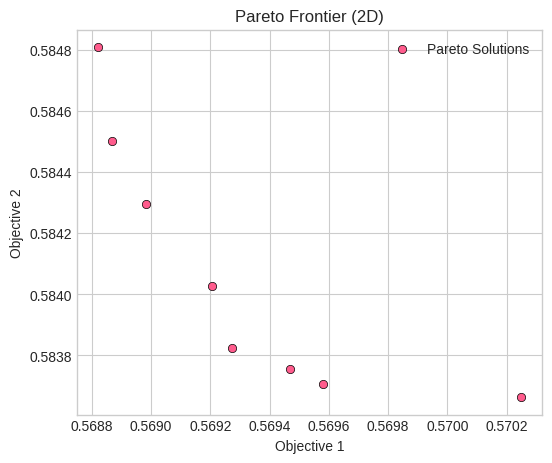

In [ ]:
plot_pareto_2d(objs)

In [ ]:
w_scalar = None

21:29:08 | DEBUG | ml_moo | Filtered parameters for Mola: {'node_time_limit': 2, 'target_size': 2000, 'target_gap': 0, 'node_gap': 0.05, 'norm': False}
21:29:08 | DEBUG | ml_moo | Finding 1th individual minimum
21:29:08 | DEBUG | ml_moo | Finding 2th individual minimum
21:29:09 | DEBUG | ml_moo | Calculated weights: [0.52024127 0.47975873]
21:29:09 | DEBUG | ml_moo | Importance: 0.016473619870161216
21:29:09 | DEBUG | ml_moo | Global lower bound (y*): [0.58767221 0.59650882]
21:29:09 | DEBUG | ml_moo | Iteration 1
21:29:09 | DEBUG | ml_moo | Solutions list: [array([0.58767221, 0.63084613]), array([0.61933757, 0.59650882])]
21:29:09 | DEBUG | ml_moo | Calculated weights: [0.07065992 0.92934008]
21:29:09 | DEBUG | ml_moo | Importance: 0.0021304243878834672
21:29:09 | DEBUG | ml_moo | Global lower bound (y*): [0.58767221 0.59650882]
21:29:09 | DEBUG | ml_moo | Iteration 2
21:29:09 | DEBUG | ml_moo | Solutions list: [array([0.58926693, 0.59879515]), array([0.58767221, 0.63084613]), array([

new solution added [0.58926693 0.59879515]


21:29:09 | DEBUG | ml_moo | Calculated weights: [0.41857335 0.58142665]
21:29:09 | DEBUG | ml_moo | Importance: 0.002237648124876597
21:29:09 | DEBUG | ml_moo | Global lower bound (y*): [0.58767221 0.595004  ]
21:29:09 | DEBUG | ml_moo | Iteration 3
21:29:09 | DEBUG | ml_moo | Solutions list: [array([0.59453309, 0.595004  ]), array([0.58926693, 0.59879515]), array([0.58767221, 0.63084613])]
21:29:09 | DEBUG | ml_moo | Calculated weights: [0.23076898 0.76923102]
21:29:09 | DEBUG | ml_moo | Importance: 0.001615194566957405
21:29:09 | DEBUG | ml_moo | Global lower bound (y*): [0.58753388 0.595004  ]
21:29:09 | DEBUG | ml_moo | Iteration 4
21:29:09 | DEBUG | ml_moo | Solutions list: [array([0.58753388, 0.59710376]), array([0.59453309, 0.595004  ])]


new solution added [0.59453309 0.595004  ]
solution dominated [0.61933757 0.59650882]
new solution added [0.58753388 0.59710376]
solution dominated [0.58926693 0.59879515]
solution dominated [0.58767221 0.63084613]


21:29:09 | DEBUG | ml_moo | Calculated weights: [0.62138242 0.37861758]
21:29:09 | DEBUG | ml_moo | Importance: 0.000578779295569043
21:29:09 | DEBUG | ml_moo | Global lower bound (y*): [0.58753388 0.595004  ]
21:29:09 | DEBUG | ml_moo | Iteration 5
21:29:09 | DEBUG | ml_moo | Solutions list: [array([0.588447  , 0.59560515]), array([0.58753388, 0.59710376]), array([0.59453309, 0.595004  ])]


new solution added [0.588447   0.59560515]
new solution added [0.58508009 0.59634353]
solution dominated [0.58753388 0.59710376]


21:29:10 | DEBUG | ml_moo | Calculated weights: [0.17986093 0.82013907]
21:29:10 | DEBUG | ml_moo | Importance: 0.0006302269816379491
21:29:10 | DEBUG | ml_moo | Global lower bound (y*): [0.58508009 0.595004  ]
21:29:10 | DEBUG | ml_moo | Iteration 6
21:29:10 | DEBUG | ml_moo | Solutions list: [array([0.58508009, 0.59634353]), array([0.588447  , 0.59560515]), array([0.59453309, 0.595004  ])]
21:29:10 | DEBUG | ml_moo | Calculated weights: [0.68016773 0.31983227]
21:29:10 | DEBUG | ml_moo | Importance: 0.0006884692554561533
21:29:10 | DEBUG | ml_moo | Global lower bound (y*): [0.58508009 0.59419082]
21:29:10 | DEBUG | ml_moo | Iteration 7
21:29:10 | DEBUG | ml_moo | Solutions list: [array([0.58609235, 0.59419082]), array([0.58508009, 0.59634353])]


new solution added [0.58609235 0.59419082]
solution dominated [0.588447   0.59560515]
solution dominated [0.59453309 0.595004  ]


21:29:10 | DEBUG | ml_moo | Calculated weights: [0.26373741 0.73626259]
21:29:10 | DEBUG | ml_moo | Importance: 0.0008966788927042592
21:29:10 | DEBUG | ml_moo | Global lower bound (y*): [0.58269241 0.59419082]
21:29:10 | DEBUG | ml_moo | Iteration 8
21:29:10 | DEBUG | ml_moo | Solutions list: [array([0.58269241, 0.59540871]), array([0.58609235, 0.59419082])]


new solution added [0.58269241 0.59540871]
solution dominated [0.58508009 0.59634353]


21:29:10 | DEBUG | ml_moo | Calculated weights: [0.80444616 0.19555384]
21:29:10 | DEBUG | ml_moo | Importance: 0.00037100528380965003
21:29:10 | DEBUG | ml_moo | Global lower bound (y*): [0.58269241 0.59351172]
21:29:10 | DEBUG | ml_moo | Iteration 9
21:29:10 | DEBUG | ml_moo | Solutions list: [array([0.58315354, 0.59351172]), array([0.58269241, 0.59540871])]


new solution added [0.58315354 0.59351172]
solution dominated [0.58609235 0.59419082]


21:29:11 | DEBUG | ml_moo | Calculated weights: [0.26089305 0.73910695]
21:29:11 | DEBUG | ml_moo | Importance: 0.0008735357650196066
21:29:11 | DEBUG | ml_moo | Global lower bound (y*): [0.57980524 0.59351172]
21:29:11 | DEBUG | ml_moo | Iteration 10
21:29:11 | DEBUG | ml_moo | Solutions list: [array([0.57980524, 0.59469362]), array([0.58315354, 0.59351172])]


new solution added [0.57980524 0.59469362]
solution dominated [0.58269241 0.59540871]


21:29:11 | DEBUG | ml_moo | Calculated weights: [0.63468267 0.36531733]
21:29:11 | DEBUG | ml_moo | Importance: 0.0008261064469981538
21:29:11 | DEBUG | ml_moo | Global lower bound (y*): [0.57980524 0.59243226]
21:29:11 | DEBUG | ml_moo | Iteration 11
21:29:11 | DEBUG | ml_moo | Solutions list: [array([0.58110685, 0.59243226]), array([0.57980524, 0.59469362])]


new solution added [0.58110685 0.59243226]
solution dominated [0.58315354 0.59351172]


21:29:11 | DEBUG | ml_moo | Calculated weights: [0.25367689 0.74632311]
21:29:11 | DEBUG | ml_moo | Importance: 0.00054042755765394
21:29:11 | DEBUG | ml_moo | Global lower bound (y*): [0.57897637 0.59243226]
21:29:11 | DEBUG | ml_moo | Iteration 12
21:29:11 | DEBUG | ml_moo | Solutions list: [array([0.57897637, 0.59315641]), array([0.58110685, 0.59243226])]


new solution added [0.57897637 0.59315641]
solution dominated [0.57980524 0.59469362]


21:29:11 | DEBUG | ml_moo | Calculated weights: [0.65397949 0.34602051]
21:29:11 | DEBUG | ml_moo | Importance: 0.0005456674057889299
21:29:11 | DEBUG | ml_moo | Global lower bound (y*): [0.57897637 0.59157943]
21:29:11 | DEBUG | ml_moo | Iteration 13
21:29:11 | DEBUG | ml_moo | Solutions list: [array([0.57981075, 0.59157943]), array([0.57897637, 0.59315641])]


new solution added [0.57981075 0.59157943]
solution dominated [0.58110685 0.59243226]


21:29:12 | DEBUG | ml_moo | Calculated weights: [0.24171008 0.75828992]
21:29:12 | DEBUG | ml_moo | Importance: 0.0004710537366467635
21:29:12 | DEBUG | ml_moo | Global lower bound (y*): [0.57786178 0.59157943]
21:29:12 | DEBUG | ml_moo | Iteration 14
21:29:12 | DEBUG | ml_moo | Solutions list: [array([0.57786178, 0.59220067]), array([0.57981075, 0.59157943])]


new solution added [0.57786178 0.59220067]
solution dominated [0.57897637 0.59315641]


21:29:12 | DEBUG | ml_moo | Calculated weights: [0.48256212 0.51743788]
21:29:12 | DEBUG | ml_moo | Importance: 0.000556475982722987
21:29:12 | DEBUG | ml_moo | Global lower bound (y*): [0.57786178 0.59112521]
21:29:12 | DEBUG | ml_moo | Iteration 15
21:29:12 | DEBUG | ml_moo | Solutions list: [array([0.57901496, 0.59112521]), array([0.57786178, 0.59220067])]


new solution added [0.57901496 0.59112521]
solution dominated [0.57981075 0.59157943]


21:29:13 | DEBUG | ml_moo | Calculated weights: [0.34993642 0.65006358]
21:29:13 | DEBUG | ml_moo | Importance: 0.0004277727712954024
21:29:13 | DEBUG | ml_moo | Global lower bound (y*): [0.5777925  0.59112521]
21:29:13 | DEBUG | ml_moo | Iteration 16
21:29:13 | DEBUG | ml_moo | Solutions list: [array([0.5777925 , 0.59178328]), array([0.57901496, 0.59112521])]


new solution added [0.5777925  0.59178328]
solution dominated [0.57786178 0.59220067]


21:29:13 | DEBUG | ml_moo | Calculated weights: [0.64145963 0.35854037]
21:29:13 | DEBUG | ml_moo | Importance: 0.00022201972493596234
21:29:13 | DEBUG | ml_moo | Global lower bound (y*): [0.5777925  0.59112521]
21:29:13 | DEBUG | ml_moo | Iteration 17
21:29:13 | DEBUG | ml_moo | Solutions list: [array([0.57813692, 0.59116708]), array([0.5777925 , 0.59178328]), array([0.57901496, 0.59112521])]


new solution added [0.57813692 0.59116708]


21:29:13 | DEBUG | ml_moo | Calculated weights: [0.21526336 0.78473664]
21:29:13 | DEBUG | ml_moo | Importance: 0.00026314934389715106
21:29:13 | DEBUG | ml_moo | Global lower bound (y*): [0.57692529 0.59112521]
21:29:13 | DEBUG | ml_moo | Iteration 18
21:29:13 | DEBUG | ml_moo | Solutions list: [array([0.57692529, 0.59149945]), array([0.57813692, 0.59116708]), array([0.57901496, 0.59112521])]


new solution added [0.57692529 0.59149945]
solution dominated [0.5777925  0.59178328]
new solution added [0.57829255 0.5904419 ]
solution dominated [0.57901496 0.59112521]


21:29:14 | DEBUG | ml_moo | Calculated weights: [0.436137 0.563863]
21:29:14 | DEBUG | ml_moo | Importance: 0.00020785316375815377
21:29:14 | DEBUG | ml_moo | Global lower bound (y*): [0.57692529 0.5904419 ]
21:29:14 | DEBUG | ml_moo | Iteration 19
21:29:14 | DEBUG | ml_moo | Solutions list: [array([0.57829255, 0.5904419 ]), array([0.57692529, 0.59149945]), array([0.57813692, 0.59116708])]
21:29:14 | DEBUG | ml_moo | Calculated weights: [0.21794831 0.78205169]
21:29:14 | DEBUG | ml_moo | Importance: 0.0002675213592453485
21:29:14 | DEBUG | ml_moo | Global lower bound (y*): [0.57692529 0.5904419 ]
21:29:14 | DEBUG | ml_moo | Iteration 20
21:29:14 | DEBUG | ml_moo | Solutions list: [array([0.57707245, 0.59078193]), array([0.57829255, 0.5904419 ]), array([0.57692529, 0.59149945])]


new solution added [0.57707245 0.59078193]
solution dominated [0.57813692 0.59116708]


21:29:14 | DEBUG | ml_moo | Calculated weights: [0.50269193 0.49730807]
21:29:14 | DEBUG | ml_moo | Importance: 0.0004582346944319582
21:29:14 | DEBUG | ml_moo | Global lower bound (y*): [0.57692529 0.58986793]
21:29:14 | DEBUG | ml_moo | Iteration 21
21:29:14 | DEBUG | ml_moo | Solutions list: [array([0.57797666, 0.58986793]), array([0.57707245, 0.59078193]), array([0.57692529, 0.59149945])]


new solution added [0.57797666 0.58986793]
solution dominated [0.57829255 0.5904419 ]


21:29:15 | DEBUG | ml_moo | Calculated weights: [0.37540105 0.62459895]
21:29:15 | DEBUG | ml_moo | Importance: 0.0005206711039794816
21:29:15 | DEBUG | ml_moo | Global lower bound (y*): [0.57658966 0.58986793]
21:29:15 | DEBUG | ml_moo | Iteration 22
21:29:15 | DEBUG | ml_moo | Solutions list: [array([0.57658966, 0.59070156]), array([0.57797666, 0.58986793])]


new solution added [0.57658966 0.59070156]
solution dominated [0.57707245 0.59078193]
solution dominated [0.57692529 0.59149945]


21:29:15 | DEBUG | ml_moo | Calculated weights: [0.25295049 0.74704951]
21:29:15 | DEBUG | ml_moo | Importance: 0.00031902292471719385
21:29:15 | DEBUG | ml_moo | Global lower bound (y*): [0.57658966 0.58986793]
21:29:15 | DEBUG | ml_moo | Iteration 23
21:29:15 | DEBUG | ml_moo | Solutions list: [array([0.57672207, 0.59029274]), array([0.57658966, 0.59070156]), array([0.57797666, 0.58986793])]


new solution added [0.57672207 0.59029274]


21:29:15 | DEBUG | ml_moo | Calculated weights: [0.58535531 0.41464469]
21:29:15 | DEBUG | ml_moo | Importance: 0.0002479990747881744
21:29:15 | DEBUG | ml_moo | Global lower bound (y*): [0.57658966 0.58970403]
21:29:15 | DEBUG | ml_moo | Iteration 24
21:29:15 | DEBUG | ml_moo | Solutions list: [array([0.57713909, 0.58970403]), array([0.57672207, 0.59029274]), array([0.57658966, 0.59070156])]


new solution added [0.57713909 0.58970403]
solution dominated [0.57797666 0.58986793]


21:29:15 | DEBUG | ml_moo | Calculated weights: [0.37805058 0.62194942]
21:29:15 | DEBUG | ml_moo | Importance: 0.00017082256184297595
21:29:15 | DEBUG | ml_moo | Global lower bound (y*): [0.57602552 0.58970403]
21:29:15 | DEBUG | ml_moo | Iteration 25
21:29:15 | DEBUG | ml_moo | Solutions list: [array([0.57602552, 0.59038091]), array([0.57713909, 0.58970403]), array([0.57672207, 0.59029274])]


new solution added [0.57602552 0.59038091]
solution dominated [0.57658966 0.59070156]


21:29:16 | DEBUG | ml_moo | Calculated weights: [0.11312201 0.88687799]
21:29:16 | DEBUG | ml_moo | Importance: 0.00011473208758316922
21:29:16 | DEBUG | ml_moo | Global lower bound (y*): [0.57602552 0.58970403]
21:29:16 | DEBUG | ml_moo | Iteration 26
21:29:16 | DEBUG | ml_moo | Solutions list: [array([0.57613009, 0.58983273]), array([0.57602552, 0.59038091]), array([0.57713909, 0.58970403])]


new solution added [0.57613009 0.58983273]
solution dominated [0.57672207 0.59029274]


21:29:16 | DEBUG | ml_moo | Calculated weights: [0.32552922 0.67447078]
21:29:16 | DEBUG | ml_moo | Importance: 0.00024325973622463248
21:29:16 | DEBUG | ml_moo | Global lower bound (y*): [0.57602552 0.58901194]
21:29:16 | DEBUG | ml_moo | Iteration 27
21:29:16 | DEBUG | ml_moo | Solutions list: [array([0.57783069, 0.58901194]), array([0.57613009, 0.58983273]), array([0.57602552, 0.59038091]), array([0.57713909, 0.58970403])]
21:29:16 | DEBUG | ml_moo | Calculated weights: [0.26082366 0.73917634]
21:29:16 | DEBUG | ml_moo | Importance: 0.00042152121689398303
21:29:16 | DEBUG | ml_moo | Global lower bound (y*): [0.57602552 0.58901194]
21:29:16 | DEBUG | ml_moo | Iteration 28
21:29:16 | DEBUG | ml_moo | Solutions list: [array([0.57622452, 0.58957869]), array([0.57783069, 0.58901194]), array([0.57613009, 0.58983273]), array([0.57602552, 0.59038091])]


new solution added [0.57783069 0.58901194]
new solution added [0.57622452 0.58957869]
solution dominated [0.57713909 0.58970403]


21:29:16 | DEBUG | ml_moo | Calculated weights: [0.6402953 0.3597047]
21:29:16 | DEBUG | ml_moo | Importance: 0.0001849686142381124
21:29:16 | DEBUG | ml_moo | Global lower bound (y*): [0.57602552 0.58901194]
21:29:16 | DEBUG | ml_moo | Iteration 29
21:29:16 | DEBUG | ml_moo | Solutions list: [array([0.57650138, 0.58908587]), array([0.57622452, 0.58957869]), array([0.57783069, 0.58901194]), array([0.57613009, 0.58983273]), array([0.57602552, 0.59038091])]


new solution added [0.57650138 0.58908587]


21:29:17 | DEBUG | ml_moo | Calculated weights: [0.30885015 0.69114985]
21:29:17 | DEBUG | ml_moo | Importance: 0.0003109687024728247
21:29:17 | DEBUG | ml_moo | Global lower bound (y*): [0.57550279 0.58901194]
21:29:17 | DEBUG | ml_moo | Iteration 30
21:29:17 | DEBUG | ml_moo | Solutions list: [array([0.57550279, 0.58953211]), array([0.57650138, 0.58908587]), array([0.57783069, 0.58901194])]


new solution added [0.57550279 0.58953211]
solution dominated [0.57622452 0.58957869]
solution dominated [0.57613009 0.58983273]
solution dominated [0.57602552 0.59038091]


21:29:17 | DEBUG | ml_moo | Calculated weights: [0.62460047 0.37539953]
21:29:17 | DEBUG | ml_moo | Importance: 0.00022538340110117572
21:29:17 | DEBUG | ml_moo | Global lower bound (y*): [0.57550279 0.58893175]
21:29:17 | DEBUG | ml_moo | Iteration 31
21:29:17 | DEBUG | ml_moo | Solutions list: [array([0.57586362, 0.58893175]), array([0.57550279, 0.58953211])]


new solution added [0.57586362 0.58893175]
solution dominated [0.57650138 0.58908587]
solution dominated [0.57783069 0.58901194]


21:29:18 | DEBUG | ml_moo | Calculated weights: [0.23303914 0.76696086]
21:29:18 | DEBUG | ml_moo | Importance: 0.00020055044666575025
21:29:18 | DEBUG | ml_moo | Global lower bound (y*): [0.57500208 0.58893175]
21:29:18 | DEBUG | ml_moo | Iteration 32
21:29:18 | DEBUG | ml_moo | Solutions list: [array([0.57500208, 0.58919352]), array([0.57586362, 0.58893175])]


new solution added [0.57500208 0.58919352]
solution dominated [0.57550279 0.58953211]


21:29:18 | DEBUG | ml_moo | Calculated weights: [0.54615189 0.45384811]
21:29:18 | DEBUG | ml_moo | Importance: 0.00033755726550714626
21:29:18 | DEBUG | ml_moo | Global lower bound (y*): [0.57500208 0.58844972]
21:29:18 | DEBUG | ml_moo | Iteration 33
21:29:18 | DEBUG | ml_moo | Solutions list: [array([0.57562017, 0.58844972]), array([0.57500208, 0.58919352])]


new solution added [0.57562017 0.58844972]
solution dominated [0.57586362 0.58893175]


21:29:19 | DEBUG | ml_moo | Calculated weights: [0.22124197 0.77875803]
21:29:19 | DEBUG | ml_moo | Importance: 0.00018334872051226775
21:29:19 | DEBUG | ml_moo | Global lower bound (y*): [0.57479057 0.58844972]
21:29:19 | DEBUG | ml_moo | Iteration 34
21:29:19 | DEBUG | ml_moo | Solutions list: [array([0.57479057, 0.5886854 ]), array([0.57562017, 0.58844972])]
21:29:19 | DEBUG | ml_moo | Calculated weights: [0.55555113 0.44444887]
21:29:19 | DEBUG | ml_moo | Importance: 0.00031613852307987855
21:29:19 | DEBUG | ml_moo | Global lower bound (y*): [0.57479057 0.58797408]
21:29:19 | DEBUG | ml_moo | Iteration 35
21:29:19 | DEBUG | ml_moo | Solutions list: [array([0.57535963, 0.58797408]), array([0.57479057, 0.5886854 ])]


new solution added [0.57479057 0.5886854 ]
solution dominated [0.57500208 0.58919352]
new solution added [0.57535963 0.58797408]
solution dominated [0.57562017 0.58844972]


21:29:19 | DEBUG | ml_moo | Calculated weights: [0.20307945 0.79692055]
21:29:19 | DEBUG | ml_moo | Importance: 0.00021037528454226004
21:29:19 | DEBUG | ml_moo | Global lower bound (y*): [0.57432257 0.58797408]
21:29:19 | DEBUG | ml_moo | Iteration 36
21:29:19 | DEBUG | ml_moo | Solutions list: [array([0.57432257, 0.58823835]), array([0.57535963, 0.58797408])]
21:29:19 | DEBUG | ml_moo | Calculated weights: [0.47779578 0.52220422]
21:29:19 | DEBUG | ml_moo | Importance: 0.00031445506121905234
21:29:19 | DEBUG | ml_moo | Global lower bound (y*): [0.57432257 0.58763618]
21:29:19 | DEBUG | ml_moo | Iteration 37
21:29:19 | DEBUG | ml_moo | Solutions list: [array([0.57498072, 0.58763618]), array([0.57432257, 0.58823835])]


new solution added [0.57432257 0.58823835]
solution dominated [0.57479057 0.5886854 ]
new solution added [0.57498072 0.58763618]
solution dominated [0.57535963 0.58797408]


21:29:19 | DEBUG | ml_moo | Calculated weights: [0.35913032 0.64086968]
21:29:19 | DEBUG | ml_moo | Importance: 0.0002976737933036676
21:29:19 | DEBUG | ml_moo | Global lower bound (y*): [0.5741518  0.58763618]
21:29:19 | DEBUG | ml_moo | Iteration 38
21:29:19 | DEBUG | ml_moo | Solutions list: [array([0.5741518 , 0.58810069]), array([0.57498072, 0.58763618])]


new solution added [0.5741518  0.58810069]
solution dominated [0.57432257 0.58823835]


21:29:20 | DEBUG | ml_moo | Calculated weights: [0.2833521 0.7166479]
21:29:20 | DEBUG | ml_moo | Importance: 0.0002198633250974913
21:29:20 | DEBUG | ml_moo | Global lower bound (y*): [0.5741518  0.58763618]
21:29:20 | DEBUG | ml_moo | Iteration 39
21:29:20 | DEBUG | ml_moo | Solutions list: [array([0.57420757, 0.58794187]), array([0.5741518 , 0.58810069]), array([0.57498072, 0.58763618])]


new solution added [0.57420757 0.58794187]
new solution added [0.574348   0.58755575]
solution dominated [0.57498072 0.58763618]


21:29:20 | DEBUG | ml_moo | Calculated weights: [0.73331062 0.26668938]
21:29:20 | DEBUG | ml_moo | Importance: 0.00010502614919358222
21:29:20 | DEBUG | ml_moo | Global lower bound (y*): [0.5741518  0.58755575]
21:29:20 | DEBUG | ml_moo | Iteration 40
21:29:20 | DEBUG | ml_moo | Solutions list: [array([0.574348  , 0.58755575]), array([0.57420757, 0.58794187]), array([0.5741518 , 0.58810069])]
21:29:20 | DEBUG | ml_moo | Calculated weights: [0.47031209 0.52968791]
21:29:20 | DEBUG | ml_moo | Importance: 8.259966257884166e-05
21:29:20 | DEBUG | ml_moo | Global lower bound (y*): [0.57358932 0.58755575]
21:29:20 | DEBUG | ml_moo | Iteration 41
21:29:20 | DEBUG | ml_moo | Solutions list: [array([0.57358932, 0.58822938]), array([0.574348  , 0.58755575]), array([0.57420757, 0.58794187]), array([0.5741518 , 0.58810069])]


new solution added [0.57358932 0.58822938]


21:29:20 | DEBUG | ml_moo | Calculated weights: [0.23243584 0.76756416]
21:29:20 | DEBUG | ml_moo | Importance: 0.0001777732784290116
21:29:20 | DEBUG | ml_moo | Global lower bound (y*): [0.57358195 0.58755575]
21:29:20 | DEBUG | ml_moo | Iteration 42
21:29:20 | DEBUG | ml_moo | Solutions list: [array([0.57358195, 0.58778773]), array([0.574348  , 0.58755575])]


new solution added [0.57358195 0.58778773]
solution dominated [0.57358932 0.58822938]
solution dominated [0.57420757 0.58794187]
solution dominated [0.5741518  0.58810069]


21:29:21 | DEBUG | ml_moo | Calculated weights: [0.41831598 0.58168402]
21:29:21 | DEBUG | ml_moo | Importance: 0.0002052898374688616
21:29:21 | DEBUG | ml_moo | Global lower bound (y*): [0.57358195 0.58743479]
21:29:21 | DEBUG | ml_moo | Iteration 43
21:29:21 | DEBUG | ml_moo | Solutions list: [array([0.57407273, 0.58743479]), array([0.57358195, 0.58778773])]


new solution added [0.57407273 0.58743479]
solution dominated [0.574348   0.58755575]


21:29:21 | DEBUG | ml_moo | Calculated weights: [0.35509225 0.64490775]
21:29:21 | DEBUG | ml_moo | Importance: 0.00016753686260522968
21:29:21 | DEBUG | ml_moo | Global lower bound (y*): [0.57358195 0.58743479]
21:29:21 | DEBUG | ml_moo | Iteration 44
21:29:21 | DEBUG | ml_moo | Solutions list: [array([0.57360176, 0.5876941 ]), array([0.57407273, 0.58743479]), array([0.57358195, 0.58778773])]


new solution added [0.57360176 0.5876941 ]


21:29:21 | DEBUG | ml_moo | Calculated weights: [0.99514703 0.00485297]
21:29:21 | DEBUG | ml_moo | Importance: 1.128233778653967e-06
21:29:21 | DEBUG | ml_moo | Global lower bound (y*): [0.57358195 0.58740335]
21:29:21 | DEBUG | ml_moo | Iteration 45
21:29:21 | DEBUG | ml_moo | Solutions list: [array([0.57358308, 0.58740335]), array([0.57358195, 0.58778773])]


new solution added [0.57358308 0.58740335]
solution dominated [0.57360176 0.5876941 ]
solution dominated [0.57407273 0.58743479]
new solution added [0.57277874 0.59334486]


21:29:21 | DEBUG | ml_moo | Calculated weights: [0.88076541 0.11923459]
21:29:21 | DEBUG | ml_moo | Importance: 0.0006648941774839434
21:29:21 | DEBUG | ml_moo | Global lower bound (y*): [0.57277874 0.58740335]
21:29:21 | DEBUG | ml_moo | Iteration 46
21:29:21 | DEBUG | ml_moo | Solutions list: [array([0.57277874, 0.59334486]), array([0.57358308, 0.58740335]), array([0.57358195, 0.58778773])]
21:29:22 | DEBUG | ml_moo | Calculated weights: [0.59016013 0.40983987]
21:29:22 | DEBUG | ml_moo | Importance: 0.0006721487603624787
21:29:22 | DEBUG | ml_moo | Global lower bound (y*): [0.57219057 0.58740335]
21:29:22 | DEBUG | ml_moo | Iteration 47
21:29:22 | DEBUG | ml_moo | Solutions list: [array([0.57219057, 0.58940854]), array([0.57358308, 0.58740335]), array([0.57358195, 0.58778773])]
21:29:22 | DEBUG | ml_moo | Calculated weights: [0.31414518 0.68585482]
21:29:22 | DEBUG | ml_moo | Importance: 0.0001753612669677107
21:29:22 | DEBUG | ml_moo | Global lower bound (y*): [0.57219057 0.5874033

new solution added [0.57219057 0.58940854]
solution dominated [0.57277874 0.59334486]
new solution added [0.57222959 0.5880233 ]


21:29:22 | DEBUG | ml_moo | Calculated weights: [0.62172869 0.37827131]
21:29:22 | DEBUG | ml_moo | Importance: 0.00037429380792999845
21:29:22 | DEBUG | ml_moo | Global lower bound (y*): [0.57219057 0.58703702]
21:29:22 | DEBUG | ml_moo | Iteration 49
21:29:22 | DEBUG | ml_moo | Solutions list: [array([0.57282966, 0.58703702]), array([0.57222959, 0.5880233 ]), array([0.57219057, 0.58940854])]


new solution added [0.57282966 0.58703702]
solution dominated [0.57358308 0.58740335]
solution dominated [0.57358195 0.58778773]


21:29:23 | DEBUG | ml_moo | Calculated weights: [0.36364025 0.63635975]
21:29:23 | DEBUG | ml_moo | Importance: 0.00021510715805150848
21:29:23 | DEBUG | ml_moo | Global lower bound (y*): [0.57219057 0.58703702]
21:29:23 | DEBUG | ml_moo | Iteration 50
21:29:23 | DEBUG | ml_moo | Solutions list: [array([0.57224063, 0.58737362]), array([0.57282966, 0.58703702]), array([0.57222959, 0.5880233 ]), array([0.57219057, 0.58940854])]


new solution added [0.57224063 0.58737362]


21:29:23 | DEBUG | ml_moo | Calculated weights: [0.54916606 0.45083394]
21:29:23 | DEBUG | ml_moo | Importance: 0.00018143550338978187
21:29:23 | DEBUG | ml_moo | Global lower bound (y*): [0.57219057 0.58697422]
21:29:23 | DEBUG | ml_moo | Iteration 51
21:29:23 | DEBUG | ml_moo | Solutions list: [array([0.57256851, 0.58697422]), array([0.57224063, 0.58737362]), array([0.57222959, 0.5880233 ]), array([0.57219057, 0.58940854])]


new solution added [0.57256851 0.58697422]
solution dominated [0.57282966 0.58703702]


21:29:23 | DEBUG | ml_moo | Calculated weights: [0.40911939 0.59088061]
21:29:23 | DEBUG | ml_moo | Importance: 0.0001711193491236336
21:29:23 | DEBUG | ml_moo | Global lower bound (y*): [0.5721502  0.58697422]
21:29:23 | DEBUG | ml_moo | Iteration 52
21:29:23 | DEBUG | ml_moo | Solutions list: [array([0.5721502 , 0.58726385]), array([0.57256851, 0.58697422])]


new solution added [0.5721502  0.58726385]
solution dominated [0.57224063 0.58737362]
solution dominated [0.57222959 0.5880233 ]
solution dominated [0.57219057 0.58940854]
new solution added [0.5722699  0.58685168]
solution dominated [0.57256851 0.58697422]


21:29:24 | DEBUG | ml_moo | Calculated weights: [0.77495028 0.22504972]
21:29:24 | DEBUG | ml_moo | Importance: 9.345399771421015e-05
21:29:24 | DEBUG | ml_moo | Global lower bound (y*): [0.5721502  0.58685168]
21:29:24 | DEBUG | ml_moo | Iteration 53
21:29:24 | DEBUG | ml_moo | Solutions list: [array([0.5722699 , 0.58685168]), array([0.5721502 , 0.58726385])]
21:29:24 | DEBUG | ml_moo | Calculated weights: [0.48957077 0.51042923]
21:29:24 | DEBUG | ml_moo | Importance: 7.068635585505412e-05
21:29:24 | DEBUG | ml_moo | Global lower bound (y*): [0.57171727 0.58685168]
21:29:24 | DEBUG | ml_moo | Iteration 54
21:29:24 | DEBUG | ml_moo | Solutions list: [array([0.57171727, 0.58738173]), array([0.5722699 , 0.58685168]), array([0.5721502 , 0.58726385])]


new solution added [0.57171727 0.58738173]


21:29:24 | DEBUG | ml_moo | Calculated weights: [0.89252366 0.10747634]
21:29:24 | DEBUG | ml_moo | Importance: 6.074894168739409e-05
21:29:24 | DEBUG | ml_moo | Global lower bound (y*): [0.57171727 0.5868164 ]
21:29:24 | DEBUG | ml_moo | Iteration 55
21:29:24 | DEBUG | ml_moo | Solutions list: [array([0.57178534, 0.5868164 ]), array([0.57171727, 0.58738173])]


new solution added [0.57178534 0.5868164 ]
solution dominated [0.5722699  0.58685168]
solution dominated [0.5721502  0.58726385]


21:29:24 | DEBUG | ml_moo | Calculated weights: [0.61791193 0.38208807]
21:29:24 | DEBUG | ml_moo | Importance: 0.0002562733339895873
21:29:24 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385 0.5868164]
21:29:24 | DEBUG | ml_moo | Iteration 56
21:29:24 | DEBUG | ml_moo | Solutions list: [array([0.5710385 , 0.58802418]), array([0.57178534, 0.5868164 ]), array([0.57171727, 0.58738173])]


new solution added [0.5710385  0.58802418]


21:29:25 | DEBUG | ml_moo | Calculated weights: [0.35647899 0.64352101]
21:29:25 | DEBUG | ml_moo | Importance: 0.0002245012442779748
21:29:25 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385 0.5868164]
21:29:25 | DEBUG | ml_moo | Iteration 57
21:29:25 | DEBUG | ml_moo | Solutions list: [array([0.57116172, 0.58716185]), array([0.5710385 , 0.58802418]), array([0.57178534, 0.5868164 ])]


new solution added [0.57116172 0.58716185]
solution dominated [0.57171727 0.58738173]


21:29:25 | DEBUG | ml_moo | Calculated weights: [0.62338134 0.37661866]
21:29:25 | DEBUG | ml_moo | Importance: 0.0003263241783006965
21:29:25 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:25 | DEBUG | ml_moo | Iteration 58
21:29:25 | DEBUG | ml_moo | Solutions list: [array([0.57167904, 0.58630559]), array([0.57116172, 0.58716185]), array([0.5710385 , 0.58802418])]


new solution added [0.57167904 0.58630559]
solution dominated [0.57178534 0.5868164 ]


21:29:25 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:25 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:25 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:25 | DEBUG | ml_moo | Iteration 59
21:29:25 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution added [0.57109562 0.5866778 ]
solution dominated [0.57116172 0.58716185]


21:29:26 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:26 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:26 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:26 | DEBUG | ml_moo | Iteration 60
21:29:26 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:27 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:27 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:27 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:27 | DEBUG | ml_moo | Iteration 61
21:29:27 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:27 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:27 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:27 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:27 | DEBUG | ml_moo | Iteration 62
21:29:27 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:27 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:27 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:27 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:27 | DEBUG | ml_moo | Iteration 63
21:29:27 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:28 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:28 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:28 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:28 | DEBUG | ml_moo | Iteration 64
21:29:28 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:28 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:28 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:28 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:28 | DEBUG | ml_moo | Iteration 65
21:29:28 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:28 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:28 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:28 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:28 | DEBUG | ml_moo | Iteration 66
21:29:28 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:28 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:28 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:28 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:28 | DEBUG | ml_moo | Iteration 67
21:29:28 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:29 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:29 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:29 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:29 | DEBUG | ml_moo | Iteration 68
21:29:29 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:29 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:29 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:29 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:29 | DEBUG | ml_moo | Iteration 69
21:29:29 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]
21:29:29 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:29 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:29 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:29 | DEBUG | ml_moo | Iteration 70
21:29:29 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]
new solution dominated [0.57194117 0.58663228]


21:29:30 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:30 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:30 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:30 | DEBUG | ml_moo | Iteration 71
21:29:30 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:30 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:30 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:30 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:30 | DEBUG | ml_moo | Iteration 72
21:29:30 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:31 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:31 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:31 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:31 | DEBUG | ml_moo | Iteration 73
21:29:31 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:31 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:31 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:31 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:31 | DEBUG | ml_moo | Iteration 74
21:29:31 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:32 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:32 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:32 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:32 | DEBUG | ml_moo | Iteration 75
21:29:32 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]
21:29:32 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:32 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:32 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:32 | DEBUG | ml_moo | Iteration 76
21:29:32 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]
new solution dominated [0.57194117 0.58663228]


21:29:32 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:32 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:32 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:32 | DEBUG | ml_moo | Iteration 77
21:29:32 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:33 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:33 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:33 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:33 | DEBUG | ml_moo | Iteration 78
21:29:33 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:33 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:33 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:33 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:33 | DEBUG | ml_moo | Iteration 79
21:29:33 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:33 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:33 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:33 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:33 | DEBUG | ml_moo | Iteration 80
21:29:33 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:33 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:33 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:33 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:33 | DEBUG | ml_moo | Iteration 81
21:29:33 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:34 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:34 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:34 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:34 | DEBUG | ml_moo | Iteration 82
21:29:34 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:35 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:35 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:35 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:35 | DEBUG | ml_moo | Iteration 83
21:29:35 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:35 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:35 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:35 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:35 | DEBUG | ml_moo | Iteration 84
21:29:35 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:36 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:36 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:36 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:36 | DEBUG | ml_moo | Iteration 85
21:29:36 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:36 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:36 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:36 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:36 | DEBUG | ml_moo | Iteration 86
21:29:36 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:36 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:36 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:36 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:36 | DEBUG | ml_moo | Iteration 87
21:29:36 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:37 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:37 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:37 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:37 | DEBUG | ml_moo | Iteration 88
21:29:37 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:37 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:37 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:37 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:37 | DEBUG | ml_moo | Iteration 89
21:29:37 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:37 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:37 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:37 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:37 | DEBUG | ml_moo | Iteration 90
21:29:37 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:37 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:37 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:37 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:37 | DEBUG | ml_moo | Iteration 91
21:29:37 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]
21:29:38 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:38 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:38 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:38 | DEBUG | ml_moo | Iteration 92
21:29:38 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]
new solution dominated [0.57194117 0.58663228]


21:29:38 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:38 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:38 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:38 | DEBUG | ml_moo | Iteration 93
21:29:38 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:38 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:38 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:38 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:38 | DEBUG | ml_moo | Iteration 94
21:29:38 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:38 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:38 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:38 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:38 | DEBUG | ml_moo | Iteration 95
21:29:38 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:38 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:38 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:38 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:38 | DEBUG | ml_moo | Iteration 96
21:29:38 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:39 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:39 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:39 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:39 | DEBUG | ml_moo | Iteration 97
21:29:39 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:39 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:39 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:39 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:39 | DEBUG | ml_moo | Iteration 98
21:29:39 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:40 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:40 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:40 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:40 | DEBUG | ml_moo | Iteration 99
21:29:40 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:40 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:40 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:40 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:40 | DEBUG | ml_moo | Iteration 100
21:29:40 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:40 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:40 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:40 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:40 | DEBUG | ml_moo | Iteration 101
21:29:40 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:41 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:41 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:41 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:41 | DEBUG | ml_moo | Iteration 102
21:29:41 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:41 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:41 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:41 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:41 | DEBUG | ml_moo | Iteration 103
21:29:41 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:41 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:41 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:41 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:41 | DEBUG | ml_moo | Iteration 104
21:29:41 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:42 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:42 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:42 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:42 | DEBUG | ml_moo | Iteration 105
21:29:42 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:42 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:42 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:42 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:42 | DEBUG | ml_moo | Iteration 106
21:29:42 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:43 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:43 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:43 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:43 | DEBUG | ml_moo | Iteration 107
21:29:43 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:43 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:43 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:43 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:43 | DEBUG | ml_moo | Iteration 108
21:29:43 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:43 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:43 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:43 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:43 | DEBUG | ml_moo | Iteration 109
21:29:43 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:44 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:44 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:44 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:44 | DEBUG | ml_moo | Iteration 110
21:29:44 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:44 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:44 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:44 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:44 | DEBUG | ml_moo | Iteration 111
21:29:44 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]
21:29:44 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:44 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:44 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:44 | DEBUG | ml_moo | Iteration 112
21:29:44 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]
new solution dominated [0.57194117 0.58663228]


21:29:45 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:45 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:45 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:45 | DEBUG | ml_moo | Iteration 113
21:29:45 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]
21:29:45 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:45 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:45 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:45 | DEBUG | ml_moo | Iteration 114
21:29:45 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]
new solution dominated [0.57194117 0.58663228]


21:29:45 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:45 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:45 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:45 | DEBUG | ml_moo | Iteration 115
21:29:45 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]
21:29:45 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:45 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:45 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:45 | DEBUG | ml_moo | Iteration 116
21:29:45 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]
new solution dominated [0.57194117 0.58663228]


21:29:45 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:45 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:45 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:45 | DEBUG | ml_moo | Iteration 117
21:29:45 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:46 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:46 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:46 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:46 | DEBUG | ml_moo | Iteration 118
21:29:46 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:47 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:47 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:47 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:47 | DEBUG | ml_moo | Iteration 119
21:29:47 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]
21:29:47 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:47 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:47 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:47 | DEBUG | ml_moo | Iteration 120
21:29:47 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]
new solution dominated [0.57194117 0.58663228]


21:29:47 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:47 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:47 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:47 | DEBUG | ml_moo | Iteration 121
21:29:47 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:48 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:48 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:48 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:48 | DEBUG | ml_moo | Iteration 122
21:29:48 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:48 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:48 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:48 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:48 | DEBUG | ml_moo | Iteration 123
21:29:48 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:49 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:49 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:49 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:49 | DEBUG | ml_moo | Iteration 124
21:29:49 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:49 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:49 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:49 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:49 | DEBUG | ml_moo | Iteration 125
21:29:49 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:50 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:50 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:50 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:50 | DEBUG | ml_moo | Iteration 126
21:29:50 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:50 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:50 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:50 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:50 | DEBUG | ml_moo | Iteration 127
21:29:50 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:50 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:50 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:50 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:50 | DEBUG | ml_moo | Iteration 128
21:29:50 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:51 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:51 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:51 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:51 | DEBUG | ml_moo | Iteration 129
21:29:51 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:51 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:51 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:51 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:51 | DEBUG | ml_moo | Iteration 130
21:29:51 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:51 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:51 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:51 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:51 | DEBUG | ml_moo | Iteration 131
21:29:51 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]
21:29:51 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:51 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:51 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:51 | DEBUG | ml_moo | Iteration 132
21:29:51 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]
new solution dominated [0.57194117 0.58663228]


21:29:51 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:51 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:51 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:51 | DEBUG | ml_moo | Iteration 133
21:29:51 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:52 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:52 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:52 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:52 | DEBUG | ml_moo | Iteration 134
21:29:52 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:52 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:52 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:52 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:52 | DEBUG | ml_moo | Iteration 135
21:29:52 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:52 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:52 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:52 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:52 | DEBUG | ml_moo | Iteration 136
21:29:52 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:52 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:52 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:52 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:52 | DEBUG | ml_moo | Iteration 137
21:29:52 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:53 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:53 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:53 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:53 | DEBUG | ml_moo | Iteration 138
21:29:53 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:53 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:53 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:53 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:53 | DEBUG | ml_moo | Iteration 139
21:29:53 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:54 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:54 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:54 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:54 | DEBUG | ml_moo | Iteration 140
21:29:54 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:54 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:54 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:54 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:54 | DEBUG | ml_moo | Iteration 141
21:29:54 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:54 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:54 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:54 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:54 | DEBUG | ml_moo | Iteration 142
21:29:54 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]
21:29:55 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:55 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:55 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:55 | DEBUG | ml_moo | Iteration 143
21:29:55 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]
new solution dominated [0.57194117 0.58663228]


21:29:55 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:55 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:55 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:55 | DEBUG | ml_moo | Iteration 144
21:29:55 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:55 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:55 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:55 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:55 | DEBUG | ml_moo | Iteration 145
21:29:55 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:55 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:55 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:55 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:55 | DEBUG | ml_moo | Iteration 146
21:29:55 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


21:29:56 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:56 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:56 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:56 | DEBUG | ml_moo | Iteration 147
21:29:56 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]
21:29:56 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:56 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:56 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:56 | DEBUG | ml_moo | Iteration 148
21:29:56 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]
new solution dominated [0.57194117 0.58663228]


21:29:56 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:56 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:56 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:56 | DEBUG | ml_moo | Iteration 149
21:29:56 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]
21:29:57 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:57 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:57 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:57 | DEBUG | ml_moo | Iteration 150
21:29:57 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]
new solution dominated [0.57194117 0.58663228]


21:29:57 | DEBUG | ml_moo | Calculated weights: [0.38948822 0.61051178]
21:29:57 | DEBUG | ml_moo | Importance: 0.00022834679580407968
21:29:57 | DEBUG | ml_moo | Global lower bound (y*): [0.5710385  0.58630559]
21:29:57 | DEBUG | ml_moo | Iteration 151
21:29:57 | DEBUG | ml_moo | Solutions list: [array([0.57109562, 0.5866778 ]), array([0.57167904, 0.58630559]), array([0.5710385 , 0.58802418])]


new solution dominated [0.57194117 0.58663228]


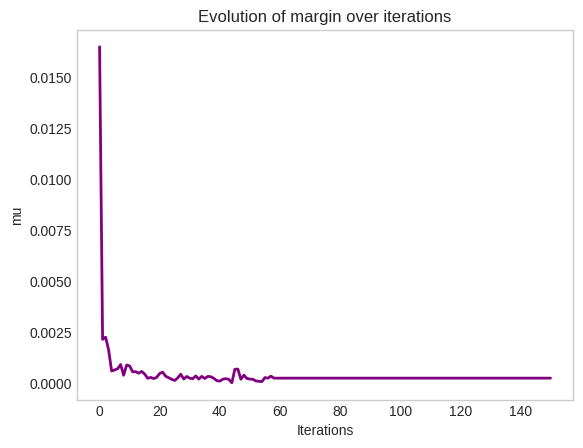

21:29:57 | INFO | ml_moo | Fit runtime: 49.31 seconds


In [ ]:
method = 'mola'
w_scalar = MooScalarization(clf, train_fn_mlp, num_objs)
moopt = moo(w_scalar).mo_optimization(method, **opt_params)
objs = get_objectives(moopt)
#hypervolume_values = compute_hypervolume_progress(objs)
hypervolume_values = moopt.get_hypervolumes()
results[method] = {
                "moopt": moopt,
                "objectives": objs,
                "models": moopt.get_models() if hasattr(moopt, "get_models") else None,
                "hypervolume": hypervolume_values
            }

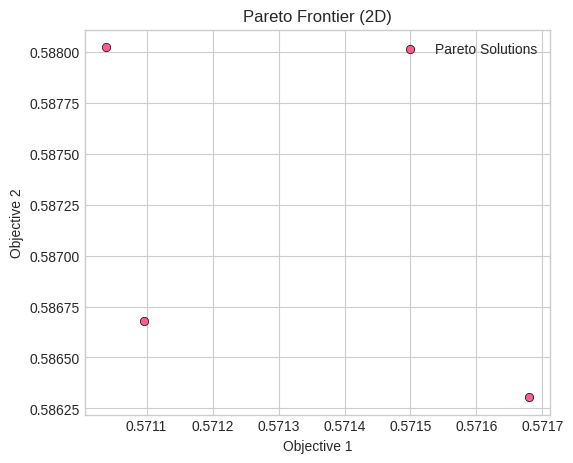

In [ ]:
plot_pareto_2d(objs)

## Monise

In [ ]:
w_scalar = None

In [ ]:
#method = 'monise'
#w_scalar = MooScalarization(clf, train_fn_mlp, num_objs)
#moopt = moo(w_scalar).mo_optimization(method, **opt_params)
#objs = get_objectives(moopt)
#hypervolume_values = compute_hypervolume_progress(objs)
##hypervolume_values = moopt.get_hypervolumes()
#results[method] = {
#                "moopt": moopt,
#                "objectives": objs,
#                "models": moopt.get_models() if hasattr(moopt, "get_models") else None,
#                "hypervolume": hypervolume_values
#            }

21:29:57 | DEBUG | ml_moo | Filtered parameters for monise: {'nodeTimeLimit': 2, 'targetSize': 2000, 'targetGap': 0, 'nodeGap': 0.05, 'norm': False}
21:29:57 | DEBUG | ml_moo.moo.monise | Finding 1th individual minima
21:29:57 | DEBUG | ml_moo.moo.monise | Finding 2th individual minima


monise
Set parameter Username
Academic license - for non-commercial use only - expires 2026-04-10


21:29:59 | DEBUG | ml_moo.moo.monise | 3th solution - importance: 1.0


Set parameter Username
Academic license - for non-commercial use only - expires 2026-04-10


21:29:59 | DEBUG | ml_moo.moo.monise | 4th solution - importance: 1.0


Set parameter Username
Academic license - for non-commercial use only - expires 2026-04-10


21:29:59 | DEBUG | ml_moo.moo.monise | 5th solution - importance: 1.0


Set parameter Username
Academic license - for non-commercial use only - expires 2026-04-10


21:29:59 | DEBUG | ml_moo.moo.monise | 6th solution - importance: 1.0
21:29:59 | DEBUG | ml_moo.moo.monise | 7th solution - importance: 1.0


Set parameter Username
Academic license - for non-commercial use only - expires 2026-04-10
Set parameter Username
Academic license - for non-commercial use only - expires 2026-04-10


TypeError: exceptions must derive from BaseException

In [ ]:
#method = 'monise'
#scalarization = MLPFairScalarization(X=X_train, y=y_train, fair_feat=fair_feature)
#moopt = moo(scalarization).mo_optimization(method, **opt_params)
#objs = get_objectives(moopt)
#hypervolume_values = compute_hypervolume_progress(objs)
##hypervolume_values = moopt.get_hypervolumes()
#results[method] = {
#                "moopt": moopt,
#                "objectives": objs,
#                "models": moopt.get_models() if hasattr(moopt, "get_models") else None,
#                "hypervolume": hypervolume_values
#            }

18:10:25 | DEBUG | ml_moo | Filtered parameters for monise: {'nodeTimeLimit': 2, 'targetSize': 2000, 'targetGap': 0, 'nodeGap': 0.05, 'norm': False}
18:10:25 | DEBUG | ml_moo.moo.monise | Finding 1th individual minima


monise


18:10:26 | DEBUG | ml_moo.moo.monise | Finding 2th individual minima


Set parameter Username
Academic license - for non-commercial use only - expires 2026-04-10


18:10:29 | DEBUG | ml_moo.moo.monise | 3th solution - importance: 1.0


Set parameter Username
Academic license - for non-commercial use only - expires 2026-04-10


TypeError: exceptions must derive from BaseException

## Random Weight

In [ ]:
w_scalar = MooScalarization(clf, train_fn_mlp, num_objs)

In [ ]:
method = 'random_weight'
scalarization = MLPFairScalarization(X=X_train, y=y_train, fair_feat=fair_feature)
moopt = moo(scalarization).mo_optimization(method, **opt_params)
objs = get_objectives(moopt)
hypervolume_values = compute_hypervolume_progress(objs)
#hypervolume_values = moopt.get_hypervolumes()
results[method] = {
                "moopt": moopt,
                "objectives": objs,
                "models": moopt.get_models() if hasattr(moopt, "get_models") else None,
                "hypervolume": hypervolume_values
            }

21:32:56 | WARNING | ml_moo | Ignored parameters for random_weights: {'nodeTimeLimit', 'targetGap', 'nodeGap'}
21:32:56 | DEBUG | ml_moo | Filtered parameters for random_weights: {'targetSize': 2000, 'norm': False}
21:32:56 | DEBUG | ml_moo.moo.random_weights | Finding 1th individual minima
21:32:56 | DEBUG | ml_moo.moo.random_weights | Finding 2th individual minima
21:32:57 | DEBUG | ml_moo.moo.random_weights | 3th solution
21:32:57 | DEBUG | ml_moo.moo.random_weights | 4th solution
21:32:57 | DEBUG | ml_moo.moo.random_weights | 5th solution
21:32:57 | DEBUG | ml_moo.moo.random_weights | 6th solution
21:32:57 | DEBUG | ml_moo.moo.random_weights | 7th solution
21:32:57 | DEBUG | ml_moo.moo.random_weights | 8th solution
21:32:57 | DEBUG | ml_moo.moo.random_weights | 9th solution
21:32:57 | DEBUG | ml_moo.moo.random_weights | 10th solution
21:32:58 | DEBUG | ml_moo.moo.random_weights | 11th solution
21:32:58 | DEBUG | ml_moo.moo.random_weights | 12th solution
21:32:58 | DEBUG | ml_moo.mo

## Comparison between MOO methods

In [ ]:
from ml_moo.tests.experiments.run import run_experiments
from ml_moo.analysis.moo_analyzer import Analyzer

In [ ]:
equal.objs

array([0.59372102, 0.60075042])

21:41:17 | WARNING | ml_moo | [Methods have different numbers of solutions: {2000, 3}


IndexError: index 1 is out of bounds for axis 0 with size 1

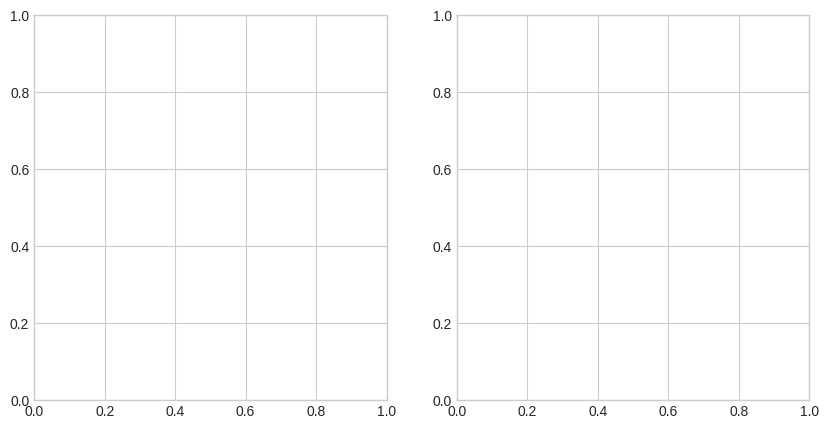

In [ ]:
pareto_dict = {
        method: res["objectives"]
        for method, res in results.items()
        if "objectives" in res
    }

hypervolumes_dict = {
        method: res["hypervolume"]
        for method, res in results.items()
        if "hypervolume" in res
    }

Analyzer.run_multiple(pareto_dict = pareto_dict,
                      hypervolumes_values = hypervolumes_dict,
                      show_pareto = True, 
                      show_hypervolume = True,
                      subplots = True,
                      subplots_hv = True,
                      point = equal
                      )